<div style="border:solid green 2px; padding: 20px"> <h1 style="color:green; margin-bottom:20px">Reviewer's comment v1</h1>

Hello Holly!

My name is **Gerado Flores** and this is my Hub profile: https://hub.tripleten.com/u/dea170e1

I'm happy to review your project today  🙌

You can find my comments under the heading **«Review»**. I will categorize my comments in green, blue or red boxes like this:

<div class="alert alert-success">
    <b>Success:</b> if everything is done successfully
</div>
<div class="alert alert-warning">
    <b>Remarks:</b> if I can give some recommendations or ways to improve the project
</div>
<div class="alert alert-danger">
    <b>Needs fixing:</b> if the block requires some corrections. Work can't be accepted with the red comments
</div>

Please don't remove my comments. If you have any questions, don't hesitate to respond to my comments in a different section.
<div class="alert alert-info"> <b>Student comments: </div>    


<div style="border:solid green 2px; padding: 20px">
<b>Reviewer's comment v1:</b>

    
<b>Overall Feedback</b>
    
Hello Holly,
    
Another project successfully completed - well done! 🏆 Your consistent effort and progress are truly commendable. There are no critical issues, so your project has been accepted!
      
You can find more detailed notes within your project notebook in the **Reviewer's comment v1:** sections.
    
I must say that I was impressed by the project. It is really very good. You provide an analysis that I have been waiting to see for a long time, and no previous project had met that expectation.

As for the analysis, I have no comments to make; everything exceeded expectations.

Starting with the third section, you should only consider the time period you had selected.

The last section of the hypothesis testing does not compare to the previous work done.

As a suggestion, try to remove all code that you don't use and, if possible, create functions to avoid repeating large amounts of code.

Congratulations again on your accomplishment! You truly did an amazing job. Each project you complete adds to your growing expertise, and it’s exciting to see you making such great strides. Keep up the great work! 🎯

# Video Game Sales Analysis Project
## Project Overview

In this project, you'll analyze video game sales data to identify patterns that determine a game's success. Working as an analyst for the online store Ice, you'll use this information to help plan future advertising campaigns.

## Environment Setup and Required Libraries

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
It is always helpful for the reader to have additional information about project tasks. It gives an overview of what you are going to achieve in this project.
 

In [1]:
# Import all required libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from math import factorial
from scipy import stats as st
from scipy.stats import norm
import math as mt

## Step 1: Loading and Initial Data Exploration

First, let's load our dataset and examine its basic properties:

In [2]:
# Load the dataset
games = pd.read_csv('/datasets/games.csv')

In [3]:
# Display basic information about the dataset
display(games.head())

,Name,Platform,Year_of_Release,Genre,NA_sales,EU_sales,JP_sales,Other_sales,Critic_Score,User_Score,Rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,8,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,8.3,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,8,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN


In [4]:
# Check for duplicate entries
games.duplicated().sum()

0

In [5]:
#Check for missing entries
games.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16713 non-null  object 
 1   Platform         16715 non-null  object 
 2   Year_of_Release  16446 non-null  float64
 3   Genre            16713 non-null  object 
 4   NA_sales         16715 non-null  float64
 5   EU_sales         16715 non-null  float64
 6   JP_sales         16715 non-null  float64
 7   Other_sales      16715 non-null  float64
 8   Critic_Score     8137 non-null   float64
 9   User_Score       10014 non-null  object 
 10  Rating           9949 non-null   object 
dtypes: float64(6), object(5)
memory usage: 1.4+ MB


### Key Questions to Answer:
- What's the total number of records in our dataset?
- What data types are present in each column?
- Are there any obvious issues with the data?
- Do we see any immediate patterns or anomalies?

**Question 1:** What is the total number of record in our dataset?
- 16,715

**Question 2:** What data types are present in each column?
- Name: object
- Platform: object
- Year_of_Release: float
- Genre: object
- NA_sales: float
- EU_sales: float
- JP_sales: float
- Other_sales: float
- Critic_Score: float
- User_Score: object
- Rating: object

**Question 3:** Are there any obvious issues with the data?
- the column names should be lower case
- we should note sales are in USD million
- User_Score should be a float
- User_Score should be multiplied by 10 to align with Critic_Score
- Missing data:
    - Name: 2
    - Year_of_Release: 269
    - Genre: 2
    - Critic_Score: 8,578
    - User_Score: 6,701
    - Rating: 6,766

**Question 4:** Do we see any immediate patterns or anomalies?
- Looking at the first 20 pieces of data we see that NA_Sales are the highest and JP_Sales are the lowest. 

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Well done!

## Step 2: Data Preparation

### 2.1 Standardizing Column Names

In [6]:
# Convert column names to lowercase
games.columns = games.columns.str.lower()

In [7]:
# Verify the changes
display(games.head())

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,8,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,8.3,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,8,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN


### 2.2 Data Type Conversion

In [8]:
# Check current data types
games.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16715 non-null  object 
 2   year_of_release  16446 non-null  float64
 3   genre            16713 non-null  object 
 4   na_sales         16715 non-null  float64
 5   eu_sales         16715 non-null  float64
 6   jp_sales         16715 non-null  float64
 7   other_sales      16715 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       10014 non-null  object 
 10  rating           9949 non-null   object 
dtypes: float64(6), object(5)
memory usage: 1.4+ MB


In [9]:
#Make changes to data types if necessary

#Make games user_score a float
games['user_score'] = pd.to_numeric(games['user_score'], errors='coerce')
games['user_score'] = games['user_score'].astype(float)

games.info()

# We changed user_score to float dtype and NaN values to easily manipulate data

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16715 non-null  object 
 2   year_of_release  16446 non-null  float64
 3   genre            16713 non-null  object 
 4   na_sales         16715 non-null  float64
 5   eu_sales         16715 non-null  float64
 6   jp_sales         16715 non-null  float64
 7   other_sales      16715 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       7590 non-null   float64
 10  rating           9949 non-null   object 
dtypes: float64(7), object(4)
memory usage: 1.4+ MB


In [10]:
#Multiply user_score by 10 to match with critic_score

games['user_score'] = games['user_score'] * 10

display(games)


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


In [11]:
# Pay attention to the abbreviation TBD (to be determined). Specify how you intend to handle such cases.
games[games['critic_score'].isna()]

# Forcing the tbd status to NaN will help with data manipulation; there was no obvious reasoning for the tbd status

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


### 2.3 Handling Missing Values

**Completed so far:**
- titles changed to lowercase
- `user_score` changed to a float vs. object
    - We got rid of the 'tbd' status as it was unnecessary, we can further manipulate the data:
    - If `user_score` AND `critic_score` are NaN and the `year_of_release is 2016, we can re-establish this group as tbd
        - Now, we will be able to further evaluate that particular set of data.
        - We can assume that data from 2015 should have been calculated after a year, but data from 2015 and earlier should be analyzed further for missing values as that data may have simply been missed or the game was not very popular


Take a look at what the data looked life before changes (left photo) and after changes (right photo):

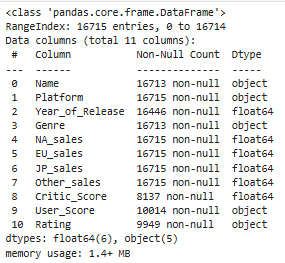 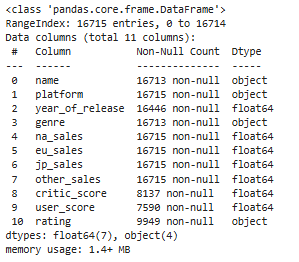

**The changes we see:**
- `user_score` changed from object to float
- all titles changed to lowercase

**Missing values per columns that had changes:**
- `user_score` was the only change from 6,701 to 9,125 missing values
    - The missing values increased because 'tbd' changed to NaN


**Missing values per columns that had no changes:**
- `name` 2 missing values (no change)
- `platform` none
- `year_of_release` 269 (no change)
- `genre` 2 missing values (no change)
- `na_sales` none
- `eu_sales` none
- `jp_sales` none
- `other_sales` none
- `critic_score` 8,578 missing values (no change)
- `user_score` (mentioned above)
- `rating` 6,766 missing values (no change)


<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Well done!

In [12]:
# Examine missing values
games.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16715 non-null  object 
 2   year_of_release  16446 non-null  float64
 3   genre            16713 non-null  object 
 4   na_sales         16715 non-null  float64
 5   eu_sales         16715 non-null  float64
 6   jp_sales         16715 non-null  float64
 7   other_sales      16715 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       7590 non-null   float64
 10  rating           9949 non-null   object 
dtypes: float64(7), object(4)
memory usage: 1.4+ MB


In [13]:
# Calculate percentage of missing values (2)
missing_name = 2/16715 * 100
display(missing_name)

# year_of_release (269)
missing_year_of_release = 269/16715 * 100
display(missing_year_of_release)

# Genre is missing the same amount as the name column (2)
display(missing_name)

# critic_score (8,578) 
missing_critic = 8578/16715 * 100
display(missing_critic)


#user_score was originally missing 6,701; now missing (9,125)
missing_user = 9125/16715 * 100
display(missing_user)


#rating (6,766)
missing_rating = 6766/16715 * 100
display(missing_rating)


# platform is not missing any value
# na_sales is not missing any values
# eu_sales is not missing any values
# jp_sales is not missing any values
# other_sales is not missing any values

0.011965300628178284

1.609332934489979

0.011965300628178284

51.31917439425665

54.59168411606342

40.478612025127134

**Percentage of missing data:**
- `name` 0.01 %
- `year_of_release` 1.61 %` 
- `genre` 0.01 %
- `critic_score` 51.32 % 
- `user_score` 54.59 % 
- `rating` 40.48 % 
- `platform` 0 %
- `na_sales` 0 %
- `eu_sales` 0 %
- `jp_sales` 0 %
- `other_sales` 0 %

We can see that the scoring methods have the hightest amount of missing values
- `critic_score`
- `user_score`
- `rating`

We can see that `year_of_release` had a decent amount of missing values; this is only concerning in the fact that this data may help us to categorize data and is generally relatively easy to get this date as it's not specific to day or month. We need to further analyze `year_of_release` to see if we can find commonality.

There are only 2 missing names and 2 missing genres so this data may be easy to handle or simply discard, but we must first identify what the missing values are. 

In [14]:
#Analyze patterns in missing values

# View the missing values for year_of_release
display(games[games['year_of_release'].isna()].head(20))

#Let's see how many unique names are in this dataset since we saw multiple Sonic the Hedgehog titles
display(games['name'].nunique())

# How are we going to understand a pattern for year_of_release; we can see that Lego's has similar inforamtion, let's explore LEGO's
#You can't get the LEGO data by simply typing 'LEGO'
display(games[games['name'] == 'LEGO'])

#Create new titles for ease and memory retention
LEGO_1 = "LEGO Batman: The Videogame"
LEGO_2 = "LEGO Indiana Jones: The Original Adventures"
LEGO_3 = "LEGO Harry Potter: Years 5-7"

#Display the data we are going to be working with
display(games[(games['name'] == LEGO_1) | (games['name'] == LEGO_2) | (games['name'] == LEGO_3)])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
183,Madden NFL 2004,PS2,NaN,Sports,4.26,0.26,0.01,0.71,94.0,85.0,E
377,FIFA Soccer 2004,PS2,NaN,Sports,0.59,2.36,0.04,0.51,84.0,64.0,E
456,LEGO Batman: The Videogame,Wii,NaN,Action,1.80,0.97,0.00,0.29,74.0,79.0,E10+
475,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN
609,Space Invaders,2600,NaN,Shooter,2.36,0.14,0.00,0.03,NaN,NaN,NaN
627,Rock Band,X360,NaN,Misc,1.93,0.33,0.00,0.21,92.0,82.0,T
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,2.15,0.18,0.00,0.07,73.0,NaN,E
678,LEGO Indiana Jones: The Original Adventures,Wii,NaN,Action,1.51,0.61,0.00,0.21,78.0,66.0,E10+
719,Call of Duty 3,Wii,NaN,Shooter,1.17,0.84,0.00,0.23,69.0,67.0,T
805,Rock Band,Wii,NaN,Misc,1.33,0.56,0.00,0.20,80.0,63.0,T


11559

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
329,LEGO Indiana Jones: The Original Adventures,X360,2008.0,Action,2.40,1.01,0.0,0.36,77.0,75.0,E10+
397,LEGO Batman: The Videogame,X360,2008.0,Action,2.04,1.02,0.0,0.32,76.0,79.0,E10+
456,LEGO Batman: The Videogame,Wii,NaN,Action,1.80,0.97,0.0,0.29,74.0,79.0,E10+
460,LEGO Batman: The Videogame,DS,2008.0,Action,1.75,1.01,0.0,0.29,72.0,80.0,E10+
678,LEGO Indiana Jones: The Original Adventures,Wii,NaN,Action,1.51,0.61,0.0,0.21,78.0,66.0,E10+
743,LEGO Indiana Jones: The Original Adventures,DS,2008.0,Action,1.40,0.59,0.0,0.20,80.0,79.0,E
1408,LEGO Indiana Jones: The Original Adventures,PS2,2008.0,Action,0.60,0.01,0.0,0.76,77.0,84.0,E10+
1519,LEGO Batman: The Videogame,PS3,2008.0,Action,0.72,0.39,0.0,0.19,75.0,77.0,E10+
1538,LEGO Batman: The Videogame,PSP,NaN,Action,0.57,0.44,0.0,0.27,73.0,74.0,E10+
1553,LEGO Batman: The Videogame,PS2,2008.0,Action,0.72,0.03,0.0,0.52,77.0,89.0,E10+


In [15]:
#We see that Batman and Indiana Jones should be set to 2008 and Harry Potter should be 2012
#Reminder:
# LEGO_1 = "LEGO Batman: The Videogame"
# LEGO_2 = "LEGO Indiana Jones: The Original Adventures"
# LEGO_3 = "LEGO Harry Potter: Years 5-7"


#Create a boolean mask for the 0 values in year_of_release as it pertains to LEGO_1 and LEGO_2 titles
mask = (((games['name'] == LEGO_1) | (games['name'] == LEGO_2)) & (games['year_of_release'].isna()))

#Input 2008 into the specified titles using mask and the column 'year_of_release'
games.loc[mask, 'year_of_release'] = 2008


#Test to see if 2008 replaced the NaN
display(games[(games['name'] == LEGO_1) | (games['name'] == LEGO_2)])

#Test to see if the other values were filled in (they are not which is a good thing)
display(games[games['year_of_release'].isna()].head(10))



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
329,LEGO Indiana Jones: The Original Adventures,X360,2008.0,Action,2.40,1.01,0.0,0.36,77.0,75.0,E10+
397,LEGO Batman: The Videogame,X360,2008.0,Action,2.04,1.02,0.0,0.32,76.0,79.0,E10+
456,LEGO Batman: The Videogame,Wii,2008.0,Action,1.80,0.97,0.0,0.29,74.0,79.0,E10+
460,LEGO Batman: The Videogame,DS,2008.0,Action,1.75,1.01,0.0,0.29,72.0,80.0,E10+
678,LEGO Indiana Jones: The Original Adventures,Wii,2008.0,Action,1.51,0.61,0.0,0.21,78.0,66.0,E10+
743,LEGO Indiana Jones: The Original Adventures,DS,2008.0,Action,1.40,0.59,0.0,0.20,80.0,79.0,E
1408,LEGO Indiana Jones: The Original Adventures,PS2,2008.0,Action,0.60,0.01,0.0,0.76,77.0,84.0,E10+
1519,LEGO Batman: The Videogame,PS3,2008.0,Action,0.72,0.39,0.0,0.19,75.0,77.0,E10+
1538,LEGO Batman: The Videogame,PSP,2008.0,Action,0.57,0.44,0.0,0.27,73.0,74.0,E10+
1553,LEGO Batman: The Videogame,PS2,2008.0,Action,0.72,0.03,0.0,0.52,77.0,89.0,E10+


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
183,Madden NFL 2004,PS2,NaN,Sports,4.26,0.26,0.01,0.71,94.0,85.0,E
377,FIFA Soccer 2004,PS2,NaN,Sports,0.59,2.36,0.04,0.51,84.0,64.0,E
475,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN
609,Space Invaders,2600,NaN,Shooter,2.36,0.14,0.00,0.03,NaN,NaN,NaN
627,Rock Band,X360,NaN,Misc,1.93,0.33,0.00,0.21,92.0,82.0,T
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,2.15,0.18,0.00,0.07,73.0,NaN,E
719,Call of Duty 3,Wii,NaN,Shooter,1.17,0.84,0.00,0.23,69.0,67.0,T
805,Rock Band,Wii,NaN,Misc,1.33,0.56,0.00,0.20,80.0,63.0,T
1131,Call of Duty: Black Ops,PC,NaN,Shooter,0.58,0.81,0.00,0.23,81.0,52.0,M
1142,Rock Band,PS3,NaN,Misc,0.99,0.41,0.00,0.22,92.0,84.0,T


In [16]:
# Harry Potter should be 2012
#Reminder:
# LEGO_1 = "LEGO Batman: The Videogame"
# LEGO_2 = "LEGO Indiana Jones: The Original Adventures"
# LEGO_3 = "LEGO Harry Potter: Years 5-7"

display(games[games['name'] == LEGO_3])

#Create a boolean mask
mask_1 = (games['name'] == LEGO_3) & (games['year_of_release'].isna())

#Input the mask into the original DF
games.loc[mask_1, 'year_of_release'] = 2012

#Display the new data
display(games[games['name'] == LEGO_3])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
1609,LEGO Harry Potter: Years 5-7,Wii,NaN,Action,0.69,0.42,0.0,0.12,76.0,78.0,E10+
2132,LEGO Harry Potter: Years 5-7,X360,NaN,Action,0.51,0.37,0.0,0.09,77.0,79.0,E10+
2273,LEGO Harry Potter: Years 5-7,PS3,NaN,Action,0.36,0.41,0.0,0.15,76.0,83.0,E10+
3081,LEGO Harry Potter: Years 5-7,DS,NaN,Action,0.34,0.25,0.0,0.07,69.0,NaN,E10+
4818,LEGO Harry Potter: Years 5-7,3DS,NaN,Action,0.18,0.19,0.0,0.03,71.0,65.0,E10+
6476,LEGO Harry Potter: Years 5-7,PSP,NaN,Action,0.10,0.10,0.0,0.06,NaN,NaN,E10+
7210,LEGO Harry Potter: Years 5-7,PC,NaN,Action,0.05,0.14,0.0,0.03,80.0,85.0,E10+
8059,LEGO Harry Potter: Years 5-7,PSV,2012.0,Action,0.07,0.07,0.0,0.03,64.0,68.0,E10+


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
1609,LEGO Harry Potter: Years 5-7,Wii,2012.0,Action,0.69,0.42,0.0,0.12,76.0,78.0,E10+
2132,LEGO Harry Potter: Years 5-7,X360,2012.0,Action,0.51,0.37,0.0,0.09,77.0,79.0,E10+
2273,LEGO Harry Potter: Years 5-7,PS3,2012.0,Action,0.36,0.41,0.0,0.15,76.0,83.0,E10+
3081,LEGO Harry Potter: Years 5-7,DS,2012.0,Action,0.34,0.25,0.0,0.07,69.0,NaN,E10+
4818,LEGO Harry Potter: Years 5-7,3DS,2012.0,Action,0.18,0.19,0.0,0.03,71.0,65.0,E10+
6476,LEGO Harry Potter: Years 5-7,PSP,2012.0,Action,0.10,0.10,0.0,0.06,NaN,NaN,E10+
7210,LEGO Harry Potter: Years 5-7,PC,2012.0,Action,0.05,0.14,0.0,0.03,80.0,85.0,E10+
8059,LEGO Harry Potter: Years 5-7,PSV,2012.0,Action,0.07,0.07,0.0,0.03,64.0,68.0,E10+


In [17]:
# We can see from the previous data that there are multiple titles with the same name just different platforms
# This means we can use the title names for reference for some of the other missing information using mode


#Let's look at the NaN values for year_of_release
display(games[games['year_of_release'].isna()])

#We can see our data is float dtype
games.info()

#Let's create a mask for the known years by dropping the NaN values in the year_of_release column
known_years = games.dropna(subset=['year_of_release'])
display(known_years)

#Define a mode function to get the mode of the subset of the year_of_release columns by name
def mode(series):
    mode_result = series.mode() # This returns a Series
    if not mode_result.empty:
        return mode_result.iloc[0] # .iloc[0] is similar to [0] for a Series
    else:
        return np.nan

#Explaining the if not statement: reads as "if mode_result is not empty."
#This condition will be True if mode_result contains one or more modes.
#This condition will be False if mode_result is an empty Series (meaning no mode was found).
#If the condition is true the code runs the next line: return mode_result.iloc[0] 
#If the mode result is not empty, this will return the first mode value of the True condition


#Group the known years by the games name to produce the year that games was released as a series and apply your function mode
#Remember: apply() takes values from a DF column and applies a function to them
known_years_series = known_years.groupby('name')['year_of_release'].apply(mode)
display(known_years_series)


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
183,Madden NFL 2004,PS2,NaN,Sports,4.26,0.26,0.01,0.71,94.0,85.0,E
377,FIFA Soccer 2004,PS2,NaN,Sports,0.59,2.36,0.04,0.51,84.0,64.0,E
475,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN
609,Space Invaders,2600,NaN,Shooter,2.36,0.14,0.00,0.03,NaN,NaN,NaN
627,Rock Band,X360,NaN,Misc,1.93,0.33,0.00,0.21,92.0,82.0,T
...,...,...,...,...,...,...,...,...,...,...,...
16373,PDC World Championship Darts 2008,PSP,NaN,Sports,0.01,0.00,0.00,0.00,43.0,NaN,E10+
16405,Freaky Flyers,GC,NaN,Racing,0.01,0.00,0.00,0.00,69.0,65.0,T
16448,Inversion,PC,NaN,Shooter,0.01,0.00,0.00,0.00,59.0,67.0,M
16458,Hakuouki: Shinsengumi Kitan,PS3,NaN,Adventure,0.01,0.00,0.00,0.00,NaN,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16715 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16715 non-null  object 
 2   year_of_release  16456 non-null  float64
 3   genre            16713 non-null  object 
 4   na_sales         16715 non-null  float64
 5   eu_sales         16715 non-null  float64
 6   jp_sales         16715 non-null  float64
 7   other_sales      16715 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       7590 non-null   float64
 10  rating           9949 non-null   object 
dtypes: float64(7), object(4)
memory usage: 1.4+ MB


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


name
 Beyblade Burst                 2016.0
 Fire Emblem Fates              2015.0
 Frozen: Olaf's Quest           2013.0
 Haikyu!! Cross Team Match!     2016.0
 Tales of Xillia 2              2012.0
                                 ...  
thinkSMART FAMILY!              2010.0
thinkSMART: Chess for Kids      2011.0
uDraw Studio                    2010.0
uDraw Studio: Instant Artist    2011.0
¡Shin Chan Flipa en colores!    2007.0
Name: year_of_release, Length: 11426, dtype: float64

In [18]:
#Convert the Series to a dictionary
known_years_dict = known_years_series.to_dict()

#The dictionary lists out all of the title names and associated years, the information is abundant so we will not display the info

#Create a DataFrame with the known_years_dict
known_years_df = pd.DataFrame(list(known_years_dict.items()), columns = ['name','year_of_release'])
display(known_years_df)

#Merge the new DF with the original DF using a left merge to merge the information on the original DF        
games_merged = games.merge(known_years_df, on='name', how='left')
display(games_merged)

#fill the NaN values using .fillna() and putting the newly added column into the original year_of_release column
games_merged['year_of_release_x'] = games_merged['year_of_release_x'].fillna(games_merged['year_of_release_y'])
display(games_merged)

#Now, you can drop the new column since it's no longer needed
games_merged = games_merged.drop(columns=['year_of_release_y'])
display(games_merged)

#Check if this worked - we see the missing Madden game year was filled in correctly
display(games_merged[games_merged['name'] == 'Madden NFL 2004'])
display(games_merged[games_merged['name'] == 'Sonic the Hedgehog'])

#return the column back to year_of_release without the suffix
games['year_of_release'] = games_merged['year_of_release_x']
display(games)

# See how many NaN values you now have (146)
display(games[games['year_of_release'].isna()])



,name,year_of_release
0,Beyblade Burst,2016.0
1,Fire Emblem Fates,2015.0
2,Frozen: Olaf's Quest,2013.0
3,Haikyu!! Cross Team Match!,2016.0
4,Tales of Xillia 2,2012.0
...,...,...
11421,thinkSMART FAMILY!,2010.0
11422,thinkSMART: Chess for Kids,2011.0
11423,uDraw Studio,2010.0
11424,uDraw Studio: Instant Artist,2011.0


,name,platform,year_of_release_x,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,year_of_release_y
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,2006.0
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,1985.0
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,2008.0
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,2009.0
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,1996.0
...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,2016.0
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,2006.0
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,2016.0
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,2003.0


,name,platform,year_of_release_x,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,year_of_release_y
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,2006.0
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,1985.0
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,2008.0
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,2009.0
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,1996.0
...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,2016.0
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,2006.0
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,2016.0
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,2003.0


,name,platform,year_of_release_x,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


,name,platform,year_of_release_x,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
183,Madden NFL 2004,PS2,2003.0,Sports,4.26,0.26,0.01,0.71,94.0,85.0,E
1881,Madden NFL 2004,XB,2003.0,Sports,1.02,0.02,0.00,0.05,92.0,83.0,E
3889,Madden NFL 2004,GC,2003.0,Sports,0.40,0.10,0.00,0.01,94.0,77.0,E
5708,Madden NFL 2004,GBA,2003.0,Sports,0.22,0.08,0.00,0.01,70.0,66.0,E


,name,platform,year_of_release_x,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
257,Sonic the Hedgehog,GEN,1991.0,Platform,3.03,0.91,0.26,0.13,NaN,NaN,NaN
1745,Sonic the Hedgehog,PS3,2006.0,Platform,0.41,0.06,0.04,0.66,43.0,41.0,E10+
1996,Sonic the Hedgehog,X360,2006.0,Platform,0.44,0.48,0.00,0.11,46.0,44.0,E10+
4127,Sonic the Hedgehog,PS3,2006.0,Platform,0.00,0.48,0.00,0.00,43.0,41.0,E10+


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
475,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN
627,Rock Band,X360,NaN,Misc,1.93,0.33,0.00,0.21,92.0,82.0,T
657,Frogger's Adventures: Temple of the Frog,GBA,NaN,Adventure,2.15,0.18,0.00,0.07,73.0,NaN,E
805,Rock Band,Wii,NaN,Misc,1.33,0.56,0.00,0.20,80.0,63.0,T
1142,Rock Band,PS3,NaN,Misc,0.99,0.41,0.00,0.22,92.0,84.0,T
...,...,...,...,...,...,...,...,...,...,...,...
16277,Homeworld Remastered Collection,PC,NaN,Strategy,0.00,0.01,0.00,0.00,86.0,82.0,E10+
16288,Shorts,DS,NaN,Platform,0.01,0.00,0.00,0.00,NaN,NaN,E10+
16348,Agarest Senki: Re-appearance,PS3,NaN,Role-Playing,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16458,Hakuouki: Shinsengumi Kitan,PS3,NaN,Adventure,0.01,0.00,0.00,0.00,NaN,NaN,NaN


In [19]:


# We will perform the exact same thing on the 'rating' column

known_ratings = games.dropna(subset=['rating'])
display(known_ratings)

known_ratings_series = known_ratings.groupby('name')['rating'].apply(mode)
display(known_ratings_series)

#Convert the Series to a dictionary
known_ratings_dict = known_ratings_series.to_dict()

#The dictionary lists out all of the title names and associated years, the information is abundant so we will not display the info

#Create a DataFrame with the known_years_dict
known_ratings_df = pd.DataFrame(list(known_ratings_dict.items()), columns = ['name','rating'])
display(known_ratings_df)

#Merge the new DF with the original DF using a left merge to merge the information on the original DF        
games_merged = games.merge(known_ratings_df, on='name', how='left')
display(games_merged)

#fill the NaN values using .fillna() and putting the newly added column into the original year_of_release column
games_merged['rating_x'] = games_merged['rating_x'].fillna(games_merged['rating_y'])
display(games_merged)

#Now, you can drop the new column since it's no longer needed
games_merged = games_merged.drop(columns=['rating_y'])
display(games_merged)

#Check if this worked - we see the missing Madden game year was filled in correctly
display(games_merged[games_merged['name'] == 'Madden NFL 2004'])
display(games_merged[games_merged['name'] == 'Sonic the Hedgehog'])

#We see that the missing Sonic the Hedgehog game was replaced with E10+

#return the column back to rating without the suffix
games['rating'] = games_merged['rating_x']
display(games)

# See how many NaN values you now have ()
display(games[games['rating'].isna()])



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E
6,New Super Mario Bros.,DS,2006.0,Platform,11.28,9.14,6.50,2.88,89.0,85.0,E
7,Wii Play,Wii,2006.0,Misc,13.96,9.18,2.93,2.84,58.0,66.0,E
...,...,...,...,...,...,...,...,...,...,...,...
16697,Bust-A-Move 3000,GC,2003.0,Puzzle,0.01,0.00,0.00,0.00,53.0,NaN,E
16698,Mega Brain Boost,DS,2008.0,Puzzle,0.01,0.00,0.00,0.00,48.0,NaN,E
16702,STORM: Frontline Nation,PC,2011.0,Strategy,0.00,0.01,0.00,0.00,60.0,72.0,E10+
16704,Plushees,DS,2008.0,Simulation,0.01,0.00,0.00,0.00,NaN,NaN,E


name
 Tales of Xillia 2              T
.hack//Infection Part 1         T
.hack//Mutation Part 2          T
.hack//Outbreak Part 3          T
007 Racing                      T
                               ..
thinkSMART                      E
thinkSMART FAMILY!              E
thinkSMART: Chess for Kids      E
uDraw Studio                    E
uDraw Studio: Instant Artist    E
Name: rating, Length: 6066, dtype: object

,name,rating
0,Tales of Xillia 2,T
1,.hack//Infection Part 1,T
2,.hack//Mutation Part 2,T
3,.hack//Outbreak Part 3,T
4,007 Racing,T
...,...,...
6061,thinkSMART,E
6062,thinkSMART FAMILY!,E
6063,thinkSMART: Chess for Kids,E
6064,uDraw Studio,E


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating_x,rating_y
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating_x,rating_y
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating_x
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating_x
183,Madden NFL 2004,PS2,2003.0,Sports,4.26,0.26,0.01,0.71,94.0,85.0,E
1881,Madden NFL 2004,XB,2003.0,Sports,1.02,0.02,0.00,0.05,92.0,83.0,E
3889,Madden NFL 2004,GC,2003.0,Sports,0.40,0.10,0.00,0.01,94.0,77.0,E
5708,Madden NFL 2004,GBA,2003.0,Sports,0.22,0.08,0.00,0.01,70.0,66.0,E


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating_x
257,Sonic the Hedgehog,GEN,1991.0,Platform,3.03,0.91,0.26,0.13,NaN,NaN,E10+
1745,Sonic the Hedgehog,PS3,2006.0,Platform,0.41,0.06,0.04,0.66,43.0,41.0,E10+
1996,Sonic the Hedgehog,X360,2006.0,Platform,0.44,0.48,0.00,0.11,46.0,44.0,E10+
4127,Sonic the Hedgehog,PS3,2006.0,Platform,0.00,0.48,0.00,0.00,43.0,41.0,E10+


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN


We now have 6,329 missing `rating` scores; whereas, before we had 6,766
- This is only a difference of 437, but still an improvement

In [20]:
#I noticed some duplicated titles, let's take a look

display(games[games[['name','platform','year_of_release']].duplicated()])

display(games[games['name'] == 'Need for Speed: Most Wanted'])

display(games[games['name'] == 'Sonic the Hedgehog'])

display(games[games['name'] == 'Madden NFL 13'])

#We will probably end up dropping these titles, but we have to first investigate the missing name and genre columns

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
4127,Sonic the Hedgehog,PS3,2006.0,Platform,0.0,0.48,0.00,0.0,43.0,41.0,E10+
14244,NaN,GEN,1993.0,NaN,0.0,0.00,0.03,0.0,NaN,NaN,NaN
16230,Madden NFL 13,PS3,2012.0,Sports,0.0,0.01,0.00,0.0,83.0,55.0,E


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
253,Need for Speed: Most Wanted,PS2,2005.0,Racing,2.03,1.79,0.08,0.47,82.0,91.0,T
523,Need for Speed: Most Wanted,PS3,2012.0,Racing,0.71,1.46,0.06,0.58,NaN,NaN,T
1190,Need for Speed: Most Wanted,X360,2012.0,Racing,0.62,0.78,0.01,0.15,83.0,85.0,T
1591,Need for Speed: Most Wanted,X360,2005.0,Racing,1.00,0.13,0.02,0.10,83.0,85.0,T
1998,Need for Speed: Most Wanted,XB,2005.0,Racing,0.53,0.46,0.00,0.05,83.0,88.0,T
2048,Need for Speed: Most Wanted,PSV,2012.0,Racing,0.33,0.45,0.01,0.22,NaN,NaN,T
3581,Need for Speed: Most Wanted,GC,2005.0,Racing,0.43,0.11,0.00,0.02,80.0,91.0,T
5972,Need for Speed: Most Wanted,PC,2005.0,Racing,0.02,0.23,0.00,0.04,82.0,85.0,T
6273,Need for Speed: Most Wanted,WiiU,2013.0,Racing,0.13,0.12,0.00,0.02,NaN,NaN,T
6410,Need for Speed: Most Wanted,DS,2005.0,Racing,0.24,0.01,0.00,0.02,45.0,61.0,E


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
257,Sonic the Hedgehog,GEN,1991.0,Platform,3.03,0.91,0.26,0.13,NaN,NaN,E10+
1745,Sonic the Hedgehog,PS3,2006.0,Platform,0.41,0.06,0.04,0.66,43.0,41.0,E10+
1996,Sonic the Hedgehog,X360,2006.0,Platform,0.44,0.48,0.00,0.11,46.0,44.0,E10+
4127,Sonic the Hedgehog,PS3,2006.0,Platform,0.00,0.48,0.00,0.00,43.0,41.0,E10+


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
507,Madden NFL 13,X360,2012.0,Sports,2.53,0.15,0.0,0.17,81.0,58.0,E
604,Madden NFL 13,PS3,2012.0,Sports,2.11,0.22,0.0,0.23,83.0,55.0,E
3986,Madden NFL 13,Wii,2012.0,Sports,0.47,0.00,0.0,0.03,NaN,73.0,E
5887,Madden NFL 13,PSV,2012.0,Sports,0.28,0.00,0.0,0.02,63.0,73.0,E
7066,Madden NFL 13,WiiU,2012.0,Sports,0.21,0.00,0.0,0.02,75.0,67.0,E
16230,Madden NFL 13,PS3,2012.0,Sports,0.00,0.01,0.0,0.00,83.0,55.0,E


In [21]:
# Analyze patterns in missing values
# View the missing names
display(games[games['name'].isna()])

# We also found the 2 missing genre's; looks look a little deeper; find other games from 1993 on the GEN platform
display(games[(games['year_of_release'] == 1993) & (games['platform'] == 'GEN')])

#It's still hard to determine what these games may be

# Let's check if they are duplicates
display(games[games['na_sales'] == 1.78])
display(games[games['eu_sales'] == 0.53])
display(games[games['jp_sales'] == 0.03])
display(games[games['other_sales'] == 0.08])

display(games[(games['jp_sales'] == 0.03) & (games['platform'] == 'GEN')])

#This did not help too much 

#How many GEN are there? How many games were released in 1993?
display(games[games['platform'] == 'GEN'])

#The closest game to the second NaN is Puzzle & Action: Tant-R	released in 1994

#How many games were released in 1993?
display(games[games['year_of_release'] == 1993])

#There were 62, but this still does not help much 


#A quick google search stated that Sonic the Hedgehog made those sames of the first NaN value, but this shows differently
display(games[games['name'] == 'Sonic the Hedgehog'])



#This did not help much with the determination of the first NaN value for names/genre


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
14244,NaN,GEN,1993.0,NaN,0.00,0.00,0.03,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
7885,Shining Force II,GEN,1993.0,Strategy,0.00,0.00,0.19,0.00,NaN,NaN,NaN
8893,Super Street Fighter II,GEN,1993.0,Fighting,0.00,0.00,0.15,0.00,NaN,NaN,NaN
11986,Ecco: The Tides of Time,GEN,1993.0,Adventure,0.00,0.00,0.07,0.00,NaN,NaN,NaN
12098,Street Fighter II': Special Champion Edition (...,GEN,1993.0,Action,0.00,0.00,0.07,0.00,NaN,NaN,NaN
12264,Streets of Rage 3,GEN,1993.0,Action,0.00,0.00,0.07,0.00,NaN,NaN,NaN
12984,Dynamite Headdy,GEN,1993.0,Platform,0.00,0.00,0.05,0.00,NaN,NaN,NaN
13343,Beyond Oasis,GEN,1993.0,Role-Playing,0.00,0.00,0.05,0.00,NaN,NaN,NaN
14244,NaN,GEN,1993.0,NaN,0.00,0.00,0.03,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
323,Call of Duty: Ghosts,PS4,2013.0,Shooter,1.78,1.43,0.05,0.57,78.0,37.0,M
430,Enter the Matrix,PS2,2003.0,Action,1.78,1.12,0.09,0.19,62.0,81.0,T
570,Guitar Hero: World Tour,X360,2008.0,Misc,1.78,0.63,0.00,0.25,85.0,63.0,T
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
739,Rock Band 2,X360,2008.0,Misc,1.78,0.24,0.00,0.18,92.0,83.0,T


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
512,Yoshi's Story,N64,1997.0,Platform,1.29,0.53,0.98,0.05,NaN,NaN,NaN
513,Mortal Kombat,PS3,2011.0,Fighting,1.98,0.53,0.00,0.34,84.0,84.0,M
555,Mario Party,N64,1998.0,Misc,1.25,0.53,0.87,0.05,NaN,NaN,NaN
634,Midnight Club: Los Angeles,PS3,2008.0,Racing,1.56,0.53,0.05,0.31,82.0,82.0,T
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
702,Pokemon Ranger: Shadows of Almia,DS,2008.0,Role-Playing,0.94,0.53,0.62,0.18,68.0,82.0,E
715,Guitar Hero III: Legends of Rock,PS3,2007.0,Misc,1.40,0.53,0.02,0.30,83.0,78.0,T
897,The Legend of Zelda: Oracle of Ages,GB,2001.0,Action,0.92,0.53,0.41,0.06,NaN,NaN,NaN
925,Star Fox Adventures,GC,2002.0,Adventure,0.96,0.53,0.30,0.09,82.0,77.0,T
930,Ratchet & Clank Future: A Crack in Time,PS3,2009.0,Platform,1.05,0.53,0.03,0.26,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
141,Kinect Sports,X360,2010.0,Sports,3.92,1.73,0.03,0.51,73.0,74.0,E10+
176,Assassin's Creed III,X360,2012.0,Action,3.13,1.69,0.03,0.44,84.0,67.0,M
190,FIFA Soccer 13,X360,2012.0,Action,1.09,3.47,0.03,0.57,90.0,61.0,E
242,Halo 5: Guardians,XOne,2015.0,Shooter,2.78,1.27,0.03,0.41,84.0,64.0,T
243,Spider-Man: The Movie,PS2,2002.0,Action,2.71,1.51,0.03,0.23,76.0,79.0,E
...,...,...,...,...,...,...,...,...,...,...,...
14983,Beyblade Burst,3DS,2016.0,Role-Playing,0.00,0.00,0.03,0.00,NaN,NaN,NaN
14986,Gakuen Alice: WakuWaku * Happy Friends,DS,2007.0,Adventure,0.00,0.00,0.03,0.00,NaN,NaN,NaN
14988,Kyokugen Dasshutsu ADV: Zennin Shiboudesu,PSV,2012.0,Adventure,0.00,0.00,0.03,0.00,NaN,NaN,NaN
14989,Konohana 2: Todoke Kanai Requiem,PS2,2002.0,Adventure,0.00,0.00,0.03,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
78,Halo 2,XB,2004.0,Shooter,6.82,1.53,0.05,0.08,95.0,82.0,M
89,Pac-Man,2600,1982.0,Puzzle,7.28,0.45,0.00,0.08,NaN,NaN,NaN
238,Madden NFL 2005,PS2,2004.0,Sports,4.18,0.26,0.01,0.08,91.0,79.0,E
252,Zelda II: The Adventure of Link,NES,1987.0,Adventure,2.19,0.50,1.61,0.08,NaN,NaN,NaN
372,Donkey Kong Country 3: Dixie Kong's Double Tro...,SNES,1996.0,Platform,1.17,0.50,1.75,0.08,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
5964,Invizimals: Shadow Zone,PSP,2010.0,Strategy,0.05,0.16,0.00,0.08,NaN,90.0,E10+
6372,Scooby-Doo! and the Spooky Swamp,PS2,2010.0,Action,0.08,0.11,0.00,0.08,NaN,NaN,NaN
6593,Star Wars The Clone Wars: Republic Heroes,PS2,2009.0,Action,0.17,0.01,0.00,0.08,NaN,83.0,T
7893,Monsters vs. Aliens,PS2,2009.0,Action,0.11,0.00,0.00,0.08,64.0,NaN,E10+


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
960,Sonic & Knuckles,GEN,1994.0,Platform,1.24,0.43,0.03,0.12,NaN,NaN,NaN
1365,Disney's The Lion King,GEN,1994.0,Platform,0.97,0.37,0.03,0.05,NaN,NaN,NaN
14244,NaN,GEN,1993.0,NaN,0.00,0.00,0.03,0.00,NaN,NaN,NaN
14488,Puzzle & Action: Tant-R,GEN,1994.0,Misc,0.00,0.00,0.03,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
145,Sonic the Hedgehog 2,GEN,1992.0,Platform,4.47,1.20,0.16,0.19,NaN,NaN,NaN
257,Sonic the Hedgehog,GEN,1991.0,Platform,3.03,0.91,0.26,0.13,NaN,NaN,E10+
564,Mortal Kombat,GEN,1992.0,Fighting,1.95,0.63,0.00,0.09,NaN,NaN,M
588,Streets of Rage,GEN,1990.0,Action,1.86,0.55,0.11,0.08,NaN,NaN,NaN
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
832,NBA Jam,GEN,1992.0,Sports,1.75,0.25,0.00,0.05,NaN,NaN,E
960,Sonic & Knuckles,GEN,1994.0,Platform,1.24,0.43,0.03,0.12,NaN,NaN,NaN
996,Sonic the Hedgehog 3,GEN,1994.0,Platform,1.02,0.47,0.20,0.07,NaN,NaN,NaN
1099,Street Fighter II': Special Champion Edition,GEN,1992.0,Fighting,1.00,0.30,0.31,0.04,NaN,NaN,NaN
1365,Disney's The Lion King,GEN,1994.0,Platform,0.97,0.37,0.03,0.05,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
56,Super Mario All-Stars,SNES,1993.0,Platform,5.99,2.15,2.12,0.29,NaN,NaN,NaN
476,Star Fox,SNES,1993.0,Shooter,1.61,0.51,0.80,0.07,NaN,NaN,NaN
659,NaN,GEN,1993.0,NaN,1.78,0.53,0.00,0.08,NaN,NaN,NaN
852,Super Street Fighter II,SNES,1993.0,Fighting,0.52,0.16,1.29,0.03,NaN,NaN,NaN
892,Mortal Kombat II,SNES,1993.0,Fighting,1.48,0.39,0.00,0.06,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...
12997,Pachinko Wars II,SNES,1993.0,Misc,0.00,0.00,0.05,0.00,NaN,NaN,NaN
13189,Keiba Eight Special,SNES,1993.0,Sports,0.00,0.00,0.05,0.00,NaN,NaN,NaN
13343,Beyond Oasis,GEN,1993.0,Role-Playing,0.00,0.00,0.05,0.00,NaN,NaN,NaN
14244,NaN,GEN,1993.0,NaN,0.00,0.00,0.03,0.00,NaN,NaN,NaN


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
257,Sonic the Hedgehog,GEN,1991.0,Platform,3.03,0.91,0.26,0.13,NaN,NaN,E10+
1745,Sonic the Hedgehog,PS3,2006.0,Platform,0.41,0.06,0.04,0.66,43.0,41.0,E10+
1996,Sonic the Hedgehog,X360,2006.0,Platform,0.44,0.48,0.00,0.11,46.0,44.0,E10+
4127,Sonic the Hedgehog,PS3,2006.0,Platform,0.00,0.48,0.00,0.00,43.0,41.0,E10+


In [22]:
# Since we are not able to figure out what these titles are, we will drop them as 2 will not change the data drastically.
#First, drop the 2 rows with the missing name and genre 
games.dropna(subset = ['name'], inplace = True)

#Test it
display(games[games['name'].isna()])
games.info()


# Drop the duplicated titles that also have the same platform and year_of_release (this also gets rid of 1 of the NaN 'name' and 'genre'
#column; this is fine we will end up getting rid of the other missing NaN 
#games.drop_duplicates(subset=['name', 'platform','year_of_release'], keep=first, inplace=True)

display(games[games[['name','platform','year_of_release']].duplicated()])

games.drop_duplicates(subset = ['name','platform','year_of_release'],keep= 'first', inplace = True)


#Test it
display(games[games['name'] == 'Sonic the Hedgehog'])
display(games[games['name'] == 'Madden NFL 13'])
games.info()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16713 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16713 non-null  object 
 1   platform         16713 non-null  object 
 2   year_of_release  16567 non-null  float64
 3   genre            16713 non-null  object 
 4   na_sales         16713 non-null  float64
 5   eu_sales         16713 non-null  float64
 6   jp_sales         16713 non-null  float64
 7   other_sales      16713 non-null  float64
 8   critic_score     8137 non-null   float64
 9   user_score       7590 non-null   float64
 10  rating           10386 non-null  object 
dtypes: float64(7), object(4)
memory usage: 1.5+ MB


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
4127,Sonic the Hedgehog,PS3,2006.0,Platform,0.0,0.48,0.0,0.0,43.0,41.0,E10+
16230,Madden NFL 13,PS3,2012.0,Sports,0.0,0.01,0.0,0.0,83.0,55.0,E


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
257,Sonic the Hedgehog,GEN,1991.0,Platform,3.03,0.91,0.26,0.13,NaN,NaN,E10+
1745,Sonic the Hedgehog,PS3,2006.0,Platform,0.41,0.06,0.04,0.66,43.0,41.0,E10+
1996,Sonic the Hedgehog,X360,2006.0,Platform,0.44,0.48,0.00,0.11,46.0,44.0,E10+


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating
507,Madden NFL 13,X360,2012.0,Sports,2.53,0.15,0.0,0.17,81.0,58.0,E
604,Madden NFL 13,PS3,2012.0,Sports,2.11,0.22,0.0,0.23,83.0,55.0,E
3986,Madden NFL 13,Wii,2012.0,Sports,0.47,0.00,0.0,0.03,NaN,73.0,E
5887,Madden NFL 13,PSV,2012.0,Sports,0.28,0.00,0.0,0.02,63.0,73.0,E
7066,Madden NFL 13,WiiU,2012.0,Sports,0.21,0.00,0.0,0.02,75.0,67.0,E


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16711 non-null  object 
 1   platform         16711 non-null  object 
 2   year_of_release  16565 non-null  float64
 3   genre            16711 non-null  object 
 4   na_sales         16711 non-null  float64
 5   eu_sales         16711 non-null  float64
 6   jp_sales         16711 non-null  float64
 7   other_sales      16711 non-null  float64
 8   critic_score     8135 non-null   float64
 9   user_score       7588 non-null   float64
 10  rating           10384 non-null  object 
dtypes: float64(7), object(4)
memory usage: 1.5+ MB


**What we have accomplished**
- We have dropped 4 unnecessary rows (16715 - 16711)
    - The missing 'name' and 'genre' values were in the same row; there was a lack of pattern to determine the title of theses rows; therefore they were dropped
    - It was determined that Sonic the Hedgehog(PS3-2006) and Madden NFL 13(PS3-2012) were duplicates; there should not be a games that has the same platform AND year
- `year_of_release` and `rating` were found using the mode of the release date categorized by name
- `year_of_release` went from missing 1.61% to 0.87%
- `rating` went from 40.48% to 37.89&; this is still very high
    - should look at how `rating` compares to 'genre'

**We are going to leave the missing release years at 146 ; this is a good improvement from 269**
- Defined a function (mode) to fill in the missing data by the name of the games
- The score percentage of missing values was low to begin with at 1.61%; the percent of missing data is now 0.87%
- We may not have to do anymore with year_of_release since the missing data is less than 1%
- I have done minimal research on a few of the title names that have a year in the title and the release date has been the year prior to that date
- Example:
    - wwe Smackdown vs. Raw 2006: release date 2005
    - Madden NFL 2004: release date 2003
    - FIFA Soccer 2004: release date 2003
- Overall, there is less than 1% of missing data in the `year_of_release` column (0.87%)


**New Percentages for Missing Values**

- `name` none (before: 0.01%)
- `year_of_release` 0.87% (before: 1.61)
- `genre` non (before: 0.01%)
- `critic_score` 51.32% (before: 51.32%)
- `user_score` 54.59% (before: 54.49%)
- `rating` 37.86% (before: 40.48%)

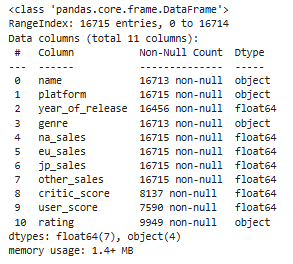 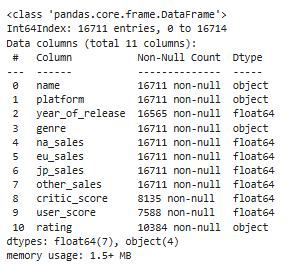

**Further Plans:**
- See if we can make inferences or categorize further for `rating`
- Categorize `critic_score` and `user_score` by total sales and era and input their means

In [23]:
display(games['user_score'].min() ,games['user_score'].max())
display(games['critic_score'].min(),games['critic_score'].max())

0.0

97.0

13.0

98.0

- `user_score_min` = 0
- `user_score_max` = 97
- `critic_score_min` = 13
- `critic_score_max` = 98

In [24]:
#Copy the games data to games_1 so we can perform calculations on both DF's to see the difference later
games_1 = games.copy()

#Re-examine the data
games.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16711 non-null  object 
 1   platform         16711 non-null  object 
 2   year_of_release  16565 non-null  float64
 3   genre            16711 non-null  object 
 4   na_sales         16711 non-null  float64
 5   eu_sales         16711 non-null  float64
 6   jp_sales         16711 non-null  float64
 7   other_sales      16711 non-null  float64
 8   critic_score     8135 non-null   float64
 9   user_score       7588 non-null   float64
 10  rating           10384 non-null  object 
dtypes: float64(7), object(4)
memory usage: 1.5+ MB


So far, we have still have: 
- 146 missing `year_of_release`
- 9,125 missing `user_score`
- 8,578 missing `critic_score`
- 6,329 missing `rating`

The plan is to:
- get the total_sales
- categorize `user_score` and `critic_score` by the total sales and era
- leave `year_of_release` as is
- categorize t`rating`, if possible


<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

This is exactly what I hoped one of the students would do. I know it was a lot of work, but what a great job you did!

### 2.4 Calculate Total Sales

In [25]:
# Calculate total sales across all regions and put them in a different column

games['total_sales'] = games['na_sales'] + games['eu_sales'] + games['jp_sales'] + games['other_sales']
games_1['total_sales'] = games['na_sales'] + games['eu_sales'] + games['jp_sales'] + games['other_sales']

display(games)

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38
...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01


In [26]:
games.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16711 non-null  object 
 1   platform         16711 non-null  object 
 2   year_of_release  16565 non-null  float64
 3   genre            16711 non-null  object 
 4   na_sales         16711 non-null  float64
 5   eu_sales         16711 non-null  float64
 6   jp_sales         16711 non-null  float64
 7   other_sales      16711 non-null  float64
 8   critic_score     8135 non-null   float64
 9   user_score       7588 non-null   float64
 10  rating           10384 non-null  object 
 11  total_sales      16711 non-null  float64
dtypes: float64(8), object(4)
memory usage: 1.7+ MB


In [27]:
#Group your user_score and critic score into categories of no score, low, medium, high, and very high, and NaN



def score_group(score):
    if score == 0:
        return 'no score'
    elif score < 65:
        return 'low'
    elif score <= 75:
        return 'medium'
    elif score <= 85:
        return 'high'
    elif score > 85:
        return 'very high'
    else:
        return np.nan


#Use apply to apply the function
games_1['critic_score_group'] = games_1['critic_score'].apply(score_group)
games_1['user_score_group'] = games_1['user_score'].apply(score_group)


# See the results
display(games_1)

# Look at the changes
games_1.info()

# Only 1 has no score
display(games_1[games_1['user_score_group'] == "no score"])



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 14 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16565 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              10384 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8135 non-null   object 
 13  user_score_group    7588 non-null   object 
dtypes: float64(8), object(6)
memory usage: 1.9+ MB


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group
2835,My Little Pony: Pinkie Pie's Party,DS,2008.0,Adventure,0.66,0.0,0.0,0.06,NaN,0.0,E,0.72,NaN,no score


`total_sales` min: 0.0

`total_sales` max: 82.54

`total_sales` mean: 0.54

`total_sales` mode: 0.02

In [28]:
# < 50,000
games_1[(games_1['total_sales'] >= 0) & (games_1['total_sales'] < 0.05)]
#1021

# 50,000 - < 100,000
games_1[(games_1['total_sales'] >= 0.05) & (games_1['total_sales'] < 0.1)]
#1207

# 100,000 - < 200,000
games_1[(games_1['total_sales'] >= 0.1) & (games_1['total_sales'] < 0.2)]
#1481

# 200,000 - < 500,000
games_1[(games_1['total_sales'] >= 0.2) & (games_1['total_sales'] < 0.5)]
#1976

# 500,000 - < 1,000,000
games_1[(games_1['total_sales'] >= 0.5) & (games_1['total_sales'] < 1)]
#1231

# 1,000,000 - < 2,000,000
games_1[(games_1['total_sales'] >= 1) & (games_1['total_sales'] < 2)]
#777

# 2,000,000 - < 3,000,000
games_1[(games_1['total_sales'] >= 2) & (games_1['total_sales'] < 3)]
#245

# 3,000,000 - < 4,000,000
games_1[(games_1['total_sales'] >= 3) & (games_1['total_sales'] < 4)]
#121

# 4,000,000 - < 5,000,000
games_1[(games_1['total_sales'] >= 4) & (games_1['total_sales'] < 5)]
#62

# 5,000,000 - < 10,000,000
games_1[(games_1['total_sales'] >= 5) & (games_1['total_sales'] < 10)]
#105

# 10,000,000 - < 20,000,000
games_1[(games_1['total_sales'] >= 10) & (games_1['total_sales'] < 20)]
#27

# 20,000,000 - < 50,000,000
games_1[(games_1['total_sales'] >= 20) & (games_1['total_sales'] < 50)]
#12

# > 50,000,000
games_1[games_1['total_sales'] >= 50] 
#1


#Group the total sales by their numbers

def total_sales_group(total_sales):
    if total_sales == 0:
        return "No Sale"
    elif total_sales < 0.05:
        return "< 50,000"
    elif total_sales < 0.1:
        return "50,000 - < 100,000"
    elif total_sales < 0.2:
        return "100,000 - < 200,000"
    elif total_sales < 0.5:
        return "200,000 - < 500,000"
    elif total_sales < 1:
        return "500,000 - < 1 million"
    elif total_sales < 5:
        return "1 million - < 5 million"
    elif total_sales < 10:
        return "5 million - < 10 million"
    elif total_sales >= 10:
        return "10 million +"
    else:
        return np.nan

#Use apply()
games_1['total_sales_group'] = games_1['total_sales'].apply(total_sales_group)

#Display the data
display(games_1)

#There are 2 with no sales
games_1[games_1['total_sales_group'] == "No Sale"]




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN,10 million +
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38,NaN,NaN,10 million +
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000"
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000"
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000"
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group
16676,G1 Jockey 4 2008,PS3,2008.0,Sports,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,No Sale
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,No Sale


In [29]:
# "< 50,000"
# "50,000 - < 100,000"
# "100,000 - < 200,000"
# "200,000 - < 500,000"
# "500,000 - < 1 million"
# "1 million - < 5 million"
# "5 million - < 10 million"
# "10 million +"

#Create a mask where critic_score and user_score are both NaN and released in 2016
mask = (games_1['user_score_group'].isna()) & (games_1['critic_score_group'].isna()) & (games_1['year_of_release'] >= 2016)
display(mask)

#Name the NaN values previously defined as tbd since these games were just released
games_1.loc[mask,['critic_score_group','user_score_group']] = 'tbd'

#There are 235 rows now marked as tbd
display(games_1[games_1['critic_score_group'] == 'tbd'])



0        False
1        False
2        False
3        False
4        False
         ...  
16710     True
16711    False
16712     True
16713    False
16714     True
Length: 16711, dtype: bool

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group
108,Pokemon Sun/Moon,3DS,2016.0,Role-Playing,2.98,1.45,2.26,0.45,NaN,NaN,NaN,7.14,tbd,tbd,5 million - < 10 million
1216,Ratchet & Clank (2016),PS4,2016.0,Platform,0.50,0.76,0.04,0.24,NaN,NaN,NaN,1.54,tbd,tbd,1 million - < 5 million
1275,Doom (2016),PS4,2016.0,Shooter,0.54,0.69,0.02,0.24,NaN,NaN,NaN,1.49,tbd,tbd,1 million - < 5 million
1466,Yokai Watch 3,3DS,2016.0,Action,0.00,0.00,1.33,0.00,NaN,NaN,NaN,1.33,tbd,tbd,1 million - < 5 million
1475,The Elder Scrolls V: Skyrim,PS4,2016.0,Role-Playing,0.48,0.59,0.04,0.21,NaN,NaN,M,1.32,tbd,tbd,1 million - < 5 million
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16699,The Longest 5 Minutes,PSV,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16703,Strawberry Nauts,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"


In [30]:
# 1980 - 2016
display(games_1['year_of_release'].min(), games_1['year_of_release'].max())

# 3,292 video games had a total_sale of less than 50,000 USD
display(games_1[games_1['total_sales_group'] == "< 50,000"])

# 71.26
display(games_1['user_score'].mean())

#68.97
display(games_1['critic_score'].mean())

# 235 rows labeled as 'tbd'
games_1[(games_1['user_score_group'] == "tbd") & (games_1['critic_score_group'] == "tbd")]

1980.0

2016.0

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group
12966,Touch 'N' Play Collection,DS,2010.0,Misc,0.03,0.01,0.00,0.0,NaN,NaN,E,0.04,NaN,NaN,"< 50,000"
13001,PAC-MAN and the Ghostly Adventures,WiiU,2013.0,Platform,0.03,0.01,0.00,0.0,58.0,65.0,E10+,0.04,low,medium,"< 50,000"
13004,Virtua Striker 2002,GC,2002.0,Sports,0.01,0.00,0.03,0.0,58.0,60.0,E,0.04,low,low,"< 50,000"
13016,Hunted: The Demon's Forge,PC,2011.0,Action,0.03,0.01,0.00,0.0,61.0,66.0,M,0.04,low,medium,"< 50,000"
13094,Nanostray 2,DS,2008.0,Shooter,0.03,0.01,0.00,0.0,75.0,78.0,E,0.04,medium,high,"< 50,000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.0,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000"
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.0,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000"


71.2565893516078

68.96914566687154

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group
108,Pokemon Sun/Moon,3DS,2016.0,Role-Playing,2.98,1.45,2.26,0.45,NaN,NaN,NaN,7.14,tbd,tbd,5 million - < 10 million
1216,Ratchet & Clank (2016),PS4,2016.0,Platform,0.50,0.76,0.04,0.24,NaN,NaN,NaN,1.54,tbd,tbd,1 million - < 5 million
1275,Doom (2016),PS4,2016.0,Shooter,0.54,0.69,0.02,0.24,NaN,NaN,NaN,1.49,tbd,tbd,1 million - < 5 million
1466,Yokai Watch 3,3DS,2016.0,Action,0.00,0.00,1.33,0.00,NaN,NaN,NaN,1.33,tbd,tbd,1 million - < 5 million
1475,The Elder Scrolls V: Skyrim,PS4,2016.0,Role-Playing,0.48,0.59,0.04,0.21,NaN,NaN,M,1.32,tbd,tbd,1 million - < 5 million
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16699,The Longest 5 Minutes,PSV,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16703,Strawberry Nauts,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000"


In [31]:
#Categorize by year

def era_group(year):
    if year < 1990:
        return "80's"
    elif year < 2000:
        return "90's"
    elif year < 2010:
        return "2000's"
    elif year >= 2010:
        return "2010's"
    else:
        np.nan

#Use apply()
games_1['era'] = games_1['year_of_release'].apply(era_group)

display(games_1)


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN,10 million +,80's
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38,NaN,NaN,10 million +,90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's


In [32]:
display(games_1)


# Make a copy of this data to use in later calculations if necessary
games_2 = games_1.copy()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN,10 million +,80's
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38,NaN,NaN,10 million +,90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's


In [33]:
#rounded the data
games_1['user_score'] = games_1['user_score'].round(decimals = 1)
games_1['critic_score'] = games_1['critic_score'].round(decimals = 1)

games_2['user_score'] = games_2['user_score'].round(decimals = 1)
games_2['critic_score'] = games_2['critic_score'].round(decimals = 1)

display(games_1)

games_1.info()

#6327 NaN `rating`
games_1[games_1['rating'].isna()]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN,10 million +,80's
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38,NaN,NaN,10 million +,90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16565 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              10384 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16565 non-null  object 
dtypes: f

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN,10 million +,80's
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38,NaN,NaN,10 million +,90's
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN,30.26,NaN,NaN,10 million +,80's
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN,28.31,NaN,NaN,10 million +,80's
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN,24.67,NaN,NaN,10 million +,2000's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's


In [34]:
#Examine all DF's
games.info()
games_1.info()
games_2.info()





<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16711 non-null  object 
 1   platform         16711 non-null  object 
 2   year_of_release  16565 non-null  float64
 3   genre            16711 non-null  object 
 4   na_sales         16711 non-null  float64
 5   eu_sales         16711 non-null  float64
 6   jp_sales         16711 non-null  float64
 7   other_sales      16711 non-null  float64
 8   critic_score     8135 non-null   float64
 9   user_score       7588 non-null   float64
 10  rating           10384 non-null  object 
 11  total_sales      16711 non-null  float64
dtypes: float64(8), object(4)
memory usage: 1.7+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              ------------

In [35]:
# Examine all DF's again
games.info()

games_1.info()

games_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16711 non-null  object 
 1   platform         16711 non-null  object 
 2   year_of_release  16565 non-null  float64
 3   genre            16711 non-null  object 
 4   na_sales         16711 non-null  float64
 5   eu_sales         16711 non-null  float64
 6   jp_sales         16711 non-null  float64
 7   other_sales      16711 non-null  float64
 8   critic_score     8135 non-null   float64
 9   user_score       7588 non-null   float64
 10  rating           10384 non-null  object 
 11  total_sales      16711 non-null  float64
dtypes: float64(8), object(4)
memory usage: 1.7+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              ------------

In [36]:
#What are the unique values of `rating`
games_1['rating'].unique()



array(['E', nan, 'M', 'T', 'E10+', 'K-A', 'AO', 'EC', 'RP'], dtype=object)

In [37]:
#Let's sort the data by genre to see what we get

#First, let's get a count of the values
display(games['rating'].value_counts().sort_index())

AO         1
E       4152
E10+    1470
EC        10
K-A        4
M       1654
RP         3
T       3090
Name: rating, dtype: int64

**Most significant ratings (most to least)**
- E: 4152
- T: 3090
- M: 1654
- E10+: 1470

**Least significant ratings (most to least)**
- EC: 10
- K-A: 4
- RP: 3
- AO: 1

In [38]:
#This line is used to look at specific titles
games_1[games_1['name'] == "WRC: FIA World Rally Championship"]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7584,WRC: FIA World Rally Championship,PS3,2005.0,Racing,0.00,0.14,0.01,0.04,68.0,45.0,E,0.19,medium,low,"100,000 - < 200,000",2000's
9827,WRC: FIA World Rally Championship,X360,2005.0,Racing,0.00,0.10,0.00,0.02,66.0,60.0,E10+,0.12,medium,low,"100,000 - < 200,000",2000's
14233,WRC: FIA World Rally Championship,PSP,2005.0,Racing,0.02,0.01,0.00,0.00,67.0,78.0,E,0.03,medium,high,"< 50,000",2000's
16180,WRC: FIA World Rally Championship,PC,2005.0,Racing,0.00,0.01,0.00,0.00,65.0,NaN,RP,0.01,medium,NaN,"< 50,000",2000's


In [39]:
#Look at the least significant ratings
games_1[(games_1['rating'] == 'AO') | (games_1['rating'] == 'RP') | (games_1['rating'] == 'K-A') | (games_1['rating'] == 'EC')]

#AO should be M
# google state that this rating is rare and there was the same game, but with an M

#K-A below:
# All between 96' - 98'
# 3 strategy and one miscellaneious
# PaRappa The Rapper seems like it could be E; however, K-A may have been part of an older rating system - the K-A was released in 1996 --
# The 2006 version was rated E
# Theme Hospital - both games are rated K-A and they were released in 97' and 98'
# I did a quick google search and K-A is now E so we can change these to E

#EC below:
# All EC games came out between 2005 and 2011, they are mostly miscellaneous, but have adventure and Action genres
# Nickelodeon Team Umizoomi	is only on DS
# Sesame Street: Elmo's A-to-Zoo Adventure is on the Wii, DS, and PC only
# Sesame Street: Cookie's Counting Carnival	 is on the Wii DS, and PC only
# Dora the Explorer: Journey to the Purple Planet is on the PS2 and GC only
# Ni Hao, Kai-lan: New Year's Celebration is on the DS only
# These all seem like childrens games, nothing seems wrong with this rating
# We may want to look for NaN values that are only on the DS, are Misc and in the 2000's or later; 
# possibly a way to know if it's a childrens game

#RP below:
# These are all PC games
# WRC: FIA World Rally Championship is the only game that is not exclusively a PC game
# We could look for games that are only PC games and give them an RP score
# Google states this means the rating is pending
# We could probably just drop these since they are so insignificant
# Earliest game recorded - 2005; latest 2010



#Plan so far:
# Revert K-A games to E 
# Revert AO to M - I googled this and they returned the game to M after an edited version
# EC is for very young children, but there was a slight pattern, a few were only available on the DS and between 2005 and 2011;
    # also had mostly Misc genres
# Decide weather to drop or look for games that are ONLY on a PC an revert those from NaN to RP


games_1[games_1['rating'] == 'AO']

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
875,Grand Theft Auto: San Andreas,XB,2005.0,Action,1.26,0.61,0.0,0.09,93.0,86.0,AO,1.96,very high,very high,1 million - < 5 million,2000's


In [40]:
#This line is used to look at specific titles
games_1[games_1['name'] == "Just Dance 4"]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
116,Just Dance 4,Wii,2012.0,Misc,4.05,2.16,0.0,0.55,74.0,73.0,E10+,6.76,medium,medium,5 million - < 10 million,2010's
1714,Just Dance 4,X360,2012.0,Misc,0.90,0.19,0.0,0.09,77.0,77.0,E10+,1.18,high,high,1 million - < 5 million,2010's
4520,Just Dance 4,PS3,2012.0,Misc,0.26,0.11,0.0,0.06,77.0,71.0,E10+,0.43,high,medium,"200,000 - < 500,000",2010's
5085,Just Dance 4,WiiU,2012.0,Misc,0.21,0.13,0.0,0.03,66.0,78.0,E10+,0.37,medium,high,"200,000 - < 500,000",2010's


In [41]:
#Now let's look at E,T, M, and E10+

#E10+ below:
# only 21 games before 2000

#M below:

#T below:

#E below:


games_1[games_1['rating'] == 'E10+']


#I am going to start making some of the changes discussed previously before tackling the larger datasets

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
61,Just Dance 3,Wii,2011.0,Misc,5.95,3.11,0.00,1.06,74.0,78.0,E10+,10.12,medium,high,10 million +,2010's
68,Just Dance 2,Wii,2010.0,Misc,5.80,2.85,0.01,0.78,74.0,73.0,E10+,9.44,medium,medium,5 million - < 10 million,2010's
103,Just Dance,Wii,2009.0,Misc,3.48,2.99,0.00,0.73,49.0,80.0,E10+,7.20,low,high,5 million - < 10 million,2000's
116,Just Dance 4,Wii,2012.0,Misc,4.05,2.16,0.00,0.55,74.0,73.0,E10+,6.76,medium,medium,5 million - < 10 million,2010's
141,Kinect Sports,X360,2010.0,Sports,3.92,1.73,0.03,0.51,73.0,74.0,E10+,6.19,medium,medium,5 million - < 10 million,2010's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16620,Trine,PC,2009.0,Action,0.00,0.01,0.00,0.00,80.0,82.0,E10+,0.01,high,high,"< 50,000",2000's
16633,SBK Superbike World Championship,PSP,2008.0,Racing,0.01,0.00,0.00,0.00,NaN,NaN,E10+,0.01,NaN,NaN,"< 50,000",2000's
16640,Hospital Tycoon,PC,2007.0,Strategy,0.00,0.01,0.00,0.00,51.0,38.0,E10+,0.01,low,low,"< 50,000",2000's
16654,Ben 10 Omniverse 2,X360,2013.0,Action,0.00,0.01,0.00,0.00,NaN,51.0,E10+,0.01,NaN,low,"< 50,000",2010's


In [42]:
#Plan so far:
# Revert K-A games to E 
# Revert AO to M - I googled this and they returned the game to M after an edited version
    #Check with Grand Theft Auto: San Andreas	
# EC is for very young children, but there was a slight pattern, a few were only available on the DS and between 2005 and 2011;
    # also had mostly Misc genres
# Decide weather to drop or look for games that are ONLY on a PC an revert those from NaN to RP

#Revert K-A to E

#Create a mask:
ka_mask = games_1['rating'] == 'K-A'
ka2_mask = games_2['rating'] == 'K-A'

#use loc[] to change K-A directly to E
games_1.loc[ka_mask,['rating']] = 'E'
games_2.loc[ka2_mask,['rating']] = 'E'

#Check
games_1[games_1['rating'] == 'K-A']
games_2[games_2['rating'] == 'K-A']

# Check to ensure it changed
display(games_1[games_1['name'] == "Worms 2"])
games_2[games_2['name'] == "Worms 2"]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
16681,Worms 2,PC,1997.0,Strategy,0.0,0.01,0.0,0.0,NaN,81.0,E,0.01,NaN,high,"< 50,000",90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
16681,Worms 2,PC,1997.0,Strategy,0.0,0.01,0.0,0.0,NaN,81.0,E,0.01,NaN,high,"< 50,000",90's


In [43]:
# Revert AO to M - I googled this and they returned the game to M after an edited version
    #Check with Grand Theft Auto: San Andreas	
# EC is for very young children, but there was a slight pattern, a few were only available on the DS and between 2005 and 2011;
    # also had mostly Misc genres
# Decide weather to drop or look for games that are ONLY on a PC an revert those from NaN to RP


#Revert AO to M

#Create a mask
ao_mask = games_1['rating'] == 'AO'
ao2_mask = games_2['rating'] == 'AO'

#Use loc[] to change this directly
games_1.loc[ao_mask,['rating']] = 'M'
games_2.loc[ao2_mask,['rating']] = 'M'

#Check
display(games_1[games_1['name'] == "Grand Theft Auto: San Andreas"])
display(games_2[games_2['name'] == "Grand Theft Auto: San Andreas"])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
17,Grand Theft Auto: San Andreas,PS2,2004.0,Action,9.43,0.40,0.41,10.57,95.0,90.0,M,20.81,very high,very high,10 million +,2000's
875,Grand Theft Auto: San Andreas,XB,2005.0,Action,1.26,0.61,0.00,0.09,93.0,86.0,M,1.96,very high,very high,1 million - < 5 million,2000's
2115,Grand Theft Auto: San Andreas,PC,2005.0,Action,0.00,0.93,0.00,0.04,93.0,89.0,M,0.97,very high,very high,"500,000 - < 1 million",2000's
10311,Grand Theft Auto: San Andreas,X360,2008.0,Action,0.08,0.02,0.00,0.01,NaN,75.0,M,0.11,NaN,medium,"100,000 - < 200,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
17,Grand Theft Auto: San Andreas,PS2,2004.0,Action,9.43,0.40,0.41,10.57,95.0,90.0,M,20.81,very high,very high,10 million +,2000's
875,Grand Theft Auto: San Andreas,XB,2005.0,Action,1.26,0.61,0.00,0.09,93.0,86.0,M,1.96,very high,very high,1 million - < 5 million,2000's
2115,Grand Theft Auto: San Andreas,PC,2005.0,Action,0.00,0.93,0.00,0.04,93.0,89.0,M,0.97,very high,very high,"500,000 - < 1 million",2000's
10311,Grand Theft Auto: San Andreas,X360,2008.0,Action,0.08,0.02,0.00,0.01,NaN,75.0,M,0.11,NaN,medium,"100,000 - < 200,000",2000's


In [44]:
# EC is for very young children, but there was a slight pattern, a few were only available on the DS and between 2005 and 2011;
    # also had mostly Misc genres
# Decide weather to drop or look for games that are ONLY on a PC and revert those from NaN to RP

#Let's take a look at the data

display(games_1[(games_1['rating'].isna()) & (games_1['platform'] == 'DS') & (games_1['genre'] == 'Misc') 
    & (games_1['name'] != 'Yu-Gi-Oh! GX: Spirit Caller (American Sales)')])



#All of this data looks like its for small children based off of the titles that imply learning for young children with the exception of 
#Yugi-Yo

#Create a mask
ec_mask = (games_1['rating'].isna()) & (games_1['platform'] == 'DS') & (games_1['genre'] == 'Misc') & (games_1['name'] != 'Yu-Gi-Oh! GX: Spirit Caller (American Sales)')
ec2_mask = (games_2['rating'].isna()) & (games_2['platform'] == 'DS') & (games_2['genre'] == 'Misc') & (games_2['name'] != 'Yu-Gi-Oh! GX: Spirit Caller (American Sales)')

games_1.loc[ec_mask, ['rating']] = 'EC'
games_2.loc[ec2_mask, ['rating']] = 'EC'

display(games_1[(games_1['rating'].isna()) & (games_1['platform'] == 'DS') & (games_1['genre'] == 'Misc') 
    & (games_1['name'] != 'Yu-Gi-Oh! GX: Spirit Caller (American Sales)')])



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
340,Friend Collection,DS,2009.0,Misc,0.00,0.00,3.67,0.00,NaN,NaN,NaN,3.67,NaN,NaN,1 million - < 5 million,2000's
403,English Training: Have Fun Improving Your Skills!,DS,2006.0,Misc,0.00,0.99,2.32,0.02,NaN,NaN,NaN,3.33,NaN,NaN,1 million - < 5 million,2000's
1046,Kanshuu Nippon Joushikiryoku Kentei Kyoukai: I...,DS,2006.0,Misc,0.00,0.00,1.71,0.00,NaN,NaN,NaN,1.71,NaN,NaN,1 million - < 5 million,2000's
1187,High School Musical 3: Senior Year,DS,2008.0,Misc,0.63,0.76,0.00,0.17,NaN,NaN,NaN,1.56,NaN,NaN,1 million - < 5 million,2000's
1769,High School Musical 2: Work This Out!,DS,2008.0,Misc,0.50,0.52,0.00,0.13,NaN,NaN,NaN,1.15,NaN,NaN,1 million - < 5 million,2000's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16432,Nakayoshi All-Stars: Mezase Gakuen Idol,DS,2008.0,Misc,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's
16480,Nova Usagi no Game de Ryuugaku!? DS,DS,2007.0,Misc,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's
16557,Juggler DS,DS,2008.0,Misc,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's
16592,Who Wants to be a Millionaire: 2nd Edition,DS,2008.0,Misc,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era


In [45]:
# Decide weather to drop or look for games that are ONLY on a PC and revert those from NaN to RP
# (Strategy or Racing for genre)
# 2005 - 2011 possibly for year
# The total sales are low so this may not be worth it
# All have low sales
# Let's change all of the games that are NaN and released after 2015 to RP since at the beginning of Q1 at a company the games
#were likely just released


display(games_1[games_1['rating'] == 'RP'])


rp_mask = (games_1['name'] == 'Clockwork Empires')
rp_mask_1 = (games_1['name'] == 'Supreme Ruler: Cold War')
rp_mask_2 = (games_1['name'] == 'WRC: FIA World Rally Championship')

#Input the data
games_1.loc[rp_mask,['rating']] = 'T'
games_1.loc[rp_mask_1,['rating']] = 'E10+'
games_1.loc[rp_mask_2,['rating']] = 'E'

#Check
games_1[games_1['name'].isin(['Clockwork Empires','Supreme Ruler: Cold War', 'WRC: FIA World Rally Championship'])]


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13672,Clockwork Empires,PC,NaN,Strategy,0.0,0.04,0.0,0.00,58.0,38.0,RP,0.04,low,low,"< 50,000",None
14270,Supreme Ruler: Cold War,PC,2011.0,Strategy,0.0,0.03,0.0,0.01,63.0,68.0,RP,0.04,low,medium,"< 50,000",2010's
16180,WRC: FIA World Rally Championship,PC,2005.0,Racing,0.0,0.01,0.0,0.00,65.0,NaN,RP,0.01,medium,NaN,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7584,WRC: FIA World Rally Championship,PS3,2005.0,Racing,0.00,0.14,0.01,0.04,68.0,45.0,E,0.19,medium,low,"100,000 - < 200,000",2000's
9827,WRC: FIA World Rally Championship,X360,2005.0,Racing,0.00,0.10,0.00,0.02,66.0,60.0,E,0.12,medium,low,"100,000 - < 200,000",2000's
13672,Clockwork Empires,PC,NaN,Strategy,0.00,0.04,0.00,0.00,58.0,38.0,T,0.04,low,low,"< 50,000",None
14233,WRC: FIA World Rally Championship,PSP,2005.0,Racing,0.02,0.01,0.00,0.00,67.0,78.0,E,0.03,medium,high,"< 50,000",2000's
14270,Supreme Ruler: Cold War,PC,2011.0,Strategy,0.00,0.03,0.00,0.01,63.0,68.0,E10+,0.04,low,medium,"< 50,000",2010's
16180,WRC: FIA World Rally Championship,PC,2005.0,Racing,0.00,0.01,0.00,0.00,65.0,NaN,E,0.01,medium,NaN,"< 50,000",2000's


In [46]:
# Using games_2 to rename the RP to their designated locations


display(games_2[games_2['rating'] == 'RP'])

rp2_mask = (games_2['name'] == 'Clockwork Empires')
rp2_mask_1 = (games_2['name'] == 'Supreme Ruler: Cold War')
rp2_mask_2 = (games_2['name'] == 'WRC: FIA World Rally Championship')

#Input the data
games_2.loc[rp2_mask,['rating']] = 'T'
games_2.loc[rp2_mask_1,['rating']] = 'E10+'
games_2.loc[rp2_mask_2,['rating']] = 'E'

#Check
games_2[games_2['name'].isin(['Clockwork Empires','Supreme Ruler: Cold War', 'WRC: FIA World Rally Championship'])]


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13672,Clockwork Empires,PC,NaN,Strategy,0.0,0.04,0.0,0.00,58.0,38.0,RP,0.04,low,low,"< 50,000",None
14270,Supreme Ruler: Cold War,PC,2011.0,Strategy,0.0,0.03,0.0,0.01,63.0,68.0,RP,0.04,low,medium,"< 50,000",2010's
16180,WRC: FIA World Rally Championship,PC,2005.0,Racing,0.0,0.01,0.0,0.00,65.0,NaN,RP,0.01,medium,NaN,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7584,WRC: FIA World Rally Championship,PS3,2005.0,Racing,0.00,0.14,0.01,0.04,68.0,45.0,E,0.19,medium,low,"100,000 - < 200,000",2000's
9827,WRC: FIA World Rally Championship,X360,2005.0,Racing,0.00,0.10,0.00,0.02,66.0,60.0,E,0.12,medium,low,"100,000 - < 200,000",2000's
13672,Clockwork Empires,PC,NaN,Strategy,0.00,0.04,0.00,0.00,58.0,38.0,T,0.04,low,low,"< 50,000",None
14233,WRC: FIA World Rally Championship,PSP,2005.0,Racing,0.02,0.01,0.00,0.00,67.0,78.0,E,0.03,medium,high,"< 50,000",2000's
14270,Supreme Ruler: Cold War,PC,2011.0,Strategy,0.00,0.03,0.00,0.01,63.0,68.0,E10+,0.04,low,medium,"< 50,000",2010's
16180,WRC: FIA World Rally Championship,PC,2005.0,Racing,0.00,0.01,0.00,0.00,65.0,NaN,E,0.01,medium,NaN,"< 50,000",2000's


In [47]:
#Examine the data
games_1.info()

#This is still roughly 35% of the data which seems like a lot

games_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16565 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              10590 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16565 non-null  object 
dtypes: f

In [48]:
#Look at the change
display(games_2['rating'].value_counts(ascending = True))

display(games_2['rating'].unique())

games_2['platform'].unique()

EC       216
E10+    1470
M       1655
T       3091
E       4158
Name: rating, dtype: int64

array(['E', nan, 'M', 'T', 'E10+', 'EC'], dtype=object)

array(['Wii', 'NES', 'GB', 'DS', 'X360', 'PS3', 'PS2', 'SNES', 'GBA',
       'PS4', '3DS', 'N64', 'PS', 'XB', 'PC', '2600', 'PSP', 'XOne',
       'WiiU', 'GC', 'GEN', 'DC', 'PSV', 'SAT', 'SCD', 'WS', 'NG', 'TG16',
       '3DO', 'GG', 'PCFX'], dtype=object)

In [49]:


#Analyze the 1470 E10+, 1655 M, 3091 T, &  4158 E games by genre
#Create a mask for each of these ratings


e10_games_2 = games_2[games_2['rating'] == 'E10+']
m_games_2 = games_2[games_2['rating'] == 'M']
t_games_2 = games_2[games_2['rating'] == 'T']
e_games_2 = games_2[games_2['rating'] == 'E']






In [50]:
#look at the info to determine NaN values
games_1.info()
games_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16565 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              10590 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16565 non-null  object 
dtypes: f

In [51]:
# E10+ = 82' = 16' [12 genres]
    # Action          501
    # Misc            168
    # Platform        149
    # Role-Playing    119
    # Sports          109
    # Racing          103
# Under 100
    # Strategy         79
    # Adventure        70
    # Shooter          59
    # Simulation       51
    # Puzzle           43
    # Fighting         19

# M = 92' - 16' [11 genres]
    # Action          656
    # Shooter         572
    # Role-Playing    176
    # Adventure       111
 # Under 100
    # Fighting         56
    # Strategy         26
    # Racing           18
    # Sports           17
    # Misc             15
    # Simulation        5
    # Platform          3

# T = 80' - 16' [12 genres]
    # Action          714
    # Role-Playing    451
    # Fighting        376
    # Shooter         354
    # Misc            249
    # Sports          206
    # Simulation      195
    # Racing          182
    # Strategy        164
    # Adventure       124
# Under 100
    # Platform         65
    # Puzzle           10

# E = 81' - 16' [12 genres]
    # Sports          1227
    # Racing           605
    # Misc             477
    # Action           448
    # Platform         377
    # Simulation       335
    # Puzzle           298
    # Adventure        167
# Under 100
    # Role-Playing      89
    # Strategy          76
    # Shooter           49
    # Fighting           8

# The M rating appears to be the most restricted for games from 1992 - 2016 and does not include the puzzle genre
# T is the most inclusive with ratings between 1980 and 2016

#Some patterns seen in E10+


# By era, exluding 80's; the ESRP did not come out until 1994


e10_90_2 = e10_games_2[e10_games_2['era'] == "90's"]
e10_00_2 = e10_games_2[e10_games_2['era'] == "2000's"]
e10_10_2 = e10_games_2[e10_games_2['era'] == "2010's"]



m_90_2 = m_games_2[m_games_2['era'] == "90's"]
m_00_2 = m_games_2[m_games_2['era'] == "2000's"]
m_10_2 = m_games_2[m_games_2['era'] == "2010's"]




t_90_2 = t_games_2[t_games_2['era'] == "90's"]
t_00_2 = t_games_2[t_games_2['era'] == "2000's"]
t_10_2 = t_games_2[t_games_2['era'] == "2010's"]




e_90_2 = e_games_2[e_games_2['era'] == "90's"]
e_00_2 = e_games_2[e_games_2['era'] == "2000's"]
e_10_2 = e_games_2[e_games_2['era'] == "2010's"]





In [52]:
# Focus on this data

# e10_90_2 = e10_games_2[e10_games_2['era'] == "90's"]
# e10_00_2 = e10_games_2[e10_games_2['era'] == "2000's"]
# e10_10_2 = e10_games_2[e10_games_2['era'] == "2010's"]

# m_90_2 = m_games_2[m_games_2['era'] == "90's"]
# m_00_2 = m_games_2[m_games_2['era'] == "2000's"]
# m_10_2 = m_games_2[m_games_2['era'] == "2010's"]

# t_90_2 = t_games_2[t_games_2['era'] == "90's"]
# t_00_2 = t_games_2[t_games_2['era'] == "2000's"]
# t_10_2 = t_games_2[t_games_2['era'] == "2010's"]

# e_90_2 = e_games_2[e_games_2['era'] == "90's"]
# e_00_2 = e_games_2[e_games_2['era'] == "2000's"]
# e_10_2 = e_games_2[e_games_2['era'] == "2010's"]



# display(e10_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(m_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(t_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(e_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))

# display(e10_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(m_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(t_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(e_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))


# display(e10_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(m_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(t_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
# display(e_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))




# Take another look at the 90's, 2000's and 2010 data with game_2

# 90's

# Change the NaN values in rating that have both user_score and critic_score to E since that is their label
rating2_na_90 = (games_2[(games_2['critic_score'].notna()) & (games_2['user_score'].notna()) & (games_2['era'] == "90's") & (games_2['rating'].isna())].sort_values(by = ['critic_score','user_score']))
display(rating2_na_90)

rating_90_mask = (games_2['critic_score'].notna()) & (games_2['user_score'].notna()) & (games_2['era'] == "90's") & (games_2['rating'].isna())

games_2.loc[rating_90_mask,['rating']] = 'E'

display(games_2[games_2['name'] == 'Monster Rancher'])

rating2_notna_90 = (games_2[(games_2['critic_score'].notna()) & (games_2['user_score'].notna()) & (games_2['era'] == "90's") & (games_2['rating'].notna())].sort_values(by = ['critic_score','user_score']))
display(rating2_notna_90)

#Although there are E10+ games rated from the 90's, the ESRB rating for E10+ did not come out until 2005

display(e10_90_2)
display(m_90_2)
display(t_90_2)
display(e_90_2)


display(e10_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(m_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(t_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(e_90_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
2054,Monster Rancher,PS,1997.0,Simulation,0.12,0.08,0.74,0.07,86.0,83.0,NaN,1.01,very high,high,1 million - < 5 million,90's
822,R4: Ridge Racer Type 4,PS,1998.0,Racing,0.68,0.46,0.79,0.13,88.0,92.0,NaN,2.06,very high,very high,1 million - < 5 million,90's
6631,WipEout XL,PS,1996.0,Racing,0.14,0.10,0.00,0.02,93.0,87.0,NaN,0.26,very high,very high,"200,000 - < 500,000",90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
2054,Monster Rancher,PS,1997.0,Simulation,0.12,0.08,0.74,0.07,86.0,83.0,E,1.01,very high,high,1 million - < 5 million,90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
10110,ECW Anarchy Rulz,PS,1999.0,Fighting,0.06,0.04,0.00,0.01,43.0,63.0,E,0.11,low,low,"100,000 - < 200,000",90's
8389,Clock Tower II: The Struggle Within,PS,1998.0,Adventure,0.02,0.01,0.12,0.01,49.0,57.0,M,0.16,low,low,"100,000 - < 200,000",90's
10386,Digimon Digital Card Battle,PS,1999.0,Strategy,0.06,0.04,0.00,0.01,51.0,90.0,T,0.11,low,very high,"100,000 - < 200,000",90's
12124,Dragon Valor,PS,1999.0,Role-Playing,0.04,0.03,0.00,0.00,57.0,83.0,T,0.07,low,high,"50,000 - < 100,000",90's
6993,Gundam Battle Assault,PS,1998.0,Fighting,0.13,0.09,0.00,0.02,61.0,78.0,T,0.24,low,high,"200,000 - < 500,000",90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,Metal Gear Solid,PS,1998.0,Action,3.18,1.83,0.78,0.24,94.0,94.0,M,6.03,very high,very high,5 million - < 10 million,90's
52,Gran Turismo,PS,1997.0,Racing,4.02,3.87,2.54,0.52,96.0,87.0,E,10.95,very high,very high,10 million +,90's
106,Tekken 3,PS,1998.0,Fighting,3.27,2.22,1.40,0.29,96.0,91.0,T,7.18,very high,very high,5 million - < 10 million,90's
284,Half-Life,PC,1997.0,Shooter,4.03,0.00,0.09,0.00,96.0,91.0,M,4.12,very high,very high,1 million - < 5 million,90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
257,Sonic the Hedgehog,GEN,1991.0,Platform,3.03,0.91,0.26,0.13,NaN,NaN,E10+,4.33,NaN,NaN,1 million - < 5 million,90's
388,Final Fantasy III,SNES,1994.0,Role-Playing,0.86,0.00,2.55,0.02,NaN,NaN,E10+,3.43,NaN,NaN,1 million - < 5 million,90's
687,Chrono Trigger,SNES,1995.0,Role-Playing,0.28,0.00,2.02,0.01,NaN,NaN,E10+,2.31,NaN,NaN,1 million - < 5 million,90's
861,SimCity,SNES,1991.0,Simulation,0.93,0.27,0.75,0.04,NaN,NaN,E10+,1.99,NaN,NaN,1 million - < 5 million,90's
1383,Final Fantasy III,NES,1990.0,Role-Playing,0.00,0.00,1.39,0.01,NaN,NaN,E10+,1.40,NaN,NaN,1 million - < 5 million,90's
1878,BeatMania,PS,1998.0,Simulation,0.00,0.00,1.07,0.02,NaN,NaN,E10+,1.09,NaN,NaN,1 million - < 5 million,90's
2129,Romancing SaGa,SNES,1992.0,Role-Playing,0.00,0.00,0.97,0.00,NaN,NaN,E10+,0.97,NaN,NaN,"500,000 - < 1 million",90's
3364,Front Mission,SNES,1995.0,Strategy,0.00,0.00,0.60,0.00,NaN,NaN,E10+,0.60,NaN,NaN,"500,000 - < 1 million",90's
3462,Tales of Phantasia,PS,1998.0,Role-Playing,0.00,0.00,0.54,0.04,NaN,NaN,E10+,0.58,NaN,NaN,"500,000 - < 1 million",90's
4852,Tales of Phantasia,SNES,1995.0,Role-Playing,0.00,0.00,0.40,0.00,NaN,NaN,E10+,0.40,NaN,NaN,"200,000 - < 500,000",90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
146,Metal Gear Solid,PS,1998.0,Action,3.18,1.83,0.78,0.24,94.0,94.0,M,6.03,very high,very high,5 million - < 10 million,90's
151,Resident Evil 2,PS,1998.0,Action,1.88,1.47,2.02,0.45,89.0,92.0,M,5.82,very high,very high,5 million - < 10 million,90's
203,Resident Evil,PS,1996.0,Action,2.05,1.16,1.11,0.73,91.0,90.0,M,5.05,very high,very high,5 million - < 10 million,90's
284,Half-Life,PC,1997.0,Shooter,4.03,0.00,0.09,0.00,96.0,91.0,M,4.12,very high,very high,1 million - < 5 million,90's
334,Resident Evil 3: Nemesis,PS,1999.0,Action,1.30,0.77,1.54,0.11,NaN,NaN,M,3.72,NaN,NaN,1 million - < 5 million,90's
564,Mortal Kombat,GEN,1992.0,Fighting,1.95,0.63,0.00,0.09,NaN,NaN,M,2.67,NaN,NaN,1 million - < 5 million,90's
684,Grand Theft Auto,PS,1997.0,Action,0.79,1.35,0.04,0.14,NaN,NaN,M,2.32,NaN,NaN,1 million - < 5 million,90's
786,Parasite Eve,PS,1998.0,Role-Playing,0.94,0.07,1.05,0.04,81.0,89.0,M,2.10,high,very high,1 million - < 5 million,90's
856,Tenchu: Stealth Assassins,PS,1997.0,Action,0.95,0.64,0.27,0.13,87.0,88.0,M,1.99,very high,very high,1 million - < 5 million,90's
1156,Silent Hill,PS,1999.0,Action,0.71,0.48,0.30,0.10,86.0,92.0,M,1.59,very high,very high,1 million - < 5 million,90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
65,Final Fantasy VII,PS,1997.0,Role-Playing,3.01,2.47,3.28,0.96,92.0,92.0,T,9.72,very high,very high,5 million - < 10 million,90's
67,Gran Turismo 2,PS,1999.0,Racing,3.88,3.42,1.69,0.50,93.0,90.0,T,9.49,very high,very high,5 million - < 10 million,90's
88,Final Fantasy VIII,PS,1999.0,Role-Playing,2.28,1.72,3.63,0.23,90.0,86.0,T,7.86,very high,very high,5 million - < 10 million,90's
106,Tekken 3,PS,1998.0,Fighting,3.27,2.22,1.40,0.29,96.0,91.0,T,7.18,very high,very high,5 million - < 10 million,90's
139,Driver,PS,1999.0,Action,3.11,2.80,0.02,0.33,87.0,81.0,T,6.26,very high,high,5 million - < 10 million,90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12124,Dragon Valor,PS,1999.0,Role-Playing,0.04,0.03,0.00,0.00,57.0,83.0,T,0.07,low,high,"50,000 - < 100,000",90's
12833,Elemental Gearbolt,PS,1997.0,Shooter,0.03,0.02,0.00,0.00,76.0,NaN,T,0.05,high,NaN,"50,000 - < 100,000",90's
13336,StarCraft,PC,1998.0,Strategy,0.00,0.04,0.00,0.01,88.0,91.0,T,0.05,very high,very high,"50,000 - < 100,000",90's
14212,Planescape: Torment,PC,1998.0,Role-Playing,0.01,0.02,0.00,0.00,91.0,92.0,T,0.03,very high,very high,"< 50,000",90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
52,Gran Turismo,PS,1997.0,Racing,4.02,3.87,2.54,0.52,96.0,87.0,E,10.95,very high,very high,10 million +,90's
71,Donkey Kong Country,SNES,1994.0,Platform,4.36,1.71,3.00,0.23,NaN,NaN,E,9.30,NaN,NaN,5 million - < 10 million,90's
109,Crash Bandicoot 3: Warped,PS,1998.0,Platform,3.68,1.75,1.42,0.28,91.0,89.0,E,7.13,very high,very high,5 million - < 10 million,90's
221,Crash Team Racing,PS,1999.0,Racing,2.57,1.57,0.44,0.21,88.0,90.0,E,4.79,very high,very high,1 million - < 5 million,90's
232,The Legend of Zelda: A Link to the Past,SNES,1991.0,Action,2.42,0.91,1.15,0.13,NaN,NaN,E,4.61,NaN,NaN,1 million - < 5 million,90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15122,Pharaoh,PC,1998.0,Strategy,0.00,0.02,0.00,0.00,NaN,86.0,E,0.02,NaN,very high,"< 50,000",90's
15173,RayCrisis: Series Termination,PS,1999.0,Shooter,0.01,0.01,0.00,0.00,67.0,NaN,E,0.02,medium,NaN,"< 50,000",90's
15375,Homeworld,PC,1998.0,Strategy,0.00,0.02,0.00,0.00,93.0,90.0,E,0.02,very high,very high,"< 50,000",90's
16539,Grand Prix Legends,PC,1997.0,Racing,0.00,0.01,0.00,0.00,NaN,75.0,E,0.01,NaN,medium,"< 50,000",90's


,critic_score,user_score,total_sales
genre,,,
Platform,NaN,NaN,4.33
Role-Playing,NaN,NaN,1.52
Simulation,NaN,NaN,1.13
Strategy,NaN,NaN,0.60


,critic_score,user_score,total_sales
genre,,,
Action,88.83,89.86,2.58
Shooter,90.50,86.50,1.41
Fighting,NaN,NaN,1.34
Role-Playing,84.67,88.67,1.22
Adventure,60.33,73.00,0.07
Strategy,NaN,NaN,0.06


,critic_score,user_score,total_sales
genre,,,
Sports,92.00,92.00,5.02
Racing,93.00,90.00,3.84
Action,75.50,81.86,2.28
Fighting,84.12,82.38,1.93
Role-Playing,82.71,86.21,1.80
Platform,88.67,91.67,1.17
Shooter,84.00,86.00,0.98
Adventure,88.00,94.00,0.72
Simulation,82.50,83.00,0.62


,critic_score,user_score,total_sales
genre,,,
Platform,83.33,84.0,3.53
Racing,79.62,84.5,2.07
Action,77.00,79.0,2.03
Misc,79.00,81.5,1.11
Adventure,69.00,NaN,1.04
Simulation,81.25,85.5,0.72
Sports,74.33,87.0,0.70
Strategy,83.00,84.0,0.59
Role-Playing,79.00,79.5,0.52


In [53]:
display(rating2_notna_90['rating'].value_counts())

# T = 39
# E = 28
# M = 13

display(rating2_notna_90)

pivot2_rating_notna_90 = rating2_notna_90.pivot_table(index = ['rating','genre'], columns = 'year_of_release', values = 'name', aggfunc = 'count').fillna('')
display(pivot2_rating_notna_90)

pivot2_rating_sales_90 = rating2_notna_90.pivot_table(index = ['rating','total_sales_group'], columns = 'year_of_release', values= 'name',aggfunc = 'count').fillna('')
display(pivot2_rating_sales_90)

T    39
E    28
M    13
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
10110,ECW Anarchy Rulz,PS,1999.0,Fighting,0.06,0.04,0.00,0.01,43.0,63.0,E,0.11,low,low,"100,000 - < 200,000",90's
8389,Clock Tower II: The Struggle Within,PS,1998.0,Adventure,0.02,0.01,0.12,0.01,49.0,57.0,M,0.16,low,low,"100,000 - < 200,000",90's
10386,Digimon Digital Card Battle,PS,1999.0,Strategy,0.06,0.04,0.00,0.01,51.0,90.0,T,0.11,low,very high,"100,000 - < 200,000",90's
12124,Dragon Valor,PS,1999.0,Role-Playing,0.04,0.03,0.00,0.00,57.0,83.0,T,0.07,low,high,"50,000 - < 100,000",90's
6993,Gundam Battle Assault,PS,1998.0,Fighting,0.13,0.09,0.00,0.02,61.0,78.0,T,0.24,low,high,"200,000 - < 500,000",90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,Metal Gear Solid,PS,1998.0,Action,3.18,1.83,0.78,0.24,94.0,94.0,M,6.03,very high,very high,5 million - < 10 million,90's
52,Gran Turismo,PS,1997.0,Racing,4.02,3.87,2.54,0.52,96.0,87.0,E,10.95,very high,very high,10 million +,90's
106,Tekken 3,PS,1998.0,Fighting,3.27,2.22,1.40,0.29,96.0,91.0,T,7.18,very high,very high,5 million - < 10 million,90's
284,Half-Life,PC,1997.0,Shooter,4.03,0.00,0.09,0.00,96.0,91.0,M,4.12,very high,very high,1 million - < 5 million,90's


year_of_release     1992.0 1994.0 1996.0 1997.0 1998.0 1999.0
rating genre                                                 
E      Action                                             1.0
       Fighting                                           1.0
       Misc                          1.0                  1.0
       Platform                                    2.0    1.0
       Puzzle                        1.0           1.0       
       Racing                        1.0    1.0    1.0    4.0
       Role-Playing                         1.0    2.0    1.0
       Shooter                              1.0    1.0       
       Simulation                           2.0           1.0
       Sports                                      1.0       
       Strategy                                    1.0    1.0
M      Action                        2.0    1.0    2.0    1.0
       Adventure                                   1.0    1.0
       Role-Playing                  1.0           1.0    1.0
       Shooter         1.0                  1.0              
T      Action                        1.0           1.0    2.0
       Adventure                                          1.0
       Fighting               1.0    1.0    1.0    4.0    1.0
       Platform                             2.0    1.0       
       Racing                                             1.0
       Role-Playing                         3.0    4.0    7.0
       Shooter                                     1.0       
       Simulation                           1.0           1.0
       Sports                                             1.0
       Strategy                                    2.0    2.0

year_of_release                 1992.0 1994.0 1996.0 1997.0 1998.0 1999.0
rating total_sales_group                                                 
E      1 million - < 5 million                   1.0    1.0    3.0    4.0
       10 million +                                     1.0              
       100,000 - < 200,000                       1.0           2.0    1.0
       200,000 - < 500,000                       1.0    1.0           4.0
       5 million - < 10 million                                1.0       
       50,000 - < 100,000                               1.0    1.0    1.0
       500,000 - < 1 million                            1.0    1.0    1.0
       < 50,000                                                1.0       
M      1 million - < 5 million                   2.0    2.0    1.0    1.0
       100,000 - < 200,000                                     1.0       
       5 million - < 10 million                  1.0           2.0       
       500,000 - < 1 million                                          1.0
       < 50,000                    1.0                                1.0
T      1 million - < 5 million            1.0    1.0    4.0    4.0    3.0
       100,000 - < 200,000                                            1.0
       200,000 - < 500,000                              1.0    2.0    2.0
       5 million - < 10 million                  1.0    1.0    1.0    4.0
       50,000 - < 100,000                                      2.0    3.0
       500,000 - < 1 million                            1.0    3.0    3.0
       < 50,000                                                1.0

In [54]:
# ESRB rating started in 1994
# Puzzle is only in E
display(games_2[(games_2['year_of_release'] > 1993) & (games_2['year_of_release'] < 2000) & (games_2['genre'] == 'Puzzle')])


puz2_90_mask = (games_2['year_of_release'] > 1993) & (games_2['year_of_release'] < 2000) & (games_2['genre'] == 'Puzzle')

games_2.loc[puz2_90_mask, ['rating']] = 'E'

display(games_2[games_2['name'] == 'Tetris Plus'])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
654,Tetris Plus,PS,1996.0,Puzzle,2.10,0.24,0.00,0.07,NaN,NaN,NaN,2.41,NaN,NaN,1 million - < 5 million,90's
896,Tetris DX,GB,1998.0,Puzzle,1.06,0.60,0.20,0.07,NaN,NaN,NaN,1.93,NaN,NaN,1 million - < 5 million,90's
1573,Devil Dice,PS,1998.0,Puzzle,0.05,0.03,1.10,0.08,NaN,NaN,NaN,1.26,NaN,NaN,1 million - < 5 million,90's
1638,Intelligent Qube,PS,1997.0,Puzzle,0.13,0.07,1.00,0.02,NaN,NaN,NaN,1.22,NaN,NaN,1 million - < 5 million,90's
1777,Puyo Puyo Sun Ketteiban,PS,1997.0,Puzzle,0.00,0.00,1.07,0.07,NaN,NaN,NaN,1.14,NaN,NaN,1 million - < 5 million,90's
1993,Bomberman 64,N64,1997.0,Puzzle,0.50,0.20,0.31,0.03,NaN,NaN,NaN,1.04,NaN,NaN,1 million - < 5 million,90's
2041,Pong: The Next Level,PS,1998.0,Puzzle,0.56,0.38,0.00,0.07,NaN,NaN,NaN,1.01,NaN,NaN,1 million - < 5 million,90's
2474,Q*bert,PS,1999.0,Puzzle,0.46,0.32,0.00,0.05,NaN,NaN,NaN,0.83,NaN,NaN,"500,000 - < 1 million",90's
2529,Super Bomberman 2,SNES,1994.0,Puzzle,0.00,0.00,0.81,0.00,NaN,NaN,NaN,0.81,NaN,NaN,"500,000 - < 1 million",90's
2546,The Next Tetris,PS,1998.0,Puzzle,0.45,0.31,0.00,0.05,NaN,NaN,NaN,0.81,NaN,NaN,"500,000 - < 1 million",90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
654,Tetris Plus,PS,1996.0,Puzzle,2.1,0.24,0.0,0.07,NaN,NaN,E,2.41,NaN,NaN,1 million - < 5 million,90's


In [55]:
# E in the 90's is only category with 10 million +
display(games_2[(games_2['year_of_release'] > 1993) & (games_2['year_of_release'] < 2000) & (games_2['total_sales_group'] == '10 million +')])

mill_10_mask = (games_2['year_of_release'] > 1993) & (games_2['year_of_release'] < 2000) & (games_2['total_sales_group'] == '10 million +')

games_2.loc[mill_10_mask,['rating']] = 'E'

display(games_2[games_2['name'] == 'Pokemon Red/Pokemon Blue'])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38,NaN,NaN,10 million +,90's
12,Pokemon Gold/Pokemon Silver,GB,1999.0,Role-Playing,9.00,6.18,7.20,0.71,NaN,NaN,NaN,23.09,NaN,NaN,10 million +,90's
30,Pokémon Yellow: Special Pikachu Edition,GB,1998.0,Role-Playing,5.89,5.04,3.12,0.59,NaN,NaN,NaN,14.64,NaN,NaN,10 million +,90's
45,Super Mario 64,N64,1996.0,Platform,6.91,2.85,1.91,0.23,NaN,NaN,NaN,11.90,NaN,NaN,10 million +,90's
52,Gran Turismo,PS,1997.0,Racing,4.02,3.87,2.54,0.52,96.0,87.0,E,10.95,very high,very high,10 million +,90's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.0,NaN,NaN,E,31.38,NaN,NaN,10 million +,90's


In [56]:
# Ranges of total_sales for E, M, & T
display(e_90_2['total_sales'].min(), e_90_2['total_sales'].max())
display(m_90_2['total_sales'].min(), m_90_2['total_sales'].max())
display(t_90_2['total_sales'].min(), t_90_2['total_sales'].max())


0.01

10.95

0.01

6.03

0.02

9.719999999999999

In [57]:
display(games_2[(games_2['rating'].isna()) & (games_2['era'] == "90's")])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
18,Super Mario World,SNES,1990.0,Platform,12.78,3.75,3.54,0.55,NaN,NaN,NaN,20.62,NaN,NaN,10 million +,90's
50,Super Mario Land 2: 6 Golden Coins,GB,1992.0,Adventure,6.16,2.04,2.69,0.29,NaN,NaN,NaN,11.18,NaN,NaN,10 million +,90's
56,Super Mario All-Stars,SNES,1993.0,Platform,5.99,2.15,2.12,0.29,NaN,NaN,NaN,10.55,NaN,NaN,10 million +,90's
63,Mario Kart 64,N64,1996.0,Racing,5.55,1.94,2.23,0.15,NaN,NaN,NaN,9.87,NaN,NaN,5 million - < 10 million,90's
76,Super Mario Kart,SNES,1992.0,Racing,3.54,1.24,3.81,0.18,NaN,NaN,NaN,8.77,NaN,NaN,5 million - < 10 million,90's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16341,Builder's Block,PS,1999.0,Strategy,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",90's
16468,Meru Purana,PS,1996.0,Strategy,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",90's
16607,Samurai Shodown: Warrios Rage,PS,1999.0,Fighting,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",90's
16666,Psychic Detective,PS,1995.0,Adventure,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",90's


In [58]:
# WHile exploring the data I saw a few titles that could be rated

display(games_2[games_2['name'].isin(['Twisted Metal 2', 'Twisted Metal 4', 'Vigilante 8','Vigilante 8: 2nd Offense'])])
mtv_mask = (games_2['name'].isin(['Twisted Metal 2', 'Twisted Metal 4', 'Vigilante 8','Vigilante 8: 2nd Offense']))
games_2.loc[mtv_mask,['rating']] = 'T'
display(games_2[games_2['name'].isin(['Twisted Metal 2', 'Twisted Metal 4', 'Vigilante 8','Vigilante 8: 2nd Offense'])])

display(games_2[games_2['name'].isin([['Twisted Metal 2', 'Twisted Metal 4', 'Vigilante 8','Vigilante 8: 2nd Offense']])])


# M - Rated

display(games_2[games_2['name'] == 'South Park Rally'])
mtv_mask = (games_2['name'] == 'South Park Rally')
games_2.loc[mtv_mask,['rating']] = 'M'
display(games_2[games_2['name'] == 'South Park Rally'])



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
635,Twisted Metal 2,PS,1996.0,Racing,2.12,0.25,0.0,0.07,NaN,NaN,NaN,2.44,NaN,NaN,1 million - < 5 million,90's
1542,Twisted Metal 4,PS,1999.0,Racing,1.07,0.16,0.0,0.04,NaN,NaN,NaN,1.27,NaN,NaN,1 million - < 5 million,90's
1626,Vigilante 8,PS,1998.0,Racing,0.68,0.47,0.0,0.08,NaN,NaN,NaN,1.23,NaN,NaN,1 million - < 5 million,90's
4107,Vigilante 8: 2nd Offense,PS,1999.0,Racing,0.27,0.18,0.0,0.03,NaN,NaN,NaN,0.48,NaN,NaN,"200,000 - < 500,000",90's
5760,Vigilante 8,N64,1998.0,Racing,0.25,0.06,0.0,0.00,NaN,NaN,NaN,0.31,NaN,NaN,"200,000 - < 500,000",90's
10201,Vigilante 8: 2nd Offense,N64,2000.0,Racing,0.09,0.02,0.0,0.00,NaN,NaN,NaN,0.11,NaN,NaN,"100,000 - < 200,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
635,Twisted Metal 2,PS,1996.0,Racing,2.12,0.25,0.0,0.07,NaN,NaN,T,2.44,NaN,NaN,1 million - < 5 million,90's
1542,Twisted Metal 4,PS,1999.0,Racing,1.07,0.16,0.0,0.04,NaN,NaN,T,1.27,NaN,NaN,1 million - < 5 million,90's
1626,Vigilante 8,PS,1998.0,Racing,0.68,0.47,0.0,0.08,NaN,NaN,T,1.23,NaN,NaN,1 million - < 5 million,90's
4107,Vigilante 8: 2nd Offense,PS,1999.0,Racing,0.27,0.18,0.0,0.03,NaN,NaN,T,0.48,NaN,NaN,"200,000 - < 500,000",90's
5760,Vigilante 8,N64,1998.0,Racing,0.25,0.06,0.0,0.00,NaN,NaN,T,0.31,NaN,NaN,"200,000 - < 500,000",90's
10201,Vigilante 8: 2nd Offense,N64,2000.0,Racing,0.09,0.02,0.0,0.00,NaN,NaN,T,0.11,NaN,NaN,"100,000 - < 200,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5236,South Park Rally,PS,1998.0,Racing,0.20,0.13,0.0,0.02,NaN,NaN,NaN,0.35,NaN,NaN,"200,000 - < 500,000",90's
7610,South Park Rally,N64,2000.0,Racing,0.16,0.04,0.0,0.00,NaN,NaN,NaN,0.20,NaN,NaN,"200,000 - < 500,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5236,South Park Rally,PS,1998.0,Racing,0.20,0.13,0.0,0.02,NaN,NaN,M,0.35,NaN,NaN,"200,000 - < 500,000",90's
7610,South Park Rally,N64,2000.0,Racing,0.16,0.04,0.0,0.00,NaN,NaN,M,0.20,NaN,NaN,"200,000 - < 500,000",2000's


In [59]:
# Let's explore the 2,000's and 2010's data


display(games_2['rating'].value_counts())

# 2000's


rating2_na_00 = (games_2[(games_2['critic_score'].notna()) & (games_2['user_score'].notna()) & (games_2['era'] == "2000's") & (games_2['rating'].isna())].sort_values(by = ['critic_score','user_score']))
display(rating2_na_00)


rating2_notna_00 = (games_2[(games_2['critic_score'].notna()) & (games_2['user_score'].notna()) & (games_2['era'] == "2000's") & (games_2['rating'].notna())].sort_values(by = ['critic_score','user_score']))
display(rating2_notna_00)


display(rating2_notna_00['rating'].value_counts())



# -----------------------------------------------------------------

# 2010's



rating2_na_10 = (games_2[(games_2['critic_score'].notna()) & (games_2['user_score'].notna()) & (games_2['era'] == "2010's") & (games_2['rating'].isna())].sort_values(by = ['critic_score','user_score']))
display(rating2_na_10)


rating2_notna_10 = (games_2[(games_2['critic_score'].notna()) & (games_2['user_score'].notna()) & (games_2['era'] == "2010's") & (games_2['rating'].notna())].sort_values(by = ['critic_score','user_score']))
display(rating2_notna_10)

display(rating2_notna_10['rating'].value_counts())







E       4219
T       3097
M       1657
E10+    1470
EC       216
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5929,AMF Bowling 2004,XB,2003.0,Sports,0.22,0.06,0.0,0.01,48.0,44.0,NaN,0.29,low,low,"200,000 - < 500,000",2000's
16705,15 Days,PC,2009.0,Adventure,0.00,0.01,0.0,0.00,63.0,58.0,NaN,0.01,low,low,"< 50,000",2000's
14402,SuperCar Challenge,PS3,2009.0,Racing,0.00,0.03,0.0,0.01,65.0,78.0,NaN,0.04,medium,high,"< 50,000",2000's
14268,The Void,PC,2008.0,Adventure,0.00,0.03,0.0,0.01,77.0,83.0,NaN,0.04,high,high,"< 50,000",2000's
16202,Football Manager Live,PC,2009.0,Sports,0.00,0.01,0.0,0.00,82.0,31.0,NaN,0.01,high,low,"< 50,000",2000's
10244,Machinarium,PC,2009.0,Adventure,0.00,0.09,0.0,0.02,85.0,88.0,NaN,0.11,high,very high,"100,000 - < 200,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
10662,Leisure Suit Larry: Box Office Bust,PS3,2009.0,Adventure,0.06,0.03,0.00,0.01,17.0,17.0,M,0.10,low,low,"50,000 - < 100,000",2000's
12131,Anubis II,Wii,2007.0,Platform,0.06,0.00,0.00,0.00,19.0,27.0,E,0.06,low,low,"50,000 - < 100,000",2000's
15343,Balls of Fury,Wii,2007.0,Sports,0.02,0.00,0.00,0.00,19.0,28.0,E10+,0.02,low,low,"< 50,000",2000's
9105,Chicken Shoot,DS,2007.0,Action,0.13,0.00,0.00,0.01,19.0,31.0,E10+,0.14,low,low,"100,000 - < 200,000",2000's
7218,Nickelodeon Party Blast,XB,2002.0,Misc,0.16,0.05,0.00,0.01,19.0,43.0,E,0.22,low,low,"200,000 - < 500,000",2000's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49,Super Mario Galaxy,Wii,2007.0,Platform,6.06,3.35,1.20,0.74,97.0,89.0,E,11.35,very high,very high,10 million +,2000's
517,Metroid Prime,GC,2002.0,Shooter,1.96,0.67,0.10,0.09,97.0,93.0,T,2.82,very high,very high,1 million - < 5 million,2000's
57,Grand Theft Auto IV,PS3,2008.0,Action,4.76,3.69,0.44,1.61,98.0,75.0,M,10.50,very high,medium,10 million +,2000's
227,Tony Hawk's Pro Skater 2,PS,2000.0,Sports,3.05,1.41,0.02,0.20,98.0,77.0,T,4.68,very high,high,1 million - < 5 million,2000's


T       1695
E       1629
M        771
E10+     566
EC         1
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
15227,Dino Dini's Kick Off Revival,PS4,2016.0,Sports,0.00,0.02,0.00,0.00,31.0,45.0,NaN,0.02,low,low,"< 50,000",2010's
12969,Dead or Alive Xtreme 3: Fortune,PS4,2016.0,Sports,0.00,0.00,0.05,0.00,43.0,78.0,NaN,0.05,low,high,"50,000 - < 100,000",2010's
14759,Bus Simulator 16,PC,2016.0,Simulation,0.00,0.03,0.00,0.00,46.0,61.0,NaN,0.03,low,low,"< 50,000",2010's
5886,One Piece Unlimited Cruise SP,3DS,2011.0,Action,0.00,0.00,0.30,0.00,46.0,73.0,NaN,0.30,low,medium,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.00,0.16,0.00,0.03,47.0,41.0,NaN,0.19,low,low,"100,000 - < 200,000",2010's
15592,Trapped Dead,PC,2011.0,Strategy,0.00,0.02,0.00,0.00,50.0,47.0,NaN,0.02,low,low,"< 50,000",2010's
14180,A Game of Thrones: Genesis,PC,2011.0,Strategy,0.00,0.03,0.00,0.01,53.0,40.0,NaN,0.04,low,low,"< 50,000",2010's
14970,Captain Morgane and the Golden Turtle,PC,2012.0,Adventure,0.00,0.02,0.00,0.00,54.0,62.0,NaN,0.02,low,low,"< 50,000",2010's
12055,Saint Seiya: Brave Soldiers,PS3,2013.0,Fighting,0.00,0.01,0.06,0.00,55.0,74.0,NaN,0.07,low,medium,"50,000 - < 100,000",2010's
6495,Inazuma Eleven Strikers,Wii,2011.0,Role-Playing,0.00,0.01,0.25,0.00,59.0,79.0,NaN,0.26,low,high,"200,000 - < 500,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13689,Ride to Hell,PS3,2013.0,Racing,0.02,0.01,0.00,0.01,13.0,10.0,M,0.04,low,low,"< 50,000",2010's
12822,Ride to Hell,X360,2013.0,Racing,0.04,0.01,0.00,0.01,19.0,13.0,M,0.06,low,low,"50,000 - < 100,000",2010's
10015,Rugby 15,PS4,2015.0,Sports,0.04,0.06,0.00,0.02,19.0,34.0,E,0.12,low,low,"100,000 - < 200,000",2010's
11222,Rugby 15,XOne,2015.0,Sports,0.03,0.05,0.00,0.01,20.0,31.0,E,0.09,low,low,"50,000 - < 100,000",2010's
9990,Self-Defense Training Camp,X360,2011.0,Sports,0.08,0.03,0.00,0.01,21.0,50.0,T,0.12,low,low,"100,000 - < 200,000",2010's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,Grand Theft Auto V,XOne,2014.0,Action,2.81,2.19,0.00,0.47,97.0,79.0,M,5.47,very high,high,5 million - < 10 million,2010's
23,Grand Theft Auto V,X360,2013.0,Action,9.66,5.14,0.06,1.41,97.0,81.0,M,16.27,very high,high,10 million +,2010's
16,Grand Theft Auto V,PS3,2013.0,Action,7.02,9.09,0.98,3.96,97.0,82.0,M,21.05,very high,high,10 million +,2010's
42,Grand Theft Auto V,PS4,2014.0,Action,3.96,6.31,0.38,1.97,97.0,83.0,M,12.62,very high,high,10 million +,2010's


M       676
T       667
E       458
E10+    376
Name: rating, dtype: int64

In [60]:
# 2000's

# See how many non-missing values are in each category

display(rating2_notna_00['rating'].value_counts())

# T       1695
# E       1629
# M        771
# E10+     566


# Remember the mask we made for the 2,000's per rating category
display(e10_00_2.head(5))
display(m_00_2.head(5))
display(t_00_2.head(5))
display(e_00_2.head(5))



T       1695
E       1629
M        771
E10+     566
EC         1
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
103,Just Dance,Wii,2009.0,Misc,3.48,2.99,0.00,0.73,49.0,80.0,E10+,7.20,low,high,5 million - < 10 million,2000's
152,Dragon Quest IX: Sentinels of the Starry Skies,DS,2009.0,Role-Playing,0.63,0.67,4.35,0.15,87.0,88.0,E10+,5.80,very high,very high,5 million - < 10 million,2000's
155,LEGO Star Wars: The Complete Saga,Wii,2007.0,Action,3.57,1.55,0.00,0.51,80.0,89.0,E10+,5.63,high,very high,5 million - < 10 million,2000's
258,Kingdom Hearts II,PS2,2005.0,Role-Playing,2.20,0.58,1.38,0.17,87.0,90.0,E10+,4.33,very high,very high,1 million - < 5 million,2000's
272,Daxter,PSP,2006.0,Platform,2.45,1.01,0.00,0.75,85.0,87.0,E10+,4.21,high,very high,1 million - < 5 million,2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
17,Grand Theft Auto: San Andreas,PS2,2004.0,Action,9.43,0.40,0.41,10.57,95.0,90.0,M,20.81,very high,very high,10 million +,2000's
24,Grand Theft Auto: Vice City,PS2,2002.0,Action,8.41,5.49,0.47,1.78,95.0,87.0,M,16.15,very high,very high,10 million +,2000's
36,Call of Duty: Modern Warfare 2,X360,2009.0,Shooter,8.52,3.59,0.08,1.28,94.0,63.0,M,13.47,very high,low,10 million +,2000's
38,Grand Theft Auto III,PS2,2001.0,Action,6.99,4.51,0.30,1.30,97.0,85.0,M,13.10,very high,high,10 million +,2000's
44,Halo 3,X360,2007.0,Shooter,7.97,2.81,0.13,1.21,94.0,78.0,M,12.12,very high,high,10 million +,2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
39,Super Smash Bros. Brawl,Wii,2008.0,Fighting,6.62,2.55,2.66,1.01,93.0,89.0,T,12.84,very high,very high,10 million +,2000's
84,Final Fantasy X,PS2,2001.0,Role-Playing,2.91,2.07,2.73,0.33,92.0,87.0,T,8.04,very high,very high,5 million - < 10 million,2000's
85,The Sims 3,PC,2009.0,Simulation,0.99,6.42,0.00,0.60,86.0,76.0,T,8.01,very high,high,5 million - < 10 million,2000's
107,The Legend of Zelda: Twilight Princess,Wii,2006.0,Action,3.74,2.14,0.60,0.68,95.0,90.0,T,7.16,very high,very high,5 million - < 10 million,2000's
111,Super Smash Bros. Melee,GC,2001.0,Fighting,4.41,1.04,1.39,0.22,92.0,91.0,T,7.06,very high,very high,5 million - < 10 million,2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's
6,New Super Mario Bros.,DS,2006.0,Platform,11.28,9.14,6.50,2.88,89.0,85.0,E,29.80,very high,high,10 million +,2000's
7,Wii Play,Wii,2006.0,Misc,13.96,9.18,2.93,2.84,58.0,66.0,E,28.91,low,medium,10 million +,2000's


In [61]:
display(games_2[(games_2['user_score'].notna() & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['era'] == "2000's"))])

# E - AMF Bowling 2004	
# M - The Void
# E10+ - Machinarium	

# Input a rating for the above games

display(games_2[games_2['name'] == 'AMF Bowling 2004'])
amf_mask = (games_2['name'] == 'AMF Bowling 2004')
games_2.loc[amf_mask,['rating']] = 'E'
display(games_2[games_2['name'] == 'AMF Bowling 2004'])


display(games_2[games_2['name'] == 'The Void'])
void_mask = (games_2['name'] == 'The Void')
games_2.loc[void_mask,['rating']] = 'M'
display(games_2[games_2['name'] == 'The Void'])


display(games_2[games_2['name'] == 'Machinarium'])
mach_mask = (games_2['name'] == 'Machinarium')
games_2.loc[mach_mask,['rating']] = 'E10+'
display(games_2[games_2['name'] == 'Machinarium'])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5929,AMF Bowling 2004,XB,2003.0,Sports,0.22,0.06,0.0,0.01,48.0,44.0,NaN,0.29,low,low,"200,000 - < 500,000",2000's
10244,Machinarium,PC,2009.0,Adventure,0.00,0.09,0.0,0.02,85.0,88.0,NaN,0.11,high,very high,"100,000 - < 200,000",2000's
14268,The Void,PC,2008.0,Adventure,0.00,0.03,0.0,0.01,77.0,83.0,NaN,0.04,high,high,"< 50,000",2000's
14402,SuperCar Challenge,PS3,2009.0,Racing,0.00,0.03,0.0,0.01,65.0,78.0,NaN,0.04,medium,high,"< 50,000",2000's
16202,Football Manager Live,PC,2009.0,Sports,0.00,0.01,0.0,0.00,82.0,31.0,NaN,0.01,high,low,"< 50,000",2000's
16705,15 Days,PC,2009.0,Adventure,0.00,0.01,0.0,0.00,63.0,58.0,NaN,0.01,low,low,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5929,AMF Bowling 2004,XB,2003.0,Sports,0.22,0.06,0.0,0.01,48.0,44.0,NaN,0.29,low,low,"200,000 - < 500,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5929,AMF Bowling 2004,XB,2003.0,Sports,0.22,0.06,0.0,0.01,48.0,44.0,E,0.29,low,low,"200,000 - < 500,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14268,The Void,PC,2008.0,Adventure,0.0,0.03,0.0,0.01,77.0,83.0,NaN,0.04,high,high,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14268,The Void,PC,2008.0,Adventure,0.0,0.03,0.0,0.01,77.0,83.0,M,0.04,high,high,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
10244,Machinarium,PC,2009.0,Adventure,0.0,0.09,0.0,0.02,85.0,88.0,NaN,0.11,high,very high,"100,000 - < 200,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
10244,Machinarium,PC,2009.0,Adventure,0.0,0.09,0.0,0.02,85.0,88.0,E10+,0.11,high,very high,"100,000 - < 200,000",2000's


In [62]:
display(e10_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(m_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(t_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(e_00_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))



display(rating2_na_00)
display(rating2_notna_00)

pivot_rating2_notna_00 = rating2_notna_00.pivot_table(index = ['rating','genre'], columns = 'year_of_release', values = 'name', aggfunc = 'count').fillna('')
display(pivot_rating2_notna_00)

pivot_rating2_sales_00 = rating2_notna_00.pivot_table(index = ['rating','total_sales_group'], columns = 'year_of_release', values = 'name', aggfunc = 'count').fillna('')
display(pivot_rating2_sales_00)



,critic_score,user_score,total_sales
genre,,,
Puzzle,69.15,71.82,0.73
Racing,71.08,72.08,0.60
Misc,64.57,68.42,0.58
Simulation,63.19,71.56,0.50
Platform,62.83,68.91,0.46
Role-Playing,68.25,73.05,0.45
Action,62.59,69.30,0.43
Sports,69.13,68.85,0.35
Fighting,53.25,67.00,0.22


,critic_score,user_score,total_sales
genre,,,
Action,71.64,76.53,0.94
Shooter,71.27,73.72,0.81
Role-Playing,77.00,78.21,0.78
Platform,70.67,75.33,0.53
Fighting,65.23,74.37,0.48
Adventure,65.89,72.80,0.44
Racing,58.25,57.31,0.35
Simulation,67.33,68.33,0.24
Sports,65.94,71.08,0.24


,critic_score,user_score,total_sales
genre,,,
Fighting,70.21,75.06,0.70
Misc,70.81,70.37,0.60
Role-Playing,72.95,78.41,0.57
Shooter,68.17,73.40,0.56
Simulation,72.89,77.13,0.54
Action,63.65,72.22,0.50
Racing,66.43,72.28,0.49
Sports,67.70,73.89,0.48
Platform,69.31,76.00,0.35


,critic_score,user_score,total_sales
genre,,,
Role-Playing,68.91,80.77,0.83
Platform,66.49,74.26,0.79
Sports,73.44,74.39,0.71
Misc,62.24,67.99,0.67
Racing,67.09,72.65,0.60
Simulation,67.18,72.32,0.53
Action,61.14,69.08,0.49
Adventure,59.00,63.57,0.36
Puzzle,66.25,71.80,0.33


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5929,AMF Bowling 2004,XB,2003.0,Sports,0.22,0.06,0.0,0.01,48.0,44.0,NaN,0.29,low,low,"200,000 - < 500,000",2000's
16705,15 Days,PC,2009.0,Adventure,0.00,0.01,0.0,0.00,63.0,58.0,NaN,0.01,low,low,"< 50,000",2000's
14402,SuperCar Challenge,PS3,2009.0,Racing,0.00,0.03,0.0,0.01,65.0,78.0,NaN,0.04,medium,high,"< 50,000",2000's
14268,The Void,PC,2008.0,Adventure,0.00,0.03,0.0,0.01,77.0,83.0,NaN,0.04,high,high,"< 50,000",2000's
16202,Football Manager Live,PC,2009.0,Sports,0.00,0.01,0.0,0.00,82.0,31.0,NaN,0.01,high,low,"< 50,000",2000's
10244,Machinarium,PC,2009.0,Adventure,0.00,0.09,0.0,0.02,85.0,88.0,NaN,0.11,high,very high,"100,000 - < 200,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
10662,Leisure Suit Larry: Box Office Bust,PS3,2009.0,Adventure,0.06,0.03,0.00,0.01,17.0,17.0,M,0.10,low,low,"50,000 - < 100,000",2000's
12131,Anubis II,Wii,2007.0,Platform,0.06,0.00,0.00,0.00,19.0,27.0,E,0.06,low,low,"50,000 - < 100,000",2000's
15343,Balls of Fury,Wii,2007.0,Sports,0.02,0.00,0.00,0.00,19.0,28.0,E10+,0.02,low,low,"< 50,000",2000's
9105,Chicken Shoot,DS,2007.0,Action,0.13,0.00,0.00,0.01,19.0,31.0,E10+,0.14,low,low,"100,000 - < 200,000",2000's
7218,Nickelodeon Party Blast,XB,2002.0,Misc,0.16,0.05,0.00,0.01,19.0,43.0,E,0.22,low,low,"200,000 - < 500,000",2000's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
49,Super Mario Galaxy,Wii,2007.0,Platform,6.06,3.35,1.20,0.74,97.0,89.0,E,11.35,very high,very high,10 million +,2000's
517,Metroid Prime,GC,2002.0,Shooter,1.96,0.67,0.10,0.09,97.0,93.0,T,2.82,very high,very high,1 million - < 5 million,2000's
57,Grand Theft Auto IV,PS3,2008.0,Action,4.76,3.69,0.44,1.61,98.0,75.0,M,10.50,very high,medium,10 million +,2000's
227,Tony Hawk's Pro Skater 2,PS,2000.0,Sports,3.05,1.41,0.02,0.20,98.0,77.0,T,4.68,very high,high,1 million - < 5 million,2000's


year_of_release     2000.0 2001.0 2002.0 2003.0 2004.0 2005.0 2006.0 2007.0  \
rating genre                                                                  
E      Action          5.0    9.0   24.0   18.0   18.0   12.0   10.0   19.0   
       Adventure       2.0           8.0    2.0    7.0    4.0    6.0    4.0   
       Fighting        1.0    2.0    2.0                                      
       Misc            1.0    9.0   12.0   17.0   15.0   14.0   10.0   24.0   
       Platform        8.0   20.0   29.0   35.0   36.0   25.0   14.0   12.0   
       Puzzle          1.0    2.0    9.0    1.0    6.0   11.0    8.0   13.0   
       Racing         10.0   31.0   38.0   43.0   26.0   23.0   27.0   27.0   
       Role-Playing    1.0    7.0   11.0    8.0    7.0    6.0    6.0    2.0   
       Shooter                2.0    1.0    3.0    1.0    3.0    2.0    2.0   
       Simulation      2.0    7.0    4.0    9.0    5.0    3.0    6.0   19.0   
       Sports         11.0   41.0   80.0   76.0   61.0   63.0   67.0   72.0   
       Strategy        2.0    3.0    3.0    6.0    6.0    2.0    2.0    4.0   
E10+   Action                               1.0    1.0   20.0   20.0   42.0   
       Adventure                                   1.0    5.0    6.0          
       Fighting                                           2.0    1.0    3.0   
       Misc                                        2.0    3.0    2.0    7.0   
       Platform                                    1.0   10.0   15.0    6.0   
       Puzzle                                             1.0    1.0    9.0   
       Racing                                            10.0   15.0   10.0   
       Role-Playing                         2.0    2.0    8.0   17.0   15.0   
       Shooter                                            1.0    5.0    1.0   
       Simulation                                         4.0    6.0    6.0   
       Sports                                      1.0    7.0   11.0    8.0   
       Strategy                                    1.0    4.0    9.0   18.0   
EC     Misc                                                                   
M      Action          3.0   12.0   21.0   34.0   26.0   57.0   36.0   25.0   
       Adventure       1.0    1.0    8.0    3.0    8.0    6.0    4.0    3.0   
       Fighting        2.0           4.0    6.0    9.0    2.0    4.0    2.0   
       Misc                                        3.0    1.0    1.0          
       Platform                      1.0                                      
       Racing                 1.0                  2.0    4.0    2.0    3.0   
       Role-Playing    2.0    2.0           3.0    5.0    6.0    3.0   10.0   
       Shooter         4.0   10.0   23.0   30.0   36.0   53.0   22.0   36.0   
       Simulation                           1.0           2.0                 
       Sports                        3.0    2.0    1.0    2.0    2.0          
       Strategy                                    3.0    2.0    4.0    1.0   
T      Action          7.0   12.0   36.0   46.0   42.0   48.0   38.0   44.0   
       Adventure              6.0    8.0    3.0    7.0    5.0    5.0    3.0   
       Fighting        6.0    8.0   27.0   23.0   23.0   24.0   26.0   17.0   
       Misc            1.0    2.0    3.0    3.0    6.0    9.0    4.0   13.0   
       Platform               6.0    2.0   17.0    1.0    4.0    3.0    7.0   
       Puzzle                                      1.0           1.0    2.0   
       Racing          4.0   14.0   16.0   20.0   14.0   13.0    9.0   11.0   
       Role-Playing   14.0   13.0   20.0   18.0   31.0   29.0   40.0   25.0   
       Shooter         6.0   16.0   35.0   27.0   32.0   29.0   26.0   35.0   
       Simulation      3.0    9.0   10.0   20.0   11.0   16.0   20.0   13.0   
       Sports          2.0    8.0   22.0    6.0    8.0    7.0    6.0    8.0   
       Strategy        3.0    5.0    9.0   21.0   12.0    9.0   13.0   13.0   

year_of_release     2008.0 2009.0  
rating genre 

year_of_release                 2000.0 2001.0 2002.0 2003.0 2004.0 2005.0  \
rating total_sales_group                                                    
E      1 million - < 5 million    11.0   34.0   39.0   33.0   38.0   20.0   
       10 million +                       1.0                  1.0    4.0   
       100,000 - < 200,000         7.0   24.0   40.0   38.0   23.0   33.0   
       200,000 - < 500,000        11.0   31.0   61.0   60.0   48.0   52.0   
       5 million - < 10 million           3.0    2.0    2.0    2.0    1.0   
       50,000 - < 100,000          5.0   12.0   29.0   37.0   17.0   18.0   
       500,000 - < 1 million       9.0   24.0   30.0   32.0   48.0   24.0   
       < 50,000                    1.0    4.0   20.0   16.0   11.0   14.0   
E10+   1 million - < 5 million                                 2.0    6.0   
       100,000 - < 200,000                                     1.0   17.0   
       200,000 - < 500,000                              2.0    3.0   20.0   
       5 million - < 10 million                                             
       50,000 - < 100,000                                      1.0   16.0   
       500,000 - < 1 million                                         15.0   
       < 50,000                                         1.0    2.0    1.0   
EC     500,000 - < 1 million                                                
M      1 million - < 5 million     1.0    9.0   12.0   10.0   13.0   11.0   
       10 million +                       1.0    1.0           1.0          
       100,000 - < 200,000         2.0    2.0   13.0   19.0   18.0   30.0   
       200,000 - < 500,000         3.0    4.0   20.0   15.0   20.0   30.0   
       5 million - < 10 million           2.0                  1.0    1.0   
       50,000 - < 100,000          2.0    1.0    3.0   10.0   14.0   31.0   
       500,000 - < 1 million       3.0    6.0    8.0   13.0   16.0   18.0   
       < 50,000                    1.0    1.0    3.0   12.0   10.0   14.0   
T      1 million - < 5 million     7.0   16.0   25.0   30.0   27.0   25.0   
       10 million +                                                         
       100,000 - < 200,000         3.0   20.0   40.0   43.0   33.0   32.0   
       200,000 - < 500,000        16.0   25.0   46.0   43.0   45.0   60.0   
       5 million - < 10 million    1.0    2.0    1.0    2.0    2.0          
       50,000 - < 100,000          4.0   18.0   35.0   31.0   44.0   24.0   
       500,000 - < 1 million      13.0   16.0   28.0   27.0   19.0   29.0   
       < 50,000                    2.0    2.0   13.0   28.0   18.0   23.0   

year_of_release                 2006.0 2007.0 2008.0 2009.0  
rating total_sales_group                                     
E      1 million - < 5 million    25.0   39.0   36.0   21.0  
       10 million +                3.0    2.0    1.0    3.0  
       100,000 - < 200,000        26.0   34.0   26.0   16.0  
       200,000 - < 500,000        33.0   39.0   36.0   34.0  
       5 million - < 10 million    1.0    4.0    2.0    1.0  
       50,000 - < 100,000         17.0   22.0   21.0   13.0  
       500,000 - < 1 million      29.0   39.0   40.0   27.0  
       < 50,000                   24.0   19.0   18.0    8.0  
E10+   1 million - < 5 million    15.0   16.0   30.0   12.0  
       100,000 - < 200,000        13.0   16.0   17.0   29.0  
       200,000 - < 500,000        30.0   41.0   30.0   37.0  
       5 million - < 10 million           1.0           2.0  
       50,000 - < 100,000         20.0   19.0   17.0   15.0  
       500,000 - < 1 million       9.0   14.0   19.0   22.0  
       < 50,000                   21.0   18.0    9.0    7.0  
EC     500,000 - < 1 million                     1.0         
M      1 million - < 5 million    12.0   12.0   22.0   17.0  
       10 million +                       1.0    2.0    2.0  
       100,000 - < 200,000        11.0   10.0   12.0   17.0  
       200,000 - < 500,000        17.0   22.0   20.0   23.0  
       5 million 

In [63]:
# 2010's

display(rating2_notna_10['rating'].value_counts())


# M       676
# T       667
# E       458
# E10+    376

display(e10_10_2)
display(m_10_2)
display(t_10_2)
display(e_10_2)

display(e10_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(m_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(t_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))
display(e_10_2.groupby('genre')['critic_score', 'user_score','total_sales'].mean().round(2).sort_values(by = 'total_sales',ascending = False))


display(rating2_na_10)
display(rating2_notna_10)

pivot_rating2_notna_10 = rating2_notna_10.pivot_table(index = ['rating','genre'], columns = 'year_of_release', values = 'name', aggfunc = 'count').fillna('')
display(pivot_rating2_notna_10)

pivot_rating2_sales_10 = rating2_notna_10.pivot_table(index = ['rating','total_sales_group'], columns = 'year_of_release', values = 'name', aggfunc = 'count').fillna('')
display(pivot_rating2_sales_10)



M       676
T       667
E       458
E10+    376
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
61,Just Dance 3,Wii,2011.0,Misc,5.95,3.11,0.00,1.06,74.0,78.0,E10+,10.12,medium,high,10 million +,2010's
68,Just Dance 2,Wii,2010.0,Misc,5.80,2.85,0.01,0.78,74.0,73.0,E10+,9.44,medium,medium,5 million - < 10 million,2010's
116,Just Dance 4,Wii,2012.0,Misc,4.05,2.16,0.00,0.55,74.0,73.0,E10+,6.76,medium,medium,5 million - < 10 million,2010's
141,Kinect Sports,X360,2010.0,Sports,3.92,1.73,0.03,0.51,73.0,74.0,E10+,6.19,medium,medium,5 million - < 10 million,2010's
247,Splatoon,WiiU,2015.0,Shooter,1.54,1.18,1.46,0.26,81.0,85.0,E10+,4.44,high,high,1 million - < 5 million,2010's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16478,Cartoon Network Battle Crashers,3DS,2016.0,Action,0.01,0.00,0.00,0.00,NaN,NaN,E10+,0.01,tbd,tbd,"< 50,000",2010's
16486,Super Dungeon Bros,PS4,2016.0,Action,0.01,0.00,0.00,0.00,42.0,23.0,E10+,0.01,low,low,"< 50,000",2010's
16569,The Eye of Judgment: Legends,PSP,2010.0,Strategy,0.00,0.00,0.01,0.00,69.0,79.0,E10+,0.01,medium,high,"< 50,000",2010's
16654,Ben 10 Omniverse 2,X360,2013.0,Action,0.00,0.01,0.00,0.00,NaN,51.0,E10+,0.01,NaN,low,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
16,Grand Theft Auto V,PS3,2013.0,Action,7.02,9.09,0.98,3.96,97.0,82.0,M,21.05,very high,high,10 million +,2010's
23,Grand Theft Auto V,X360,2013.0,Action,9.66,5.14,0.06,1.41,97.0,81.0,M,16.27,very high,high,10 million +,2010's
29,Call of Duty: Modern Warfare 3,X360,2011.0,Shooter,9.04,4.24,0.13,1.32,88.0,34.0,M,14.73,very high,low,10 million +,2010's
32,Call of Duty: Black Ops,X360,2010.0,Shooter,9.70,3.68,0.11,1.13,87.0,63.0,M,14.62,very high,low,10 million +,2010's
34,Call of Duty: Black Ops II,PS3,2012.0,Shooter,4.99,5.73,0.65,2.42,83.0,53.0,M,13.79,high,low,10 million +,2010's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16645,ZombiU,XOne,2016.0,Action,0.00,0.01,0.00,0.00,NaN,NaN,M,0.01,tbd,tbd,"< 50,000",2010's
16647,Metal Gear Solid HD Edition,X360,2011.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,M,0.01,NaN,NaN,"< 50,000",2010's
16660,Prison Architect,XOne,2016.0,Action,0.01,0.00,0.00,0.00,74.0,67.0,M,0.01,medium,medium,"< 50,000",2010's
16672,Metal Gear Solid V: The Definitive Experience,XOne,2016.0,Action,0.01,0.00,0.00,0.00,NaN,NaN,M,0.01,tbd,tbd,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
118,Uncharted 3: Drake's Deception,PS3,2011.0,Action,2.77,2.75,0.19,1.03,92.0,83.0,T,6.74,very high,high,5 million - < 10 million,2010's
154,Destiny,PS4,2014.0,Shooter,2.49,2.07,0.16,0.92,76.0,61.0,T,5.64,high,low,5 million - < 10 million,2010's
164,Batman: Arkham City,PS3,2011.0,Action,2.71,1.85,0.11,0.81,96.0,86.0,T,5.48,very high,very high,5 million - < 10 million,2010's
171,Uncharted 4: A Thief's End,PS4,2016.0,Shooter,1.85,2.50,0.19,0.85,93.0,79.0,T,5.39,very high,high,5 million - < 10 million,2010's
218,StarCraft II: Wings of Liberty,PC,2010.0,Strategy,2.57,1.68,0.00,0.58,93.0,82.0,T,4.83,very high,high,1 million - < 5 million,2010's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16613,Dragon Ball Z for Kinect,X360,2012.0,Fighting,0.01,0.00,0.00,0.00,49.0,21.0,T,0.01,low,low,"< 50,000",2010's
16626,The Ultimate Battle of the Sexes,Wii,2010.0,Misc,0.01,0.00,0.00,0.00,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2010's
16678,End of Nations,PC,2012.0,Strategy,0.01,0.00,0.00,0.00,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2010's
16688,Outdoors Unleashed: Africa 3D,3DS,2011.0,Sports,0.01,0.00,0.00,0.00,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14,Kinect Adventures!,X360,2010.0,Misc,15.00,4.89,0.24,1.69,61.0,63.0,E,21.82,low,low,10 million +,2010's
40,Mario Kart 7,3DS,2011.0,Racing,5.03,4.02,2.69,0.91,85.0,82.0,E,12.65,high,high,10 million +,2010's
53,Super Mario 3D Land,3DS,2011.0,Platform,4.89,3.00,2.14,0.78,90.0,84.0,E,10.81,very high,high,10 million +,2010's
54,Gran Turismo 5,PS3,2010.0,Racing,2.96,4.82,0.81,2.11,84.0,75.0,E,10.70,high,medium,10 million +,2010's
62,New Super Mario Bros. 2,3DS,2012.0,Platform,3.66,3.14,2.47,0.63,78.0,72.0,E,9.90,high,medium,5 million - < 10 million,2010's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16615,Balloon Pop 2,3DS,2012.0,Puzzle,0.01,0.00,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2010's
16630,Sébastien Loeb Rally Evo,XOne,2016.0,Racing,0.00,0.01,0.00,0.00,63.0,82.0,E,0.01,low,high,"< 50,000",2010's
16638,Tour de France 2014,PS3,2014.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2010's
16643,Rugby Challenge 3,XOne,2016.0,Sports,0.00,0.01,0.00,0.00,NaN,66.0,E,0.01,NaN,medium,"< 50,000",2010's


,critic_score,user_score,total_sales
genre,,,
Misc,68.26,66.43,0.79
Sports,69.90,58.11,0.77
Shooter,76.55,75.32,0.55
Racing,72.03,66.81,0.51
Action,66.62,66.10,0.47
Role-Playing,73.24,76.68,0.47
Platform,72.85,69.09,0.39
Fighting,61.00,65.80,0.32
Strategy,74.37,70.37,0.31


,critic_score,user_score,total_sales
genre,,,
Shooter,72.71,64.60,1.45
Role-Playing,74.86,69.93,0.98
Action,72.74,69.31,0.94
Fighting,68.56,71.12,0.66
Adventure,74.65,77.33,0.39
Strategy,80.71,64.00,0.35
Simulation,74.00,84.00,0.31
Misc,63.33,66.00,0.29
Racing,33.40,41.60,0.08


,critic_score,user_score,total_sales
genre,,,
Racing,76.53,70.28,0.72
Shooter,66.98,61.43,0.62
Sports,61.15,57.54,0.42
Role-Playing,71.88,74.20,0.40
Simulation,63.41,59.51,0.40
Strategy,75.93,71.09,0.40
Action,66.11,68.86,0.39
Fighting,70.81,69.64,0.39
Misc,73.98,68.73,0.36


,critic_score,user_score,total_sales
genre,,,
Platform,77.64,74.07,1.46
Role-Playing,71.38,72.88,1.14
Sports,72.21,59.36,0.70
Racing,71.39,62.63,0.56
Misc,65.16,64.37,0.54
Action,68.17,62.43,0.45
Simulation,65.04,62.86,0.39
Strategy,60.00,49.58,0.25
Adventure,67.89,78.43,0.21


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
15227,Dino Dini's Kick Off Revival,PS4,2016.0,Sports,0.00,0.02,0.00,0.00,31.0,45.0,NaN,0.02,low,low,"< 50,000",2010's
12969,Dead or Alive Xtreme 3: Fortune,PS4,2016.0,Sports,0.00,0.00,0.05,0.00,43.0,78.0,NaN,0.05,low,high,"50,000 - < 100,000",2010's
14759,Bus Simulator 16,PC,2016.0,Simulation,0.00,0.03,0.00,0.00,46.0,61.0,NaN,0.03,low,low,"< 50,000",2010's
5886,One Piece Unlimited Cruise SP,3DS,2011.0,Action,0.00,0.00,0.30,0.00,46.0,73.0,NaN,0.30,low,medium,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.00,0.16,0.00,0.03,47.0,41.0,NaN,0.19,low,low,"100,000 - < 200,000",2010's
15592,Trapped Dead,PC,2011.0,Strategy,0.00,0.02,0.00,0.00,50.0,47.0,NaN,0.02,low,low,"< 50,000",2010's
14180,A Game of Thrones: Genesis,PC,2011.0,Strategy,0.00,0.03,0.00,0.01,53.0,40.0,NaN,0.04,low,low,"< 50,000",2010's
14970,Captain Morgane and the Golden Turtle,PC,2012.0,Adventure,0.00,0.02,0.00,0.00,54.0,62.0,NaN,0.02,low,low,"< 50,000",2010's
12055,Saint Seiya: Brave Soldiers,PS3,2013.0,Fighting,0.00,0.01,0.06,0.00,55.0,74.0,NaN,0.07,low,medium,"50,000 - < 100,000",2010's
6495,Inazuma Eleven Strikers,Wii,2011.0,Role-Playing,0.00,0.01,0.25,0.00,59.0,79.0,NaN,0.26,low,high,"200,000 - < 500,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13689,Ride to Hell,PS3,2013.0,Racing,0.02,0.01,0.00,0.01,13.0,10.0,M,0.04,low,low,"< 50,000",2010's
12822,Ride to Hell,X360,2013.0,Racing,0.04,0.01,0.00,0.01,19.0,13.0,M,0.06,low,low,"50,000 - < 100,000",2010's
10015,Rugby 15,PS4,2015.0,Sports,0.04,0.06,0.00,0.02,19.0,34.0,E,0.12,low,low,"100,000 - < 200,000",2010's
11222,Rugby 15,XOne,2015.0,Sports,0.03,0.05,0.00,0.01,20.0,31.0,E,0.09,low,low,"50,000 - < 100,000",2010's
9990,Self-Defense Training Camp,X360,2011.0,Sports,0.08,0.03,0.00,0.01,21.0,50.0,T,0.12,low,low,"100,000 - < 200,000",2010's
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,Grand Theft Auto V,XOne,2014.0,Action,2.81,2.19,0.00,0.47,97.0,79.0,M,5.47,very high,high,5 million - < 10 million,2010's
23,Grand Theft Auto V,X360,2013.0,Action,9.66,5.14,0.06,1.41,97.0,81.0,M,16.27,very high,high,10 million +,2010's
16,Grand Theft Auto V,PS3,2013.0,Action,7.02,9.09,0.98,3.96,97.0,82.0,M,21.05,very high,high,10 million +,2010's
42,Grand Theft Auto V,PS4,2014.0,Action,3.96,6.31,0.38,1.97,97.0,83.0,M,12.62,very high,high,10 million +,2010's


year_of_release     2010.0 2011.0 2012.0 2013.0 2014.0 2015.0 2016.0
rating genre                                                        
E      Action          7.0    8.0   18.0   10.0    3.0    5.0    9.0
       Adventure              2.0    2.0    2.0                     
       Misc           10.0    9.0    2.0    3.0    2.0    3.0    1.0
       Platform        7.0   11.0    3.0    4.0    4.0    7.0    2.0
       Puzzle          7.0    3.0    1.0           1.0    2.0       
       Racing         12.0   14.0   11.0    7.0   13.0   10.0   15.0
       Role-Playing    3.0           3.0                  1.0    1.0
       Simulation      6.0    5.0    3.0    3.0           3.0    4.0
       Sports         46.0   38.0   26.0   23.0   22.0   17.0   16.0
       Strategy        2.0    2.0           4.0                     
E10+   Action         20.0   35.0   28.0   12.0   17.0   17.0   12.0
       Adventure       3.0    2.0           3.0    3.0           1.0
       Fighting               2.0                  1.0           1.0
       Misc            7.0   13.0    9.0    5.0    5.0    4.0    1.0
       Platform        6.0   11.0    5.0   19.0    3.0    1.0    5.0
       Puzzle          2.0    1.0           3.0           1.0       
       Racing         14.0    5.0    3.0    5.0    4.0              
       Role-Playing    8.0    4.0    2.0    1.0    5.0    2.0    2.0
       Shooter                7.0                  4.0    1.0    6.0
       Simulation                           1.0    1.0    1.0       
       Sports          7.0    2.0    3.0    2.0    4.0    4.0    2.0
       Strategy        7.0    7.0           1.0    1.0    1.0    1.0
M      Action         35.0   40.0   51.0   46.0   40.0   31.0   31.0
       Adventure       4.0   10.0    5.0    4.0    2.0    5.0   10.0
       Fighting               6.0    6.0    1.0           3.0       
       Misc            1.0           1.0    1.0    1.0    1.0    1.0
       Racing          2.0    1.0           2.0                     
       Role-Playing   17.0   11.0   17.0    9.0   23.0    9.0    9.0
       Shooter        36.0   53.0   39.0   42.0   25.0   14.0   22.0
       Simulation                    2.0                            
       Strategy               3.0    3.0    1.0                     
T      Action         51.0   49.0   29.0   17.0   20.0   23.0   16.0
       Adventure       5.0    6.0    1.0           1.0    5.0    7.0
       Fighting       22.0   27.0   16.0    9.0   10.0    7.0    9.0
       Misc           20.0   11.0    2.0    1.0    4.0    6.0    2.0
       Platform               1.0           1.0    1.0           3.0
       Puzzle                        1.0                            
       Racing                 8.0    6.0           3.0              
       Role-Playing   27.0   21.0   12.0   20.0   19.0   17.0    9.0
       Shooter        16.0   14.0    1.0    3.0    2.0    3.0    8.0
       Simulation     12.0   12.0    6.0    2.0    3.0    2.0    2.0
       Sports          8.0    1.0           2.0    6.0    4.0    5.0
       Strategy        8.0    9.0    1.0    2.0    1.0    5.0    4.0

year_of_release                 2010.0 2011.0 2012.0 2013.0 2014.0 2015.0  \
rating total_sales_group                                                    
E      1 million - < 5 million    27.0   17.0   13.0   17.0   11.0   11.0   
       10 million +                2.0    2.0                               
       100,000 - < 200,000        13.0   17.0    7.0    5.0    7.0    8.0   
       200,000 - < 500,000        26.0   26.0   19.0   14.0   12.0    9.0   
       5 million - < 10 million    4.0           5.0    1.0    2.0    1.0   
       50,000 - < 100,000          5.0   10.0    6.0    4.0    5.0    8.0   
       500,000 - < 1 million      20.0   17.0   17.0   11.0    3.0    5.0   
       < 50,000                    3.0    3.0    2.0    4.0    5.0    6.0   
E10+   1 million - < 5 million    12.0   19.0   13.0   12.0    4.0    4.0   
       10 million +                       1.0                               
       100,000 - < 200,000        22.0   16.0    8.0    4.0    6.0    3.0   
       200,000 - < 500,000        18.0   16.0   15.0   13.0   14.0   11.0   
       5 million - < 10 million    2.0           1.0                        
       50,000 - < 100,000          6.0   11.0    2.0    5.0    7.0    1.0   
       500,000 - < 1 million      11.0   20.0    9.0   15.0   14.0    7.0   
       < 50,000                    3.0    6.0    2.0    3.0    3.0    6.0   
M      1 million - < 5 million    30.0   31.0   25.0   23.0   19.0   25.0   
       10 million +                2.0    2.0    2.0    3.0    1.0          
       100,000 - < 200,000        18.0   18.0   17.0   17.0   14.0   11.0   
       200,000 - < 500,000        20.0   29.0   33.0   27.0   17.0    5.0   
       5 million - < 10 million    4.0    5.0    4.0    2.0    3.0    1.0   
       50,000 - < 100,000          4.0    8.0    8.0    7.0   11.0   11.0   
       500,000 - < 1 million      12.0   23.0   28.0   22.0   18.0    8.0   
       < 50,000                    5.0    8.0    7.0    5.0    8.0    2.0   
T      1 million - < 5 million    19.0   18.0   10.0    9.0    9.0    6.0   
       100,000 - < 200,000        29.0   43.0   16.0   12.0   18.0   15.0   
       200,000 - < 500,000        53.0   45.0   23.0   18.0   13.0   17.0   
       5 million - < 10 million           2.0                  1.0          
       50,000 - < 100,000         14.0   17.0    6.0    4.0   15.0   16.0   
       500,000 - < 1 million      41.0   25.0   12.0    9.0    6.0    5.0   
       < 50,000                   13.0    9.0    8.0    5.0    8.0   13.0   

year_of_release                 2016.0  
rating total_sales_group                
E      1 million - < 5 million     6.0  
       10 million +                     
       100,000 - < 200,000         3.0  
       200,000 - < 500,000        10.0  
       5 million - < 10 million    1.0  
       50,000 - < 100,000         13.0  
       500,000 - < 1 million       2.0  
       < 50,000                   13.0  
E10+   1 million - < 5 million     1.0  
       10 million +                     
       100,000 - < 200,000         4.0  
       200,000 - < 500,000        11.0  
       5 million - < 10 million         
       50,000 - < 100,000          3.0  
       500,000 - < 1 million       2.0  
       < 50,000                   10.0  
M      1 million - < 5 million    11.0  
       10 million +                     
       100,000 - < 200,000        11.0  
       200,000 - < 500,000        13.0  
       5 million - < 10 million         
       50,000 - < 100,000         12.0  
       500,000 - < 1 million       6.0  
       < 50,000                   20.0  
T      1 million - < 5 million     5.0  
       100,000 - < 200,000        16.0  
       200,000 - < 500,000        11.0  
       5 million - < 10 million    1.0  
       50,000 - < 100,000         10.0  
       500,000 - < 1 million       5.0  
       < 50,000                   17.0

In [64]:
# Put the names with a user_score and critic_score into the designated location

display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['genre'] == 'Shooter') 
                 & (games_2['era'] == "2010's")])



shoo_10 = (games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['genre'] == 'Shooter') & (games_2['era'] == "2010's")


games_2.loc[shoo_10,['rating']] = 'M'

games_2[games_2['name'] == 'Zombie Army Trilogy']



display(games_2[games_2['name'] == 'DoDonPachi Resurrection'])
do_mask = (games_2['name'] == 'DoDonPachi Resurrection')
games_2.loc[do_mask,['rating']] = 'T'
display(games_2[games_2['name'] == 'DoDonPachi Resurrection'])

games_2[games_2['name'] == 'DoDonPachi Resurrection']


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7539,Zombie Army Trilogy,PS4,2015.0,Shooter,0.05,0.12,0.0,0.03,62.0,68.0,NaN,0.20,low,medium,"100,000 - < 200,000",2010's
10316,Zombie Army Trilogy,XOne,2015.0,Shooter,0.05,0.05,0.0,0.01,62.0,72.0,NaN,0.11,low,medium,"100,000 - < 200,000",2010's
11695,Serious Sam 3: BFE,PC,2011.0,Shooter,0.01,0.05,0.0,0.01,72.0,82.0,NaN,0.07,medium,high,"50,000 - < 100,000",2010's
13068,DoDonPachi Resurrection,X360,2010.0,Shooter,0.00,0.04,0.0,0.01,77.0,86.0,NaN,0.05,high,very high,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13068,DoDonPachi Resurrection,X360,2010.0,Shooter,0.0,0.04,0.0,0.01,77.0,86.0,M,0.05,high,very high,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13068,DoDonPachi Resurrection,X360,2010.0,Shooter,0.0,0.04,0.0,0.01,77.0,86.0,T,0.05,high,very high,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13068,DoDonPachi Resurrection,X360,2010.0,Shooter,0.0,0.04,0.0,0.01,77.0,86.0,T,0.05,high,very high,"50,000 - < 100,000",2010's


In [65]:
display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['era'] == "2010's")])

rating_10 = games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].notna()) & (games_2['era'] == "2010's")]

display(rating_10.groupby(['rating','genre'])['critic_score', 'user_score','total_sales'].min().round(2).sort_values(by = 'rating',ascending = False))
display(rating_10.groupby(['rating','genre'])['critic_score', 'user_score','total_sales'].max().round(2).sort_values(by = 'rating',ascending = False))

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1763,Football Manager 2013,PC,2012.0,Sports,0.00,0.95,0.00,0.21,86.0,67.0,NaN,1.16,very high,medium,1 million - < 5 million,2010's
4214,Football Manager 2015,PC,2014.0,Simulation,0.00,0.44,0.00,0.03,80.0,60.0,NaN,0.47,high,low,"200,000 - < 500,000",2010's
5886,One Piece Unlimited Cruise SP,3DS,2011.0,Action,0.00,0.00,0.30,0.00,46.0,73.0,NaN,0.30,low,medium,"200,000 - < 500,000",2010's
6495,Inazuma Eleven Strikers,Wii,2011.0,Role-Playing,0.00,0.01,0.25,0.00,59.0,79.0,NaN,0.26,low,high,"200,000 - < 500,000",2010's
7105,Saint Seiya: Sanctuary Battle,PS3,2011.0,Action,0.00,0.09,0.11,0.02,62.0,73.0,NaN,0.22,low,medium,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.00,0.16,0.00,0.03,47.0,41.0,NaN,0.19,low,low,"100,000 - < 200,000",2010's
8894,Deponia,PC,2012.0,Adventure,0.00,0.13,0.00,0.02,74.0,82.0,NaN,0.15,medium,high,"100,000 - < 200,000",2010's
9410,Euro Truck Simulator 2,PC,2012.0,Action,0.00,0.12,0.00,0.02,79.0,87.0,NaN,0.14,high,very high,"100,000 - < 200,000",2010's
9793,Robinson: The Journey,PS4,2016.0,Action,0.06,0.03,0.00,0.02,65.0,69.0,NaN,0.11,medium,medium,"100,000 - < 200,000",2010's
10392,Stronghold Kingdoms,PC,2011.0,Strategy,0.00,0.10,0.00,0.01,75.0,49.0,NaN,0.11,medium,low,"100,000 - < 200,000",2010's


critic_score  user_score  total_sales
rating genre                                              
T      Strategy              47.0        30.0         0.01
       Puzzle                79.0        85.0         0.80
       Action                36.0        17.0         0.01
       Adventure             35.0        40.0         0.01
       Misc                  28.0         5.0         0.02
       Platform              58.0        44.0         0.01
       Fighting              23.0        21.0         0.01
       Racing                61.0        54.0         0.02
       Role-Playing          42.0        44.0         0.01
       Shooter               37.0        17.0         0.01
       Simulation            33.0        31.0         0.01
       Sports                21.0        15.0         0.01
M      Action                32.0        20.0         0.01
       Strategy              65.0        21.0         0.01
       Simulation            73.0        80.0         0.20
       Shooter               32.0        12.0         0.01
       Role-Playing          36.0        14.0         0.01
       Racing                13.0        10.0         0.04
       Misc                  38.0        24.0         0.13
       Fighting              37.0        51.0         0.02
       Adventure             39.0        48.0         0.01
E10+   Strategy              44.0        52.0         0.01
       Adventure             47.0        36.0         0.01
       Simulation            64.0        22.0         0.16
       Shooter               55.0        47.0         0.01
       Role-Playing          47.0        48.0         0.02
       Racing                43.0        33.0         0.03
       Puzzle                68.0        58.0         0.02
       Platform              38.0        29.0         0.02
       Misc                  39.0        29.0         0.02
       Fighting              49.0        58.0         0.10
       Sports                26.0        32.0         0.14
       Action                26.0        23.0         0.01
E      Racing                42.0        21.0         0.01
       Misc                  33.0        37.0         0.01
       Platform              42.0        56.0         0.03
       Puzzle                49.0        48.0         0.01
       Adventure             62.0        51.0         0.11
       Role-Playing          59.0        56.0         0.42
       Simulation            33.0        24.0         0.02
       Sports                19.0        19.0         0.01
       Strategy              47.0        20.0         0.03
       Action                24.0        35.0         0.01

critic_score  user_score  total_sales
rating genre                                              
T      Strategy              93.0        83.0         4.83
       Puzzle                79.0        85.0         0.80
       Action                96.0        89.0         6.74
       Adventure             83.0        90.0         0.38
       Misc                  93.0        88.0         3.18
       Platform              74.0        77.0         0.34
       Fighting              87.0        88.0         1.40
       Racing                87.0        85.0         1.97
       Role-Playing          93.0        91.0         3.89
       Shooter               93.0        86.0         5.64
       Simulation            78.0        89.0         3.05
       Sports                80.0        90.0         2.64
M      Action                97.0        91.0        21.05
       Strategy              90.0        83.0         0.71
       Simulation            75.0        88.0         0.42
       Shooter               94.0        89.0        14.73
       Role-Playing          96.0        93.0         8.79
       Racing                48.0        70.0         0.11
       Misc                  84.0        87.0         0.79
       Fighting              86.0        84.0         2.85
       Adventure             93.0        93.0         3.17
E10+   Strategy              90.0        87.0         1.67
       Adventure             82.0        79.0         0.75
       Simulation            76.0        82.0         1.42
       Shooter               95.0        88.0         4.44
       Role-Playing          85.0        90.0         2.05
       Racing                89.0        88.0         2.78
       Puzzle                88.0        84.0         1.46
       Platform              92.0        88.0         1.73
       Misc                  80.0        85.0        10.12
       Fighting              76.0        80.0         1.01
       Sports                88.0        81.0         6.19
       Action                93.0        90.0         3.94
E      Racing                91.0        91.0        12.65
       Misc                  84.0        87.0        21.82
       Platform              97.0        91.0        10.81
       Puzzle                82.0        86.0         2.67
       Adventure             92.0        89.0         0.93
       Role-Playing          80.0        88.0         2.31
       Simulation            88.0        89.0         9.17
       Sports                91.0        87.0         8.58
       Strategy              86.0        79.0         1.45
       Action                91.0        89.0         8.17

In [66]:
# Input some of the known T-rated games

display(games_2[games_2['name'].isin(['Oil Rush', 'Act of Aggression','Toy Soldiers: War Chest'])])
                 
t_mask = games_2['name'].isin(['Oil Rush', 'Act of Aggression','Toy Soldiers: War Chest'])

games_2.loc[t_mask,['rating']] = 'T'

games_2[games_2['name'] == 'Oil Rush']



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
11839,Toy Soldiers: War Chest,PS4,2015.0,Action,0.06,0.00,0.0,0.01,62.0,77.0,NaN,0.07,low,high,"50,000 - < 100,000",2010's
12676,Toy Soldiers: War Chest,XOne,2015.0,Action,0.05,0.00,0.0,0.01,60.0,84.0,NaN,0.06,low,high,"50,000 - < 100,000",2010's
15484,Oil Rush,PC,2012.0,Strategy,0.00,0.02,0.0,0.00,67.0,65.0,NaN,0.02,medium,medium,"< 50,000",2010's
16453,Act of Aggression,PC,2015.0,Strategy,0.00,0.01,0.0,0.00,71.0,71.0,NaN,0.01,medium,medium,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
15484,Oil Rush,PC,2012.0,Strategy,0.0,0.02,0.0,0.0,67.0,65.0,T,0.02,medium,medium,"< 50,000",2010's


In [67]:
# Input the known M rating

games_2[games_2['name'] == 'The Binding of Isaac']

m_mask = games_2['name'] == 'The Binding of Isaac'

games_2.loc[m_mask,['rating']] = 'M'

display(games_2[games_2['name'] == 'The Binding of Isaac'])



# Input the known E ratings
games_2[games_2['name'].isin(['Botanicula','Cities: Skylines Snowfall'])]

e_mask = games_2['name'].isin(['Botanicula', 'Cities: Skylines Snowfall'])

games_2.loc[e_mask,['rating']] = 'E'

display(games_2[games_2['name'].isin(['Botanicula','Cities: Skylines Snowfall'])])


# Input the known E10+ ratings
games_2[games_2['name'].isin(['The Night of the Rabbit','Robinson: The Journey'])]


e10_mask = games_2['name'].isin(['The Night of the Rabbit','Robinson: The Journey'])

games_2.loc[e10_mask,['rating']] = 'E10+'

display(games_2[games_2['name'].isin(['The Night of the Rabbit','Robinson: The Journey'])])





,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14377,The Binding of Isaac,PC,2012.0,Action,0.0,0.03,0.0,0.0,84.0,83.0,M,0.03,high,high,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14783,Botanicula,PC,2012.0,Adventure,0.0,0.02,0.0,0.0,82.0,83.0,E,0.02,high,high,"< 50,000",2010's
16423,Cities: Skylines Snowfall,PC,2016.0,Simulation,0.0,0.01,0.0,0.0,72.0,71.0,E,0.01,medium,medium,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
9793,Robinson: The Journey,PS4,2016.0,Action,0.06,0.03,0.0,0.02,65.0,69.0,E10+,0.11,medium,medium,"100,000 - < 200,000",2010's
14169,The Night of the Rabbit,PC,2013.0,Adventure,0.00,0.03,0.0,0.00,75.0,75.0,E10+,0.03,medium,medium,"< 50,000",2010's


In [68]:
# We will input 'No Rating' for the rest of the ratings in the 2010's that share a user_score and critic_score
# Here we are spcecifically looking at jp_sales


display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) 
     & (games_2['na_sales']  == 0) & (games_2['eu_sales']  == 0) & (games_2['other_sales']  == 0) & (games_2['era'] == "2010's")])


jp_sales_no_rating = (games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['na_sales']  == 0) & (games_2['eu_sales']  == 0) & (games_2['other_sales']  == 0) & (games_2['era'] == "2010's")

games_2.loc[jp_sales_no_rating,['rating']] = 'No Rating: JP Sales'

display(games_2[games_2['rating'] == 'No Rating: JP Sales'])






,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5886,One Piece Unlimited Cruise SP,3DS,2011.0,Action,0.0,0.0,0.30,0.0,46.0,73.0,NaN,0.30,low,medium,"200,000 - < 500,000",2010's
12969,Dead or Alive Xtreme 3: Fortune,PS4,2016.0,Sports,0.0,0.0,0.05,0.0,43.0,78.0,NaN,0.05,low,high,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
5886,One Piece Unlimited Cruise SP,3DS,2011.0,Action,0.0,0.0,0.30,0.0,46.0,73.0,No Rating: JP Sales,0.30,low,medium,"200,000 - < 500,000",2010's
12969,Dead or Alive Xtreme 3: Fortune,PS4,2016.0,Sports,0.0,0.0,0.05,0.0,43.0,78.0,No Rating: JP Sales,0.05,low,high,"50,000 - < 100,000",2010's


In [69]:

# We will input 'No Rating' for the rest of the ratings in the 2010's that share a user_score and critic_score
# Here we are spcecifically looking at eu_sales


display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna())]) 

display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) 
     & (games_2['na_sales']  == 0) & (games_2['jp_sales']  == 0) & (games_2['other_sales']  == 0) & (games_2['era'] == "2010's")])

eu_only = (games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['na_sales']  == 0) & (games_2['jp_sales']  == 0) & (games_2['other_sales']  == 0) & (games_2['era'] == "2010's")

games_2.loc[eu_only,['rating']] = 'No Rating: EU Sales'

display(games_2[games_2['rating'] == 'No Rating: EU Sales'])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1763,Football Manager 2013,PC,2012.0,Sports,0.0,0.95,0.00,0.21,86.0,67.0,NaN,1.16,very high,medium,1 million - < 5 million,2010's
4214,Football Manager 2015,PC,2014.0,Simulation,0.0,0.44,0.00,0.03,80.0,60.0,NaN,0.47,high,low,"200,000 - < 500,000",2010's
6495,Inazuma Eleven Strikers,Wii,2011.0,Role-Playing,0.0,0.01,0.25,0.00,59.0,79.0,NaN,0.26,low,high,"200,000 - < 500,000",2010's
7105,Saint Seiya: Sanctuary Battle,PS3,2011.0,Action,0.0,0.09,0.11,0.02,62.0,73.0,NaN,0.22,low,medium,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.0,0.16,0.00,0.03,47.0,41.0,NaN,0.19,low,low,"100,000 - < 200,000",2010's
8894,Deponia,PC,2012.0,Adventure,0.0,0.13,0.00,0.02,74.0,82.0,NaN,0.15,medium,high,"100,000 - < 200,000",2010's
9410,Euro Truck Simulator 2,PC,2012.0,Action,0.0,0.12,0.00,0.02,79.0,87.0,NaN,0.14,high,very high,"100,000 - < 200,000",2010's
10392,Stronghold Kingdoms,PC,2011.0,Strategy,0.0,0.10,0.00,0.01,75.0,49.0,NaN,0.11,medium,low,"100,000 - < 200,000",2010's
12055,Saint Seiya: Brave Soldiers,PS3,2013.0,Fighting,0.0,0.01,0.06,0.00,55.0,74.0,NaN,0.07,low,medium,"50,000 - < 100,000",2010's
12132,Goodbye Deponia,PC,2013.0,Adventure,0.0,0.06,0.00,0.00,80.0,79.0,NaN,0.06,high,high,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
12132,Goodbye Deponia,PC,2013.0,Adventure,0.0,0.06,0.0,0.0,80.0,79.0,NaN,0.06,high,high,"50,000 - < 100,000",2010's
12891,Hearts of Iron IV,PC,2016.0,Strategy,0.0,0.05,0.0,0.0,83.0,69.0,NaN,0.05,high,medium,"50,000 - < 100,000",2010's
13744,Stellaris,PC,2016.0,Strategy,0.0,0.04,0.0,0.0,78.0,80.0,NaN,0.04,high,high,"< 50,000",2010's
13922,Off-Road Drive,PC,2011.0,Racing,0.0,0.03,0.0,0.0,60.0,64.0,NaN,0.03,low,low,"< 50,000",2010's
14079,Transport Fever,PC,2016.0,Simulation,0.0,0.03,0.0,0.0,70.0,70.0,NaN,0.03,medium,medium,"< 50,000",2010's
14152,Pro Cycling Manager 2016,PC,2016.0,Sports,0.0,0.03,0.0,0.0,64.0,48.0,NaN,0.03,low,low,"< 50,000",2010's
14568,The Inner World,PC,2013.0,Adventure,0.0,0.03,0.0,0.0,72.0,81.0,NaN,0.03,medium,high,"< 50,000",2010's
14759,Bus Simulator 16,PC,2016.0,Simulation,0.0,0.03,0.0,0.0,46.0,61.0,NaN,0.03,low,low,"< 50,000",2010's
14970,Captain Morgane and the Golden Turtle,PC,2012.0,Adventure,0.0,0.02,0.0,0.0,54.0,62.0,NaN,0.02,low,low,"< 50,000",2010's
15227,Dino Dini's Kick Off Revival,PS4,2016.0,Sports,0.0,0.02,0.0,0.0,31.0,45.0,NaN,0.02,low,low,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
12132,Goodbye Deponia,PC,2013.0,Adventure,0.0,0.06,0.0,0.0,80.0,79.0,No Rating: EU Sales,0.06,high,high,"50,000 - < 100,000",2010's
12891,Hearts of Iron IV,PC,2016.0,Strategy,0.0,0.05,0.0,0.0,83.0,69.0,No Rating: EU Sales,0.05,high,medium,"50,000 - < 100,000",2010's
13744,Stellaris,PC,2016.0,Strategy,0.0,0.04,0.0,0.0,78.0,80.0,No Rating: EU Sales,0.04,high,high,"< 50,000",2010's
13922,Off-Road Drive,PC,2011.0,Racing,0.0,0.03,0.0,0.0,60.0,64.0,No Rating: EU Sales,0.03,low,low,"< 50,000",2010's
14079,Transport Fever,PC,2016.0,Simulation,0.0,0.03,0.0,0.0,70.0,70.0,No Rating: EU Sales,0.03,medium,medium,"< 50,000",2010's
14152,Pro Cycling Manager 2016,PC,2016.0,Sports,0.0,0.03,0.0,0.0,64.0,48.0,No Rating: EU Sales,0.03,low,low,"< 50,000",2010's
14568,The Inner World,PC,2013.0,Adventure,0.0,0.03,0.0,0.0,72.0,81.0,No Rating: EU Sales,0.03,medium,high,"< 50,000",2010's
14759,Bus Simulator 16,PC,2016.0,Simulation,0.0,0.03,0.0,0.0,46.0,61.0,No Rating: EU Sales,0.03,low,low,"< 50,000",2010's
14970,Captain Morgane and the Golden Turtle,PC,2012.0,Adventure,0.0,0.02,0.0,0.0,54.0,62.0,No Rating: EU Sales,0.02,low,low,"< 50,000",2010's
15227,Dino Dini's Kick Off Revival,PS4,2016.0,Sports,0.0,0.02,0.0,0.0,31.0,45.0,No Rating: EU Sales,0.02,low,low,"< 50,000",2010's


In [70]:
# We will input 'No Rating' for the rest of the ratings in the 2010's that share a user_score and critic_score
# Here we are spcecifically looking at eu_sales AND jp_sales


display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna())]) 

display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) 
     & (games_2['na_sales']  == 0) & (games_2['other_sales']  == 0) & (games_2['era'] == "2010's")])

eu_jp_only = (games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['na_sales']  == 0) & (games_2['other_sales']  == 0) & (games_2['era'] == "2010's")

games_2.loc[eu_jp_only,['rating']] = 'No Rating: EU + JP Sales'

display(games_2[games_2['rating'] == 'No Rating: EU + JP Sales'])

saint_mask = (games_2['name'] == 'Saint Seiya: Brave Soldiers')

games_2.loc[saint_mask,['rating']] = 'T'

display(games_2[games_2['name'] == 'Saint Seiya: Brave Soldiers'])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1763,Football Manager 2013,PC,2012.0,Sports,0.0,0.95,0.00,0.21,86.0,67.0,NaN,1.16,very high,medium,1 million - < 5 million,2010's
4214,Football Manager 2015,PC,2014.0,Simulation,0.0,0.44,0.00,0.03,80.0,60.0,NaN,0.47,high,low,"200,000 - < 500,000",2010's
6495,Inazuma Eleven Strikers,Wii,2011.0,Role-Playing,0.0,0.01,0.25,0.00,59.0,79.0,NaN,0.26,low,high,"200,000 - < 500,000",2010's
7105,Saint Seiya: Sanctuary Battle,PS3,2011.0,Action,0.0,0.09,0.11,0.02,62.0,73.0,NaN,0.22,low,medium,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.0,0.16,0.00,0.03,47.0,41.0,NaN,0.19,low,low,"100,000 - < 200,000",2010's
8894,Deponia,PC,2012.0,Adventure,0.0,0.13,0.00,0.02,74.0,82.0,NaN,0.15,medium,high,"100,000 - < 200,000",2010's
9410,Euro Truck Simulator 2,PC,2012.0,Action,0.0,0.12,0.00,0.02,79.0,87.0,NaN,0.14,high,very high,"100,000 - < 200,000",2010's
10392,Stronghold Kingdoms,PC,2011.0,Strategy,0.0,0.10,0.00,0.01,75.0,49.0,NaN,0.11,medium,low,"100,000 - < 200,000",2010's
12055,Saint Seiya: Brave Soldiers,PS3,2013.0,Fighting,0.0,0.01,0.06,0.00,55.0,74.0,NaN,0.07,low,medium,"50,000 - < 100,000",2010's
12919,The Lost Chronicles of Zerzura,PC,2012.0,Adventure,0.0,0.05,0.00,0.01,76.0,67.0,NaN,0.06,high,medium,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
6495,Inazuma Eleven Strikers,Wii,2011.0,Role-Playing,0.0,0.01,0.25,0.0,59.0,79.0,NaN,0.26,low,high,"200,000 - < 500,000",2010's
12055,Saint Seiya: Brave Soldiers,PS3,2013.0,Fighting,0.0,0.01,0.06,0.0,55.0,74.0,NaN,0.07,low,medium,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
6495,Inazuma Eleven Strikers,Wii,2011.0,Role-Playing,0.0,0.01,0.25,0.0,59.0,79.0,No Rating: EU + JP Sales,0.26,low,high,"200,000 - < 500,000",2010's
12055,Saint Seiya: Brave Soldiers,PS3,2013.0,Fighting,0.0,0.01,0.06,0.0,55.0,74.0,No Rating: EU + JP Sales,0.07,low,medium,"50,000 - < 100,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
12055,Saint Seiya: Brave Soldiers,PS3,2013.0,Fighting,0.0,0.01,0.06,0.0,55.0,74.0,T,0.07,low,medium,"50,000 - < 100,000",2010's


In [71]:
# We will input 'No Rating' for the rest of the ratings in the 2010's that share a user_score and critic_score
# Here we are spcecifically looking at eu_sales AND other_sales


display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna())]) 

display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) 
     & (games_2['na_sales']  == 0) & (games_2['jp_sales']  == 0) & (games_2['era'] == "2010's")])

eu_other_only = (games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['na_sales']  == 0) & (games_2['jp_sales']  == 0) & (games_2['era'] == "2010's")

games_2.loc[eu_other_only,['rating']] = 'No Rating: EU + Other Sales'

display(games_2[games_2['rating'] == 'No Rating: EU + Other Sales'])

# Singstar: Ultimate Party is rated E

sing_mask = (games_2['name'] == 'Singstar: Ultimate Party')
games_2.loc[sing_mask,['rating']] = 'E'
display(games_2[games_2['name'] =='Singstar: Ultimate Party'])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1763,Football Manager 2013,PC,2012.0,Sports,0.0,0.95,0.00,0.21,86.0,67.0,NaN,1.16,very high,medium,1 million - < 5 million,2010's
4214,Football Manager 2015,PC,2014.0,Simulation,0.0,0.44,0.00,0.03,80.0,60.0,NaN,0.47,high,low,"200,000 - < 500,000",2010's
7105,Saint Seiya: Sanctuary Battle,PS3,2011.0,Action,0.0,0.09,0.11,0.02,62.0,73.0,NaN,0.22,low,medium,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.0,0.16,0.00,0.03,47.0,41.0,NaN,0.19,low,low,"100,000 - < 200,000",2010's
8894,Deponia,PC,2012.0,Adventure,0.0,0.13,0.00,0.02,74.0,82.0,NaN,0.15,medium,high,"100,000 - < 200,000",2010's
9410,Euro Truck Simulator 2,PC,2012.0,Action,0.0,0.12,0.00,0.02,79.0,87.0,NaN,0.14,high,very high,"100,000 - < 200,000",2010's
10392,Stronghold Kingdoms,PC,2011.0,Strategy,0.0,0.10,0.00,0.01,75.0,49.0,NaN,0.11,medium,low,"100,000 - < 200,000",2010's
12919,The Lost Chronicles of Zerzura,PC,2012.0,Adventure,0.0,0.05,0.00,0.01,76.0,67.0,NaN,0.06,high,medium,"50,000 - < 100,000",2010's
13195,Tour de France 2011,X360,NaN,Racing,0.0,0.04,0.00,0.01,46.0,76.0,NaN,0.05,low,high,"50,000 - < 100,000",None
14180,A Game of Thrones: Genesis,PC,2011.0,Strategy,0.0,0.03,0.00,0.01,53.0,40.0,NaN,0.04,low,low,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1763,Football Manager 2013,PC,2012.0,Sports,0.0,0.95,0.0,0.21,86.0,67.0,NaN,1.16,very high,medium,1 million - < 5 million,2010's
4214,Football Manager 2015,PC,2014.0,Simulation,0.0,0.44,0.0,0.03,80.0,60.0,NaN,0.47,high,low,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.0,0.16,0.0,0.03,47.0,41.0,NaN,0.19,low,low,"100,000 - < 200,000",2010's
8894,Deponia,PC,2012.0,Adventure,0.0,0.13,0.0,0.02,74.0,82.0,NaN,0.15,medium,high,"100,000 - < 200,000",2010's
9410,Euro Truck Simulator 2,PC,2012.0,Action,0.0,0.12,0.0,0.02,79.0,87.0,NaN,0.14,high,very high,"100,000 - < 200,000",2010's
10392,Stronghold Kingdoms,PC,2011.0,Strategy,0.0,0.10,0.0,0.01,75.0,49.0,NaN,0.11,medium,low,"100,000 - < 200,000",2010's
12919,The Lost Chronicles of Zerzura,PC,2012.0,Adventure,0.0,0.05,0.0,0.01,76.0,67.0,NaN,0.06,high,medium,"50,000 - < 100,000",2010's
14180,A Game of Thrones: Genesis,PC,2011.0,Strategy,0.0,0.03,0.0,0.01,53.0,40.0,NaN,0.04,low,low,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1763,Football Manager 2013,PC,2012.0,Sports,0.0,0.95,0.0,0.21,86.0,67.0,No Rating: EU + Other Sales,1.16,very high,medium,1 million - < 5 million,2010's
4214,Football Manager 2015,PC,2014.0,Simulation,0.0,0.44,0.0,0.03,80.0,60.0,No Rating: EU + Other Sales,0.47,high,low,"200,000 - < 500,000",2010's
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.0,0.16,0.0,0.03,47.0,41.0,No Rating: EU + Other Sales,0.19,low,low,"100,000 - < 200,000",2010's
8894,Deponia,PC,2012.0,Adventure,0.0,0.13,0.0,0.02,74.0,82.0,No Rating: EU + Other Sales,0.15,medium,high,"100,000 - < 200,000",2010's
9410,Euro Truck Simulator 2,PC,2012.0,Action,0.0,0.12,0.0,0.02,79.0,87.0,No Rating: EU + Other Sales,0.14,high,very high,"100,000 - < 200,000",2010's
10392,Stronghold Kingdoms,PC,2011.0,Strategy,0.0,0.10,0.0,0.01,75.0,49.0,No Rating: EU + Other Sales,0.11,medium,low,"100,000 - < 200,000",2010's
12919,The Lost Chronicles of Zerzura,PC,2012.0,Adventure,0.0,0.05,0.0,0.01,76.0,67.0,No Rating: EU + Other Sales,0.06,high,medium,"50,000 - < 100,000",2010's
14180,A Game of Thrones: Genesis,PC,2011.0,Strategy,0.0,0.03,0.0,0.01,53.0,40.0,No Rating: EU + Other Sales,0.04,low,low,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7906,Singstar: Ultimate Party,PS4,2014.0,Misc,0.0,0.16,0.0,0.03,47.0,41.0,E,0.19,low,low,"100,000 - < 200,000",2010's
11010,Singstar: Ultimate Party,PS3,2014.0,Misc,0.0,0.08,0.0,0.01,NaN,NaN,E,0.09,NaN,NaN,"50,000 - < 100,000",2010's


In [72]:
# We will input 'No Rating' for the rest of the ratings in the 2010's that share a user_score and critic_score
# Here we are spcecifically looking at eu_sales AND other_sales


display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna())]) 

display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) 
     & (games_2['na_sales']  == 0) & (games_2['era'] == "2010's")])


t_rated = (games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna()) & (games_2['na_sales']  == 0)  & (games_2['era'] == "2010's")

games_2.loc[t_rated,['rating']] = 'T'

display(games_2[games_2['name'] == 'Saint Seiya: Sanctuary Battle'])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7105,Saint Seiya: Sanctuary Battle,PS3,2011.0,Action,0.0,0.09,0.11,0.02,62.0,73.0,NaN,0.22,low,medium,"200,000 - < 500,000",2010's
13195,Tour de France 2011,X360,NaN,Racing,0.0,0.04,0.00,0.01,46.0,76.0,NaN,0.05,low,high,"50,000 - < 100,000",None
14402,SuperCar Challenge,PS3,2009.0,Racing,0.0,0.03,0.00,0.01,65.0,78.0,NaN,0.04,medium,high,"< 50,000",2000's
16202,Football Manager Live,PC,2009.0,Sports,0.0,0.01,0.00,0.00,82.0,31.0,NaN,0.01,high,low,"< 50,000",2000's
16705,15 Days,PC,2009.0,Adventure,0.0,0.01,0.00,0.00,63.0,58.0,NaN,0.01,low,low,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7105,Saint Seiya: Sanctuary Battle,PS3,2011.0,Action,0.0,0.09,0.11,0.02,62.0,73.0,NaN,0.22,low,medium,"200,000 - < 500,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7105,Saint Seiya: Sanctuary Battle,PS3,2011.0,Action,0.0,0.09,0.11,0.02,62.0,73.0,T,0.22,low,medium,"200,000 - < 500,000",2010's


In [73]:
display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna())]) 

# Fix tour de France to rated E and year of release as 2011

tour_mask = (games_2['name'] == 'Tour de France 2011')

games_2.loc[tour_mask,['rating']] = 'E'
games_2.loc[tour_mask,['year_of_release']] = 2011

display(games_2[games_2['name'] == 'Tour de France 2011'])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13195,Tour de France 2011,X360,NaN,Racing,0.0,0.04,0.0,0.01,46.0,76.0,NaN,0.05,low,high,"50,000 - < 100,000",None
14402,SuperCar Challenge,PS3,2009.0,Racing,0.0,0.03,0.0,0.01,65.0,78.0,NaN,0.04,medium,high,"< 50,000",2000's
16202,Football Manager Live,PC,2009.0,Sports,0.0,0.01,0.0,0.00,82.0,31.0,NaN,0.01,high,low,"< 50,000",2000's
16705,15 Days,PC,2009.0,Adventure,0.0,0.01,0.0,0.00,63.0,58.0,NaN,0.01,low,low,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13195,Tour de France 2011,X360,2011.0,Racing,0.0,0.04,0.0,0.01,46.0,76.0,E,0.05,low,high,"50,000 - < 100,000",None


In [74]:
display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna())])

# No Rating: EU + Other Sales
# SuperCar Challenge

super_mask = (games_2['name'] == 'SuperCar Challenge')
games_2.loc[super_mask,['rating']] = 'No Rating: EU + Other Sales'

# No Rating: EU Sales
# Football Manager Live	
# 15 Days	

no_rating = (games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['rating'].isna())
games_2.loc[no_rating,['rating']] = 'No Rating: EU Sales'

display(games_2[games_2['name'].isin(['SuperCar Challenge','Football Manager Live','15 Days'])])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14402,SuperCar Challenge,PS3,2009.0,Racing,0.0,0.03,0.0,0.01,65.0,78.0,NaN,0.04,medium,high,"< 50,000",2000's
16202,Football Manager Live,PC,2009.0,Sports,0.0,0.01,0.0,0.00,82.0,31.0,NaN,0.01,high,low,"< 50,000",2000's
16705,15 Days,PC,2009.0,Adventure,0.0,0.01,0.0,0.00,63.0,58.0,NaN,0.01,low,low,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14402,SuperCar Challenge,PS3,2009.0,Racing,0.0,0.03,0.0,0.01,65.0,78.0,No Rating: EU + Other Sales,0.04,medium,high,"< 50,000",2000's
16202,Football Manager Live,PC,2009.0,Sports,0.0,0.01,0.0,0.00,82.0,31.0,No Rating: EU Sales,0.01,high,low,"< 50,000",2000's
16705,15 Days,PC,2009.0,Adventure,0.0,0.01,0.0,0.00,63.0,58.0,No Rating: EU Sales,0.01,low,low,"< 50,000",2000's


In [75]:
# Take a look at the missing year_of_release games
display(games_2[(games_2['user_score'].notna()) & (games_2['critic_score'].notna()) & (games_2['year_of_release'].isna())])

# Input the missing years; this line helped to check my work
games_2[games_2['name'].isin(['Clockwork Empires'])]

# 1999
    # ['Legacy of Kain: Soul Reaver']
# games_2[games_2['name'].isin(['Legacy of Kain: Soul Reaver'])]

mask_99 = games_2['name'].isin(['Legacy of Kain: Soul Reaver'])
games_2.loc[mask_99,['year_of_release']] = 1999
display(games_2[games_2['name'].isin(['Legacy of Kain: Soul Reaver'])])


# 2001
    # ['Harvest Moon: Save the Homeland','Twisted Metal: Small Brawl','Alone in the Dark: The New Nightmare']
# games_2[games_2['name'].isin(['Harvest Moon: Save the Homeland','Twisted Metal: Small Brawl','Alone in the Dark: The New Nightmare'])]
mask_01 = games_2['name'].isin(['Harvest Moon: Save the Homeland','Twisted Metal: Small Brawl','Alone in the Dark: The New Nightmare'])
games_2.loc[mask_01,['year_of_release']] = 2001
display(games_2[games_2['name'].isin(['Harvest Moon: Save the Homeland','Twisted Metal: Small Brawl','Alone in the Dark: The New Nightmare'])])


# 2002
    # ['Suikoden III','Haven: Call of the King','Tribes: Aerial Assault','eJay Clubworld']
# games_2[games_2['name'].isin(['Suikoden III','Haven: Call of the King','Tribes: Aerial Assault','eJay Clubworld'])
mask_02 = games_2['name'].isin(['Suikoden III','Haven: Call of the King','Tribes: Aerial Assault','eJay Clubworld'])
games_2.loc[mask_02,['year_of_release']] = 2002
display(games_2[games_2['name'].isin(['Suikoden III','Haven: Call of the King','Tribes: Aerial Assault','eJay Clubworld'])])


# 2003
    # ['Super Puzzle Fighter II','Drake of the 99 Dragons']
# games_2[games_2['name'].isin(['Super Puzzle Fighter II','Drake of the 99 Dragons'])]
mask_03 = games_2['name'].isin(['Super Puzzle Fighter II','Drake of the 99 Dragons'])
games_2.loc[mask_03,['year_of_release']] = 2003
display(games_2[games_2['name'].isin(['Super Puzzle Fighter II','Drake of the 99 Dragons'])])


# 2004
    # ['The Chronicles of Riddick: Escape from Butcher Bay','All-Star Baseball 2005','Yu Yu Hakusho: Dark Tournament','McFarlane's Evil Prophecy','Sabre Wulf']
# games_2[games_2['name'].isin(['The Chronicles of Riddick: Escape from Butcher Bay','All-Star Baseball 2005','Yu Yu Hakusho: Dark Tournament',"McFarlane's Evil Prophecy",'Sabre Wulf'])]
mask_04 = games_2['name'].isin(['The Chronicles of Riddick: Escape from Butcher Bay','All-Star Baseball 2005','Yu Yu Hakusho: Dark Tournament',"McFarlane's Evil Prophecy",'Sabre Wulf'])
games_2.loc[mask_04,['year_of_release']] = 2004
display(games_2[games_2['name'].isin(['The Chronicles of Riddick: Escape from Butcher Bay','All-Star Baseball 2005','Yu Yu Hakusho: Dark Tournament',"McFarlane's Evil Prophecy",'Sabre Wulf'])])


# 2005
    # ['Unreal Championship 2: The Liandri Conflict','Virtua Quest']
# games_2[games_2['name'].isin(['Unreal Championship 2: The Liandri Conflict','Virtua Quest'])]
mask_05 = games_2['name'].isin(['Unreal Championship 2: The Liandri Conflict','Virtua Quest'])
games_2.loc[mask_05,['year_of_release']] = 2005
display(games_2[games_2['name'].isin(['Unreal Championship 2: The Liandri Conflict','Virtua Quest'])])


# 2006
    # ['Alex Rider: Stormbreaker','Tom Clancy's Rainbow Six: Critical Hour','Drill Dozer']
# games_2[games_2['name'].isin(['Alex Rider: Stormbreaker',"Tom Clancy's Rainbow Six: Critical Hour",'Drill Dozer'])]
mask_06 = games_2['name'].isin(['Alex Rider: Stormbreaker',"Tom Clancy's Rainbow Six: Critical Hour",'Drill Dozer'])
games_2.loc[mask_06,['year_of_release']] = 2006
display(games_2[games_2['name'].isin(['Alex Rider: Stormbreaker',"Tom Clancy's Rainbow Six: Critical Hour",'Drill Dozer'])])


# 2008
    # ['Rock Band','Advance Wars: Days of Ruin','Silent Hill: Homecoming','Robert Ludlum's The Bourne Conspiracy']
    # Only the Wii version of Rock Band was 08
# games_2[games_2['name'].isin(['Rock Band','Advance Wars: Days of Ruin','Silent Hill: Homecoming',"Robert Ludlum's The Bourne Conspiracy"])]
mask_08 = games_2['name'].isin(['Rock Band','Advance Wars: Days of Ruin','Silent Hill: Homecoming',"Robert Ludlum's The Bourne Conspiracy"])
games_2.loc[mask_08,['year_of_release']] = 2008
display(games_2[games_2['name'].isin(['Rock Band','Advance Wars: Days of Ruin','Silent Hill: Homecoming',"Robert Ludlum's The Bourne Conspiracy"])])


# 2010
    # ['NHL Slapshot','Backbreaker','Trauma Team']
# games_2[games_2['name'].isin(['NHL Slapshot','Backbreaker','Trauma Team'])]
mask_10 = games_2['name'].isin(['NHL Slapshot','Backbreaker','Trauma Team'])
games_2.loc[mask_10,['year_of_release']] = 2010
display(games_2[games_2['name'].isin(['NHL Slapshot','Backbreaker','Trauma Team'])])


# 2011
     # ['Yakuza 4','Test Drive Unlimited 2','Otomedius Excellent','Jurassic Park: The Game','Dream Trigger 3D']
# games_2[games_2['name'].isin(['Yakuza 4','Test Drive Unlimited 2','Otomedius Excellent','Jurassic Park: The Game','Dream Trigger 3D'])]
mask_11 = games_2['name'].isin(['Yakuza 4','Test Drive Unlimited 2','Otomedius Excellent','Jurassic Park: The Game','Dream Trigger 3D'])
games_2.loc[mask_11,['year_of_release']] = 2011
display(games_2[games_2['name'].isin(['Yakuza 4','Test Drive Unlimited 2','Otomedius Excellent','Jurassic Park: The Game','Dream Trigger 3D'])])


# 2012
    # ['TERA','Disgaea 3: Absence of Detention','Port Royale 3']
# games_2[games_2['name'].isin(['TERA','Disgaea 3: Absence of Detention','Port Royale 3'])]
mask_12 = games_2['name'].isin(['TERA','Disgaea 3: Absence of Detention','Port Royale 3'])
games_2.loc[mask_12,['year_of_release']] = 2012
display(games_2[games_2['name'].isin(['TERA','Disgaea 3: Absence of Detention','Port Royale 3'])])


# 2015
    # ['Homeworld Remastered Collection	']
# games_2[games_2['name'].isin(['Homeworld Remastered Collection'])]
mask_15 = games_2['name'].isin(['Homeworld Remastered Collection'])
games_2.loc[mask_15,['year_of_release']] = 2015
display(games_2[games_2['name'].isin(['Homeworld Remastered Collection'])])


# 2016
    # ['Clockwork Empires']
# games_2[games_2['name'].isin(['Clockwork Empires'])]
mask_16 = games_2['name'].isin(['Clockwork Empires'])
games_2.loc[mask_16,['year_of_release']] = 2016
display(games_2[games_2['name'].isin(['Clockwork Empires'])])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
627,Rock Band,X360,NaN,Misc,1.93,0.33,0.00,0.21,92.0,82.0,T,2.47,very high,high,1 million - < 5 million,None
805,Rock Band,Wii,NaN,Misc,1.33,0.56,0.00,0.20,80.0,63.0,T,2.09,high,low,1 million - < 5 million,None
1142,Rock Band,PS3,NaN,Misc,0.99,0.41,0.00,0.22,92.0,84.0,T,1.62,very high,high,1 million - < 5 million,None
1840,Rock Band,PS2,NaN,Misc,0.71,0.06,0.00,0.35,82.0,68.0,T,1.12,high,medium,1 million - < 5 million,None
1984,Legacy of Kain: Soul Reaver,PS,NaN,Action,0.58,0.40,0.00,0.07,91.0,90.0,T,1.05,very high,very high,1 million - < 5 million,None
2108,Suikoden III,PS2,NaN,Role-Playing,0.29,0.23,0.38,0.08,86.0,77.0,T,0.98,very high,high,"500,000 - < 1 million",None
2169,Yakuza 4,PS3,NaN,Action,0.15,0.13,0.63,0.05,78.0,80.0,M,0.96,high,high,"500,000 - < 1 million",None
2969,Test Drive Unlimited 2,X360,NaN,Racing,0.30,0.31,0.00,0.07,68.0,64.0,T,0.68,medium,low,"500,000 - < 1 million",None
3233,Test Drive Unlimited 2,PS3,NaN,Racing,0.16,0.34,0.01,0.12,70.0,61.0,T,0.63,medium,low,"500,000 - < 1 million",None
3289,Advance Wars: Days of Ruin,DS,NaN,Strategy,0.43,0.12,0.00,0.05,86.0,87.0,E10+,0.60,very high,very high,"500,000 - < 1 million",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1984,Legacy of Kain: Soul Reaver,PS,1999.0,Action,0.58,0.4,0.0,0.07,91.0,90.0,T,1.05,very high,very high,1 million - < 5 million,None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4848,Harvest Moon: Save the Homeland,PS2,2001.0,Simulation,0.19,0.15,0.0,0.05,76.0,88.0,E,0.39,high,very high,"200,000 - < 500,000",None
8150,Twisted Metal: Small Brawl,PS,2001.0,Action,0.10,0.07,0.0,0.01,51.0,76.0,T,0.18,low,high,"100,000 - < 200,000",None
8547,Alone in the Dark: The New Nightmare,PS,2001.0,Adventure,0.09,0.06,0.0,0.01,77.0,81.0,M,0.16,high,high,"100,000 - < 200,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
2108,Suikoden III,PS2,2002.0,Role-Playing,0.29,0.23,0.38,0.08,86.0,77.0,T,0.98,very high,high,"500,000 - < 1 million",None
6101,Haven: Call of the King,PS2,2002.0,Platform,0.14,0.11,0.00,0.04,69.0,69.0,T,0.29,medium,medium,"200,000 - < 500,000",None
7008,Tribes: Aerial Assault,PS2,2002.0,Shooter,0.11,0.09,0.00,0.03,73.0,88.0,T,0.23,medium,very high,"200,000 - < 500,000",None
8884,eJay Clubworld,PS2,2002.0,Misc,0.07,0.06,0.00,0.02,69.0,86.0,E,0.15,medium,very high,"100,000 - < 200,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
11119,Super Puzzle Fighter II,GBA,2003.0,Puzzle,0.06,0.02,0.0,0.0,83.0,95.0,E,0.08,high,very high,"50,000 - < 100,000",None
12046,Drake of the 99 Dragons,XB,2003.0,Shooter,0.05,0.01,0.0,0.0,22.0,18.0,T,0.06,low,low,"50,000 - < 100,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4294,The Chronicles of Riddick: Escape from Butcher...,XB,2004.0,Shooter,0.32,0.11,0.0,0.02,89.0,89.0,M,0.45,very high,very high,"200,000 - < 500,000",None
5655,All-Star Baseball 2005,PS2,2004.0,Sports,0.16,0.12,0.0,0.04,72.0,86.0,E,0.32,medium,very high,"200,000 - < 500,000",None
7332,Yu Yu Hakusho: Dark Tournament,PS2,2004.0,Fighting,0.10,0.08,0.0,0.03,56.0,85.0,T,0.21,low,high,"200,000 - < 500,000",None
8918,All-Star Baseball 2005,XB,2004.0,Sports,0.11,0.03,0.0,0.01,75.0,88.0,E,0.15,medium,very high,"100,000 - < 200,000",None
12011,McFarlane's Evil Prophecy,PS2,2004.0,Action,0.03,0.03,0.0,0.01,34.0,32.0,M,0.07,low,low,"50,000 - < 100,000",None
14210,Sabre Wulf,GBA,2004.0,Platform,0.02,0.01,0.0,0.00,75.0,80.0,E,0.03,medium,high,"< 50,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
6133,Unreal Championship 2: The Liandri Conflict,XB,2005.0,Shooter,0.22,0.05,0.0,0.01,85.0,82.0,M,0.28,high,high,"200,000 - < 500,000",None
15754,Virtua Quest,PS2,2005.0,Role-Playing,0.01,0.01,0.0,0.00,53.0,76.0,T,0.02,low,high,"< 50,000",None
16522,Virtua Quest,GC,2005.0,Role-Playing,0.01,0.00,0.0,0.00,55.0,55.0,T,0.01,low,low,"< 50,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
12241,Alex Rider: Stormbreaker,DS,2006.0,Action,0.06,0.00,0.0,0.0,48.0,61.0,T,0.06,low,low,"50,000 - < 100,000",None
12784,Tom Clancy's Rainbow Six: Critical Hour,XB,2006.0,Shooter,0.04,0.01,0.0,0.0,54.0,36.0,M,0.05,low,low,"50,000 - < 100,000",None
12970,Drill Dozer,GBA,2006.0,Platform,0.04,0.01,0.0,0.0,81.0,83.0,E,0.05,high,high,"50,000 - < 100,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
627,Rock Band,X360,2008.0,Misc,1.93,0.33,0.0,0.21,92.0,82.0,T,2.47,very high,high,1 million - < 5 million,None
805,Rock Band,Wii,2008.0,Misc,1.33,0.56,0.0,0.20,80.0,63.0,T,2.09,high,low,1 million - < 5 million,None
1142,Rock Band,PS3,2008.0,Misc,0.99,0.41,0.0,0.22,92.0,84.0,T,1.62,very high,high,1 million - < 5 million,None
1840,Rock Band,PS2,2008.0,Misc,0.71,0.06,0.0,0.35,82.0,68.0,T,1.12,high,medium,1 million - < 5 million,None
3289,Advance Wars: Days of Ruin,DS,2008.0,Strategy,0.43,0.12,0.0,0.05,86.0,87.0,E10+,0.60,very high,very high,"500,000 - < 1 million",None
4373,Silent Hill: Homecoming,X360,2008.0,Action,0.25,0.15,0.0,0.04,70.0,69.0,M,0.44,medium,medium,"200,000 - < 500,000",None
4445,Robert Ludlum's The Bourne Conspiracy,X360,2008.0,Action,0.26,0.13,0.0,0.04,71.0,72.0,T,0.43,medium,medium,"200,000 - < 500,000",None
4945,Robert Ludlum's The Bourne Conspiracy,PS3,2008.0,Action,0.18,0.14,0.0,0.06,70.0,76.0,T,0.38,medium,high,"200,000 - < 500,000",None
4959,Silent Hill: Homecoming,PS3,2008.0,Action,0.18,0.14,0.0,0.06,71.0,69.0,M,0.38,medium,medium,"200,000 - < 500,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4635,NHL Slapshot,Wii,2010.0,Sports,0.39,0.0,0.00,0.02,76.0,81.0,E,0.41,high,high,"200,000 - < 500,000",None
8067,Backbreaker,X360,2010.0,Sports,0.17,0.0,0.00,0.01,54.0,76.0,E,0.18,low,high,"100,000 - < 200,000",None
8250,Trauma Team,Wii,2010.0,Simulation,0.14,0.0,0.02,0.01,82.0,88.0,T,0.17,high,very high,"100,000 - < 200,000",None
8260,Backbreaker,PS3,2010.0,Sports,0.16,0.0,0.00,0.01,58.0,70.0,E,0.17,low,medium,"100,000 - < 200,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
2169,Yakuza 4,PS3,2011.0,Action,0.15,0.13,0.63,0.05,78.0,80.0,M,0.96,high,high,"500,000 - < 1 million",None
2969,Test Drive Unlimited 2,X360,2011.0,Racing,0.30,0.31,0.00,0.07,68.0,64.0,T,0.68,medium,low,"500,000 - < 1 million",None
3233,Test Drive Unlimited 2,PS3,2011.0,Racing,0.16,0.34,0.01,0.12,70.0,61.0,T,0.63,medium,low,"500,000 - < 1 million",None
7735,Test Drive Unlimited 2,PC,2011.0,Racing,0.05,0.11,0.00,0.03,72.0,57.0,T,0.19,medium,low,"100,000 - < 200,000",None
8151,Otomedius Excellent,X360,2011.0,Shooter,0.13,0.00,0.04,0.01,48.0,81.0,T,0.18,low,high,"100,000 - < 200,000",None
8680,Jurassic Park: The Game,X360,2011.0,Action,0.15,0.00,0.00,0.01,60.0,36.0,T,0.16,low,low,"100,000 - < 200,000",None
11943,Dream Trigger 3D,3DS,2011.0,Shooter,0.04,0.02,0.00,0.01,54.0,63.0,E,0.07,low,low,"50,000 - < 100,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4648,TERA,PC,2012.0,Role-Playing,0.25,0.12,0.00,0.05,77.0,68.0,M,0.42,high,medium,"200,000 - < 500,000",None
6293,Disgaea 3: Absence of Detention,PSV,2012.0,Role-Playing,0.11,0.05,0.07,0.03,78.0,76.0,T,0.26,high,high,"200,000 - < 500,000",None
11925,Port Royale 3,PS3,2012.0,Simulation,0.06,0.00,0.00,0.01,NaN,89.0,T,0.07,NaN,very high,"50,000 - < 100,000",None
12221,Port Royale 3,X360,2012.0,Simulation,0.06,0.00,0.00,0.01,56.0,45.0,T,0.07,low,low,"50,000 - < 100,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
16277,Homeworld Remastered Collection,PC,2015.0,Strategy,0.0,0.01,0.0,0.0,86.0,82.0,E10+,0.01,very high,high,"< 50,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
13672,Clockwork Empires,PC,2016.0,Strategy,0.0,0.04,0.0,0.0,58.0,38.0,T,0.04,low,low,"< 50,000",None


In [76]:

# Check missing ratings that have a user_score
display(games_2[(games_2['user_score'].notna()) & (games_2['rating'].isna())])


# E10+
games_2[games_2['name'] == "Cabela's Big Game Hunter: Hunting Party"]
c_mask = games_2['name'] == "Cabela's Big Game Hunter: Hunting Party"
games_2.loc[c_mask,['rating']] = 'E10+'
display(games_2[games_2['name'] == "Cabela's Big Game Hunter: Hunting Party"])

# E
games_2[games_2['name'] == 'Batman Beyond: Return of the Joker']
b_mask = games_2['name'] == 'Batman Beyond: Return of the Joker'
games_2.loc[b_mask,['rating']] = 'E'
display(games_2[games_2['name'] == 'Batman Beyond: Return of the Joker'])

# T
games_2[games_2['name'] == 'Paragon']
p_mask = games_2['name'] == 'Paragon'
games_2.loc[p_mask,['rating']] = 'T'
display(games_2[games_2['name'] == 'Paragon'])

# M
games_2[games_2['name'] == 'Fallout Anthology']
f_mask = games_2['name'] == 'Fallout Anthology'
games_2.loc[f_mask,['rating']] = 'M'
display(games_2[games_2['name'] == 'Fallout Anthology'])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4014,Euro Truck Simulator,PC,2008.0,Simulation,0.00,0.42,0.0,0.07,NaN,76.0,NaN,0.49,NaN,high,"200,000 - < 500,000",2000's
8169,Cabela's Big Game Hunter: Hunting Party,X360,2011.0,Sports,0.16,0.00,0.0,0.02,NaN,50.0,NaN,0.18,NaN,low,"100,000 - < 200,000",2010's
8390,Batman Beyond: Return of the Joker,PS,2000.0,Action,0.09,0.06,0.0,0.01,NaN,43.0,NaN,0.16,NaN,low,"100,000 - < 200,000",2000's
15288,18 Wheels of Steel: Extreme Trucker,PC,2009.0,Racing,0.00,0.02,0.0,0.00,NaN,80.0,NaN,0.02,NaN,high,"< 50,000",2000's
15383,Paragon,PS4,2016.0,Action,0.02,0.00,0.0,0.00,NaN,61.0,NaN,0.02,NaN,low,"< 50,000",2010's
16456,Fallout Anthology,PC,2015.0,Action,0.00,0.01,0.0,0.00,NaN,83.0,NaN,0.01,NaN,high,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
8169,Cabela's Big Game Hunter: Hunting Party,X360,2011.0,Sports,0.16,0.0,0.0,0.02,NaN,50.0,E10+,0.18,NaN,low,"100,000 - < 200,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
8390,Batman Beyond: Return of the Joker,PS,2000.0,Action,0.09,0.06,0.0,0.01,NaN,43.0,E,0.16,NaN,low,"100,000 - < 200,000",2000's
11058,Batman Beyond: Return of the Joker,N64,2000.0,Action,0.07,0.02,0.0,0.00,NaN,NaN,E,0.09,NaN,NaN,"50,000 - < 100,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
15383,Paragon,PS4,2016.0,Action,0.02,0.0,0.0,0.0,NaN,61.0,T,0.02,NaN,low,"< 50,000",2010's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
16456,Fallout Anthology,PC,2015.0,Action,0.0,0.01,0.0,0.0,NaN,83.0,M,0.01,NaN,high,"< 50,000",2010's


In [77]:

# Check missing ratings that have a user_score, again
display(games_2[(games_2['user_score'].notna()) & (games_2['rating'].isna())])


# EU + Other Sales
games_2[games_2['name'] == 'Euro Truck Simulator']
e_truck = games_2['name'] == 'Euro Truck Simulator'
games_2.loc[e_truck,['rating']] = 'No Rating: EU + Other Sales'
display(games_2[games_2['name'] == 'Euro Truck Simulator'])

#  EU Sales
games_2[games_2['name'] == '18 Wheels of Steel: Extreme Trucker']
truck_18 = games_2['name'] == '18 Wheels of Steel: Extreme Trucker'
games_2.loc[truck_18,['rating']] = 'No Rating: EU Sales'
display(games_2[games_2['name'] == '18 Wheels of Steel: Extreme Trucker'])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4014,Euro Truck Simulator,PC,2008.0,Simulation,0.0,0.42,0.0,0.07,NaN,76.0,NaN,0.49,NaN,high,"200,000 - < 500,000",2000's
15288,18 Wheels of Steel: Extreme Trucker,PC,2009.0,Racing,0.0,0.02,0.0,0.00,NaN,80.0,NaN,0.02,NaN,high,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
4014,Euro Truck Simulator,PC,2008.0,Simulation,0.0,0.42,0.0,0.07,NaN,76.0,No Rating: EU + Other Sales,0.49,NaN,high,"200,000 - < 500,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
15288,18 Wheels of Steel: Extreme Trucker,PC,2009.0,Racing,0.0,0.02,0.0,0.0,NaN,80.0,No Rating: EU Sales,0.02,NaN,high,"< 50,000",2000's


In [78]:
# Check missing ratings that have a critic_score
display(games_2[(games_2['critic_score'].notna()) & (games_2['rating'].isna())])

# E
# 'MTV Sports: Pure Ride'	
games_2[games_2['name'] == 'MTV Sports: Pure Ride']
mtv = games_2['name'] == 'MTV Sports: Pure Ride'
games_2.loc[mtv,['rating']] = 'E'
display(games_2[games_2['name'] == 'MTV Sports: Pure Ride'])

# EU + JP Sales
# ['Disaster: Day of Crisis','Another Code R: A Journey into Lost Memories']
games_2[games_2['name'].isin(['Disaster: Day of Crisis','Another Code R: A Journey into Lost Memories'])]
da = games_2['name'].isin(['Disaster: Day of Crisis','Another Code R: A Journey into Lost Memories'])
games_2.loc[da,['rating']] = 'No Rating: EU + JP Sales'
display(games_2[games_2['name'].isin(['Disaster: Day of Crisis','Another Code R: A Journey into Lost Memories'])])

# EU Sales
# ['Doodle Hex','Gobliiins 4']
games_2[games_2['name'].isin(['Doodle Hex','Gobliiins 4'])]
dg = games_2['name'].isin(['Doodle Hex','Gobliiins 4'])
games_2.loc[dg,['rating']] = 'No Rating: EU Sales'
display(games_2[games_2['name'].isin(['Doodle Hex','Gobliiins 4'])])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
9842,MTV Sports: Pure Ride,PS,2000.0,Sports,0.07,0.05,0.00,0.01,70.0,NaN,NaN,0.13,medium,NaN,"100,000 - < 200,000",2000's
12008,Disaster: Day of Crisis,Wii,2008.0,Action,0.00,0.02,0.04,0.00,69.0,NaN,NaN,0.06,medium,NaN,"50,000 - < 100,000",2000's
12563,Another Code R: A Journey into Lost Memories,Wii,2009.0,Adventure,0.00,0.03,0.03,0.00,66.0,NaN,NaN,0.06,medium,NaN,"50,000 - < 100,000",2000's
14592,Doodle Hex,DS,2008.0,Puzzle,0.00,0.03,0.00,0.00,68.0,NaN,NaN,0.03,medium,NaN,"< 50,000",2000's
16471,Gobliiins 4,PC,2009.0,Adventure,0.00,0.01,0.00,0.00,54.0,NaN,NaN,0.01,low,NaN,"< 50,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
9842,MTV Sports: Pure Ride,PS,2000.0,Sports,0.07,0.05,0.0,0.01,70.0,NaN,E,0.13,medium,NaN,"100,000 - < 200,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
12008,Disaster: Day of Crisis,Wii,2008.0,Action,0.0,0.02,0.04,0.0,69.0,NaN,No Rating: EU + JP Sales,0.06,medium,NaN,"50,000 - < 100,000",2000's
12563,Another Code R: A Journey into Lost Memories,Wii,2009.0,Adventure,0.0,0.03,0.03,0.0,66.0,NaN,No Rating: EU + JP Sales,0.06,medium,NaN,"50,000 - < 100,000",2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14592,Doodle Hex,DS,2008.0,Puzzle,0.0,0.03,0.0,0.0,68.0,NaN,No Rating: EU Sales,0.03,medium,NaN,"< 50,000",2000's
16471,Gobliiins 4,PC,2009.0,Adventure,0.0,0.01,0.0,0.0,54.0,NaN,No Rating: EU Sales,0.01,low,NaN,"< 50,000",2000's


In [79]:

# Look at missing year with a user_score and a rating
games_2[(games_2['year_of_release'].isna()) & (games_2['user_score'].notna()) & (games_2['rating'].notna())]

games_2[games_2['name'] == 'The Hidden']
h = games_2['name'] == 'The Hidden'
games_2.loc[h,['year_of_release']] = 2011
display(games_2[games_2['name'] == 'The Hidden'])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
11455,The Hidden,3DS,2011.0,Adventure,0.08,0.0,0.0,0.01,NaN,42.0,E10+,0.09,NaN,low,"50,000 - < 100,000",None


In [80]:
# Look at the rating and year of release
games_2[(games_2['year_of_release'].isna()) & (games_2['other_sales'] == 0) & (games_2['jp_sales'] == 0) & (games_2['na_sales'] == 0)]

# I noticed 'Football Manager 2007' did not come out on X360 in europe, since the sales are only in europe, I will change 'Worldwide Soccer...' to Football Manager 2007
# and change from X360 to PSP
display(games_2[games_2['name'] == 'Football Manager 2007'])
psp = games_2['name'] == 'Football Manager 2007'
games_2.loc[psp,['platform']] = 'PSP'

games_2[games_2['name'] == 'Worldwide Soccer Manager 2007']
fm = games_2['name'] == 'Worldwide Soccer Manager 2007'
games_2.loc[fm,['name']] = 'Football Manager 2007'



display(games_2[games_2['name'] == 'Football Manager 2007'])



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
16079,Football Manager 2007,X360,NaN,Sports,0.0,0.01,0.0,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
15584,Football Manager 2007,PC,2006.0,Sports,0.0,0.02,0.0,0.0,87.0,NaN,E,0.02,very high,NaN,"< 50,000",2000's
16079,Football Manager 2007,PSP,NaN,Sports,0.0,0.01,0.0,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",None


In [81]:
# Now input the proper rating and year for Football Manager 2007
fy = games_2['name'] == 'Football Manager 2007'
games_2.loc[fy,['year_of_release']] = 2006
games_2.loc[fy,['rating']] = 'E'

display(games_2[games_2['name'] == 'Football Manager 2007'])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
15584,Football Manager 2007,PC,2006.0,Sports,0.0,0.02,0.0,0.0,87.0,NaN,E,0.02,very high,NaN,"< 50,000",2000's
16079,Football Manager 2007,PSP,2006.0,Sports,0.0,0.01,0.0,0.0,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",None


In [82]:
# Found a few games released in 2009
games_2[(games_2['platform'] == 'Wii') & (games_2['eu_sales'] == 0) & (games_2['year_of_release'].isna())] 

m_09 = games_2['name'].isin(['Vegas Party', 'The Daring Game for Girls','Build-A-Bear Workshop: Friendship Valley','Reader Rabbit 2nd Grade',
                             'Wii de Asobu: Metroid Prime',"Yu-Gi-Oh! 5D's Wheelie Breakers (JP sales)",'Tornado','Steal Princess','Charm Girls Club: My Fashion Mall',
                            'Dream Dancer','Mega Man Battle Network: Operation Shooting Star','Legacy of Ys: Books I & II',
                            'DanceDanceRevolution II','Zero: Tsukihami no Kamen','Charm Girls Club: My Fashion Show','My Healthy Cooking Coach',
                             'Prinny: Can I Really Be The Hero? (US sales)'])

games_2.loc[m_09,['year_of_release']] = 2009

display(games_2[games_2['name'].isin(['Vegas Party', 'The Daring Game for Girls','Build-A-Bear Workshop: Friendship Valley','Reader Rabbit 2nd Grade',
                                      'Wii de Asobu: Metroid Prime',"Yu-Gi-Oh! 5D's Wheelie Breakers (JP sales)",'Tornado','Steal Princess','Charm Girls Club: My Fashion Mall',
                                     'Dream Dancer','Mega Man Battle Network: Operation Shooting Star','Legacy of Ys: Books I & II',
                                      'DanceDanceRevolution II','Zero: Tsukihami no Kamen','Charm Girls Club: My Fashion Show','My Healthy Cooking Coach',
                                      'Prinny: Can I Really Be The Hero? (US sales)'])])





,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
7406,DanceDanceRevolution II,Wii,2009.0,Misc,0.20,0.0,0.00,0.01,NaN,NaN,E10+,0.21,NaN,NaN,"200,000 - < 500,000",None
8632,Vegas Party,Wii,2009.0,Misc,0.15,0.0,0.00,0.01,33.0,NaN,T,0.16,low,NaN,"100,000 - < 200,000",None
9664,Charm Girls Club: My Fashion Mall,DS,2009.0,Simulation,0.12,0.0,0.00,0.01,NaN,NaN,E,0.13,NaN,NaN,"100,000 - < 200,000",None
9855,The Daring Game for Girls,DS,2009.0,Adventure,0.11,0.0,0.00,0.01,NaN,NaN,E,0.12,NaN,NaN,"100,000 - < 200,000",None
10612,My Healthy Cooking Coach,DS,2009.0,Simulation,0.09,0.0,0.00,0.01,NaN,NaN,E,0.10,NaN,NaN,"50,000 - < 100,000",None
10993,The Daring Game for Girls,Wii,2009.0,Adventure,0.09,0.0,0.00,0.01,NaN,NaN,E,0.10,NaN,NaN,"50,000 - < 100,000",None
11338,Charm Girls Club: My Fashion Show,DS,2009.0,Simulation,0.08,0.0,0.00,0.01,NaN,NaN,E,0.09,NaN,NaN,"50,000 - < 100,000",None
11433,Zero: Tsukihami no Kamen,Wii,2009.0,Action,0.00,0.0,0.08,0.00,NaN,NaN,NaN,0.08,NaN,NaN,"50,000 - < 100,000",None
11790,Mega Man Battle Network: Operation Shooting Star,DS,2009.0,Role-Playing,0.00,0.0,0.07,0.00,NaN,NaN,NaN,0.07,NaN,NaN,"50,000 - < 100,000",None
12003,Tornado,DS,2009.0,Action,0.07,0.0,0.00,0.00,44.0,NaN,E,0.07,low,NaN,"50,000 - < 100,000",None


In [83]:
# NaN games belonging to the year 2005

# ['Disney's Cinderella: Magical Dreams','Combat Elite: WWII Paratroopers','Samurai Spirits: Tenkaichi Kenkakuden','The King of Fighters: Maximum Impact - Maniax','Payout Poker & Casino','Bikkuriman Daijiten']

games_2[games_2['name'].isin(["Disney's Cinderella: Magical Dreams",'Combat Elite: WWII Paratroopers','Samurai Spirits: Tenkaichi Kenkakuden',
                              'The King of Fighters: Maximum Impact - Maniax','Payout Poker & Casino','Bikkuriman Daijiten','wwe Smackdown vs. Raw 2006',
                              'WarioWare: Twisted!','Demon Chaos','Egg Monster Hero'])]

m_05 = games_2['name'].isin(["Disney's Cinderella: Magical Dreams",'Combat Elite: WWII Paratroopers','Samurai Spirits: Tenkaichi Kenkakuden',
                              'The King of Fighters: Maximum Impact - Maniax','Payout Poker & Casino','Bikkuriman Daijiten','wwe Smackdown vs. Raw 2006',
                             'WarioWare: Twisted!','Demon Chaos','Egg Monster Hero'])

games_2.loc[m_05,['year_of_release']] = 2005


display(games_2[games_2['name'].isin(["Disney's Cinderella: Magical Dreams",'Combat Elite: WWII Paratroopers','Samurai Spirits: Tenkaichi Kenkakuden',
                              'The King of Fighters: Maximum Impact - Maniax','Payout Poker & Casino','Bikkuriman Daijiten','wwe Smackdown vs. Raw 2006',
                                      'WarioWare: Twisted!','Demon Chaos','Egg Monster Hero'])])




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
475,wwe Smackdown vs. Raw 2006,PS2,2005.0,Fighting,1.57,1.02,0.00,0.41,NaN,NaN,NaN,3.00,NaN,NaN,1 million - < 5 million,None
2773,WarioWare: Twisted!,GBA,2005.0,Puzzle,0.16,0.06,0.50,0.02,NaN,NaN,NaN,0.74,NaN,NaN,"500,000 - < 1 million",None
9293,Disney's Cinderella: Magical Dreams,GBA,2005.0,Platform,0.10,0.04,0.00,0.00,69.0,NaN,E,0.14,medium,NaN,"100,000 - < 200,000",None
10837,Egg Monster Hero,DS,2005.0,Role-Playing,0.00,0.00,0.09,0.00,NaN,NaN,E,0.09,NaN,NaN,"50,000 - < 100,000",None
11000,Demon Chaos,PS2,2005.0,Action,0.00,0.00,0.09,0.00,NaN,NaN,NaN,0.09,NaN,NaN,"50,000 - < 100,000",None
12584,Combat Elite: WWII Paratroopers,PS2,2005.0,Shooter,0.03,0.02,0.00,0.01,54.0,NaN,T,0.06,low,NaN,"50,000 - < 100,000",None
14350,Bikkuriman Daijiten,DS,2005.0,Misc,0.00,0.00,0.03,0.00,NaN,NaN,EC,0.03,NaN,NaN,"< 50,000",None
14546,Combat Elite: WWII Paratroopers,XB,2005.0,Shooter,0.02,0.01,0.00,0.00,56.0,NaN,T,0.03,low,NaN,"< 50,000",None
14597,Samurai Spirits: Tenkaichi Kenkakuden,PS2,2005.0,Fighting,0.00,0.00,0.03,0.00,NaN,NaN,NaN,0.03,NaN,NaN,"< 50,000",None
14931,The King of Fighters: Maximum Impact - Maniax,XB,2005.0,Fighting,0.02,0.01,0.00,0.00,NaN,NaN,NaN,0.03,NaN,NaN,"< 50,000",None


In [84]:
# NaN games belonging to the year 2006

# ['Monster Hunter 2','Atsumare! Power Pro Kun no DS Koushien','Chou Soujuu Mecha MG','Sega Rally 2006','Shonen Jump's Yu-Gi-Oh! GX Card Almanac']


games_2[games_2['name'].isin(['Monster Hunter 2','Atsumare! Power Pro Kun no DS Koushien','Chou Soujuu Mecha MG','Sega Rally 2006',
                              "Shonen Jump's Yu-Gi-Oh! GX Card Almanac",'Saru! Get You! Million Monkeys'])]

m_06 = games_2['name'].isin(['Monster Hunter 2','Atsumare! Power Pro Kun no DS Koushien','Chou Soujuu Mecha MG','Sega Rally 2006',
                              "Shonen Jump's Yu-Gi-Oh! GX Card Almanac",'Saru! Get You! Million Monkeys'])

games_2.loc[m_06,['year_of_release']] = 2006

display(games_2[games_2['name'].isin(['Monster Hunter 2','Atsumare! Power Pro Kun no DS Koushien','Chou Soujuu Mecha MG','Sega Rally 2006',
                              "Shonen Jump's Yu-Gi-Oh! GX Card Almanac",'Saru! Get You! Million Monkeys'])])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
3187,Monster Hunter 2,PS2,2006.0,Role-Playing,0.0,0.0,0.63,0.0,NaN,NaN,NaN,0.63,NaN,NaN,"500,000 - < 1 million",None
9761,Saru! Get You! Million Monkeys,PS2,2006.0,Platform,0.0,0.0,0.12,0.0,NaN,NaN,NaN,0.12,NaN,NaN,"100,000 - < 200,000",None
10486,Atsumare! Power Pro Kun no DS Koushien,DS,2006.0,Sports,0.0,0.0,0.10,0.0,NaN,NaN,NaN,0.10,NaN,NaN,"100,000 - < 200,000",None
12524,Chou Soujuu Mecha MG,DS,2006.0,Simulation,0.0,0.0,0.06,0.0,NaN,NaN,NaN,0.06,NaN,NaN,"50,000 - < 100,000",None
13929,Sega Rally 2006,PS2,2006.0,Racing,0.0,0.0,0.04,0.0,NaN,NaN,NaN,0.04,NaN,NaN,"< 50,000",None
15795,Shonen Jump's Yu-Gi-Oh! GX Card Almanac,DS,2006.0,Misc,0.0,0.0,0.02,0.0,NaN,NaN,EC,0.02,NaN,NaN,"< 50,000",None


In [85]:
# NaN games belonging to the year 2010

# ['Flip’s Twisted World','Ferrari: The Race Experience','Saint','Swords']
games_2[games_2['name'].isin(["Flip's Twisted World",'Ferrari: The Race Experience','Saint','Swords'])]

m_10 = games_2['name'].isin(["Flip's Twisted World",'Ferrari: The Race Experience','Saint','Swords'])
games_2.loc[m_10,['year_of_release']] = 2010


games_2[games_2['name'].isin(["Flip's Twisted World",'Ferrari: The Race Experience','Saint','Swords'])]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
12718,Flip's Twisted World,Wii,2010.0,Platform,0.05,0.00,0.0,0.0,47.0,NaN,E,0.05,low,NaN,"50,000 - < 100,000",None
14252,Swords,Wii,2010.0,Fighting,0.03,0.00,0.0,0.0,NaN,NaN,T,0.03,NaN,NaN,"< 50,000",None
15267,Saint,Wii,2010.0,Shooter,0.02,0.00,0.0,0.0,NaN,NaN,E10+,0.02,NaN,NaN,"< 50,000",None
16080,Ferrari: The Race Experience,Wii,2010.0,Racing,0.00,0.01,0.0,0.0,54.0,NaN,E,0.01,low,NaN,"< 50,000",None


In [86]:
# 2011 missing 

# ['Yoostar on MTV','Half-Minute Hero 2']

games_2[games_2['name'].isin(['Yoostar on MTV','Half-Minute Hero 2'])]

m_11 = games_2['name'].isin(['Yoostar on MTV','Half-Minute Hero 2'])

games_2.loc[m_11,['year_of_release']] = 2011

games_2[games_2['name'].isin(['Yoostar on MTV','Half-Minute Hero 2'])]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
11957,Yoostar on MTV,X360,2011.0,Misc,0.07,0.0,0.00,0.01,49.0,NaN,T,0.08,low,NaN,"50,000 - < 100,000",None
14105,Half-Minute Hero 2,PSP,2011.0,Role-Playing,0.00,0.0,0.04,0.00,NaN,NaN,NaN,0.04,NaN,NaN,"< 50,000",None


In [87]:
# 2012 missing

# ['Combat Wings: The Great Battles of WWII','Umineko no Naku Koro ni San: Shinjitsu to Gensō','Hakuouki: Shinsengumi Kitan']

games_2[games_2['name'].isin( ['Combat Wings: The Great Battles of WWII','Umineko no Naku Koro ni San: Shinjitsu to Gensou no Yasoukyoku','Hakuouki: Shinsengumi Kitan',
                              'Beyond the Labyrinth'])]

m_12 = games_2['name'].isin( ['Combat Wings: The Great Battles of WWII','Umineko no Naku Koro ni San: Shinjitsu to Gensou no Yasoukyoku','Hakuouki: Shinsengumi Kitan',
                             'Beyond the Labyrinth'])
games_2.loc[m_12,['year_of_release']] = 2012

games_2[games_2['name'].isin( ['Combat Wings: The Great Battles of WWII','Umineko no Naku Koro ni San: Shinjitsu to Gensou no Yasoukyoku','Hakuouki: Shinsengumi Kitan',
                              'Beyond the Labyrinth'])]


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14325,Beyond the Labyrinth,3DS,2012.0,Role-Playing,0.00,0.0,0.03,0.0,NaN,NaN,NaN,0.03,NaN,NaN,"< 50,000",None
14950,Combat Wings: The Great Battles of WWII,Wii,2012.0,Simulation,0.02,0.0,0.00,0.0,NaN,NaN,NaN,0.02,NaN,NaN,"< 50,000",None
15022,Umineko no Naku Koro ni San: Shinjitsu to Gens...,PS3,2012.0,Adventure,0.00,0.0,0.02,0.0,NaN,NaN,NaN,0.02,NaN,NaN,"< 50,000",None
16458,Hakuouki: Shinsengumi Kitan,PS3,2012.0,Adventure,0.01,0.0,0.00,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",None


In [88]:
# 2000

m_00 = games_2['name'] == 'The Dukes of Hazzard II: Daisy Dukes It Out'

games_2.loc[m_00,['year_of_release']] = 2000


# 2001

m_01 = games_2['name'] == "Frogger's Adventures: Temple of the Frog"

games_2.loc[m_01,['year_of_release']] = 2001


# 2002
# ['NFL GameDay 2003', 'Jet X20']

m_02 = games_2['name'].isin(['NFL GameDay 2003', 'Jet X20'])

games_2.loc[m_02,['year_of_release']] = 2002


# 2003
# ['Super Duper Sumos','Tube Slider']

m_03 = games_2['name'].isin(['Super Duper Sumos','Tube Slider'])

games_2.loc[m_03,['year_of_release']] = 2003

games_2[games_2['name'].isin(['Super Duper Sumos','Tube Slider'])]


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
14769,Super Duper Sumos,GBA,2003.0,Action,0.02,0.01,0.0,0.0,57.0,NaN,E,0.03,low,NaN,"< 50,000",None
15006,Tube Slider,GC,2003.0,Racing,0.02,0.00,0.0,0.0,62.0,NaN,E,0.02,low,NaN,"< 50,000",None


In [89]:
# Look at the missing atari data

# I am going to turn all of this data to 1980 since most of the games are around that time
# First Ghostbusters II was an unofficial Atari game released in 1992, after subtantial decline in support for the Atari console

display(games_2[(games_2['year_of_release'].isna()) & (games_2['platform'] == '2600')])

m_92 = games_2['name'] == 'Ghostbusters II'
games_2.loc[m_92,['year_of_release']] = 1992
games_2[games_2['name'] == 'Ghostbusters II']

# The remaining Atari data came out between 1977 - 1982; I am going to put them all as 1980, this will prevent my era group from becoming distorted since there is 
# no era group for the 70's

atari = games_2['year_of_release'].isna() & (games_2['platform'] == '2600')
games_2.loc[atari,['year_of_release']] = 1980

display(games_2[(games_2['year_of_release'] == 1980) & (games_2['platform'] == '2600')])





,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
1506,Adventure,2600,NaN,Adventure,1.21,0.08,0.0,0.01,NaN,NaN,NaN,1.30,NaN,NaN,1 million - < 5 million,None
1585,Combat,2600,NaN,Action,1.17,0.07,0.0,0.01,NaN,NaN,NaN,1.25,NaN,NaN,1 million - < 5 million,None
2106,Air-Sea Battle,2600,NaN,Shooter,0.91,0.06,0.0,0.01,NaN,NaN,NaN,0.98,NaN,NaN,"500,000 - < 1 million",None
3883,Fishing Derby,2600,NaN,Sports,0.48,0.03,0.0,0.01,NaN,NaN,NaN,0.52,NaN,NaN,"500,000 - < 1 million",None
4132,Karate,2600,NaN,Fighting,0.44,0.03,0.0,0.00,NaN,NaN,NaN,0.47,NaN,NaN,"200,000 - < 500,000",None
4220,Circus Atari,2600,NaN,Action,0.43,0.03,0.0,0.00,NaN,NaN,NaN,0.46,NaN,NaN,"200,000 - < 500,000",None
4337,Maze Craze: A Game of Cops 'n Robbers,2600,NaN,Action,0.42,0.02,0.0,0.00,NaN,NaN,NaN,0.44,NaN,NaN,"200,000 - < 500,000",None
4437,Super Breakout,2600,NaN,Puzzle,0.41,0.03,0.0,0.00,NaN,NaN,NaN,0.44,NaN,NaN,"200,000 - < 500,000",None
5041,Hangman,2600,NaN,Puzzle,0.35,0.02,0.0,0.00,NaN,NaN,NaN,0.37,NaN,NaN,"200,000 - < 500,000",None
5642,Dragster,2600,NaN,Racing,0.30,0.02,0.0,0.00,NaN,NaN,NaN,0.32,NaN,NaN,"200,000 - < 500,000",None


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
262,Asteroids,2600,1980.0,Shooter,4.00,0.26,0.0,0.05,NaN,NaN,NaN,4.31,NaN,NaN,1 million - < 5 million,80's
546,Missile Command,2600,1980.0,Shooter,2.56,0.17,0.0,0.03,NaN,NaN,NaN,2.76,NaN,NaN,1 million - < 5 million,80's
1506,Adventure,2600,1980.0,Adventure,1.21,0.08,0.0,0.01,NaN,NaN,NaN,1.30,NaN,NaN,1 million - < 5 million,None
1585,Combat,2600,1980.0,Action,1.17,0.07,0.0,0.01,NaN,NaN,NaN,1.25,NaN,NaN,1 million - < 5 million,None
1764,Kaboom!,2600,1980.0,Misc,1.07,0.07,0.0,0.01,NaN,NaN,NaN,1.15,NaN,NaN,1 million - < 5 million,80's
1968,Defender,2600,1980.0,Misc,0.99,0.05,0.0,0.01,NaN,NaN,T,1.05,NaN,NaN,1 million - < 5 million,80's
2106,Air-Sea Battle,2600,1980.0,Shooter,0.91,0.06,0.0,0.01,NaN,NaN,NaN,0.98,NaN,NaN,"500,000 - < 1 million",None
2650,Boxing,2600,1980.0,Fighting,0.72,0.04,0.0,0.01,NaN,NaN,NaN,0.77,NaN,NaN,"500,000 - < 1 million",80's
3883,Fishing Derby,2600,1980.0,Sports,0.48,0.03,0.0,0.01,NaN,NaN,NaN,0.52,NaN,NaN,"500,000 - < 1 million",None
4019,Ice Hockey,2600,1980.0,Sports,0.46,0.03,0.0,0.01,NaN,NaN,NaN,0.50,NaN,NaN,"500,000 - < 1 million",80's


In [90]:
# Fix the 'era group'
games_2['era'] = games_2['year_of_release'].apply(era_group)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              10720 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
dtypes: f

name                     0
platform                 0
year_of_release         28
genre                    0
na_sales                 0
eu_sales                 0
jp_sales                 0
other_sales              0
critic_score          8576
user_score            9123
rating                5991
total_sales              0
critic_score_group    8341
user_score_group      8888
total_sales_group        0
era                     28
dtype: int64

array([[<AxesSubplot:title={'center':'year_of_release'}>,
        <AxesSubplot:title={'center':'na_sales'}>,
        <AxesSubplot:title={'center':'eu_sales'}>],
       [<AxesSubplot:title={'center':'jp_sales'}>,
        <AxesSubplot:title={'center':'other_sales'}>,
        <AxesSubplot:title={'center':'critic_score'}>],
       [<AxesSubplot:title={'center':'user_score'}>,
        <AxesSubplot:title={'center':'total_sales'}>, <AxesSubplot:>]],
      dtype=object)

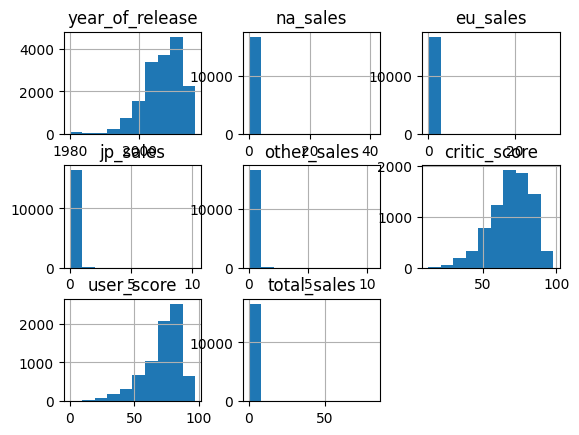

In [91]:
# Look at the data
games_2.info()
display(games_2.isnull().sum())

games_2.hist()


In [92]:
# Were still missing significant rating, critic_score, and user_score data

# Look at the rating data again

# Create a mask for the known ratings:



e10_mask = games_2[games_2['rating'] == 'E10+']
t_mask = games_2[games_2['rating'] == 'T']
m_mask = games_2[games_2['rating'] == 'M']
e_mask = games_2[games_2['rating'] == 'E']



In [93]:
display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['jp_sales'] == 0) & (games_2['eu_sales'] == 0)])

gs = games_2['name'].isin(['SCORE International Baja 1000: The Official Game','G1 Jockey 4 2008'])

games_2.loc[gs,['rating']] = 'E'

games_2[games_2['name'].isin(['SCORE International Baja 1000: The Official Game','G1 Jockey 4 2008'])]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
16676,G1 Jockey 4 2008,PS3,2008.0,Sports,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,No Sale,2000's
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.0,0.0,0.0,0.0,NaN,NaN,NaN,0.0,NaN,NaN,No Sale,2000's


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era
9665,SCORE International Baja 1000: The Official Game,X360,2008.0,Racing,0.11,0.01,0.0,0.01,NaN,NaN,E,0.13,NaN,NaN,"100,000 - < 200,000",2000's
10679,SCORE International Baja 1000: The Official Game,Wii,2008.0,Racing,0.09,0.00,0.0,0.01,NaN,NaN,E,0.10,NaN,NaN,"50,000 - < 100,000",2000's
11719,SCORE International Baja 1000: The Official Game,PS3,2008.0,Racing,0.07,0.00,0.0,0.01,NaN,NaN,E,0.08,NaN,NaN,"50,000 - < 100,000",2000's
16676,G1 Jockey 4 2008,PS3,2008.0,Sports,0.00,0.00,0.0,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.00,0.00,0.0,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's


In [94]:

def esrb(era):
    if era < 1994:
        return 'pre-ERSB'
    elif era < 2005:
        return 'pre-(EC,E10+)'
    elif era >= 2005:
        return 'All Available'
    else:
        return np.nan

games_2['esrb_era'] = games_2['year_of_release'].apply(esrb)

display(games_2)


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's,All Available
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN,10 million +,80's,pre-ERSB
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's,All Available
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's,All Available
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,E,31.38,NaN,NaN,10 million +,90's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's,All Available
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's,All Available
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"


In [95]:
# E
games_2[games_2['name'].isin(['Bomberman (jp sales)','NiGHTS into dreams...','RalliSport Challenge(JP sales)','Legoland','Football Manager 2005		'])]
b = games_2['name'].isin(['Bomberman (jp sales)','NiGHTS into dreams...','RalliSport Challenge(JP sales)','	Legoland'])
display(games_2[games_2['name'].isin(['Bomberman (jp sales)','NiGHTS into dreams...','RalliSport Challenge(JP sales)','	Legoland','Football Manager 2005'])])

games_2.loc[b,['rating']] = 'E'
    
# T
games_2[games_2['name'].isin(['Samurai Warriors: Sanada Maru','Haitaka no Psychedelica',"Tom Clancy's  Ghost Recon Advanced Warfighter (weekly JP sales)",
                              'Period Cube: Torikago no Amadeus','Samurai Shodown Anthology (JP sales)','The Legend of Heroes: Trails in the Sky Third Chapter'])]
c = games_2['name'].isin(['Samurai Warriors: Sanada Maru','Haitaka no Psychedelica',"Tom Clancy's  Ghost Recon Advanced Warfighter (weekly JP sales)",
                              'Period Cube: Torikago no Amadeus','Samurai Shodown Anthology (JP sales)','The Legend of Heroes: Trails in the Sky Third Chapter'])
games_2.loc[c,['rating']] = 'T'


display(games_2[games_2['name'].isin(['Samurai Warriors: Sanada Maru','Haitaka no Psychedelica',"Tom Clancy's  Ghost Recon Advanced Warfighter (weekly JP sales)",
                              'Period Cube: Torikago no Amadeus','Samurai Shodown Anthology (JP sales)','The Legend of Heroes: Trails in the Sky Third Chapter'])])

# M
games_2[games_2['name'].isin(['Rengoku II: The Stairway to H.E.A.V.E.N. (jp sales)'])]

d = games_2['name'].isin(['Rengoku II: The Stairway to H.E.A.V.E.N. (jp sales)'])

games_2.loc[d,['rating']] = 'M'

display(games_2[games_2['name'].isin(['Rengoku II: The Stairway to H.E.A.V.E.N. (jp sales)'])])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
4484,NiGHTS into dreams...,SAT,1996.0,Platform,0.0,0.00,0.43,0.0,NaN,NaN,NaN,0.43,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
16089,Bomberman (jp sales),PSP,2006.0,Puzzle,0.0,0.00,0.01,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available
16126,NiGHTS into dreams...,PS2,2008.0,Platform,0.0,0.00,0.01,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available
16295,Football Manager 2005,PC,2004.0,Sports,0.0,0.01,0.00,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
16424,RalliSport Challenge(JP sales),XB,2002.0,Racing,0.0,0.00,0.01,0.0,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
11938,The Legend of Heroes: Trails in the Sky Third ...,PSP,2008.0,Role-Playing,0.0,0.0,0.07,0.0,NaN,NaN,T,0.07,NaN,NaN,"50,000 - < 100,000",2000's,All Available
14689,Samurai Warriors: Sanada Maru,PS4,2016.0,Action,0.0,0.0,0.03,0.0,NaN,NaN,T,0.03,tbd,tbd,"< 50,000",2010's,All Available
14992,The Legend of Heroes: Trails in the Sky Third ...,PSV,2016.0,Role-Playing,0.0,0.0,0.02,0.0,NaN,NaN,T,0.02,tbd,tbd,"< 50,000",2010's,All Available
16102,Tom Clancy's Ghost Recon Advanced Warfighter ...,X360,2006.0,Shooter,0.0,0.0,0.01,0.0,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2000's,All Available
16103,Period Cube: Torikago no Amadeus,PSV,2016.0,Action,0.0,0.0,0.01,0.0,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16150,Samurai Shodown Anthology (JP sales),PS2,2008.0,Fighting,0.0,0.0,0.01,0.0,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2000's,All Available
16185,The Legend of Heroes: Trails in the Sky Third ...,PS3,2013.0,Role-Playing,0.0,0.0,0.01,0.0,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2010's,All Available
16323,Samurai Warriors: Sanada Maru,PSV,2016.0,Action,0.0,0.0,0.01,0.0,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.0,0.0,0.01,0.0,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.0,0.0,0.01,0.0,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
16116,Rengoku II: The Stairway to H.E.A.V.E.N. (jp s...,PSP,2006.0,Action,0.0,0.0,0.01,0.0,NaN,NaN,M,0.01,NaN,NaN,"< 50,000",2000's,All Available


In [96]:
# E
games_2[games_2['name'].isin(['Bomberman (jp sales)','NiGHTS into dreams...','RalliSport Challenge(JP sales)','Legoland','Football Manager 2005',
                              'Championship Manager Season 01/02','Zoo Tycoon','The Settlers IV',"Mickey's Speedway USA (weekly JP sales)",
                              'Project FIFA World Cup','Pro Yakyuu Greatest Nine 98','FIFA 2001: Major League Soccer','EA Sports Grand Slam Tennis'])]
b = games_2['name'].isin(['Bomberman (jp sales)','NiGHTS into dreams...','RalliSport Challenge(JP sales)','Legoland','Football Manager 2005',
                          'Championship Manager Season 01/02','Zoo Tycoon','The Settlers IV',"Mickey's Speedway USA (weekly JP sales)",
                          'Project FIFA World Cup','Pro Yakyuu Greatest Nine 98','FIFA 2001: Major League Soccer','EA Sports Grand Slam Tennis'])
display(games_2[games_2['name'].isin(['Bomberman (jp sales)','NiGHTS into dreams...','RalliSport Challenge(JP sales)','Legoland','Football Manager 2005',
                                      'Championship Manager Season 01/02','Zoo Tycoon','The Settlers IV',"Mickey's Speedway USA (weekly JP sales)",
                                      'Project FIFA World Cup','Pro Yakyuu Greatest Nine 98','FIFA 2001: Major League Soccer','EA Sports Grand Slam Tennis'])])

games_2.loc[b,['rating']] = 'E'




# T
games_2[games_2['name'].isin(['Samurai Warriors: Sanada Maru','Haitaka no Psychedelica',"Tom Clancy's  Ghost Recon Advanced Warfighter (weekly JP sales)",
                              'Period Cube: Torikago no Amadeus','Samurai Shodown Anthology (JP sales)','The Legend of Heroes: Trails in the Sky Third Chapter',
                              'Command & Conquer Renegade','Black & White','The King of Fighters: Dream Match 1999','Darius Gaiden',
                              'Marvel vs. Capcom: Clash of Super Heroes','Samurai Shodown III'])]
c = games_2['name'].isin(['Samurai Warriors: Sanada Maru','Haitaka no Psychedelica',"Tom Clancy's  Ghost Recon Advanced Warfighter (weekly JP sales)",
                              'Period Cube: Torikago no Amadeus','Samurai Shodown Anthology (JP sales)','The Legend of Heroes: Trails in the Sky Third Chapter',
                          'Command & Conquer Renegade','Black & White','The King of Fighters: Dream Match 1999','Darius Gaiden',
                          'Marvel vs. Capcom: Clash of Super Heroes','Samurai Shodown III'])
games_2.loc[c,['rating']] = 'T'


display(games_2[games_2['name'].isin(['Samurai Warriors: Sanada Maru','Haitaka no Psychedelica',"Tom Clancy's  Ghost Recon Advanced Warfighter (weekly JP sales)",
                              'Period Cube: Torikago no Amadeus','Samurai Shodown Anthology (JP sales)','The Legend of Heroes: Trails in the Sky Third Chapter',
                                      'Command & Conquer Renegade','Black & White','The King of Fighters: Dream Match 1999','Darius Gaiden',
                                      'Marvel vs. Capcom: Clash of Super Heroes','Samurai Shodown III'])])


# M
games_2[games_2['name'].isin(['Rengoku II: The Stairway to H.E.A.V.E.N. (jp sales)','Blue Stinger'])]

d = games_2['name'].isin(['Rengoku II: The Stairway to H.E.A.V.E.N. (jp sales)','Blue Stinger'])

games_2.loc[d,['rating']] = 'M'

display(games_2[games_2['name'].isin(['Rengoku II: The Stairway to H.E.A.V.E.N. (jp sales)','Blue Stinger'])])




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
2267,EA Sports Grand Slam Tennis,Wii,2009.0,Sports,0.28,0.51,0.02,0.11,NaN,NaN,NaN,0.92,NaN,NaN,"500,000 - < 1 million",2000's,All Available
4484,NiGHTS into dreams...,SAT,1996.0,Platform,0.00,0.00,0.43,0.00,NaN,NaN,E,0.43,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
10468,Mickey's Speedway USA (weekly JP sales),N64,2000.0,Racing,0.00,0.00,0.10,0.00,NaN,NaN,NaN,0.10,NaN,NaN,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"
10711,Project FIFA World Cup,PS2,2002.0,Sports,0.00,0.00,0.10,0.00,NaN,NaN,NaN,0.10,NaN,NaN,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"
10931,Pro Yakyuu Greatest Nine 98,SAT,1998.0,Sports,0.00,0.00,0.09,0.00,NaN,NaN,NaN,0.09,NaN,NaN,"50,000 - < 100,000",90's,"pre-(EC,E10+)"
10992,FIFA 2001: Major League Soccer,PS2,2000.0,Sports,0.00,0.00,0.09,0.00,NaN,NaN,NaN,0.09,NaN,NaN,"50,000 - < 100,000",2000's,"pre-(EC,E10+)"
14297,Championship Manager Season 01/02,PC,2001.0,Sports,0.00,0.03,0.00,0.00,NaN,NaN,NaN,0.03,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
14311,Zoo Tycoon,PC,2001.0,Strategy,0.00,0.03,0.00,0.00,NaN,NaN,NaN,0.03,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
15320,The Settlers IV,PC,2001.0,Strategy,0.00,0.02,0.00,0.00,NaN,NaN,NaN,0.02,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
16089,Bomberman (jp sales),PSP,2006.0,Puzzle,0.00,0.00,0.01,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2000's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
2624,Marvel vs. Capcom: Clash of Super Heroes,PS,1999.0,Fighting,0.43,0.30,0.00,0.05,NaN,NaN,T,0.78,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
10522,The King of Fighters: Dream Match 1999,DC,1999.0,Fighting,0.00,0.00,0.10,0.00,NaN,NaN,T,0.10,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
10586,Darius Gaiden,SAT,1995.0,Shooter,0.00,0.00,0.10,0.00,NaN,NaN,T,0.10,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
10657,Marvel vs. Capcom: Clash of Super Heroes,DC,1999.0,Fighting,0.00,0.00,0.10,0.00,NaN,NaN,T,0.10,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
11528,Samurai Shodown III,NG,1995.0,Fighting,0.00,0.00,0.08,0.00,NaN,NaN,T,0.08,NaN,NaN,"50,000 - < 100,000",90's,"pre-(EC,E10+)"
11938,The Legend of Heroes: Trails in the Sky Third ...,PSP,2008.0,Role-Playing,0.00,0.00,0.07,0.00,NaN,NaN,T,0.07,NaN,NaN,"50,000 - < 100,000",2000's,All Available
13791,Black & White,PC,2001.0,Strategy,0.00,0.04,0.00,0.00,NaN,NaN,T,0.04,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
14689,Samurai Warriors: Sanada Maru,PS4,2016.0,Action,0.00,0.00,0.03,0.00,NaN,NaN,T,0.03,tbd,tbd,"< 50,000",2010's,All Available
14992,The Legend of Heroes: Trails in the Sky Third ...,PSV,2016.0,Role-Playing,0.00,0.00,0.02,0.00,NaN,NaN,T,0.02,tbd,tbd,"< 50,000",2010's,All Available
16102,Tom Clancy's Ghost Recon Advanced Warfighter ...,X360,2006.0,Shooter,0.00,0.00,0.01,0.00,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2000's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
10535,Blue Stinger,DC,1999.0,Adventure,0.0,0.0,0.10,0.0,NaN,NaN,M,0.10,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
16116,Rengoku II: The Stairway to H.E.A.V.E.N. (jp s...,PSP,2006.0,Action,0.0,0.0,0.01,0.0,NaN,NaN,M,0.01,NaN,NaN,"< 50,000",2000's,All Available


In [97]:
# FIFA games tend to be rated E, let's change all NaN FIFA games to 'E'
fifa_rows = games_2['name'].str.contains("FIFA", case=False, na=False)

display(fifa_rows)


games_2.loc[fifa_rows,['rating']] = 'E'

games_2[games_2['name'].str.contains("FIFA", case=False, na=False)]


		

0        False
1        False
2        False
3        False
4        False
         ...  
16710    False
16711    False
16712    False
16713    False
16714    False
Name: name, Length: 16711, dtype: bool

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
77,FIFA 16,PS4,2015.0,Sports,1.12,6.12,0.06,1.28,82.0,43.0,E,8.58,high,low,5 million - < 10 million,2010's,All Available
81,FIFA Soccer 13,PS3,2012.0,Action,1.06,5.01,0.13,1.97,88.0,66.0,E,8.17,very high,medium,5 million - < 10 million,2010's,All Available
94,FIFA 17,PS4,2016.0,Sports,0.66,5.75,0.08,1.11,85.0,50.0,E,7.60,high,low,5 million - < 10 million,2010's,All Available
122,FIFA 12,PS3,2011.0,Sports,0.84,4.30,0.11,1.39,NaN,NaN,E,6.64,NaN,NaN,5 million - < 10 million,2010's,All Available
126,FIFA 14,PS3,2013.0,Sports,0.78,4.24,0.07,1.37,86.0,43.0,E,6.46,very high,low,5 million - < 10 million,2010's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13665,FIFA Soccer 2003 (weekly jp sales),PS2,2002.0,Sports,0.00,0.00,0.04,0.00,NaN,NaN,E,0.04,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
13957,FIFA World Cup Germany 2006,DS,2006.0,Sports,0.03,0.00,0.00,0.00,71.0,72.0,E,0.03,medium,medium,"< 50,000",2000's,All Available
14306,FIFA World Cup: Germany 2006,GBA,2006.0,Sports,0.02,0.01,0.00,0.00,57.0,69.0,E,0.03,low,medium,"< 50,000",2000's,All Available
15353,FIFA Soccer 09,PC,2008.0,Sports,0.00,0.02,0.00,0.00,77.0,68.0,E,0.02,high,medium,"< 50,000",2000's,All Available


In [98]:
# Seems to be some Famicom rows that are not rated due to only being in Japan
famicom_rows = games_2[games_2['name'].str.contains('Famicom',case = False,na=False)]

display(famicom_rows)

fr = games_2['name'].str.contains('Famicom',case = False,na=False)

games_2.loc[fr,['rating']] = 'No Rating: JP Sales'

famicom_rows

display(games_2[games_2['name']=='Famicom Jump: Eiyuu Retsuden'])

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1857,Famicom Jump: Eiyuu Retsuden,NES,1989.0,Role-Playing,0.0,0.0,1.10,0.00,NaN,NaN,NaN,1.10,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
4151,Dragon Quest 25 Shuunen Kinin: Famicom & Super...,Wii,2011.0,Role-Playing,0.0,0.0,0.47,0.00,NaN,NaN,NaN,0.47,NaN,NaN,"200,000 - < 500,000",2010's,All Available
4569,Famicom Mini: Super Mario Bros. 2,GBA,2004.0,Platform,0.0,0.0,0.41,0.01,NaN,NaN,NaN,0.42,NaN,NaN,"200,000 - < 500,000",2000's,"pre-(EC,E10+)"
7424,Famicom Mini: Ganbare Goemon! Karakuri Douchuu,GBA,2004.0,Platform,0.0,0.0,0.20,0.01,NaN,NaN,NaN,0.21,NaN,NaN,"200,000 - < 500,000",2000's,"pre-(EC,E10+)"
9851,Famicom Mini: TwinBee,GBA,2004.0,Shooter,0.0,0.0,0.12,0.00,NaN,NaN,NaN,0.12,NaN,NaN,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"
10230,Famicom Mini: Famicom Tantei Club - Kieta Kouk...,GBA,2004.0,Adventure,0.0,0.0,0.11,0.00,NaN,NaN,NaN,0.11,NaN,NaN,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"
10716,Famicom Mini: Famicom Tantei Club Part II - Us...,GBA,2004.0,Adventure,0.0,0.0,0.10,0.00,NaN,NaN,NaN,0.10,NaN,NaN,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"
10748,Famicom Mini: Mappy,GBA,2004.0,Platform,0.0,0.0,0.09,0.00,NaN,NaN,NaN,0.09,NaN,NaN,"50,000 - < 100,000",2000's,"pre-(EC,E10+)"
11223,Famicom Mini: Makaimura,GBA,2004.0,Platform,0.0,0.0,0.08,0.00,NaN,NaN,NaN,0.08,NaN,NaN,"50,000 - < 100,000",2000's,"pre-(EC,E10+)"
11286,Famicom Mini: Famicom Mukashi Banashi - Shin O...,GBA,2004.0,Adventure,0.0,0.0,0.08,0.00,NaN,NaN,NaN,0.08,NaN,NaN,"50,000 - < 100,000",2000's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1857,Famicom Jump: Eiyuu Retsuden,NES,1989.0,Role-Playing,0.0,0.0,1.1,0.0,NaN,NaN,No Rating: JP Sales,1.1,NaN,NaN,1 million - < 5 million,80's,pre-ERSB


In [99]:
# Check out games with Mario in the title

mario_rows = games_2[games_2['name'].str.contains('Mario ',case = False,na=False)]
display(mario_rows)

mario_rows['rating'].value_counts()

mario_rows[mario_rows['rating'].isna()]


# Mario Strikers Charged only E10+ and it is on a Wii

# Since most Mario games are E, we will rename the rating to 'E'

mario = games_2['name'].str.contains('Mario ',case = False,na=True)

games_2.loc[mario,['rating']] = 'E'

display(games_2[games_2['name'].str.contains('Mario ',case = False,na=True)])


strikers = games_2['name'] == 'Mario Strikers Charged'

games_2.loc[strikers, ['rating']]  = 'E10+'

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24,NaN,NaN,10 million +,80's,pre-ERSB
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's,All Available
6,New Super Mario Bros.,DS,2006.0,Platform,11.28,9.14,6.50,2.88,89.0,85.0,E,29.80,very high,high,10 million +,2000's,All Available
8,New Super Mario Bros. Wii,Wii,2009.0,Platform,14.44,6.94,4.70,2.24,87.0,84.0,E,28.32,very high,high,10 million +,2000's,All Available
11,Mario Kart DS,DS,2005.0,Racing,9.71,7.47,4.13,1.90,91.0,86.0,E,23.21,very high,very high,10 million +,2000's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12333,Mario vs. Donkey Kong: Tipping Stars,3DS,2015.0,Puzzle,0.00,0.00,0.06,0.00,70.0,75.0,E,0.06,medium,medium,"50,000 - < 100,000",2010's,All Available
12799,Dance Dance Revolution: Mario Mix (JP sales),GC,2005.0,Simulation,0.00,0.00,0.05,0.00,NaN,NaN,NaN,0.05,NaN,NaN,"50,000 - < 100,000",2000's,All Available
15338,Mario Tennis,3DS,2000.0,Sports,0.00,0.00,0.02,0.00,NaN,NaN,E,0.02,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
16420,Mario vs. Donkey Kong: Tipping Stars,WiiU,2015.0,Puzzle,0.00,0.00,0.01,0.00,70.0,74.0,E,0.01,medium,medium,"< 50,000",2010's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,E,40.24,NaN,NaN,10 million +,80's,pre-ERSB
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's,All Available
6,New Super Mario Bros.,DS,2006.0,Platform,11.28,9.14,6.50,2.88,89.0,85.0,E,29.80,very high,high,10 million +,2000's,All Available
8,New Super Mario Bros. Wii,Wii,2009.0,Platform,14.44,6.94,4.70,2.24,87.0,84.0,E,28.32,very high,high,10 million +,2000's,All Available
11,Mario Kart DS,DS,2005.0,Racing,9.71,7.47,4.13,1.90,91.0,86.0,E,23.21,very high,very high,10 million +,2000's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12333,Mario vs. Donkey Kong: Tipping Stars,3DS,2015.0,Puzzle,0.00,0.00,0.06,0.00,70.0,75.0,E,0.06,medium,medium,"50,000 - < 100,000",2010's,All Available
12799,Dance Dance Revolution: Mario Mix (JP sales),GC,2005.0,Simulation,0.00,0.00,0.05,0.00,NaN,NaN,E,0.05,NaN,NaN,"50,000 - < 100,000",2000's,All Available
15338,Mario Tennis,3DS,2000.0,Sports,0.00,0.00,0.02,0.00,NaN,NaN,E,0.02,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
16420,Mario vs. Donkey Kong: Tipping Stars,WiiU,2015.0,Puzzle,0.00,0.00,0.01,0.00,70.0,74.0,E,0.01,medium,medium,"< 50,000",2010's,All Available


In [100]:
# Minecraft games are rated E10+
mc_rows = games_2['name'].str.contains('minecraft',case = False,na=False)

games_2.loc[mc_rows,['rating']] = 'E10+'

display(games_2[games_2['name'].str.contains('minecraft',case = False,na=False)])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
72,Minecraft,X360,2013.0,Misc,5.70,2.65,0.02,0.81,NaN,NaN,E10+,9.18,NaN,NaN,5 million - < 10 million,2010's,All Available
180,Minecraft,PS3,2014.0,Misc,2.03,2.37,0.00,0.87,NaN,NaN,E10+,5.27,NaN,NaN,5 million - < 10 million,2010's,All Available
261,Minecraft,PS4,2014.0,Misc,1.48,2.02,0.14,0.68,NaN,NaN,E10+,4.32,NaN,NaN,1 million - < 5 million,2010's,All Available
543,Minecraft,XOne,2014.0,Misc,1.61,0.90,0.00,0.25,NaN,NaN,E10+,2.76,NaN,NaN,1 million - < 5 million,2010's,All Available
868,Minecraft,PSV,2014.0,Misc,0.18,0.64,0.90,0.24,NaN,NaN,E10+,1.96,NaN,NaN,1 million - < 5 million,2010's,All Available
2360,Minecraft: Story Mode,X360,2015.0,Adventure,0.48,0.33,0.00,0.08,NaN,NaN,E10+,0.89,NaN,NaN,"500,000 - < 1 million",2010's,All Available
2936,Minecraft: Story Mode,PS4,2015.0,Adventure,0.25,0.33,0.00,0.11,NaN,NaN,E10+,0.69,NaN,NaN,"500,000 - < 1 million",2010's,All Available
2944,Minecraft: Story Mode,PS3,2015.0,Adventure,0.27,0.31,0.00,0.11,NaN,NaN,E10+,0.69,NaN,NaN,"500,000 - < 1 million",2010's,All Available
2973,Minecraft,WiiU,2016.0,Misc,0.28,0.17,0.18,0.04,NaN,NaN,E10+,0.67,tbd,tbd,"500,000 - < 1 million",2010's,All Available
3579,Minecraft: Story Mode,XOne,2015.0,Adventure,0.30,0.21,0.00,0.05,NaN,NaN,E10+,0.56,NaN,NaN,"500,000 - < 1 million",2010's,All Available


In [101]:
# Let's look at Pokemon games
games_2[games_2['name'].str.contains('pokemon', case=False, na=False)]

# The pokemon rumble games are E10+ and the rest should be E

pokemon = games_2['name'].str.contains('pokemon', case=False, na=False)
rumble = games_2['name'].str.contains('pokemon rumble', case=False, na=False)

games_2.loc[pokemon,['rating']] = 'E'
games_2.loc[rumble, ['rating']] = 'E10+'

games_2[games_2['name'].str.contains('pokemon', case=False, na=False)]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,E,31.38,NaN,NaN,10 million +,90's,"pre-(EC,E10+)"
12,Pokemon Gold/Pokemon Silver,GB,1999.0,Role-Playing,9.00,6.18,7.20,0.71,NaN,NaN,E,23.09,NaN,NaN,10 million +,90's,"pre-(EC,E10+)"
20,Pokemon Diamond/Pokemon Pearl,DS,2006.0,Role-Playing,6.38,4.46,6.04,1.36,NaN,NaN,E,18.24,NaN,NaN,10 million +,2000's,All Available
25,Pokemon Ruby/Pokemon Sapphire,GBA,2002.0,Role-Playing,6.06,3.90,5.38,0.50,NaN,NaN,E,15.84,NaN,NaN,10 million +,2000's,"pre-(EC,E10+)"
27,Pokemon Black/Pokemon White,DS,2010.0,Role-Playing,5.51,3.17,5.65,0.80,NaN,NaN,E,15.13,NaN,NaN,10 million +,2010's,All Available
33,Pokemon X/Pokemon Y,3DS,2013.0,Role-Playing,5.28,4.19,4.35,0.78,NaN,NaN,E,14.60,NaN,NaN,10 million +,2010's,All Available
46,Pokemon HeartGold/Pokemon SoulSilver,DS,2009.0,Action,4.34,2.71,3.96,0.76,NaN,NaN,E,11.77,NaN,NaN,10 million +,2000's,All Available
47,Pokemon Omega Ruby/Pokemon Alpha Sapphire,3DS,2014.0,Role-Playing,4.35,3.49,3.10,0.74,NaN,NaN,E,11.68,NaN,NaN,10 million +,2010's,All Available
58,Pokemon FireRed/Pokemon LeafGreen,GBA,2004.0,Role-Playing,4.34,2.65,3.15,0.35,NaN,NaN,E,10.49,NaN,NaN,10 million +,2000's,"pre-(EC,E10+)"
83,Pokemon Black 2/Pokemon White 2,DS,2012.0,Role-Playing,2.79,1.72,3.14,0.41,NaN,NaN,E,8.06,NaN,NaN,5 million - < 10 million,2010's,All Available


In [102]:
games_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              10880 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

In [103]:
# Check out Call of Duty games

games_2[(games_2['name'].str.contains('call of duty',case=False,na=False)) & (games_2['year_of_release'] > 2006) & (~(games_2['name'].isin(['Call of Duty: Roads to Victory'])))]

# ALl COD games after 2006 are rated M except Call of Duty: Roads to Victory		
cod = (games_2['name'].str.contains('call of duty',case=False,na=False)) & (games_2['year_of_release'] > 2006) & (~(games_2['name'].isin(['Call of Duty: Roads to Victory'])))

games_2.loc[cod,['rating']] = 'M'


In [104]:
# Let's check out star wars games since they are very popular
star = games_2[(games_2['name'].str.contains('star wars', case = False, na= False)) & (games_2['rating'].notna())]
display(star)


display(star['rating'].value_counts())

# All star wars empire games are rated T
empire = (games_2['name'].str.contains('star wars: empire at war', case = False, na= False))
games_2.loc[empire,['rating']] = 'T'

# All shooter, simulation, adventure, and misc star wars games are rated T
shooter_star = (games_2['name'].str.contains('star wars', case = False, na= False)) & (games_2['genre'].isin(['Shooter','Simulation','Adventure','Misc']))
games_2.loc[shooter_star,['rating']] = 'T'


# Less than 2000 is T; greater than the remaining NaN after 2000 are E
t_00 = (games_2['name'].str.contains('star wars', case = False, na= False)) & (games_2['year_of_release'] < 2000) & (games_2['rating'].isna())
games_2.loc[t_00,['rating']] = 'T'

e_00 = (games_2['name'].str.contains('star wars', case = False, na= False)) & (games_2['year_of_release'] > 2000) & (games_2['rating'].isna())
games_2.loc[e_00,['rating']] = 'E'



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
155,LEGO Star Wars: The Complete Saga,Wii,2007.0,Action,3.57,1.55,0.00,0.51,80.0,89.0,E10+,5.63,high,very high,5 million - < 10 million,2000's,All Available
222,LEGO Star Wars: The Complete Saga,DS,2007.0,Action,2.83,1.48,0.00,0.45,80.0,54.0,E,4.76,high,low,1 million - < 5 million,2000's,All Available
353,Star Wars: Battlefront,PS2,2004.0,Shooter,1.93,1.22,0.03,0.44,82.0,87.0,T,3.62,high,very high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
358,Star Wars: Battlefront II,PS2,2005.0,Shooter,2.18,1.02,0.03,0.37,84.0,90.0,T,3.60,high,very high,1 million - < 5 million,2000's,All Available
407,Star Wars Episode III: Revenge of the Sith,PS2,2005.0,Action,1.47,1.39,0.03,0.43,60.0,72.0,T,3.32,low,medium,1 million - < 5 million,2000's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14219,Star Wars Jedi Knight: Jedi Academy,PC,2003.0,Shooter,0.00,0.03,0.00,0.00,81.0,86.0,T,0.03,high,very high,"< 50,000",2000's,"pre-(EC,E10+)"
14602,Star Wars: The Force Unleashed II,PC,2010.0,Action,0.03,0.00,0.00,0.00,59.0,58.0,T,0.03,low,low,"< 50,000",2010's,All Available
14898,Star Wars The Clone Wars: Republic Heroes,PC,2009.0,Action,0.00,0.02,0.00,0.00,46.0,47.0,T,0.02,low,low,"< 50,000",2000's,All Available
15065,Star Wars: Empire at War - Forces of Corruption,PC,2006.0,Strategy,0.00,0.02,0.00,0.00,75.0,86.0,T,0.02,medium,very high,"< 50,000",2000's,All Available


T       55
E10+    28
E       17
Name: rating, dtype: int64

In [105]:
# Check the difference
    # Before:
        # T: 55
        # E10: 28
        # E: 17
    # After:
        # T: 74
        # E10: 27
        # E: 22

# The majority are rated T

star_1 = games_2[(games_2['name'].str.contains('star wars', case = False, na= False)) & (games_2['rating'].isna())]
display(star_1)

star_2 = games_2[(games_2['name'].str.contains('star wars', case = False, na= False)) & (games_2['rating'].notna())]
display(star_2)

star_2['rating'].value_counts()

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
87,Star Wars Battlefront (2015),PS4,2015.0,Shooter,2.99,3.49,0.22,1.28,NaN,NaN,T,7.98,NaN,NaN,5 million - < 10 million,2010's,All Available
155,LEGO Star Wars: The Complete Saga,Wii,2007.0,Action,3.57,1.55,0.00,0.51,80.0,89.0,E10+,5.63,high,very high,5 million - < 10 million,2000's,All Available
222,LEGO Star Wars: The Complete Saga,DS,2007.0,Action,2.83,1.48,0.00,0.45,80.0,54.0,E,4.76,high,low,1 million - < 5 million,2000's,All Available
342,Star Wars Battlefront (2015),XOne,2015.0,Shooter,2.04,1.28,0.02,0.32,NaN,NaN,T,3.66,NaN,NaN,1 million - < 5 million,2010's,All Available
353,Star Wars: Battlefront,PS2,2004.0,Shooter,1.93,1.22,0.03,0.44,82.0,87.0,T,3.62,high,very high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14602,Star Wars: The Force Unleashed II,PC,2010.0,Action,0.03,0.00,0.00,0.00,59.0,58.0,T,0.03,low,low,"< 50,000",2010's,All Available
14898,Star Wars The Clone Wars: Republic Heroes,PC,2009.0,Action,0.00,0.02,0.00,0.00,46.0,47.0,T,0.02,low,low,"< 50,000",2000's,All Available
15065,Star Wars: Empire at War - Forces of Corruption,PC,2006.0,Strategy,0.00,0.02,0.00,0.00,75.0,86.0,T,0.02,medium,very high,"< 50,000",2000's,All Available
15904,LEGO Star Wars: The Video Game,PC,2005.0,Action,0.00,0.01,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2000's,All Available


T       74
E10+    27
E       22
Name: rating, dtype: int64

In [106]:
# From previous data we know that most of the Puzzle data is rated E, let's look
display(games_2[(games_2['name'].str.contains('Professor Layton and', case = False, na= False))])


# We know that most of the Professor Layton games are E10+
lay = (games_2['name'].str.contains('Professor Layton and', case = False, na= False))
games_2.loc[lay,['rating']] = 'E10+'
display(games_2[(games_2['name'].str.contains('Professor Layton and', case = False, na= False))])

# Look at the T rated games and ensure they are correct; there are 5 in the incorrect spot

puz_5 = (games_2['genre'] == 'Puzzle') & (games_2['platform'] != 'PSP') & (games_2['year_of_release'] > 2006) & (games_2['year_of_release'] < 2011) & (games_2['rating'] == 'T')

games_2.loc[puz_5,['rating']] = "E"

# Some of the E10+ category is mislabled
games_2[games_2['name'].isin(['Jumble Madness',"Margot's Word Brain", 'Yard Sale Hidden Treasures: Sunnyville', 'Jewel Master: Cradle of Athena','TouchMaster',
                             'WarioWare: Smooth Moves','GunPey','Challenge Me: Word Puzzles'])]

change = games_2['name'].isin(['Jumble Madness',"Margot's Word Brain", 'Yard Sale Hidden Treasures: Sunnyville', 'Jewel Master: Cradle of Athena','TouchMaster',
                              'WarioWare: Smooth Moves','GunPey','Challenge Me: Word Puzzles'])
games_2.loc[change,['rating']] = 'E'
# To test, use the line below
# display(games_2[games_2['name'].isin(['Jumble Madness',"Margot's Word Brain", 'Yard Sale Hidden Treasures: Sunnyville', 'Jewel Master: Cradle of Athena','TouchMaster',
                                     #'WarioWare: Smooth Moves','GunPey','Challenge Me: Word Puzzles'])])

# Further explore the E10+ section of Puzzle to ensure the correct placement
games_2[(games_2['genre'] == 'Puzzle') & (games_2['rating'] == 'E10+')]


	

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
188,Professor Layton and the Curious Village,DS,2007.0,Puzzle,1.21,2.43,1.03,0.52,85.0,86.0,E,5.19,high,very high,5 million - < 10 million,2000's,All Available
308,Professor Layton and the Diabolical Box,DS,2007.0,Puzzle,0.90,1.76,0.92,0.37,84.0,88.0,E10+,3.95,high,very high,1 million - < 5 million,2000's,All Available
415,Professor Layton and the Unwound Future,DS,2008.0,Puzzle,0.60,1.57,0.82,0.27,86.0,92.0,E10+,3.26,very high,very high,1 million - < 5 million,2000's,All Available
566,Professor Layton and the Last Specter,DS,2009.0,Puzzle,0.28,1.39,0.68,0.32,83.0,87.0,E10+,2.67,high,very high,1 million - < 5 million,2000's,All Available
980,Professor Layton and the Mask of Miracle,3DS,2011.0,Puzzle,0.32,0.97,0.36,0.13,NaN,NaN,NaN,1.78,NaN,NaN,1 million - < 5 million,2010's,All Available
2714,Professor Layton and the Azran Legacy,3DS,2013.0,Puzzle,0.00,0.48,0.25,0.03,81.0,79.0,E10+,0.76,high,high,"500,000 - < 1 million",2010's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
188,Professor Layton and the Curious Village,DS,2007.0,Puzzle,1.21,2.43,1.03,0.52,85.0,86.0,E10+,5.19,high,very high,5 million - < 10 million,2000's,All Available
308,Professor Layton and the Diabolical Box,DS,2007.0,Puzzle,0.90,1.76,0.92,0.37,84.0,88.0,E10+,3.95,high,very high,1 million - < 5 million,2000's,All Available
415,Professor Layton and the Unwound Future,DS,2008.0,Puzzle,0.60,1.57,0.82,0.27,86.0,92.0,E10+,3.26,very high,very high,1 million - < 5 million,2000's,All Available
566,Professor Layton and the Last Specter,DS,2009.0,Puzzle,0.28,1.39,0.68,0.32,83.0,87.0,E10+,2.67,high,very high,1 million - < 5 million,2000's,All Available
980,Professor Layton and the Mask of Miracle,3DS,2011.0,Puzzle,0.32,0.97,0.36,0.13,NaN,NaN,E10+,1.78,NaN,NaN,1 million - < 5 million,2010's,All Available
2714,Professor Layton and the Azran Legacy,3DS,2013.0,Puzzle,0.00,0.48,0.25,0.03,81.0,79.0,E10+,0.76,high,high,"500,000 - < 1 million",2010's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
188,Professor Layton and the Curious Village,DS,2007.0,Puzzle,1.21,2.43,1.03,0.52,85.0,86.0,E10+,5.19,high,very high,5 million - < 10 million,2000's,All Available
308,Professor Layton and the Diabolical Box,DS,2007.0,Puzzle,0.90,1.76,0.92,0.37,84.0,88.0,E10+,3.95,high,very high,1 million - < 5 million,2000's,All Available
415,Professor Layton and the Unwound Future,DS,2008.0,Puzzle,0.60,1.57,0.82,0.27,86.0,92.0,E10+,3.26,very high,very high,1 million - < 5 million,2000's,All Available
566,Professor Layton and the Last Specter,DS,2009.0,Puzzle,0.28,1.39,0.68,0.32,83.0,87.0,E10+,2.67,high,very high,1 million - < 5 million,2000's,All Available
761,Scribblenauts,DS,2009.0,Puzzle,1.67,0.30,0.02,0.18,79.0,76.0,E10+,2.17,high,high,1 million - < 5 million,2000's,All Available
980,Professor Layton and the Mask of Miracle,3DS,2011.0,Puzzle,0.32,0.97,0.36,0.13,NaN,NaN,E10+,1.78,NaN,NaN,1 million - < 5 million,2010's,All Available
1299,Super Scribblenauts,DS,2010.0,Puzzle,1.06,0.29,0.00,0.11,81.0,82.0,E10+,1.46,high,high,1 million - < 5 million,2010's,All Available
2714,Professor Layton and the Azran Legacy,3DS,2013.0,Puzzle,0.00,0.48,0.25,0.03,81.0,79.0,E10+,0.76,high,high,"500,000 - < 1 million",2010's,All Available
5422,Puzzle Quest: Challenge of the Warlords,DS,2007.0,Puzzle,0.28,0.00,0.03,0.02,82.0,87.0,E10+,0.33,high,very high,"200,000 - < 500,000",2000's,All Available
6051,Puzzle Quest: Challenge of the Warlords,Wii,2007.0,Puzzle,0.26,0.00,0.00,0.02,71.0,62.0,E10+,0.28,medium,low,"200,000 - < 500,000",2000's,All Available


In [107]:
puzzle = games_2[(games_2['genre'] == 'Puzzle') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))]

display(puzzle['rating'].value_counts())

# There are a substantial amount of Puzzle games that are rated E
    # E: 369    (90.2%)
    # E10: 35   (8.6&)
    # T: 5      (1.2 %)

# We will look at the data, but most of the puzzle data is probably E
    

games_2[(games_2['genre'] == 'Puzzle') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available'])) & (games_2['rating'].isna())]

# Let's fix some of these
games_2[(games_2['name'].str.contains('Kotoba', case = False, na= False))]
games_2[(games_2['name'].str.contains('Puyo', case = False, na= False))]
games_2[(games_2['name'].str.contains('sloane', case = False, na= False))]

# These are E rated
# ['Puyo Puyo Tetris', 'Puyo Pop','Puyo Pop Fever(us sales)','Puyo Pop Fever']


#No Rating: JP Sales
#Kotoba no Puzzle: Mojipittan DS	
#Puyo Pop Fever (JP sales)
#(Not Puyo Tetris)
#Sloane to MacHale no Nazo no Monogatari 2	

jp = (games_2['name'].str.contains('Kotoba', case = False, na= False)) | (games_2['name'].str.contains('Puyo', case = False, na= False)) | (games_2['name'].str.contains('sloane', case = False, na= False)) 
games_2.loc[jp,['rating']] = 'No Rating: JP Sales'

# Some Puyo's are E rated
puyo = games_2['name'].isin(['Puyo Puyo Tetris', 'Puyo Pop','Puyo Pop Fever(us sales)','Puyo Pop Fever'])

games_2.loc[puyo,['rating']] = 'E'

games_2[(games_2['genre'] == 'Puzzle') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available'])) & (games_2['rating'] == 'No Rating: JP Sales')]

# Look at the NaN values in puzzle again
games_2[(games_2['genre'] == 'Puzzle') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available'])) & (games_2['rating'].isna())].head(60)


#There are more with No Rating

k = (games_2['name'].str.contains('Kumamon', case = False, na= False)) | (games_2['name'].str.contains('Kururin', case = False, na= False)) | (games_2['name'].str.contains('Mawashite', case = False, na= False)) 
games_2.loc[k,['rating']] = 'No Rating: JP Sales'
		

#T
#The Rub Rabbits!
rab = games_2['name'] == 'The Rub Rabbits!'
games_2.loc[rab,['rating']] = 'T'


# The rest of the puzzle games are most likely rated E, but we've made the data more accurate
pg = (games_2['genre'] == 'Puzzle') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available'])) & (games_2['rating'].isna())
games_2.loc[pg,['rating']] = 'E'

games_2[(games_2['genre'] == 'Puzzle') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available'])) & (games_2['rating'].isna())].head(60)


# THe rating are still mostly E at 475, that's about 92% or 87.6% if you include the not rated games

E                      369
E10+                    35
T                        5
No Rating: JP Sales      3
No Rating: EU Sales      1
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [108]:
games_2[(games_2['rating'].isna()) & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))]

# Let's change some known T-rated games
display(games_2[(games_2['name'].str.contains('combat', case = False, na= False)) & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available'])) & (games_2['rating'].isna())])
display(games_2[(games_2['name'].str.contains('twisted metal', case = False, na= False))])
display(games_2[(games_2['name'].str.contains('road rash', case = False, na= False))])

# First change the combat named games
combat = (games_2['name'].str.contains('combat', case = False, na= False)) & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available'])) & (games_2['rating'].isna())
games_2.loc[combat,['rating']] = 'T'


# M
# Deathrow: Underground Team Combat - need to be changed to M
death = games_2['name'] == 'Deathrow: Underground Team Combat'
games_2.loc[death,['rating']] = 'M'

games_2[games_2['name'] == 'Deathrow: Underground Team Combat']


# Continue with known T rated games
twisted = (games_2['name'].str.contains('twisted metal', case = False, na= False)) & (games_2['rating'].isna())
games_2.loc[twisted,['rating']] = 'T'
display(games_2[games_2['name'].str.contains('twisted metal', case = False, na= False)])

# Continue with known T rated games
road = (games_2['name'].str.contains('road rash', case = False, na= False))
games_2.loc[road,['rating']] = 'T'

games_2[games_2['name'].str.contains('road rash', case = False, na= False)]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
956,Air Combat,PS,1995.0,Simulation,0.92,0.33,0.52,0.05,NaN,NaN,NaN,1.82,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
2477,Ace Combat 3: Electrosphere,PS,1999.0,Simulation,0.22,0.15,0.40,0.05,NaN,NaN,NaN,0.82,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
5189,MechWarrior 2: 31st Century Combat,PS,1997.0,Simulation,0.20,0.14,0.00,0.02,NaN,NaN,NaN,0.36,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
6846,Army Men: Air Combat,N64,2000.0,Action,0.19,0.05,0.00,0.00,NaN,NaN,NaN,0.24,NaN,NaN,"200,000 - < 500,000",2000's,"pre-(EC,E10+)"
8467,Vehicular Combat League presents Motor Mayhem,PS2,2001.0,Racing,0.08,0.06,0.00,0.02,NaN,NaN,NaN,0.16,NaN,NaN,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"
12383,Deathrow: Underground Team Combat,XB,2002.0,Sports,0.05,0.01,0.00,0.00,NaN,NaN,NaN,0.06,NaN,NaN,"50,000 - < 100,000",2000's,"pre-(EC,E10+)"
14950,Combat Wings: The Great Battles of WWII,Wii,2012.0,Simulation,0.02,0.00,0.00,0.00,NaN,NaN,NaN,0.02,NaN,NaN,"< 50,000",2010's,All Available
15015,Battlefield 2: Modern Combat(JP sales),PS2,2005.0,Shooter,0.00,0.00,0.02,0.00,NaN,NaN,NaN,0.02,NaN,NaN,"< 50,000",2000's,All Available
16408,Army Men: Air Combat - The Elite Missions,GC,2003.0,Shooter,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
635,Twisted Metal 2,PS,1996.0,Racing,2.12,0.25,0.0,0.07,NaN,NaN,T,2.44,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1029,Twisted Metal III,PS,1998.0,Action,1.48,0.20,0.0,0.05,NaN,NaN,NaN,1.73,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1194,Twisted Metal,PS,1995.0,Action,1.32,0.19,0.0,0.05,NaN,NaN,NaN,1.56,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1372,Twisted Metal: Black,PS2,2001.0,Racing,1.19,0.17,0.0,0.05,91.0,84.0,M,1.41,very high,high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
1542,Twisted Metal 4,PS,1999.0,Racing,1.07,0.16,0.0,0.04,NaN,NaN,T,1.27,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
2531,Twisted Metal (2012),PS3,2012.0,Action,0.67,0.07,0.0,0.08,NaN,NaN,NaN,0.82,NaN,NaN,"500,000 - < 1 million",2010's,All Available
2670,Twisted Metal: Head On,PSP,2005.0,Action,0.71,0.00,0.0,0.06,79.0,82.0,T,0.77,high,high,"500,000 - < 1 million",2000's,All Available
8150,Twisted Metal: Small Brawl,PS,2001.0,Action,0.10,0.07,0.0,0.01,51.0,76.0,T,0.18,low,high,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1554,Road Rash,PS,1995.0,Racing,0.71,0.48,0.0,0.08,NaN,NaN,NaN,1.27,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1601,Road Rash 3D,PS,1998.0,Racing,1.05,0.16,0.0,0.04,NaN,NaN,NaN,1.25,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
4825,Road Rash: Jailbreak,PS,1999.0,Racing,0.22,0.15,0.0,0.03,NaN,NaN,T,0.40,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
6850,Road Rash 64,N64,1999.0,Racing,0.19,0.05,0.0,0.00,NaN,NaN,NaN,0.24,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
10480,Road Rash: Jailbreak,GBA,2003.0,Racing,0.07,0.03,0.0,0.00,78.0,93.0,T,0.10,high,very high,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
635,Twisted Metal 2,PS,1996.0,Racing,2.12,0.25,0.0,0.07,NaN,NaN,T,2.44,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1029,Twisted Metal III,PS,1998.0,Action,1.48,0.20,0.0,0.05,NaN,NaN,T,1.73,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1194,Twisted Metal,PS,1995.0,Action,1.32,0.19,0.0,0.05,NaN,NaN,T,1.56,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1372,Twisted Metal: Black,PS2,2001.0,Racing,1.19,0.17,0.0,0.05,91.0,84.0,M,1.41,very high,high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
1542,Twisted Metal 4,PS,1999.0,Racing,1.07,0.16,0.0,0.04,NaN,NaN,T,1.27,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
2531,Twisted Metal (2012),PS3,2012.0,Action,0.67,0.07,0.0,0.08,NaN,NaN,T,0.82,NaN,NaN,"500,000 - < 1 million",2010's,All Available
2670,Twisted Metal: Head On,PSP,2005.0,Action,0.71,0.00,0.0,0.06,79.0,82.0,T,0.77,high,high,"500,000 - < 1 million",2000's,All Available
8150,Twisted Metal: Small Brawl,PS,2001.0,Action,0.10,0.07,0.0,0.01,51.0,76.0,T,0.18,low,high,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1554,Road Rash,PS,1995.0,Racing,0.71,0.48,0.0,0.08,NaN,NaN,T,1.27,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1601,Road Rash 3D,PS,1998.0,Racing,1.05,0.16,0.0,0.04,NaN,NaN,T,1.25,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
4825,Road Rash: Jailbreak,PS,1999.0,Racing,0.22,0.15,0.0,0.03,NaN,NaN,T,0.40,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
6850,Road Rash 64,N64,1999.0,Racing,0.19,0.05,0.0,0.00,NaN,NaN,T,0.24,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
10480,Road Rash: Jailbreak,GBA,2003.0,Racing,0.07,0.03,0.0,0.00,78.0,93.0,T,0.10,high,very high,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"


In [109]:
games_2[(games_2['rating'].isna()) & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))]

games_2['genre'].value_counts()

# Let's look at Racing games
racing = games_2[(games_2['rating'].notna()) & (games_2['genre'] == 'Racing') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))]
display(racing)

pre_racing = games_2[(games_2['rating'].notna()) & (games_2['genre'] == 'Racing') & (games_2['esrb_era'].isin(['pre-(EC,E10+)']))]

all_racing = games_2[(games_2['rating'].notna()) & (games_2['genre'] == 'Racing') & (games_2['esrb_era'].isin(['All Available']))]

display(games_2[(games_2['rating'].isna()) & (games_2['genre'] == 'Racing') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))])

display(racing['rating'].value_counts())
display(pre_racing['rating'].value_counts())
display(all_racing['rating'].value_counts())

# Racing is comprised of mostly 'E' rated games

# All simpson games are rated 'T'
games_2[games_2['name'].str.contains('simpson', case = False, na=False)]
simp = games_2['name'].str.contains('simpson', case = False, na=False)
games_2.loc[simp,['rating']] = 'T'


# All South Park Games are rated M
games_2[games_2['name'].str.contains('south park', case = False, na=False)]
sp = games_2['name'].str.contains('south park', case = False, na=False)
games_2.loc[sp,['rating']] = 'M'

# The 2015 need for speed is rated 'T'
#games_2[games_2['name'].str.contains('need for speed (2015)', case = False, na=False)].head(60)
games_2[games_2['name'] == "Need for Speed (2015)"]
speed_15 = games_2['name'] == "Need for Speed (2015)"
games_2.loc[speed_15,['rating']] = 'T'

# Neef for Speed: Shift 2 Unleashed is E10+, Most wanted is mislabeled as a T rating
#Need for Speed: Shift 2 Unleashed
#Need for Speed: Most Wanted
games_2[games_2['name'].isin(['Need for Speed: Shift 2 Unleashed','Need for Speed: Most Wanted','Need for Speed: Shift','Need for Speed: ProStreet',
                              'PGR3 - Project Gotham Racing 3'])]
speed_e10 = games_2['name'].isin(['Need for Speed: Shift 2 Unleashed','Need for Speed: Most Wanted','Need for Speed: Shift','Need for Speed: ProStreet',
                                  'PGR3 - Project Gotham Racing 3'])
games_2.loc[speed_e10,['rating']] = 'E10+'
display(games_2[games_2['name'].isin(['Need for Speed: Shift 2 Unleashed','Need for Speed: Most Wanted','Need for Speed: Shift','Need for Speed: ProStreet',
                                      'PGR3 - Project Gotham Racing 3'])])

# midnight club games
mc = (games_2['name'].str.contains('midnight club 3', case = False, na= False))
games_2.loc[mc,['rating']] = 'E10+'


mcs = (games_2['name'].str.contains('midnight club: street', case = False, na= False))
games_2.loc[mcs,['rating']] = 'E'

# Destruction Derby
dd = (games_2['name'].str.contains('destruction derby', case = False, na= False))
games_2.loc[dd,['rating']] = 'T'


# Dukes of Hazzard
dh = (games_2['name'].str.contains('dukes of', case = False, na= False))
games_2.loc[dh,['rating']] = 'T'

# Cars 2 is rated E10+
cars = games_2['name'] == 'Cars 2'
games_2.loc[cars,['rating']] = 'E10+'

# Starsky and Hutch
starsky = games_2['name'].str.contains('starsky', case = False, na= False)
games_2.loc[starsky,['rating']] = 'T'

#srs
srs = (games_2['name'].str.contains('srs', case = False, na= False))
games_2.loc[srs,['rating']] = 'T'


# mini-yonku
mini = (games_2['name'].str.contains('mini-yonku', case = False, na=False))
games_2.loc[mini,['rating']] = 'No Rating: JP Sales'

# yattaman
yatta = (games_2['name'].str.contains('yattaman', case = False, na=False))
games_2.loc[yatta,['rating']] = 'No Rating: JP Sales'


# sonic all transformed
sonic = (games_2['name'].str.contains('sonic & all', case = False, na= False))
games_2.loc[sonic,['rating']] = 'E10+'

# vin diesel
vin = (games_2['name'].str.contains('vin diesel', case = False, na= False))
games_2.loc[vin,['rating']] = 'T'


# totaled and toca
t = (games_2['name'].str.contains('Toca', case = False, na= False)) & (games_2['rating'].isna()) 
games_2.loc[t,['rating']] = 'T'


to = games_2['name'] == 'Totaled!'
games_2.loc[to,['rating']] = 'T'

# No rating: JP Sales

nr = (games_2['name'].str.contains('option', case = False, na= False)) | (games_2['name'].str.contains('motor toon', case = False, na= False)) | (games_2['name'].str.contains('wangan', case = False, na= False))
games_2.loc[nr,['rating']] = 'No Rating: JP Sales'

# Running Wild
rw = games_2['name'] == 'Running Wild'
games_2.loc[rw,['rating']] = 'T'


# We have made enough changes to the Racing genre to safely assume that the rest of the data is most likely going to fall in the E rated section
racing_esrb = (games_2['rating'].isna()) & (games_2['genre'] == 'Racing') & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))
games_2.loc[racing_esrb,['rating']] = 'E'




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's,All Available
11,Mario Kart DS,DS,2005.0,Racing,9.71,7.47,4.13,1.90,91.0,86.0,E,23.21,very high,very high,10 million +,2000's,All Available
28,Gran Turismo 3: A-Spec,PS2,2001.0,Racing,6.85,5.09,1.87,1.16,95.0,84.0,E,14.97,very high,high,10 million +,2000's,"pre-(EC,E10+)"
40,Mario Kart 7,3DS,2011.0,Racing,5.03,4.02,2.69,0.91,85.0,82.0,E,12.65,high,high,10 million +,2010's,All Available
48,Gran Turismo 4,PS2,2004.0,Racing,3.01,0.01,1.10,7.53,89.0,85.0,E,11.65,very high,high,10 million +,2000's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16591,Micro Machines V4,PS2,2006.0,Racing,0.01,0.00,0.00,0.00,64.0,68.0,E,0.01,low,medium,"< 50,000",2000's,All Available
16627,Karnaaj Rally,GBA,2003.0,Racing,0.01,0.00,0.00,0.00,81.0,95.0,E,0.01,high,very high,"< 50,000",2000's,"pre-(EC,E10+)"
16630,Sébastien Loeb Rally Evo,XOne,2016.0,Racing,0.00,0.01,0.00,0.00,63.0,82.0,E,0.01,low,high,"< 50,000",2010's,All Available
16633,SBK Superbike World Championship,PSP,2008.0,Racing,0.01,0.00,0.00,0.00,NaN,NaN,E10+,0.01,NaN,NaN,"< 50,000",2000's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
214,Diddy Kong Racing,N64,1997.0,Racing,2.91,0.99,0.89,0.10,NaN,NaN,NaN,4.89,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
226,The Simpsons: Hit & Run,PS2,2003.0,Racing,1.73,2.19,0.00,0.79,NaN,NaN,NaN,4.71,NaN,NaN,1 million - < 5 million,2000's,"pre-(EC,E10+)"
416,Gran Turismo (PSP),PSP,2009.0,Racing,0.50,1.58,0.31,0.87,NaN,NaN,NaN,3.26,NaN,NaN,1 million - < 5 million,2000's,All Available
486,Wave Race 64,N64,1996.0,Racing,1.98,0.58,0.34,0.04,NaN,NaN,NaN,2.94,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
506,Colin McRae Rally,PS,1998.0,Racing,0.09,2.43,0.12,0.22,NaN,NaN,NaN,2.86,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16298,Turbo Trainz,Wii,2012.0,Racing,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2010's,All Available
16330,MXGP 2,PC,2016.0,Racing,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's,All Available
16390,Sonic & All-Stars Racing Transformed,PC,2013.0,Racing,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2010's,All Available
16658,Driving Simulator 2011,PC,2011.0,Racing,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2010's,All Available


E                              617
T                              193
E10+                           102
M                               20
No Rating: EU Sales              2
No Rating: EU + Other Sales      1
Name: rating, dtype: int64

E    260
T    111
M      5
Name: rating, dtype: int64

E                              357
E10+                           102
T                               82
M                               15
No Rating: EU Sales              2
No Rating: EU + Other Sales      1
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
253,Need for Speed: Most Wanted,PS2,2005.0,Racing,2.03,1.79,0.08,0.47,82.0,91.0,E10+,4.37,high,very high,1 million - < 5 million,2000's,All Available
523,Need for Speed: Most Wanted,PS3,2012.0,Racing,0.71,1.46,0.06,0.58,NaN,NaN,E10+,2.81,NaN,NaN,1 million - < 5 million,2010's,All Available
575,Need for Speed: Shift,PS3,2009.0,Racing,0.69,1.40,0.04,0.52,84.0,69.0,E10+,2.65,high,medium,1 million - < 5 million,2000's,All Available
652,Need for Speed: ProStreet,PS2,2007.0,Racing,0.69,0.00,0.04,1.68,62.0,62.0,E10+,2.41,low,low,1 million - < 5 million,2000's,All Available
826,Need for Speed: ProStreet,X360,2007.0,Racing,1.04,0.79,0.01,0.21,72.0,71.0,E10+,2.05,medium,medium,1 million - < 5 million,2000's,All Available
835,Need for Speed: ProStreet,PS3,2007.0,Racing,0.73,0.91,0.04,0.36,73.0,60.0,E10+,2.04,medium,low,1 million - < 5 million,2000's,All Available
905,Need for Speed: Shift,X360,2009.0,Racing,0.73,0.96,0.01,0.22,83.0,65.0,E10+,1.92,high,medium,1 million - < 5 million,2000's,All Available
1190,Need for Speed: Most Wanted,X360,2012.0,Racing,0.62,0.78,0.01,0.15,83.0,85.0,E10+,1.56,high,high,1 million - < 5 million,2010's,All Available
1591,Need for Speed: Most Wanted,X360,2005.0,Racing,1.00,0.13,0.02,0.10,83.0,85.0,E10+,1.25,high,high,1 million - < 5 million,2000's,All Available
1867,Need for Speed: ProStreet,Wii,2007.0,Racing,0.53,0.45,0.00,0.12,61.0,69.0,E10+,1.10,low,medium,1 million - < 5 million,2000's,All Available


In [110]:
# The missing rating for the DDR games will be counted as 'E'
ddr = (games_2['name'].str.contains("Dance Dance", case = False, na= False)) & (games_2['rating'].isna())
games_2.loc[ddr,['rating']] = 'E'


isna = games_2[(games_2['rating'].notna()) & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))]

isna['rating'].value_counts()


	



E                              4682
T                              3165
M                              1679
E10+                           1504
EC                              213
No Rating: JP Sales              51
No Rating: EU Sales              19
No Rating: EU + Other Sales       9
No Rating: EU + JP Sales          3
Name: rating, dtype: int64

In [111]:
display(games_2[games_2['year_of_release']< 1993])

# Let's look at the pre-ESRB era

# Change the name to No Rating
no_rating = (games_2['rating'].isna()) & (games_2['esrb_era'] == 'pre-ERSB')
games_2.loc[no_rating,['rating']] = 'No Rating: Pre-ESRB'

display(games_2[games_2['rating'] == 'No Rating: Pre-ESRB'])

# Clean up the ratings column, the games that are country exclusive
exclusive = games_2['rating'].isin(['No Rating: JP Sales','No Rating: EU Sales','No Rating: EU + Other Sales','No Rating: EU + JP Sales'])
games_2.loc[exclusive,['rating']] = 'No Rating: Country Exclusive'

display(games_2[games_2['rating'] == 'No Rating: Country Exclusive'])



games_2['rating'].value_counts()



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,E,40.24,NaN,NaN,10 million +,80's,pre-ERSB
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,NaN,30.26,NaN,NaN,10 million +,80's,pre-ERSB
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,NaN,28.31,NaN,NaN,10 million +,80's,pre-ERSB
18,Super Mario World,SNES,1990.0,Platform,12.78,3.75,3.54,0.55,NaN,NaN,E,20.62,NaN,NaN,10 million +,90's,pre-ERSB
21,Super Mario Land,GB,1989.0,Platform,10.83,2.71,4.18,0.42,NaN,NaN,E,18.14,NaN,NaN,10 million +,80's,pre-ERSB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14470,Alter Ego,PC,1985.0,Simulation,0.00,0.03,0.00,0.01,59.0,58.0,T,0.04,low,low,"< 50,000",80's,pre-ERSB
14610,Doom,PC,1992.0,Shooter,0.02,0.00,0.00,0.00,85.0,82.0,M,0.02,high,high,"< 50,000",90's,pre-ERSB
14621,SimCity,PC,1988.0,Simulation,0.00,0.02,0.00,0.01,64.0,22.0,E10+,0.03,low,low,"< 50,000",80's,pre-ERSB
15692,Empire Deluxe,PC,1992.0,Strategy,0.02,0.00,0.00,0.00,NaN,NaN,NaN,0.02,NaN,NaN,"< 50,000",90's,pre-ERSB


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
5,Tetris,GB,1989.0,Puzzle,23.20,2.26,4.22,0.58,NaN,NaN,No Rating: Pre-ESRB,30.26,NaN,NaN,10 million +,80's,pre-ERSB
9,Duck Hunt,NES,1984.0,Shooter,26.93,0.63,0.28,0.47,NaN,NaN,No Rating: Pre-ESRB,28.31,NaN,NaN,10 million +,80's,pre-ERSB
89,Pac-Man,2600,1982.0,Puzzle,7.28,0.45,0.00,0.08,NaN,NaN,No Rating: Pre-ESRB,7.81,NaN,NaN,5 million - < 10 million,80's,pre-ERSB
124,The Legend of Zelda,NES,1986.0,Action,3.74,0.93,1.69,0.14,NaN,NaN,No Rating: Pre-ESRB,6.50,NaN,NaN,5 million - < 10 million,80's,pre-ERSB
137,Street Fighter II: The World Warrior,SNES,1992.0,Fighting,2.47,0.83,2.87,0.12,NaN,NaN,No Rating: Pre-ESRB,6.29,NaN,NaN,5 million - < 10 million,90's,pre-ERSB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13343,Beyond Oasis,GEN,1993.0,Role-Playing,0.00,0.00,0.05,0.00,NaN,NaN,No Rating: Pre-ESRB,0.05,NaN,NaN,"50,000 - < 100,000",90's,pre-ERSB
13571,Sonic the Hedgehog 2 (8-bit),GG,1992.0,Platform,0.00,0.00,0.04,0.00,NaN,NaN,No Rating: Pre-ESRB,0.04,NaN,NaN,"< 50,000",90's,pre-ERSB
15692,Empire Deluxe,PC,1992.0,Strategy,0.02,0.00,0.00,0.00,NaN,NaN,No Rating: Pre-ESRB,0.02,NaN,NaN,"< 50,000",90's,pre-ERSB
15957,Strongest Tokyo University Shogi DS,DS,1985.0,Action,0.00,0.00,0.02,0.00,NaN,NaN,No Rating: Pre-ESRB,0.02,NaN,NaN,"< 50,000",80's,pre-ERSB


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1053,Super Puyo Puyo,SNES,1993.0,Puzzle,0.0,0.00,1.69,0.01,NaN,NaN,No Rating: Country Exclusive,1.70,NaN,NaN,1 million - < 5 million,90's,pre-ERSB
1763,Football Manager 2013,PC,2012.0,Sports,0.0,0.95,0.00,0.21,86.0,67.0,No Rating: Country Exclusive,1.16,very high,medium,1 million - < 5 million,2010's,All Available
1777,Puyo Puyo Sun Ketteiban,PS,1997.0,Puzzle,0.0,0.00,1.07,0.07,NaN,NaN,No Rating: Country Exclusive,1.14,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1857,Famicom Jump: Eiyuu Retsuden,NES,1989.0,Role-Playing,0.0,0.00,1.10,0.00,NaN,NaN,No Rating: Country Exclusive,1.10,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
2292,Mini-Yonku Shining Scorpion: Let's & Go!!,SNES,1996.0,Racing,0.0,0.00,0.90,0.00,NaN,NaN,No Rating: Country Exclusive,0.90,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16202,Football Manager Live,PC,2009.0,Sports,0.0,0.01,0.00,0.00,82.0,31.0,No Rating: Country Exclusive,0.01,high,low,"< 50,000",2000's,All Available
16337,Battle Worlds: Kronos,PC,2016.0,Strategy,0.0,0.01,0.00,0.00,71.0,71.0,No Rating: Country Exclusive,0.01,medium,medium,"< 50,000",2010's,All Available
16471,Gobliiins 4,PC,2009.0,Adventure,0.0,0.01,0.00,0.00,54.0,NaN,No Rating: Country Exclusive,0.01,low,NaN,"< 50,000",2000's,All Available
16686,Yattaman Wii: BikkuriDokkiri Machine de Mou Ra...,Wii,2008.0,Racing,0.0,0.00,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2000's,All Available


E                               4706
T                               3169
M                               1682
E10+                            1512
No Rating: Pre-ESRB              346
EC                               214
No Rating: Country Exclusive      84
Name: rating, dtype: int64

In [112]:
# Look at the data

display(games_2[(games_2['rating'].isna()) & (games_2['esrb_era'].isin(['pre-(EC,E10+)','All Available']))])

games_2.info()


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN,24.67,NaN,NaN,10 million +,2000's,All Available
82,GoldenEye 007,N64,1997.0,Shooter,5.80,2.01,0.13,0.15,NaN,NaN,NaN,8.09,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
93,The Legend of Zelda: Ocarina of Time,N64,1998.0,Action,4.10,1.89,1.45,0.16,NaN,NaN,NaN,7.60,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
95,Crash Bandicoot 2: Cortex Strikes Back,PS,1997.0,Platform,3.78,2.17,1.31,0.31,NaN,NaN,NaN,7.57,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
96,Super Smash Bros. for Wii U and 3DS,3DS,2014.0,Fighting,3.27,1.37,2.43,0.48,NaN,NaN,NaN,7.55,NaN,NaN,5 million - < 10 million,2010's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2010's,All Available
16708,Woody Woodpecker in Crazy Castle 5,GBA,2002.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              11713 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

In [113]:
# display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    # & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 0.1)].head(60))

# Look at possible country exclusive games

# T 
# Street Fighter
# The King of Fighters '96	
ts = games_2['name'].isin(['Street Fighter', "The King of Fighters '96"])
games_2.loc[ts,['rating']] = 'T'

# E
# Final Fantasy VI
ff = games_2['name'] == 'Final Fantasy VI'
games_2.loc[ff,['rating']] = 'E'

# Change the rest to country exclusive
ce = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 0.1)

games_2.loc[ce,['rating']] = 'No Rating: Country Exclusive'



In [114]:

#display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    #& (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 0.2)])


# There are no NaN that match the above box labeled all available
# Let's try less than 200,000

# First, look at the Final Fantasy games
# Get rid of the one that are country exclusive
games_2[games_2['name'].isin(['Dragon Quest & Final Fantasy in Itadaki Street Portable','Final Fantasy X-2: International + Last Mission',
                              'Final Fantasy X-2: International + Last Mission','Final Fantasy X International','Final Fantasy XII International Zodiac Job System',
                              'Dissidia: Final Fantasy Universal Tuning'])]

country = games_2['name'].isin(['Dragon Quest & Final Fantasy in Itadaki Street Portable','Final Fantasy X-2: International + Last Mission',
                              'Final Fantasy X-2: International + Last Mission','Final Fantasy X International','Final Fantasy XII International Zodiac Job System',
                                'Dissidia: Final Fantasy Universal Tuning'])
games_2.loc[country,['rating']] = 'No Rating: Country Exclusive'

ws = games_2['platform'] == 'WS'
games_2.loc[ws,['rating']] = 'No Rating: Country Exclusive'

# Final Fantasy I - VI is rated E
games_2[(games_2['name'].str.contains('final fantasy X', case = False, na= False)) & ~(games_2['rating'] == 'No Rating: Country Exclusive') & ~(games_2['platform'] == 'DS') & (games_1['year_of_release'] > 1993)] 
final_t = (games_2['name'].str.contains('final fantasy X', case = False, na= False)) & ~(games_2['rating'] == 'No Rating: Country Exclusive') & ~(games_2['platform'] == 'DS') & (games_1['year_of_release'] > 1993)
games_2.loc[final_t,['rating']] = 'T'

# and NOT Final Fantasy XII: Revenant Wings		
#


f1 = (games_2['name'].str.contains('final fantasy I &', case = False, na= False))
games_2.loc[f1,['rating']] = 'E'


games_2[(games_2['name'].str.contains('final fantasy type', case = False, na= False)) & ~(games_2['platform'] == 'PSP')]
f0 = (games_2['name'].str.contains('final fantasy type', case = False, na= False)) & ~(games_2['platform'] == 'PSP')
games_2.loc[f0,['rating']] = 'M'


t0 = (games_2['name'].str.contains('final fantasy type', case = False, na= False)) & (games_2['rating'].isna())
games_2.loc[t0,['rating']] = 'No Rating: Country Exclusive'


fv = (games_2['name'].str.contains('final fantasy VII', case = False, na= False))
games_2.loc[fv,['rating']] = 'T'


ff = (games_2['name'].str.contains('final fantasy', case = False, na= False)) & (games_2['rating'].isna())
games_2.loc[ff,['rating']] = 'E'




games_2[(games_2['name'].str.contains('final fantasy', case = False, na= False))]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
65,Final Fantasy VII,PS,1997.0,Role-Playing,3.01,2.47,3.28,0.96,92.0,92.0,T,9.72,very high,very high,5 million - < 10 million,90's,"pre-(EC,E10+)"
84,Final Fantasy X,PS2,2001.0,Role-Playing,2.91,2.07,2.73,0.33,92.0,87.0,T,8.04,very high,very high,5 million - < 10 million,2000's,"pre-(EC,E10+)"
88,Final Fantasy VIII,PS,1999.0,Role-Playing,2.28,1.72,3.63,0.23,90.0,86.0,T,7.86,very high,very high,5 million - < 10 million,90's,"pre-(EC,E10+)"
148,Final Fantasy XII,PS2,2006.0,Role-Playing,1.88,0.00,2.33,1.74,92.0,76.0,T,5.95,very high,high,5 million - < 10 million,2000's,All Available
173,Final Fantasy XIII,PS3,2009.0,Role-Playing,1.74,1.21,1.87,0.51,83.0,73.0,T,5.33,high,medium,5 million - < 10 million,2000's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11584,Final Fantasy XI: Vana'diel Collection 2008,PS2,2007.0,Role-Playing,0.03,0.03,0.01,0.01,NaN,NaN,T,0.08,NaN,NaN,"50,000 - < 100,000",2000's,All Available
12395,Dissidia: Final Fantasy Universal Tuning,PSP,2009.0,Fighting,0.00,0.00,0.06,0.00,NaN,NaN,No Rating: Country Exclusive,0.06,NaN,NaN,"50,000 - < 100,000",2000's,All Available
15046,Final Fantasy XIV: Heavensward,PC,2015.0,Action,0.01,0.01,0.00,0.00,86.0,77.0,T,0.02,very high,high,"< 50,000",2010's,All Available
15052,Final Fantasy XIV: Heavensward,PS3,2015.0,Action,0.01,0.00,0.01,0.00,NaN,82.0,T,0.02,NaN,high,"< 50,000",2010's,All Available


In [115]:
#display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    #& (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 0.2)])


# There are no NaN that match the above box labeled all available
# Let's try less than 200,000

# Lets look at NG games
ng = (games_2['platform'] == 'NG') & (games_2['year_of_release'] > 1993)
games_2.loc[ng,['rating']] = 'No Rating: Country Exclusive'
games_2[(games_2['platform'] == 'NG') & (games_2['year_of_release'] > 1993)]

# lets look at the king of fighters games
kf = (games_2['name'].str.contains('king of fighters', case = False, na= False)) & (games_2['rating'].isna())
games_2.loc[kf,['rating']] = 'T'


# Resident Evil games are rated M
re = (games_2['name'].str.contains('resident evil', case = False, na= False))
games_2.loc[re,['rating']] = 'M'
games_2[(games_2['name'].str.contains('resident evil', case = False, na= False))]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
151,Resident Evil 2,PS,1998.0,Action,1.88,1.47,2.02,0.45,89.0,92.0,M,5.82,very high,very high,5 million - < 10 million,90's,"pre-(EC,E10+)"
199,Resident Evil 5,PS3,2009.0,Action,1.96,1.41,1.08,0.64,84.0,75.0,M,5.09,high,medium,5 million - < 10 million,2000's,All Available
203,Resident Evil,PS,1996.0,Action,2.05,1.16,1.11,0.73,91.0,90.0,M,5.05,very high,very high,5 million - < 10 million,90's,"pre-(EC,E10+)"
327,Resident Evil Director's Cut,PS,1996.0,Action,1.82,1.24,0.47,0.25,NaN,NaN,M,3.78,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
334,Resident Evil 3: Nemesis,PS,1999.0,Action,1.30,0.77,1.54,0.11,NaN,NaN,M,3.72,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14871,Resident Evil 5 HD,PS4,2016.0,Action,0.02,0.00,0.00,0.01,NaN,NaN,M,0.03,tbd,tbd,"< 50,000",2010's,All Available
15148,Resident Evil: Umbrella Corps,PS4,2016.0,Action,0.00,0.00,0.02,0.00,NaN,NaN,M,0.02,tbd,tbd,"< 50,000",2010's,All Available
15371,Resident Evil Zero,PC,2016.0,Action,0.01,0.01,0.00,0.00,NaN,NaN,M,0.02,tbd,tbd,"< 50,000",2010's,All Available
15467,Resident Evil 4 HD,XOne,2016.0,Shooter,0.02,0.00,0.00,0.00,NaN,NaN,M,0.02,tbd,tbd,"< 50,000",2010's,All Available


In [116]:
# Input more titles into the correct locations

# E
# ['Gallop Racer','Gallop Racer 2000','Klonoa: Door to Phantomile','Klonoa: Door to Phantomile','StarBlade α','Cyber Sled','Namco Soccer Prime Goal']
gal = games_2['name'].isin(['Gallop Racer','Gallop Racer 2000','Klonoa: Door to Phantomile','Klonoa: Door to Phantomile','StarBlade α','Cyber Sled','Namco Soccer Prime Goal'])
games_2.loc[gal,['rating']] = 'E'
games_2[games_2['name'].isin(['Gallop Racer','Gallop Racer 2000','Klonoa: Door to Phantomile','Klonoa: Door to Phantomile','StarBlade α','Cyber Sled','Namco Soccer Prime Goal'])]


# T
# ['Shaman King: Spirit of Shamans', 'Fire ProWrestling G','Gundam: The Battle Master','Gouketuji Ichizoku 2: Chottodake Saikyou Densetsu']
sha = games_2['name'].isin(['Shaman King: Spirit of Shamans', 'Fire ProWrestling G','Gundam: The Battle Master','Gouketuji Ichizoku 2: Chottodake Saikyou Densetsu'])
games_2.loc[sha,['rating']] = 'T'
games_2[games_2['name'].isin(['Shaman King: Spirit of Shamans', 'Fire ProWrestling G','Gundam: The Battle Master','Gouketuji Ichizoku 2: Chottodake Saikyou Densetsu'])]

# M
# ['Metal Gear Solid Integral','D']
mg = games_2['name'].isin(['Metal Gear Solid Integral','D'])
games_2.loc[mg,['rating']] = 'M'
games_2[games_2['name'].isin(['Metal Gear Solid Integral','D'])]

so = games_2['name'].str.contains('metal gear solid:', case = False, na= False) & (games_2['rating'].isna())
games_2.loc[so,['rating']] = 'M'

# T Metal Gear
tg = (games_2['name'].str.contains('metal gear', case = False, na= False)) & (games_2['rating'].isna())
games_2.loc[tg,['rating']] = 'T'
games_2[(games_2['name'].str.contains('metal gear', case = False, na= False))]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
144,Metal Gear Solid 2: Sons of Liberty,PS2,2001.0,Action,2.45,2.01,0.87,0.72,96.0,87.0,M,6.05,very high,very high,5 million - < 10 million,2000's,"pre-(EC,E10+)"
146,Metal Gear Solid,PS,1998.0,Action,3.18,1.83,0.78,0.24,94.0,94.0,M,6.03,very high,very high,5 million - < 10 million,90's,"pre-(EC,E10+)"
147,Metal Gear Solid 4: Guns of the Patriots,PS3,2008.0,Action,2.63,1.71,0.83,0.82,94.0,87.0,M,5.99,very high,very high,5 million - < 10 million,2000's,All Available
268,Metal Gear Solid 3: Snake Eater,PS2,2004.0,Action,1.46,0.00,0.83,1.93,91.0,93.0,M,4.22,very high,very high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
390,Metal Gear Solid V: The Phantom Pain,PS4,2015.0,Action,1.09,1.36,0.49,0.48,93.0,82.0,M,3.42,very high,high,1 million - < 5 million,2010's,All Available
817,Metal Gear Solid: Peace Walker,PSP,2010.0,Action,0.46,0.41,0.96,0.24,89.0,89.0,T,2.07,very high,very high,1 million - < 5 million,2010's,All Available
1358,Metal Gear Rising: Revengeance,PS3,2013.0,Action,0.45,0.37,0.44,0.16,80.0,79.0,M,1.42,high,high,1 million - < 5 million,2010's,All Available
1559,Metal Gear Solid V: Ground Zeroes,PS4,2014.0,Action,0.45,0.47,0.17,0.18,75.0,62.0,M,1.27,medium,low,1 million - < 5 million,2010's,All Available
1705,Metal Gear Solid: Portable Ops,PSP,2006.0,Action,0.38,0.35,0.38,0.08,87.0,82.0,M,1.19,very high,high,1 million - < 5 million,2000's,All Available
1706,Metal Gear Solid VR Missions,PS,1999.0,Adventure,0.66,0.45,0.00,0.08,NaN,NaN,T,1.19,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"


In [117]:

display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 0.2)])



# Let's try less than 200,000
g200 = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 0.2)
games_2.loc[g200,['rating']] = 'No Rating: Country Exclusive'

display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 0.2)])



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
7471,Yarudora Series Vol. 2: Kisetsu wo Dakishimete,PS,1998.0,Adventure,0.0,0.0,0.19,0.01,NaN,NaN,NaN,0.20,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
7624,Nobunaga no Yabou: Reppuuden,PS,1999.0,Strategy,0.0,0.0,0.19,0.01,NaN,NaN,NaN,0.20,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
7721,Dragon Ball Z: Idainaru Dragon Ball Densetsu,PS,1996.0,Fighting,0.0,0.0,0.18,0.01,NaN,NaN,NaN,0.19,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
7744,J-League Jikkyou Winning Eleven 3,PS,1997.0,Sports,0.0,0.0,0.18,0.01,NaN,NaN,NaN,0.19,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
7881,Princess Maker: Yumemiru Yosei,PS,1997.0,Strategy,0.0,0.0,0.18,0.01,NaN,NaN,NaN,0.19,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
8267,Space Battleship Yamato: Harukanaru Hoshi Isca...,PS,1999.0,Strategy,0.0,0.0,0.16,0.01,NaN,NaN,NaN,0.17,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
8269,Sound Novel Evolution 1: Otogirisou Sosei-Hen,PS,1999.0,Adventure,0.0,0.0,0.16,0.01,NaN,NaN,NaN,0.17,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
8399,Tokimeki Memorial: Private Collection,PS,1996.0,Misc,0.0,0.0,0.16,0.01,NaN,NaN,NaN,0.17,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
8505,World Stadium 4,PS,2000.0,Sports,0.0,0.0,0.15,0.01,NaN,NaN,NaN,0.16,NaN,NaN,"100,000 - < 200,000",2000's,"pre-(EC,E10+)"
8511,Kawa no Nushi Tsuri,PS,1998.0,Sports,0.0,0.0,0.15,0.01,NaN,NaN,NaN,0.16,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [118]:
# Most of these games that made less than 1 million are not rated due to country exclusivity

#display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    #& (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 1.0)])


gm = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 1.0)
games_2.loc[gm,['rating']] = 'No Rating: Country Exclusive'


display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] <= 1.0)])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [119]:


# Look at games over 1 million in the pre EC and EC10+ era
display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] >= 1)])

#T 
# Arc the Lad
e = games_2['name'].str.contains('dragon warrior', case = False, na = False) & ~(games_2['platform'].isin(['PS','DS']))
games_2.loc[e,['rating']] = 'E'

games_2[(games_2['name'].str.contains('arc the lad', case = False, na = False))]
atl = (games_2['name'].str.contains('arc the lad', case = False, na = False))
games_2.loc[atl,['rating']] = 'T'


#T 
# Tomagachi on GB - E
games_2[(games_2['name'].str.contains('tamagotchi', case = False, na = False))]
tgi = (games_2['name'].str.contains('tamagotchi', case = False, na = False))
games_2.loc[tgi,['rating']] = 'E'




# E 
# Chocobo
cho = (games_2['name'].str.contains('chocobo no', case = False, na = False))
games_2.loc[cho,['rating']] = 'No Rating: Country Exclusive'
display(games_2[(games_2['name'].str.contains('chocobo', case = False, na = False))])

cho = (games_2['name'].str.contains('chocobo to', case = False, na = False))
games_2.loc[cho,['rating']] = 'No Rating: Country Exclusive'
display(games_2[(games_2['name'].str.contains('chocobo', case = False, na = False))])

chod = (games_2['name'].str.contains("chocobo's dungeon 2", case = False, na = False))
games_2.loc[chod,['rating']] = 'E'
display(games_2[(games_2['name'].str.contains('chocobo', case = False, na = False))])



# Remaining are Not rated:
nr = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] >= 1)

games_2.loc[nr,['rating']] = 'No Rating: Country Exclusive'

display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    & (games_2['esrb_era'] == 'pre-(EC,E10+)') & (games_2['total_sales'] >= 1)])


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
674,Dragon Warrior Monsters,GB,1998.0,Role-Playing,0.0,0.0,2.34,0.01,NaN,NaN,NaN,2.35,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
752,Yu-Gi-Oh: Duel Monsters 4,GB,2000.0,Role-Playing,0.0,0.0,2.17,0.01,NaN,NaN,NaN,2.18,NaN,NaN,1 million - < 5 million,2000's,"pre-(EC,E10+)"
794,Derby Stallion,PS,1997.0,Sports,0.0,0.0,1.96,0.14,NaN,NaN,NaN,2.10,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1146,Yu-Gi-Oh! Duel Monsters,GB,1998.0,Strategy,0.0,0.0,1.61,0.01,NaN,NaN,NaN,1.62,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1317,Tamagotchi,GB,1996.0,Simulation,0.0,0.0,1.44,0.01,NaN,NaN,NaN,1.45,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1320,Game de Hakken!! Tamagotchi 2,GB,1997.0,Simulation,0.0,0.0,1.44,0.01,NaN,NaN,NaN,1.45,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1512,Romancing SaGa 3,SNES,1995.0,Role-Playing,0.0,0.0,1.29,0.01,NaN,NaN,NaN,1.30,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1644,Chocobo no Fushigi Dungeon,PS,1997.0,Role-Playing,0.0,0.0,1.14,0.08,NaN,NaN,NaN,1.22,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1662,Dragon Quest IV: Michibikareshi Monotachi,PS,2001.0,Role-Playing,0.0,0.0,1.20,0.01,NaN,NaN,NaN,1.21,NaN,NaN,1 million - < 5 million,2000's,"pre-(EC,E10+)"
1804,Derby Stallion 99,PS,1999.0,Sports,0.0,0.0,1.06,0.07,NaN,NaN,NaN,1.13,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1644,Chocobo no Fushigi Dungeon,PS,1997.0,Role-Playing,0.00,0.00,1.14,0.08,NaN,NaN,No Rating: Country Exclusive,1.22,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
2915,Chocobo's Dungeon 2,PS,1998.0,Role-Playing,0.04,0.03,0.58,0.05,NaN,NaN,NaN,0.70,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
4405,Chocobo Racing,PS,1999.0,Racing,0.07,0.05,0.30,0.03,NaN,NaN,E,0.45,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
6851,Final Fantasy Fables: Chocobo Tales,DS,2006.0,Adventure,0.10,0.01,0.12,0.01,75.0,74.0,E,0.24,medium,medium,"200,000 - < 500,000",2000's,All Available
7451,Final Fantasy Fables: Chocobo's Dungeon,Wii,2007.0,Role-Playing,0.09,0.00,0.11,0.01,76.0,80.0,E10+,0.21,high,high,"200,000 - < 500,000",2000's,All Available
8039,Chocobo no Fushigi Dungeon for WonderSwan,WS,1999.0,Role-Playing,0.00,0.00,0.18,0.00,NaN,NaN,No Rating: Country Exclusive,0.18,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
12697,Cid to Chocobo no Fushigi na Dungeon: Toki Was...,DS,2008.0,Role-Playing,0.00,0.00,0.06,0.00,NaN,NaN,No Rating: Country Exclusive,0.06,NaN,NaN,"50,000 - < 100,000",2000's,All Available
13372,Chocobo to Mahou no Ehon: Majo to Shoujo to 5-...,DS,2008.0,Role-Playing,0.00,0.00,0.05,0.00,NaN,NaN,NaN,0.05,NaN,NaN,"50,000 - < 100,000",2000's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1644,Chocobo no Fushigi Dungeon,PS,1997.0,Role-Playing,0.00,0.00,1.14,0.08,NaN,NaN,No Rating: Country Exclusive,1.22,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
2915,Chocobo's Dungeon 2,PS,1998.0,Role-Playing,0.04,0.03,0.58,0.05,NaN,NaN,NaN,0.70,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
4405,Chocobo Racing,PS,1999.0,Racing,0.07,0.05,0.30,0.03,NaN,NaN,E,0.45,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
6851,Final Fantasy Fables: Chocobo Tales,DS,2006.0,Adventure,0.10,0.01,0.12,0.01,75.0,74.0,E,0.24,medium,medium,"200,000 - < 500,000",2000's,All Available
7451,Final Fantasy Fables: Chocobo's Dungeon,Wii,2007.0,Role-Playing,0.09,0.00,0.11,0.01,76.0,80.0,E10+,0.21,high,high,"200,000 - < 500,000",2000's,All Available
8039,Chocobo no Fushigi Dungeon for WonderSwan,WS,1999.0,Role-Playing,0.00,0.00,0.18,0.00,NaN,NaN,No Rating: Country Exclusive,0.18,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
12697,Cid to Chocobo no Fushigi na Dungeon: Toki Was...,DS,2008.0,Role-Playing,0.00,0.00,0.06,0.00,NaN,NaN,No Rating: Country Exclusive,0.06,NaN,NaN,"50,000 - < 100,000",2000's,All Available
13372,Chocobo to Mahou no Ehon: Majo to Shoujo to 5-...,DS,2008.0,Role-Playing,0.00,0.00,0.05,0.00,NaN,NaN,No Rating: Country Exclusive,0.05,NaN,NaN,"50,000 - < 100,000",2000's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1644,Chocobo no Fushigi Dungeon,PS,1997.0,Role-Playing,0.00,0.00,1.14,0.08,NaN,NaN,No Rating: Country Exclusive,1.22,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
2915,Chocobo's Dungeon 2,PS,1998.0,Role-Playing,0.04,0.03,0.58,0.05,NaN,NaN,E,0.70,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
4405,Chocobo Racing,PS,1999.0,Racing,0.07,0.05,0.30,0.03,NaN,NaN,E,0.45,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
6851,Final Fantasy Fables: Chocobo Tales,DS,2006.0,Adventure,0.10,0.01,0.12,0.01,75.0,74.0,E,0.24,medium,medium,"200,000 - < 500,000",2000's,All Available
7451,Final Fantasy Fables: Chocobo's Dungeon,Wii,2007.0,Role-Playing,0.09,0.00,0.11,0.01,76.0,80.0,E10+,0.21,high,high,"200,000 - < 500,000",2000's,All Available
8039,Chocobo no Fushigi Dungeon for WonderSwan,WS,1999.0,Role-Playing,0.00,0.00,0.18,0.00,NaN,NaN,No Rating: Country Exclusive,0.18,NaN,NaN,"100,000 - < 200,000",90's,"pre-(EC,E10+)"
12697,Cid to Chocobo no Fushigi na Dungeon: Toki Was...,DS,2008.0,Role-Playing,0.00,0.00,0.06,0.00,NaN,NaN,No Rating: Country Exclusive,0.06,NaN,NaN,"50,000 - < 100,000",2000's,All Available
13372,Chocobo to Mahou no Ehon: Majo to Shoujo to 5-...,DS,2008.0,Role-Playing,0.00,0.00,0.05,0.00,NaN,NaN,No Rating: Country Exclusive,0.05,NaN,NaN,"50,000 - < 100,000",2000's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [120]:
games_2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              11987 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

In [121]:
# See the games in the 'All available' ESRP group

display(games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) 
    & (games_2['esrb_era'] == 'All Available') & (games_2['total_sales'] >= 0)])

# ALl are not rated
gaa = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['other_sales'] > 0) & (games_2['jp_sales'] > 0) & (games_2['esrb_era'] == 'All Available') & (games_2['total_sales'] >= 0)

games_2.loc[gaa,['rating']] = 'No Rating: Country Exclusive'


# Look at the naruto games
un = (games_2['name'].str.contains('ultimate ninja', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[un,['rating']] = 'T'


games_2[(games_2['name'].str.contains('Naruto: Uzumaki', case = False, na = False))]
nau = (games_2['name'].str.contains('Naruto: Uzumaki', case = False, na = False))
games_2.loc[nau,['rating']] = 'T'


games_2[(games_2['name'].str.contains('Naruto: Ninja Destiny', case = False, na = False))]
nd = (games_2['name'].str.contains('Naruto: Ninja Destiny', case = False, na = False))
games_2.loc[nd,['rating']] = 'E10+'


games_2[(games_2['name'].str.contains('Naruto Shippuden 3D', case = False, na = False))]
n3d = (games_2['name'].str.contains('Naruto Shippuden 3D', case = False, na = False))
games_2.loc[n3d,['rating']] = 'E10+'


nce = (games_2['name'].str.contains('naruto', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[nce,['rating']] = 'No Rating: Country Exclusive'



# Look at the Kouchuu games
games_2[(games_2['name'].str.contains('kouchuu', case = False, na = False)) & (games_2['rating'].isna())]
nrk = (games_2['name'].str.contains('kouchuu', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[nrk,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['name'].str.contains('kouchuu', case = False, na = False))]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
2838,Kouchuu Ouja Mushi King,GBA,2005.0,Action,0.0,0.0,0.70,0.02,NaN,NaN,NaN,0.72,NaN,NaN,"500,000 - < 1 million",2000's,All Available
4827,Mother 3,GBA,2006.0,Role-Playing,0.0,0.0,0.39,0.01,NaN,NaN,NaN,0.40,NaN,NaN,"200,000 - < 500,000",2000's,All Available
5518,Naruto: Gekito Ninja Taisen! 4,GC,2005.0,Fighting,0.0,0.0,0.32,0.01,NaN,NaN,NaN,0.33,NaN,NaN,"200,000 - < 500,000",2000's,All Available
5850,Rhythm Tengoku,GBA,2006.0,Misc,0.0,0.0,0.30,0.01,NaN,NaN,NaN,0.31,NaN,NaN,"200,000 - < 500,000",2000's,All Available


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
2838,Kouchuu Ouja Mushi King,GBA,2005.0,Action,0.0,0.0,0.70,0.02,NaN,NaN,No Rating: Country Exclusive,0.72,NaN,NaN,"500,000 - < 1 million",2000's,All Available
7729,Kouchuu Ouja Mushi King: Greatest Champion e n...,DS,2005.0,Action,0.0,0.0,0.19,0.00,NaN,NaN,No Rating: Country Exclusive,0.19,NaN,NaN,"100,000 - < 200,000",2000's,All Available
9408,Kouchuu Ouja Mushi King: Greatest Champion e n...,DS,2006.0,Action,0.0,0.0,0.13,0.00,NaN,NaN,No Rating: Country Exclusive,0.13,NaN,NaN,"100,000 - < 200,000",2000's,All Available
10183,Kouchuu Ouja Mushi King: Super Collection,DS,2007.0,Action,0.0,0.0,0.11,0.00,NaN,NaN,No Rating: Country Exclusive,0.11,NaN,NaN,"100,000 - < 200,000",2000's,All Available


In [122]:
# PCFX was not very popular
pcfx = games_2['platform'] == 'PCFX'
games_2.loc[pcfx,['rating']] = 'No Rating: Country Exclusive'


In [123]:
# Create separate masks for each for more detail (E10+, T, M, E)

e10_mask = games_2[(games_2['rating'] == 'E10+')]
t_mask = games_2[games_2['rating'] == 'T']
m_mask = games_2[games_2['rating'] == 'M']
e_mask = games_2[games_2['rating'] == 'E']



#Created a mask

In [124]:

display(games_2['rating'].value_counts().sort_values())

display(e10_mask.groupby(['genre','era'])['rating'].count().sort_values())
display(t_mask.groupby(['genre','era'])['rating'].count().sort_values())
display(m_mask.groupby(['genre','era'])['rating'].count().sort_values())
display(e_mask.groupby(['genre','era'])['rating'].count().sort_values())


EC                               212
No Rating: Country Exclusive     295
No Rating: Pre-ESRB              342
E10+                            1515
M                               1704
T                               3208
E                               4738
Name: rating, dtype: int64

genre         era   
Strategy      90's        1
Shooter       80's        1
Platform      90's        1
Simulation    80's        1
              90's        3
Fighting      2010's      5
Role-Playing  90's        6
Simulation    2010's      8
Puzzle        2010's     14
Fighting      2000's     16
Puzzle        2000's     21
Strategy      2010's     26
Shooter       2000's     27
Role-Playing  2010's     28
Shooter       2010's     30
Adventure     2000's     35
Sports        2010's     38
Simulation    2000's     39
Adventure     2010's     42
Strategy      2000's     53
Racing        2010's     58
Platform      2010's     67
Sports        2000's     72
Misc          2000's     77
Racing        2000's     79
Platform      2000's     80
Role-Playing  2000's     85
Misc          2010's     97
Action        2000's    246
              2010's    257
Name: rating, dtype: int64

genre         era   
Simulation    80's        1
Misc          80's        1
Sports        90's        1
Puzzle        2010's      2
Misc          90's        2
Platform      90's        3
Puzzle        2000's      4
Strategy      90's        4
Adventure     90's        5
Platform      2010's      6
Simulation    90's        7
Shooter       90's        7
Racing        90's       19
Action        90's       19
Role-Playing  90's       21
Racing        2010's     22
Fighting      90's       23
Strategy      2010's     39
Adventure     2010's     39
Platform      2000's     56
Simulation    2010's     56
Sports        2010's     64
Shooter       2010's     77
Misc          2010's     81
Adventure     2000's     83
Strategy      2000's    128
Fighting      2010's    129
Simulation    2000's    136
Sports        2000's    141
Role-Playing  2010's    166
Misc          2000's    166
Racing        2000's    172
Fighting      2000's    254
Role-Playing  2000's    277
Action        2010's    280

genre         era   
Strategy      90's        1
Racing        90's        1
Simulation    2010's      2
Fighting      90's        2
Misc          90's        2
Simulation    2000's      3
Platform      2000's      3
Role-Playing  90's        4
Racing        2010's      5
Shooter       90's        6
Adventure     90's        6
Misc          2000's      7
Strategy      2010's      7
Misc          2010's      8
Racing        2000's     14
Action        90's       14
Sports        2000's     18
Strategy      2000's     18
Fighting      2010's     21
              2000's     33
Adventure     2010's     55
              2000's     55
Role-Playing  2000's     60
              2010's    114
Shooter       2010's    270
              2000's    316
Action        2000's    316
              2010's    343
Name: rating, dtype: int64

genre         era   
Fighting      90's        1
Puzzle        80's        1
Action        80's        2
Shooter       2010's      2
Role-Playing  80's        3
Shooter       90's        5
Action        90's        7
Platform      80's        7
Adventure     90's        7
Fighting      2000's      7
Strategy      90's       10
Misc          90's       14
Strategy      2010's     14
Platform      90's       15
Simulation    90's       16
Sports        90's       17
Role-Playing  2010's     17
              90's       20
Adventure     2010's     28
Shooter       2000's     43
Puzzle        90's       52
Strategy      2000's     56
Platform      2010's     58
Simulation    2010's     80
Role-Playing  2000's     83
Puzzle        2010's     99
Adventure     2000's    134
Action        2010's    135
Misc          2010's    147
Racing        90's      154
              2010's    156
Simulation    2000's    251
Platform      2000's    320
Action        2000's    322
Puzzle        2000's    325

In [125]:
# Looks like most of the Sports genre is rated E, let's take a closer look at the missing values
games_2[(games_2['genre'] == 'Sports') & (games_2['rating'].isna())].head(60)


# Most WWE and TOny Hawk games are rated T
games_2[(games_2['name'].str.contains('WWE', case = False, na = False)) & games_2['rating'].isna()]
wwe = (games_2['name'].str.contains('WWE', case = False, na = False)) & games_2['rating'].isna()
games_2.loc[wwe,['rating']] = 'T'

games_2[(games_2['name'].str.contains('Tony Hawk', case = False, na = False)) & (games_2['rating'].isna())]
th = (games_2['name'].str.contains('Tony Hawk', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[th,['rating']] = 'T'

# The Wii, PS3, and X360 games labeled E are actually E10+
games_2[(games_2['name'].str.contains('Tony Hawk', case = False, na = False)) & (games_2['platform'].isin(['Wii','X360','PS3'])) & (games_2['rating'] == 'E')]
thw = (games_2['name'].str.contains('Tony Hawk', case = False, na = False)) & (games_2['platform'].isin(['Wii','X360','PS3'])) & (games_2['rating'] == 'E')
games_2.loc[thw,['rating']] = 'E10+'

#Tony Hawk's downhill jam is rated E
games_2[(games_2['name'].str.contains('Tony Hawk', case = False, na = False)) & (games_2['rating'] == 'E10+')]
thd = games_2['name'] == "Tony Hawk's Downhill Jam"
games_2.loc[thd,['rating']] = 'E'

# The Toney hawk games on the PS, N64, and GBA were rated E
games_2[(games_2['name'].str.contains("tony hawk's pro skater", case = False, na = False)) & (games_2['platform'].isin(['PS','N64','GBA','GB']))]
thpn = (games_2['name'].str.contains("tony hawk's pro skater", case = False, na = False)) & (games_2['platform'].isin(['PS','N64','GBA','GB']))
games_2.loc[thpn,['rating']] = 'E'


games_2[(games_2['name'].str.contains('Tony Hawk', case = False, na = False))]

#display(games_2[(games_2['genre'] == 'Sports') & (games_2['rating'].isna())].head(60))

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
205,Tony Hawk's Pro Skater,PS,1999.0,Sports,3.42,1.38,0.02,0.20,92.0,92.0,E,5.02,very high,very high,5 million - < 10 million,90's,"pre-(EC,E10+)"
227,Tony Hawk's Pro Skater 2,PS,2000.0,Sports,3.05,1.41,0.02,0.20,98.0,77.0,E,4.68,very high,high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
249,Tony Hawk's Pro Skater 3,PS2,2001.0,Sports,2.66,1.29,0.01,0.46,97.0,75.0,T,4.42,very high,medium,1 million - < 5 million,2000's,"pre-(EC,E10+)"
311,Tony Hawk's Underground,PS2,2003.0,Sports,2.29,1.17,0.01,0.42,90.0,87.0,T,3.89,very high,very high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
341,Tony Hawk's Pro Skater 4,PS2,2002.0,Sports,2.13,1.18,0.01,0.35,94.0,85.0,T,3.67,very high,high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
668,Tony Hawk's Underground 2,PS2,2004.0,Sports,1.25,0.86,0.01,0.26,83.0,88.0,T,2.38,high,very high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
781,Tony Hawk's Pro Skater,N64,2000.0,Sports,1.68,0.40,0.00,0.03,NaN,NaN,E,2.11,NaN,NaN,1 million - < 5 million,2000's,"pre-(EC,E10+)"
1088,Tony Hawk's Pro Skater 3,PS,2001.0,Sports,1.09,0.49,0.02,0.07,87.0,83.0,E,1.67,very high,high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
1136,Tony Hawk's American Wasteland (Old all region...,PS2,2005.0,Sports,0.80,0.63,0.01,0.19,NaN,NaN,T,1.63,NaN,NaN,1 million - < 5 million,2000's,All Available
1324,Tony Hawk's American Wasteland (Weekly america...,PS2,2005.0,Sports,1.38,0.05,0.00,0.02,NaN,NaN,T,1.45,NaN,NaN,1 million - < 5 million,2000's,All Available


In [126]:
# It appears that a lot of ['GB','GBA','N64','PS'] games were rated E, let's take a closer look


e10_mask = games_2[(games_2['rating'] == 'E10+')]
t_mask = games_2[games_2['rating'] == 'T']
m_mask = games_2[games_2['rating'] == 'M']
e_mask = games_2[games_2['rating'] == 'E']

e10_mask_g = games[(games['rating'] == 'E10+')]
t_mask_g = games[games['rating'] == 'T']
m_mask_g = games[games['rating'] == 'M']
e_mask_g = games[games['rating'] == 'E']



In [127]:
display(games_2['rating'].value_counts().sort_values())



display(e10_mask.groupby(['platform'])['rating'].count().sort_values())
display(t_mask.groupby(['platform'])['rating'].count().sort_values())
display(m_mask.groupby(['platform'])['rating'].count().sort_values())
display(e_mask.groupby(['platform'])['rating'].count().sort_values())




EC                               212
No Rating: Country Exclusive     295
No Rating: Pre-ESRB              342
E10+                            1517
M                               1704
T                               3209
E                               4741
Name: rating, dtype: int64

platform
2600      1
GEN       1
NES       1
PS        3
SNES      6
GBA      27
GC       32
XB       32
PSV      33
XOne     35
PS4      44
WiiU     46
3DS      84
PC       85
PSP     108
PS2     129
PS3     152
X360    182
Wii     248
DS      268
Name: rating, dtype: int64

platform
2600      1
SNES      1
SAT       6
DC       14
N64      15
WiiU     16
XOne     46
3DS      56
GBA      73
PSV      86
PS4     103
PS      121
DS      123
GC      175
PSP     213
Wii     225
XB      302
PC      311
X360    352
PS3     359
PS2     611
Name: rating, dtype: int64

platform
GB        1
GEN       1
SAT       1
DC        3
N64       4
GBA       7
3DS      12
DS       15
WiiU     18
PS       33
Wii      35
PSV      38
GC       41
PSP      55
XOne     92
PS4     105
XB      164
PS2     227
PC      269
PS3     278
X360    305
Name: rating, dtype: int64

platform
3DO       1
SCD       1
2600      2
GEN       2
DC        7
NES      12
SAT      20
SNES     25
GB       26
PSV      26
WiiU     40
XOne     49
PS4      58
N64      87
3DS     116
PC      175
PSP     210
PS3     229
GC      250
X360    263
XB      265
PS      279
GBA     465
Wii     552
PS2     598
DS      983
Name: rating, dtype: int64

In [128]:
# GB is the least controversial and is almost entirely E; lets look at any that are not E rated
games_2[(games_2['platform'] == 'GB')]

# It seems safe to give all GB games an E rating
gb = (games_2['platform'] == 'GB')
games_2.loc[gb,['rating']] = 'E'


# Let's look at the GBA games currently rated M
games_2[(games_2['platform'] == 'GBA') & (games_2['rating'] == 'M')]

# Most of these are actually rated 'T' except GTA
games_2[(games_2['platform'] == 'GBA') & (games_2['rating'] == 'M')]
tgb = (games_2['platform'] == 'GBA') & (games_2['rating'] == 'M')
games_2.loc[tgb,['rating']] = 'T'

# All GTA games are rated M
games_2[(games_2['name'].str.contains('grand theft', case = False, na = False))]


gta = (games_2['name'].str.contains('grand theft', case = False, na = False))
games_2.loc[gta,['rating']] = 'M'


#Let's look at the GBA games that are rated 'T'
games_2[(games_2['platform'] == 'GBA') & (games_2['rating'] == 'T')].head(60)

# Street Fighter II was rated E
sf = (games_2['name'] == 'Super Street Fighter II: Turbo Revival') & (games_2['platform'] == 'GBA')
games_2.loc[sf,['rating']] = 'E'


# Fear Factor Unleashed was rated E
ff = (games_2['name'] == 'Fear Factor: Unleashed') & (games_2['platform'] == 'GBA')
games_2.loc[ff,['rating']] = 'E'
	


# cabela and road rash GBA games were rated E
c = (games_2['name'].str.contains('cabela', case = False, na = False)) & (games_2['platform'] == 'GBA')
rr = (games_2['name'].str.contains('road rash', case = False, na = False)) & (games_2['platform'] == 'GBA')
games_2.loc[c,['rating']] = 'E'
games_2.loc[rr,['rating']] = 'E'

# There are more T rated games that should be rated E
eg = (games_2['name'].isin(['River City Ransom EX','The Pinball of the Dead','Double Dragon Advance','Boktai 2: Solar Boy Django','Broken Sword: The Shadow of the Templars'])) & (games_2['platform'] == 'GBA')
games_2.loc[eg,['rating']] = 'E'

yg = (games_2['name'] == "Yggdra Union: We'll Never Fight Alone") & (games_2['platform'] == 'GBA')
games_2.loc[yg,['rating']] = 'E10+'


# Let's look at the GBA games that are rated E10+; most of these are wrong so let's change them
games_2[(games_2['platform'] == 'GBA') & (games_2['rating'] == 'E10+')]

# T

ct = (games_2['name'].isin(['Star Wars Episode III: Revenge of the Sith',"Pirates of the Caribbean: Dead Man's Chest",'Power Rangers: S.P.D.','Shrek SuperSlam','Ultimate Spider-Man',
'Dragon Ball GT: Transformation','Naruto: Ninja Council','Teen Titans','Batman Begins','X-Men: The Official Game','Gunstar Super Heroes',
'Rebelstar: Tactical Command','Sigma Star Saga','Ty the Tasmanian Tiger 3: Night of the Quinkan','Dragon Ball: Advanced Adventure',
"Greg Hastings' Tournament Paintball Max'd",'Justice League Heroes: The Flash'])) & (games_2['platform'] == 'GBA')

games_2.loc[ct,['rating']] = 'T'


# E 
ce = (games_2['name'].isin(['Final Fantasy IV Advance','Final Fantasy VI Advance','Need for Speed: Most Wanted','Kong: The 8th Wonder of the World',
                            'Chicken Shoot 2'])) & (games_2['platform'] == 'GBA')

games_2.loc[ce,['rating']] = 'E'


# Let's look at the GBA that are NaN
games_2[(games_2['platform'] == 'GBA') & (games_2['rating'].isna())].head(60)

# The majoirty are going to be rated E, but some are not
e10g = (games_2['name'].isin(['Fantastic 4: Flame On'])) & (games_2['platform'] == 'GBA')
games_2.loc[e10g,['rating']] = 'E10+'

tga = (games_2['name'].isin(['Yu Yu Hakusho Ghost Files: Spirit Detective'])) & (games_2['platform'] == 'GBA')
games_2.loc[tga,['rating']] = 'T'

nor = (games_2['name'].isin(['Fire Emblem: Fuuin no Tsurugi'])) & (games_2['platform'] == 'GBA')
games_2.loc[nor,['rating']] = 'No Rating: Country Exclusive'

# Most title appear to be rated E on the GBA
gba = (games_2['platform'] == 'GBA') &  (games_2['rating'].isna())
games_2.loc[gba,['rating']] = 'E'



In [129]:
# Let's look at the original data
display(e10_mask_g.groupby(['platform'])['rating'].count().sort_values())
display(t_mask_g.groupby(['platform'])['rating'].count().sort_values())
display(m_mask_g.groupby(['platform'])['rating'].count().sort_values())
display(e_mask_g.groupby(['platform'])['rating'].count().sort_values())



platform
2600      1
GEN       1
NES       1
PS        3
SNES      6
GBA      26
PSV      30
GC       31
XB       31
XOne     33
PS4      41
WiiU     43
PC       76
3DS      80
PSP     106
PS2     127
PS3     144
X360    172
Wii     249
DS      269
Name: rating, dtype: int64

platform
2600      1
SNES      1
GB        1
SAT       2
N64       8
DC       11
WiiU     17
XOne     43
3DS      56
GBA      71
PS       83
PSV      83
PS4      96
DS      128
GC      171
PSP     207
Wii     226
XB      294
PC      303
X360    350
PS3     352
PS2     586
Name: rating, dtype: int64

platform
DC        1
GB        1
GEN       1
N64       1
SAT       1
GBA       7
DS       10
3DS      12
WiiU     18
PS       25
Wii      34
PSV      38
GC       39
PSP      54
XOne     86
PS4      98
XB      162
PS2     224
PC      263
PS3     275
X360    304
Name: rating, dtype: int64

platform
2600      1
GEN       1
NES       2
GB        3
DC        4
SAT       6
SNES      8
N64      14
PSV      23
WiiU     37
XOne     47
PS4      55
3DS     100
PS      132
PC      150
PSP     191
PS3     219
GC      240
X360    253
XB      255
GBA     441
Wii     513
PS2     565
DS      892
Name: rating, dtype: int64

In [130]:

# Let's look at the GEN data
games_2[(games_2['platform'] == 'GEN')]


# Mortal combat was officially rated M on the GEN
games_2[(games_2['name'].str.contains('mortal kombat', case = False, na = False)) &(games_2['platform'] == 'GEN')]
mk = (games_2['name'].str.contains('mortal kombat', case = False, na = False)) & (games_2['platform'] == 'GEN')
games_2.loc[mk,['rating']] = 'M'

games_2[(games_2['platform'] == 'GEN')]

# Castlevania Bloodlines was rated T

gn = (games_2['name'].str.contains('castlevania', case = False, na = False)) & (games_2['rating'].isna()) & (games_2['platform'].isin(['GEN','N64']))
games_2.loc[gn,['rating']] = 'T'

gn = (games_2['name'].str.contains('castlevania', case = False, na = False)) & (games_2['rating'].isna()) & (games_2['platform'].isin(['SNES']))
games_2.loc[gn,['rating']] = 'E'

gn = (games_2['name'].str.contains('castlevania', case = False, na = False)) & (games_2['rating'].isna()) 
games_2.loc[gn,['rating']] = 'M'

games_2[(games_2['name'].str.contains('castlevania', case = False, na = False))]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
1546,Castlevania: Symphony of the Night,PS,1997.0,Platform,0.58,0.40,0.21,0.08,93.0,94.0,T,1.27,very high,very high,1 million - < 5 million,90's,"pre-(EC,E10+)"
1628,Castlevania,NES,1986.0,Platform,0.54,0.06,0.62,0.01,NaN,NaN,No Rating: Pre-ESRB,1.23,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
1852,Castlevania: Lords of Shadow,PS3,2010.0,Action,0.50,0.35,0.10,0.15,85.0,80.0,M,1.10,high,high,1 million - < 5 million,2010's,All Available
2190,Castlevania: Lament of Innocence,PS2,2003.0,Action,0.46,0.36,0.00,0.12,79.0,84.0,M,0.94,high,high,"500,000 - < 1 million",2000's,"pre-(EC,E10+)"
2221,Castlevania II: Simon's Quest,NES,1987.0,Platform,0.45,0.06,0.42,0.00,NaN,NaN,No Rating: Pre-ESRB,0.93,NaN,NaN,"500,000 - < 1 million",80's,pre-ERSB
2323,Castlevania: Circle of the Moon,GBA,2001.0,Platform,0.60,0.22,0.05,0.02,91.0,85.0,T,0.89,very high,high,"500,000 - < 1 million",2000's,"pre-(EC,E10+)"
2434,Castlevania III: Dracula's Curse,NES,1989.0,Platform,0.40,0.07,0.37,0.01,NaN,NaN,No Rating: Pre-ESRB,0.85,NaN,NaN,"500,000 - < 1 million",80's,pre-ERSB
3051,Castlevania: Lords of Shadow,X360,2010.0,Action,0.42,0.17,0.01,0.05,83.0,78.0,M,0.65,high,high,"500,000 - < 1 million",2010's,All Available
3146,Castlevania,N64,1999.0,Platform,0.44,0.10,0.04,0.05,NaN,NaN,T,0.63,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
3191,Super Castlevania IV,SNES,1991.0,Platform,0.32,0.05,0.25,0.01,NaN,NaN,No Rating: Pre-ESRB,0.63,NaN,NaN,"500,000 - < 1 million",90's,pre-ERSB


In [131]:
# Continue with the GEN data
games_2[(games_2['platform'] == 'GEN')]

gen = (games_2['platform'] == 'GEN') & (games_2['rating'].isna()) & (games_2['total_sales'] > 0.1)
games_2.loc[gen,['rating']] = 'E'

gen = (games_2['platform'] == 'GEN') & (games_2['rating'].isna())
games_2.loc[gen,['rating']] = 'No Rating: Country Exclusive'


In [132]:

# Look at NES platform
zelda_og = games_2['name'].isin(['The Legend of Zelda','Zelda II: The Adventure of Link'])
games_2.loc[zelda_og,['rating']] = 'E'

games_2[(games_2['platform'] == 'NES') & (games_2['rating'] == 'E10+')]

ff = (games_2['platform'] == 'NES') & (games_2['rating'] == 'E10+')
games_2.loc[ff,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['platform'] == 'NES') & (games_2['rating'].isna())]




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [133]:


games_2[(games_2['platform'] == 'SNES')]

# Killer Instinct games were rated T
ki = (games_2['name'].str.contains('Killer Instinct', case = False, na = False))
games_2.loc[ki,['rating']] = 'T'

games_2[(games_2['platform'] == 'SNES') & (games_2['rating'].isna()) & (games_2['total_sales'] >= 1)]

# Mortal Kombat 3 games are rated M
mk = (games_2['name'].str.contains('Mortal Kombat 3', case = False, na = False))
games_2.loc[mk,['rating']] = 'M'


#Some titles in the SNES category are country exclusive
games_2[(games_2['name'].str.contains('Derby Stallion', case = False, na = False))]
ds = (games_2['name'].str.contains('Derby Stallion', case = False, na = False))
games_2.loc[ds,['rating']] = 'No Rating: Country Exclusive'


ce = games_2['name'].isin(['Dragon Quest VI: Maboroshi no Daichi','Dragon Quest III: Soshite Densetsu e...'])
games_2.loc[ce,['rating']] = 'No Rating: Country Exclusive'

se = (games_2['platform'] == 'SNES') & (games_2['rating'].isna()) & (games_2['total_sales'] >= 1)
games_2.loc[se,['rating']] = 'E'



# The Simulation games appear to be No Rating
games_2[(games_2['platform'] == 'SNES') & (games_2['genre'] == 'Simulation') & (games_2['rating'].isna()) & (games_2['total_sales'] <= 1)].head(60)
sim = (games_2['platform'] == 'SNES') & (games_2['genre'] == 'Simulation') & (games_2['rating'].isna()) & (games_2['total_sales'] <= 1)
games_2.loc[sim,['rating']] = 'No Rating: Country Exclusive'

# Look at the Sports games
games_2[(games_2['platform'] == 'SNES') & (games_2['genre'] == 'Sports') & (games_2['rating'].isna()) & (games_2['total_sales'] <= 1)].head(60)

# International Superstar Soccer is rated E
games_2[(games_2['name'].str.contains('International Superstar', case = False, na = False))]
ins = (games_2['name'].str.contains('International Superstar', case = False, na = False))
games_2.loc[ins,['rating']] = 'E'


# Kirby's dream house is rated E
games_2[(games_2['name'].str.contains("kirby's", case = False, na = False)) & (games_2['platform'] != 'Wii')]
kw = (games_2['name'].str.contains("kirby's", case = False, na = False)) & (games_2['platform'] != 'Wii')
games_2.loc[kw,['rating']] = 'E'

# J-League games were Japan only
games_2[(games_2['name'].str.contains("j-league", case = False, na = False))]
jl = (games_2['name'].str.contains("j-league", case = False, na = False))
games_2.loc[jl,['rating']] = 'No Rating: Country Exclusive'

# Jikkyou games before 2007 were country specific
games_2[(games_2['name'].str.contains("Jikkyou", case = False, na = False)) & (games_2['year_of_release'] < 2007)]
jik = (games_2['name'].str.contains("Jikkyou", case = False, na = False)) & (games_2['year_of_release'] < 2007)
games_2.loc[jik,['rating']] = 'No Rating: Country Exclusive'

# The rest of the SNES Sports games are country specific
games_2[(games_2['platform'] == 'SNES') & (games_2['genre'] == 'Sports') & (games_2['rating'].isna()) & (games_2['total_sales'] <= 1)].head(60)
sps = (games_2['platform'] == 'SNES') & (games_2['genre'] == 'Sports') & (games_2['rating'].isna()) & (games_2['total_sales'] <= 1)
games_2.loc[sps,['rating']] =  'No Rating: Country Exclusive'


# Look at the strategy games for the SNES
games_2[(games_2['platform'] == 'SNES') & (games_2['genre'] == 'Strategy') & (games_2['rating'].isna()) & (games_2['total_sales'] <= 1)]

# Romance of the Three Kingdoms is rated E
games_2[(games_2['name'].str.contains('Romance of the Three Kingdoms', case = False, na = False)) & (games_2['year_of_release'] <= 2001)]
rok = (games_2['name'].str.contains('Romance of the Three Kingdoms', case = False, na = False)) & (games_2['year_of_release'] <= 2001)
games_2.loc[rok,['rating']] = 'E'



# The rest of the strategy games are not rated
stn = (games_2['platform'] == 'SNES') & (games_2['genre'] == 'Strategy') & (games_2['rating'].isna()) & (games_2['total_sales'] <= 1)
games_2.loc[stn,['rating']] = 'No Rating: Country Exclusive'


# Look at the rest of the SNES games
games_2[(games_2['platform'] == 'SNES') & (games_2['rating'].isna())].head(60)


# Look at the Space Invaders games
games_2[(games_2['name'].str.contains('Space Invaders', case = False, na = False))]
si = (games_2['name'].str.contains('Space Invaders', case = False, na = False))
games_2.loc[si,['rating']] = 'E'


# All remaining stree fighter games are rated T
sfg = (games_2['name'].str.contains('street fighter', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[sfg,['rating']] = 'T'
games_2[(games_2['name'].str.contains('street fighter', case = False, na = False))]


# ['EarthBound','Mega Man 7','RockMan & Forte'] are rated E
eb = games_2['name'].isin(['EarthBound','Mega Man 7','RockMan & Forte'])
games_2.loc[eb,['rating']] = 'E'
games_2[games_2['name'].isin(['EarthBound','Mega Man 7','RockMan & Forte'])]


# Saturday Night Slam Masters is rated T
snsm = games_2['name'] == 'Saturday Night Slam Masters'
games_2.loc[snsm,['rating']] = 'T'
games_2[games_2['name'] == 'Saturday Night Slam Masters']


# Wizardry VI is rated M on the PC, but not the SNES; so, all other games are not rated
games_2[(games_2['platform'] == 'SNES') & (games_2['rating'].isna())]
snr = (games_2['platform'] == 'SNES') & (games_2['rating'].isna())
games_2.loc[snr,['rating']] = 'No Rating: Country Exclusive'

games_2[games_2['platform'] == 'SNES']

	

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
18,Super Mario World,SNES,1990.0,Platform,12.78,3.75,3.54,0.55,NaN,NaN,E,20.62,NaN,NaN,10 million +,90's,pre-ERSB
56,Super Mario All-Stars,SNES,1993.0,Platform,5.99,2.15,2.12,0.29,NaN,NaN,E,10.55,NaN,NaN,10 million +,90's,pre-ERSB
71,Donkey Kong Country,SNES,1994.0,Platform,4.36,1.71,3.00,0.23,NaN,NaN,E,9.30,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
76,Super Mario Kart,SNES,1992.0,Racing,3.54,1.24,3.81,0.18,NaN,NaN,E,8.77,NaN,NaN,5 million - < 10 million,90's,pre-ERSB
137,Street Fighter II: The World Warrior,SNES,1992.0,Fighting,2.47,0.83,2.87,0.12,NaN,NaN,No Rating: Pre-ESRB,6.29,NaN,NaN,5 million - < 10 million,90's,pre-ERSB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14974,The Great Battle Gaiden 2: Matsuri da Wasshoi,SNES,1994.0,Action,0.00,0.00,0.03,0.00,NaN,NaN,No Rating: Country Exclusive,0.03,NaN,NaN,"< 50,000",90's,"pre-(EC,E10+)"
15255,Super Nazo Puyo Tsuu: Ruruu no Tetsuwan Hanjyouki,SNES,1996.0,Puzzle,0.00,0.00,0.02,0.00,NaN,NaN,No Rating: Country Exclusive,0.02,NaN,NaN,"< 50,000",90's,"pre-(EC,E10+)"
15339,Sugoi Hebereke,SNES,1994.0,Fighting,0.00,0.00,0.02,0.00,NaN,NaN,No Rating: Country Exclusive,0.02,NaN,NaN,"< 50,000",90's,"pre-(EC,E10+)"
15788,World Class Rugby 2: Kokunai Gekitou Hen '93,SNES,1994.0,Sports,0.00,0.00,0.02,0.00,NaN,NaN,No Rating: Country Exclusive,0.02,NaN,NaN,"< 50,000",90's,"pre-(EC,E10+)"


In [134]:
# Look at the SAT games
games_2[(games_2['platform'] == 'SAT')]
games_2[(games_2['platform'] == 'SAT') & (games_2['platform'] == 'SAT')]

# Virtua fighting, shooter, and R-P games are all rated T
virtuat = (games_2['name'].str.contains('virtua ', case = False, na = False)) & (games_2['genre'].isin(['Fighting','Shooter','Role-Playing']))
games_2.loc[virtuat,['rating']] = 'T'


# All virtua sports and racing games before 2005 are rated E
virtuas = (games_2['name'].str.contains('virtua ', case = False, na = False)) & (games_2['platform'] != 'PS2') & (games_2['rating'].isna()) & (games_2['genre'].isin(['Sports','Racing']))
games_2.loc[virtuas,['rating']] = 'E'


# The rest of the virtua games are not rated
virtuanr = (games_2['name'].str.contains('virtua ', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[virtuanr,['rating']] = 'No Rating: Country Exclusive'
games_2[(games_2['name'].str.contains('virtua ', case = False, na = False)) & (games_2['rating'].isna())]

# Some sports games are not rated
games_2[(games_2['platform'] == 'SAT') & (games_2['jp_sales'] >= 0.12) & (games_2['jp_sales'] <= 0.25) & (games_2['genre'].isin(['Sports','Racing'])) & (games_2['rating'].isna())]
snr = (games_2['platform'] == 'SAT') & (games_2['jp_sales'] >= 0.12) & (games_2['jp_sales'] <= 0.25) & (games_2['genre'].isin(['Sports','Racing'])) & (games_2['rating'].isna())
games_2.loc[snr,['rating']] = 'No Rating: Country Exclusive'


# The rest of the Sports games are rated E
spe = (games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Sports','Racing'])) & (games_2['rating'].isna())
games_2.loc[spe,['rating']] = 'E'

games_2[(games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Fighting','Shooter'])) & (games_2['rating'].isna())]

# ALL SAT mobile suit games are not rated
msg = (games_2['name'].str.contains('mobile suit ', case = False, na = False)) & (games_2['platform'] == 'SAT')
games_2.loc[msg,['rating']] = 'No Rating: Country Exclusive'

# T
# ['Guardian Heroes','Panzer Dragoon Saga','Lunar 2: Eternal Blue'] - these R-P games are T and the rest are not rated
trp = (games_2['platform'] == 'SAT') & (games_2['name'].isin(['Guardian Heroes','Panzer Dragoon Saga','Lunar: Silver Star Story']))
games_2.loc[trp,['rating']] = 'T'


# The rest of the R-P games are not rated
sanr = (games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Role-Playing'])) & (games_2['rating'].isna())
games_2.loc[sanr,['rating']] = 'No Rating: Country Exclusive'

# Rated T in strategy category
stf = (games_2['platform'] == 'SAT') & (games_2['name'].isin(['Shining Force III']))


# None of the Adventure, Misc, or strategy SAT games are rated
saa = (games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Adventure','Misc','Strategy'])) & (games_2['rating'].isna())
games_2.loc[saa,['rating']] = 'No Rating: Country Exclusive'

# Mega Man 8 Anniversary Collector's Edition is not rated
mm = (games_2['platform'] == 'SAT') & (games_2['name'] == "Mega Man 8 Anniversary Collector's Edition")
games_2.loc[mm,['rating']] = 'No Rating: Country Exclusive'

# The rest of the platform games are rated E
plt = (games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Platform'])) & (games_2['rating'].isna())
games_2.loc[plt,['rating']] = 'E'

# Not rated
# ['Galactic Attack','Parodius']
noshoo = (games_2['platform'] == 'SAT') & (games_2['name'].isin(['Galactic Attack','Parodius']))
games_2.loc[noshoo,['rating']] = 'No Rating: Country Exclusive'

# Shooter games above 0.13 in ts are rated T
satf = (games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Shooter'])) & (games_2['total_sales'] >= 0.13) & (games_2['rating'].isna()) | (games_2['name'] == 'Gunbird')
games_2.loc[satf,['rating']] = 'T'

# The rest of the Shooter games are not rated
nrshoo = (games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Shooter'])) & (games_2['rating'].isna())
games_2.loc[nrshoo,['rating']] = 'No Rating: Country Exclusive'

# Look at the Fighting games
tfight = (games_2['platform'] == 'SAT') & (games_2['genre'].isin(['Fighting'])) & (games_2['total_sales'] >= 0.13) & (games_2['rating'].isna()) | (games_2['name'] == 'Golden Axe: The Duel') | (games_2['name'] == 'Marvel Super Heroes')
games_2.loc[tfight,['rating']] = 'T'

# Gun Griffon is rated T
gg = (games_2['platform'] == 'SAT') & (games_2['name'] == 'GunGriffon')
games_2.loc[gg,['rating']] = 'T'

# The rest of the games are not rated
nrfight = (games_2['platform'] == 'SAT') & (games_2['rating'].isna())
games_2.loc[nrfight,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['platform'] == 'SAT') & (games_2['rating'].isna())]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [135]:
# Look at DC games
# games with na_sales are rated E
nadc = (games_2['platform'] == 'DC') & (games_2['na_sales'] > 0) & (games_2['rating'].isna()) | (games_2['name'] == 'NBA 2K')
games_2.loc[nadc,['rating']] = 'E'


# games with total sales between 0.11 and 0.14 are rated T
tsdc = (games_2['platform'] == 'DC') & (games_2['total_sales'] >= 0.11) & (games_2['total_sales'] <= 0.14) & (games_2['rating'].isna()) | (games_2['name'] == 'Capcom vs. SNK: Millennium Fight 2000 Pro')
games_2.loc[tsdc,['rating']] = 'T'


# ALL house of the dead games are rated M
hod = (games_2['name'].str.contains('The House of the Dead', case = False, na = False))
games_2.loc[hod,['rating']] = 'M'


# The rest of the DC games are not rated
dcnr = (games_2['platform'] == 'DC') & (games_2['rating'].isna())
games_2.loc[dcnr,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['platform'] == 'DC') & (games_2['rating'].isna())]




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [136]:
# Look at the N64 games
games_2[(games_2['platform'] == 'N64')]
games_2[(games_2['platform'] == 'N64') & (games_2['rating'].isna())]


# All ready 2 rumble games are rated T
rtr = (games_2['name'].str.contains('ready 2 rumble', case = False, na = False))
games_2.loc[rtr,['rating']] = 'T'
games_2[(games_2['name'].str.contains('ready 2 rumble', case = False, na = False))]


# Itoi Shigesato no Bass Tsuri No. 1 Ketteihan!	and the chou game are not rated
it = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Sports'])) & (games_2['rating'].isna()) & (games_2['name'] == 'Itoi Shigesato no Bass Tsuri No. 1 Ketteihan!')
tsg = (games_2['name'].str.contains('Chou-Kuuka', case = False, na = False))
games_2.loc[it,['rating']] = 'No Rating: Country Exclusive'
games_2.loc[tsg,['rating']] = 'No Rating: Country Exclusive'


# Look at the sport games
games_2[(games_2['platform'] == 'N64') & (games_2['genre'].isin(['Sports'])) & (games_2['rating'].isna())]

# The rest of the sports games are rated E
nsport = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Sports'])) & (games_2['rating'].isna())
games_2.loc[nsport,['rating']] = 'E'

# Look at the missing fightin N64 games

# Super smash bros. is rated E
ssb = games_2['name'] == 'Super Smash Bros.'
games_2.loc[ssb,['rating']] = 'E'

# The other NaN smash bros. is rated E10+
essb = (games_2['name'].str.contains('super smash bros', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[essb,['rating']] = 'E10+'

# The tom and Jerry game is rated E, but not all of them are rated T
tj = (games_2['name'].str.contains('tom and jerry in war', case = False, na = False))
games_2.loc[tj,['rating']] = 'T'

tjf = games_2['name'] == 'Tom and Jerry in Fists of Furry'
games_2.loc[tjf,['rating']] = 'E'

# The other NaN games in the fighting category are rated T
nfight = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Fighting'])) & (games_2['rating'].isna())
games_2.loc[nfight,['rating']] = 'T'


# Look at shooter games
games_2[(games_2['platform'] == 'N64') & (games_2['genre'].isin(['Shooter'])) & (games_2['rating'].isna())]

# Turok evolutin games are T and the rest of the series is M
turev = (games_2['name'].str.contains('turok: ev', case = False, na = False))
games_2.loc[turev,['rating']] = 'T'

turm = (games_2['name'].str.contains('turok', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[turm,['rating']] = 'M'


# The doom games are all rated M except the one on the GBA
doom = (games_2['name'].str.contains('doom ', case = False, na = False)) & (games_2['platform'] != 'GBA')
games_2.loc[doom,['rating']] = 'M'
games_2[(games_2['name'].str.contains('doom ', case = False, na = False))]

doomg = (games_2['name'].str.contains('doom ', case = False, na = False)) & (games_2['platform'] == 'GBA')
games_2.loc[doomg,['rating']] = 'T'


# All quake games are rated M
quake = (games_2['name'].str.contains('Quake', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[quake,['rating']] = 'M'

# ALl Hexen games are rated M
hexen = (games_2['name'].str.contains('Hexen', case = False, na = False))
games_2.loc[hexen,['rating']] = 'M'

# E rated shooter games
eshoo = games_2['name'].isin(['Star Fox 64','Asteroids Hyper 64','Knife Edge: NoseGunner','Star Soldier: Vanishing Earth']) & (games_2['platform'] == 'N64')
games_2.loc[eshoo,['rating']] = 'E'

# T rated shooter games
tshoo = (games_2['name'].isin(["Tom Clancy's Rainbow Six",'Body Harvest','GoldenEye 007','Jet Force Gemini','Armorines: Project S.W.A.R.M.','Robotron 64'])) & (games_2['platform'] == 'N64')
games_2.loc[tshoo,['rating']] = 'T'

# M rated shooter games
mshoo = games_2['name'].isin(['Duke Nukem 64','Duke Nukem: Zero Hour']) & (games_2['platform'] == 'N64')
games_2.loc[mshoo,['rating']] = 'M'

#The remaining shooter game is not rated
nrshoo = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Shooter'])) & (games_2['rating'].isna())
games_2.loc[nrshoo,['rating']] = 'No Rating: Country Exclusive'


# Perfect Dark is M rated on every console
pd = (games_2['name'].str.contains('perfect dark', case = False, na = False))
games_2.loc[pd,['rating']] = 'M'

# Look at Strategy games

# T
# ['Command & Conquer','Starcraft 64']
tstrat = games_2['name'].isin(['Command & Conquer','Starcraft 64']) & (games_2['platform'] == 'N64')
games_2.loc[tstrat,['rating']] = 'T'

# E
# ['Pokémon Stadium 2','Battlezone: Rise of the Black Dogs','Worms Armageddon']
estrat = games_2['name'].isin(['Pokémon Stadium 2','Battlezone: Rise of the Black Dogs','Worms Armageddon']) & (games_2['platform'] == 'N64')
games_2.loc[estrat,['rating']] = 'E'

# Not Rated
# ['Pocket Monsters Stadium','Super Robot Taisen 64','PD Ultraman Battle Collection 64']
nrstrat = games_2['name'].isin(['Pocket Monsters Stadium','Super Robot Taisen 64','PD Ultraman Battle Collection 64']) & (games_2['platform'] == 'N64')
games_2.loc[nrstrat,['rating']] = 'No Rating: Country Exclusive'

# Look at Simulation games - all simulation games are rated E
simg = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Simulation'])) & (games_2['rating'].isna())
games_2.loc[simg,['rating']] = 'E'

# Look at platform games - all are rated E except for Conker's Bad Fur Day
conker = (games_2['name'].str.contains("conker", case = False, na = False))
games_2.loc[conker,['rating']] = 'M'


plat = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Platform'])) & (games_2['rating'].isna())
games_2.loc[plat,['rating']] =  'E'


# Look at Adventure games - ts above 0.7 are E rated, the rest are not rated
adv = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Adventure'])) & (games_2['total_sales'] >= 0.7) & (games_2['rating'].isna())
games_2.loc[adv,['rating']] = 'E'

rest = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Adventure']))  & (games_2['rating'].isna())
games_2.loc[rest,['rating']] = 'No Rating: Country Exclusive'

# Look at Miscellaneous games

# T 
tmisc = games_2['name'].isin(['California Speed','Golden Nugget 64'])
games_2.loc[tmisc,['rating']] = 'T'

# Not Rated
nrmisc = games_2['name'].isin(['Mahjong Master'])
games_2.loc[nrmisc,['rating']] = 'No Rating: Country Exclusive'

# EC Rated
ecmisc = (games_2['name'].isin(["Sesame Street: Elmo's Letter Adventure","Sesame Street: Elmo's Number Journey"]))
games_2.loc[ecmisc,['rating']] = 'EC'


# The rest are rated E
emisc = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Misc']))  & (games_2['rating'].isna())
games_2.loc[emisc,['rating']] = 'E'


# Look at the R-P games
# T
trp = (games_2['platform'] == 'N64') & (games_2['total_sales'] > 0.09) & (games_2['total_sales'] < 0.42) & (games_2['genre'].isin(['Role-Playing']))  & (games_2['rating'].isna())
games_2.loc[trp,['rating']] = 'T'

# The rest are E
erp = (games_2['platform'] == 'N64') & (games_2['genre'].isin(['Role-Playing']))  & (games_2['rating'].isna())
games_2.loc[erp,['rating']] = 'E'


# The remaining NaN value for the N64 are Action
# E
# Some of the ones with lower sales are rated E
ls = (games_2['platform'] == 'N64')  & (games_2['rating'].isna()) & (games_2['total_sales'] >= .16) & (games_2['total_sales'] <= .25)
games_2.loc[ls,['rating']] = 'E'
els = (games_2['platform'] == 'N64')  & (games_2['rating'].isna()) & (games_2['total_sales'] >= .03) & (games_2['total_sales'] <= .11)
games_2.loc[els,['rating']] = 'E'

# More E
# ['Blast Corps','Rugrats in Paris: The Movie','Scooby-Doo! Classic Creep Capers','Saban's Power Rangers: Lightspeed Rescue','Mystical Ninja starring Goemon']
me = (games_2['platform'] == 'N64')  & (games_2['rating'].isna()) & (games_2['name'].isin(['Blast Corps','Rugrats in Paris: The Movie',
                                                                                           'Scooby-Doo! Classic Creep Capers',
                                                                                           "Saban's Power Rangers: Lightspeed Rescue",
                                                                                           'Mystical Ninja starring Goemon',"The Legend of Zelda: Majora's Mask",
                                                                                          'The Legend of Zelda: Ocarina of Time','Superman: The New Superman Adventures']))
games_2.loc[me,['rating']] = 'E'

# M
mact = (games_2['platform'] == 'N64')  & (games_2['rating'].isna()) & (games_2['total_sales'] < 0.28)
games_2.loc[mact,['rating']] = 'M'


# The rest are rated T
tact = (games_2['platform'] == 'N64')  & (games_2['rating'].isna())
games_2.loc[tact,['rating']] = 'T'


games_2[(games_2['platform'] == 'N64')  & (games_2['rating'].isna())]


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [137]:
# Look at the missing values
games_2.info()

games_2['platform'].isnull().sum()

missing = games_2[games_2['rating'].isnull()]
display(missing)

missing_platform = missing.groupby('platform').size().sort_values()
display(missing_platform)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              12850 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN,24.67,NaN,NaN,10 million +,2000's,All Available
95,Crash Bandicoot 2: Cortex Strikes Back,PS,1997.0,Platform,3.78,2.17,1.31,0.31,NaN,NaN,NaN,7.57,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
115,Crash Bandicoot,PS,1996.0,Platform,3.23,2.35,0.94,0.30,NaN,NaN,NaN,6.82,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
184,Tomodachi Life,3DS,2013.0,Simulation,0.97,2.11,1.90,0.24,NaN,NaN,NaN,5.22,NaN,NaN,5 million - < 10 million,2010's,All Available
195,Microsoft Flight Simulator,PC,1996.0,Simulation,3.22,1.69,0.00,0.20,NaN,NaN,NaN,5.11,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16701,Eiyuu Densetsu: Sora no Kiseki Material Collec...,PSP,2007.0,Role-Playing,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available
16703,Strawberry Nauts,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's,All Available
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2010's,All Available
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available


platform
3DO       2
TG16      2
SCD       4
XOne     23
WiiU     26
GC       44
XB       58
PS4      79
PC      104
X360    158
PSV     246
3DS     246
Wii     247
PS3     307
DS      532
PS2     561
PS      611
PSP     611
dtype: int64

In [138]:
# Let's look at the platforms that are not missing many
games_2[games_2['platform'] == '3DO']

# 3DO games
do = (games_2['platform'] == '3DO') & (games_2['rating'].isna())
games_2.loc[do,['rating']] = 'No Rating: Country Exclusive'

# TG16 games
tg = games_2['platform'] == 'TG16'
games_2.loc[tg,['rating']] = 'No Rating: Country Exclusive'

# SCD Games
scd = (games_2['platform'] == 'SCD') & (games_2['na_sales'] < 1)
games_2.loc[scd,['rating']] = 'No Rating: Country Exclusive'

# Sonic CD was given an E rating
soncd = (games_2['platform'] == 'SCD') & (games_2['na_sales'] > 0)
games_2.loc[soncd,['rating']] = 'E'


In [139]:
# Those were the platforms with the lowest amount of missing data; let's look at a few more
display(missing_platform)

games_2[games_2['platform'] == 'XOne']
games_2[(games_2['platform'] == 'XOne') & (games_2['rating'].isna())]

# All of these Walking Dead games appear to be rated M, they are in the same year and on similar consoles
wd = (games_2['name'].str.contains('The Walking Dead', case = False, na = False))
games_2.loc[wd,['rating']] = 'M'

# The Mad Max games appear to be M rated
mad = (games_2['name'].str.contains('Mad Max', case = False, na = False))
games_2.loc[mad,['rating']] = 'M'

# The thief (2014) games appear to be rated 'M'
thief = (games_2['name'].str.contains('thief ', case = False, na = False)) & (games_2['year_of_release'] == 2014)
games_2.loc[thief,['rating']] = 'M'

# It appears that all the disney infinity games should be rated E10+
di = (games_2['name'].str.contains('disney infinity', case = False, na = False))
games_2.loc[di,['rating']] = 'E10+'

# Rocksmith games can be labeled as T
rs = (games_2['name'].str.contains('Rocksmith 2014', case = False, na = False))
games_2.loc[rs,['rating']] = 'T'

# zoo tycoon is rated E
zoo = (games_2['name'].str.contains('zoo tycoon', case = False, na = False))
games_2.loc[zoo,['rating']] = 'E'

# THe amazing spider man is rated T
spider = (games_2['name'].str.contains('the amazing spider', case = False, na = False))
games_2.loc[spider,['rating']] = 'T'

# State of decay is rated M
decay = (games_2['name'].str.contains('decay', case = False, na = False))
games_2.loc[decay,['rating']] = 'M'

# The farming simulator appears to be rated 'E'
farm = (games_2['name'].str.contains('farming sim', case = False, na = False))
games_2.loc[farm,['rating']] = 'E'

# The transformers rise was rated T except on the 3DS it was rated E10+
formers = (games_2['name'].str.contains('Transformer: Rise', case = False, na = False)) & (games_2['platform'] != '3DS')
games_2.loc[formers,['rating']] = 'T'

rformers = (games_2['name'].str.contains('Transformer: Rise', case = False, na = False)) & (games_2['platform'] == '3DS')
games_2.loc[rformers,['rating']] = 'E10+'

# The rest of the NaN values for the Sherlock Holmes games is M, except for the Wii version which is rated T
sherlock = (games_2['name'].str.contains('Sherlock Holmes', case = False, na = False)) & (games_2['rating'].isna()) & (games_2['platform'] != 'Wii')
games_2.loc[sherlock,['rating']] = 'M'

sherlock1 = (games_2['name'].str.contains('Sherlock Holmes', case = False, na = False)) & (games_2['rating'].isna()) & (games_2['platform'] == 'Wii')
games_2.loc[sherlock1,['rating']] = 'T'

# Attack on Titan is rated M
titan = (games_2['name'].str.contains('attack on titan', case = False, na = False))
games_2.loc[titan,['rating']] = 'M'

# Adventure time is rated E10+
ats = (games_2['name'].str.contains('adventure time', case = False, na = False))
games_2.loc[ats,['rating']] = 'E10+'

# RBI baseball is rated E
rbi = (games_2['name'].str.contains('r.b.i. baseball', case = False, na = False))
games_2.loc[rbi,['rating']] = 'E'

# Ghost busters: The video game for the NaN values is E
gbv = (games_2['name'].str.contains('ghostbusters: The Vid', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[gbv,['rating']] = 'E'

# The other NaN ghostbusters games are rated E10
gb = (games_2['name'].str.contains('ghostbusters', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[gb,['rating']] = 'E10+'

# The NaN values for GOT is M
got = (games_2['name'].str.contains('game of thrones', case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[got,['rating']] = 'M'

# Pac-man is rated E
pac = (games_2['name'].str.contains('pac-man champion', case = False, na = False))
games_2.loc[pac,['rating']] = 'E'

# WRC games are rated E
wrc = (games_2['name'].str.contains('wrc', case = False, na = False))
games_2.loc[wrc,['rating']] = 'E'

# Psycho pass is rated T
psycho = (games_2['name'].str.contains('psycho-pass', case = False, na = False))
games_2.loc[psycho,['rating']] = 'T'

# Hitman (2016) is rated 'M'
hitman = games_2['name'] == 'Hitman (2016)'
games_2.loc[hitman,['rating']] = 'M'

# the Katekyoo games are not rated
kate = (games_2['name'].str.contains('Katekyoo', case = False, na = False))
games_2.loc[kate,['rating']] = 'No Rating: Country Exclusive'

# Rabbids invasion is rated E10+
rabbid = (games_2['name'].str.contains("rabbids invasion", case = False, na = False))
games_2.loc[rabbid,['rating']] = 'E10+'
games_2[(games_2['name'].str.contains("rabbids invasion", case = False, na = False))]
#games_2[(games_2['platform'] == 'XOne') & (games_2['rating'].isna())]


platform
3DO       2
TG16      2
SCD       4
XOne     23
WiiU     26
GC       44
XB       58
PS4      79
PC      104
X360    158
PSV     246
3DS     246
Wii     247
PS3     307
DS      532
PS2     561
PS      611
PSP     611
dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
15762,Rabbids Invasion: The Interactive TV Show,PS4,2014.0,Misc,0.0,0.01,0.0,0.0,NaN,NaN,E10+,0.01,NaN,NaN,"< 50,000",2010's,All Available
16595,Rabbids Invasion: The Interactive TV Show,XOne,2014.0,Misc,0.0,0.01,0.0,0.0,NaN,NaN,E10+,0.01,NaN,NaN,"< 50,000",2010's,All Available


In [140]:
# Examine the data
games_2.info()

missing = games_2[games_2['rating'].isnull()]
display(missing)

missing_platform = missing.groupby('platform').size().sort_values()
display(missing_platform)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              12986 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
10,Nintendogs,DS,2005.0,Simulation,9.05,10.95,1.93,2.74,NaN,NaN,NaN,24.67,NaN,NaN,10 million +,2000's,All Available
95,Crash Bandicoot 2: Cortex Strikes Back,PS,1997.0,Platform,3.78,2.17,1.31,0.31,NaN,NaN,NaN,7.57,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
115,Crash Bandicoot,PS,1996.0,Platform,3.23,2.35,0.94,0.30,NaN,NaN,NaN,6.82,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
184,Tomodachi Life,3DS,2013.0,Simulation,0.97,2.11,1.90,0.24,NaN,NaN,NaN,5.22,NaN,NaN,5 million - < 10 million,2010's,All Available
195,Microsoft Flight Simulator,PC,1996.0,Simulation,3.22,1.69,0.00,0.20,NaN,NaN,NaN,5.11,NaN,NaN,5 million - < 10 million,90's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16701,Eiyuu Densetsu: Sora no Kiseki Material Collec...,PSP,2007.0,Role-Playing,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available
16703,Strawberry Nauts,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,tbd,tbd,"< 50,000",2010's,All Available
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.00,0.00,0.01,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2010's,All Available
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,NaN,0.01,NaN,NaN,"< 50,000",2000's,All Available


platform
WiiU     19
GC       44
XB       58
PS4      60
PC       96
X360    141
3DS     239
PSV     240
Wii     243
PS3     290
DS      520
PS2     557
PSP     607
PS      611
dtype: int64

In [141]:
# We can reasonably assume that games with no na_sales, or eu_sales with very low sales are not rated
ls = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.02)
games_2.loc[ls,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.02)]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
8045,Summer Athletics: The Ultimate Challenge,PS2,2008.0,Sports,0.0,0.0,0.00,0.18,NaN,NaN,E,0.18,NaN,NaN,"100,000 - < 200,000",2000's,All Available
16081,Dragon Zakura DS,DS,2007.0,Misc,0.0,0.0,0.01,0.00,NaN,NaN,EC,0.01,NaN,NaN,"< 50,000",2000's,All Available
16083,Sora no Otoshimono: DokiDoki Summer Vacation,PSP,2010.0,Adventure,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2010's,All Available
16084,Shinseiki Evangelion: Battle Orchestra Portable,PSP,2009.0,Fighting,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2000's,All Available
16087,DokuSui: DokiDoki Suikoden,PSP,2011.0,Role-Playing,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2010's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2010's,All Available
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.0,0.0,0.00,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's,All Available
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available


In [142]:
# Let's check more low scores
games_2[games_2['rating'].isna() & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.03)].head(60)

# Looking at the first 60 rows, there are no ESRB rated games, we can reasonably assume all titles are not rated
lows = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.03)
games_2.loc[lows,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['rating'] != 'No Rating: Country Exclusive') & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.03)]

games_2[(games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.03)]




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
8045,Summer Athletics: The Ultimate Challenge,PS2,2008.0,Sports,0.0,0.0,0.00,0.18,NaN,NaN,E,0.18,NaN,NaN,"100,000 - < 200,000",2000's,All Available
14863,Hermie Hopperhead: Scrap Panic,PS,1995.0,Platform,0.0,0.0,0.02,0.00,NaN,NaN,No Rating: Country Exclusive,0.02,NaN,NaN,"< 50,000",90's,"pre-(EC,E10+)"
14964,Mahou Sensei Negima! Private Lesson 2: Ojama S...,GBA,2006.0,Role-Playing,0.0,0.0,0.02,0.00,NaN,NaN,E,0.02,NaN,NaN,"< 50,000",2000's,All Available
14985,Doki Oki,PS,1995.0,Adventure,0.0,0.0,0.02,0.00,NaN,NaN,No Rating: Country Exclusive,0.02,NaN,NaN,"< 50,000",90's,"pre-(EC,E10+)"
14992,The Legend of Heroes: Trails in the Sky Third ...,PSV,2016.0,Role-Playing,0.0,0.0,0.02,0.00,NaN,NaN,T,0.02,tbd,tbd,"< 50,000",2010's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2010's,All Available
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.0,0.0,0.00,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's,All Available
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available


In [143]:
# Let's check more low scores
games_2[games_2['rating'].isna() & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.04)].head(60)

# Looking at the first 60 rows, there are no ESRB rated games, we can reasonably assume all titles are not rated
los = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.04)
games_2.loc[los,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['rating'] != 'No Rating: Country Exclusive') & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.04)]

games_2[(games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.04)]

#games_2[(games_2['name'].str.contains("Project Gotham Racing 2", case = False, na = False))]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
8045,Summer Athletics: The Ultimate Challenge,PS2,2008.0,Sports,0.0,0.0,0.00,0.18,NaN,NaN,E,0.18,NaN,NaN,"100,000 - < 200,000",2000's,All Available
14140,The Legend of Heroes: Trails in the Sky SC Evo...,PSV,2015.0,Role-Playing,0.0,0.0,0.03,0.00,NaN,NaN,No Rating: Country Exclusive,0.03,NaN,NaN,"< 50,000",2010's,All Available
14142,FabStyle,3DS,2011.0,Strategy,0.0,0.0,0.03,0.00,NaN,NaN,No Rating: Country Exclusive,0.03,NaN,NaN,"< 50,000",2010's,All Available
14145,Zenkoku Dekotora Matsuri,Wii,2008.0,Racing,0.0,0.0,0.03,0.00,NaN,NaN,E,0.03,NaN,NaN,"< 50,000",2000's,All Available
14146,Cooking Mama: My Sweets Shop,3DS,2014.0,Simulation,0.0,0.0,0.03,0.00,NaN,NaN,No Rating: Country Exclusive,0.03,NaN,NaN,"< 50,000",2010's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2010's,All Available
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.0,0.0,0.00,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's,All Available
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available


In [144]:
# Examine the data
games_2.info()


missing = games_2[games_2['rating'].isnull()]

missing_platform = missing.groupby('platform').size().sort_values()
display(missing_platform)


<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              13939 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

platform
WiiU     14
PS4      42
GC       44
XB       57
PC       96
X360     98
PSV     100
3DS     191
PS3     204
Wii     216
PSP     343
PS2     377
DS      387
PS      603
dtype: int64

In [145]:

# Let's check more low scores - we are going to assume that anything that made less than 500,000 in total sales and only has jp_sales is exclusive

games_2[games_2['rating'].isna() & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] <= 0.49)]

# less than 500,000 in jp_sales only
lo50 = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.49)
games_2.loc[lo50,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['rating'] != 'No Rating: Country Exclusive') & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.49)]

games_2[(games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) & (games_2['jp_sales'] < 0.49)]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
3910,Dai-4-Ji Super Robot Taisen S,PS,1996.0,Strategy,0.0,0.0,0.48,0.03,NaN,NaN,No Rating: Country Exclusive,0.51,NaN,NaN,"500,000 - < 1 million",90's,"pre-(EC,E10+)"
3996,PoPoLoCrois Monogatari,PS,1996.0,Role-Playing,0.0,0.0,0.46,0.03,NaN,NaN,No Rating: Country Exclusive,0.49,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
4053,One Piece: Grand Battle!,PS,2001.0,Fighting,0.0,0.0,0.46,0.03,NaN,NaN,No Rating: Country Exclusive,0.49,NaN,NaN,"200,000 - < 500,000",2000's,"pre-(EC,E10+)"
4076,Yu-Gi-Oh! Forbidden Memories (JP sales),PS,1999.0,Role-Playing,0.0,0.0,0.45,0.03,NaN,NaN,No Rating: Country Exclusive,0.48,NaN,NaN,"200,000 - < 500,000",90's,"pre-(EC,E10+)"
4080,The Legend of the Mystical Ninja,SNES,1991.0,Adventure,0.0,0.0,0.48,0.00,NaN,NaN,No Rating: Pre-ESRB,0.48,NaN,NaN,"200,000 - < 500,000",90's,pre-ERSB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2010's,All Available
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.0,0.0,0.00,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's,All Available
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available


In [146]:
# We are going to assume the rest of the data is country exclusive, there is a limited amount of data that only has JP sales 

games_2[games_2['rating'].isna() & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0)]


je = (games_2['rating'].isna()) & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0) 
games_2.loc[je,['rating']] = 'No Rating: Country Exclusive'

games_2[(games_2['rating'] != 'No Rating: Country Exclusive') & (games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0)]

games_2[(games_2['na_sales'] == 0) & (games_2['eu_sales'] == 0)]




,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
215,Monster Hunter Freedom 3,PSP,2010.0,Role-Playing,0.0,0.0,4.87,0.00,NaN,NaN,No Rating: Country Exclusive,4.87,NaN,NaN,1 million - < 5 million,2010's,All Available
340,Friend Collection,DS,2009.0,Misc,0.0,0.0,3.67,0.00,NaN,NaN,EC,3.67,NaN,NaN,1 million - < 5 million,2000's,All Available
385,Monster Hunter 4,3DS,2013.0,Role-Playing,0.0,0.0,3.44,0.00,NaN,NaN,No Rating: Country Exclusive,3.44,NaN,NaN,1 million - < 5 million,2010's,All Available
428,Dragon Quest VI: Maboroshi no Daichi,SNES,1995.0,Role-Playing,0.0,0.0,3.19,0.00,NaN,NaN,No Rating: Country Exclusive,3.19,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
530,Dragon Quest V: Tenkuu no Hanayome,SNES,1992.0,Role-Playing,0.0,0.0,2.78,0.01,NaN,NaN,No Rating: Pre-ESRB,2.79,NaN,NaN,1 million - < 5 million,90's,pre-ERSB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16707,Aiyoku no Eustia,PSV,2014.0,Misc,0.0,0.0,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2010's,All Available
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.0,0.0,0.00,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's,All Available
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.0,0.0,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available


In [147]:
# Most sports games are likely rated E
games_2[(games_2['genre'] == 'Sports') & (games_2['rating'].isna())]

sports = (games_2['genre'] == 'Sports') & (games_2['rating'].isna())
games_2.loc[sports,['rating']] = 'E'

games_2[(games_2['genre'] == 'Sports')]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's,All Available
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's,All Available
13,Wii Fit,Wii,2007.0,Sports,8.92,8.03,3.60,2.15,80.0,77.0,E,22.70,high,high,10 million +,2000's,All Available
15,Wii Fit Plus,Wii,2009.0,Sports,9.01,8.49,2.53,1.77,80.0,74.0,E,21.80,high,medium,10 million +,2000's,All Available
77,FIFA 16,PS4,2015.0,Sports,1.12,6.12,0.06,1.28,82.0,43.0,E,8.58,high,low,5 million - < 10 million,2010's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16676,G1 Jockey 4 2008,PS3,2008.0,Sports,0.00,0.00,0.00,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's,All Available
16688,Outdoors Unleashed: Africa 3D,3DS,2011.0,Sports,0.01,0.00,0.00,0.00,NaN,NaN,T,0.01,NaN,NaN,"< 50,000",2010's,All Available
16693,PGA European Tour,N64,2000.0,Sports,0.01,0.00,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"
16700,Mezase!! Tsuri Master DS,DS,2009.0,Sports,0.00,0.00,0.01,0.00,NaN,NaN,No Rating: Country Exclusive,0.01,NaN,NaN,"< 50,000",2000's,All Available


In [148]:

# Look at what rating fits which genre best
e10 = games_2[games_2['rating'] == 'E10+']
t = games_2[games_2['rating'] == 'T']
m = games_2[games_2['rating'] == 'M']
e = games_2[games_2['rating'] == 'E']

display(e10['genre'].value_counts())
display(t['genre'].value_counts())
display(m['genre'].value_counts())
display(e['genre'].value_counts())


Action          514
Misc            176
Platform        149
Racing          136
Role-Playing    117
Sports          112
Strategy         79
Adventure        77
Shooter          56
Simulation       51
Puzzle           36
Fighting         23
Name: genre, dtype: int64

Action          766
Fighting        473
Role-Playing    469
Shooter         390
Misc            256
Racing          213
Sports          204
Simulation      202
Strategy        174
Adventure       130
Platform         68
Puzzle            6
Name: genre, dtype: int64

Action          696
Shooter         605
Role-Playing    178
Adventure       138
Fighting         57
Strategy         27
Racing           19
Sports           18
Misc             17
Simulation        5
Platform          5
Name: genre, dtype: int64

Sports          1677
Racing           857
Misc             571
Action           534
Platform         487
Puzzle           485
Simulation       365
Adventure        188
Role-Playing     170
Strategy          99
Shooter           64
Fighting          18
Name: genre, dtype: int64

In [149]:
# Most fighting games are T rated
games_2[(games_2['genre'] == 'Fighting') & (games_2['rating'].isna())].head(60)

# Right away I see mortal kombat which typically carries an M rating and Pac-Man which typically carries an E rating

mortalk = (games_2['name'].str.contains("mortal kombat", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[mortalk,['rating']] = 'M'

mortalk1 = (games_2['name'].str.contains("mortal kombat", case = False, na = False)) & (games_2['platform'] == 'N64')
games_2.loc[mortalk1,['rating']] = 'M'

pacg = (games_2['name'].str.contains("pac-man & gal", case = False, na = False))
games_2.loc[pacg,['rating']] = 'E10+'

pacna = (games_2['name'].str.contains("pac-man", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[pacna,['rating']] = 'E'

games_2[(games_2['name'].str.contains("pac-man", case = False, na = False))]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
89,Pac-Man,2600,1982.0,Puzzle,7.28,0.45,0.00,0.08,NaN,NaN,No Rating: Pre-ESRB,7.81,NaN,NaN,5 million - < 10 million,80's,pre-ERSB
489,Pac-Man Collection,GBA,2001.0,Puzzle,2.07,0.77,0.05,0.05,79.0,78.0,E,2.94,high,high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
584,Pac-Man: Adventures in Time,PSP,2006.0,Fighting,0.76,1.09,0.12,0.64,NaN,NaN,E,2.61,NaN,NaN,1 million - < 5 million,2000's,All Available
1108,Ms. Pac-Man,2600,1981.0,Puzzle,1.54,0.10,0.00,0.02,NaN,NaN,No Rating: Pre-ESRB,1.66,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
1240,Pac-Man World 2,PS2,2002.0,Action,1.26,0.05,0.00,0.21,73.0,78.0,E,1.52,medium,high,1 million - < 5 million,2000's,"pre-(EC,E10+)"
1265,Pac-Man World,PS,1998.0,Action,1.21,0.14,0.10,0.04,NaN,NaN,E,1.49,NaN,NaN,1 million - < 5 million,90's,"pre-(EC,E10+)"
1639,Pac-Man,NES,1984.0,Puzzle,0.27,0.08,0.85,0.02,NaN,NaN,No Rating: Pre-ESRB,1.22,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
2634,Jr. Pac-Man,2600,1983.0,Puzzle,0.72,0.05,0.00,0.01,NaN,NaN,No Rating: Pre-ESRB,0.78,NaN,NaN,"500,000 - < 1 million",80's,pre-ERSB
3253,Pac-Man Player's Choice Bundle,GC,2003.0,Misc,0.48,0.12,0.00,0.02,NaN,NaN,E,0.62,NaN,NaN,"500,000 - < 1 million",2000's,"pre-(EC,E10+)"
3320,Pac-Man Party,Wii,2010.0,Misc,0.47,0.08,0.01,0.04,59.0,59.0,E10+,0.60,low,low,"500,000 - < 1 million",2010's,All Available


In [150]:
# Look at fighting games again since most are T rated
games_2[(games_2['genre'] == 'Fighting') & (games_2['rating'].isna())]

# These title names align with a T rating
fight = (games_2['genre'] == 'Fighting') & (games_2['rating'].isna())
games_2.loc[fight,['rating']] = 'T'

games_2[(games_2['genre'] == 'Fighting') & (games_2['rating'].isna())]
#games_2[(games_2['name'].str.contains("pac-man", case = False, na = False))]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [151]:
# Platform genre most aligns with E and E10+, we can safely assume platform games before 2005 received an E rating
games_2[(games_2['genre'] == 'Platform') & (games_2['rating'].isna()) & (games_2['year_of_release'] < 2005)]
plate = (games_2['genre'] == 'Platform') & (games_2['rating'].isna()) & (games_2['year_of_release'] < 2005)
games_2.loc[plate,['rating']] = 'E'

# Most DS games probably received an E rating
games_2[(games_2['genre'] == 'Platform') & (games_2['rating'].isna()) & (games_2['platform'].isin(['DS','3DS']))]
dsplat = (games_2['genre'] == 'Platform') & (games_2['rating'].isna()) & (games_2['platform'].isin(['DS','3DS']))
games_2.loc[dsplat,['rating']] = 'E'

# The wii games have both E and E10 ratings
wii = (games_2['genre'] == 'Platform') & (games_2['rating'].isna()) & (games_2['platform'] == 'Wii') & (games_2['total_sales'] < 0.6) & (games_2['total_sales'] > 0.25)
games_2.loc[wii,['rating']] = 'E10+'

wii1 = (games_2['genre'] == 'Platform') & (games_2['rating'].isna()) & (games_2['platform'] == 'Wii')
games_2.loc[wii1,['rating']] = 'E'


# The scooby doo games are rated E
games_2[(games_2['name'].str.contains("scooby", case = False, na = False)) & (games_2['genre'].isin(['Platform','Adventure']))]
scooby = (games_2['name'].str.contains("scooby", case = False, na = False)) & (games_2['genre'].isin(['Platform','Adventure']))
games_2.loc[scooby,['rating']] = 'E'

# The rest of the scooby doo's are rated E10
scooby1 = (games_2['name'].str.contains("scooby", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[scooby1,['rating']] = 'E10+'

# 2 games are rated T
prin = games_2['name'] == 'Prinny 2: Dawn of Operation Panties, Dood!'
games_2.loc[prin,['rating']] = 'T'

smb = games_2['name'] == 'Super Meat Boy: Ultra Edition!'	
games_2.loc[smb,['rating']] = 'T'

# All other games should be rated E10
plat = (games_2['genre'] == 'Platform') & (games_2['rating'].isna())
games_2.loc[plat,['rating']] = 'E10+'


games_2[(games_2['genre'] == 'Platform') & (games_2['rating'].isna())]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [152]:
# Let's assume any game that has 0 na_sales is not rated
games_2[(games_2['rating'].isna()) & (games_2['na_sales'] == 0)]

nona = (games_2['rating'].isna()) & (games_2['na_sales'] == 0)
games_2.loc[nona,['rating']] = 'No Rating: Country Exclusive'

games_2[games_2['rating'].isna() & (games_2['na_sales'] == 0)]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [153]:
# Remaining DS shooter games are rated T and E10
shooterds = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['genre'] == 'Shooter') & (games_2['year_of_release'] == 2006)
games_2.loc[shooterds, ['rating']] = 'E10+'

shoods = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['genre'] == 'Shooter')
games_2.loc[shoods,['rating']] = 'T'

# Look at DS adventure games
phoenix = (games_2['name'].str.contains("phoenix wright", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[phoenix,['rating']] = 'T'

pho = games_2['name'] == 'Phoenix Wright: Revived Turnabout'
games_2.loc[pho,['rating']] = 'M'

games_2[(games_2['name'].str.contains("phoenix wright", case = False, na = False))]


# We need more information

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
2246,Phoenix Wright: Ace Attorney,DS,2005.0,Adventure,0.44,0.05,0.39,0.05,81.0,92.0,T,0.93,high,very high,"500,000 - < 1 million",2000's,All Available
2560,Professor Layton vs Phoenix Wright: Ace Attorney,3DS,2012.0,Puzzle,0.20,0.26,0.30,0.04,79.0,85.0,T,0.80,high,high,"500,000 - < 1 million",2010's,All Available
3272,Phoenix Wright: Ace Attorney - Trials and Trib...,DS,2007.0,Adventure,0.30,0.03,0.25,0.03,NaN,NaN,T,0.61,NaN,NaN,"500,000 - < 1 million",2000's,All Available
3783,Phoenix Wright: Ace Attorney - Justice for All,DS,2006.0,Adventure,0.21,0.04,0.26,0.03,NaN,NaN,T,0.54,NaN,NaN,"500,000 - < 1 million",2000's,All Available
4999,Phoenix Wright: Ace Attorney - Dual Destinies,3DS,2013.0,Adventure,0.00,0.00,0.38,0.00,NaN,NaN,No Rating: Country Exclusive,0.38,NaN,NaN,"200,000 - < 500,000",2010's,All Available
7759,Great Phoenix Wright: Ace Attorney - Naruhodou...,3DS,2015.0,Action,0.00,0.00,0.19,0.00,NaN,NaN,No Rating: Country Exclusive,0.19,NaN,NaN,"100,000 - < 200,000",2010's,All Available
13505,Phoenix Wright: Revived Turnabout,DS,2008.0,Misc,0.00,0.00,0.04,0.00,NaN,NaN,M,0.04,NaN,NaN,"< 50,000",2000's,All Available
15211,Phoenix Wright: Ace Attorney Trilogy,3DS,2014.0,Adventure,0.00,0.00,0.02,0.00,81.0,90.0,T,0.02,high,very high,"< 50,000",2010's,All Available


In [154]:
# Look at what rating fits which genre best

e10 = games_2[(games_2['rating'] == 'E10+') & (games_2['platform'] == 'DS')]
t = games_2[(games_2['rating'] == 'T') & (games_2['platform'] == 'DS')]
m = games_2[(games_2['rating'] == 'M') & (games_2['platform'] == 'DS')]
e = games_2[(games_2['rating'] == 'E') & (games_2['platform'] == 'DS')]

display(e10[['genre','year_of_release']].value_counts().head(25))
display(t[['genre','year_of_release']].value_counts().head(25))
display(m[['genre','year_of_release']].value_counts().head(25))
display(e[['genre','year_of_release']].value_counts().head(25))



genre         year_of_release
Action        2010.0             18
Role-Playing  2008.0             15
Action        2008.0             14
              2009.0             14
              2007.0             13
Role-Playing  2009.0             10
              2007.0             10
Action        2011.0              9
Role-Playing  2010.0              8
              2006.0              8
Puzzle        2009.0              7
Misc          2008.0              7
Strategy      2007.0              6
Action        2006.0              6
Strategy      2008.0              5
Misc          2010.0              5
Action        2005.0              5
Adventure     2008.0              5
              2011.0              5
              2010.0              5
Platform      2007.0              4
Simulation    2008.0              4
Action        2012.0              4
Misc          2007.0              4
Strategy      2006.0              4
dtype: int64

genre         year_of_release
Role-Playing  2008.0             10
Action        2008.0              8
Adventure     2009.0              7
              2008.0              6
              2007.0              5
Role-Playing  2007.0              5
Sports        2010.0              4
Action        2006.0              4
Adventure     2010.0              4
Misc          2007.0              4
Role-Playing  2009.0              3
Action        2010.0              3
              2009.0              3
Shooter       2007.0              3
Misc          2005.0              3
              2009.0              2
Simulation    2005.0              2
Shooter       2006.0              2
Simulation    2008.0              2
Platform      2008.0              2
Misc          2010.0              2
Action        2005.0              2
Shooter       2010.0              2
Fighting      2007.0              2
Action        2011.0              2
dtype: int64

genre         year_of_release
Shooter       2007.0             3
              2009.0             2
              2010.0             2
Action        2006.0             1
              2009.0             1
Adventure     2008.0             1
              2009.0             1
Fighting      2007.0             1
Misc          2008.0             1
Role-Playing  2009.0             1
Shooter       2008.0             1
              2011.0             1
dtype: int64

genre       year_of_release
Simulation  2009.0             57
            2008.0             46
Puzzle      2009.0             44
            2007.0             40
Misc        2008.0             38
Puzzle      2008.0             34
Sports      2008.0             33
Simulation  2007.0             32
Misc        2009.0             31
            2010.0             30
Puzzle      2010.0             29
Simulation  2010.0             28
Action      2009.0             23
Adventure   2008.0             23
Misc        2007.0             23
Puzzle      2011.0             22
Action      2007.0             19
            2006.0             18
Adventure   2009.0             17
Sports      2007.0             17
Action      2008.0             17
Sports      2009.0             16
Puzzle      2006.0             16
Racing      2008.0             14
Puzzle      2005.0             14
dtype: int64

In [155]:
# Use the above data to input ratings
games_2[(games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2008) & (games_2['genre'].isin(['Role-Playing','Action']))]

# jack*** is rated T
jack = games_2['name'] == 'Jackass the Game DS'
games_2.loc[jack,['rating']] = 'T'

# Phoenix star is E10
ps = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2008) & (games_2['genre'].isin(['Role-Playing','Action'])) & (games_2['total_sales'] == 0.37)
games_2.loc[ps,['rating']] = 'E10+'

# The rest are rated E
eg = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2008) & (games_2['genre'].isin(['Role-Playing','Action']))
games_2.loc[eg,['rating']] = 'E'

# Looking at 2006 action games
act06 = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['total_sales'] < 0.03) & (games_2['year_of_release'] == 2006) & (games_2['genre'].isin(['Action']))
games_2.loc[act06,['rating']] = 'E10+'

# The rest are rated E
e06 = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2006) & (games_2['genre'].isin(['Action']))
games_2.loc[e06,['rating']] = 'E'

# Some 09 games are E10
g10 = (games_2['rating'].isna()) & (games_2['eu_sales'] > 0.01) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Action']))
games_2.loc[g10,['rating']] = 'E10+'

g09 = (games_2['rating'].isna()) & (games_2['na_sales'] == 0.09) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Action']))
games_2.loc[g09,['rating']] = 'E10+'


# The rest are rated E
gam = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Action']))
games_2.loc[gam,['rating']] = 'E'

# It's unlikely there are any more M rated games

# Let's look at adventure 07 - 09: 07 are all E, 2008 - T - Dragon Ball: Origins, the rest are E, 
# 2009 - 999: Nine Hours, Nine Persons, Nine Doors is rated M, 
# 2009 - CSI: Deadly Intent - The Hidden Case is rated T,
# 2009 - Broken Sword: Shadows of the Templars - The Di... is rated T,
# 2009 - Again is rated T
dbo = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['jp_sales'] > 0) & (games_2['year_of_release'] == 2008) & (games_2['genre'].isin(['Adventure']))
games_2.loc[dbo,['rating']] = 'T'

ho = (games_2['rating'].isna()) & (games_2['total_sales'] > 0.4) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Adventure']))
games_2.loc[ho,['rating']] = 'E10+'

pet = (games_2['rating'].isna()) & (games_2['other_sales'] == 0.01) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Adventure']))
games_2.loc[pet,['rating']] = 'E'

sarah = (games_2['rating'].isna()) & (games_2['total_sales'] == 0.01) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Adventure']))
games_2.loc[sarah,['rating']] = 'E'

t9 = (games_2['rating'].isna()) & (games_2['total_sales'] < 0.36) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Adventure']))
games_2.loc[t9,['rating']] = 'T'

m9 = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Adventure']))
games_2.loc[m9,['rating']] = 'M'

e78 = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] < 2009)  & (games_2['year_of_release'] > 2006) & (games_2['genre'].isin(['Adventure']))
games_2.loc[e78,['rating']] = 'E'


# Look at R-P games in 07 - they are all different ratings
dig = (games_2['rating'].isna()) & (games_2['total_sales'] == 0.31) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2007) & (games_2['genre'].isin(['Role-Playing']))
games_2.loc[dig,['rating']] = 'E'

ron = (games_2['rating'].isna()) & (games_2['total_sales'] == 0.16) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2007) & (games_2['genre'].isin(['Role-Playing']))
games_2.loc[ron,['rating']] = 'E10+'

orc = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2007) & (games_2['genre'].isin(['Role-Playing']))
games_2.loc[orc,['rating']] = 'T'


# Look at Adventure 10
# CSI: Unsolved! = T
csi = (games_2['name'].str.contains("CSI", case = False, na = False)) & (games_2['platform'] == 'DS')
games_2.loc[csi,['rating']] = 'T'

csi1 = (games_2['name'].str.contains("CSI", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[csi1,['rating']] = 'M'

# The gromiti Wii games is E10 and the gormiti DS game is E
gorw = (games_2['name'].str.contains("gormi", case = False, na = False)) & (games_2['platform'] == 'Wii')
gord = (games_2['name'].str.contains("gormi", case = False, na = False)) & (games_2['platform'] == 'DS')
games_2.loc[gorw,['rating']] = 'E10+'
games_2.loc[gord,['rating']] = 'E'

# The rest are different ratings
club = (games_2['rating'].isna()) & (games_2['total_sales'] > 0.6) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2010) & (games_2['genre'].isin(['Adventure']))
games_2.loc[club,['rating']] = 'E'

witches = (games_2['rating'].isna()) & (games_2['total_sales'] > 0.07) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2010) & (games_2['genre'].isin(['Adventure']))
games_2.loc[witches,['rating']] = 'E10+'

jek = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2010) & (games_2['genre'].isin(['Adventure']))
games_2.loc[jek,['rating']] = 'T'


# Look at Role-Playing. in 09
# All might and magic clash games are E10
# Legacy is rated T
clash = (games_2['rating'].isna()) & (games_2['total_sales'] > 0.07) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Role-Playing']))
games_2.loc[clash,['rating']] = 'E10+'

leg = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2009) & (games_2['genre'].isin(['Role-Playing']))
games_2.loc[leg,['rating']] = 'T'


# Look at Action in 2010
# Toy story 3 is E in everything, but Wii, PC, PS3, and X360 it's E10
ts3 = (games_2['name'].str.contains("toy story 3", case = False, na = False)) & (games_2['platform'].isin(['DS','PSP']))
games_2.loc[ts3,['rating']] = 'E'

tsna =  (games_2['name'].str.contains("toy story 3", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[tsna,['rating']] = 'E10+'

# Tangled is E across platforms
tang = (games_2['name'].str.contains("tangled", case = False, na = False))
games_2.loc[tang,['rating']] = 'E'

# Goldeneye 007 is T across platforms
gey = (games_2['name'].str.contains("goldeneye 007", case = False, na = False))
games_2.loc[gey,['rating']] = 'T'

# Bakugan: Battle games are E across platforms
bb = (games_2['name'].str.contains("bakugan: battle", case = False, na = False))
games_2.loc[bb,['rating']] = 'E'


# transformers: war for cybertron games are E10 and T
# T - PC, PS3, x360
cyb = (games_2['name'].str.contains("transformers: war for cybertron", case = False, na = False)) & (games_2['platform'] == 'DS')
games_2.loc[cyb,['rating']] = 'E10+'

cybna = (games_2['name'].str.contains("transformers: war for cybertron", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[cybna,['rating']] = 'T'

#The rest are E except kung zhu
kz = (games_2['rating'].isna()) & (games_2['total_sales'] > 0.11) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2010) & (games_2['genre'].isin(['Action']))
games_2.loc[kz,['rating']] = 'E10+'

cds = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] == 2010) & (games_2['genre'].isin(['Action']))
games_2.loc[cds,['rating']] = 'E'


# The rest of the games are likely E or E10+
# Look at games before 2005 
# The utbz is rated E on DS and GBA and rated T elsewhere
uz = (games_2['name'].str.contains("the urbz", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[uz,['rating']] = 'E'

# Sprung is rated T
spr = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] < 2005)
games_2.loc[spr,['rating']] = 'T'


# Look at games from 2005
# Nintendogs is rated E across platforms
nd = (games_2['name'].str.contains("nintendogs", case = False, na = False))
games_2.loc[nd,['rating']] = 'E'

# Harvest Moon games appear to be E across platforms
hm = (games_2['name'].str.contains("harvest moon", case = False, na = False))
games_2.loc[hm,['rating']] = 'E'

# Viewtiful Joe: Double Trouble is rated T
# Shamu games are rated E across platforms
# Tao adventure rated E10
# The rest are rated E
view = (games_2['name'].str.contains("Viewtiful", case = False, na = False))
games_2.loc[view,['rating']] = 'T'

tao = (games_2['name'].str.contains("tao adventure", case = False, na = False))
games_2.loc[tao,['rating']] = 'E10+'

sham = (games_2['name'].str.contains("shamu", case = False, na = False))
games_2.loc[sham,['rating']] = 'E'

re = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] < 2006)
games_2.loc[re,['rating']] = 'E'


# Nicktoons rated E across platforms
nt = (games_2['name'].str.contains("nicktoons", case = False, na = False))
games_2.loc[nt,['rating']] = 'E'

# Trying to rate all transformers games
beast = (games_2['name'].str.contains("beast wars", case = False, na = False))
games_2.loc[beast,['rating']] = 'E'

dom = (games_2['name'].str.contains("transformers: dark of the moon", case = False, na = False)) & ~(games_2['platform'].isin(['X360','PS3']))
games_2.loc[dom,['rating']] = 'E10+'

rof = (games_2['name'].str.contains("revenge of the fallen", case = False, na = False)) & (games_2['platform'] == 'PSP')
games_2.loc[rof,['rating']] = 'E10+'

rof1 = (games_2['name'].str.contains("revenge of the fallen", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[rof1,['rating']] = 'T'

tg =  (games_2['name'].str.contains("transformers: the game", case = False, na = False)) & (games_2['platform'] == 'PSP')
games_2.loc[tg,['rating']] = 'E10+'

tg1 = (games_2['name'].str.contains("transformers: the game", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[tg1,['rating']] = 'T'

tp = (games_2['name'].str.contains("transformers: prime", case = False, na = False))
games_2.loc[tp,['rating']] = 'E10+'

tna = (games_2['name'].str.contains("transformers", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[tna,['rating']] = 'E10+'


# paws and claws rated E across platforms
# Avatar: The Last Airbender - The Burning Earth E10 on PS2, Wii, X360
# Panzer Tactics rated E10+
# The rest are rated E
panc = (games_2['name'].str.contains("paws & claws", case = False, na = False))
games_2.loc[panc,['rating']] = 'E'

atab = (games_2['name'].str.contains("avatar: The last Airbender - The Burning", case = False, na = False)) & (games_2['platform'] != 'DS')
games_2.loc[atab,['rating']] = 'E10+'

pt = (games_2['name'].str.contains("panzer tactics", case = False, na = False))
games_2.loc[pt,['rating']] = 'E10+'

erated = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] < 2008)
games_2.loc[erated,['rating']] = 'E'


# Hell's Kitchen's games are rated T
hk = (games_2['name'].str.contains("Hell's Kitchen", case = False, na = False))
games_2.loc[hk,['rating']] = 'T'


# Fantasty Aquarium rated E across platforms
fa = (games_2['name'].str.contains("Aquarium", case = False, na = False))
games_2.loc[fa,['rating']] = 'E'


# The rest are rated E
e08 = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] < 2009)
games_2.loc[e08,['rating']] = 'E'


# The Dreamer Series is rated E
dream = (games_2['name'].str.contains("Dreamer Series", case = False, na = False))
games_2.loc[dream,['rating']] = 'E'

# Jambo is rated E
jam = (games_2['name'].str.contains("jambo!", case = False, na = False))
games_2.loc[jam,['rating']] = 'E'

# Emergency is rated E10
em = (games_2['name'].str.contains("emergency!", case = False, na = False))
games_2.loc[em,['rating']] = 'E10+'

# Yu-Gi-Oh! 5D's World Championship 2010 is rated E10+
yu = (games_2['name'].str.contains("Yu-Gi-Oh! 5D's World Championship 2010", case = False, na = False))
games_2.loc[yu,['rating']] = 'E10+'

# Kung Fu Panda 2 on the DS is the only game rated E, the others are rated E10+
kfp = (games_2['name'].str.contains("Kung Fu Panda 2", case = False, na = False)) & (games_2['platform'] == 'DS')
games_2.loc[kfp,['rating']] = 'E'

kfp1 = (games_2['name'].str.contains("Kung Fu Panda", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[kfp1,['rating']] = 'E10+'


# All zhu zhu games rated E
zhu = (games_2['name'].str.contains("zhuzhu", case = False, na = False))
games_2.loc[zhu,['rating']] = 'E'

# Spongebob games are rated E, but E10 in plankton's robotic revenge
sbsp = (games_2['name'].str.contains("Spongebob", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[sbsp,['rating']] = 'E'

#The penguins of madagascar are rated E across platforms
pomg = (games_2['name'].str.contains("penguins of mada", case = False, na = False))
games_2.loc[pomg,['rating']] = 'E'


# The rest of the games are rated E
dse = (games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] < 2017)
games_2.loc[dse,['rating']] = 'E'




In [156]:
games_2.info()


e10 = games_2[games_2['rating'] == 'E10+']
t = games_2[games_2['rating'] == 'T']
m = games_2[games_2['rating'] == 'M']
e = games_2[games_2['rating'] == 'E']

display(e10[['genre']].value_counts().head(25))
display(e10[['platform']].value_counts().head(25))
display(t[['platform']].value_counts().head(25))
display(t[['platform']].value_counts().head(25))
display(m[['platform']].value_counts().head(25))
display(m[['platform']].value_counts().head(25))
display(e[['platform']].value_counts().head(25))
display(e[['platform']].value_counts().head(25))




<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              15995 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

genre       
Action          545
Misc            177
Platform        164
Racing          136
Role-Playing    121
Sports          112
Adventure        81
Strategy         81
Shooter          59
Simulation       52
Puzzle           36
Fighting         23
dtype: int64

platform
DS          292
Wii         258
X360        191
PS3         164
PS2         134
PSP         113
3DS          92
PC           85
WiiU         52
PS4          50
XOne         40
PSV          34
GC           32
XB           32
GBA           7
SNES          6
PS            3
GEN           1
2600          1
dtype: int64

platform
PS2         627
PS3         371
X360        361
PC          316
XB          309
Wii         232
PSP         217
GC          183
PS          183
DS          140
PS4         108
GBA          87
PSV          87
N64          58
3DS          57
XOne         51
SAT          36
DC           21
WiiU         19
SNES          4
GEN           1
2600          1
dtype: int64

platform
PS2         627
PS3         371
X360        361
PC          316
XB          309
Wii         232
PSP         217
GC          183
PS          183
DS          140
PS4         108
GBA          87
PSV          87
N64          58
3DS          57
XOne         51
SAT          36
DC           21
WiiU         19
SNES          4
GEN           1
2600          1
dtype: int64

platform
X360        312
PS3         286
PC          274
PS2         227
XB          165
PS4         114
XOne        102
PSP          55
PS           41
PSV          41
GC           40
Wii          37
N64          23
WiiU         18
DS           17
3DS          13
DC            4
GEN           2
SAT           2
SNES          1
GBA           1
dtype: int64

platform
X360        312
PS3         286
PC          274
PS2         227
XB          165
PS4         114
XOne        102
PSP          55
PS           41
PSV          41
GC           40
Wii          37
N64          23
WiiU         18
DS           17
3DS          13
DC            4
GEN           2
SAT           2
SNES          1
GBA           1
dtype: int64

platform
DS          1103
GBA          684
PS2          635
Wii          606
PS           476
X360         292
XB           280
GC           266
PS3          254
PSP          223
N64          208
PC           183
3DS          126
GB            98
PS4           62
XOne          54
SNES          43
WiiU          40
PSV           29
SAT           28
NES           15
DC            11
GEN            7
2600           3
3DO            1
dtype: int64

platform
DS          1103
GBA          684
PS2          635
Wii          606
PS           476
X360         292
XB           280
GC           266
PS3          254
PSP          223
N64          208
PC           183
3DS          126
GB            98
PS4           62
XOne          54
SNES          43
WiiU          40
PSV           29
SAT           28
NES           15
DC            11
GEN            7
2600           3
3DO            1
dtype: int64

In [157]:
missing = games_2[games_2['rating'].isnull()]

missing_platform = missing.groupby('platform').size().sort_values()
display(missing_platform)


platform
WiiU      8
PS4      10
GC       14
PSV      14
PC       27
3DS      28
PSP      33
XB       36
PS3      39
X360     40
Wii      56
PS2      77
PS      334
dtype: int64

In [158]:
# Let's look at the missing WiiU games
games_2[(games_2['platform'] == 'WiiU') & (games_2['rating'].isna())]


# Shin Megami games are either T or M
# Persona 2 on the PSP is T rated
pers = (games_2['name'].str.contains("persona 2: innocent", case = False, na = False))
games_2.loc[pers,['rating']] = 'T'

dso = (games_2['name'].str.contains("devil survivor", case = False, na = False))
games_2.loc[dso,['rating']] = 'T'

# I don't think the Fire Emblem game came out until after this data; this will be marked as country exclusive for now
fe = games_2['name'] == 'Shin Megami Tensei x Fire Emblem'
games_2.loc[fe,['rating']] = 'No Rating: Country Exclusive'

# The missing shin games are rated M
shin = (games_2['name'].str.contains("shin megami", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[shin,['rating']] = 'M'

# The PS2 raidou game is rated M
raid = (games_2['name'].str.contains("raidou", case = False, na = False))
games_2.loc[raid,['rating']] = 'M'

# Persona 3 was rated M
p3 = (games_2['name'].str.contains("persona 3", case = False, na = False))
games_2.loc[p3,['rating']] = 'M'

# Wipeout 3 is rated E10 on all consoles except PS
wo = (games_2['name'].str.contains("wipeout 3", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[wo,['rating']] = 'E10+'

woo = (games_2['name'].str.contains("wipeout", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[woo,['rating']] = 'E'

# The james bond games are rated T
jb = (games_2['name'].str.contains("james bond 007", case = False, na = False))
games_2.loc[jb,['rating']] = 'T'


# The voice is rated E10
voice = (games_2['name'].str.contains("The Voice", case = False, na = False))
games_2.loc[voice,['rating']] = 'E10+'

# The croods is rated E
crood = (games_2['name'].str.contains("The Croods", case = False, na = False))
games_2.loc[crood,['rating']] = 'E'

#Disney Planes games are rated E
dp = (games_2['name'].str.contains("Disney Planes", case = False, na = False))
games_2.loc[dp,['rating']] = 'E'

# game and wario is rated E
gw = (games_2['name'].str.contains("game & wario", case = False, na = False))
games_2.loc[gw,['rating']] = 'E'

# Tank! is rated E10
ta = (games_2['name'].str.contains("Tank!", case = False, na = False))
games_2.loc[ta,['rating']] = 'E10+'




In [159]:
# Look at missing PS4 games
games_2[(games_2['platform'] == 'PS4') & (games_2['rating'].isna())]

# MLB 16 is rated E
mlb = (games_2['name'].str.contains("MLB 16", case = False, na = False))
games_2.loc[mlb,['rating']] = 'E'

# Dragon Quest VII is rated E10+
dq = (games_2['name'].str.contains("Dragon Quest VII:", case = False, na = False))
games_2.loc[dq,['rating']] = 'E10+'

# The missing dragon quest heroes game is rated T
dqq = (games_2['name'].str.contains("Dragon Quest Heroes", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[dqq,['rating']] = 'T'

# The dragon quest builders game is rated E10
dqb = (games_2['name'].str.contains("Dragon Quest Builders", case = False, na = False))
games_2.loc[dqb,['rating']] = 'E10+'

# Star Ocean is rated T
so = (games_2['name'].str.contains("Star Ocean", case = False, na = False))
games_2.loc[so,['rating']] = 'T'

# Godzilla is rated T
gz = (games_2['name'].str.contains("Godzilla ", case = False, na = False)) & (games_2['platform'].isin(['PS3','PS4']))
games_2.loc[gz,['rating']] = 'T'

# Akiba's Trip is rated M
at = (games_2['name'].str.contains("Akiba's Trip", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[at,['rating']] = 'M'

# THe missing 3 kingdoms game is rated E10
rok = (games_2['name'].str.contains("Romance of the Three Kingdoms", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[rok,['rating']] = 'E10+'

# The sphere nobun games are rated T
spn = (games_2['name'].str.contains("Nobunaga's Ambition: sphere of", case = False, na = False))
games_2.loc[spn,['rating']] = 'T'

# The warhammer dawn of war games are rated M
dow = (games_2['name'].str.contains("warhammer 40,000: dawn of war", case = False, na = False))
games_2.loc[dow,['rating']] = 'M'

# Warhammer: shadow is rated E
ws = (games_2['name'].str.contains("warhammer: shadow", case = False, na = False))
games_2.loc[ws,['rating']] = 'E'


# Warhammer: dark omen is rated T
wd = (games_2['name'].str.contains("warhammer: dark", case = False, na = False))
games_2.loc[wd,['rating']] = 'T'

# Warhammer: The end is rated M
we = (games_2['name'].str.contains("warhammer: the end", case = False, na = False))
games_2.loc[we,['rating']] = 'M'

# Loading Human is rated T
lh = (games_2['name'].str.contains("loading human", case = False, na = False))
games_2.loc[lh,['rating']] = 'T'



games_2[(games_2['platform'] == 'PS4') & (games_2['rating'].isna())]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [160]:
# look at PSV games
games_2[(games_2['platform'] == 'PSV') & (games_2['rating'].isna())]

# The Hyperdimension NaN values are rated T
hyper = (games_2['name'].str.contains("Hyperdimension", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[hyper,['rating']] = 'T'

# The missing shiren game is rated E10
shiren = (games_2['name'].str.contains("Shiren", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[shiren,['rating']] = 'E10+'

# Shinobido rated M
# yom is rated M
# Dungeon Travelers is rated M
syd = (games_2['platform'] == 'PSV') & (games_2['total_sales'] > 0.1) & (games_2['total_sales'] < 0.14) & (games_2['rating'].isna())
games_2.loc[syd,['rating']] = 'M'

# Makai Shin is not rated, country exclusive
ms = (games_2['platform'] == 'PSV') & (games_2['jp_sales'] == 0.06) & (games_2['rating'].isna())
games_2.loc[ms,['rating']] = 'No Rating: Country Exclusive'

# Criminal girls is rated M
cg = (games_2['platform'] == 'PSV') & (games_2['name'] == 'Criminal Girls 2') & (games_2['rating'].isna())
games_2.loc[cg,['rating']] = 'M'


# Tales of Hearts rated T
# Code:Realize is rated T
# MegaTagmension is rated T
# MeiQ is rated T
tcmm = (games_2['platform'] == 'PSV') & (games_2['rating'].isna())
games_2.loc[tcmm,['rating']] = 'T'



In [161]:
games_2[(games_2['name'].str.contains("MeiQ", case = False, na = False))] 

games_2[(games_2['platform'] == 'PSV') & (games_2['rating'].isna())]



#games_2[(games_2['rating'].isna()) & (games_2['platform'].isin(['DS'])) & (games_2['year_of_release'] < 2017)]

#games_2[(games_2['genre'] == 'Platform') & (games_2['rating'].isna())]
#games_2[(games_2['name'].str.contains("pac-man", case = False, na = False))]

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [162]:
missing = games_2[games_2['rating'].isnull()]

missing_platform = missing.groupby('platform').size().sort_values()
display(missing_platform)

platform
GC       14
3DS      22
PC       26
PSP      32
PS3      35
XB       36
X360     37
Wii      54
PS2      77
PS      330
dtype: int64

In [163]:
e10 = games_2[games_2['rating'] == 'E10+']
t = games_2[games_2['rating'] == 'T']
m = games_2[games_2['rating'] == 'M']
e = games_2[games_2['rating'] == 'E']

display(missing[['genre']].value_counts().head(25))
display(missing[['platform']].value_counts().head(25))

display(e10[['genre']].value_counts().head(25))
display(e10[['platform']].value_counts().head(25))
display(t[['genre']].value_counts().head(25))
display(t[['platform']].value_counts().head(25))
display(m[['genre']].value_counts().head(25))
display(m[['platform']].value_counts().head(25))
display(e[['genre']].value_counts().head(25))
display(e[['platform']].value_counts().head(25))


genre       
Action          168
Misc            158
Shooter          97
Role-Playing     76
Strategy         68
Adventure        55
Simulation       41
dtype: int64

platform
PS          330
PS2          77
Wii          54
X360         37
XB           36
PS3          35
PSP          32
PC           26
3DS          22
GC           14
dtype: int64

genre       
Action          555
Misc            177
Platform        164
Racing          136
Role-Playing    126
Sports          112
Adventure        81
Strategy         81
Shooter          59
Simulation       52
Puzzle           36
Fighting         23
dtype: int64

platform
DS          292
Wii         259
X360        193
PS3         166
PS2         134
PSP         113
3DS          94
PC           85
WiiU         55
PS4          52
XOne         40
PSV          36
GC           32
XB           32
GBA           7
SNES          6
PS            4
GEN           1
2600          1
dtype: int64

genre       
Action          778
Fighting        561
Role-Playing    479
Shooter         402
Misc            260
Racing          213
Simulation      204
Sports          204
Strategy        176
Adventure       141
Platform         70
Puzzle            6
dtype: int64

platform
PS2         627
PS3         375
X360        362
PC          316
XB          309
Wii         232
PSP         218
PS          185
GC          183
DS          140
PS4         113
PSV          95
GBA          87
N64          58
3DS          58
XOne         51
SAT          36
DC           21
WiiU         20
SNES          5
GEN           1
GB            1
2600          1
dtype: int64

genre       
Action          701
Shooter         605
Role-Playing    185
Adventure       142
Fighting         63
Strategy         29
Racing           19
Misc             18
Sports           18
Platform          5
Simulation        5
dtype: int64

platform
X360        312
PS3         287
PC          276
PS2         230
XB          165
PS4         116
XOne        102
PSP          55
PSV          46
PS           41
GC           40
Wii          37
N64          23
WiiU         18
DS           17
3DS          15
DC            4
GEN           2
SAT           2
SNES          1
GBA           1
dtype: int64

genre       
Sports          1677
Racing           857
Misc             582
Action           580
Platform         579
Puzzle           485
Simulation       408
Adventure        208
Role-Playing     172
Strategy         105
Shooter           64
Fighting          21
dtype: int64

platform
DS          1104
GBA          684
PS2          635
Wii          608
PS           477
X360         292
XB           280
GC           266
PS3          255
PSP          223
N64          208
PC           183
3DS          128
GB            97
PS4           63
XOne          54
SNES          43
WiiU          43
PSV           29
SAT           28
NES           15
DC            11
GEN            7
2600           3
3DO            1
dtype: int64

In [164]:
# Look at the missing shooter category 

# Syphon Filter 2 is rated M
sf2 = (games_2['name'].str.contains("Syphon Filter 2", case = False, na = False))
games_2.loc[sf2,['rating']] = 'M'


# Medal of Honor is rated T
moh = (games_2['name'].str.contains("Medal of Honor: Euro", case = False, na = False))
games_2.loc[moh,['rating']] = 'T'


# Die Hard Trilogy is rated M
dht = (games_2['name'].str.contains("Die Hard Trilogy", case = False, na = False))
games_2.loc[dht,['rating']] = 'M'


# Duke Nukem: Time to Kill is rated M
dnt = (games_2['name'].str.contains("Duke Nukem: Time to Kill", case = False, na = False))
games_2.loc[dnt,['rating']] = 'M'


# The asteroids games are rated E
ast = (games_2['name'].str.contains("Asteroids", case = False, na = False))
games_2.loc[ast,['rating']] = 'E'


# Destroy All Humans! games are rated T
dah = (games_2['name'].str.contains("Destroy All Humans!", case = False, na = False))
games_2.loc[dah,['rating']] = 'T'


# Kane & Lynch: Dead Men are rated M
kl = (games_2['name'].str.contains("Kane & Lynch: Dead Men", case = False, na = False))
games_2.loc[kl,['rating']] = 'M'


# Ratchet & Clank: Going Commando is rated T
rcc = (games_2['name'].str.contains("Ratchet & Clank: Going Commando", case = False, na = False))
games_2.loc[rcc,['rating']] = 'T'


# Ratchet & Clank: Full Frontal Assault	is rated E10
rcf = (games_2['name'].str.contains("Ratchet & Clank: Full Frontal Assault", case = False, na = False))
games_2.loc[rcf,['rating']] = 'E10+'


# Ratchet & Clank: Into the Nexus is rated E10
rci = (games_2['name'].str.contains("Ratchet & Clank: Into the Nexus", case = False, na = False))
games_2.loc[rci,['rating']] = 'E10+'

# Centipede is rated E
cp = (games_2['name'].str.contains("Centipede", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[cp,['rating']] = 'E'


# Duke Nukem: Total Meltdown is rated M
dnt = (games_2['name'].str.contains("duke nukem", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[dnt,['rating']] = 'M'


# Kane & Lynch 2: Dog Days is rated M
kl2 = (games_2['name'].str.contains("Kane & Lynch 2: Dog Days", case = False, na = False))
games_2.loc[kl2,['rating']] = 'M'


# Omega Boost is rated E
ob = (games_2['name'].str.contains("Omega Boost", case = False, na = False))
games_2.loc[ob,['rating']] = 'E'


# Alien Trilogy is rated 'M'
at = (games_2['name'].str.contains("Alien Trilogy", case = False, na = False))
games_2.loc[at,['rating']] = 'M'


# Missile Command is rated E
mc = (games_2['name'].str.contains("Missile Command", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[mc,['rating']] = 'E'


# Independence Day is rated E
id = (games_2['name'].str.contains("Independence Day", case = False, na = False))
games_2.loc[id,['rating']] = 'E'


# Point Blank on the DS is E10
pbds = (games_2['name'].str.contains("Point Blank", case = False, na = False)) & (games_2['platform'] == 'DS')
games_2.loc[pbds,['rating']] = 'E10+'


# Einhänder is rated E
ein = (games_2['name'].str.contains("Einhänder", case = False, na = False))
games_2.loc[ein,['rating']] = 'E'


# Final Doom is rated M
fd = (games_2['name'].str.contains("Final Doom", case = False, na = False))
games_2.loc[fd,['rating']] = 'M'


# Blaster Master: Blasting Again is rated E
bm = (games_2['name'].str.contains("Blaster Master: Blasting Again", case = False, na = False))
games_2.loc[bm,['rating']] = 'E'


# Project Overkill is rated M
po = (games_2['name'].str.contains("Project Overkill", case = False, na = False))
games_2.loc[po,['rating']] = 'M'

# Forsaken is rated M
fs = games_2['name'] == 'Forsaken'
games_2.loc[fs,['rating']] = 'M'


# The Raiden Project is rated E
rp = (games_2['name'].str.contains("The Raiden Project", case = False, na = False))
games_2.loc[rp,['rating']] = 'E'


# Halo Triple Pack is rated M
halo = (games_2['name'].str.contains("Halo Triple Pack", case = False, na = False))
games_2.loc[halo,['rating']] = 'M'


# Xevious 3D/G+ is rated E
xe = (games_2['name'].str.contains("Xevious 3D", case = False, na = False))
games_2.loc[xe,['rating']] = 'E'


# Epidemic is rated E
ep = (games_2['name'].str.contains("Epidemic", case = False, na = False))
games_2.loc[ep,['rating']] = 'E'


# In the Hunt is rated E
ith = (games_2['name'].str.contains("In the Hunt", case = False, na = False))
games_2.loc[ith,['rating']] = 'E'


# Fuse (Insomniac) is rated 'M'
fuse = (games_2['name'].str.contains("Fuse ", case = False, na = False))
games_2.loc[fuse,['rating']] = 'M'


# Maximum Force is rated M
mf = (games_2['name'].str.contains("Maximum Force", case = False, na = False))
games_2.loc[mf,['rating']] = 'M'


# Jupiter Strike is rated E
js = (games_2['name'].str.contains("Jupiter Strike", case = False, na = False))
games_2.loc[js,['rating']] = 'E'


# Invasion From Beyond is rated E
ifb = (games_2['name'].str.contains("Invasion From Beyond", case = False, na = False))
games_2.loc[ifb,['rating']] = 'E'

# Codename Tenka is rated M
cnt = (games_2['name'].str.contains("Codename Tenka", case = False, na = False))
games_2.loc[cnt,['rating']] = 'M'


# Tempest 3X is rated E
temp = (games_2['name'].str.contains("tempest 3x", case = False, na = False))
games_2.loc[temp,['rating']] = 'E'


# G Darius is rated E
gd = (games_2['name'].str.contains("G Darius", case = False, na = False))
games_2.loc[gd,['rating']] = 'E'


# Viewpoint is rated E
vp = (games_2['name'].str.contains("Viewpoint", case = False, na = False))
games_2.loc[vp,['rating']] = 'E'

# DefCon 5 is rated E
def5 = (games_2['name'].str.contains("DefCon 5", case = False, na = False))
games_2.loc[def5,['rating']] = 'E'

# R-Types is rated E
rt = (games_2['name'].str.contains("R-Types", case = False, na = False))
games_2.loc[rt,['rating']] = 'E'

# Star Fighter is rated E
sf = (games_2['name'].str.contains("Star Fighter", case = False, na = False))
games_2.loc[sf,['rating']] = 'E'

#Thunder Force V: Perfect System is rated E
tf = (games_2['name'].str.contains("Thunder Force V:", case = False, na = False))
games_2.loc[tf,['rating']] = 'E'

# Magic Carpet is rated E
mc = (games_2['name'].str.contains("Magic Carpet", case = False, na = False))
games_2.loc[mc,['rating']] = 'E'

# Battle Rage is rated E10
br = (games_2['name'].str.contains("Battle Rage", case = False, na = False))
games_2.loc[br,['rating']] = 'E10+'

# Novastorm is rated E
ns = (games_2['name'].str.contains("Novastorm", case = False, na = False))
games_2.loc[ns,['rating']] = 'E'

# Painkiller: Hell & Damnation	is rated M
hd = (games_2['name'].str.contains("Painkiller: Hell & Damnation", case = False, na = False))
games_2.loc[hd,['rating']] = 'M'


# PO'ed is rated M
pod = (games_2['name'].str.contains("PO'ed", case = False, na = False))
games_2.loc[pod,['rating']] = 'M'


# Wicked Monster Blast! is rated E10
wmb = (games_2['name'].str.contains("Wicked Monster", case = False, na = False))
games_2.loc[wmb,['rating']] = 'E10+'

# SD Gundam Force: Showdown! is rated E
sdg = (games_2['name'].str.contains("SD Gundam Force: Showdown!", case = False, na = False))
games_2.loc[sdg,['rating']] = 'E'

# PowerSlave is rated M
ps = (games_2['name'].str.contains("PowerSlave", case = False, na = False))
games_2.loc[ps,['rating']] = 'M'

# Lethal Enforcers I & II is rated M
le = (games_2['name'].str.contains("Lethal Enforcers I & II", case = False, na = False))
games_2.loc[le,['rating']] = 'M'

# ['BRAHMA Force: The Assault on Beltlogger 9','Nanotek Warrior','R-Type Delta','Shooter: Starfighter Sanvein'] are E rated 
bnrs = games_2['name'].isin(['BRAHMA Force: The Assault on Beltlogger 9','Nanotek Warrior','R-Type Delta','Shooter: Starfighter Sanvein'])
games_2.loc[bnrs,['rating']] = 'E'


# The rest are rated T
tshoo = (games_2['genre'] == 'Shooter') & (games_2['rating'].isna())
games_2.loc[tshoo,['rating']] = 'T'


In [165]:
games.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   name             16711 non-null  object 
 1   platform         16711 non-null  object 
 2   year_of_release  16565 non-null  float64
 3   genre            16711 non-null  object 
 4   na_sales         16711 non-null  float64
 5   eu_sales         16711 non-null  float64
 6   jp_sales         16711 non-null  float64
 7   other_sales      16711 non-null  float64
 8   critic_score     8135 non-null   float64
 9   user_score       7588 non-null   float64
 10  rating           10384 non-null  object 
 11  total_sales      16711 non-null  float64
dtypes: float64(8), object(4)
memory usage: 1.7+ MB


In [166]:
# Look at the missing games
games_2[(games_2['rating'].isna()) & (games_2['na_sales'] > 1)]



# All Rugrats games are rated E
rugrats = (games_2['name'].str.contains("Rugrats", case = False, na = False))
games_2.loc[rugrats,['rating']] = 'E'

# All command & conquer games are rated T
tw = (games_2['name'].str.contains("command & conquer 3: t", case = False, na = False))
games_2.loc[tw,['rating']] = 'T'

cc = (games_2['name'].str.contains("command & conquer", case = False, na = False))
games_2.loc[cc,['rating']] = 'T'


# T rated games
tmill = games_2['name'].isin(['Warzone 2100','Warcraft II: Tides of Darkness','Army Men 3D'])
games_2.loc[tmill,['rating']] = 'T'

# Devil May Cry is rated M
dmc = (games_2['name'].str.contains("devil may cry", case = False, na = False))
games_2.loc[dmc,['rating']] = 'M'


# E10 rated games
emill = games_2['name'].isin(['The Legend of Zelda: Ocarina of Time','Dollar Dash']) & (games_2['platform'] != 'N64')
games_2.loc[emill,['rating']] = 'E10+'


# The rest are rated E
emillion = (games_2['rating'].isna()) & (games_2['na_sales'] > 0.95)
games_2.loc[emillion,['rating']] = 'E'


games_2[(games_2['rating'].isna()) & (games_2['na_sales'] > 0.95)]
#games_2[(games_2['name'].str.contains("devil may cry", case = False, na = False))]



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [167]:
games_2[(games_2['rating'].isna()) & (games_2['na_sales'] > 0.8)]

# Jampack games have no rating
jam = (games_2['name'].str.contains("jampack", case = False, na = False))
games_2.loc[jam,['rating']] = 'No Rating: Country Exclusive'

# Let's look at more misc games
games_2[(games_2['rating'].isna()) & (games_2['genre'] == 'Misc')]

# High school musical games are rated E
hsm = (games_2['name'].str.contains("high school musical", case = False, na = False))
games_2.loc[hsm,['rating']] = 'E'

# Most disney games are rated E
disney = (games_2['name'].str.contains("disney", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[disney,['rating']] = 'E'

# The rest of the World Championship games are rated T
poker = (games_2['name'].str.contains("World Championship", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[poker,['rating']] = 'T'

# Midway game is rated E
mid = (games_2['name'].str.contains("midway", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[mid,['rating']] = 'E'

# Activision game is rated E
av = (games_2['name'].str.contains("activision", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[av,['rating']] = 'E'

# Jeopardy games are rated E
jep = (games_2['name'].str.contains("jeopardy", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[jep,['rating']] = 'E'

# Caesars games rated E
cae = (games_2['name'].str.contains("caesars", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[cae,['rating']] = 'E'


# Life games rated E
life = (games_2['name'].str.contains("life", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[life,['rating']] = 'E'

# Jump star is EC
jump = (games_2['name'].str.contains("jump start", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[jump,['rating']] = 'EC'

# Sonic Hero games rated E
sh = (games_2['name'].str.contains("sonic hero", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[sh,['rating']] = 'E'

# Buzz junior rob is E
bjr = (games_2['name'].str.contains("buzz! junior: robo", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[bjr,['rating']] = 'E'

# Buzz > 0 and < .45 in eu_sales is rated E10
buzzt = (games_2['name'].str.contains("buzz!", case = False, na = False)) & (games_2['rating'].isna()) & (games_2['eu_sales'] > 0) & (games_2['eu_sales'] < .45)
games_2.loc[buzzt,['rating']] = 'E10+'

# The remaining buzz games are T
buzz = (games_2['name'].str.contains("buzz!", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[buzz,['rating']] = 'T'

# Dancing with the Stars is rated E10
dws = (games_2['name'].str.contains("Dancing with the Stars: We Dance!", case = False, na = False))
games_2.loc[dws,['rating']] = 'E10+'

# Monopoly party is rated E
mp = (games_2['name'].str.contains("monopoly party", case = False, na = False))
games_2.loc[mp,['rating']] = 'E'


# pinball games rated E
pin = (games_2['name'].str.contains("pinball", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[pin,['rating']] = 'E'

# Rabbids is E10
rab = (games_2['name'].str.contains("rabbids", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[rab,['rating']] = 'E10+'

# Karaoke Revolution is T rated
kr = (games_2['name'].str.contains("Karaoke Revolution", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[kr,['rating']] = 'T'


# Michael Jackson is E10 rated
mj = (games_2['name'].str.contains("Michael Jackson", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[mj,['rating']] = 'E10+'


# Let's Cheer is rated E10
lc = (games_2['name'].str.contains("Let's Che", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[lc,['rating']] = 'E10+'

# ['Scene It? Bright Lights! Big Screen!',''] = T
si = games_2['name'] == 'Scene It? Bright Lights! Big Screen!'
games_2.loc[si,['rating']] = 'T'

# World Series of Poker: Tournamen... is rated T
wst = (games_2['name'].str.contains("World Series of Poker: Tournam", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[wst,['rating']] = 'T'


# Rhythm Thief & the Emperor's Trea... is E10
rt = (games_2['name'].str.contains("Rhythm Thief", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[rt,['rating']] = 'E10+'


# whacked is rated T
whack = (games_2['name'].str.contains("whacked", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[whack,['rating']] = 'T'


# Dungeons & Dragons is rated T
dd = (games_2['name'].str.contains("dungeons & dragons", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[dd,['rating']] = 'T'


# Payout Poker is rated T
pp = (games_2['name'].str.contains("Payout Poke", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[pp,['rating']] = 'T'


# The rest of the misc games are likely E
misce = (games_2['rating'].isna()) & (games_2['genre'] == 'Misc')
games_2.loc[misce,['rating']] = 'E'


games_2[(games_2['rating'].isna()) & (games_2['genre'] == 'Misc')]


,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era


In [168]:
# Go Diego go games are E rated
gdg = (games_2['name'].str.contains("go diego go", case = False, na = False))
games_2.loc[gdg,['rating']] = 'E'

# The remaining x-men games are rated M
xmen = (games_2['name'].str.contains("x-men", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[xmen,['rating']] = 'M'

# The remaining godfather games are rated M
godfather = (games_2['name'].str.contains("godfather", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[godfather,['rating']] = 'M'


# Avatar: The Game is rated T
avatar = (games_2['name'].str.contains("avatar: the game", case = False, na = False)) & (games_2['platform'] != 'DS')
games_2.loc[avatar,['rating']] = 'T'


# Avatar the last airbender is rated E10
atlab = (games_2['name'].str.contains("avatar: the last", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[atlab,['rating']] = 'E10+'


# All tiny toon games rated E
tt = (games_2['name'].str.contains("tiny toon", case = False, na = False))
games_2.loc[tt,['rating']] = 'E'


# M rated games
#['Dino Crisis','Fear Effect','Nightmare Creatures','Evil Dead: Fistfull of Boomstick','Deathtrap Dungeon','N3: Ninety-Nine Nights','Shadow Man','Spawn the Eternal','Covert Ops: Nuclear Dawn']
mact = games_2['name'].isin(['Dino Crisis','Fear Effect','Nightmare Creatures','Evil Dead: Fistfull of Boomstick','Deathtrap Dungeon',
                             'N3: Ninety-Nine Nights','Shadow Man','Spawn the Eternal','Covert Ops: Nuclear Dawn','Saw II: Flesh & Blood',
                             'The Crow: City of Angels','Rising Zan: The Samurai Gunman','Nightmare Creatures II','N3 II: Ninety-Nine Nights',
                             'Reloaded','Watchmen: The End is Nigh - The Complete Experience','Bio FREAKS','Urban Chaos','Watchmen: The End is Nigh Part 1 & 2',
                            'Broken Helix','Beatdown: Fists of Vengeance','Fuun Shinsengumi Bakumatsuden Portable'])

games_2.loc[mact,['rating']] = 'M'


# E10 rated games
#['Ratchet & Clank Collection','Monster Hunter X','Book of Spells','And1 Streetball','The Grim Adventures of Billy & Mandy','Spider-Man: Web of Shadows - Amazing Allies Edition']
e10act = games_2['name'].isin(['Ratchet & Clank Collection','Monster Hunter X','Book of Spells','And1 Streetball','The Grim Adventures of Billy & Mandy',
                               'Spider-Man: Web of Shadows - Amazing Allies Edition','Teenage Mutant Ninja Turtles (3DS)','NHL Legacy','Downstream Panic!'])

games_2.loc[e10act,['rating']] = 'E10+'


# T rated games

tact = (games_2['rating'].isna()) & (games_2['genre'] == 'Action') & (games_2['total_sales'] > 0.67) & (games_2['total_sales'] < 1.04)
games_2.loc[tact,['rating']] = 'T'

tact1 = (games_2['rating'].isna()) & (games_2['genre'] == 'Action') & (games_2['total_sales'] > 0.435) & (games_2['total_sales'] < 0.475)
games_2.loc[tact1,['rating']] = 'T'

tact2 = (games_2['rating'].isna()) & (games_2['genre'] == 'Action') & (games_2['total_sales'] > 0.34) & (games_2['total_sales'] < 0.375)
games_2.loc[tact2,['rating']] = 'T'

tact3 = (games_2['rating'].isna()) & (games_2['genre'] == 'Action') & (games_2['na_sales'] > 0.5)
games_2.loc[tact3,['rating']] = 'T'

tact4 = (games_2['rating'].isna()) & (games_2['genre'] == 'Action') & (games_2['name'].isin(['Tomb Raider Chronicles',
                                                                                             "Army Men: Sarge's Heroes",'Fighting Force 2','Grudge Warriors',
                                                                                            'Prince of Persia Trilogy','Tiny Tank','Fade to Black',
                                                                                             'Army Men World War: Land, Sea, Air','Star Trek: The Game',
                                                                                            'Wild 9','Perfect Weapon','Critical Depth','Rampage 2: Universal Tour',
                                                                                            'Jackie Chan: Stuntmaster','OverBlood','Treasures of the Deep',
                                                                                             'Silent Bomber','Shadow Madness','Time Commando',
                                                                                             'Wing Commander III: Heart of the Tiger',
                                                                                             "T'ai Fu: Wrath of the Tiger", 'The Fifth Element',
                                                                                             'Assault: Retribution','ToeJam & Earl III: Mission to Earth',
                                                                                             'Dragonseeds','Army Men World War: Team Assault',
                                                                                            'Action Man-Operation Extreme','Cyberia','Auto Destruct',
                                                                                            'Uprising X','Firefighter F.D.18','Secret Service: Ultimate Sacrifice',
                                                                                            'Prinny: Can I Really Be The Hero? (US sales)',
                                                                                             'G-Police: Weapons of Justice','Expendable',
                                                                                             'Roswell Conspiracies: Aliens, Myths & Legends','Raw Danger!',
                                                                                            'DragonHeart: Fire & Steel']))
games_2.loc[tact4,['rating']] = 'T'




# The rest should be E rated 
eact = (games_2['rating'].isna()) & (games_2['genre'] == 'Action')
games_2.loc[eact,['rating']] = 'E'


                                                                                                               

In [169]:
# Look at missing simulation games

# the missing the sims games are rated T
sims = (games_2['name'].str.contains("the sims", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[sims,['rating']] = 'T'

# Most of these simulation games are rated T; some are rated E
esim = (games_2['name'].isin(['Petz Sports','EyePet & Friends','Our House Party!',"NTRA Breeders' Cup World Thoroughbred Championships",
                              'Funky Barn','R/C Stunt Copter','A-Train',"Sid Meier's Railroads!",'Bogey: Dead 6','Gunship','Darklight Conflict','TigerShark']))

games_2.loc[esim,['rating']] = 'E'

# E10
e10sim = (games_2['name'].isin(['The Oregon Trail']))
games_2.loc[e10sim,['rating']] = 'E10+'

# Some games not rated 

nott = (games_2['name'].isin(['There','ThunderStrike 2']))
games_2.loc[nott,['rating']] = 'No Rating: Country Exclusive'



# The rest of the games appear to be rated 'T'
tsim = (games_2['rating'].isna()) & (games_2['genre'] == 'Simulation')
games_2.loc[tsim,['rating']] = 'T'




In [170]:
# Check R-P games

# The rest of the lord of the rings games are rated T
lor = (games_2['name'].str.contains("lord of the rings", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[lor,['rating']] = 'T'

# wild arms games are rated E
wa = (games_2['name'].str.contains("wild arms", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[wa,['rating']] = 'E'

# yokai games are rated E10+
yok = (games_2['name'].str.contains("yokai", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[yok,['rating']] = 'E10+'


# Most of the atelier games are rated T
atli = (games_2['name'].str.contains("Atelier", case = False, na = False)) & (games_2['rating'].isna()) & (games_2['total_sales'] > 0.23)
games_2.loc[atli,['rating']] = 'T'

atlid = (games_2['name'].str.contains("Atelier", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[atlid,['rating']] = 'E10+'


# There are some E-rated games
erp = games_2['name'].isin(['Legend of Legaia','Suikoden','Beyond The Beyond','Threads of Fate','Space Griffon VF-9','The Granstream Saga','Azure Dreams',
                           "Guardian's Crusade",'Ogre Battle Series: Tactics Ogre','The Nightmare of Druaga: Fushigino Dungeon','Tail of the Sun'])
games_2.loc[erp,['rating']] = 'E'

# There are some E10 games
e10rp = games_2['name'].isin(['Adventures to Go!','Brave Story: New Traveler (US sales)'])
games_2.loc[e10rp,['rating']] = 'E10+'

# There are some M rated games
mrp = games_2['name'].isin(['Dragon Age Origins: Awakening','Vandal Hearts','Blood Omen: Legacy of Kain','The Rise of the Argonauts','Koudelka',
                            'Deception III: Dark Delusion'])
games_2.loc[mrp,['rating']] = 'M'


# There are some games with no rating
nrrp = games_2['name'].isin(['Angel Blade: Neo Tokyo Guardians','Ogre Battle Saga Episode Five: The March of the Black Queen',
                             'Royal Palace of White Sword and The City of Gentiles','Ragnarok: Hikari to Yami no Koujo'])
games_2.loc[nrrp,['rating']] = 'No Rating: Country Exclusive'


# The rest appear to be rated T
trp = (games_2['rating'].isna()) & (games_2['genre'] == 'Role-Playing')
games_2.loc[trp,['rating']] = 'T'




In [171]:
# Let's look at strategy games

# The rest of the Yu-gi-oh games are rated E
yu_gi = (games_2['name'].str.contains("Yu-Gi-Oh", case = False, na = False)) & (games_2['rating'].isna())
games_2.loc[yu_gi,['rating']] = 'E'

# Some games are rated M
mstrat = (games_2['name'].isin(['Kagero: Deception II','Vandal Hearts II']))
games_2.loc[mstrat,['rating']] = 'M'

# some games are rated E
estrat = (games_2['name'].isin(['Warcraft: Orcs & Humans','Worms Armageddon','Civilization II','Panzer General','Kartia: The Word of Fate','Allied General',
                                'Chessmaster II','Railroad Tycoon II','Carnage Heart','LEGO Rock Raiders','Chess','X-COM: UFO Defense','Return Fire',
                                'RollerCoaster Tycoon 3: Platinum',"Defendin' De Penguin",'Battle Hunter','Master of Monsters: Disciples of Gaia',"Builder's Block"]))
games_2.loc[estrat,['rating']] = 'E'

eestrat = (games_2['rating'].isna()) & (games_2['genre'] == 'Strategy') & (games_2['total_sales'] > 0.58)
games_2.loc[eestrat,['rating']] = 'E'


# Some Sid Meier's Pirates games are rated E10
sm = (games_2['name'].str.contains("Sid Meier's Pirates", case = False, na = False)) & (games_2['rating'].isna()) & (games_2['total_sales'] > 0.155)
games_2.loc[sm,['rating']] = 'E10+'

e10strat = games_2['name'].isin(['R-Type Command (correct US sales)','The Legend of Korra (3DS)'])
games_2.loc[e10strat,['rating']] = 'E10+'


# The rest are rated T
tstrat = (games_2['rating'].isna()) & (games_2['genre'] == 'Strategy')
games_2.loc[tstrat,['rating']] = 'T'






In [172]:
# Let's look at adventure games

# Some games have no rating
noad = (games_2['name'].isin(['Parfait: Chocolat Second Style']))
games_2.loc[noad,['rating']] = 'No Rating: Country Exclusive'

# Some games are rated M
mad = (games_2['name'].isin(['Clock Tower','Prince of Persia: Revelations','Galerians','Corpse Party: Back to School Edition','Chronicles of the Sword',
                             'Crusader: No Remorse',"Blood Will Tell: Tezuka Osamu's Dororo",'Hakuouki: Shinsengumi Kitan','Psychic Detective']))
games_2.loc[mad,['rating']] = 'M'

# Some games are rated E10
e10ad = (games_2['name'].isin(['Chibi-Robo! Plug into Adventure!','Hidden Mysteries: Titanic - Secrets of the Fateful Voyage']))
games_2.loc[e10ad,['rating']] = 'E10+'

# Some games are rated T
tad = (games_2['name'].isin(['The ICO & Shadow of the Colossus Collection','Xena: Warrior Princess','The X Files','Beyond Good & Evil',
                             "Alone in the Dark: One-Eyed Jack's Revenge",'Shadow Master',"Dragon's Lair Trilogy",'Sam & Max: Season One',
                             'T.R.A.G. - Tactical Rescue Assault Group: Mission of Mercy','Echo Night','O.D.T.: Escape... Or Die Trying','Discworld',
                             'Broken Sword II: The Smoking Mirror','Sam & Max: Beyond Time and Space','In Cold Blood','Voodoo Chronicles: First Sign',
                             'Largo Winch .// Commando Sar','Discworld II: Mortality Bytes!']))
games_2.loc[tad,['rating']] = 'T'

# The rest are E rated 
ead = (games_2['rating'].isna()) & (games_2['genre'] == 'Adventure')
games_2.loc[ead,['rating']] = 'E'



In [173]:
games_2.info()

# We will leave user_score and critic_score alone for now

games_3 = games_2.copy()
games_3

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16711 entries, 0 to 16714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   name                16711 non-null  object 
 1   platform            16711 non-null  object 
 2   year_of_release     16683 non-null  float64
 3   genre               16711 non-null  object 
 4   na_sales            16711 non-null  float64
 5   eu_sales            16711 non-null  float64
 6   jp_sales            16711 non-null  float64
 7   other_sales         16711 non-null  float64
 8   critic_score        8135 non-null   float64
 9   user_score          7588 non-null   float64
 10  rating              16711 non-null  object 
 11  total_sales         16711 non-null  float64
 12  critic_score_group  8370 non-null   object 
 13  user_score_group    7823 non-null   object 
 14  total_sales_group   16711 non-null  object 
 15  era                 16683 non-null  object 
 16  esrb

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's,All Available
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,E,40.24,NaN,NaN,10 million +,80's,pre-ERSB
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's,All Available
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's,All Available
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,E,31.38,NaN,NaN,10 million +,90's,"pre-(EC,E10+)"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2000's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16713,Spirits & Spells,GBA,2003.0,Platform,0.01,0.00,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2000's,"pre-(EC,E10+)"


I input the rating data because there was a lot of missing ratings that could not be easily guessed

In [174]:
missing = games_3[games_3['user_score'].isna()]
total_million = missing[missing['total_sales'] >= 1]
total_less = missing[missing['total_sales'] < 1]


display(missing['era'].value_counts())
display(missing['genre'].value_counts())
display(missing['platform'].value_counts())
display(missing['rating'].value_counts())

display(total_million['rating'].value_counts())
display(total_less['rating'].value_counts())


2000's    4387
2010's    2808
90's      1682
80's       218
Name: era, dtype: int64

Action          1539
Misc            1311
Sports          1245
Adventure       1003
Role-Playing     755
Racing           608
Simulation       529
Platform         460
Puzzle           452
Fighting         450
Shooter          399
Strategy         372
Name: genre, dtype: int64

DS      1635
PS      1035
PS2      920
PSP      789
Wii      760
GBA      567
PS3      454
3DS      346
N64      319
X360     295
PSV      287
SNES     239
XB       238
PC       204
GC       190
SAT      173
PS4      135
2600     133
NES       98
GB        98
XOne      65
WiiU      47
DC        38
GEN       27
NG        12
WS         6
SCD        6
3DO        3
TG16       2
GG         1
PCFX       1
Name: platform, dtype: int64

E                               3621
No Rating: Country Exclusive    2892
T                               1161
E10+                             597
M                                338
No Rating: Pre-ESRB              306
EC                               208
Name: rating, dtype: int64

E                               361
T                               110
No Rating: Pre-ESRB             103
M                                40
E10+                             39
No Rating: Country Exclusive     36
EC                                4
Name: rating, dtype: int64

E                               3260
No Rating: Country Exclusive    2856
T                               1051
E10+                             558
M                                298
EC                               204
No Rating: Pre-ESRB              203
Name: rating, dtype: int64



**Why was the data not scored?**

The reason, there could be so many missing scores is because a lot of the games could have been exclusive to a certain country. Therefore, some games were not able to be rated by users or critics. If the games were scored by users and/or critics, there may not have been enough data to provide a sufficient score. 

In [175]:
ogmissing = games[games['user_score'].isna()]
display(ogmissing['year_of_release'].value_counts())
display(ogmissing['genre'].value_counts())
display(ogmissing['platform'].value_counts())
display(ogmissing['rating'].value_counts())

ogmissing[ogmissing['total_sales'] <= 0.5]
ogmissing[ogmissing['total_sales'] > 0.5]


games[games['total_sales'] > 0.5]

2009.0    814
2010.0    794
2008.0    773
2011.0    645
2007.0    569
2006.0    458
2002.0    367
2005.0    358
1998.0    348
2012.0    317
2015.0    309
1999.0    308
2004.0    274
1997.0    271
2003.0    261
1996.0    255
2014.0    252
2000.0    244
2013.0    241
2016.0    240
2001.0    227
1995.0    219
1994.0    121
1993.0     60
1981.0     46
1992.0     42
1991.0     41
1982.0     36
1986.0     21
1983.0     17
1989.0     17
1987.0     16
1990.0     16
1984.0     14
1988.0     14
1985.0     13
1980.0      9
Name: year_of_release, dtype: int64

Action          1539
Misc            1311
Sports          1245
Adventure       1003
Role-Playing     755
Racing           608
Simulation       529
Platform         460
Puzzle           452
Fighting         450
Shooter          399
Strategy         372
Name: genre, dtype: int64

DS      1635
PS      1035
PS2      920
PSP      788
Wii      760
GBA      567
PS3      454
3DS      346
N64      319
X360     296
PSV      287
SNES     239
XB       238
PC       204
GC       190
SAT      173
PS4      135
2600     133
NES       98
GB        98
XOne      65
WiiU      47
DC        38
GEN       27
NG        12
WS         6
SCD        6
3DO        3
TG16       2
GG         1
PCFX       1
Name: platform, dtype: int64

E       1772
T        518
E10+     426
M        126
EC         9
RP         1
K-A        1
Name: rating, dtype: int64

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54
1,Super Mario Bros.,NES,1985.0,Platform,29.08,3.58,6.81,0.77,NaN,NaN,NaN,40.24
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77
4,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,11.27,8.89,10.22,1.00,NaN,NaN,NaN,31.38
...,...,...,...,...,...,...,...,...,...,...,...,...
3956,Chopper Command,2600,1982.0,Shooter,0.47,0.03,0.00,0.01,NaN,NaN,NaN,0.51
3960,Picross DS,DS,2007.0,Puzzle,0.17,0.02,0.30,0.02,83.0,87.0,E,0.51
3961,Pro Evolution Soccer 2012,X360,2011.0,Action,0.10,0.34,0.00,0.07,78.0,66.0,E,0.51
3981,Rooms: The Main Building,DS,2010.0,Adventure,0.10,0.34,0.01,0.05,56.0,NaN,E,0.50


**Summary of Findings**

Overall, most of the missing data comes from the E rating, 2000's, (DS,PS,PS2), and (Action, Sports, Misc, Adventure) groups. 
- Considering sales: there are 60.8% missing values <= 0.5 (500,000) and 34.43% missing values > 0.5 (500,000.01)

Therefore, I believe the main reason for the missing scores is due to low sales; low sales may mean the game was not widely known and therefore can not be scored with a sufficient amount of data if not enough users and/or critics know about the games. Also, a lot of the games could be country exclusive meaning users and/or critics do not have access to the games and cannot score the games accordingly.

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

I have spent a long time reviewing your work, and the only detail I would suggest is that you remove the commented code sections. Excellent work.

(# Handle missing values based on analysis
(# Your code here to handle missing values according to your strategy

(# Why do you think the values are missing? Give possible reasons.
(# Explain why you filled in the missing values as you did or why you decided to leave them blank.

# Step 3: Analyzing Video Game Sales Data

## 3.1 Temporal Analysis of Game Releases
Let's first examine the distribution of game releases across different years to understand our data's coverage and significance:

In [176]:
# Continue understanding the data

display(games_3['year_of_release'].value_counts().sort_index())
games_3['era'].value_counts()

1980.0      24
1981.0      46
1982.0      36
1983.0      17
1984.0      14
1985.0      14
1986.0      21
1987.0      16
1988.0      15
1989.0      17
1990.0      16
1991.0      41
1992.0      44
1993.0      60
1994.0     122
1995.0     219
1996.0     263
1997.0     289
1998.0     379
1999.0     340
2000.0     352
2001.0     490
2002.0     851
2003.0     787
2004.0     770
2005.0     962
2006.0    1028
2007.0    1202
2008.0    1450
2009.0    1448
2010.0    1278
2011.0    1164
2012.0     669
2013.0     548
2014.0     581
2015.0     607
2016.0     503
Name: year_of_release, dtype: int64

2000's    9340
2010's    5350
90's      1773
80's       220
Name: era, dtype: int64

**Summary of release data**

We can see that most of the games have been released in the 2000's which makes sense since more consoles became available starting in the 2000's. Additionally, this data does not cover the entirety to the 2010's, but only goes to 2016.

This data also shows most games were made between 2006 - 2011.

In [177]:
# Create a DataFrame with game releases by year


# Writing and Speaking Beautiful Japanese DS has no rating
wsj = games_3['name'] == 'Writing and Speaking Beautiful Japanese DS'
games_3.loc[wsj,['rating']] = 'No Rating: Country Exclusive'
games_2.loc[wsj,['rating']] = 'No Rating: Country Exclusive'

# Sort the DataFrame by year_of_release
year_df = games_3.sort_values(by = 'year_of_release')
display(year_df)

year_df_og = games.sort_values(by = 'year_of_release')

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
5642,Dragster,2600,1980.0,Racing,0.30,0.02,0.00,0.00,NaN,NaN,No Rating: Pre-ESRB,0.32,NaN,NaN,"200,000 - < 500,000",80's,pre-ERSB
1764,Kaboom!,2600,1980.0,Misc,1.07,0.07,0.00,0.01,NaN,NaN,No Rating: Pre-ESRB,1.15,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
1506,Adventure,2600,1980.0,Adventure,1.21,0.08,0.00,0.01,NaN,NaN,No Rating: Pre-ESRB,1.30,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
546,Missile Command,2600,1980.0,Shooter,2.56,0.17,0.00,0.03,NaN,NaN,No Rating: Pre-ESRB,2.76,NaN,NaN,1 million - < 5 million,80's,pre-ERSB
6875,Checkers,2600,1980.0,Misc,0.22,0.01,0.00,0.00,NaN,NaN,No Rating: Pre-ESRB,0.23,NaN,NaN,"200,000 - < 500,000",80's,pre-ERSB
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14449,Fullmetal Alchemist: Brotherhood,PSP,NaN,Action,0.00,0.00,0.03,0.00,NaN,NaN,No Rating: Country Exclusive,0.03,NaN,NaN,"< 50,000",None,NaN
15704,Writing and Speaking Beautiful Japanese DS,DS,NaN,Misc,0.00,0.00,0.02,0.00,NaN,NaN,No Rating: Country Exclusive,0.02,NaN,NaN,"< 50,000",None,NaN
15998,Jet Impulse,DS,NaN,Simulation,0.00,0.00,0.02,0.00,NaN,NaN,No Rating: Country Exclusive,0.02,NaN,NaN,"< 50,000",None,NaN
16288,Shorts,DS,NaN,Platform,0.01,0.00,0.00,0.00,NaN,NaN,E10+,0.01,NaN,NaN,"< 50,000",None,NaN


year_of_release
1980.0      24
1981.0      46
1982.0      36
1983.0      17
1984.0      14
1985.0      14
1986.0      21
1987.0      16
1988.0      15
1989.0      17
1990.0      16
1991.0      41
1992.0      44
1993.0      60
1994.0     122
1995.0     219
1996.0     263
1997.0     289
1998.0     379
1999.0     340
2000.0     352
2001.0     490
2002.0     851
2003.0     787
2004.0     770
2005.0     962
2006.0    1028
2007.0    1202
2008.0    1450
2009.0    1448
2010.0    1278
2011.0    1164
2012.0     669
2013.0     548
2014.0     581
2015.0     607
2016.0     503
Name: name, dtype: int64

<AxesSubplot:title={'center':'Video Games Released Each Year'}, xlabel='year', ylabel='# of video games'>

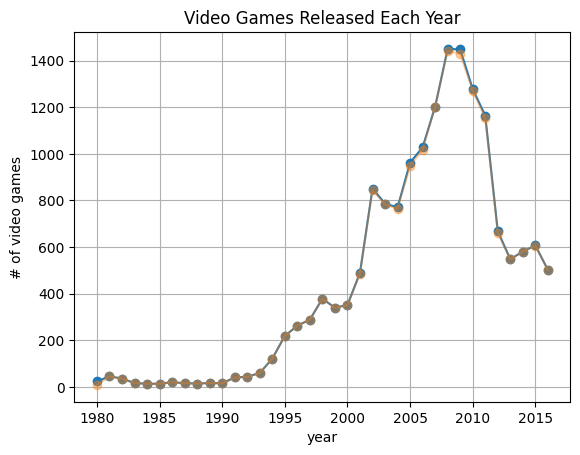

In [178]:
# Visualize the distribution of games across years

year_group = year_df.groupby(['year_of_release'])['name'].count()
display(year_group)

year_group_og = year_df_og.groupby(['year_of_release'])['name'].count()

year_group.plot(title='Video Games Released Each Year',style = '-o',xlabel = 'year',ylabel= '# of video games',grid=True)

year_group_og.plot(title='Video Games Released Each Year',style = '-o',xlabel = 'year',ylabel= '# of video games',grid=True, alpha=0.4)


<AxesSubplot:>

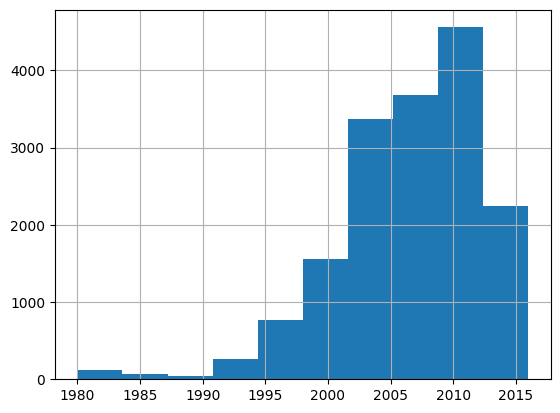

In [179]:
# Using a histogram
games_3['year_of_release'].hist()



<AxesSubplot:xlabel='year_of_release'>

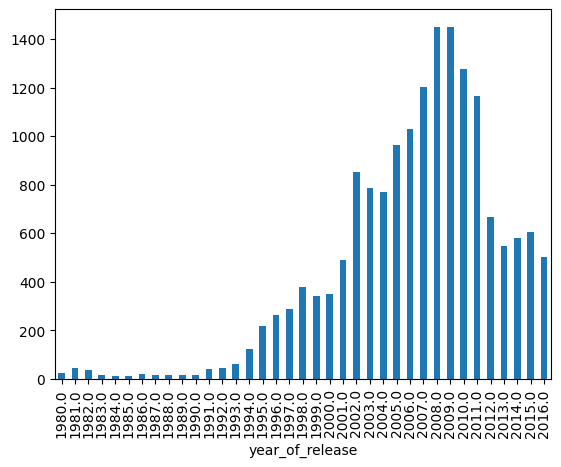

In [180]:
year_group.plot(x='year_of_release',kind='bar', rot=90)

In [181]:
# Display summary statistics for each year


display(year_df.groupby('year_of_release')['name','rating','platform','genre'].describe())
display(games.groupby('year_of_release')['name','rating','platform','genre'].describe())

year_group.sort_values()


name         \
                count unique   
year_of_release                
1980.0             24     24   
1981.0             46     46   
1982.0             36     36   
1983.0             17     17   
1984.0             14     14   
1985.0             14     14   
1986.0             21     21   
1987.0             16     16   
1988.0             15     15   
1989.0             17     17   
1990.0             16     16   
1991.0             41     40   
1992.0             44     42   
1993.0             60     59   
1994.0            122    117   
1995.0            219    215   
1996.0            263    258   
1997.0            289    282   
1998.0            379    364   
1999.0            340    327   
2000.0            352    326   
2001.0            490    432   
2002.0            851    637   
2003.0            787    550   
2004.0            770    555   
2005.0            962    669   
2006.0           1028    782   
2007.0           1202    884   
2008.0           1450   1043   
2009.0           1448   1018   
2010.0           1278    907   
2011.0           1164    788   
2012.0            669    453   
2013.0            548    335   
2014.0            581    319   
2015.0            607    363   
2016.0            503    298   

                                                                         \
                                                               top freq   
year_of_release                                                           
1980.0                                                Breakaway IV    1   
1981.0                                       RealSports Volleyball    1   
1982.0                                               Mountain King    1   
1983.0                                                      Popeye    1   
1984.0                                                  Excitebike    1   
1985.0                                 Tag Team Match M.U.S.C.L.E.    1   
1986.0                            Ganbare Goemon! Karakuri Douchuu    1   
1987.0                             Zelda II: The Adventure of Link    1   
1988.0                                            Final Fantasy II    1   
1989.0                                                   Dr. Mario    1   
1990.0                                                   Dr. Mario    1   
1991.0                                                       Yoshi    2   
1992.0           Teenage Mutant Ninja Turtles: Tournament Fighters    2   
1993.0                                     Super Street Fighter II    2   
1994.0                                                        Myst    2   
1995.0                                          Mobile Suit Gundam    2   
1996.0                                       Mortal Kombat Trilogy    2   
1997.0                               Wayne Gretzky's 3D Hockey '98    2   
1998.0                                                WWF War Zone    2   
1999.0                                                  Mario Golf    2   
2000.0                                             Madden NFL 2001    3   
2001.0                                             Madden NFL 2002    6   
2002.0                     Harry Potter and the Chamber of Secrets    6   
2003.0                                  Need for Speed Underground    5   
2004.0                                Need for Speed Underground 2    5   
2005.0                                               Madden NFL 06    7   
2006.0                                               Madden NFL 07    9   
2007.0                                                 Ratatouille    9   
2008.0                                                      Wall-E    7   
2009.0                      Harry Potter and the Half-Blood Prince    7   
2010.0                                              FIFA Soccer 11    7   
2011.0                          LEGO Star Wars III: The Clone Wars    7   
2012.0                                              FIFA Soccer 13    8   
2013.0                              

name                                                        \
                count unique                                            top   
year_of_release                                                               
1980.0              9      9                                         Bridge   
1981.0             46     46                                     Astroblast   
1982.0             36     36                                  Mountain King   
1983.0             17     17                                      Frostbite   
1984.0             14     14                                     Excitebike   
1985.0             14     14                    Tag Team Match M.U.S.C.L.E.   
1986.0             21     21               Ganbare Goemon! Karakuri Douchuu   
1987.0             16     16                                     Volleyball   
1988.0             15     15                               Final Fantasy II   
1989.0             17     17                                      Dr. Mario   
1990.0             16     16                                    Famista '91   
1991.0             41     40                                          Yoshi   
1992.0             43     41                                 Yoshi's Cookie   
1993.0             60     59                        Super Street Fighter II   
1994.0            122    117                         Disney's The Lion King   
1995.0            219    215              Detana TwinBee Yahho! Deluxe Pack   
1996.0            263    258           Tokimeki Memorial: Taisen Pazurudama   
1997.0            289    282                      Riven: The Sequel to Myst   
1998.0            379    364                                  Madden NFL 99   
1999.0            339    326                               Triple Play 2000   
2000.0            351    325                                   Mario Tennis   
2001.0            486    428                                Madden NFL 2002   
2002.0            845    631        Harry Potter and the Chamber of Secrets   
2003.0            783    546                     Need for Speed Underground   
2004.0            764    550                   Need for Speed Underground 2   
2005.0            948    657                    Need for Speed: Most Wanted   
2006.0           1018    773                                  Madden NFL 07   
2007.0           1202    884                                    Ratatouille   
2008.0           1441   1039                     Need For Speed: Undercover   
2009.0           1430   1001      Star Wars The Clone Wars: Republic Heroes   
2010.0           1270    900                                 FIFA Soccer 11   
2011.0           1153    779  LEGO Pirates of the Caribbean: The Video Game   
2012.0            661    446                   LEGO Harry Potter: Years 5-7   
2013.0            548    335                                        FIFA 14   
2014.0            581    319                                        FIFA 15   
2015.0            606    362                            LEGO Jurassic World   
2016.0            502    297              Lego Star Wars: The Force Awakens   

                     rating                   platform                    \
                freq  count unique   top freq    count unique   top freq   
year_of_release                                                            
1980.0             1      1      1     T    1        9      1  2600    9   
1981.0             1      1      1     E    1       46      1  2600   46   
1982.0             1      1      1  E10+    1       36      1  2600   36   
1983.0             1      0      0   NaN  NaN       17      2  2600   11   
1984.0             1      0      0   NaN  NaN       14      2   NES   13   
1985.0             1      2      2     T    1       14      4   NES   11   
1986.0             1      0      0   NaN  NaN       21      2   NES   19   
1987.0             1      0      0   NaN  NaN       16      2   NES   10   
1988.0             1

year_of_release
1984.0      14
1985.0      14
1988.0      15
1990.0      16
1987.0      16
1989.0      17
1983.0      17
1986.0      21
1980.0      24
1982.0      36
1991.0      41
1992.0      44
1981.0      46
1993.0      60
1994.0     122
1995.0     219
1996.0     263
1997.0     289
1999.0     340
2000.0     352
1998.0     379
2001.0     490
2016.0     503
2013.0     548
2014.0     581
2015.0     607
2012.0     669
2004.0     770
2003.0     787
2002.0     851
2005.0     962
2006.0    1028
2011.0    1164
2007.0    1202
2010.0    1278
2009.0    1448
2008.0    1450
Name: name, dtype: int64

In [182]:
display(year_df.groupby('year_of_release')['user_score','critic_score'].describe())
display(year_df.groupby('year_of_release')['na_sales','eu_sales'].describe())
display(year_df.groupby('year_of_release')['jp_sales','other_sales'].describe())
display(year_df.groupby('year_of_release')['total_sales'].describe())

user_score                                                 \
                     count       mean        std   min    25%   50%   75%   
year_of_release                                                             
1980.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1981.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1982.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1983.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1984.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1985.0                 1.0  58.000000        NaN  58.0  58.00  58.0  58.0   
1986.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1987.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1988.0                 1.0  22.000000        NaN  22.0  22.00  22.0  22.0   
1989.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1990.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1991.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1992.0                 1.0  82.000000        NaN  82.0  82.00  82.0  82.0   
1993.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1994.0                 1.0  63.000000        NaN  63.0  63.00  63.0  63.0   
1995.0                 0.0        NaN        NaN   NaN    NaN   NaN   NaN   
1996.0                 8.0  84.000000   6.369571  74.0  82.25  86.5  87.5   
1997.0                18.0  84.722222   5.623538  75.0  81.25  83.0  90.0   
1998.0                31.0  85.064516   7.183015  57.0  83.00  86.0  90.5   
1999.0                32.0  84.968750   7.424825  63.0  82.50  88.0  90.0   
2000.0               107.0  75.317757  14.199786  12.0  68.50  79.0  84.5   
2001.0               262.0  75.984733  13.909662  24.0  71.00  80.0  86.0   
2002.0               482.0  75.883817  13.132105  17.0  70.00  79.0  85.0   
2003.0               524.0  78.377863  13.334151  15.0  75.00  82.0  87.0   
2004.0               496.0  77.510081  12.512777  20.0  72.00  81.0  86.0   
2005.0               593.0  74.846543  14.027906   5.0  70.00  78.0  85.0   
2006.0               563.0  72.346359  13.869977   3.0  67.00  75.0  82.0   
2007.0               633.0  68.939968  14.703059   3.0  62.00  72.0  79.0   
2008.0               677.0  69.626292  14.545809   0.0  64.00  73.0  79.0   
2009.0               616.0  69.928571  15.028367   9.0  63.00  73.0  81.0   
2010.0               480.0  68.902083  14.094255   5.0  61.00  72.0  79.0   
2011.0               517.0  66.179884  14.507701   9.0  58.00  69.0  77.0   
2012.0               348.0  68.364943  13.991625  16.0  60.00  71.0  79.0   
2013.0               307.0  64.742671  16.629436  10.0  57.00  68.0  77.0   
2014.0               329.0  65.802432  15.317987  14.0  57.00  70.0  77.0   
2015.0               298.0  66.711409  15.740229  14.0  59.00  71.0  78.0   
2016.0               263.0  66.190114  16.868881   2.0  59.50  70.0  79.0   

                      critic_score                                           \
                  max        count       mean        std   min    25%   50%   
year_of_release                                                               
1980.0            NaN          0.0        NaN        NaN   NaN    NaN   NaN   
1981.0            NaN          0.0        NaN        NaN   NaN    NaN   NaN   
1982.0            NaN          0.0        NaN        NaN   NaN    NaN   NaN   
1983.0            NaN          0.0        NaN        NaN   NaN    NaN   NaN   
1984.0            NaN          0.0        NaN        NaN   NaN    NaN   NaN   
1985.0           58.0          1.0  59.000000        NaN  59.0  59.00  59.0   
1986.0            NaN          0.0        NaN        NaN   NaN    NaN   NaN   
1987.0            NaN          0.0        NaN        NaN   NaN    NaN   NaN   
1988.0           22.0          1.0  64.000000        NaN  64.0  64

na_sales                                                   \
                   count      mean       std   min     25%    50%     75%   
year_of_release                                                             
1980.0              24.0  0.743750  0.870951  0.14  0.2825  0.425  0.9300   
1981.0              46.0  0.726087  0.730885  0.12  0.2925  0.435  0.8925   
1982.0              36.0  0.747778  1.172248  0.13  0.3150  0.500  0.7225   
1983.0              17.0  0.456471  0.278903  0.01  0.3100  0.430  0.5100   
1984.0              14.0  2.377143  7.089785  0.00  0.0450  0.345  0.7700   
1985.0              14.0  2.409286  7.689309  0.00  0.0000  0.285  0.6025   
1986.0              21.0  0.595238  0.881542  0.00  0.0000  0.320  0.7100   
1987.0              16.0  0.528750  0.653094  0.00  0.1350  0.370  0.4875   
1988.0              15.0  1.591333  2.630154  0.00  0.1000  0.590  1.3700   
1989.0              17.0  2.655882  5.893720  0.00  0.1400  0.660  0.9600   
1990.0              16.0  1.591250  3.087251  0.00  0.2300  0.675  1.7325   
1991.0              41.0  0.311220  0.643619  0.00  0.0000  0.000  0.4100   
1992.0              44.0  0.774773  1.346474  0.00  0.0000  0.020  1.0500   
1993.0              60.0  0.252000  0.831529  0.00  0.0000  0.000  0.0525   
1994.0             122.0  0.250164  0.638850  0.00  0.0000  0.000  0.0200   
1995.0             219.0  0.113379  0.347959  0.00  0.0000  0.000  0.0400   
1996.0             263.0  0.329886  1.007959  0.00  0.0000  0.040  0.1650   
1997.0             289.0  0.327855  0.711767  0.00  0.0000  0.070  0.2900   
1998.0             379.0  0.338681  0.646139  0.00  0.0100  0.080  0.3600   
1999.0             340.0  0.372794  0.786289  0.00  0.0200  0.130  0.3625   
2000.0             352.0  0.268949  0.456174  0.00  0.0200  0.100  0.2825   
2001.0             490.0  0.363408  0.733887  0.00  0.0400  0.120  0.3300   
2002.0             851.0  0.259694  0.555201  0.00  0.0350  0.100  0.2300   
2003.0             787.0  0.252986  0.425134  0.00  0.0400  0.100  0.2600   
2004.0             770.0  0.290494  0.608671  0.00  0.0400  0.110  0.3200   
2005.0             962.0  0.255634  0.586291  0.00  0.0400  0.100  0.2500   
2006.0            1028.0  0.258512  1.463155  0.00  0.0000  0.050  0.1900   
2007.0            1202.0  0.258394  0.607100  0.00  0.0000  0.090  0.2700   
2008.0            1450.0  0.248241  0.632029  0.00  0.0100  0.090  0.2600   
2009.0            1448.0  0.232735  0.754611  0.00  0.0000  0.090  0.2100   
2010.0            1278.0  0.238513  0.726791  0.00  0.0000  0.080  0.1900   
2011.0            1164.0  0.207405  0.573598  0.00  0.0000  0.060  0.1625   
2012.0             669.0  0.233214  0.620050  0.00  0.0000  0.050  0.2100   
2013.0             548.0  0.280529  0.775010  0.00  0.0000  0.040  0.2325   
2014.0             581.0  0.227659  0.515008  0.00  0.0000  0.050  0.2000   
2015.0             607.0  0.176046  0.486742  0.00  0.0000  0.020  0.1300   
2016.0             503.0  0.089324  0.257941  0.00  0.0000  0.010  0.0500   

                       eu_sales                                           \
                   max    count      mean       std   min     25%    50%   
year_of_release                                                            
1980.0            4.00     24.0  0.047083  0.057064  0.01  0.0200  0.030   
1981.0            4.21     46.0  0.042609  0.043073  0.01  0.0200  0.030   
1982.0            7.28     36.0  0.045833  0.072560  0.01  0.0200  0.030   
1983.0            1.22     17.0  0.047059  0.037041  0.00  0.0200  0.030   
1984.0           26.93     14.0  0.150000  0.193072  0.00  0.0025  0.090   
1985.0           29.08     14.0  0.338571  0.939475  0.00  0.0000  0.060   
1986.0            3.74     21.0  0.135238  0.227851  0.00  0.0000  0.020   
1987.0            2.19     16.0  0.088125  0.161750  0.00  0.0000  0.020   
1988.0            9.54     15.0  0.439333  0.892432  0.00  0.0050  0.140   
1989.0           23.20 

jp_sales                                                   \
                   count      mean       std   min     25%    50%     75%   
year_of_release                                                             
1980.0              24.0  0.000000  0.000000  0.00  0.0000  0.000  0.0000   
1981.0              46.0  0.000000  0.000000  0.00  0.0000  0.000  0.0000   
1982.0              36.0  0.000000  0.000000  0.00  0.0000  0.000  0.0000   
1983.0              17.0  0.476471  0.800585  0.00  0.0000  0.000  0.7000   
1984.0              14.0  1.019286  0.670998  0.00  0.4800  0.975  1.5025   
1985.0              14.0  1.040000  1.733826  0.00  0.2575  0.470  1.0175   
1986.0              21.0  0.943333  0.653271  0.00  0.5700  1.000  1.2000   
1987.0              16.0  0.726875  0.810685  0.00  0.0000  0.435  1.3300   
1988.0              15.0  1.050667  1.226845  0.00  0.2700  0.760  1.1650   
1989.0              17.0  1.080000  1.285272  0.00  0.3600  0.650  1.1000   
1990.0              16.0  0.930000  1.002783  0.11  0.3450  0.535  1.0150   
1991.0              41.0  0.360488  0.285377  0.05  0.1600  0.280  0.4200   
1992.0              44.0  0.657045  0.939467  0.00  0.0675  0.285  0.6500   
1993.0              60.0  0.422167  0.475170  0.00  0.0850  0.210  0.5300   
1994.0             122.0  0.278607  0.422862  0.00  0.0400  0.135  0.3600   
1995.0             219.0  0.208904  0.381496  0.00  0.0000  0.080  0.2750   
1996.0             263.0  0.218403  0.702431  0.00  0.0000  0.040  0.2100   
1997.0             289.0  0.169100  0.371402  0.00  0.0000  0.000  0.1800   
1998.0             379.0  0.132032  0.335696  0.00  0.0000  0.000  0.0900   
1999.0             340.0  0.153941  0.510387  0.00  0.0000  0.000  0.1200   
2000.0             352.0  0.121563  0.341401  0.00  0.0000  0.000  0.1100   
2001.0             490.0  0.081347  0.249020  0.00  0.0000  0.000  0.0300   
2002.0             851.0  0.049518  0.231704  0.00  0.0000  0.000  0.0000   
2003.0             787.0  0.043520  0.155889  0.00  0.0000  0.000  0.0000   
2004.0             770.0  0.054468  0.243284  0.00  0.0000  0.000  0.0000   
2005.0             962.0  0.057204  0.337393  0.00  0.0000  0.000  0.0000   
2006.0            1028.0  0.072821  0.359109  0.00  0.0000  0.000  0.0300   
2007.0            1202.0  0.050158  0.185010  0.00  0.0000  0.000  0.0300   
2008.0            1450.0  0.042262  0.210705  0.00  0.0000  0.000  0.0200   
2009.0            1448.0  0.042880  0.263160  0.00  0.0000  0.000  0.0100   
2010.0            1278.0  0.046635  0.245470  0.00  0.0000  0.000  0.0200   
2011.0            1164.0  0.046229  0.151679  0.00  0.0000  0.000  0.0300   
2012.0             669.0  0.077608  0.262711  0.00  0.0000  0.020  0.0600   
2013.0             548.0  0.087464  0.290952  0.00  0.0000  0.010  0.0700   
2014.0             581.0  0.068313  0.276776  0.00  0.0000  0.010  0.0500   
2015.0             607.0  0.056161  0.190207  0.00  0.0000  0.010  0.0500   
2016.0             503.0  0.038390  0.133343  0.00  0.0000  0.000  0.0300   

                       other_sales                                        \
                   max       count      mean       std  min   25%    50%   
year_of_release                                                            
1980.0            0.00        24.0  0.006667  0.011672  0.0  0.00  0.000   
1981.0            0.00        46.0  0.006957  0.009631  0.0  0.00  0.000   
1982.0            0.00        36.0  0.008611  0.013555  0.0  0.00  0.010   
1983.0            2.35        17.0  0.008235  0.008090  0.0  0.00  0.010   
1984.0            2.46        14.0  0.050000  0.122474  0.0  0.00  0.020   
1985.0            6.81        14.0  0.065714  0.203421  0.0  0.00  0.005   
1986.0            2.65        21.0  0.091905  0.326705  0.0  0.00  0.010   
1987.0            2.41        16.0  0.012500  0.025690  0.0  0.00  0.000   
1988.0            3.84        15.0  0.066000  0.122054  0.0  0.00  0.010   
1989.0            4.22 

,count,mean,std,min,25%,50%,75%,max
year_of_release,,,,,,,,
1980.0,24.0,0.797500,0.939233,0.15,0.3000,0.450,0.9975,4.31
1981.0,46.0,0.775652,0.783019,0.13,0.3125,0.465,0.9525,4.50
1982.0,36.0,0.802222,1.257910,0.14,0.3350,0.540,0.7800,7.81
1983.0,17.0,0.988235,0.838825,0.16,0.4000,0.770,1.1300,3.20
1984.0,14.0,3.596429,7.200795,0.27,1.1300,1.485,2.0900,28.31
1985.0,14.0,3.853571,10.510376,0.02,0.4650,1.015,1.4550,40.24
1986.0,21.0,1.765714,1.328001,0.30,1.1500,1.360,2.2000,6.50
1987.0,16.0,1.356250,1.225174,0.07,0.4550,0.885,2.2125,4.38
1988.0,15.0,3.147333,4.414414,0.03,0.9700,1.510,3.1450,17.28


### Questions to Consider:
- Which years show significant numbers of game releases?
    - 2006 - 2011
- Are there any notable trends or patterns in the number of releases?
    - Yes
    - There is a steady number of game releases between 1980 - 1990 with a relatively low number of releases; averaging about 20 releases per year
    - A noticable increase from 1991 - 1993; averaging about 46 releases per year
    - A jump in sales in 1994 - a 58 game difference
        - 59 in 1993 to 117 in 1994 release
    - Another jump in 1995 - a 98 game difference
        - 117 games to 215 games
    - There is a steady increase in games releases from 1996 to 2000; averaging about 311 game releases
    - A slight decrease in releasees in 1999 and 2000
      - 364 in 1998
      - 325/326 releases in 1999 and 200
      - A decrease of 38 releases
    - A drastic increase in sales from 2001 to 2011; averaging about 744 releases per year
    - The trend started to decline in 2010 and 2011 dropping from
        - 2009 - 1001
        - 2010 - 900
        - 2011 - 779
        - A decrease in over 100 games each year
    - A rapid decrease in releases from 2012 to 2016; averaging about 351 releases per year
    - **Overall**
        - 1980 - 1990: low releases
        - 1991 - 1993: starting to see increasing releases
        - 1994-1995: A rapid increase in releases starts
        - 1996 - 2000: A steady increase in sales
        - 1999- 2000: A slight dip in release (~38 less)
        - 2001 - 2011: A rapid increase in releases
        - 2010 - 2011: The beginning of declining releases, but still high
        - 2012 - 2016: Rapid decline in releases (Resembling release numbers from 1997 - 2001)
- Is there enough recent data to make predictions for 2017?
    - The overall trend suggests consistent increase in releases from 1980 - 2009
    - The releases have been consistantly dropping since 2010
    - There has not been any signigicant decreases until 2012
    - All other decreases spanned only 1-2 years and it was not significant
    - We now have 4 years of data that is trending downward
    - We could possibly make a prediction for 2017, but not off this data alone
    - We need to understand the underlying reason for the drop in sales; was there a strike, what was the political climate like in this era, were there any new consoles being released to excite consumers, was there a recession or a war going on.
    - Strictly looking at the data, we could predict an average release from the last 4 years around 360 releases in 2017

**NOTE:** This data was used looking at the unique values rather than the frequency of title names, but the trends are similar. This data is also based on the original DataFrame games rather than games_3. The data in games_3 is almost identical other than a few extra readings, but there is a notable increase for games in the 1980's due to an earlier shift made when inputting dates. There were a few games made in the late 70's that i decided to put in 1980; there were also a few games between 1980 - 1985 that I bundled to 1980; so, some of the 1980 data points can be dispersed from 1977 - 1985. As long as this information is known, it should not have a significant impact on the data. If there is significant impact, other DataFrames can be looked at. 

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Well done! 

## 3.2 Platform Sales Analysis Over Time

Now let's analyze how sales vary across platforms and years:

In [183]:
# Calculate total sales by platform and year

# Get the platform names
display(games_3['platform'].unique())


display(year_df.groupby(['era','platform'])['total_sales'].sum())
year_df.groupby(['year_of_release','platform'])['total_sales'].sum()

array(['Wii', 'NES', 'GB', 'DS', 'X360', 'PS3', 'PS2', 'SNES', 'GBA',
       'PS4', '3DS', 'N64', 'PS', 'XB', 'PC', '2600', 'PSP', 'XOne',
       'WiiU', 'GC', 'GEN', 'DC', 'PSV', 'SAT', 'SCD', 'WS', 'NG', 'TG16',
       '3DO', 'GG', 'PCFX'], dtype=object)

era     platform
2000's  3DS            0.02
        DC             7.41
        DS           680.96
        GB            29.00
        GBA          317.20
        GC           198.69
        N64           37.63
        PC            84.00
        PS           141.34
        PS2         1248.50
        PS3          346.44
        PSP          229.11
        WS             0.96
        Wii          681.03
        X360         416.65
        XB           257.74
2010's  3DS          258.70
        DS           124.89
        PC           125.48
        PS2            7.04
        PS3          592.50
        PS4          314.14
        PSP           64.59
        PSV           54.07
        Wii          225.77
        WiiU          82.19
        X360         554.70
        XOne         159.32
80's    2600          94.24
        DS             0.02
        GB            66.40
        NES          223.51
        PC             0.07
90's    2600           2.74
        3DO            0.10
   

year_of_release  platform
1980.0           2600        19.14
1981.0           2600        35.68
1982.0           2600        28.88
1983.0           2600         5.84
                 NES         10.96
                             ...  
2016.0           PSV          4.25
                 Wii          0.18
                 WiiU         4.60
                 X360         1.52
                 XOne        26.15
Name: total_sales, Length: 244, dtype: float64

In [184]:
platforms = games_3['platform'].unique()
years = games_3['year_of_release'].unique()

year_platform = year_df.groupby(['year_of_release','platform'])['total_sales'].sum()

year_platform_df = year_platform.reset_index()
year_platform_df['year_of_release'] = year_platform_df['year_of_release'].astype('int')
display(year_platform_df)


year_platform_pivot = games_3.pivot_table(index='platform',columns='year_of_release',values='total_sales',aggfunc='sum').fillna(0)
display(year_platform_pivot)

,year_of_release,platform,total_sales
0,1980,2600,19.14
1,1981,2600,35.68
2,1982,2600,28.88
3,1983,2600,5.84
4,1983,NES,10.96
...,...,...,...
239,2016,PSV,4.25
240,2016,Wii,0.18
241,2016,WiiU,4.60
242,2016,X360,1.52


year_of_release,1980.0,1981.0,1982.0,1983.0,1984.0,1985.0,1986.0,1987.0,1988.0,1989.0,...,2007.0,2008.0,2009.0,2010.0,2011.0,2012.0,2013.0,2014.0,2015.0,2016.0
platform,,,,,,,,,,,,,,,,,,,,,
2600,19.14,35.68,28.88,5.84,0.27,0.45,0.67,1.94,0.74,0.63,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3DO,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3DS,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.30,63.36,51.79,56.57,43.76,27.78,15.14
DC,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.02,0.04,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
DS,0.00,0.00,0.00,0.00,0.00,0.02,0.00,0.00,0.00,0.00,...,147.23,145.96,120.19,85.35,26.33,11.67,1.54,0.00,0.00,0.00
GB,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.43,64.97,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
GBA,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,3.40,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
GC,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.27,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
GEN,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


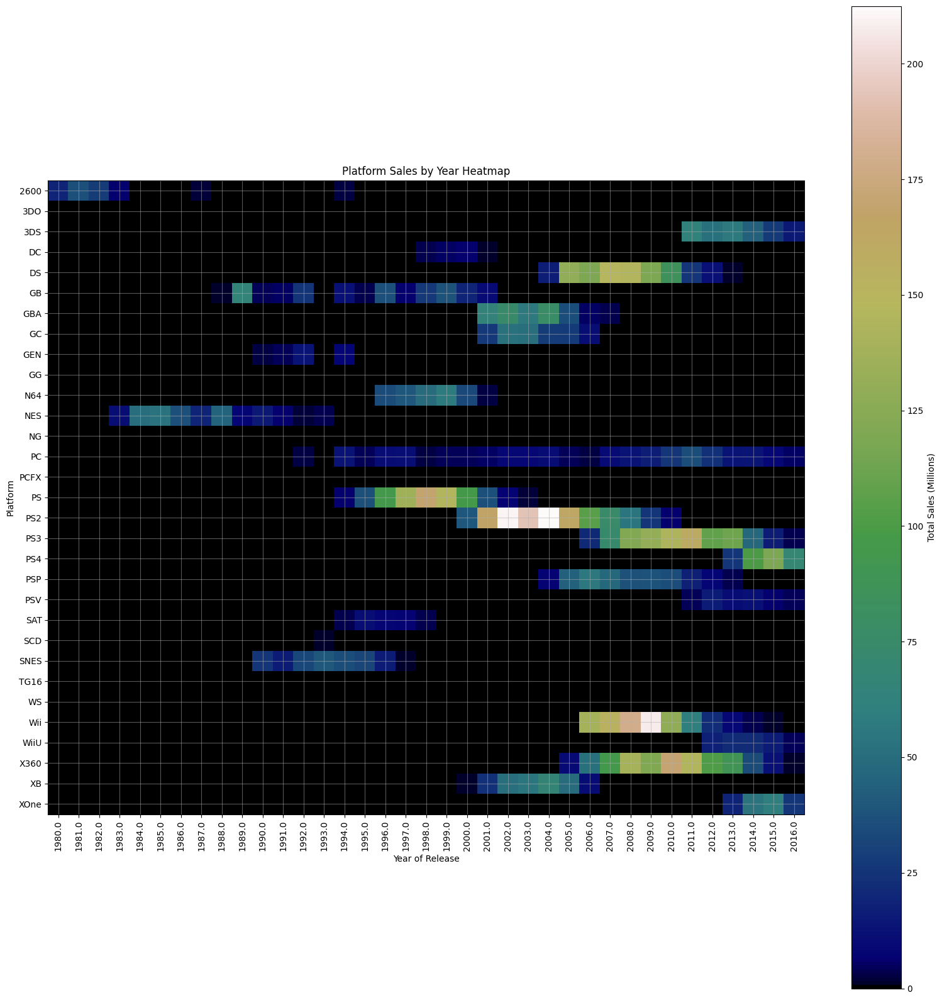

In [185]:
# Create a heatmap of platform sales over time

import matplotlib.pyplot as plt

plt.figure(figsize=(16,16))
plt.grid(alpha = 0.5)
plt.imshow(year_platform_pivot,cmap="gist_earth")



plt.xticks(ticks=range(len(year_platform_pivot.columns)), labels=year_platform_pivot.columns, rotation = 90)
plt.yticks(ticks=range(len(year_platform_pivot.index)), labels=year_platform_pivot.index)

plt.colorbar(label='Total Sales (Millions)')
plt.title('Platform Sales by Year Heatmap')
plt.xlabel('Year of Release')
plt.ylabel('Platform')
plt.tight_layout()
plt.show()

<AxesSubplot:xlabel='year_of_release', ylabel='platform'>

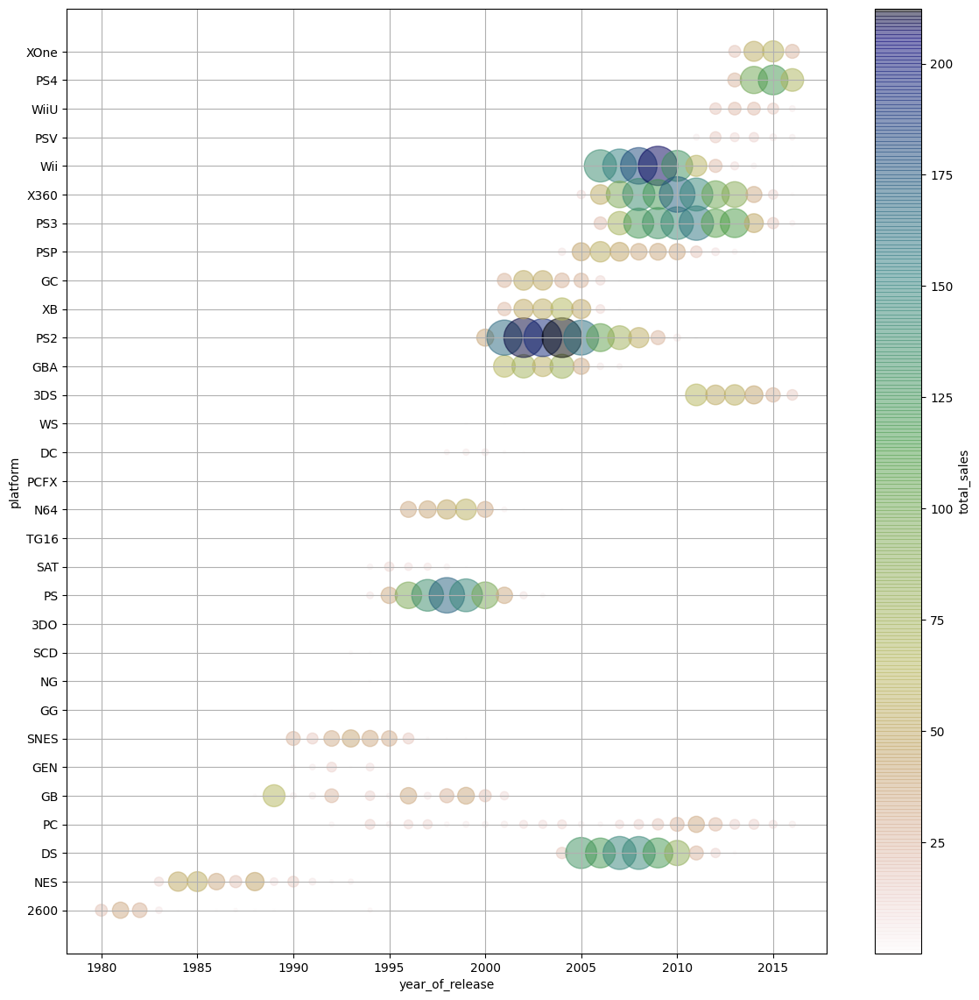

In [186]:
# Create another heatmap

year_platform_df.plot.scatter(x='year_of_release',
                              y='platform',
                              c="total_sales",
                              cmap="gist_earth_r",
                              s=year_platform_df['total_sales'] *5, 
                              figsize=(14,14),
                              grid=True,
                              alpha=0.5)

In [187]:
# Identify platforms with declining sales


# From the Heatmap, we see no sales from:
    # No Sales Recorded     (7)
        # TG16  (N/A)
        # WS    (N/A)
        # 3DO   (N/A)
        # SCD   (N/A)
        # NG    (N/A)
        # GG    (N/A)
        # PCFX  (N/A)
    # By 2005               (9)
        # 2600 (1980 - 1983)
        # NES  (1983 - 1993)
        # GEN  (1991 - 1994)
        # SNES (1990 - 1996)
        # SAT  (1994 - 1998)
        # DC   (1998 - 2000)
        # N64  (1996 - 2000)
        # GB   (1989 - 2001)
        # PS   (1994 - 2002)
    # By 2010               (4)
        # XB   (2001 - 2006)
        # GC   (2001 - 2006)
        # GBA  (2001 - 2007)
        # PS2  (2000 - 2010)



# 11 Remaining platforms
        # DS   (2004 - 2012)
            # Most significant sales between 2005 - 2010
            # Declining
        # PSP  (2004 - 2013)
            # Most significant sales between 2005 - 2010
            # Declining
        # Wii  (2006 - 2014)
            # Most significant sales between 2006 - 2011
            # Declining
        # X360 (2005 - 2015)
            # Most significant sales between 2006 - 2014
            # Declining
        # PSV  (2011 - present)
            # Most significant year 2012
            # Declining, but not impressive sales compared to other consoles
        # WiiU (2012 - present)
            # Relatively low, but consistent sales
        # PS3  (2006 - present)
            # Most significant sales between 2007 - 2014
            # Declining
        # 3DS  (2011 - present)
            # Slight decline, but sales are consistent
        # XOne (2013 - present)
            # No apparent trend of decline, there's not enough data to show a decline
            # Sales are releatively consistent
        # PS4  (2013 - present)
            # Does not appear to be declining
        # PC   (1992 - present)
            # The PC is the most consistent console to make revenue
            # Has the longest standing use
            # Relatively consistent Sales that are on the lower end for total sales
            # There is a downward trend
            # Given the lifespan of this console, it's safe to assume sales will not completely end

display(year_platform_df[year_platform_df['year_of_release'] == 2006].sort_values(by='platform'))
display(year_platform_df[year_platform_df['year_of_release'] == 2009].sort_values(by='platform'))
display(year_platform_df[year_platform_df['year_of_release'] == 2013].sort_values(by='platform'))


   # & (year_platform_df['year_of_release'] < 2016) & (year_platform_df['year_of_release'] > 2010)].sort_values(by='platform').head(60))

# Consider sales from 2005 - 2015 (Consider not all 2016 data is available)

    # 2005
        # DS, GBA, GC, PC, PS2, PS3, PSP, X360, XB
    # 2009
        #  DS, PC, PS2, PS3, PSP, Wii, X360
    # 2010
        # 3DS, DS, PC, PS2, PS3, PSP, Wii, X360
    # 2013
        # 3DS, DS, PC, PS3, PS4, PSP, PSV, Wii, WiiU, X360, XOne
    # 2014 + 2015 
        # Same games as 2013, but 2013 has DS


# Focus on the following consoles:
    # 3DS, DS, PC, PS2, PS3, PS4, PSP, PSV, Wii, WiiU, X360, XOne
    # There have not been sales from the other consoles in over 5 years

# Check sales from 2005 - 2010
#display(year_platform_df[(year_platform_df['year_of_release'] > 2004) & (year_platform_df['year_of_release'] < 2011)].sort_values(by='platform'))

        # DS        # 3DS      # PC       # PS2        # PS3        #PSP       # Wii       # X360     
# 2005 - 130.26        -        4.38        164.11       0.19        43.86         -        9.22
# 2006 - 120.05        -        2.85        104.78       20.96       56.29       140.19     51.79
# 2007 - 147.23        -        9.28        76.10        73.19       47.30       153.42     95.41
# 2008 - 145.96        -        12.46       55.02        121.17      36.76       179.77     139.41
# 2009 - 120.19        -        17.05       26.40        130.93      37.84       207.66     120.82
# 2010 - 85.35       0.30       26.15       6.59         143.13      35.04       129.36     170.73

# Look at sales from 2010 - 2015
display(year_platform_df[(year_platform_df['year_of_release'] > 2010) & (year_platform_df['year_of_release'] < 2017) 
    & (year_platform_df['platform'].isin(['3DS', 'DS', 'PC', 'PS2', 'PS3', 'PS4', 'PSP', 'PSV', 'Wii', 'WiiU', 'X360', 'XOne']
                                        ))].sort_values(by='platform'))

# DS
    # Sales start to decline in 2010
    # Sales quickly decline after 2010
    # No Sales seen between 2014 - 2016
# 3DS
    # Sales start to decline in 2014
    # Given DS data, we could predict there will be no sales by 2018 or 2019
# PC
    # Although sales are declining for PC games; these games tend to produce consistent sales even when some years are higher than others
    # Given the heatmap data, we can infer that sales will likely "yo-yo" fo the next 10 years
# PS2
    # Sales start to decline in 2006
    # Sales quickly decline after 2006
    # No sales since 2011
# PS3
    # Sales quickly start declining in 2014
    # Given other data, we can infer no sales by 2017 or 2018
# PSP
    # Sales start to decline in 2011
    # Sales quickly decline after 2011
    # Given other data, we can infer no sales in 2017
# PSV
    # Sales start to decline in 2015
    # There is not enough data to support a prediction of no sales
    # The sales stay relatively consistent
# Wii   
    # Sales start to decline in 2011
    # Sales quickly decline after 2011
    # Given other data, we can infer no sales by 2017 or 2018
# WiiU
    # Sales start to decline in 2015, but there is not enough data to infer no sales in the next 5 years
# X360
    # Sales start to decline in 2013
    # Sales quickly decline after 2013
    # Given other data, we can infer no sales by 2017 or 2018
# XOne
    # There is not enough data to consider if there is a downward trend

# Consider low sales due to new consoles


,year_of_release,platform,total_sales
141,2006,DS,120.05
142,2006,GBA,5.51
143,2006,GC,11.55
144,2006,PC,2.85
145,2006,PS2,104.78
146,2006,PS3,20.96
147,2006,PSP,56.29
148,2006,Wii,140.19
149,2006,X360,51.79
150,2006,XB,10.09


,year_of_release,platform,total_sales
171,2009,DS,120.19
172,2009,PC,17.05
173,2009,PS2,26.40
174,2009,PS3,130.93
175,2009,PSP,37.84
176,2009,Wii,207.66
177,2009,X360,120.82


,year_of_release,platform,total_sales
204,2013,3DS,56.57
205,2013,DS,1.54
206,2013,PC,13.01
207,2013,PS3,113.25
208,2013,PS4,25.99
209,2013,PSP,3.38
210,2013,PSV,10.59
211,2013,Wii,8.59
212,2013,WiiU,21.65
213,2013,X360,88.58


,year_of_release,platform,total_sales
186,2011,3DS,63.36
204,2013,3DS,56.57
225,2015,3DS,27.78
215,2014,3DS,43.76
235,2016,3DS,15.14
195,2012,3DS,51.79
187,2011,DS,26.33
205,2013,DS,1.54
196,2012,DS,11.67
206,2013,PC,13.01


**Summary of declining platforms**

- The most recent platforms to produce no sales were the DS,PS2, and PSP
    - The DS began declining sales in 2010 and produced no sales in 2014 -2016 (coinciding with the 3DS release in 2010)
    - The PS2 began declining sales in 2006 and produced no sales in 2011 - 2016
    - The PSP began declining sales in 2011 and produced no sales in 2016

**DS,PS2, and PSP:** Given the information on these consoles, we can infer that sales start producing no sales 4-5 years after decline


**Declining Platforms**
- 3DS, PS3, Wii, X360
- We can predict that most of these consoles will produce no sales by 2017 - 2019
- **Wii:** decline in 2011 - the decline has become severe and the WiiU console coming out tells us that the Wii is not likely to produce sales in 2017
- **X360:** decline in 2013 - the decline is severe and the XOne console coming out tells us that the X360 is not likely to produce significant, if any, sales in 2017. We can infer no sales in 2018.
- **PS3:** decline in 2014 -  the decline is severe and the PSV(2011) and PS4(2013) make it unlikely that there will be sales for 2017. We can infer no sales in 2018.
- **3DS:** decline in 2014 - the decline has not yet become so severe that the console will not produce sales by 2017, but there could be a possiblility of no sales between 2018-2019

**Not enough data to predict a decline**
- **XOne:** - Came out in 2013 - only 3 years of data; no apparent trend
- **WiiU:** - Came out in 2012 - there appears to be a sharp decline in 2016, but there is not enough data to show a pattern; we can possibly infer no sales by 2020 - 2021 given the other data's rate of decline
- **PS4:** - Came out in 2013 - only 3 years of data, no apparent trend   
- **PSV:** - Came out in 2011 - the sales are consistently lower than other consoles and there is not enough data to infer no sales


**Outlier**
- **PC:** Most consistent in terms of sales; although there is a downward trend, given the lifespan of the console, it's safe to assume sales will not completely end - we can infer sales will stay relatively consistent over the next 10 years.


**All Other Consoles**
 - Sales ended on or before 2008


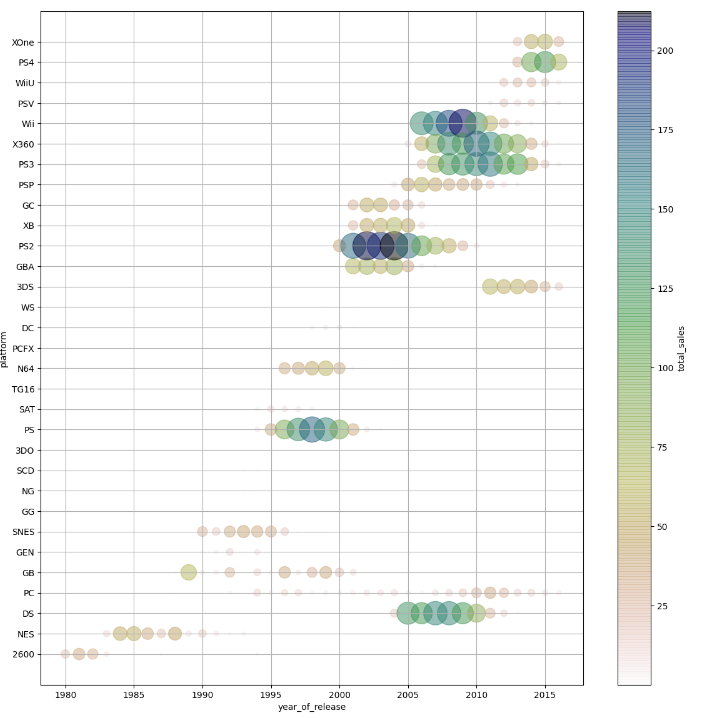 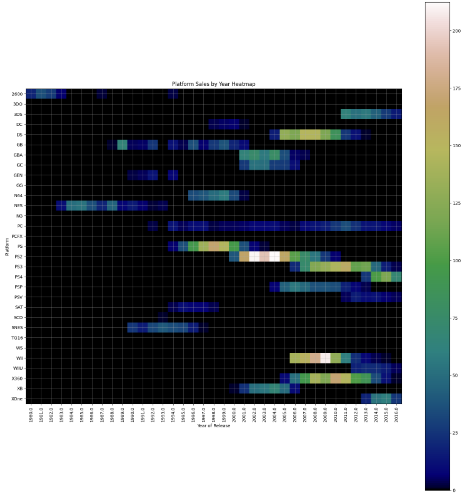

### Questions to Consider:
- Which platforms show consistent sales over time?
    - PC - has been consistent from about 1994 to present time
    - PS3 and X360 remained fairly consistent over a 10 year period
    - The GB remained relatively consistent
- Can you identify platforms that have disappeared from the market?
    - Most of them:
        - TG16, WS, 3DO, SCD, NG, GG, and PCFX - sales were insignificant (7)
        - 2600 - earliest out of existence (1)
        - NES, GEN SNES, SAT, DC, N64, GB, PS - all produced no sales by 2005 (8)
        - XB, GC, GBA - all produced no sales by 2010 (3)
        - DS, PS2, PSP - not produced sales in recent years (3)
- What's the typical lifecycle of a gaming platform?
    - the heatmap indicates that 5-10 years is relatively common for a console to produce sales



<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

## 3.3 Determining Relevant Time Period

Based on your analysis above, determine the appropriate time period for predicting 2017 sales:

In [188]:
# Your code here to filter the dataset to relevant years
# Example:
# relevant_years = [XXXX, XXXX, XXXX] # Replace with your chosen years
# df_relevant = df[df['year_of_release'].isin(relevant_years)]
relevant_years=[2005,2006,2007,2008,2009, 2010,2011, 2012, 2013, 2014, 2015, 2016]
df_relevant = games_3[games_3['year_of_release'].isin(relevant_years)]
df_relevant

# Justify your choice with data
# I've made previous justifications in the previous summary

,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
0,Wii Sports,Wii,2006.0,Sports,41.36,28.96,3.77,8.45,76.0,80.0,E,82.54,high,high,10 million +,2000's,All Available
2,Mario Kart Wii,Wii,2008.0,Racing,15.68,12.76,3.79,3.29,82.0,83.0,E,35.52,high,high,10 million +,2000's,All Available
3,Wii Sports Resort,Wii,2009.0,Sports,15.61,10.93,3.28,2.95,80.0,80.0,E,32.77,high,high,10 million +,2000's,All Available
6,New Super Mario Bros.,DS,2006.0,Platform,11.28,9.14,6.50,2.88,89.0,85.0,E,29.80,very high,high,10 million +,2000's,All Available
7,Wii Play,Wii,2006.0,Misc,13.96,9.18,2.93,2.84,58.0,66.0,E,28.91,low,medium,10 million +,2000's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16709,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,0.00,0.00,0.00,0.00,NaN,NaN,E,0.00,NaN,NaN,No Sale,2000's,All Available
16710,Samurai Warriors: Sanada Maru,PS3,2016.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available
16711,LMA Manager 2007,X360,2006.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2000's,All Available
16712,Haitaka no Psychedelica,PSV,2016.0,Adventure,0.00,0.00,0.01,0.00,NaN,NaN,T,0.01,tbd,tbd,"< 50,000",2010's,All Available


### Document Your Decision:
- What years did you select and why?
    - I selected 2005 - 2016 because the majority of consoles were out of the market after about 10 years; so, it seems relevant to track the last 10 years plus 2016.
    - If a console came out before 2005, it's likely to be off the market before 2017; therefore, if console is in the 2005 data and starts to decline rapidly by 2016, then, we can conclude the data is likely going off the market soon.
    - Addionally, we need enough data to notice a trend.
- How does this period reflect current market conditions?
    - We can avoid consoles that have been off the market for an extended period of time as they are no longer relevant
    - Looking at the last 11 years of data can help to notice the trends of the most recent decade and compare them to newer consoles
- What factors influenced your decision?
    - There are 5 consoles in this decade that went through their entire or peak life cycle in this decade which will help to determine future trends. (Some have not completed their lifecycle yet, but have experienced their peaks)
        - Wii
        - X360
        - PS3 - ongoing lifecycle
        - PSP
        - DS
    - There are 4 consoles where we can see the end of their lifecycles to help us understand what that pattern looks like for gaming consoles
        - PS2
        - GBA
        - PSP
        - XB
        - GC
    - We are also able to see the newest consoles to best predict their out of market year (6)
        - XOne
        - WiiU
        - PSV
        - PS4
        - PS3 - appears close to the end of its lifecycle
        - 3DS
    - Also, it's important that there are other similar consoles, like PlayStation, DS - 3DS, Xbox: we can inspect consoles from the same manufacturer to see more trends

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Well done! 

## 3.4 Platform Performance Analysis

Using your selected time period, let's analyze platform performance:

In [189]:
# Analyze platform sales trends
display(df_relevant.groupby(['platform','year_of_release'])['total_sales'].sum())

platform  year_of_release
3DS       2010.0              0.30
          2011.0             63.36
          2012.0             51.79
          2013.0             56.57
          2014.0             43.76
                             ...  
XB        2008.0              0.18
XOne      2013.0             18.96
          2014.0             54.07
          2015.0             60.14
          2016.0             26.15
Name: total_sales, Length: 112, dtype: float64

In [190]:
# Sort platforms by total sales
platform_sales = df_relevant.groupby(['platform','year_of_release'])['total_sales'].sum().sort_values()
platform_sales_df = platform_sales.reset_index()
display(platform_sales_df)

platform_total_sales = platform_sales_df.groupby('platform')['total_sales'].sum().sort_values()
platform_total_sales_df = platform_total_sales.reset_index()
display(platform_total_sales_df)

,platform,year_of_release,total_sales
0,DC,2007.0,0.02
1,DC,2008.0,0.04
2,PSP,2015.0,0.12
3,Wii,2016.0,0.18
4,XB,2008.0,0.18
...,...,...,...
107,PS3,2011.0,159.57
108,PS2,2005.0,164.11
109,X360,2010.0,170.73
110,Wii,2008.0,179.77


,platform,total_sales
0,DC,0.06
1,GC,39.74
2,GBA,44.32
3,PSV,54.07
4,XB,60.25
5,WiiU,82.19
6,XOne,159.32
7,PC,171.50
8,3DS,258.70
9,PSP,286.64


<AxesSubplot:xlabel='platform'>

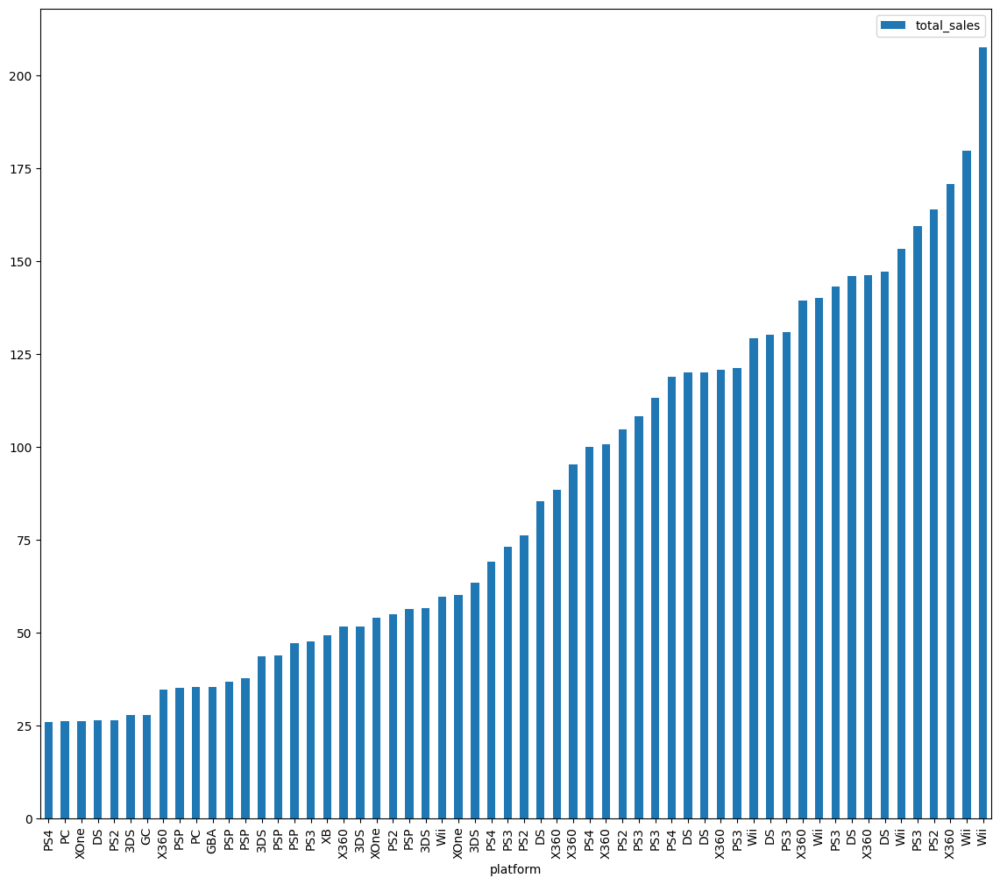

In [191]:
# Visualize top platforms
display(platform_sales_df[platform_sales_df['total_sales'] >= 25].plot(x='platform',y='total_sales',kind='bar', rot=90,figsize=(14,12)))

**Platforms that made the most revenue in a single year between 2005 - 2016**
- Wii
- X360
- PS2
- PS3
- DS

<AxesSubplot:xlabel='platform'>

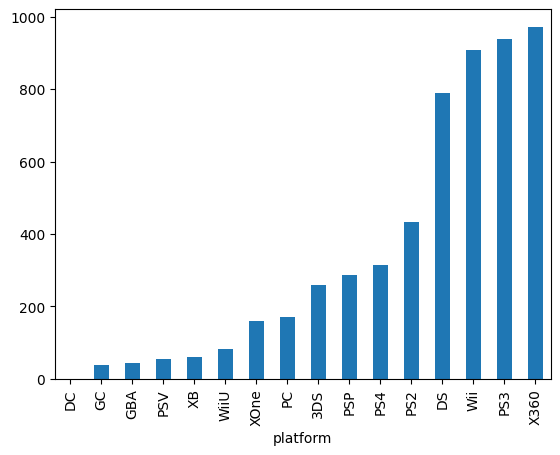

In [192]:
# Visualize top platforms
display(platform_total_sales.plot(x='platform',y='total_sales',kind='bar'))

**Platforms that made the most revenue overall between 2005 - 2016**
- X360
- PS3
- Wii
- DS - cut off the first year of revenue
- PS2 - significantly lower than the rest, but PS2 was at the end of it's lifecycle in this time period
- The top 3 consoles completed their lifecycles

In [193]:
# Calculate year-over-year growth for each platform

platform_rel_year_df = platform_sales_df.sort_values(by=['platform','year_of_release'])

platform_rel_year_df = platform_rel_year_df.reset_index()
platform_rel_year_df

# ((Starting value - final value) / starting value) * 100 : growth formula



def yearly_growth(df):
    first = [None]
    
    for i in range(1, len(df)):
        starting = df.iloc[i - 1]
        final = df.iloc[i]
        if (final['platform'] == starting['platform']):
            growth = ((final['total_sales'] - starting['total_sales']) / starting['total_sales']) * 100
            first.append(growth)
        else:
            first.append(None)
    return first

   
platform_rel_year_df['sales_growth_percent'] = yearly_growth(platform_rel_year_df)
platform_rel_year_df['sales_growth_percent'] = platform_rel_year_df['sales_growth_percent'].round(2)

display(platform_rel_year_df.head(60))


,index,platform,year_of_release,total_sales,sales_growth_percent
0,8,3DS,2010.0,0.30,NaN
1,80,3DS,2011.0,63.36,21020.00
2,73,3DS,2012.0,51.79,-18.26
3,77,3DS,2013.0,56.57,9.23
4,67,3DS,2014.0,43.76,-22.64
5,59,3DS,2015.0,27.78,-36.52
6,41,3DS,2016.0,15.14,-45.50
7,0,DC,2007.0,0.02,NaN
8,1,DC,2008.0,0.04,100.00
9,98,DS,2005.0,130.26,NaN


platform,3DS,DC,DS,GBA,GC,PC,PS2,PS3,PS4,PSP,PSV,Wii,WiiU,X360,XB,XOne
year_of_release,,,,,,,,,,,,,,,,
2006.0,NaN,NaN,-7.84,-84.44,-58.63,-34.93,-36.15,10931.58,NaN,28.34,NaN,NaN,NaN,461.71,-79.59,NaN
2007.0,NaN,NaN,22.64,-38.29,-97.66,225.61,-27.37,249.19,NaN,-15.97,NaN,9.43,NaN,84.22,-94.55,NaN
2008.0,NaN,100.0,-0.86,NaN,NaN,34.27,-27.70,65.56,NaN,-22.28,NaN,17.18,NaN,46.12,-67.27,NaN
2009.0,NaN,NaN,-17.66,NaN,NaN,36.84,-52.02,8.05,NaN,2.94,NaN,15.51,NaN,-13.33,NaN,NaN
2010.0,NaN,NaN,-28.99,NaN,NaN,53.37,-75.04,9.32,NaN,-7.40,NaN,-37.71,NaN,41.31,NaN,NaN
2011.0,21020.00,NaN,-69.15,NaN,NaN,35.18,-93.17,11.49,NaN,-49.03,NaN,-53.78,NaN,-14.26,NaN,NaN
2012.0,-18.26,NaN,-55.68,NaN,NaN,-32.48,NaN,-32.09,NaN,-55.49,255.29,-61.60,NaN,-31.14,NaN,NaN
2013.0,9.23,NaN,-86.80,NaN,NaN,-45.50,NaN,4.50,NaN,-57.48,-35.62,-62.59,23.29,-12.11,NaN,NaN
2014.0,-22.64,NaN,NaN,NaN,NaN,2.08,NaN,-57.83,284.76,-92.90,12.37,-56.34,1.76,-60.78,NaN,185.18


<AxesSubplot:title={'center':'Growth Percent - All Consoles: Lower Limit'}, xlabel='year_of_release'>

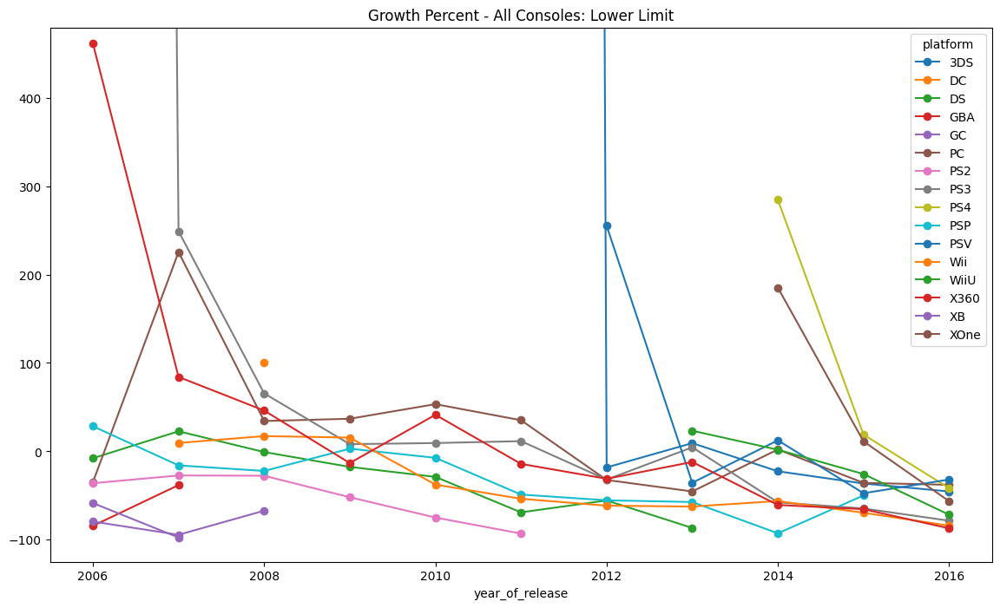

In [194]:
# Your code here to calculate and visualize platform growth rates
platform_rel_year_pivot = platform_rel_year_df.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')
display(platform_rel_year_pivot)

# Growth Chart: Lower Limit
platform_rel_year_pivot.plot(style='-o',figsize=(14,8),ylim=[-125,480], title = "Growth Percent - All Consoles: Lower Limit")

<AxesSubplot:title={'center':'XBox Consoles - Lower Limit: Growth Percent'}, xlabel='year_of_release'>

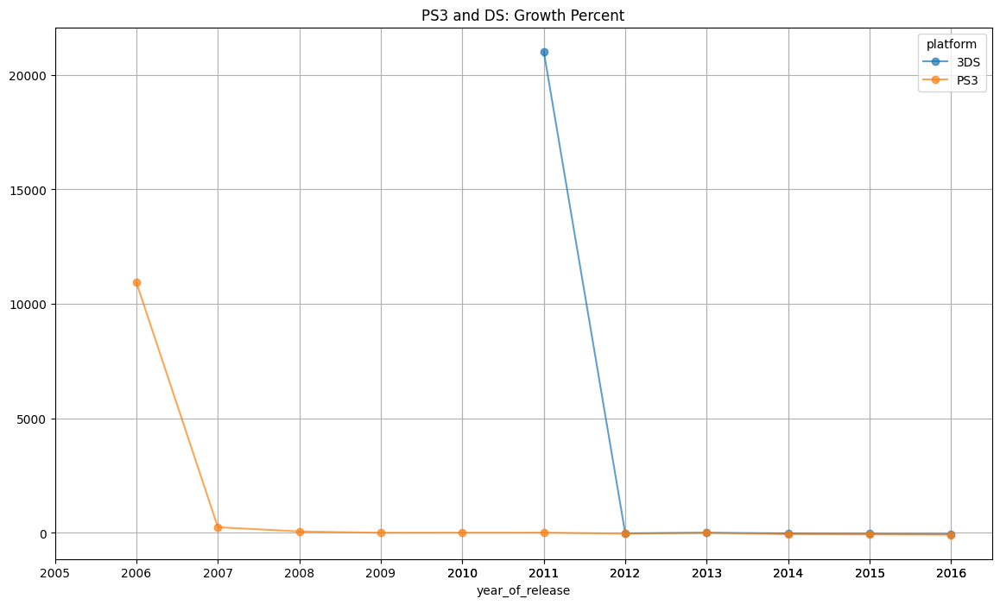

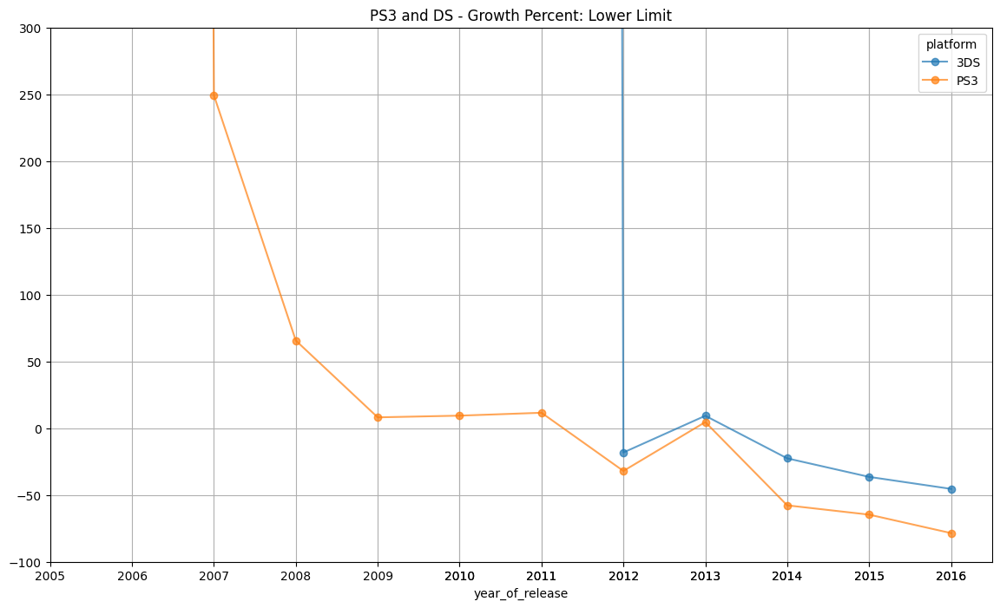

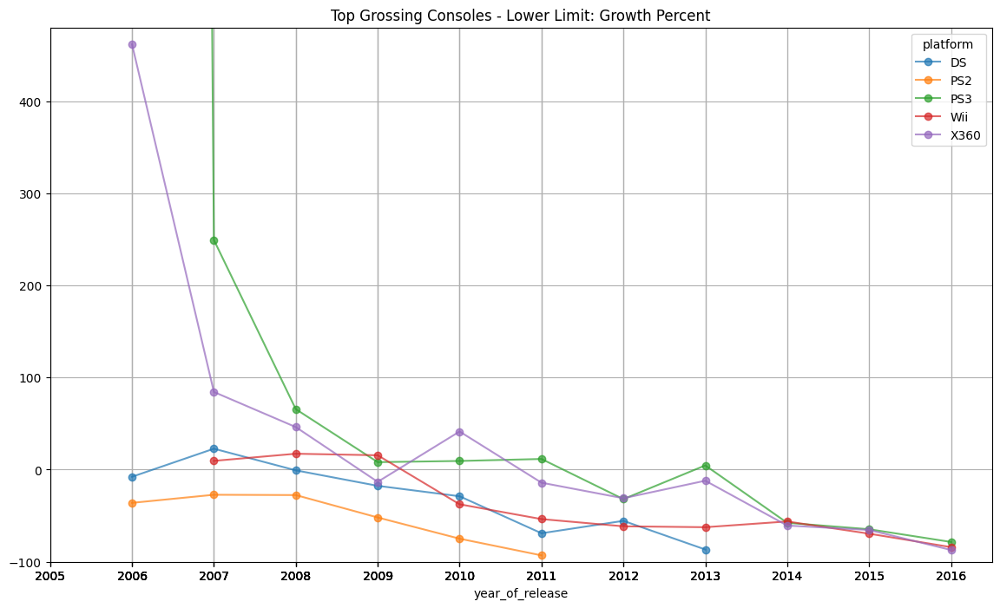

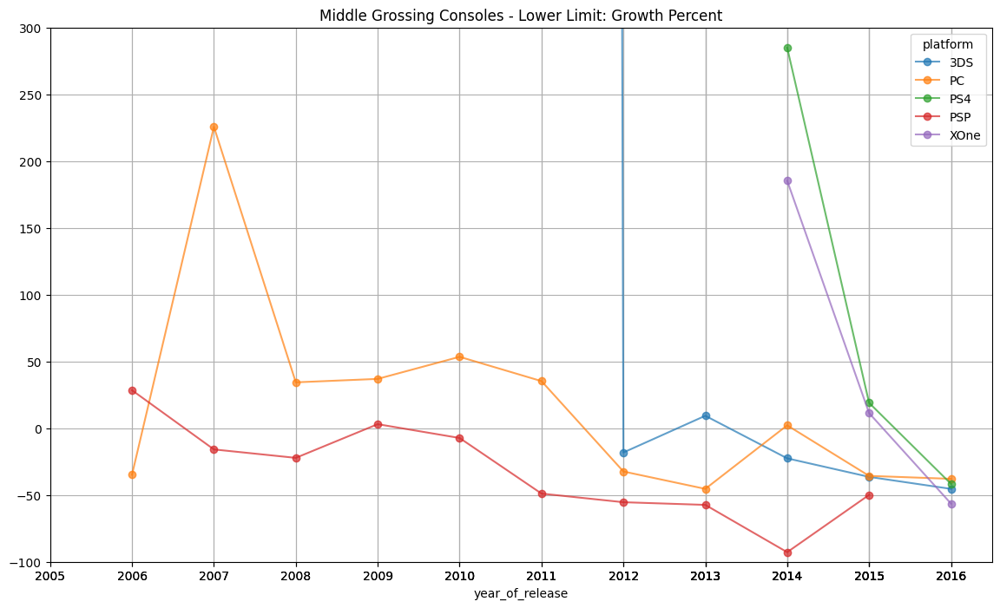

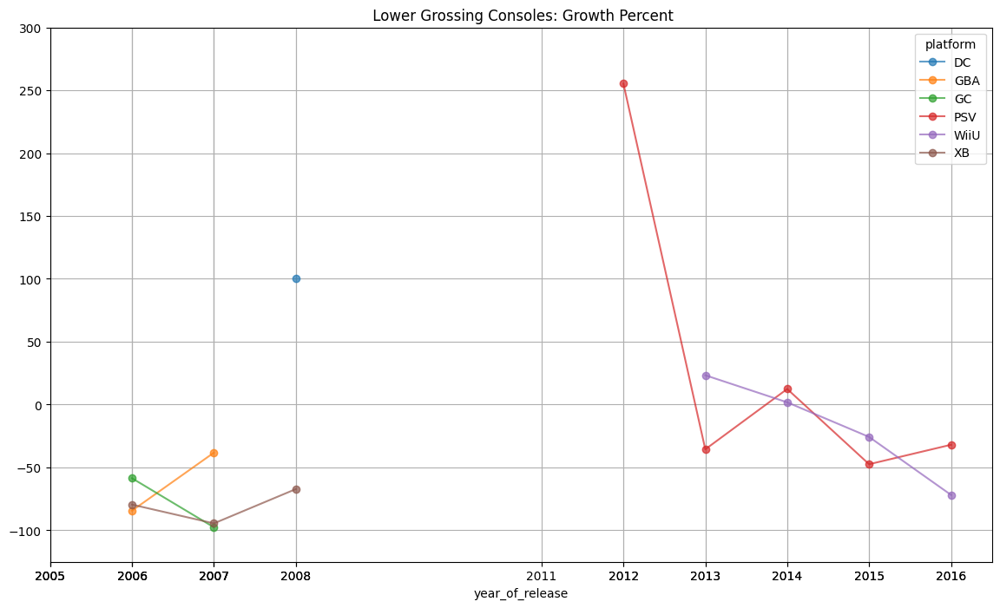

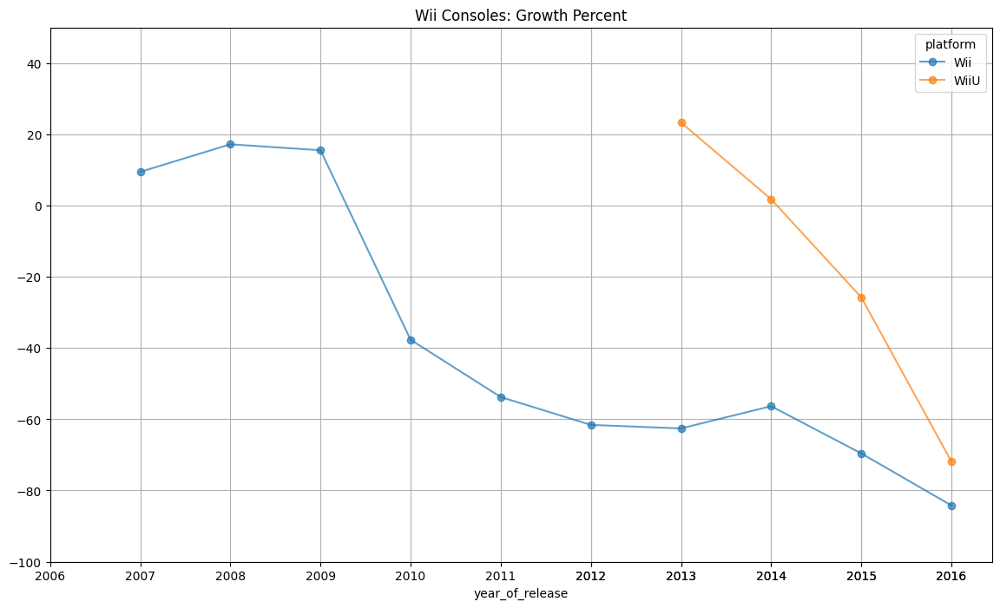

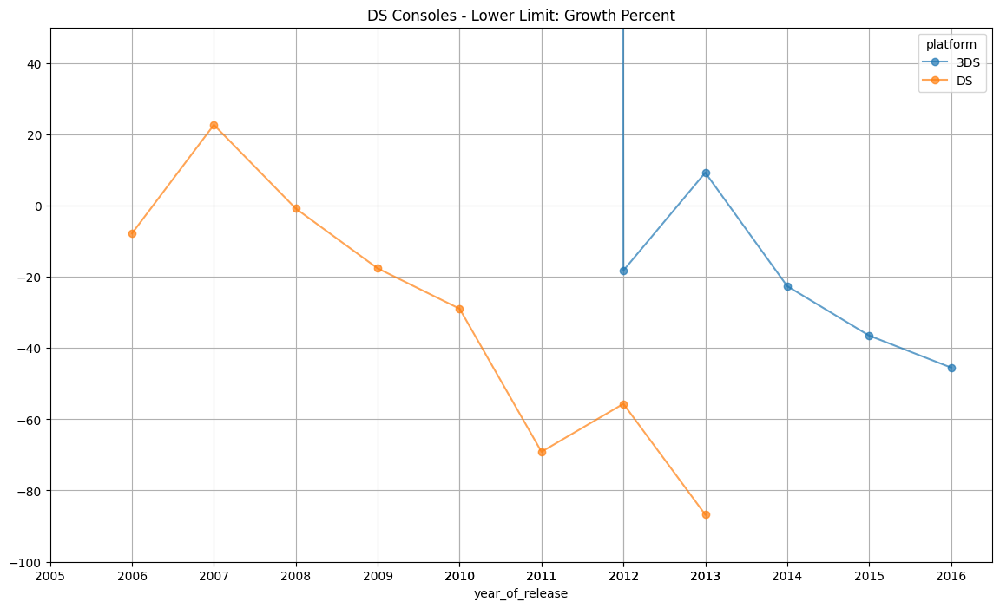

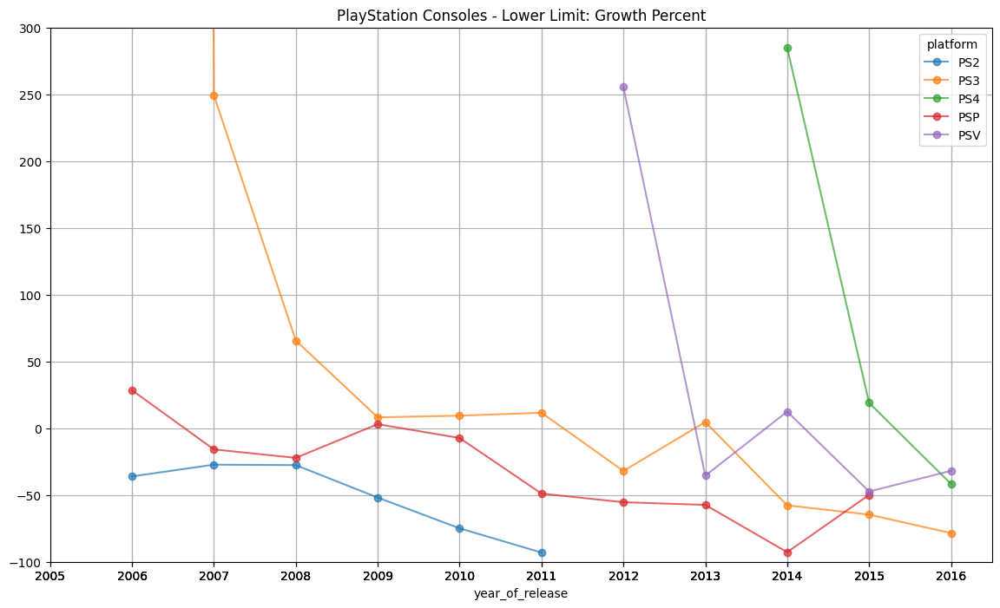

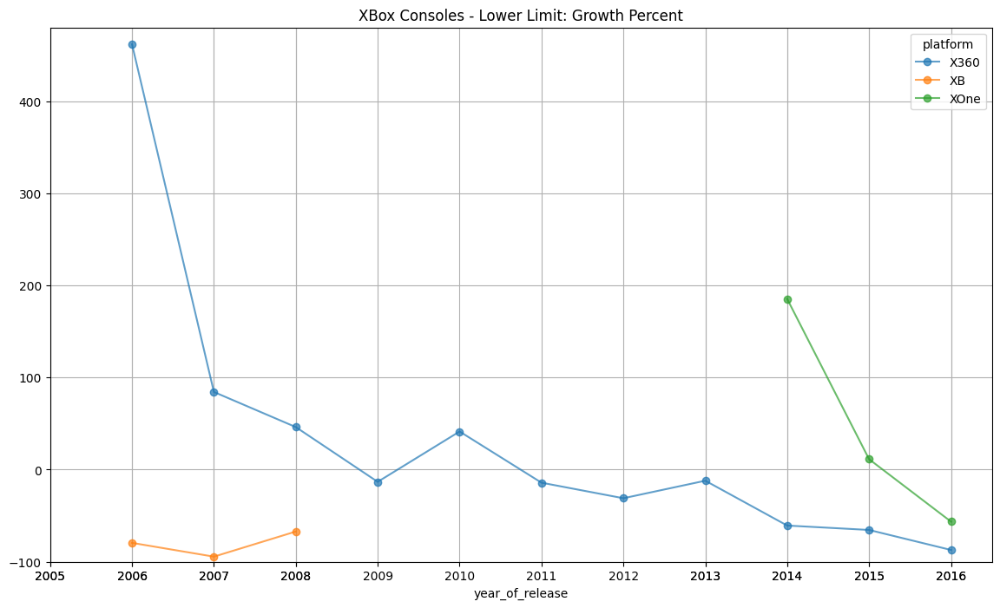

In [195]:
# Separate PS3 and 3DS data
ps3_3ds = platform_rel_year_df[platform_rel_year_df['platform'].isin(['PS3','3DS'])]

# Top 5 grossing consoles
top5_consoles = platform_rel_year_df[platform_rel_year_df['platform'].isin(['PS2','DS','Wii','PS3','X360'])]

# Middle grossing consoles
middle_consoles = platform_rel_year_df[platform_rel_year_df['platform'].isin(['PS4','PSP','3DS','PC','XOne'])]

# Lower Grossing Consoles
lower_consoles = platform_rel_year_df[platform_rel_year_df['platform'].isin(['WiiU','XB','PSV','GBA','GC','DC'])]

# Wii Consoles
wii_consoles = platform_rel_year_df[platform_rel_year_df['platform'].isin(['WiiU','Wii'])]

# DS Consoles
ds_consoles = platform_rel_year_df[platform_rel_year_df['platform'].isin(['DS','3DS'])]

# Playstation Consoles
ps_consoles = platform_rel_year_df[platform_rel_year_df['platform'].isin(['PS4','PSP','PS2','PS3','PSV'])]

# Xbox Consoles
xb_consoles = platform_rel_year_df[platform_rel_year_df['platform'].isin(['XB','X360','XOne'])]


# Make pivot tables

# Only PS3 and DS
ps3_3ds_pivot = ps3_3ds.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')

# Top grossing consoles
top_5_consoles_pivot = top5_consoles.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')

# Middle Grossing Consoles
middle_consoles_pivot = middle_consoles.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')

# Lower Grossing Consoles
lower_consoles_pivot = lower_consoles.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')

# Wii Consoles
wii_consoles_pivot = wii_consoles.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')

# DS Consoles
ds_consoles_pivot = ds_consoles.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')

# Playstation Consoles
ps_consoles_pivot = ps_consoles.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')

# Xbox Consoles
xb_consoles_pivot = xb_consoles.pivot_table(index='year_of_release',columns='platform',values='sales_growth_percent')



# PS3 and DS chart
ps3_3ds_pivot.plot(style='-o',figsize=(14,8),grid=True,xticks=ps3_3ds['year_of_release'],alpha=0.7, title= "PS3 and DS: Growth Percent")
# Lower limites of PS3 and DS
ps3_3ds_pivot.plot(style='-o',figsize=(14,8),grid=True,xticks=ps3_3ds['year_of_release'],alpha=0.7, 
                   ylim = (-100,300),title = "PS3 and DS - Growth Percent: Lower Limit")

# Top grossing consoles chart: Lower Limit
# Refer to PS3 and DS Growth Percent Chart to see upper limits
top_5_consoles_pivot.plot(style='-o',figsize=(14,8),grid=True,alpha=0.7, ylim=(-100,480),xticks=top5_consoles['year_of_release'],
                          title= "Top Grossing Consoles - Lower Limit: Growth Percent")

# Middle Grossing Consoles
middle_consoles_pivot.plot(style='-o',figsize=(14,8),grid=True,alpha=0.7, ylim=(-100,300),xticks=middle_consoles['year_of_release'],
                          title= "Middle Grossing Consoles - Lower Limit: Growth Percent")

# Lower Grossing Consoles
lower_consoles_pivot.plot(style='-o',figsize=(14,8),grid=True,alpha=0.7, ylim=(-125,300),xticks=lower_consoles['year_of_release'],
                          title= " Lower Grossing Consoles: Growth Percent")

# Wii Consoles
wii_consoles_pivot.plot(style='-o',figsize=(14,8),grid=True,alpha=0.7, ylim=(-100,50),xticks=wii_consoles['year_of_release'],
                          title= "Wii Consoles: Growth Percent")


# DS Consoles
ds_consoles_pivot.plot(style='-o',figsize=(14,8),grid=True,alpha=0.7, ylim=(-100,50),xticks=ds_consoles['year_of_release'],
                          title= "DS Consoles - Lower Limit: Growth Percent")

# Playstation Consoles
ps_consoles_pivot.plot(style='-o',figsize=(14,8),grid=True,alpha=0.7, ylim=(-100,300),xticks=ps_consoles['year_of_release'],
                          title= "PlayStation Consoles - Lower Limit: Growth Percent")

# Xbox Consoles
xb_consoles_pivot.plot(style='-o',figsize=(14,8),grid=True,alpha=0.7, ylim=(-100,480),xticks=xb_consoles['year_of_release'],
                          title= "XBox Consoles - Lower Limit: Growth Percent")


**Explanation of Overview Photos**

The images below are difficult to compare; there are too many lines going throughout the page with too many similar colors; you'll notice in the remaining photos that I will be cutting off the first year of PS3 and 3DS console becasue as you can see (2nd photo), there is an inability to compare consoles growth percent when the height of one line varies so drastically. 

**Note:** There are different limits set on each y-axis. This is to make easier comparisons, not to trick consumers. 

The first image shows all consoles growth percent
The second image shows the entiretly of the PS3 and 3DS Console because they are cut off in the first image.

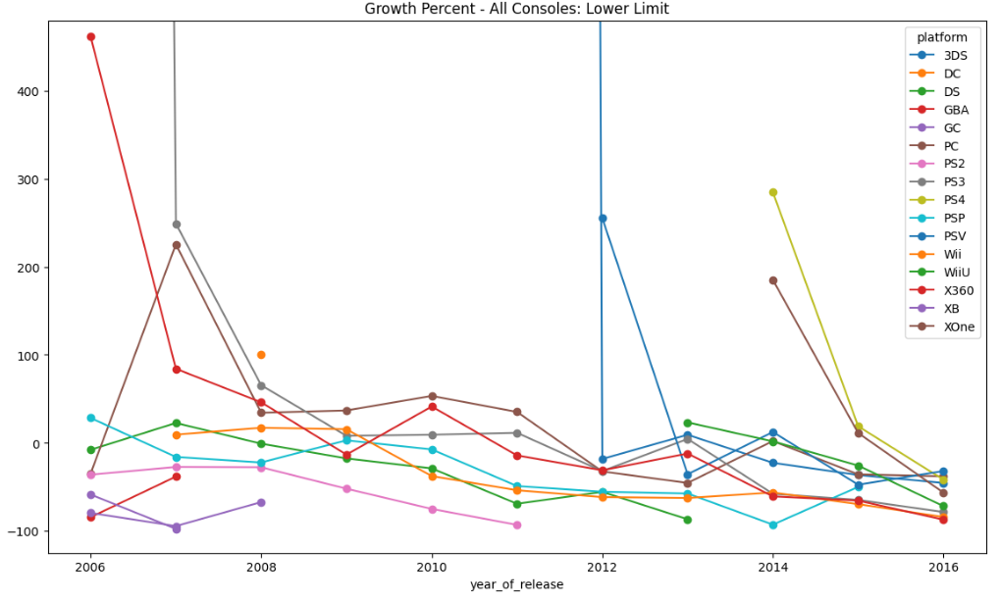 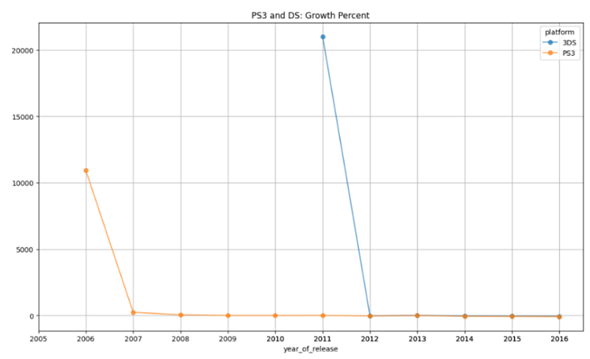


The comparison becomes much easier to read when setting the limits lower and cropping the first year:

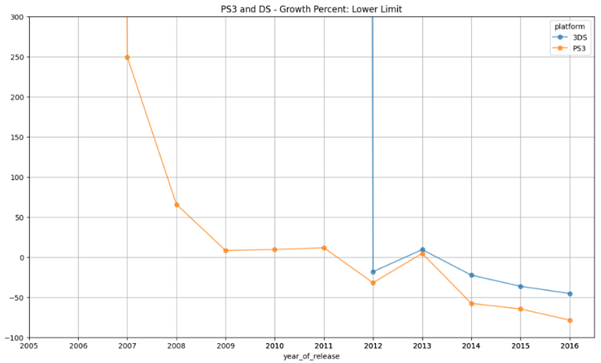

**Compare Top, Middle, and Lower Grossing Consoles:**

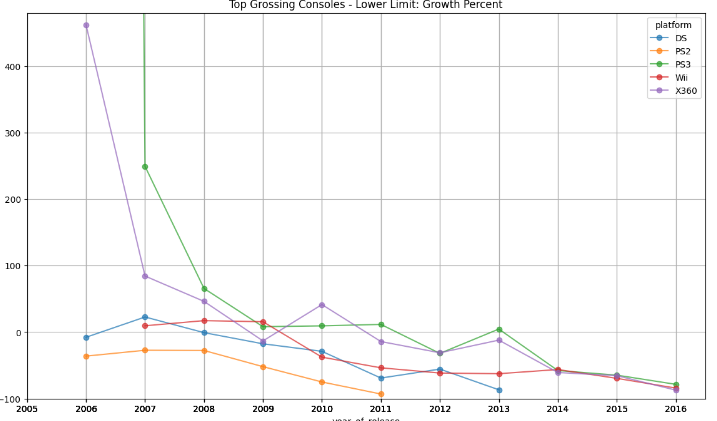 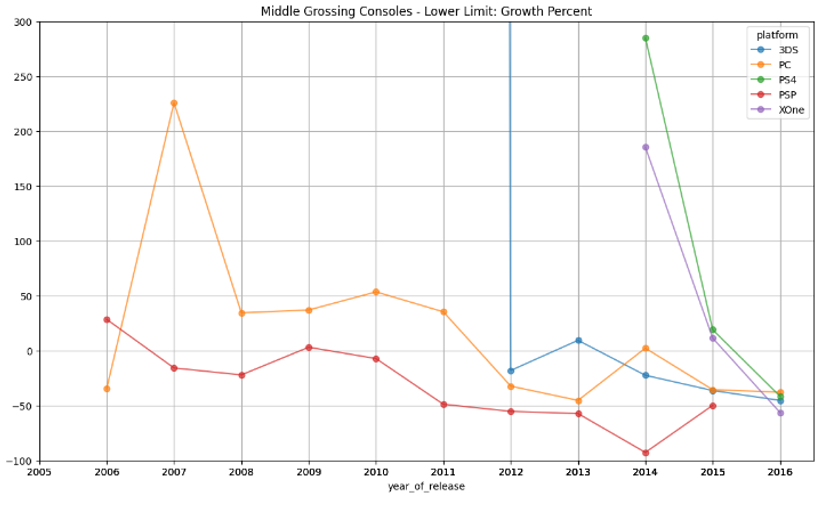 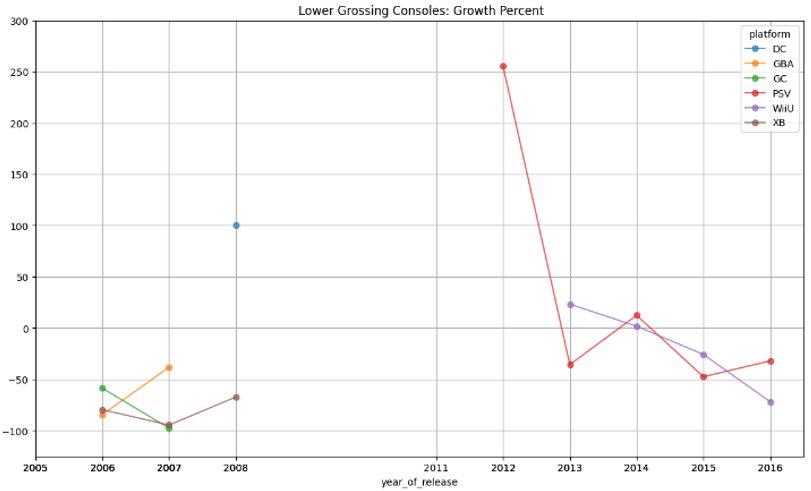

**Compare Console Manufacturer**

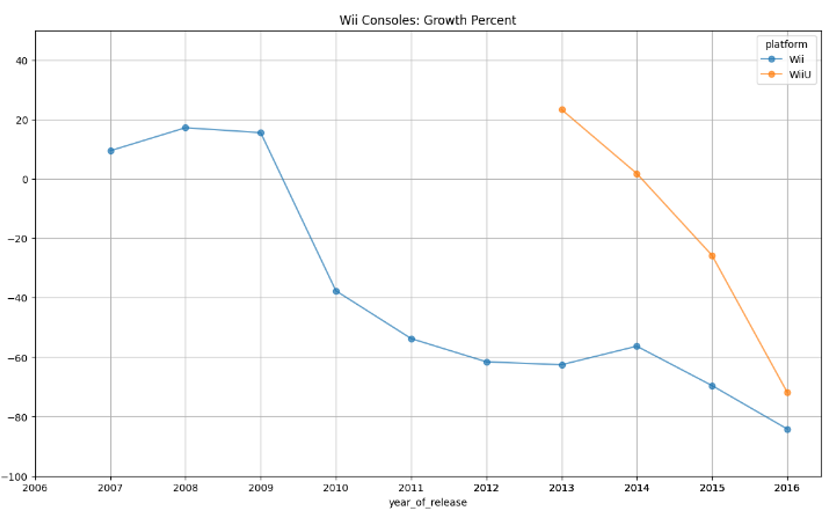 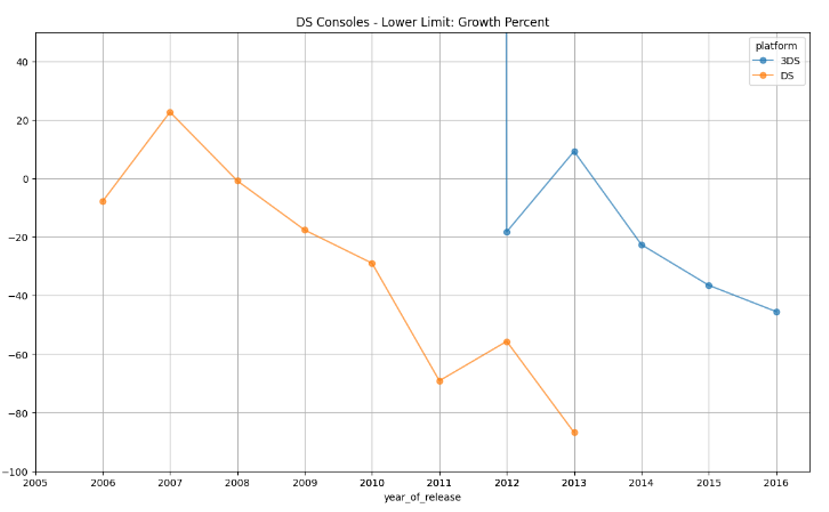 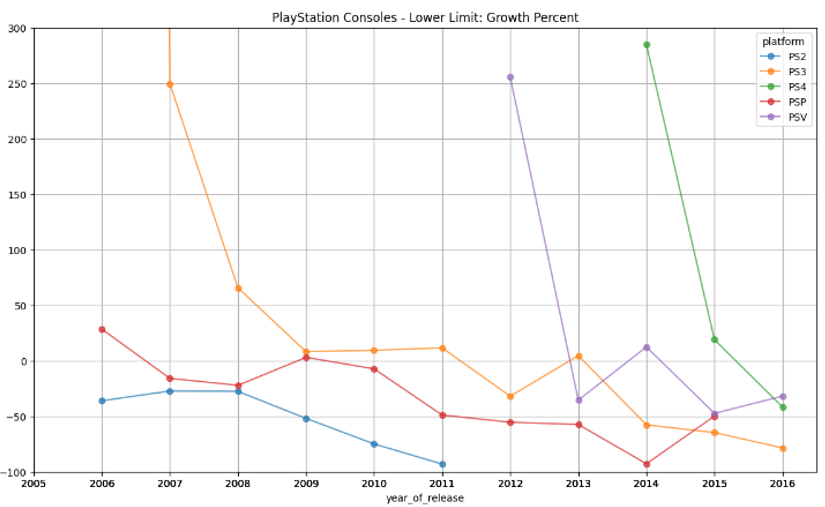 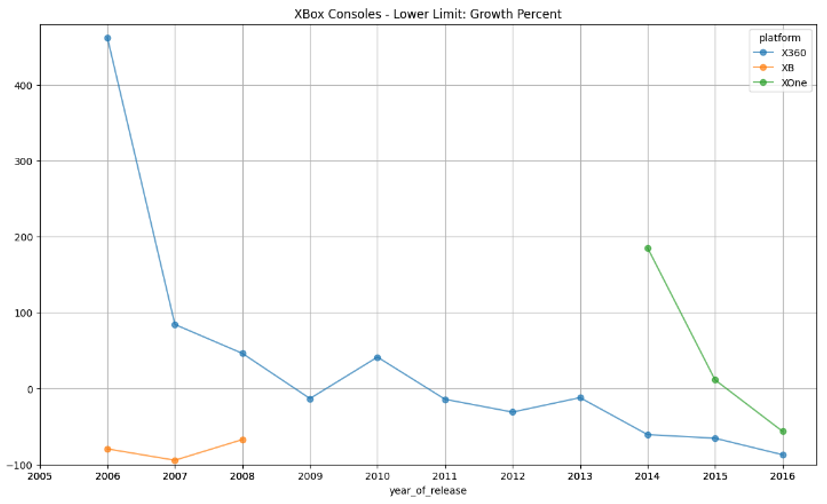

**Commonalities**
- In general, growth rate declines rapidly after the the first year a console is released.
- The top grossing consoles in this decade are better represented and shows the majority of their lifecycle
- The middle grossing console have not completed their life cycle or is showing the end of their lifecycles
    - PC is the exception which has had the longest and most consistent stream of revenue
- The lower grossing consoles are either at the beginning or end or their lifecycle
- **Overall:** Growth rate is not a huge factor on which consoles brought in the most revenue in a certain decade; this really depends on what years you are observing.

**Consoles:**
- **Wii + WiiU:** The growth rate for the Wii had begun it's decline in 2010 and stayed relatively consistent from 2011 - 2014; then, began another decline in 2015. The WiiU was released in 2013 with it's highest sales and consistently dropped by about 20 - 30% each year after that. Interestingly, there is a slight uptick in growth for the Wii in 2014, when growth had consistently moved downward. I would conclude that the release of the WiiU in 2013 had reminded consumers of the original console causing this slight uptick in growth.
- **DS + 3DS:** The DS saw consistent drop of about 10-20% in growth from 2007-2010; a sharp drop of roughly 40% from 2010 to 2011 with a 10% increase in growth from 2011 to 2012 and finally a drop of about 30% in 2013 before seeing no growth in 2014. The 3DS came out in 2011 with it's peak growth rate, dropping over 20,000% in 2012, growth of ~30% in 2013, decrease of ~30% in 2014, and a steady drop of ~15% in 2015 and 2016. Like the Wii and WiiU, the DS experienced an increase the year after the 3DS was released after a consistent decrease in growth. Similarly to the Wii and WiiU consumers may have been reminded of the original console after a newer version was released
- **PlayStation:** There are similarity's with the PlayStations trend as there were for the prviously mentioned consoles, but PlayStation has more consoles.
    - PS3 comes out in 2006, PS2 sees an increase in growth in 2007 - 2008 (similar to previously metioned consoles) - PS2 is not seen in the market in 2012
    - PS3 comes out in 2006, PSP sees a decrease in growth from 2007 - 2008 with an incerase in 2009 (NOT similar to previously mentioned consoles) - PSP not seen in the market in 2016
    - PSV come out in 2012, PS3 sees an increase in growth in 2013 (similar to previously mentioned consoles) - PS3 still seen in the market in 2016, but has been decreasing since 2014
    - PSV comes out in 2012, PSP sees a slight decrease in 2013 (NOT similar to previously mentioned consoles) - PSP decreases about 20% by 2014 with a 20% increase in 2015 before going off the market in 2016
    - PS4 comes out in 2014, PSV increases growth that year, but decreases growth the following year in 2015 (NOT similar to previous consoles) - PSV slightly increases in 2016 and is still in market
    - PS4 comes out in 2014, PS3 decreases growth the following year (2015) (not similar to previous consoles) - PS3 is declining, but still on the market in 2016
    - PS4 comes out in 2014, PSP see an increase in 2015 (similar to previous consoles) - PSP is not in market in 2016
    - **Overall:** PlayStation follows the trend of other previously mentioned consoles (Wii, WiiU, DS, 3DS); seeing an uptick in growth the year after a new console was released. However, this trend only seems to follow with one other console at a time.
        - PS3 came to market, the PS2 increased growth the following year
        - PSV came to market, the PS3 increased growth the following year
        - PS4 came to market, the PSP increased growth the following year
- **XBox:** The Xbox trend is different, the XB increases growth 2 years after the release of the X360, then, the XB goes off the market (similar to the PSP when the PSV came to market)
        - X360 come out in 2006, the XB decreases in 2007, increases in 2008 and is no longer in market in 2009
        - XOne comes out in 2014, the X360 decrease in 2015 and 2016
        - **Overall:** The increase is delayed for the XB when the X360 comes out and the XB leaves the market soon after similar to the PSP when the PSV came out. In 2007, there wer a multitude of other consoles on the market which possibly changed the trend for the XB while quickly taking it off the market. Similarly, in 2015, the market was flooded with other popular, possibly more preferred and/or cheaper consoles that consumers did not have the same reminder. Also, the X360 was on the market a lot longer without a new console, possibly leading to upgraded on the XOne that made the X360 forgettable.

**Overall:**
- Growth rate declines rapidly the year after a console is released
- Most console manufacturers that release a new console will see an increase in growth and sales for the previous console the year after the new console is released. This may be possible because consumers are reminded of the older console. This was the case for the Wii + WiiU, DS + 3DS, PlayStation Consoles with 1 other PlayStation Console: PS3 + PS2, PSV + PS3, PS4 + PSP. However, this trend did not continue with the Xbox. The Xbox consoles differed in that we saw a decrease in sales the year after a new Xbox console was release; a possible reason for this is due to the market being flooded with consoles from other manufacturers that were preferred and/or cheaper. Another possibility for the difference in trend for the Xbox manufacturers could be that the X360 was on the market for a longer period of time without a new console, leading to other consoles having superior upgrades.
- 2 consoles from different times that showed a similar trend was the XB and the PSP - the XB increases sales 2 years after the release of the X360 then drops out of the market while the PSP increases 3 years after the release of the PSV then drops out of the market

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

## 3.5 Sales Distribution Analysis

Let's examine the distribution of sales across platforms:

,platform,total_sales
0,Wii,82.54
1,NES,40.24
2,Wii,35.52
3,Wii,32.77
4,GB,31.38
...,...,...
16710,PS3,0.01
16711,X360,0.01
16712,PSV,0.01
16713,GBA,0.01


<AxesSubplot:title={'center':'total_sales'}, xlabel='platform'>

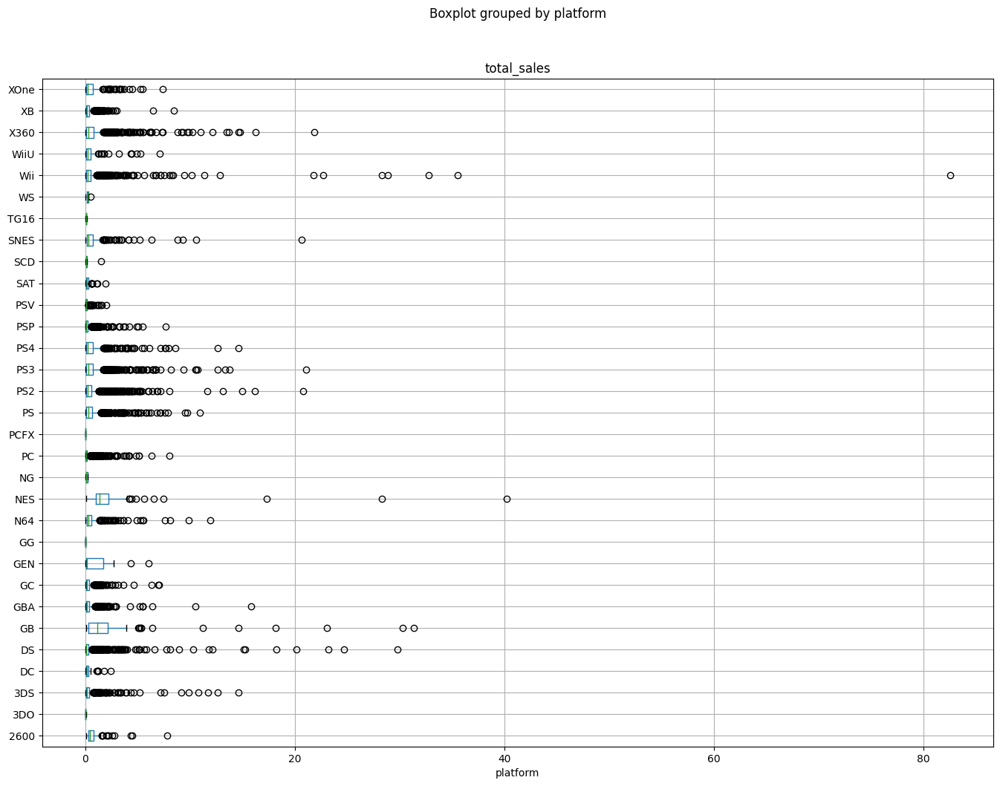

In [196]:
# Create box plot of sales by platform
sale_platform_df = games_3[['platform','total_sales']].dropna()
display(sale_platform_df)


sale_platform_df.boxplot(vert=False, by = 'platform',column = 'total_sales',figsize=(16,12))

In [197]:
sale_platform_df.describe()

,total_sales
count,16711.000000
mean,0.533349
std,1.548370
min,0.000000
25%,0.060000
50%,0.170000
75%,0.470000
max,82.540000


In [198]:
# Calculate detailed statistics for each platform

mean_sales = sale_platform_df.groupby('platform')['total_sales'].mean()

std_sales = sale_platform_df.groupby('platform')['total_sales'].std()

# Higher # = Higher Volatility
cv_sales = (std_sales/mean_sales * 100).round(2)

var_sales = sale_platform_df.groupby('platform')['total_sales'].var()

mode_sales = sale_platform_df.groupby('platform')['total_sales'].apply(mode)

min_sales = sale_platform_df.groupby('platform')['total_sales'].min()

q1_sales = sale_platform_df.groupby('platform')['total_sales'].quantile(0.25)

median_sales = sale_platform_df.groupby('platform')['total_sales'].median()

q3_sales = sale_platform_df.groupby('platform')['total_sales'].quantile(0.75)

max_sales = sale_platform_df.groupby('platform')['total_sales'].max()

iqr_sales = q3_sales-q1_sales

count = sale_platform_df.groupby('platform')['total_sales'].count()

unique = sale_platform_df.groupby('platform')['total_sales'].nunique()



# Add statistics to one DF

platform_ts_df = sale_platform_df.groupby('platform')['total_sales'].sum().reset_index()
display(platform_ts_df)

platform_ts_df  = platform_ts_df.merge(mean_sales.rename('mean_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(std_sales.rename('std_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(cv_sales.rename('cv_%_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(var_sales.rename('var_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(mode_sales.rename('mode_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(min_sales.rename('min_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(q1_sales.rename('q1_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(median_sales.rename('median_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(q3_sales.rename('q3_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(max_sales.rename('max_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(iqr_sales.rename('iqr_sales'),on='platform')
platform_ts_df  = platform_ts_df.merge(count.rename('count'),on='platform')
platform_ts_df  = platform_ts_df.merge(unique.rename('unique'),on='platform')

display(platform_ts_df)


,platform,total_sales
0,2600,96.98
1,3DO,0.10
2,3DS,259.00
3,DC,15.95
4,DS,806.12
5,GB,255.46
6,GBA,317.85
7,GC,198.93
8,GEN,28.35
9,GG,0.04


,platform,total_sales,mean_sales,std_sales,cv_%_sales,var_sales,mode_sales,min_sales,q1_sales,median_sales,q3_sales,max_sales,iqr_sales,count,unique
0,2600,96.98,0.729173,0.917799,125.87,0.842355,0.34,0.07,0.3000,0.460,0.7800,7.81,0.4800,133,79
1,3DO,0.10,0.033333,0.023094,69.28,0.000533,0.02,0.02,0.0200,0.020,0.0400,0.06,0.0200,3,2
2,3DS,259.00,0.498077,1.430876,287.28,2.047406,0.03,0.01,0.0500,0.120,0.3300,14.60,0.2800,520,153
3,DC,15.95,0.306731,0.468660,152.79,0.219642,0.06,0.02,0.0775,0.135,0.2975,2.41,0.2200,52,34
4,DS,806.12,0.374765,1.426451,380.63,2.034764,0.02,0.01,0.0500,0.110,0.2700,29.80,0.2200,2151,277
5,GB,255.46,2.606735,5.365478,205.83,28.788352,0.07,0.06,0.3025,1.165,2.1650,31.38,1.8625,98,81
6,GBA,317.85,0.386679,0.896897,231.95,0.804423,0.03,0.01,0.0525,0.160,0.3900,15.84,0.3375,822,160
7,GC,198.93,0.357788,0.686346,191.83,0.471071,0.05,0.01,0.0600,0.150,0.3525,7.06,0.2925,556,130
8,GEN,28.35,1.050000,1.490041,141.91,2.220223,0.07,0.03,0.0700,0.150,1.7050,6.02,1.6350,27,22
9,GG,0.04,0.040000,NaN,NaN,NaN,0.04,0.04,0.0400,0.040,0.0400,0.04,0.0000,1,1


## 3.6 Review Score Impact Analysis

Select a popular platform and analyze how reviews affect sales: X360

In [199]:
# Choose a popular platform based on your previous analysis

# Single out the X360 data
x360 = games_3[games_3['platform'] == 'X360']
display(x360)

# Separate the needed columns, 
x360 = x360[['critic_score','user_score','total_sales']]
display(x360)



,name,platform,year_of_release,genre,na_sales,eu_sales,jp_sales,other_sales,critic_score,user_score,rating,total_sales,critic_score_group,user_score_group,total_sales_group,era,esrb_era
14,Kinect Adventures!,X360,2010.0,Misc,15.00,4.89,0.24,1.69,61.0,63.0,E,21.82,low,low,10 million +,2010's,All Available
23,Grand Theft Auto V,X360,2013.0,Action,9.66,5.14,0.06,1.41,97.0,81.0,M,16.27,very high,high,10 million +,2010's,All Available
29,Call of Duty: Modern Warfare 3,X360,2011.0,Shooter,9.04,4.24,0.13,1.32,88.0,34.0,M,14.73,very high,low,10 million +,2010's,All Available
32,Call of Duty: Black Ops,X360,2010.0,Shooter,9.70,3.68,0.11,1.13,87.0,63.0,M,14.62,very high,low,10 million +,2010's,All Available
35,Call of Duty: Black Ops II,X360,2012.0,Shooter,8.25,4.24,0.07,1.12,83.0,48.0,M,13.68,high,low,10 million +,2010's,All Available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16613,Dragon Ball Z for Kinect,X360,2012.0,Fighting,0.01,0.00,0.00,0.00,49.0,21.0,T,0.01,low,low,"< 50,000",2010's,All Available
16622,World Snooker Championship 2007,X360,2007.0,Sports,0.00,0.01,0.00,0.00,NaN,NaN,E,0.01,NaN,NaN,"< 50,000",2000's,All Available
16647,Metal Gear Solid HD Edition,X360,2011.0,Action,0.00,0.00,0.01,0.00,NaN,NaN,M,0.01,NaN,NaN,"< 50,000",2010's,All Available
16654,Ben 10 Omniverse 2,X360,2013.0,Action,0.00,0.01,0.00,0.00,NaN,51.0,E10+,0.01,NaN,low,"< 50,000",2010's,All Available


,critic_score,user_score,total_sales
14,61.0,63.0,21.82
23,97.0,81.0,16.27
29,88.0,34.0,14.73
32,87.0,63.0,14.62
35,83.0,48.0,13.68
...,...,...,...
16613,49.0,21.0,0.01
16622,NaN,NaN,0.01
16647,NaN,NaN,0.01
16654,NaN,51.0,0.01


<AxesSubplot:title={'center':'Critic Score Impact on X360 Sales'}, xlabel='critic_score', ylabel='total_sales'>

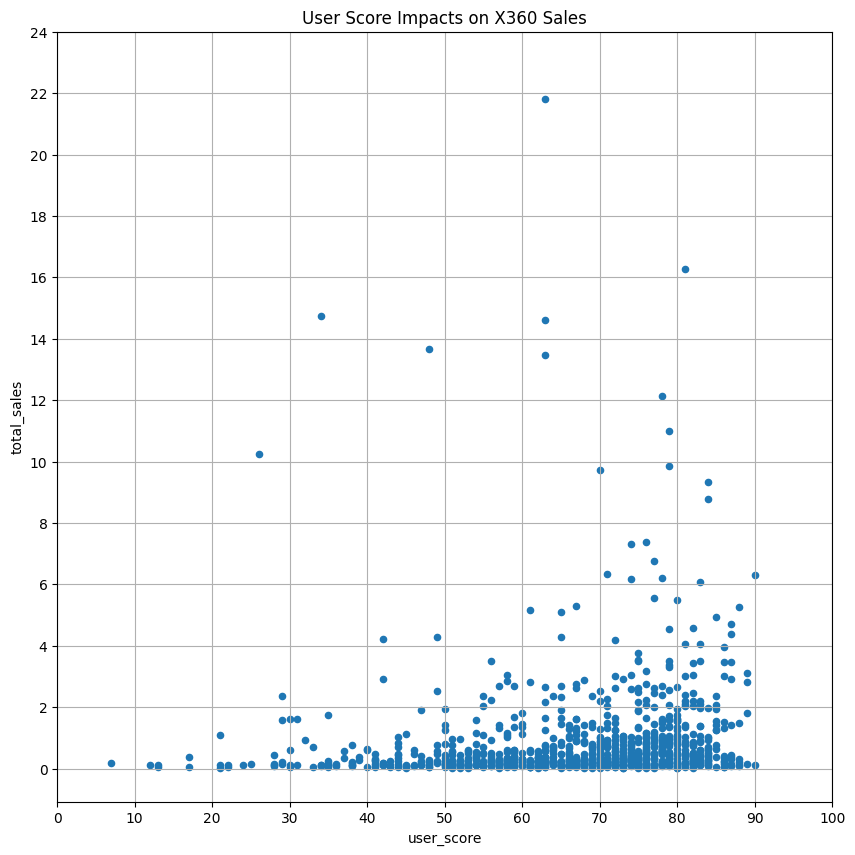

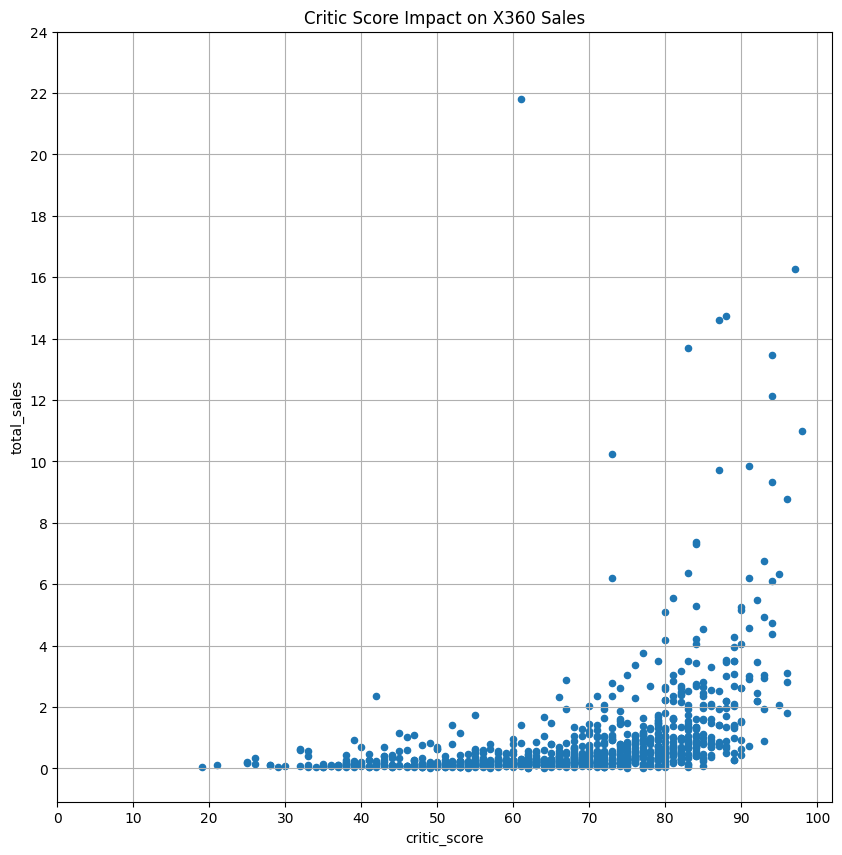

In [200]:
# Create scatter plots for both critic and user scores

# user_score
x360.plot(x='user_score',y='total_sales',kind='scatter', title = "User Score Impacts on X360 Sales", figsize=(10,10),grid=True, 
          yticks=[0,2,4,6,8,10,12,14,16,18,20,22,24],
          xticks=[0,10,20,30,40,50,60,70,80,90,100])

# critic_score
x360.plot(x='critic_score',y='total_sales',kind='scatter', title = "Critic Score Impact on X360 Sales", figsize = (10,10),grid=True, 
          yticks=[0,2,4,6,8,10,12,14,16,18,20,22,24],
          xticks=[0,10,20,30,40,50,60,70,80,90,100])

In [201]:
# Critic Scores
display(x360['critic_score'].describe())



# User Scores
display(x360['user_score'].describe())



# Total_sales
display(x360['total_sales'].describe())



# Calculate correlations
display("Critic Score Corrleation to TotalSales:", x360['critic_score'].corr(x360['total_sales']))
display("User Score Correlation to Total Sales:", x360['user_score'].corr(x360['total_sales']))




count    916.000000
mean      68.616812
std       15.016585
min       19.000000
25%       59.000000
50%       71.000000
75%       80.000000
max       98.000000
Name: critic_score, dtype: float64

count    966.000000
mean      66.835404
std       14.413322
min        7.000000
25%       59.000000
50%       70.000000
75%       78.000000
max       90.000000
Name: user_score, dtype: float64

count    1261.000000
mean        0.770349
std         1.616173
min         0.010000
25%         0.110000
50%         0.280000
75%         0.760000
max        21.820000
Name: total_sales, dtype: float64

'Critic Score Corrleation to TotalSales:'

0.3937358653072584

'User Score Correlation to Total Sales:'

0.11445882978454192

**Side-by-Side Comparison of Data:**
|**Stats**|**Critic Score**|**User Score**|**Total Sales**| 
|:--------|:-------------:|:-------------:|:-----------------:|
|count:   |  916.000000   |  966.000000   |     1261.000000   | 
|mean:    |  68.616812    |   66.835404   |        0.770349   |
|std:     |   15.016585   |   14.413322   |        1.616173   |
|min:     |   19.000000   |    7.000000   |        0.010000   |
|25%:     |   59.000000   |   59.000000   |        0.110000   |
|50%:     |   71.000000   |   70.000000   |        0.280000   |
|75%:     |   80.000000   |   78.000000   |        0.760000   |
|max:     |   98.000000   |   90.000000   |       21.820000   |



**Critic Score Corrleation to TotalSales:**
0.3937358653072584


**IQR of Critic Score:**
21


**User Score Correlation to Total Sales:**
0.11445882978454192


**IQR of User Score:**
19



**Summary of the user_score data**

The data is concentrated toward the higher values. There is a weak positive correlation for user scores to total sales. So, the user score tends to increase as sales increase, but most of the scores are clustered between 40 - 90 with total sales under 2 million for the Xbox console. However, there is another cluster of scores between 50 - 90 with games sales between 2 - 4 million in total sales for the Xbox console, but this data is much more sparse and still has elements of randomness outside this cluster. Additionally, games above 4 million tend to score between 60 - 90. As you can see from the scatterplot and with the range of clusters getting smaller as sales go up, there is a weak, but positive correlation; as sales go up, more games receive a higher user score. If the correlation was strong, there would not be as much overlap with the score ranges. There is still a significant and greater amount of user scores that reach between 60 - 90 that have total sales under 2 million. For this reason, the correlation is not strong. 


**Summary of critic_score data**

The data is concentrated toward the higher values, but the values tend to be more specific and less random than the user score data. There is a moderate positive correlation for critic socres to total sales. The critic scores tend to incease as sales increase. Most scores are between 40 - 90 for games under 2 million in total sales. Sales between 2-4 million are clustered between critic scores of 70 - 95. Notice that this range extends past 90, unlike the games under 2 million. This shows us that there are more games in the 2-4 million dollar range that receive a score between 90 - 95 than games that produce under 2 million in sales. Games that produce 4-6 million in sales tend to receive a critic score between 80 - 95. The 6 - 8 million dollar range is the same (80-95), but the data is much more sparse. Games that produce 8 million + in sales typically receive a critic score between 85 - 98, but again, the data is sparse. You can see the data is much more specific, but the ranges still overlap with the majority of games producing 2 million and under sales still receiving high scores between 70 - 90


**Overall:**

Critics are more likely to give consistent scores; we can infer they may have stricter guidelines to follow when scoring a game than users do.

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

## 3.7 Cross-Platform Comparison

Compare sales performance of games across different platforms:

In [202]:
# Find games released on multiple platforms
platform_name = games_3[['name','platform','total_sales']].reset_index()

# Make all names lowercase
platform_name.iloc[0:16711,1] = platform_name['name'].str.lower()


# Search for duplicates
duplicated_names = platform_name[platform_name['name'].duplicated()]
duplicated_names

# put the duplicated names in a variable
duplicated_names1 = duplicated_names['name']

# Get ALL the duplicated names, not excluding the first duplicate
duplicated_names = platform_name[platform_name['name'].isin(duplicated_names1)]
duplicated_names

# sort the names
duplicated_names = duplicated_names.sort_values(by='name')
duplicated_names.reset_index()

display(duplicated_names)


,index,name,platform,total_sales
3861,3862,frozen: olaf's quest,DS,0.51
3357,3358,frozen: olaf's quest,3DS,0.59
3119,3120,007: quantum of solace,Wii,0.65
1784,1785,007: quantum of solace,PS3,1.15
9505,9507,007: quantum of solace,DS,0.13
...,...,...,...,...
668,669,zumba fitness,X360,2.37
13170,13172,zumba fitness core,X360,0.05
12437,12439,zumba fitness core,Wii,0.07
7135,7137,zumba fitness: world party,Wii,0.23


In [203]:
# Look at how many platforms each game is on 
platform_counts = duplicated_names.groupby('name')['platform'].nunique()
display(platform_counts)

# Look at how many games are on each platform 
game_counts = duplicated_names.groupby('platform')['name'].nunique()
display(game_counts)

# Filter out games that are on less than 7 platforms
plus_7 = platform_counts[platform_counts >= 7]
display(plus_7)

name
 frozen: olaf's quest               2
007: quantum of solace              6
007: the world is not enough        2
11eyes: crossover                   2
18 wheeler: american pro trucker    2
                                   ..
zoo tycoon (2013)                   2
zoocube                             2
zumba fitness                       3
zumba fitness core                  2
zumba fitness: world party          2
Name: platform, Length: 2806, dtype: int64

platform
2600      17
3DS      145
DC         9
DS       546
GB        19
GBA      230
GC       427
GEN        8
N64       98
NES       27
NG         3
PC       511
PS       203
PS2     1047
PS3     1054
PS4      321
PSP      395
PSV      205
SAT       37
SNES      34
WS         2
Wii      687
WiiU     100
X360    1014
XB       594
XOne     224
Name: name, dtype: int64

name
angry birds star wars                             8
cars                                              8
fifa 12                                           7
fifa 14                                           9
fifa 15                                           8
fifa soccer 08                                    7
fifa soccer 10                                    7
fifa soccer 11                                    7
fifa soccer 13                                    8
harry potter and the half-blood prince            7
harry potter and the order of the phoenix         7
harry potter and the sorcerer's stone             7
lego batman 2: dc super heroes                    7
lego batman 3: beyond gotham                      8
lego batman: the videogame                        7
lego harry potter: years 5-7                      8
lego indiana jones: the original adventures       7
lego jurassic world                               8
lego marvel super heroes                          9
lego ma

In [204]:
# Filter the dataframe duplicated_names to reflect only the games on 7 or more platforms
plus_7_index = plus_7.index.unique()
display(plus_7_index)


plus_platforms = duplicated_names[duplicated_names['name'].isin(['angry birds star wars', 'cars', 'fifa 12', 'fifa 14', 'fifa 15',
       'fifa soccer 08', 'fifa soccer 10', 'fifa soccer 11', 'fifa soccer 13',
       'harry potter and the half-blood prince',
       'harry potter and the order of the phoenix',
       "harry potter and the sorcerer's stone",
       'lego batman 2: dc super heroes', 'lego batman 3: beyond gotham',
       'lego batman: the videogame', 'lego harry potter: years 5-7',
       'lego indiana jones: the original adventures', 'lego jurassic world',
       'lego marvel super heroes', "lego marvel's avengers",
       'lego pirates of the caribbean: the video game',
       'lego star wars ii: the original trilogy',
       'lego star wars iii: the clone wars',
       'lego star wars: the force awakens', 'lego the hobbit',
       'lego the lord of the rings', 'madden nfl 06', 'madden nfl 07',
       'madden nfl 08', 'major league baseball 2k11', 'monopoly', 'nba jam',
       'need for speed carbon', 'need for speed: most wanted',
       'need for speed: prostreet', 'need for speed: undercover',
       'pro evolution soccer 2012', 'ratatouille', 'skylanders swap force',
       'skylanders: superchargers', 'skylanders: trap team', 'spider-man 3',
       'star wars the clone wars: republic heroes', "surf's up", 'terraria',
       'the amazing spider-man 2 (2014)', 'the lego movie videogame',
       'the sims 2', 'tomb raider: legend', 'wall-e'])]
plus_platforms

Index(['angry birds star wars', 'cars', 'fifa 12', 'fifa 14', 'fifa 15',
       'fifa soccer 08', 'fifa soccer 10', 'fifa soccer 11', 'fifa soccer 13',
       'harry potter and the half-blood prince',
       'harry potter and the order of the phoenix',
       'harry potter and the sorcerer's stone',
       'lego batman 2: dc super heroes', 'lego batman 3: beyond gotham',
       'lego batman: the videogame', 'lego harry potter: years 5-7',
       'lego indiana jones: the original adventures', 'lego jurassic world',
       'lego marvel super heroes', 'lego marvel's avengers',
       'lego pirates of the caribbean: the video game',
       'lego star wars ii: the original trilogy',
       'lego star wars iii: the clone wars',
       'lego star wars: the force awakens', 'lego the hobbit',
       'lego the lord of the rings', 'madden nfl 06', 'madden nfl 07',
       'madden nfl 08', 'major league baseball 2k11', 'monopoly', 'nba jam',
       'need for speed carbon', 'need for speed: most wan

,index,name,platform,total_sales
10753,10755,angry birds star wars,WiiU,0.10
6441,6443,angry birds star wars,Wii,0.26
8605,8607,angry birds star wars,XOne,0.17
6215,6217,angry birds star wars,X360,0.28
11337,11339,angry birds star wars,PSV,0.08
...,...,...,...,...
2712,2713,wall-e,PS2,0.75
3121,3122,wall-e,PSP,0.65
4805,4807,wall-e,PS3,0.41
15957,15960,wall-e,PC,0.01


In [205]:
# Compare sales across platforms for these games

# Make a pivot_table for duplicated_names - ALL duplicated games
duplicated_names_pivot = duplicated_names.pivot_table(index='platform',columns='name',values='total_sales')
duplicated_names_pivot



# Make a pivot table for games that are across 7 or more platforms
plus_platforms_pivot = plus_platforms.pivot_table(index='platform',columns='name',values='total_sales')
display(plus_platforms_pivot)



name,angry birds star wars,cars,fifa 12,fifa 14,fifa 15,fifa soccer 08,fifa soccer 10,fifa soccer 11,fifa soccer 13,harry potter and the half-blood prince,...,skylanders: trap team,spider-man 3,star wars the clone wars: republic heroes,surf's up,terraria,the amazing spider-man 2 (2014),the lego movie videogame,the sims 2,tomb raider: legend,wall-e
platform,,,,,,,,,,,,,,,,,,,,,
3DS,0.33,NaN,0.39,0.23,0.46,NaN,NaN,NaN,0.29,NaN,...,0.28,NaN,NaN,NaN,0.09,0.07,0.69,NaN,NaN,NaN
DS,NaN,0.96,NaN,NaN,NaN,0.86,0.58,0.70,NaN,0.61,...,NaN,0.47,0.40,0.28,NaN,NaN,NaN,0.93,0.07,1.45
GB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GBA,NaN,1.13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.39,NaN,NaN
GC,NaN,0.94,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.01,NaN,NaN,NaN,0.34,0.08,NaN
GEN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
N64,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PC,NaN,NaN,0.47,0.40,0.29,0.01,0.05,0.18,0.40,0.03,...,NaN,0.02,0.02,NaN,0.14,0.01,0.06,0.30,0.01,0.01
PS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:xlabel='platform'>

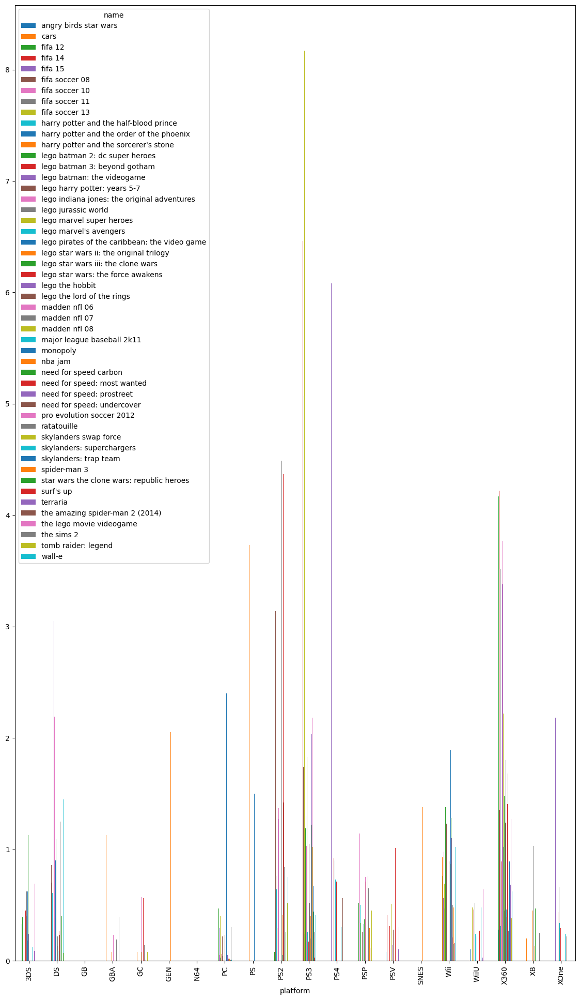

In [206]:
# Your code here to analyze and visualize cross-platform performance
plus_platforms_pivot.plot(kind='bar', figsize=(14,24))

In [207]:
# Your code here to analyze and visualize cross-platform performance

# Further filter the data to (the above chart is nearly unreadable)
# star wars games
star_wars = plus_platforms[plus_platforms['name'].str.contains('star wars')]

# sports games - madden, major league baseball, nba, pro evolution soccer
sports = plus_platforms[plus_platforms['name'].str.contains(('nba|major|pro ev|madden'))]

# Fifa games
fifa = plus_platforms[plus_platforms['name'].str.contains(('fifa'))]

# harry potter
hp = plus_platforms[plus_platforms['name'].str.contains('harry potter')]

# Need for Speed
nfs = plus_platforms[plus_platforms['name'].str.contains('need for speed')]

# lego games
lego = plus_platforms[plus_platforms['name'].str.contains('lego ind|lego jur|lego pir|lego the hob|lego the lord|lego movie vid')]

lego1 = plus_platforms[plus_platforms['name'].str.contains('lego bat|lego marv')]

# Action games
action =  plus_platforms[plus_platforms['name'].str.contains('skylander|spider|tomb|terraria')]

# disney/kids/other games - cars, monopoly, ratatouille, surf's up, sims, wall-e
other = plus_platforms[plus_platforms['name'].str.contains('cars|monopoly|ratat|surf|sim|wall')]


In [208]:
# Make pivot_tables for each new filtered data we just created

star_wars_pivot = star_wars.pivot_table(index='platform',columns='name',values='total_sales')
sports_pivot = sports.pivot_table(index='platform',columns='name',values='total_sales')
fifa_pivot = fifa.pivot_table(index='platform',columns='name',values='total_sales')
hp_pivot = hp.pivot_table(index='platform',columns='name',values='total_sales')
nfs_pivot = nfs.pivot_table(index='platform',columns='name',values='total_sales')
lego_pivot = lego.pivot_table(index='platform',columns='name',values='total_sales')
lego1_pivot = lego1.pivot_table(index='platform',columns='name',values='total_sales')
action_pivot = action.pivot_table(index='platform',columns='name',values='total_sales')
other_pivot = other.pivot_table(index='platform',columns='name',values='total_sales')

<AxesSubplot:title={'center':'Star Wars Game Sales on the Platform it was Produced'}, xlabel='platform'>

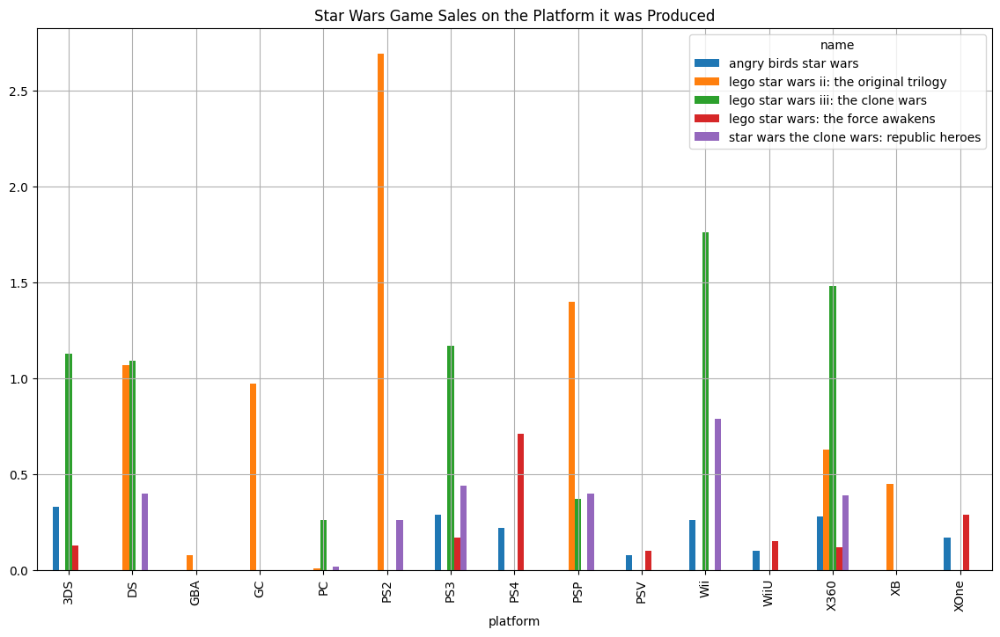

In [209]:
# Make bar charts for each new filtered pivot table

# First Star Wars
star_wars_pivot.plot(kind='bar', figsize=(14,8), title= "Star Wars Game Sales on the Platform it was Produced",grid=True)


**Individual Assessment:**

- **Angry Birds Star Wars:**

    - Produced on:
        - 3DS, PS3, PS4, PSV, Wii, WiiU, X360, XOne
    - Top Sales:
        - 3DS (~0.32)
    - Middle Sales:
        - PS4 (~0.22)
        - Wii (~0.26)
    - Low Sales:
        - PSV (~0.08)
    - Order of Sales:
        - PSV, WiiU, XOne, PS4, Wii, X360, PS3, 3DS 

- **LEGO Star Wars II: the Original Trilogy:**

    - Produced on:
        - DS, GBA, GC, PC, PS2, PSP, X360, XB
    - Top Sales:
        - PS2 (~2.7)
    - Middle Sales:
        - X360 (~0.63)
        - GC (~0.9)
    - Low Sales:
        - PC (~0.01)
    - Order of Sales:
        - PC, GBA, XB, X360, GC, DS, PSP, PS2
 
-  **LEGO Star Wars III: the Clone Wars:**
 
    - Produced on:
        - 3DS, DS, PC, PS3, PSP, Wii, X360
    - Top Sales:
        - Wii (~1.75)
    - Middle Sales:
        - 3DS (~1.2)
    - Low Sales:
        - PC (~0.01)
    - Order of Sales:
        - PC, PSP, DS, 3DS, PS3, X360, Wii

- **LEGO Star Wars: the Force Awakens:**

    - Produced on:
        - 3DS, PS3, PS4, PSV, WiiU, X360, XOne
    -  Top Sales:
        - PS4 (~0.7)
    - Middle Sales:
        - WiiU (~0.15)
    - Low Sales:
        - PSV (~0.1)
    - Order of Sales:
        - PSV, X360, 3DS, WiiU, PS3, XOne, PS4

- **Star Wars the Clone Wars: Republic Heroes**

    - Produced on:
        - DS, PC, PS2, PS3, PSP, Wii, X360,
    -  Top Sales:
        - Wii (~0.8)
    - Middle Sales:
        - DS/PSP (~0.4)
    - Low Sales:
        - PC (~0.02)
    - Order of Sales:
        - PC, PS2, X360, DS/PSP, PS3, Wii

**Overall:**
- PC pulled in the lowest sales in 3/5 games
- PSV pulled in the lowest sales in 2/5 games
- Wii pulled in the highest sales in 2/5 games
- 3DS, PS2, & PS4 each pulled the highest sales in 1/5 games (each)
- Platforms that produced all 5 games: (1)
    - X360
- Platforms that produced 1 game out of the 5: (3)
    - GBA
    - GC
    - XB
- Platforms that produced 2 games out of the 5: (5)
    - XOne
    - WiiU
    - PSV
    - PS4
    - PS2
- Platforms that produced 3 games out of the 5: (3)
    - Wii
    - PSP
    - PC
- Platforms that produced 4 games out of the 5: (1)
    - PS3




**Conclusion**
- PC and PSV consoles produced the lowest sales: 3/3 PC and 2/2 PSV games.
- The Wii produced the highest sales: 2/3 games. The 3rd Wii game produced the 4th highest sales at ~0.26 compared to the highest (3DS) at ~0.33.
- PS3 produced the 2nd highest sales in 2/4 games it produced. The other 2/4 games were ranked the 3rd highest.
- The DS produced the 3rd highest sales in 2/3 games it produced (it was tied in sales with the PSP for one of these games). 

Given this data, we could conclude that the PC and PSV produce the lowest sales and the PS3 & Wii produce the highest sales of these consoles for star wars games.
Given this data, we could conclude that the X360 produces the most star wars games.

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

<AxesSubplot:title={'center':'Fifa Game Sales on the Platform it was Produced'}, xlabel='platform'>

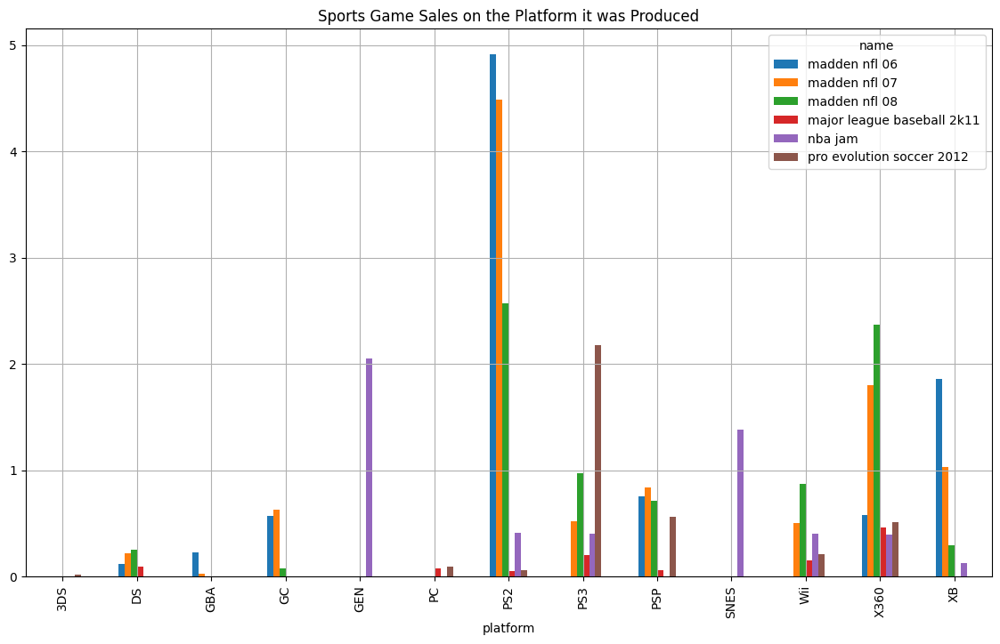

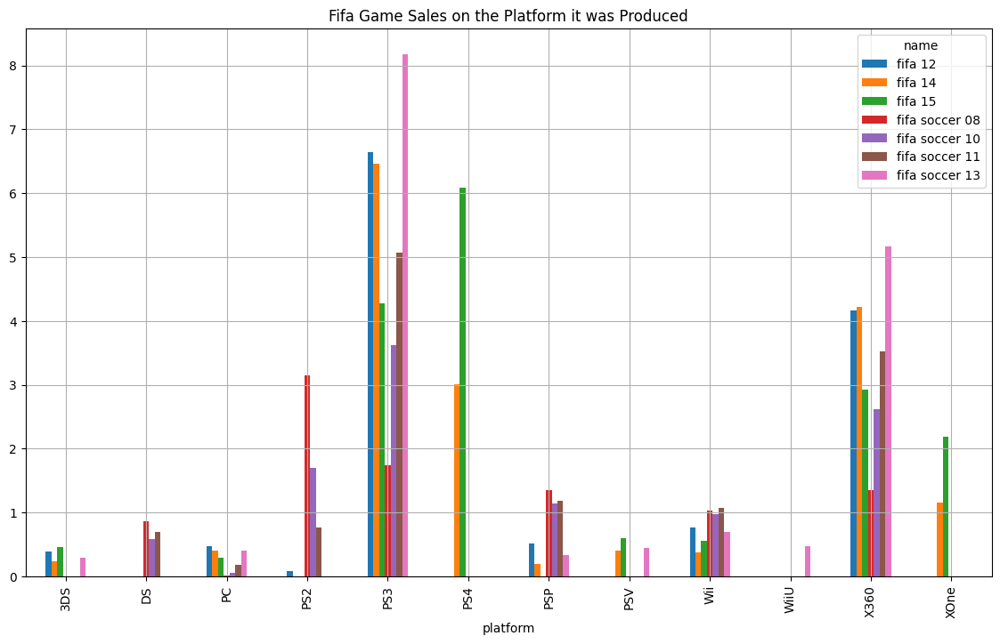

In [210]:
# Look at Sports games
sports_pivot.plot(kind='bar', figsize=(14,8), title= "Sports Game Sales on the Platform it was Produced",grid=True)
fifa_pivot.plot(kind='bar', figsize=(14,8), title= "Fifa Game Sales on the Platform it was Produced", grid= True)


**Individual Assessment:**



- **Madden NFL 06:**
    - Produced on:
        - DS, GBA, GC, PS2, PSP, X360, XB
    - Top Sales:
        - PS2 (~4.2)
    - Middle Sales:
        - X360 (~0.58)
    - Low Sales:
        - DS (~0.12)
    - Order of Sales:
        - DS, GBA, GC, X360, PSP, XB, PS2


- **Madden NFL 07:**
    - Produced on:
        - DS, GBA, GC, PS2, PS3, PSP, Wii, X360, XB
    - Top Sales:
        - PS2 (~4.5)
    - Middle Sales:
        - GC (~0.6)
    - Low Sales:
        - GBA (~0.04)
    - Order of Sales:
        - GBA, DS, Wii, PS3, GC, PSP, XB, X360, PS2

- **Madden NFL 08:**
    - Produced on:
        - DS, GC, PS2, PS3, PSP, Wii, X360, XB
    - Top Sales:
        - PS2 (~2.6)
    - Middle Sales:
        - PSP (~0.7)
        - Wii (~0.88)
    - Low Sales:
        - GC (0.08)
    - Order of Sales:
        - GC, DS, XB, PSP, Wii, PS3, X360, PS2

- **Major League Baseball 2k11:**
    - Produced on:
        - DS, PC, PS2, PS3, PSP, Wii, X360
    - Top Sales:
        - X360 (~0.48)
    - Middle Sales:
        - DS (~0.09)
    - Low Sales:
        - PS2 (~0.05)
    - Order of Sales:
        - PS2, PSP, PC, DS, Wii, PS3, X360

- **NBA Jam:**
    - Produced on:
        - GEN, PS2, PS3, SNES, Wii, X360, XB
    - Top Sales:
        - GEN (~2.1)
    - Middle Sales:
        - Wii/PS3 (~0.4)
    - Low Sales:
        - XB (~1.3)
    - Order of Sales:
        - XB, X360, Wii/PS3, PS2, SNES, GEN

- **Pro Evolution Soccer 2012:**
    - Produced on:
        - 3DS, PC, PS2, PS3, PSP, Wii, X360
    - Top Sales:
        - PS3 (~2.2)
    - Middle Sales:
        - Wii (~0.22)
    - Low Sales:
        - 3DS (~0.03)
    - Order of Sales:
        - 3DS, PS2, PC, Wii, X360, PSP, PS3


- **FIFA 12:**
    - Produced on:
        - 3DS, PC, PS2, PS3, PSP, Wii, X360
    - Top Sales:
        - PS3 (~6.7)
    - Middle Sales:
        - PSP (~05)
    - Low Sales:
        - PS2(~0.08)
    - Order of Sales:
        - PS2, 3DS, PC, PSP, Wii, X360, PS3

- **FIFA 14:**
    - Produced on:
        - 3DS, PC, PS3, PS4, PSP, PSV, Wii, X360, XOne
    - Top Sales:
        - PS3 (~6.5)
    - Middle Sales:
        - PSV (~0.4)
    - Low Sales:
        - PSP (~0.2)
    - Order of Sales:
        - PSP, 3DS, Wii, PC, PSV, XOne, PS4, X360, PS3

- **FIFA 15:**
    - Produced on:
        - 3DS, PC, PS3, PS4, PSV, Wii, X360, XOne
    - Top Sales:
        - PS4 (~6.1)
    - Middle Sales:
        - PSV (~0.6)
        - XOne (~2.2)
    - Low Sales:
        - PC (~0.3)
    - Order of Sales:
        - PC, 3DS, Wii, PSV, XOne, X360, PS3, PS4

- **FIFA Soccer 08:**
    - Produced on:
        - DS, PC, PS2, PS3, PSP, Wii, X360
    - Top Sales:
        - PS2 (~3.2)
    - Middle Sales:
        - X360/PSP (~1.3)
    - Low Sales:
        - PC (~0.01)
    - Order of Sales:
        - PC, DS, Wii, PSP/X360, PS3, PS2

- **FIFA Soccer 10:**
    - Produced on:
        - DS, PC, PS2, PS3, PSP, Wii, X360
    - Top Sales:
        - PS3 (~3.6)
    - Middle Sales:
        - PSP (~1.1)
    - Low Sales:
        - PC (~0.05)
    - Order of Sales:
        - PC, DS, Wii, PSP, PS2, X360, PS3

- **FIFA Soccer 11:**
    - Produced on:
        - DS, PC, PS2, PS3, PSP, Wii, X360
    - Top Sales:
        - PS3 (~5.1)
    - Middle Sales:
        - Wii (~1.1)
    - Low Sales:
        - PC (~0.18)
    - Order of Sales:
        - PC, DS, PS2, Wii, PSP, X360, PS3

- **FIFA Soccer 13:**
    - Produced on:
        - 3DS, PC, PS3, PSP, PSV, Wii, WiiU, X360
    - Top Sales:
        - PS3 (~8.2)
    - Middle Sales:
        - PSV (~0.44)
        - WiiU (~0.48)
    - Low Sales:
        - 3DS(~0.28)
    - Order of Sales:
        - 3DS, PSP, PC, PSV, WiiU, Wii, X360, PS3


**Overall:**
- PC pulled in the lowest sales in 4/7 (57 %) FIFA games or 4/9 (44 %) Sports games
- PS2 pulled in the lowest sales in 2/10 (20 %) Sports games
- 3DS pulled in the lowest sales in 2/5 (40 %) Sports games
- DS pulled in the lowest sales in 1/3 (33 %) Madden games or 1/7 (14 %) Sports games
- GBA pulled in the lowest sales in 1/2 (50 %) Spoorts games (and Madden games)
- GC pulled in the lowest sales in 1/3 (33 %) Sports games (and Madden games)
- XB pulled in the lowest sales in 1/4 (25 %) Sports games

- PS2 pulled in the highest sales for 3/3 (100 %) Madden games and 4/10 (40 %) Sports games
- PS3 pulled in the highest sales for 5/7 FIFA (71 %) games and 6/12 (50 %) Sports games
- PS4 pulled in the highest sales in 1/7 (14 %) FiFa games and 1/2 (50 %) Sports games
- X360 pulled in the highest sales in 1/13 (8 %) Sports games
- GEN pulled in the highest sales in 1/1 (100 %) Sports games (NBA Jam)

- Platforms that produced all 13 games: (1)
    - X360
- Platforms that procuded 1/13 games: (2)
    - GEN
    - SNES
- Platforms that produced 2/13 games: (3)
    - PS4
    - XOne
    - GBA
- Platforms that produced 3/13 games: (2)
    - GC
    - PSV
- Platforms that produced 4/13 games: (1)
    - XB
- Platforms that produced 5/13 games: (1)
    - 3DS
- Platforms that produced 6/13 games: (1)
    - WiiU
- Platforms that produced 7/13 games: (1)
    - DS
- Platforms that produced 8/13 games: (0)
- Platforms that produced 9/13 games: (1)
    - PC
- Platforms that produced 10/13 games: (1)
    - PS2
- Platforms that produced 11/13 games: (1)
    - PSP
- Platforms that produced 12/13 games: (2)
    - PS3
    - Wii


**Conclusion:**
- PC consoles produced the lowest sales for FIFA games. 4/7 FIFA games received the lowest sales on the PC. Lowest for 4/9 PC Sports games.
- PC consoles produced the 3rd lowest sales for 4/9 Sports games and the 4th lowest sale in 1/9 PC Sports games.
- DS consoles produced the lowest sales in 1/3 Madden games and the 2nd lowest sales in the other 2 Madden games.
- DS consoles produced the lowest sales in 1/7 Sports games and the 2nd lowest sales in 5/7 Sports games, and the 4th lowest sales in 1/7 Sports games
- 3DS consoles produced the lowest sales in 1/4 FIFA games, 2nd lowest in 3/4 FIFA games (the 3DS only produced 4 FIFA games)
- 3DS consoles produced the lowest sales in 2/5 Sports games, 2nd lowest in 3/5 Sports games
- GBA consoles produced the lowest sales in 1/2 madden games, 2nd lowest in 1/2 maddent games (small sample size)


Given this data, we could conclude that Madden Games perform have performed the worst on the DS consoles and Sports games overall performed poorly on the DS. 
Given this data, we could conclude that FIFA games performed the worst on the 3DS consoles and Sports games overall performed poorly on the 3DS. 
The GBA console did not give enough game data to conclude overall low performance, but Madden games do not seem to perform well on the GBA. 
Given this data, we could conclude that Sports games perform moderately low on the PC console. 
Given this data, we could conclude that Sports games perform the best on PlayStation Consoles. 11/13 Sports games produced top sales on a PlayStation console. Overall, the PS3 performed the best out of the PlayStation Consoles.
    - Madden: PS2 performed top sales in 3/3 games
    - Other: PS3 performed top sales in 1/3 games
    - FIFA: PS3 performed top sales in 5/7 games; 2nd best sales in 2/7 games
    - FIFA: PS2 performed top sales in 1/7 games
    - FIFA: PS4 performed top sales in 1/7 games
Given this data, we could conclude that Sports games perform 2nd best on Xbox Consoles. 9/13 Sports games produced 2nd top sales on Xbox consoles. 
    - Madden: XB performed 2nd best sales in 1/3 games; X360 performed 2nd best in 2/3 games
    - FIFA: X360 performed 2nd best sales in 5/7 games




**Overall Performance:** 

Sports games tend to perform poorly on the DS and 3DS; consistently performing the lowest or second lowest in terms of sales. Additionally, sports games tend to perform moderately low on the PC. 

Sports games tend to perform the highest on PlayStation consoles, specifically the PS3 performed the highest sales in 5/13 games and the 2nd highest in 3/13 games; making PS3 games produce top scores in 61% of the games. Overall, the PlayStation consoles make up 11/13 (85 %) of the top scores and 4/13 (31 %) of the 2nd highest scores. 

Additionally Xbox consoles performed the 2nd highest in sales. Specifically, the X360 which produced the top scores in 1/13 games and the 2nd highest scores in 7/13 games. Overall, the Xbox consoles produced 1/13 (8 %) top sales and 8/13 (62 %) of the second highest sales. 

Overall, Sports games perform the highest with PlayStation and Xbox consoles and perform the lowest with 3DS and DS console while performing moderately low on the PC. 


**Madden Performanc:**

Madden games performed the worst on the DS and GBA consoles. 1/3 madden games performed the worst on the DS and 2/3 Madden games performed the 2nd worst in sales. The GBA data is low, only producing 2 sports games overall (in this subset). Out of these two games, 1/3 Madden games performed the worst on the GBA and 1/3 Madden Games performed the 2nd worst on the GBA. Therefore, both GBA sales for the Madden games produced low sales. 

Madden games performed the best on the PS2; 3/3 PS2 Madden games produced top sales. Additionally, Madden games performed 2nd best on the Xbox consoles; 1/3 games on the Xbox and 2/3 games on the X360.

Overall, Madden games perform the highest on the PS2 and perform the lowest on the DS and GBA. However, GBA games were no longer produced in 2008 and the PS2 games stopped production in 2011. Therefore, these Madden games were produced during the time the GBA sales were declining overall and represent numbers associated with a declining platform. 


**FIFA Performance:**

FIFA games performed the worst on the PC, 3DS and DS. 4/7 FIFA games produces the lowest sales on a PC. 1/7 FIFa games produced the lowest sales on a 3DS and 3/7 FIFA games produced the second lowest sales on a 3DS; 4/7 low sales for the 3DS. 3/7 FIFA games produced the second lowest sales on a DS. 

FIFA games performed the best on PlayStation Consoles. 7/7 FIFA games produced top sales on the PlayStation Consoles. 5/7 were attributed to the PS3, while 2/7  performed the 2nd highest sales for the PS3. 

FIFA games performed the 2nd highest sales on the X360. 5/7 FIFA games produced the second highest sales for the X360. 

Overall, FIFA games perform the highest on the PS3 and the second highest on the X360, but depending on the time period of a FIFA release, we could conclude that FIFA games will perform better on PlayStation then Xbox consoles. Additionally, FIFA games produced the lowest sales on the PC, 3DS, and DS, in that order.


**Other Sports Game Performance:**

The other sports games seemed to be more mixed. The lowest sales were seen on the PS2, XB, and 3DS. The second lowest sales were seen on the PSP, X360, and PS2.

The highest sales were seen on the X360, GEN, and PS3. The second highest sales were seen on the PS3, SNES, and PSP. 


Overall, we could conclue that the second game (NBA Jam) was an older game when the peak consoles were SNES and GEN as the GEN console produced the highest sales and the SNES produced the 2nd highest sales for NBA Jam, while the XB and X30 produced the lowest sales for NBA Jam. The MLB game saw the highest sales for X360 and PS3 versus the lowest sale in PSP and PS2 meaning that this game likely came out during a similar time to a new console release for the X30 and PS3 rather than the older consoles (PSP + PS2). The soccer game saw highest sales on the PS3 and PSP and lowest sales on the 3DS and PS2. This likely came at a time were the popularity of the PS2 was declining with other PlayStation Consoles on the market.

**Summary Statement:**

Overall, Sports games perform the highest with PlayStation and Xbox consoles and perform the lowest with 3DS and DS console while performing moderately low on the PC.

The Madden games follow this trend with a high performance on the PS2 and a low performance on the DS. The madden games performed low on the GBA, during a time of overall decline for the GBA.

FIFA games follow this trend with a high performance on the PS3 and X360 and a low performance on the PC, 3DS, and DS.

The NBA Jam game did not follow this trend with a high performance on the GEN and SNES and a low performance on the XB and X360.

The MLB game somewhat followed this trend, but not exactly. The PC, DS, and Wii produced moderate sales, this aligns with the PC performing moderately low, but the DS performed moderately opposed to low. High sales were seen for the X360 and PS3 which follows the trend, but we see low sales for the PSP and PS2 which aligns with older consoles being pushed from the market as new consoles come in. 

The soccer game somewhat follows the trend. We see high sales for the PS3 and PSP, and low sales for the 3DS and PS2. This follows the trend because the PS3 and PSP are PlayStation games that performed well and the 3DS is a low performing console for sports games. However, the PS2 performing the lowest does not follow the general trend, but aligns with new consoles overtaking the market. 

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

<AxesSubplot:title={'center':'Harry Potter Game Sales on the Platform it was Produced'}, xlabel='platform'>

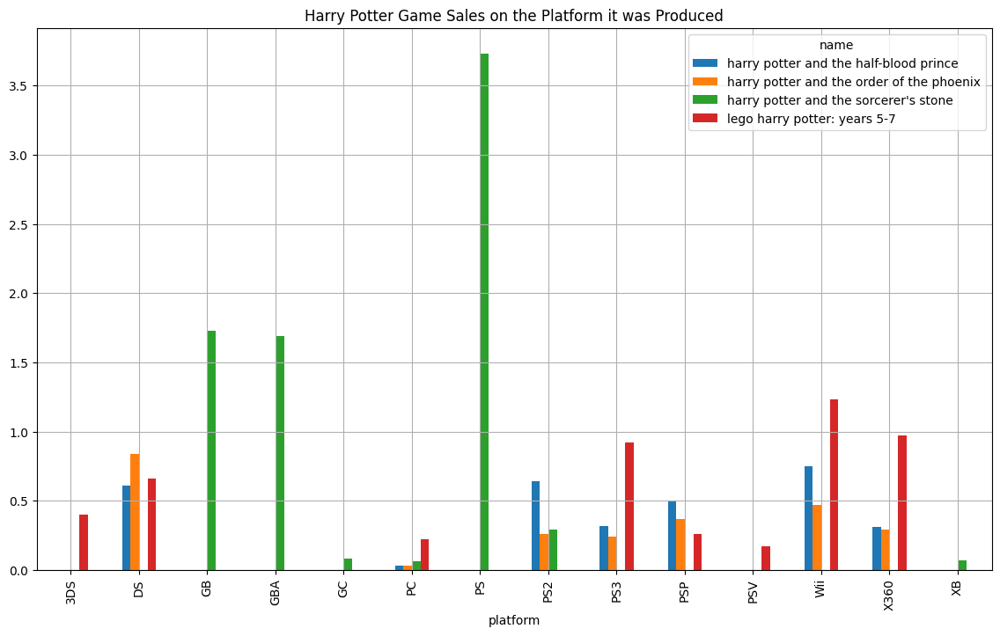

In [211]:
# Look at Harry Potter Games

hp_pivot.plot(kind='bar', figsize=(14,8), title= "Harry Potter Game Sales on the Platform it was Produced",grid=True)



**Individual Assessment:**

- **Harry Potter and the Half Blood Prince:**
    - Top Sales:
        - Wii (~0.7)
    - Middle Sales:
        - PSP (~0.5)
    - Low Sales:
        - PC(~0.03)
    - Order of Sales:
        - PC, X360, PS3, PSP, DS, PS2, Wii

- **Harry Potter and the Order of the Phoenix:**
    - Top Sales:
        - DS (~0.8)
    - Middle Sales:
        - X360 (~0.3)
    - Low Sales:
        - PC (~0.03)
    - Order of Sales:
        - PC, PS3, PS2, X360, PSP, Wii, DS

- **Harry Potter and the Sorcerer's Stone:**
    - Top Sales:
        - PS (~3.8)
    - Middle Sales:
        - PS2 (~0.3)
    - Low Sales:
        - PC (~0.05)
    - Order of Sales:
        - PC, XB, GC, PS2, GBA, GB, PS

- **LEGO Harry Potter: Years 5-7:**
    - Top Sales:
        - Wii (~1.7)
    - Middle Sales:
        - 3DS (~0.4)
    - Low Sales:
        - PSV (~0.17)
    - Order of Sales:
        - PSV, PC, PSP, 3DS, DS, PS3, X360, Wii


**Conclusion:**

Harry Potter games see the lowest sales for the PC and the highest sales for the Wii. 3/4 games have the lowest sales for the PC and 1/4 games have the second lowest sales for PC games.

Wii games scored the highest in 2/4 games, 2nd highest in 1/4 games, and was not release on 1/4 games. The game that was not released on the Wii seems to be an older game and the Wii may not have been out yet. 



<AxesSubplot:title={'center':'Pixar/Kid/Other Game Sales on the Platform it was Produced'}, xlabel='platform'>

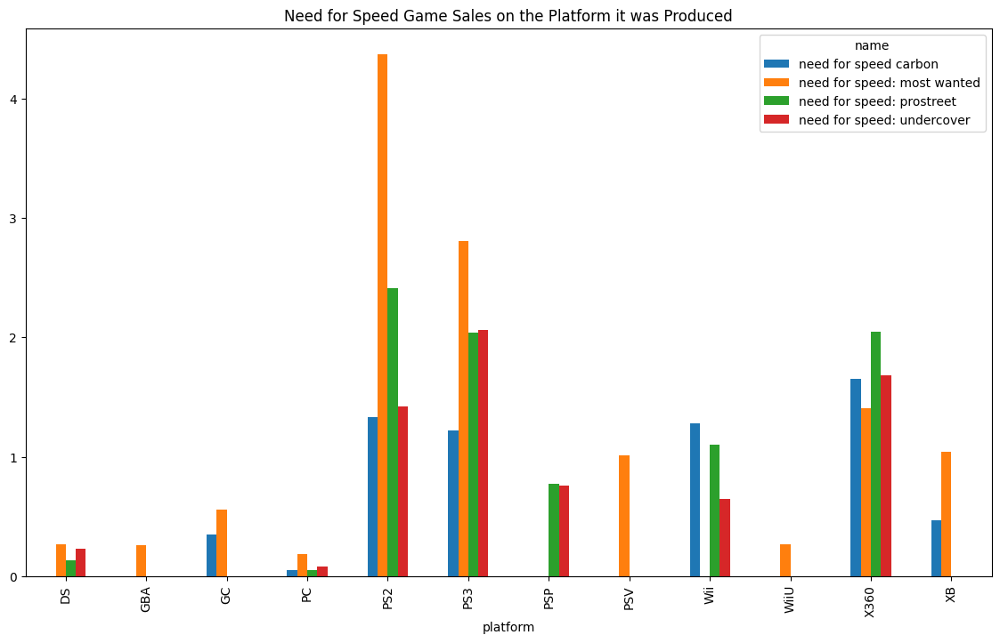

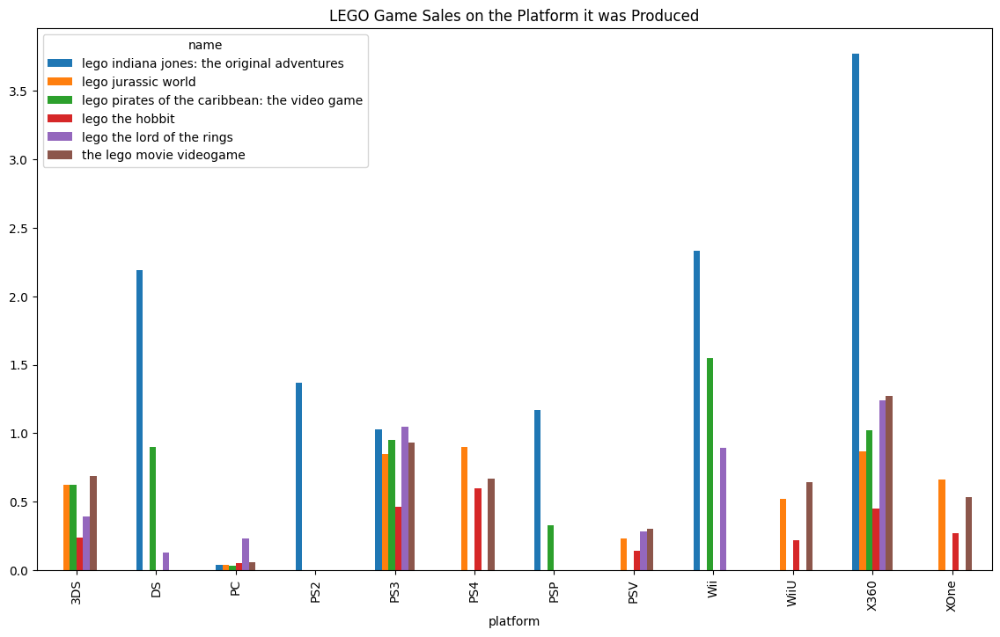

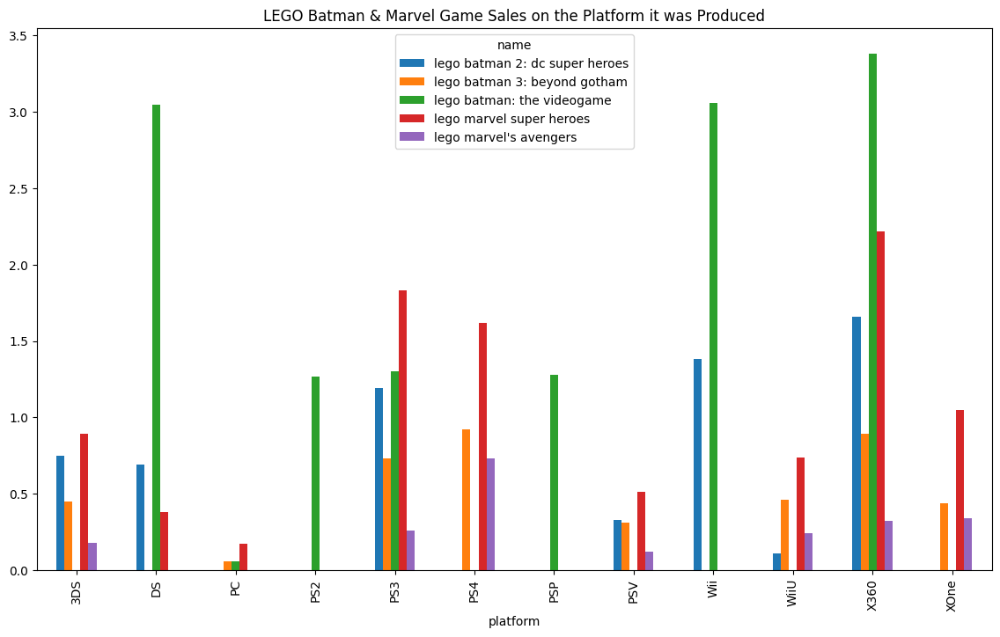

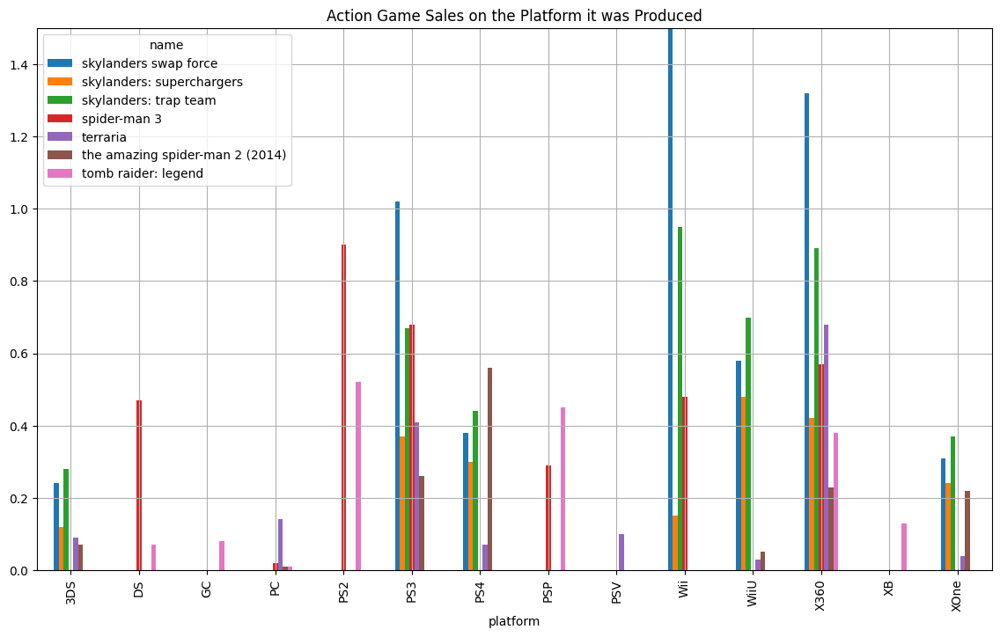

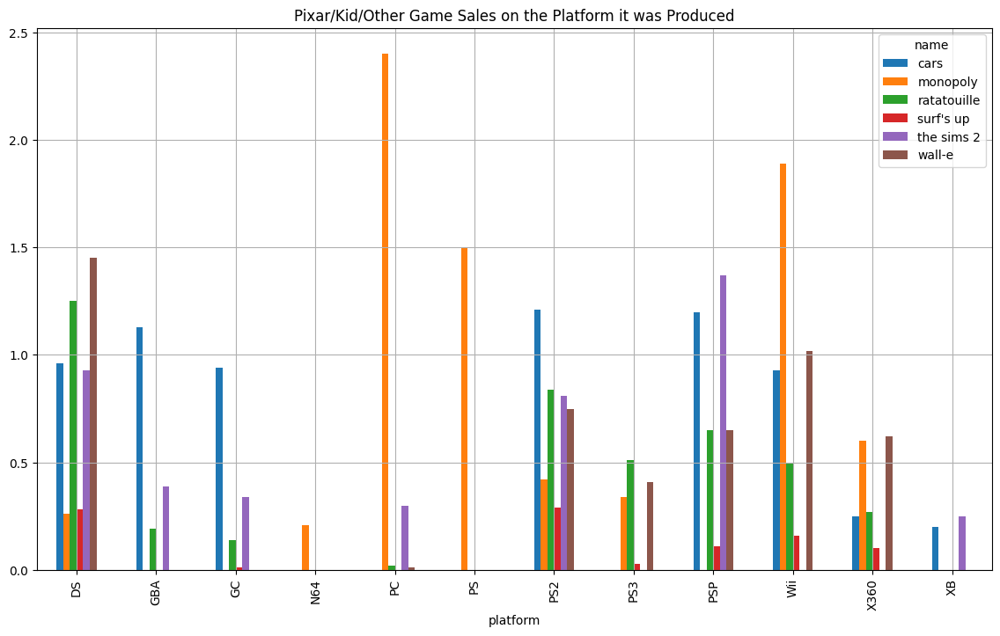

In [212]:
# Look at the rest of the games

nfs_pivot.plot(kind='bar', figsize=(14,8), title= "Need for Speed Game Sales on the Platform it was Produced")
lego_pivot.plot(kind='bar', figsize=(14,8), title= "LEGO Game Sales on the Platform it was Produced")
lego1_pivot.plot(kind='bar', figsize=(14,8), title= "LEGO Batman & Marvel Game Sales on the Platform it was Produced")
action_pivot.plot(kind='bar', figsize=(14,8), title= "Action Game Sales on the Platform it was Produced",ylim=(0,1.5),grid=True)
other_pivot.plot(kind='bar', figsize=(14,8), title= "Pixar/Kid/Other Game Sales on the Platform it was Produced",grid=True)

**Individual Assessment:**

- **Need for Speed:**
    - The lowest sales appear to be for PC games
    - The highest sales appear to be for the PS2, PS3, and X360 games
    - The X360 games appear to have the most consistent sales

- **LEGO Games:**
    - The lowest sales appear to be for PC games
    - The highest sales appear to be for the X360 and PS3

- **LEGO Batman & Marvel Games:**
    - The lowest sales appear to be for PC and PSV games
    - The highest sales appear to be for X360, Wii, PS3, and PS4, but for all games it's the X360 and PS3

- **Action Games:**
    - The lowest sales appear to be for the PC and 3DS
    - The highest sales appear to be for the X360, PS3, and Wii

- **Pixar/Kid/Other Games:**
    - The lowest sales appear to be for PC (except monopoly), PS3, and X360 - PS3 and X360 have been consistantly higher until these games
    - The highest sales appear to be fro PS2, Wii, and DS 






**Individual Summary Assessment for Other Games:**

- **Harry Potter:**
    - The lowest sales appear to be for PC games
    - All sales are relatively consistent, but Wii has the highest sales

- **FIFA Games:**
    - The lowest sales appear to be for PC, 3DS, and DS games
    - The highest sales appear to be for PS3 and X360

- **Madden Games:**
    - The lowest sales appear to be for DS games
    - The highest sales appear to be for PS2 and X360 games

- **Star Wars Games:**
    - The lowest sales appear to be for PC and PSV games
    - The highest sales appear to be for Wii, PS3, and DS games


**Overall Performance Assessment:**

- The lowest sales are consistently coming from PC games
- The highest sales are consistently coming from PS2, PS3, X360, and Wii games

We can conclude that games sales for the PC will stay consistently low. We have already seen that PC games have been consistently lower over time, but have had the longest running lifecycle. 

We can conclude that PlayStation and XBox games will have consistently high sales which makes sense as they are often seen as the two most popular consoles. 

We can conclude that Wii games will have sales that vary. Wii sales have varied between moderately low to moderately high and most likely depend on other factors to increase sales, like the release of a newer console.

## 3.8 Genre Analysis

Finally, let's examine the distribution of games by genre:

In [213]:
# Analyze genre performance

genre_sales = games_3.groupby('genre')['total_sales'].sum()
display(genre_sales)

genre_sales_mean = games_3.groupby('genre')['total_sales'].mean()
display(genre_sales_mean)

genre_sales_year = games_3.groupby(['genre','year_of_release'])['total_sales'].sum()

genre
Action          1744.17
Adventure        237.59
Fighting         447.53
Misc             802.51
Platform         827.29
Puzzle           242.57
Racing           728.67
Role-Playing     934.56
Shooter         1052.45
Simulation       389.97
Sports          1331.26
Strategy         174.23
Name: total_sales, dtype: float64

genre
Action          0.517711
Adventure       0.182341
Fighting        0.527126
Misc            0.458577
Platform        0.932683
Puzzle          0.418224
Racing          0.583403
Role-Playing    0.623872
Shooter         0.795503
Simulation      0.446701
Sports          0.567218
Strategy        0.255095
Name: total_sales, dtype: float64

In [214]:
# Sort genres by total sales

genre_sales = genre_sales.sort_values(ascending = False)
display(genre_sales)

# Reset the index
genre_sales = genre_sales.reset_index()
display(genre_sales)


genre
Action          1744.17
Sports          1331.26
Shooter         1052.45
Role-Playing     934.56
Platform         827.29
Misc             802.51
Racing           728.67
Fighting         447.53
Simulation       389.97
Puzzle           242.57
Adventure        237.59
Strategy         174.23
Name: total_sales, dtype: float64

,genre,total_sales
0,Action,1744.17
1,Sports,1331.26
2,Shooter,1052.45
3,Role-Playing,934.56
4,Platform,827.29
5,Misc,802.51
6,Racing,728.67
7,Fighting,447.53
8,Simulation,389.97
9,Puzzle,242.57


In [215]:
# Sort genres by mean total sales

genre_sales_mean = genre_sales_mean.sort_values(ascending = False)
display(genre_sales_mean)

# Reset the index
genre_sales_mean = genre_sales_mean.reset_index()
display(genre_sales_mean)


genre
Platform        0.932683
Shooter         0.795503
Role-Playing    0.623872
Racing          0.583403
Sports          0.567218
Fighting        0.527126
Action          0.517711
Misc            0.458577
Simulation      0.446701
Puzzle          0.418224
Strategy        0.255095
Adventure       0.182341
Name: total_sales, dtype: float64

,genre,total_sales
0,Platform,0.932683
1,Shooter,0.795503
2,Role-Playing,0.623872
3,Racing,0.583403
4,Sports,0.567218
5,Fighting,0.527126
6,Action,0.517711
7,Misc,0.458577
8,Simulation,0.446701
9,Puzzle,0.418224


In [216]:
# Sort genres by year and  total sales

genre_sales_year = genre_sales_year.sort_values(ascending = False)
display(genre_sales_year)

# Reset the index
genre_sales_year = genre_sales_year.reset_index()
display(genre_sales_year)

genre       year_of_release
Action      2008.0             143.26
            2009.0             137.90
Sports      2006.0             137.57
            2009.0             137.37
Action      2012.0             123.91
                                ...  
Misc        1991.0               0.08
Adventure   1993.0               0.07
Simulation  1985.0               0.04
            1988.0               0.03
Puzzle      2016.0               0.01
Name: total_sales, Length: 390, dtype: float64

,genre,year_of_release,total_sales
0,Action,2008.0,143.26
1,Action,2009.0,137.90
2,Sports,2006.0,137.57
3,Sports,2009.0,137.37
4,Action,2012.0,123.91
...,...,...,...
385,Misc,1991.0,0.08
386,Adventure,1993.0,0.07
387,Simulation,1985.0,0.04
388,Simulation,1988.0,0.03


In [217]:
# Display total sales, mean total sales, and total sales per year

display(genre_sales)
display(genre_sales_mean)
display(genre_sales_year)

,genre,total_sales
0,Action,1744.17
1,Sports,1331.26
2,Shooter,1052.45
3,Role-Playing,934.56
4,Platform,827.29
5,Misc,802.51
6,Racing,728.67
7,Fighting,447.53
8,Simulation,389.97
9,Puzzle,242.57


,genre,total_sales
0,Platform,0.932683
1,Shooter,0.795503
2,Role-Playing,0.623872
3,Racing,0.583403
4,Sports,0.567218
5,Fighting,0.527126
6,Action,0.517711
7,Misc,0.458577
8,Simulation,0.446701
9,Puzzle,0.418224


,genre,year_of_release,total_sales
0,Action,2008.0,143.26
1,Action,2009.0,137.90
2,Sports,2006.0,137.57
3,Sports,2009.0,137.37
4,Action,2012.0,123.91
...,...,...,...
385,Misc,1991.0,0.08
386,Adventure,1993.0,0.07
387,Simulation,1985.0,0.04
388,Simulation,1988.0,0.03


<AxesSubplot:title={'center':'Mean Sale of Video Games By Genre'}, xlabel='genre'>

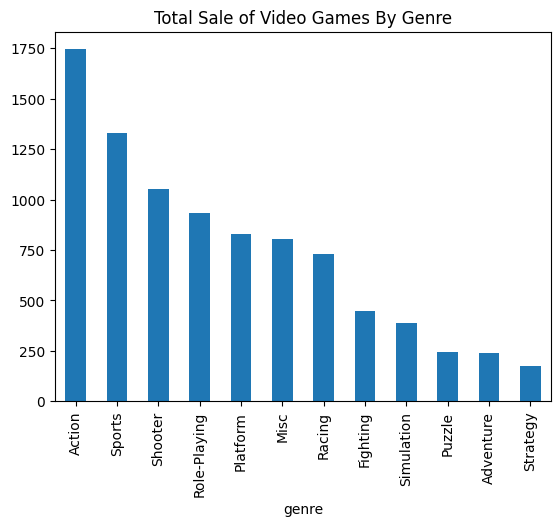

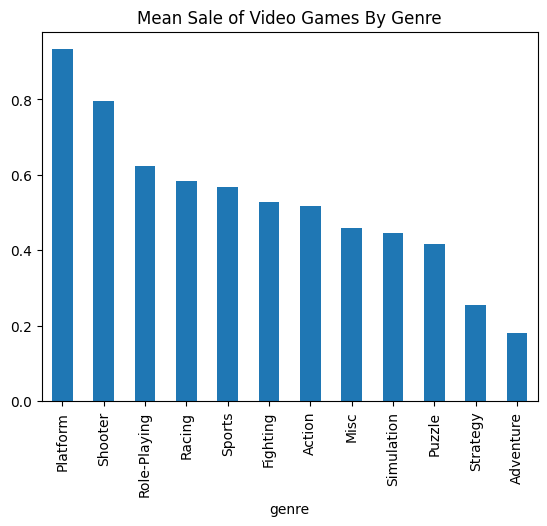

In [218]:
# Visualize genre distribution
genre_sales.plot(kind='bar',x= 'genre',legend=False, title = "Total Sale of Video Games By Genre")

genre_sales_mean.plot(kind = 'bar',x='genre',legend=False,title="Mean Sale of Video Games By Genre")

In [219]:
# Calculate market share for each genre

total_sales = games_3['total_sales'].sum()
display(total_sales)

genre_sales['market_share_%'] = (genre_sales['total_sales'] / total_sales) * 100

display(genre_sales)

8912.8

,genre,total_sales,market_share_%
0,Action,1744.17,19.569271
1,Sports,1331.26,14.936496
2,Shooter,1052.45,11.808298
3,Role-Playing,934.56,10.485594
4,Platform,827.29,9.282044
5,Misc,802.51,9.004017
6,Racing,728.67,8.175545
7,Fighting,447.53,5.021205
8,Simulation,389.97,4.375393
9,Puzzle,242.57,2.721591


In [220]:
# Calculate market share for each genre per year


# Get the total sales for each year
total_sales1 = games_3.groupby('year_of_release')['total_sales'].sum()
display(total_sales1)

total_sales1 = total_sales1.reset_index()
display(total_sales1)

# Merge the total sales for each year into genre sales year

genre_sales_year_merge = genre_sales_year.merge(total_sales1,on='year_of_release',)

display(genre_sales_year_merge)

genre_sales_year_merge['market_share_%'] = (genre_sales_year_merge['total_sales_x'] / genre_sales_year_merge['total_sales_y'].values) * 100

display(genre_sales_year_merge)

#total_sales1['year_of_release'] == 1980

year_of_release
1980.0     19.14
1981.0     35.68
1982.0     28.88
1983.0     16.80
1984.0     50.35
1985.0     53.95
1986.0     37.08
1987.0     21.70
1988.0     47.21
1989.0     73.45
1990.0     49.37
1991.0     32.23
1992.0     76.37
1993.0     45.99
1994.0     81.76
1995.0     88.12
1996.0    199.15
1997.0    201.07
1998.0    256.31
1999.0    252.30
2000.0    201.98
2001.0    336.43
2002.0    403.70
2003.0    367.12
2004.0    420.79
2005.0    464.78
2006.0    524.06
2007.0    606.16
2008.0    690.77
2009.0    660.89
2010.0    596.65
2011.0    513.72
2012.0    361.41
2013.0    362.11
2014.0    331.53
2015.0    267.99
2016.0    129.98
Name: total_sales, dtype: float64

,year_of_release,total_sales
0,1980.0,19.14
1,1981.0,35.68
2,1982.0,28.88
3,1983.0,16.80
4,1984.0,50.35
5,1985.0,53.95
6,1986.0,37.08
7,1987.0,21.70
8,1988.0,47.21
9,1989.0,73.45


,genre,year_of_release,total_sales_x,total_sales_y
0,Action,2008.0,143.26,690.77
1,Sports,2008.0,96.24,690.77
2,Misc,2008.0,94.60,690.77
3,Racing,2008.0,70.12,690.77
4,Shooter,2008.0,59.16,690.77
...,...,...,...,...
385,Adventure,1987.0,4.38,21.70
386,Sports,1987.0,3.71,21.70
387,Platform,1987.0,1.74,21.70
388,Action,1987.0,1.11,21.70


,genre,year_of_release,total_sales_x,total_sales_y,market_share_%
0,Action,2008.0,143.26,690.77,20.739175
1,Sports,2008.0,96.24,690.77,13.932278
2,Misc,2008.0,94.60,690.77,13.694862
3,Racing,2008.0,70.12,690.77,10.150991
4,Shooter,2008.0,59.16,690.77,8.564356
...,...,...,...,...,...
385,Adventure,1987.0,4.38,21.70,20.184332
386,Sports,1987.0,3.71,21.70,17.096774
387,Platform,1987.0,1.74,21.70,8.018433
388,Action,1987.0,1.11,21.70,5.115207


<AxesSubplot:title={'center':'Market Share Percent By Genre'}, xlabel='year_of_release'>

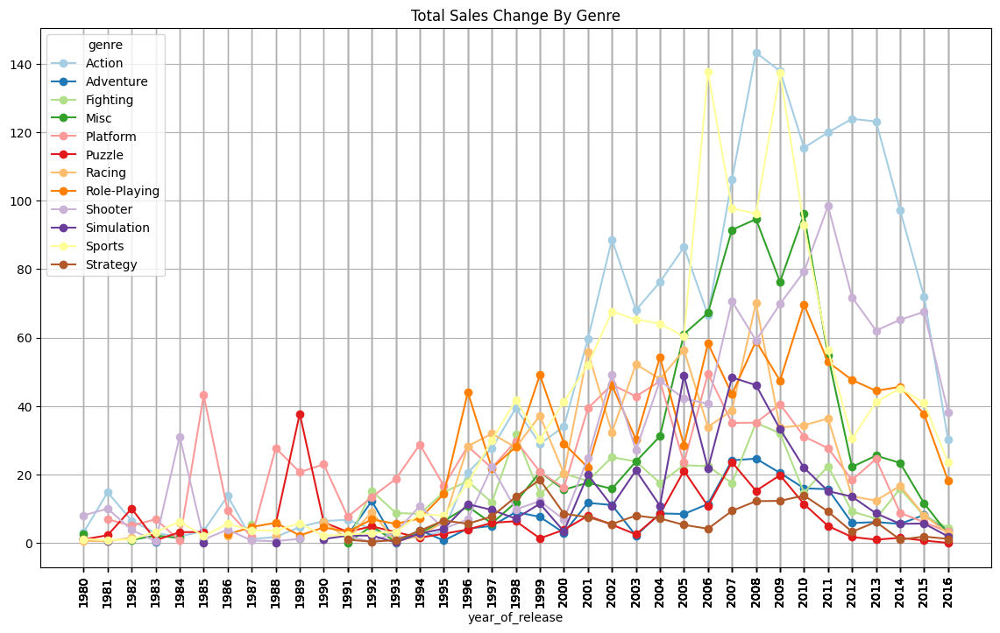

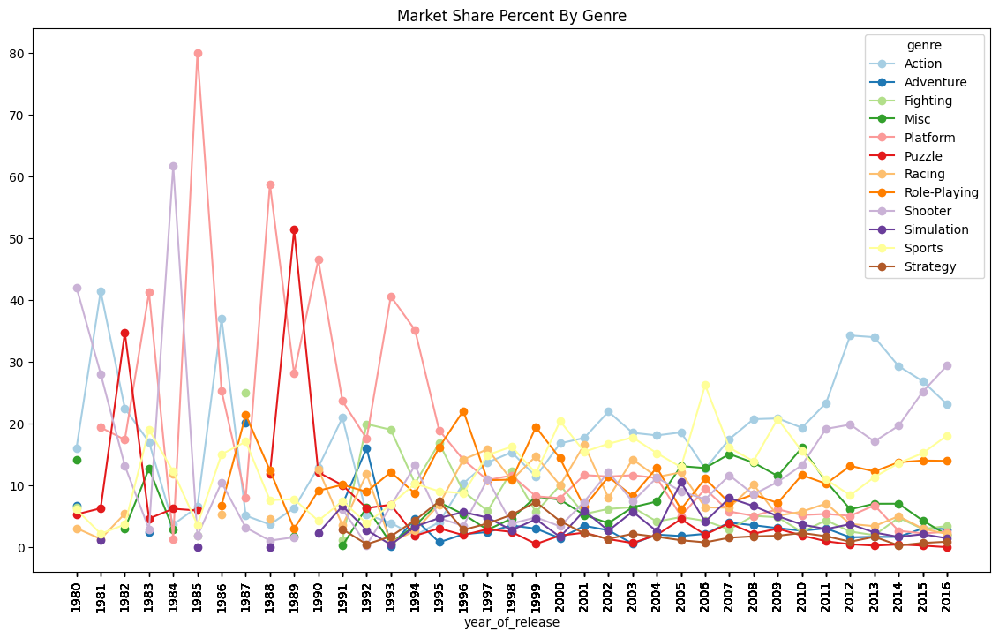

In [221]:
# Make a pivot_table to answer the questions below:
genre_sales_year_pivot = genre_sales_year_merge.pivot_table(index = 'year_of_release', columns = 'genre',values='total_sales_x')
genre_sales_year_pivot.plot(title = "Total Sales Change By Genre", 
                            figsize=(14,8),
                            xticks= genre_sales_year_merge['year_of_release'], 
                            rot=90, grid='vert', colormap='Paired',style='-o')

genre_market_year_pivot = genre_sales_year_merge.pivot_table(index = 'year_of_release', columns = 'genre',values='market_share_%')

genre_market_year_pivot.plot(title="Market Share Percent By Genre",
                             xticks= genre_sales_year_merge['year_of_release'],
                             figsize=(14,8),colormap = "Paired", 
                             rot=90, style= '-o')

### Key Questions for Genre Analysis:
- Which genres consistently perform well?
    - 1980 - 1990
        - reached over 40 million
            - Platform
        - reached over 30
            - Shooter
            - Puzzle
        - reached over 20
            - Action
    - 1990 - 2000
        - reached over 40 million
            - Role-Playing
            - Sports
        - reached over 30
            - Action
            - Racing
            - Fighting (barely and only in one year)
        - reached over 20
            - Platform
            - Shooter
            - Misc (barely and only in 1999)
    - 2000 - 2010
        - reached over 140 million
            - Action
        - reached over 120
            - Sports
        - reached over 80
            - Misc
        - reached over 60
            - Shooter
            - Racing (only in 2010)
        - reached over 40
            - Simulation
            - Platform
    - 2010 - 2016
        - reached over 120 million
            - Action
        - reached over 80
            - Shooter
        - reached over 50
            - Misc (only in 2011, mostly over 20)
        - reached over 40
            - Role-Playing
            - Sports
        - reached over 20
            - Platform
            - Fighting (only in 2011)
    - Action Games reached the top spots between 2000 - 2016; 3rd highest between 1990 - 2000, 4th highest between 1980 - 1990
    - Sports Games reached the 2nd top spot between 1990 - 2010; 5th highest between 2010 - 2016
    - Shooter Games reached the 2nd top spot from 1980 - 1990 & 2010 - 2016; 7th highest between 1990 - 2000; 4th highest between 2000 - 2010


**Overall:**

Action and Sports Games are the most consistent in terms of high sales. Shooter games perfomed well in the 80's and 2010's, but fell off in the 90's before making consistent sales throughout the 2000's. This data is based off total sales only.

According to market share percent, Action games perform the most consistently well from 1980 - 2016. Sports games have also done consistently well, but did not compare as much as Action games in the earlier years. 

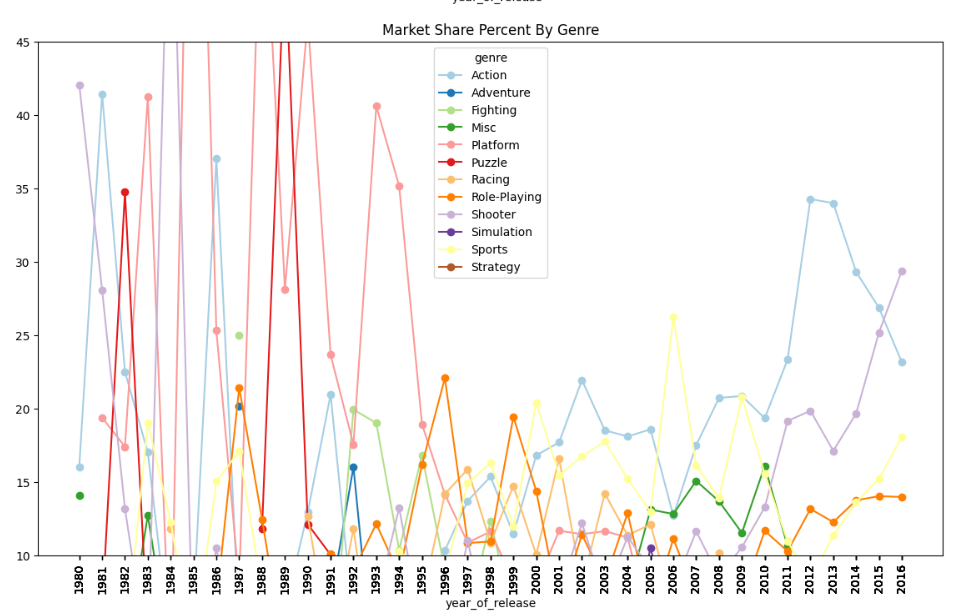


- Are there any genres showing recent growth or decline?
    - Based on the market share, Action games have started declining since 2012
    - Shooter games have started increasing steadily since 2008
    - After a steep decline, Sports games have started increasing since 2012
    - Misc games have started declining since 2010
    - All other games have remained relatively consistent since 2005

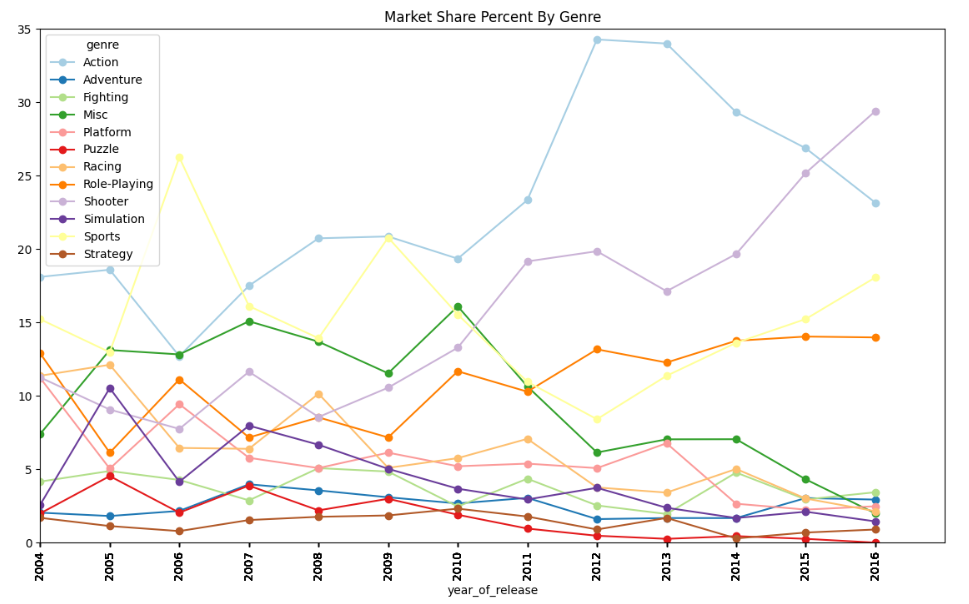


- How does the average performance vary across genres?
    - On average Platform games perform the best while Shooter games perform the 2nd best
 
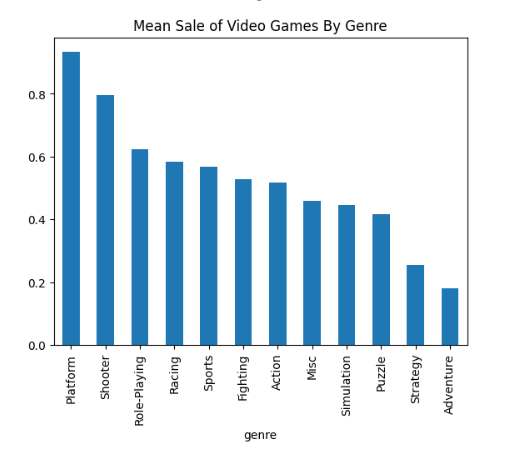

# Step 4: Regional Market Analysis and User Profiles

In this section, we will analyze the gaming market characteristics across three major regions: North America (NA), Europe (EU), and Japan (JP). Our analysis will focus on platform preferences, genre popularity, and the impact of ESRB ratings in each region.

## 4.1 Regional Platform Analysis

Let's begin by examining platform performance across different regions:

In [222]:
# Function to analyze platform performance by region

platforms_info = games_3[['platform','year_of_release','genre','na_sales','eu_sales','jp_sales','other_sales','total_sales','user_score','critic_score','rating']]

platforms_region = platforms_info[['platform','na_sales','eu_sales','jp_sales','other_sales','total_sales']]
display(platforms_region)

,platform,na_sales,eu_sales,jp_sales,other_sales,total_sales
0,Wii,41.36,28.96,3.77,8.45,82.54
1,NES,29.08,3.58,6.81,0.77,40.24
2,Wii,15.68,12.76,3.79,3.29,35.52
3,Wii,15.61,10.93,3.28,2.95,32.77
4,GB,11.27,8.89,10.22,1.00,31.38
...,...,...,...,...,...,...
16710,PS3,0.00,0.00,0.01,0.00,0.01
16711,X360,0.00,0.01,0.00,0.00,0.01
16712,PSV,0.00,0.00,0.01,0.00,0.01
16713,GBA,0.01,0.00,0.00,0.00,0.01


In [223]:
# Analyze each region
na_region = platforms_region[['platform','na_sales']]
eu_region = platforms_region[['platform','eu_sales']]
jp_region = platforms_region[['platform','jp_sales']]
other_region = platforms_region[['platform','other_sales']]
all_region = platforms_region[['platform','na_sales','eu_sales','jp_sales','other_sales']]

<AxesSubplot:title={'center':'North American Sales Across Platforms'}, xlabel='platform'>

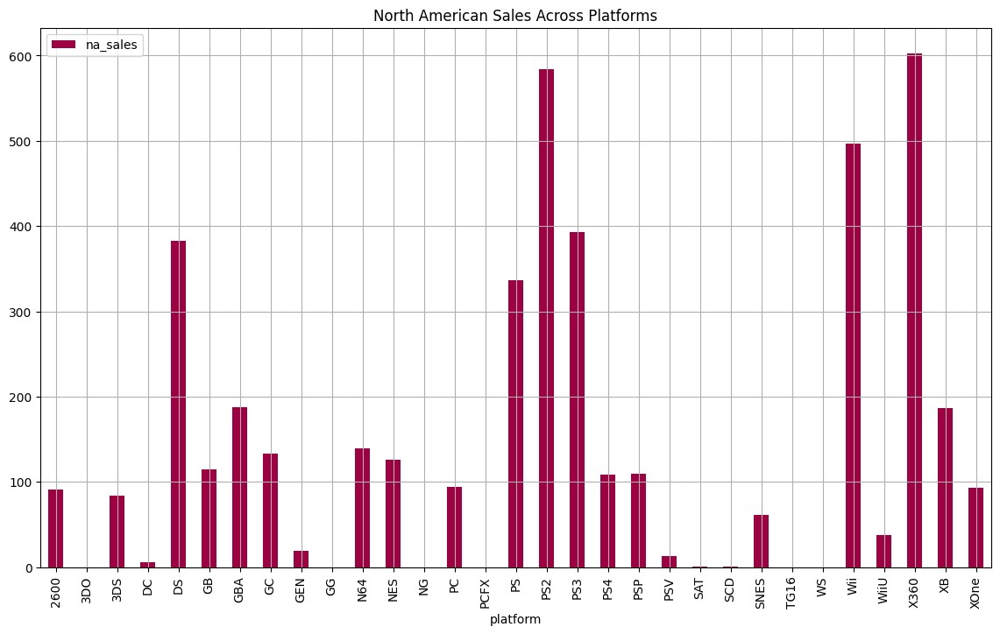

In [224]:
# Analyze NA region

# Make a pivot table for the NA Region

na_pivot = na_region.pivot_table(index='platform', values='na_sales',aggfunc='sum')

na_pivot.plot(kind='bar', figsize=(14,8), colormap = 'Spectral', title="North American Sales Across Platforms",grid=True)

<AxesSubplot:title={'center':'European Sales Across Platforms'}, xlabel='platform'>

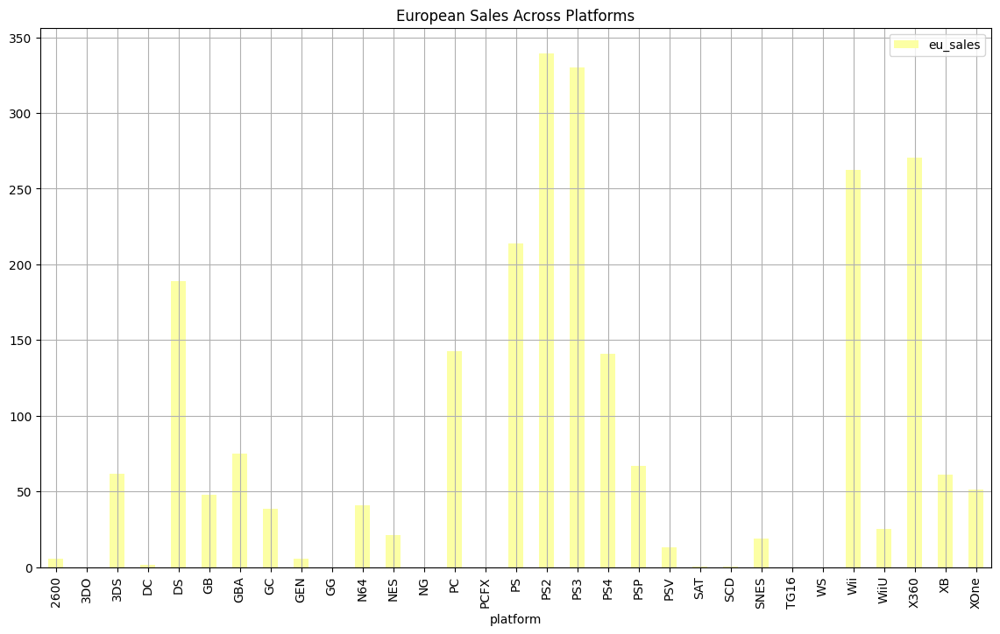

In [225]:
# Make a pivot table for the EU Region

eu_pivot = eu_region.pivot_table(index='platform', values='eu_sales',aggfunc='sum')

eu_pivot.plot(kind='bar', figsize=(14,8), colormap = 'inferno_r', title="European Sales Across Platforms",grid=True)

<AxesSubplot:title={'center':'Japanese Sales Across Platforms'}, xlabel='platform'>

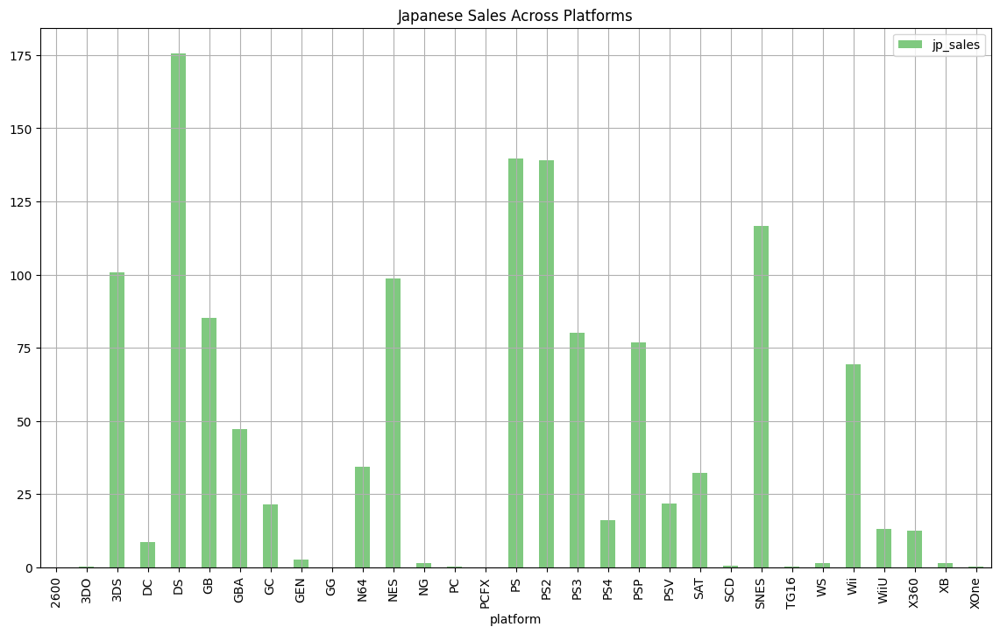

In [226]:
# Make a pivot table for the JP Region

jp_pivot = jp_region.pivot_table(index='platform', values='jp_sales',aggfunc='sum')

jp_pivot.plot(kind='bar', figsize=(14,8), colormap = 'Accent', title="Japanese Sales Across Platforms",grid=True)

<AxesSubplot:title={'center':'Other Countries Sales Across Platforms (NOT NA, EU, or JP)'}, xlabel='platform'>

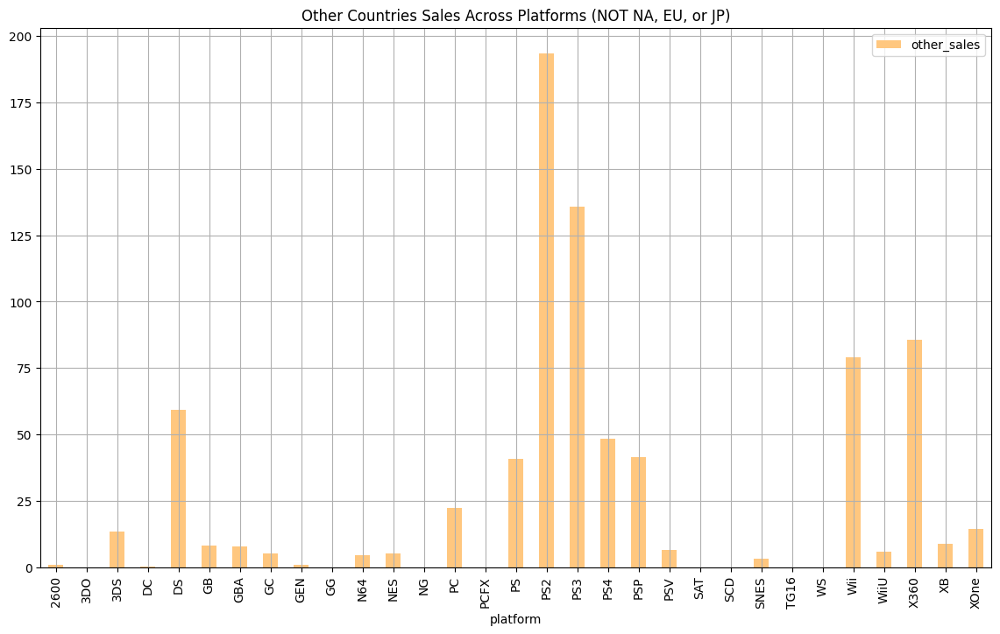

In [227]:
# Make a pivot table for the Other Region


other_pivot = other_region.pivot_table(index='platform', values='other_sales',aggfunc='sum')

other_pivot.plot(kind='bar', figsize=(14,8), colormap = 'copper_r', title="Other Countries Sales Across Platforms (NOT NA, EU, or JP)",grid=True)


<AxesSubplot:title={'center':'All Countries Sales Across Platforms (NA, EU, JP, & Other)'}, xlabel='platform'>

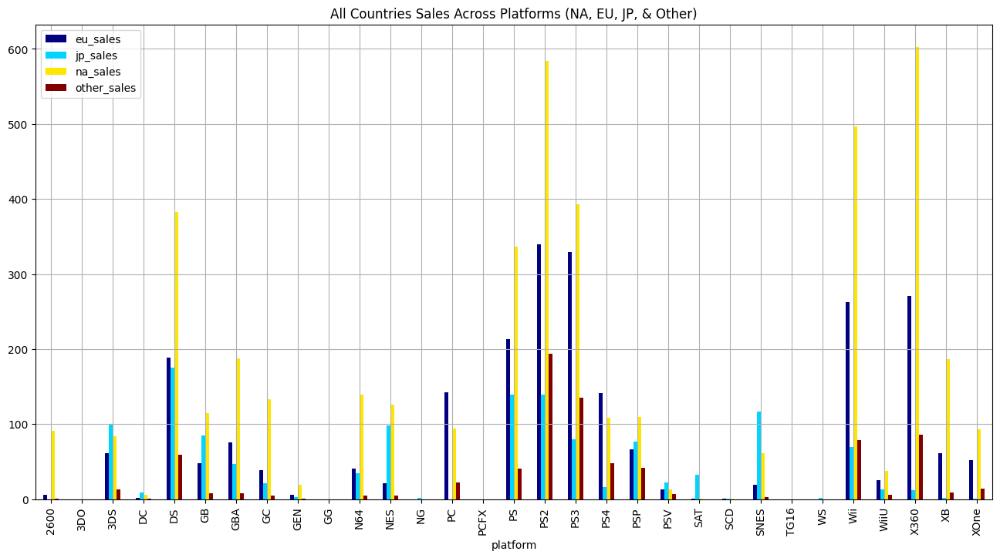

In [228]:
# Make a pivot table with all countries

all_pivot = all_region.pivot_table(index='platform', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='sum')

all_pivot.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="All Countries Sales Across Platforms (NA, EU, JP, & Other)",grid=True)



**Summary**

It appears that North American Sales typically lead the market with 17/31 (~55 %) platforms. Of those 17 leading sales, 13 made more than 100 million in sales. 

The top 5 North American Sales (making over $600,000) came from the following platforms (highest to lowest):
- X360
- PS2
- PS3
- DS
- PS

Japanese Sales outperform all countries in 12/31 platforms (~38 %). Of those 12 consoles, 6 consoles appear to be exclusive to Japan as there are no other countries sales. 

The top 5 Japanese Sales (highest to lowest):
- DS
- PS
- PS2
- SNES
- 3DS

European Sales outperform 2/31 countries (~6 %)

The top 5 European Sales (highest to lowest):
- PS2
- PS3
- X360
- Wii
- PS


Other Countries do not outperform any of the top leading countries

The top 5 Other Countries Sales (highest to lowest):
- PS2
- PS3
- X360
- Wii
- DS


**This is the same photo except the y-axis is limited to a maximum height of 2 to help see the lower sales range more accurately:**

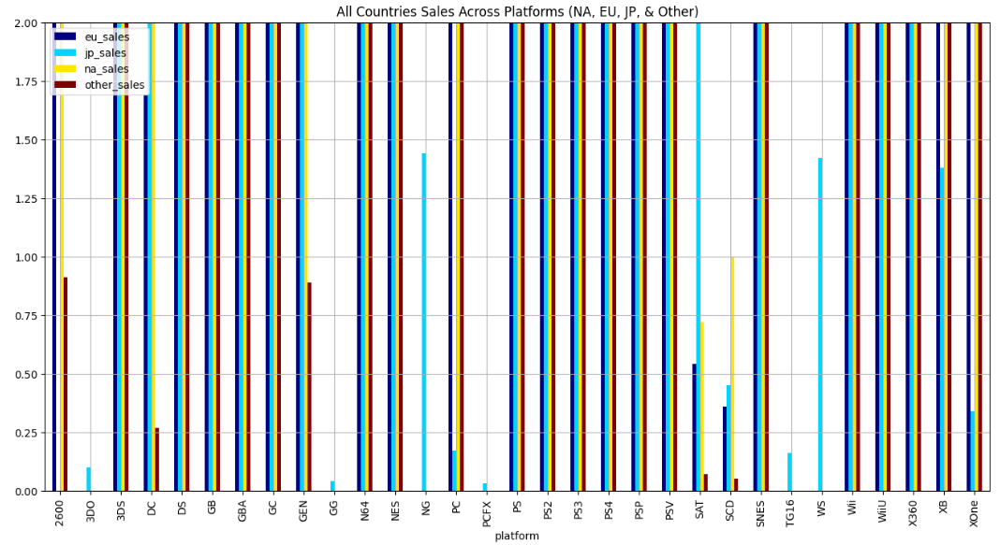



**Overall**

North American Sales lead the market. The top selling platforms in relation to different regions tends to be the PS2 ranking in the top 1-3 spots for all countries. The second leading platform is the PS3, ranking in the top 2-3 spots for all countries. 
- PS2 - ranks 1 in EU & Other and 2 in NA and 3 in JP
- PS3 - ranks 3 in NA & JP and 2 in EU & Other
- X360 - not top 5 rank in JP; ranks 3 in EU & Other and 1 in NA
- PS - not top 5 rank for other countries; ranks 5 in NA & EU and 2 in JP
- Wii - not top 5 rank for NA & JP; ranks 4 in EU & Other
- DS - not top 5 rank in EU & JP; ranks 4 in NA and 5 in Other
- SNES - not top 5 rank in NA, EU, & Other; ranks 4 in JP
- 3DS - not top 5 rank in NA, EU, & Other; ranks 4 in JP




<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

### Cross-Regional Platform Comparison

Let's create a comparative analysis of platform performance across regions:

In [229]:
# Create a comparative platform analysis
display(all_region)

# Filter out the top 3 ranking consoles
top_platforms = ['PS2', 'PS3','X360','PS','DS']
all_region_filtered = all_region.query("platform == @top_platforms")[['platform','na_sales','eu_sales','jp_sales','other_sales']]

display(all_region_filtered)

,platform,na_sales,eu_sales,jp_sales,other_sales
0,Wii,41.36,28.96,3.77,8.45
1,NES,29.08,3.58,6.81,0.77
2,Wii,15.68,12.76,3.79,3.29
3,Wii,15.61,10.93,3.28,2.95
4,GB,11.27,8.89,10.22,1.00
...,...,...,...,...,...
16710,PS3,0.00,0.00,0.01,0.00
16711,X360,0.00,0.01,0.00,0.00
16712,PSV,0.00,0.00,0.01,0.00
16713,GBA,0.01,0.00,0.00,0.00


,platform,na_sales,eu_sales,jp_sales,other_sales
6,DS,11.28,9.14,6.50,2.88
10,DS,9.05,10.95,1.93,2.74
11,DS,9.71,7.47,4.13,1.90
14,X360,15.00,4.89,0.24,1.69
16,PS3,7.02,9.09,0.98,3.96
...,...,...,...,...,...
16700,DS,0.00,0.00,0.01,0.00
16704,DS,0.01,0.00,0.00,0.00
16709,PS2,0.00,0.00,0.00,0.00
16710,PS3,0.00,0.00,0.01,0.00


<AxesSubplot:title={'center':'Top Regional Sales Across Top Platforms (NA, EU, JP, & Other)'}, xlabel='platform'>

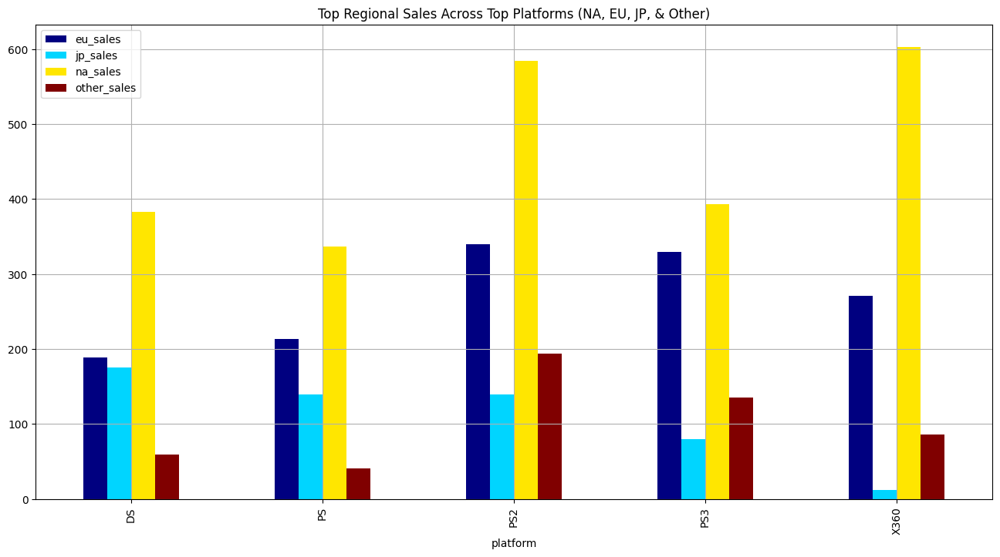

In [230]:
# Visualize cross-regional comparison for top platforms
all_filtered_pivot = all_region_filtered.pivot_table(index='platform', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc=sum)

all_filtered_pivot.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Top Regional Sales Across Top Platforms (NA, EU, JP, & Other)",grid=True)




In [231]:
# Look at top sales in all countries

all_grouped = platforms_region.query("platform == @top_platforms")
display(all_grouped)

# NA
na_grouped = all_grouped.groupby('platform')['na_sales'].sum()
na_grouped = na_grouped.reset_index()
display(na_grouped)

# JP
jp_grouped = all_grouped.groupby('platform')['jp_sales'].sum()
jp_grouped = jp_grouped.reset_index()
display(jp_grouped)

# EU
eu_grouped = all_grouped.groupby('platform')['eu_sales'].sum()
eu_grouped = eu_grouped.reset_index()
display(eu_grouped)

# Other
other_grouped = all_grouped.groupby('platform')['other_sales'].sum()
other_grouped = other_grouped.reset_index()
display(other_grouped)


# Total
total_grouped = all_grouped.groupby('platform')['total_sales'].sum()
total_grouped = total_grouped.reset_index()
display(total_grouped)


# All
all_top = na_grouped
all_top['jp_sales'] = jp_grouped['jp_sales']
all_top['eu_sales'] = eu_grouped['eu_sales']
all_top['other_sales'] = other_grouped['other_sales']
all_top['total_sales'] = total_grouped['total_sales']
all_top = all_top.sort_values(by='total_sales',ascending=False)
all_top = all_top.reset_index()

display(all_top)

,platform,na_sales,eu_sales,jp_sales,other_sales,total_sales
6,DS,11.28,9.14,6.50,2.88,29.80
10,DS,9.05,10.95,1.93,2.74,24.67
11,DS,9.71,7.47,4.13,1.90,23.21
14,X360,15.00,4.89,0.24,1.69,21.82
16,PS3,7.02,9.09,0.98,3.96,21.05
...,...,...,...,...,...,...
16700,DS,0.00,0.00,0.01,0.00,0.01
16704,DS,0.01,0.00,0.00,0.00,0.01
16709,PS2,0.00,0.00,0.00,0.00,0.00
16710,PS3,0.00,0.00,0.01,0.00,0.01


,platform,na_sales
0,DS,382.40
1,PS,336.52
2,PS2,583.84
3,PS3,393.49
4,X360,602.47


,platform,jp_sales
0,DS,175.57
1,PS,139.82
2,PS2,139.20
3,PS3,80.19
4,X360,12.43


,platform,eu_sales
0,DS,188.89
1,PS,213.61
2,PS2,339.29
3,PS3,329.80
4,X360,270.75


,platform,other_sales
0,DS,59.26
1,PS,40.91
2,PS2,193.44
3,PS3,135.68
4,X360,85.76


,platform,total_sales
0,DS,806.12
1,PS,730.86
2,PS2,1255.77
3,PS3,939.16
4,X360,971.41


,index,platform,na_sales,jp_sales,eu_sales,other_sales,total_sales
0,2,PS2,583.84,139.20,339.29,193.44,1255.77
1,4,X360,602.47,12.43,270.75,85.76,971.41
2,3,PS3,393.49,80.19,329.80,135.68,939.16
3,0,DS,382.40,175.57,188.89,59.26,806.12
4,1,PS,336.52,139.82,213.61,40.91,730.86


,platform,total_sales,na_sales,eu_sales,jp_sales,other_sales,na_mean,eu_mean,jp_mean,other_mean,na_%,jp_%,eu_%,other_%
16,PS2,1255.77,583.84,339.29,139.20,193.44,0.27,0.16,0.06,0.09,46.49,11.08,27.02,15.40
28,X360,971.41,602.47,270.75,12.43,85.76,0.48,0.21,0.01,0.07,62.02,1.28,27.87,8.83
17,PS3,939.16,393.49,329.80,80.19,135.68,0.30,0.25,0.06,0.10,41.90,8.54,35.12,14.45
26,Wii,907.51,496.90,262.21,69.33,79.07,0.38,0.20,0.05,0.06,54.75,7.64,28.89,8.71
4,DS,806.12,382.40,188.89,175.57,59.26,0.18,0.09,0.08,0.03,47.44,21.78,23.43,7.35
15,PS,730.86,336.52,213.61,139.82,40.91,0.28,0.18,0.12,0.03,46.04,19.13,29.23,5.60
6,GBA,317.85,187.54,75.25,47.33,7.73,0.23,0.09,0.06,0.01,59.00,14.89,23.67,2.43
18,PS4,314.14,108.74,141.09,15.96,48.35,0.28,0.36,0.04,0.12,34.62,5.08,44.91,15.39
19,PSP,294.06,109.17,66.69,76.78,41.42,0.09,0.06,0.06,0.03,37.13,26.11,22.68,14.09
13,PC,259.52,94.53,142.44,0.17,22.38,0.10,0.15,0.00,0.02,36.42,0.07,54.89,8.62


,platform,total_sales,na_sales,eu_sales,jp_sales,other_sales,na_mean,eu_mean,jp_mean,other_mean,na_%,jp_%,eu_%,other_%
16,PS2,1255.77,583.84,339.29,139.20,193.44,0.27,0.16,0.06,0.09,46.49,11.08,27.02,15.40
28,X360,971.41,602.47,270.75,12.43,85.76,0.48,0.21,0.01,0.07,62.02,1.28,27.87,8.83
17,PS3,939.16,393.49,329.80,80.19,135.68,0.30,0.25,0.06,0.10,41.90,8.54,35.12,14.45
26,Wii,907.51,496.90,262.21,69.33,79.07,0.38,0.20,0.05,0.06,54.75,7.64,28.89,8.71
4,DS,806.12,382.40,188.89,175.57,59.26,0.18,0.09,0.08,0.03,47.44,21.78,23.43,7.35
15,PS,730.86,336.52,213.61,139.82,40.91,0.28,0.18,0.12,0.03,46.04,19.13,29.23,5.60
18,PS4,314.14,108.74,141.09,15.96,48.35,0.28,0.36,0.04,0.12,34.62,5.08,44.91,15.39
2,3DS,259.00,83.49,61.48,100.67,13.36,0.16,0.12,0.19,0.03,32.24,38.87,23.74,5.16
5,GB,255.46,114.32,47.82,85.12,8.20,1.17,0.49,0.87,0.08,44.75,33.32,18.72,3.21
11,NES,251.05,125.94,21.15,98.65,5.31,1.29,0.22,1.01,0.05,50.17,39.29,8.42,2.12


<AxesSubplot:title={'center':'Top Regional Sales Across Top Platforms (NA, EU, JP, & Other)'}, xlabel='platform'>

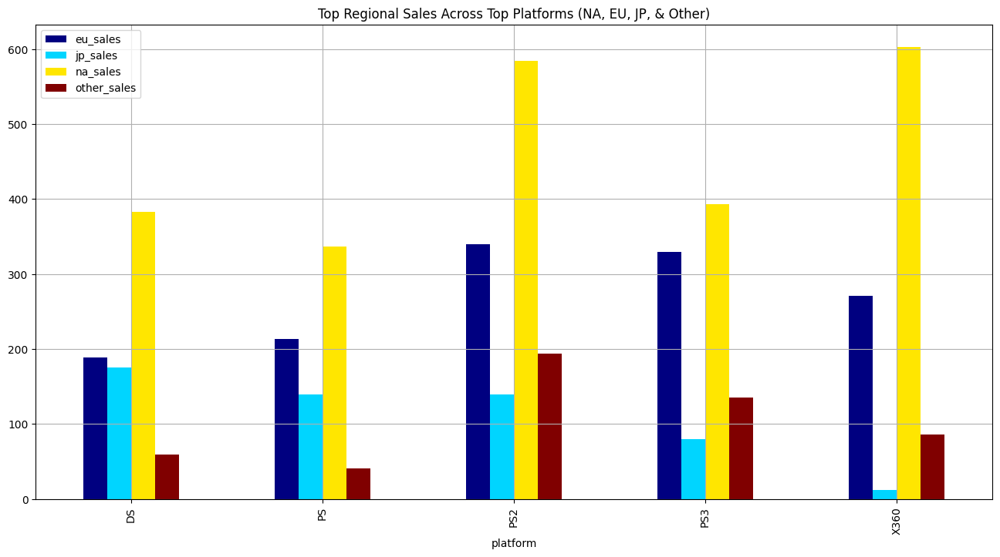

In [232]:
# All platforms

all_grouped_plat = platforms_region.groupby('platform')['total_sales'].sum()
all_grouped_plat = all_grouped_plat.reset_index() 


all_grouped_plat_na = platforms_region.groupby('platform')['na_sales'].sum()
all_grouped_plat_na = all_grouped_plat_na.reset_index()


all_grouped_plat_jp = platforms_region.groupby('platform')['jp_sales'].sum()
all_grouped_plat_jp = all_grouped_plat_jp.reset_index()

all_grouped_plat_eu = platforms_region.groupby('platform')['eu_sales'].sum()
all_grouped_plat_eu = all_grouped_plat_eu.reset_index()

all_grouped_plat_other = platforms_region.groupby('platform')['other_sales'].sum()
all_grouped_plat_other = all_grouped_plat_other.reset_index()

all_grouped_plat['na_sales'] = all_grouped_plat_na['na_sales']
all_grouped_plat['eu_sales'] = all_grouped_plat_eu['eu_sales']
all_grouped_plat['jp_sales'] = all_grouped_plat_jp['jp_sales']
all_grouped_plat['other_sales'] = all_grouped_plat_other['other_sales']




# Mean Platform data

all_grouped_plat_na_mean = platforms_region.groupby('platform')['na_sales'].mean()
all_grouped_plat_na_mean = all_grouped_plat_na_mean.reset_index()
all_grouped_plat['na_mean'] = all_grouped_plat_na_mean['na_sales'].round(2)


all_grouped_plat_eu_mean = platforms_region.groupby('platform')['eu_sales'].mean()
all_grouped_plat_eu_mean = all_grouped_plat_eu_mean.reset_index()
all_grouped_plat['eu_mean'] = all_grouped_plat_eu_mean['eu_sales'].round(2)


all_grouped_plat_jp_mean = platforms_region.groupby('platform')['jp_sales'].mean()
all_grouped_plat_jp_mean = all_grouped_plat_jp_mean.reset_index()
all_grouped_plat['jp_mean'] = all_grouped_plat_jp_mean['jp_sales'].round(2)


all_grouped_plat_other_mean = platforms_region.groupby('platform')['other_sales'].mean()
all_grouped_plat_other_mean = all_grouped_plat_other_mean.reset_index()
all_grouped_plat['other_mean'] = all_grouped_plat_other_mean['other_sales'].round(2)




# Percent each region consumes for each Platform
all_grouped_plat['na_%'] = ((all_grouped_plat['na_sales'] / all_grouped_plat['total_sales']) * 100).round(2)
all_grouped_plat['jp_%'] = ((all_grouped_plat['jp_sales'] / all_grouped_plat['total_sales']) * 100).round(2)
all_grouped_plat['eu_%'] = ((all_grouped_plat['eu_sales'] / all_grouped_plat['total_sales']) * 100).round(2)
all_grouped_plat['other_%'] = ((all_grouped_plat['other_sales'] / all_grouped_plat['total_sales']) * 100).round(2)



# Sort by Sales

all_grouped_plat = all_grouped_plat.sort_values(by='total_sales',ascending = False)

all_grouped_plat_limited = all_grouped_plat[all_grouped_plat['platform'].isin(['PS2','X360','PS3','Wii','DS','PS','SNES','3DS','NES','GB','GEN','2600','PS4','XOne','WS'])]

display(all_grouped_plat)
display(all_grouped_plat_limited)


all_filtered_pivot.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Top Regional Sales Across Top Platforms (NA, EU, JP, & Other)",grid=True)

**Overall:**

- North America leads with top sales in all regionally leading consoles; pulling in around 2.3 billion across all 5 platforms
    - (X360, PS2, PS3, DS, PS)
- Europe is 2nd in top sales in all regionally leading consoles; pulling in around 1.35 billion across all 5 platforms
    - (PS2, PS3, X360, PS, DS)
- Japan is 3rd in top sales in regionally leading consoles; Japan outranks other countries in the DS & PS and pulls in ~547 million in sales across all 5 platforms:
    - (DS, PS, PS2, PS3, X360)
- Other Countries ranks last in regionally leading consoles; other countries outrank Japan in the PS2, PS3, X360 and pulls in ~515 million in sales across all 5 platforms:
    - (PS2, PS3, X360, DS, PS)


## 4.2 Regional Genre Analysis

Now let's examine genre preferences across regions:

,genre,na_sales,eu_sales,jp_sales,other_sales,total_sales
0,Sports,41.36,28.96,3.77,8.45,82.54
1,Platform,29.08,3.58,6.81,0.77,40.24
2,Racing,15.68,12.76,3.79,3.29,35.52
3,Sports,15.61,10.93,3.28,2.95,32.77
4,Role-Playing,11.27,8.89,10.22,1.00,31.38
...,...,...,...,...,...,...
16710,Action,0.00,0.00,0.01,0.00,0.01
16711,Sports,0.00,0.01,0.00,0.00,0.01
16712,Adventure,0.00,0.00,0.01,0.00,0.01
16713,Platform,0.01,0.00,0.00,0.00,0.01


<AxesSubplot:title={'center':'All Countries Sales Across Genres (NA, EU, JP, & Other)'}, xlabel='genre'>

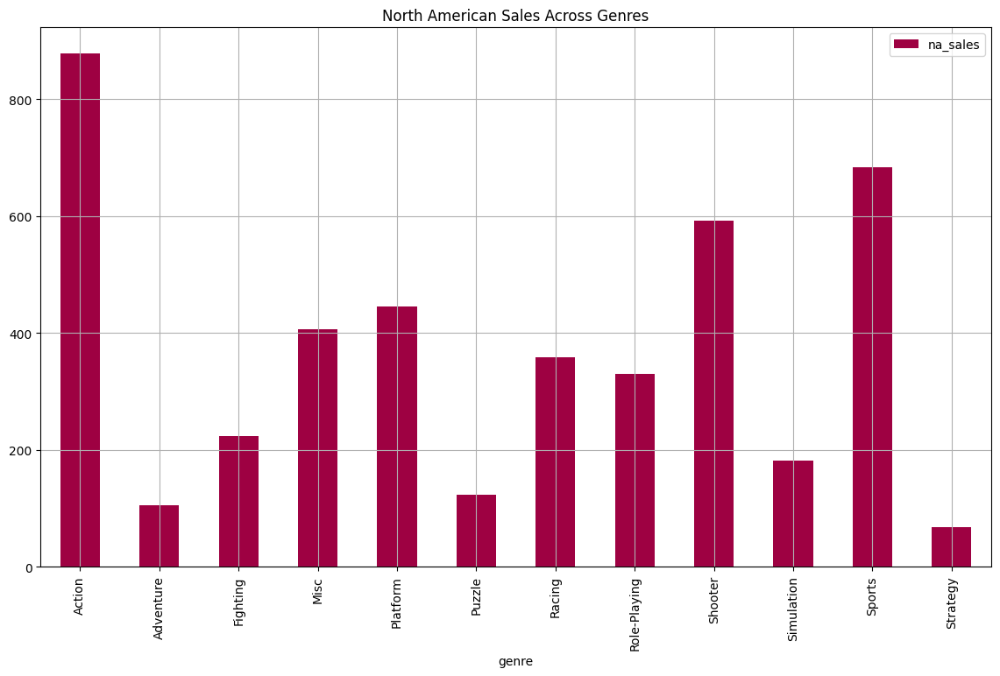

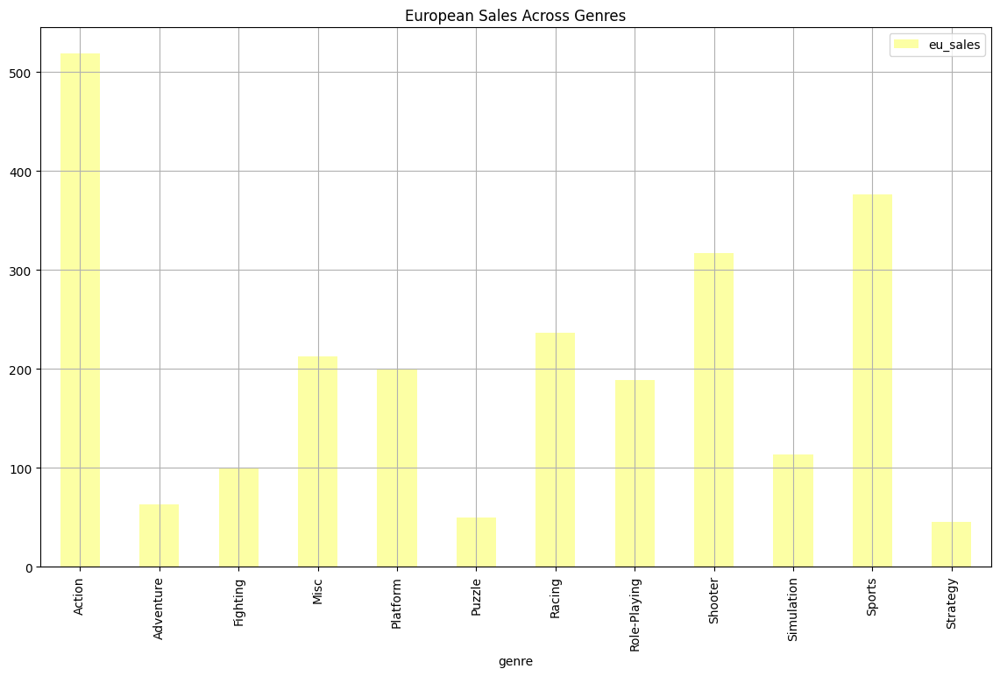

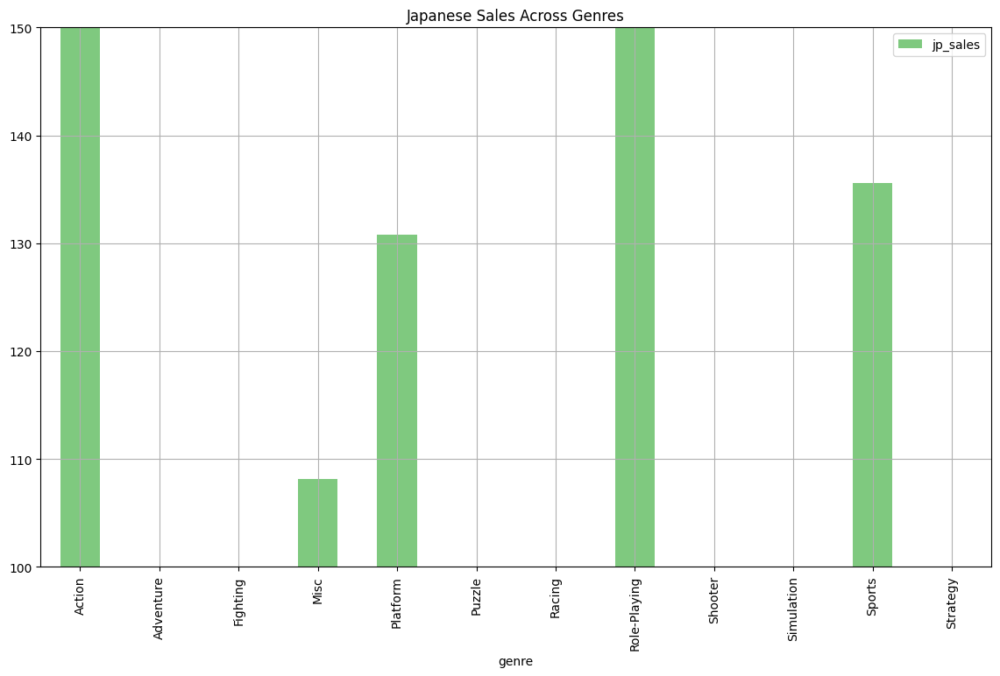

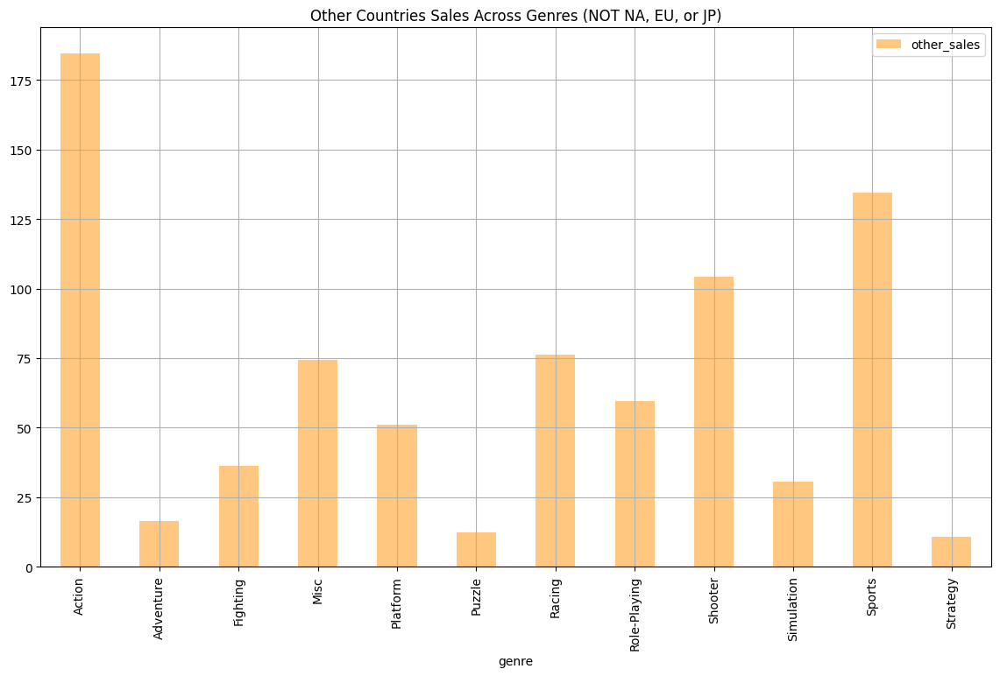

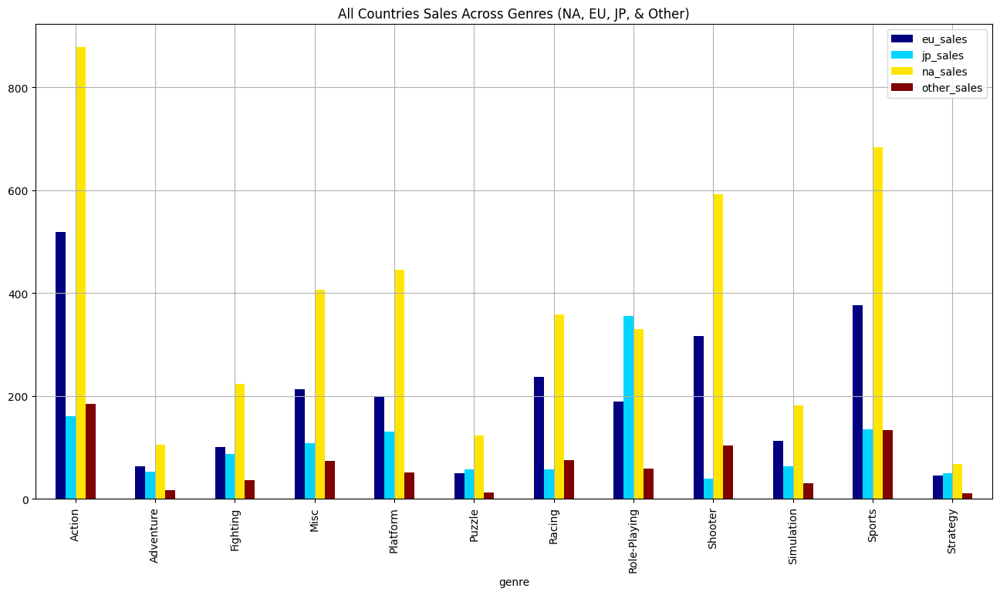

In [233]:
# Function to analyze genre performance by region

genre_region = platforms_info[['genre','na_sales','eu_sales','jp_sales','other_sales','total_sales']]
display(genre_region)


# Analyze each region
na_region_gen = genre_region[['genre','na_sales']]
eu_region_gen = genre_region[['genre','eu_sales']]
jp_region_gen = genre_region[['genre','jp_sales']]
other_region_gen = genre_region[['genre','other_sales']]
all_region_gen = genre_region[['genre','na_sales','eu_sales','jp_sales','other_sales']]
all_region_gen_sales = genre_region[['genre','na_sales','eu_sales','jp_sales','other_sales','total_sales']]



# Analyze the regions

# Make a pivot table for the NA Region

na_pivot_gen = na_region_gen.pivot_table(index='genre', values='na_sales',aggfunc='sum')

na_pivot_gen.plot(kind='bar', figsize=(14,8), colormap = 'Spectral', title="North American Sales Across Genres",grid=True)




# Make a pivot table for the EU Region

eu_pivot_gen = eu_region_gen.pivot_table(index='genre', values='eu_sales',aggfunc='sum')

eu_pivot_gen.plot(kind='bar', figsize=(14,8), colormap = 'inferno_r', title="European Sales Across Genres",grid=True)


# Make a pivot table for the JP Region

jp_pivot_gen = jp_region_gen.pivot_table(index='genre', values='jp_sales',aggfunc='sum')

jp_pivot_gen.plot(kind='bar', figsize=(14,8), colormap = 'Accent', title="Japanese Sales Across Genres",grid=True,ylim=(100,150))


# Make a pivot table for the Other Region


other_pivot_gen = other_region_gen.pivot_table(index='genre', values='other_sales',aggfunc='sum')

other_pivot_gen.plot(kind='bar', figsize=(14,8), colormap = 'copper_r', title="Other Countries Sales Across Genres (NOT NA, EU, or JP)",grid=True)



# Make a pivot table with all countries

all_pivot_gen = all_region_gen.pivot_table(index='genre', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='sum')

all_pivot_gen.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="All Countries Sales Across Genres (NA, EU, JP, & Other)",grid=True)



**Top 5 Genres for Each Region in Sales** (in order: highest to lowest)

**North America**
- Action
- Sports
- Shooter
- Platform
- Misc

**Europe**
- Action
- Sports
- Shooter
- Racing
- Misc

**Japan**
- Role-Playing
- Action
- Sports
- Platform
- Misc

**Other**
- Action
- Sports
- Shooter
- Racing
- Misc

**Summary Notes:**
- North America has the highest sales in 11/12 (~92 %) Genres
- Japan has the highest sales in 1/12 (~8 % ) Genres
- Europe and Other Countries do not have the highest sales in any Genre
- Japan has the highest sales, not including North America, in 3/12 (25%) Genres
- Europe has the highest sales, not including North America, in 9/12 (75%) Genres
- Other countries do not have the highest sales, not including North America, in any Genre
- Other Countries have higher sales than Japan in 3 Genres (Action, Racing, Shooter)


### Cross-Regional Genre Comparison

Let's compare genre preferences across regions:

,genre,na_sales,eu_sales,jp_sales,other_sales
0,Sports,41.36,28.96,3.77,8.45
1,Platform,29.08,3.58,6.81,0.77
2,Racing,15.68,12.76,3.79,3.29
3,Sports,15.61,10.93,3.28,2.95
4,Role-Playing,11.27,8.89,10.22,1.00
...,...,...,...,...,...
16708,Platform,0.01,0.00,0.00,0.00
16709,Racing,0.00,0.00,0.00,0.00
16710,Action,0.00,0.00,0.01,0.00
16711,Sports,0.00,0.01,0.00,0.00


<AxesSubplot:title={'center':'Top Regional Sales By Genre (NA, EU, JP, & Other)'}, xlabel='genre'>

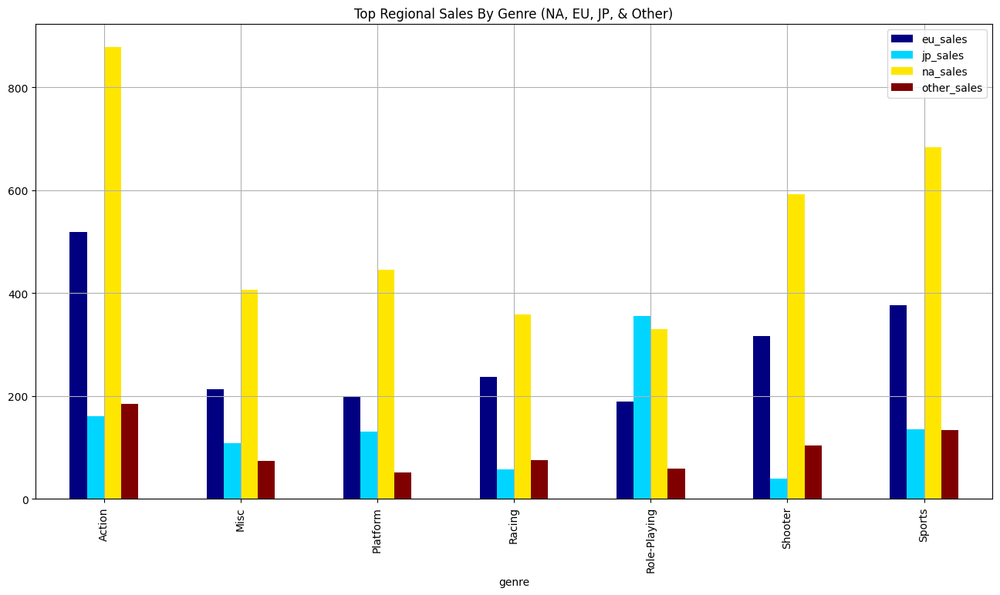

In [234]:
# Create a comparative genre analysis

# Filter out the top 5 ranking genres
top_genres = ['Action','Sports','Shooter','Role-Playing','Platform','Misc','Racing']
all_region_filtered_gen = all_region_gen.query("genre == @top_genres")[['genre','na_sales','eu_sales','jp_sales','other_sales']]

display(all_region_filtered_gen)


# Visualize cross-regional comparison for top genres
all_filtered_pivot_gen = all_region_filtered_gen.pivot_table(index='genre', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc=sum)

all_filtered_pivot_gen.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Top Regional Sales By Genre (NA, EU, JP, & Other)",grid=True)



In [235]:
# Look at top sales in all countries

all_grouped_gen = genre_region.query("genre == @top_genres")
display(all_grouped_gen)

# NA
na_grouped_gen = all_grouped_gen.groupby('genre')['na_sales'].sum()
na_grouped_gen = na_grouped_gen.reset_index()
display(na_grouped)

# JP
jp_grouped_gen = all_grouped_gen.groupby('genre')['jp_sales'].sum()
jp_grouped_gen = jp_grouped_gen.reset_index()
display(jp_grouped_gen)

# EU
eu_grouped_gen = all_grouped_gen.groupby('genre')['eu_sales'].sum()
eu_grouped_gen = eu_grouped_gen.reset_index()
display(eu_grouped_gen)

# Other
other_grouped_gen = all_grouped_gen.groupby('genre')['other_sales'].sum()
other_grouped_gen = other_grouped_gen.reset_index()
display(other_grouped_gen)


# Total
total_grouped_gen = all_grouped_gen.groupby('genre')['total_sales'].sum()
total_grouped_gen = total_grouped_gen.reset_index()
display(total_grouped_gen)


# All
all_top_gen = na_grouped_gen
all_top_gen['jp_sales'] = jp_grouped_gen['jp_sales']
all_top_gen['eu_sales'] = eu_grouped_gen['eu_sales']
all_top_gen['other_sales'] = other_grouped_gen['other_sales']
all_top_gen['total_sales'] = total_grouped_gen['total_sales']
all_top_gen = all_top_gen.sort_values(by='total_sales',ascending=False)
all_top_gen = all_top_gen.reset_index()

display(all_top_gen)


,genre,na_sales,eu_sales,jp_sales,other_sales,total_sales
0,Sports,41.36,28.96,3.77,8.45,82.54
1,Platform,29.08,3.58,6.81,0.77,40.24
2,Racing,15.68,12.76,3.79,3.29,35.52
3,Sports,15.61,10.93,3.28,2.95,32.77
4,Role-Playing,11.27,8.89,10.22,1.00,31.38
...,...,...,...,...,...,...
16708,Platform,0.01,0.00,0.00,0.00,0.01
16709,Racing,0.00,0.00,0.00,0.00,0.00
16710,Action,0.00,0.00,0.01,0.00,0.01
16711,Sports,0.00,0.01,0.00,0.00,0.01


,platform,na_sales,jp_sales,eu_sales,other_sales,total_sales
0,DS,382.40,175.57,188.89,59.26,806.12
1,PS,336.52,139.82,213.61,40.91,730.86
2,PS2,583.84,139.20,339.29,193.44,1255.77
3,PS3,393.49,80.19,329.80,135.68,939.16
4,X360,602.47,12.43,270.75,85.76,971.41


,genre,jp_sales
0,Action,161.43
1,Misc,108.11
2,Platform,130.83
3,Racing,56.71
4,Role-Playing,355.41
5,Shooter,38.76
6,Sports,135.54


,genre,eu_sales
0,Action,519.13
1,Misc,212.74
2,Platform,199.87
3,Racing,236.51
4,Role-Playing,188.71
5,Shooter,317.34
6,Sports,376.78


,genre,other_sales
0,Action,184.60
1,Misc,74.39
2,Platform,51.09
3,Racing,76.10
4,Role-Playing,59.63
5,Shooter,104.11
6,Sports,134.51


,genre,total_sales
0,Action,1744.17
1,Misc,802.51
2,Platform,827.29
3,Racing,728.67
4,Role-Playing,934.56
5,Shooter,1052.45
6,Sports,1331.26


,index,genre,na_sales,jp_sales,eu_sales,other_sales,total_sales
0,0,Action,879.01,161.43,519.13,184.60,1744.17
1,6,Sports,684.43,135.54,376.78,134.51,1331.26
2,5,Shooter,592.24,38.76,317.34,104.11,1052.45
3,4,Role-Playing,330.81,355.41,188.71,59.63,934.56
4,2,Platform,445.50,130.83,199.87,51.09,827.29
5,1,Misc,407.27,108.11,212.74,74.39,802.51
6,3,Racing,359.35,56.71,236.51,76.10,728.67


In [236]:


# Percent each region consumes for each of the top Genres
all_top_gen['na_%'] = ((all_top_gen['na_sales'] / all_top_gen['total_sales']) * 100).round(1)
all_top_gen['jp_%'] = ((all_top_gen['jp_sales'] / all_top_gen['total_sales']) * 100).round(1)
all_top_gen['eu_%'] = ((all_top_gen['eu_sales'] / all_top_gen['total_sales']) * 100).round(1)
all_top_gen['other_%'] = ((all_top_gen['other_sales'] / all_top_gen['total_sales']) * 100).round(1)



display(all_top_gen)


,index,genre,na_sales,jp_sales,eu_sales,other_sales,total_sales,na_%,jp_%,eu_%,other_%
0,0,Action,879.01,161.43,519.13,184.60,1744.17,50.4,9.3,29.8,10.6
1,6,Sports,684.43,135.54,376.78,134.51,1331.26,51.4,10.2,28.3,10.1
2,5,Shooter,592.24,38.76,317.34,104.11,1052.45,56.3,3.7,30.2,9.9
3,4,Role-Playing,330.81,355.41,188.71,59.63,934.56,35.4,38.0,20.2,6.4
4,2,Platform,445.50,130.83,199.87,51.09,827.29,53.9,15.8,24.2,6.2
5,1,Misc,407.27,108.11,212.74,74.39,802.51,50.7,13.5,26.5,9.3
6,3,Racing,359.35,56.71,236.51,76.10,728.67,49.3,7.8,32.5,10.4


,genre,na_sales,jp_sales,eu_sales,other_sales,total_sales,na_%,jp_%,eu_%,other_%
0,Action,879.01,161.43,519.13,184.60,1744.17,50.4,9.3,29.8,10.6
10,Sports,684.43,135.54,376.78,134.51,1331.26,51.4,10.2,28.3,10.1
8,Shooter,592.24,38.76,317.34,104.11,1052.45,56.3,3.7,30.2,9.9
7,Role-Playing,330.81,355.41,188.71,59.63,934.56,35.4,38.0,20.2,6.4
4,Platform,445.50,130.83,199.87,51.09,827.29,53.9,15.8,24.2,6.2
3,Misc,407.27,108.11,212.74,74.39,802.51,50.7,13.5,26.5,9.3
6,Racing,359.35,56.71,236.51,76.10,728.67,49.3,7.8,32.5,10.4
2,Fighting,223.36,87.48,100.33,36.36,447.53,49.9,19.5,22.4,8.1
9,Simulation,181.92,63.80,113.52,30.73,389.97,46.6,16.4,29.1,7.9
5,Puzzle,122.87,57.31,50.01,12.38,242.57,50.7,23.6,20.6,5.1


<AxesSubplot:title={'center':'Top Regional Sales By Genre (NA, EU, JP, & Other)'}, xlabel='genre'>

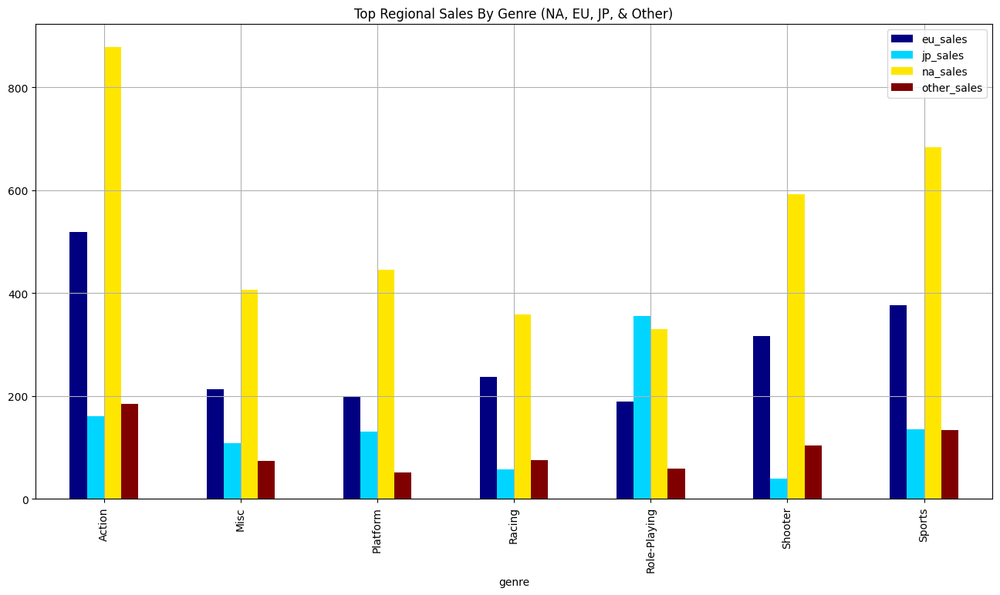

In [237]:
# Percent each region consumes for ALL genres
all_gen = all_region_gen_sales.groupby('genre')['na_sales','jp_sales','eu_sales','other_sales','total_sales'].sum()

na_gen = all_region_gen_sales.groupby('genre')['na_sales'].sum()
na_gen = na_gen.reset_index()
jp_gen = all_region_gen_sales.groupby('genre')['jp_sales'].sum()
jp_gen = jp_gen.reset_index()
eu_gen = all_region_gen_sales.groupby('genre')['eu_sales'].sum()
eu_gen = eu_gen.reset_index()
other_gen = all_region_gen_sales.groupby('genre')['other_sales'].sum()
other_gen = other_gen.reset_index()
total_gen = all_region_gen_sales.groupby('genre')['total_sales'].sum()
total_gen = total_gen.reset_index()

all_gen['na_%'] = ((all_gen['na_sales'] / all_gen['total_sales']) * 100).round(1)
all_gen['jp_%'] = ((all_gen['jp_sales'] / all_gen['total_sales']) * 100).round(1)
all_gen['eu_%'] = ((all_gen['eu_sales'] / all_gen['total_sales']) * 100).round(1)
all_gen['other_%'] = ((all_gen['other_sales'] / all_gen['total_sales']) * 100).round(1)

all_gen = all_gen.reset_index().sort_values(by='total_sales',ascending=False)

display(all_gen)

all_filtered_pivot_gen.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Top Regional Sales By Genre (NA, EU, JP, & Other)",grid=True)

**Summay of Sales Among Regionally Popular Genres**
- (#1) North America: Almost 3.7 billion among 7 top Genres
- (#2) Europe: Over 2.05 billion among 7 top Genres
- (#3) Japan: Over 986 million among 7 top Genres
- (#4) Other: Over 684 million among 7 top Genres


**Top Genre Sales**

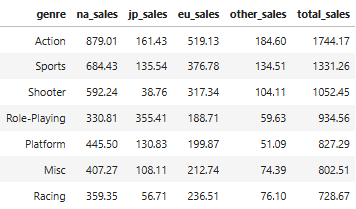

**Top Overall Sales Among Regionally Popular Genres**
- Action
- Sports
- Shooter
- Role-Playing
- Platform
- Misc
- Racing

**Percentage Each Region Makes Up for Top Genres**

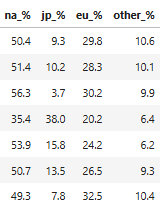


**Percent Each Region Makes Up for ALL Genres**

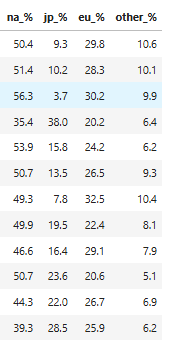

## 4.3 ESRB Rating Impact Analysis

Finally, let's examine how ESRB ratings affect sales in each region:

,platform,na_sales,eu_sales,jp_sales,other_sales,total_sales
0,Wii,41.36,28.96,3.77,8.45,82.54
1,NES,29.08,3.58,6.81,0.77,40.24
2,Wii,15.68,12.76,3.79,3.29,35.52
3,Wii,15.61,10.93,3.28,2.95,32.77
4,GB,11.27,8.89,10.22,1.00,31.38
...,...,...,...,...,...,...
16710,PS3,0.00,0.00,0.01,0.00,0.01
16711,X360,0.00,0.01,0.00,0.00,0.01
16712,PSV,0.00,0.00,0.01,0.00,0.01
16713,GBA,0.01,0.00,0.00,0.00,0.01


,rating,na_sales,eu_sales,jp_sales,other_sales,total_sales
0,E,41.36,28.96,3.77,8.45,82.54
1,NaN,29.08,3.58,6.81,0.77,40.24
2,E,15.68,12.76,3.79,3.29,35.52
3,E,15.61,10.93,3.28,2.95,32.77
4,NaN,11.27,8.89,10.22,1.00,31.38
...,...,...,...,...,...,...
16710,NaN,0.00,0.00,0.01,0.00,0.01
16711,NaN,0.00,0.01,0.00,0.00,0.01
16712,NaN,0.00,0.00,0.01,0.00,0.01
16713,NaN,0.01,0.00,0.00,0.00,0.01


,rating,na_sales,eu_sales,jp_sales,other_sales,total_sales
0,E,41.36,28.96,3.77,8.45,82.54
1,NaN,29.08,3.58,6.81,0.77,40.24
2,E,15.68,12.76,3.79,3.29,35.52
3,E,15.61,10.93,3.28,2.95,32.77
4,NaN,11.27,8.89,10.22,1.00,31.38
...,...,...,...,...,...,...
16710,NaN,0.00,0.00,0.01,0.00,0.01
16711,NaN,0.00,0.01,0.00,0.00,0.01
16712,NaN,0.00,0.00,0.01,0.00,0.01
16713,NaN,0.01,0.00,0.00,0.00,0.01


<AxesSubplot:title={'center':'All Countries Sales By ESRB Rating (NA, EU, JP, & Other) (Games)'}, xlabel='rating'>

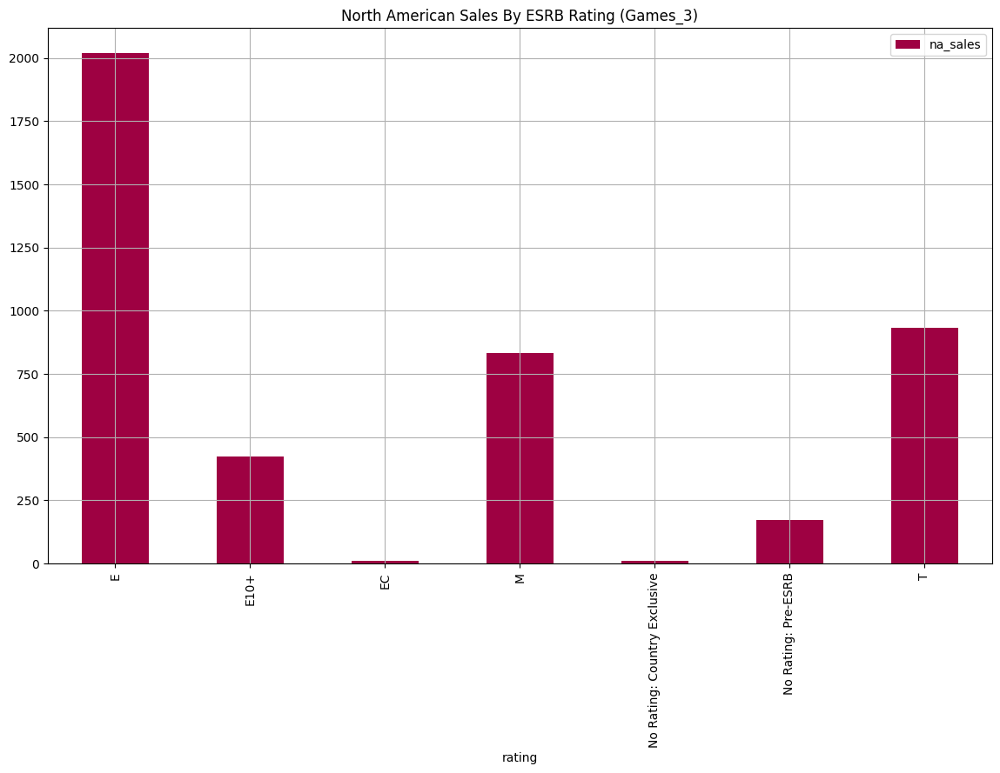

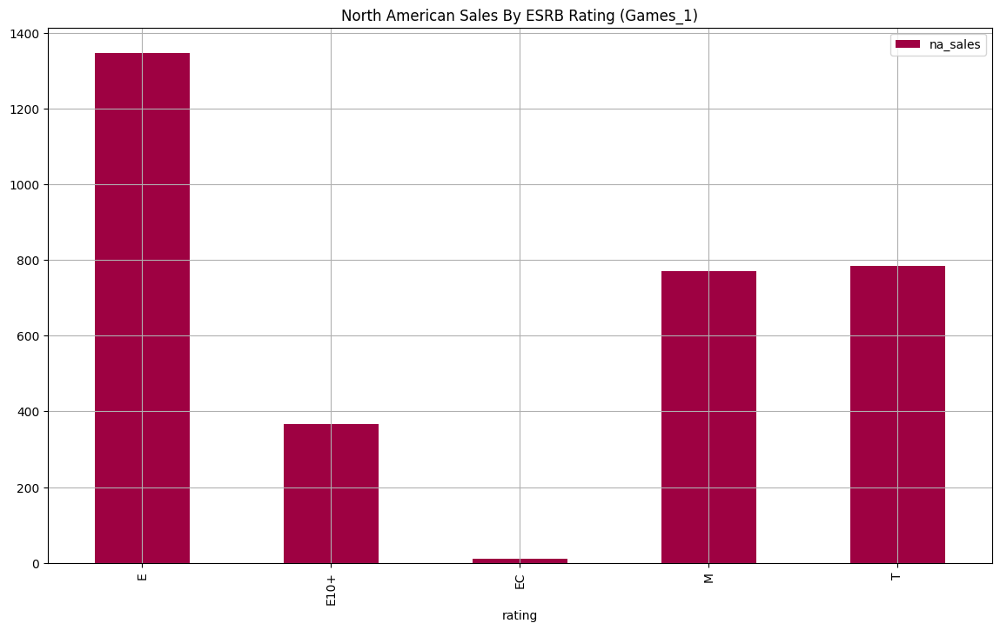

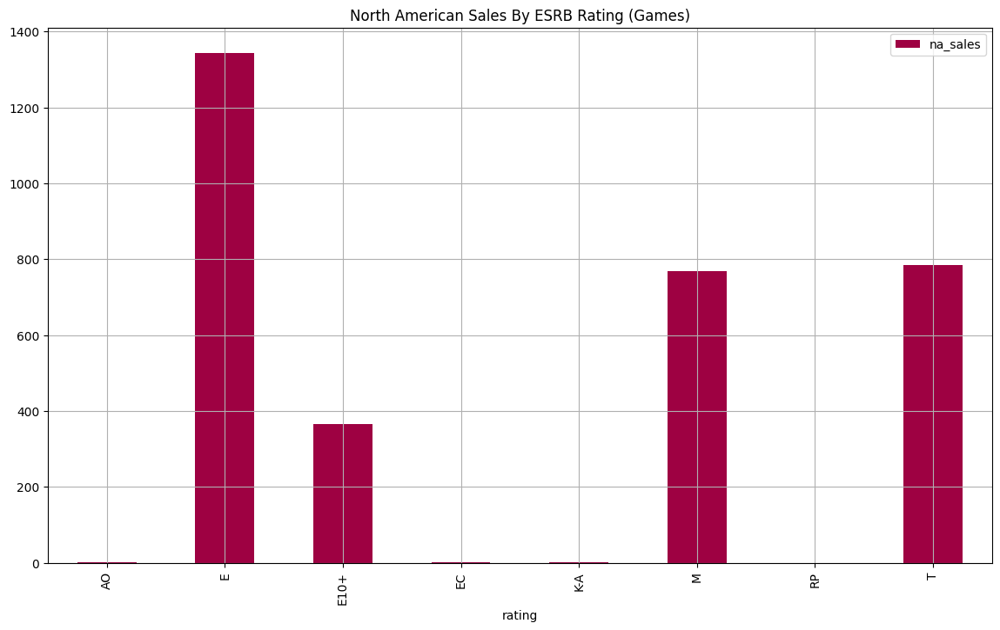

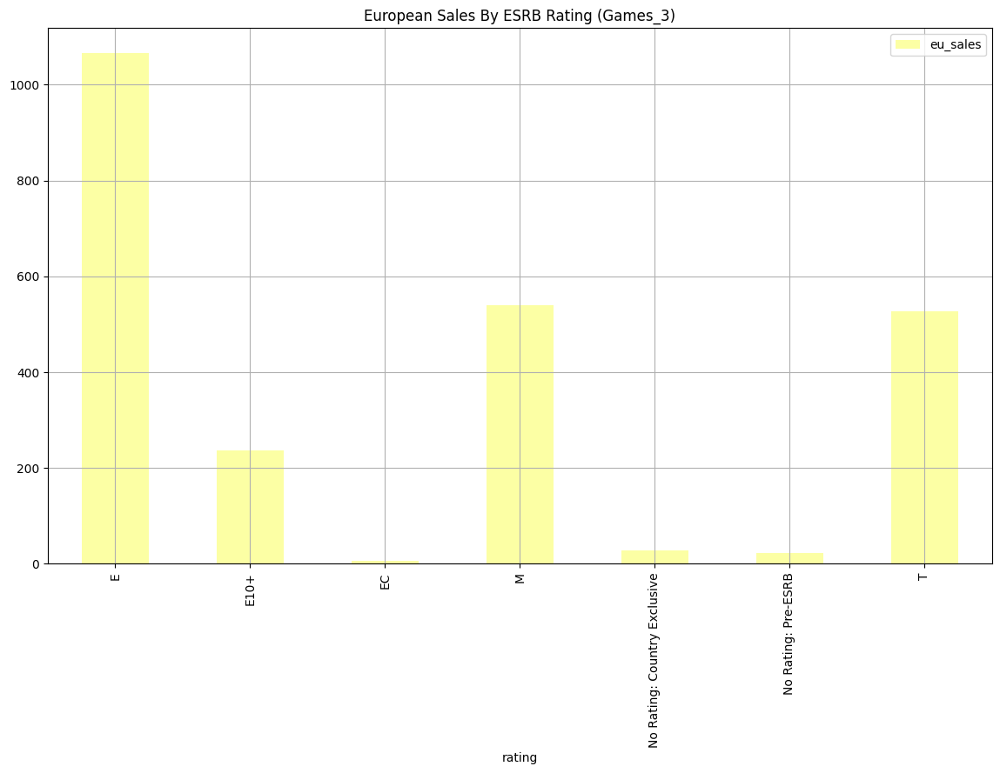

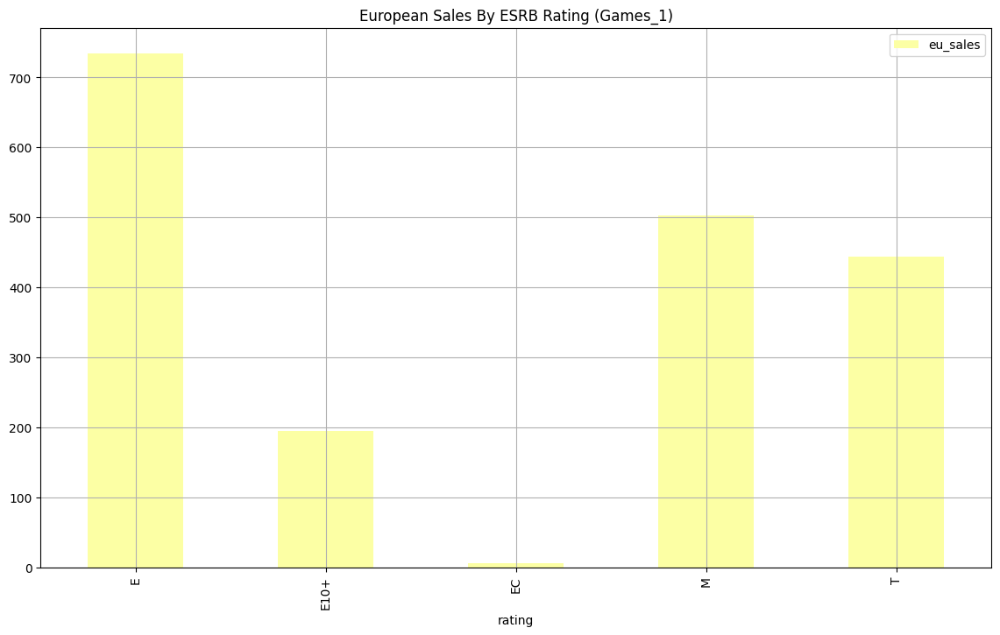

...

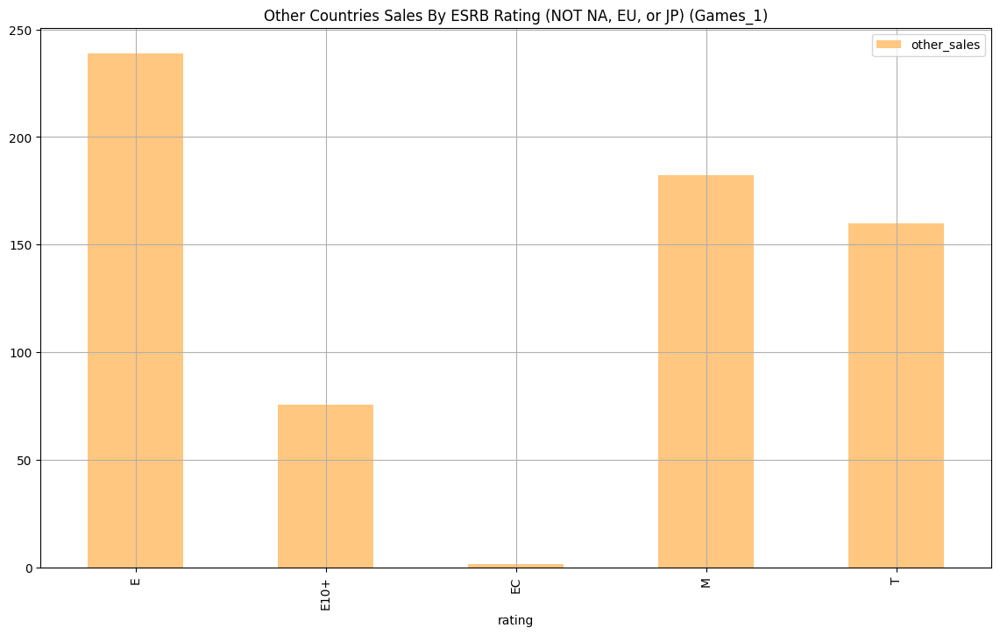

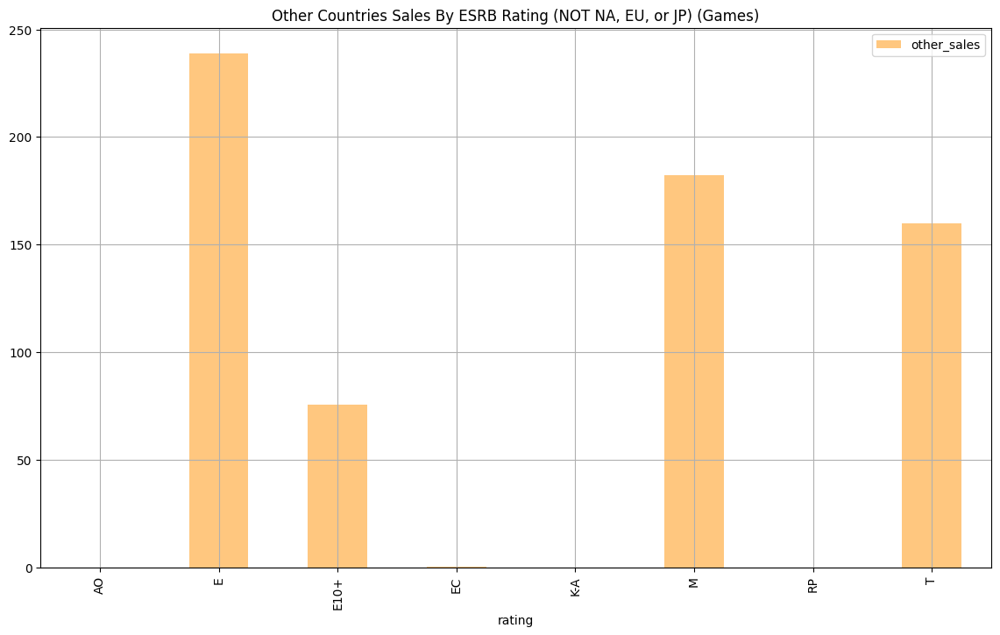

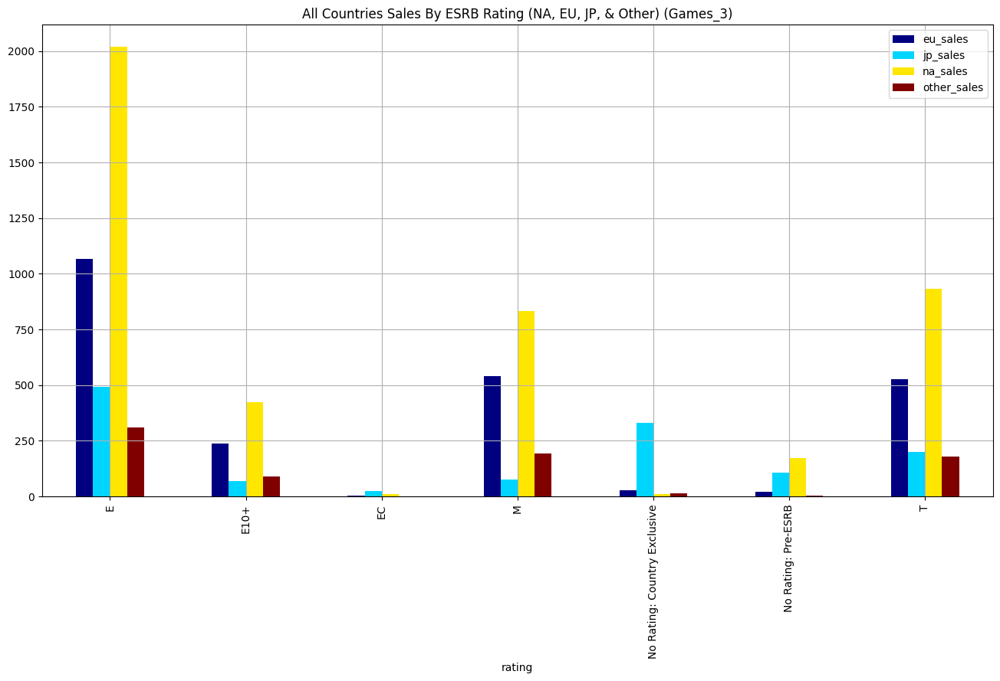

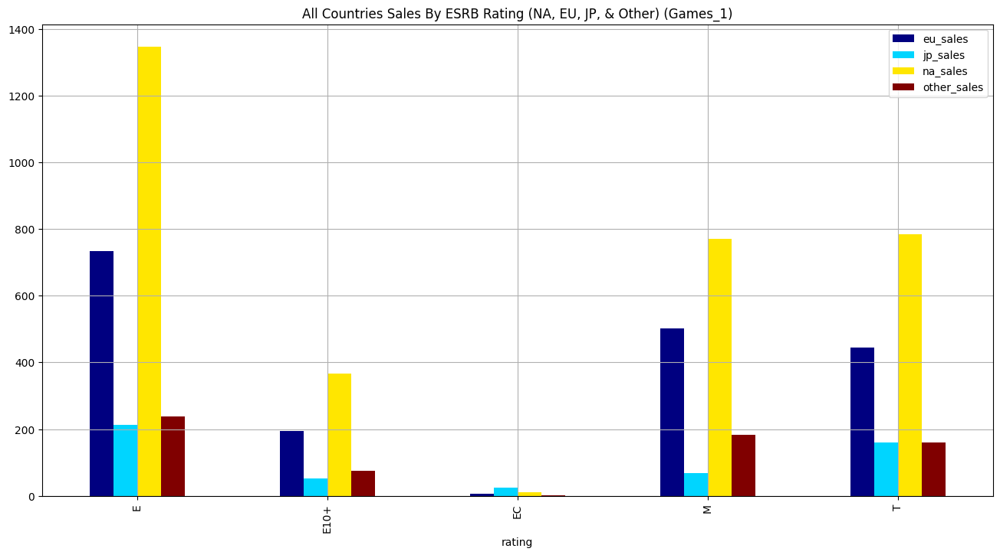

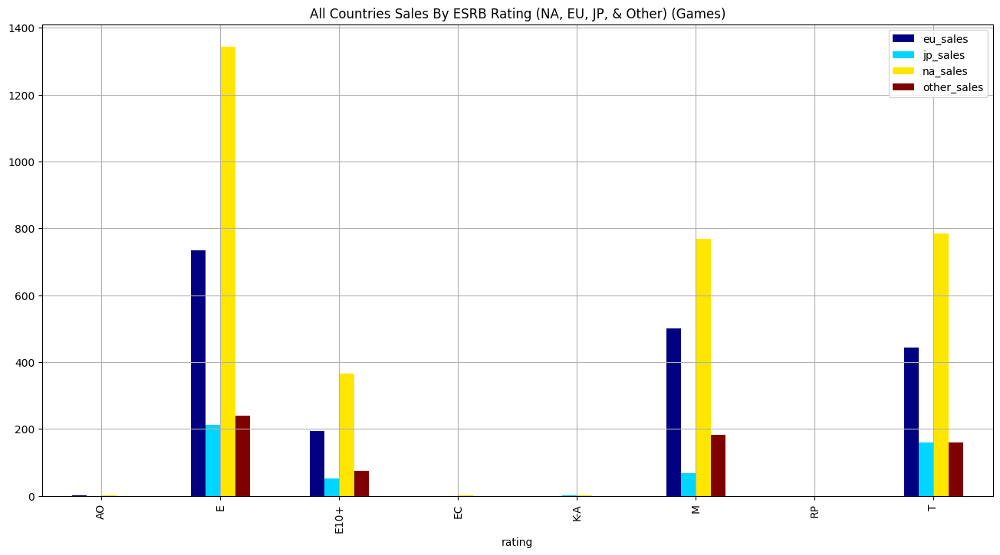

In [238]:
# Function to analyze ESRB rating impact

# Analyze the original data & the updated games_1 data since we changed the ESRB ratings so much
platforms_info_og = games[['platform','year_of_release','genre','na_sales','eu_sales','jp_sales','other_sales','total_sales','user_score','critic_score','rating']]
platforms_info_og_1 =  games_1[['platform','year_of_release','genre','na_sales','eu_sales','jp_sales','other_sales','total_sales','user_score','critic_score','rating']]

# games_3
rating_region = platforms_info[['rating','na_sales','eu_sales','jp_sales','other_sales','total_sales']]
display(platforms_region)

# games_1
rating_region_og_1 = platforms_info_og_1[['rating','na_sales','eu_sales','jp_sales','other_sales','total_sales']]
display(rating_region_og_1)


# games
rating_region_og = platforms_info_og[['rating','na_sales','eu_sales','jp_sales','other_sales','total_sales']]
display(rating_region_og)



# Analyze each region (games_3)
na_region_esrb = rating_region[['rating','na_sales']]
eu_region_esrb = rating_region[['rating','eu_sales']]
jp_region_esrb = rating_region[['rating','jp_sales']]
other_region_esrb = rating_region[['rating','other_sales']]
all_region_esrb = rating_region[['rating','na_sales','eu_sales','jp_sales','other_sales']]
all_region_esrb_sales = rating_region[['rating','na_sales','eu_sales','jp_sales','other_sales','total_sales']]


# Analyze each region (games_1)
na_region_esrb_og_1 = rating_region_og_1[['rating','na_sales']]
eu_region_esrb_og_1 = rating_region_og_1[['rating','eu_sales']]
jp_region_esrb_og_1 = rating_region_og_1[['rating','jp_sales']]
other_region_esrb_og_1 = rating_region_og_1[['rating','other_sales']]
all_region_esrb_og_1 = rating_region_og_1[['rating','na_sales','eu_sales','jp_sales','other_sales']]
all_region_esrb_sales_og_1 = rating_region_og_1[['rating','na_sales','eu_sales','jp_sales','other_sales','total_sales']]



# Analyze each region (games)
na_region_esrb_og = rating_region_og[['rating','na_sales']]
eu_region_esrb_og = rating_region_og[['rating','eu_sales']]
jp_region_esrb_og = rating_region_og[['rating','jp_sales']]
other_region_esrb_og = rating_region_og[['rating','other_sales']]
all_region_esrb_og = rating_region_og[['rating','na_sales','eu_sales','jp_sales','other_sales']]
all_region_esrb_sales_og = rating_region_og[['rating','na_sales','eu_sales','jp_sales','other_sales','total_sales']]



# Analyze NA region

# Make a pivot table for the NA Region

na_pivot_esrb = na_region_esrb.pivot_table(index='rating', values='na_sales',aggfunc='sum')
na_pivot_esrb_og_1 = na_region_esrb_og_1.pivot_table(index='rating', values='na_sales',aggfunc='sum')
na_pivot_esrb_og = na_region_esrb_og.pivot_table(index='rating', values='na_sales',aggfunc='sum')

na_pivot_esrb.plot(kind='bar', figsize=(14,8), colormap = 'Spectral', title="North American Sales By ESRB Rating (Games_3)",grid=True)
na_pivot_esrb_og_1.plot(kind='bar', figsize=(14,8), colormap = 'Spectral', title="North American Sales By ESRB Rating (Games_1)",grid=True)
na_pivot_esrb_og.plot(kind='bar', figsize=(14,8), colormap = 'Spectral', title="North American Sales By ESRB Rating (Games)",grid=True)




# Make a pivot table for the EU Region

eu_pivot_esrb = eu_region_esrb.pivot_table(index='rating', values='eu_sales',aggfunc='sum')
eu_pivot_esrb_og_1 = eu_region_esrb_og_1.pivot_table(index='rating', values='eu_sales',aggfunc='sum')
eu_pivot_esrb_og = eu_region_esrb_og.pivot_table(index='rating', values='eu_sales',aggfunc='sum')

eu_pivot_esrb.plot(kind='bar', figsize=(14,8), colormap = 'inferno_r', title="European Sales By ESRB Rating (Games_3)",grid=True)
eu_pivot_esrb_og_1.plot(kind='bar', figsize=(14,8), colormap = 'inferno_r', title="European Sales By ESRB Rating (Games_1)",grid=True)
eu_pivot_esrb_og.plot(kind='bar', figsize=(14,8), colormap = 'inferno_r', title="European Sales By ESRB Rating (Games)",grid=True)



# Make a pivot table for the JP Region

jp_pivot_esrb = jp_region_esrb.pivot_table(index='rating', values='jp_sales',aggfunc='sum')
jp_pivot_esrb_og_1 = jp_region_esrb_og_1.pivot_table(index='rating', values='jp_sales',aggfunc='sum')
jp_pivot_esrb_og = jp_region_esrb_og.pivot_table(index='rating', values='jp_sales',aggfunc='sum')

jp_pivot_esrb.plot(kind='bar', figsize=(14,8), colormap = 'Accent', title="Japanese Sales By ESRB Rating (Games_3)",grid=True)
jp_pivot_esrb_og_1.plot(kind='bar', figsize=(14,8), colormap = 'Accent', title="Japanese Sales By ESRB Rating (Games_1)",grid=True)
jp_pivot_esrb_og.plot(kind='bar', figsize=(14,8), colormap = 'Accent', title="Japanese Sales By ESRB Rating (Games)",grid=True)


# Make a pivot table for the Other Region


other_pivot_esrb = other_region_esrb.pivot_table(index='rating', values='other_sales',aggfunc='sum')
other_pivot_esrb_og_1 = other_region_esrb_og_1.pivot_table(index='rating', values='other_sales',aggfunc='sum')
other_pivot_esrb_og = other_region_esrb_og.pivot_table(index='rating', values='other_sales',aggfunc='sum')

other_pivot_esrb.plot(kind='bar', figsize=(14,8), colormap = 'copper_r', title="Other Countries Sales By ESRB Rating (NOT NA, EU, or JP) (Games_3)",grid=True)
other_pivot_esrb_og_1.plot(kind='bar', figsize=(14,8), colormap = 'copper_r', title="Other Countries Sales By ESRB Rating (NOT NA, EU, or JP) (Games_1)",grid=True)
other_pivot_esrb_og.plot(kind='bar', figsize=(14,8), colormap = 'copper_r', title="Other Countries Sales By ESRB Rating (NOT NA, EU, or JP) (Games)",grid=True)


# Make a pivot table with all countries

all_pivot_esrb = all_region_esrb.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='sum')
all_pivot_esrb_og_1 = all_region_esrb_og_1.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='sum')
all_pivot_esrb_og = all_region_esrb_og.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='sum')

all_pivot_esrb.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="All Countries Sales By ESRB Rating (NA, EU, JP, & Other) (Games_3)",grid=True)
all_pivot_esrb_og_1.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="All Countries Sales By ESRB Rating (NA, EU, JP, & Other) (Games_1)",grid=True)
all_pivot_esrb_og.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="All Countries Sales By ESRB Rating (NA, EU, JP, & Other) (Games)",grid=True)


**North America**

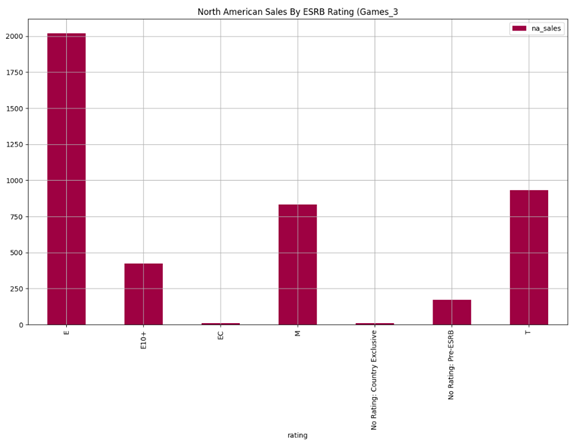 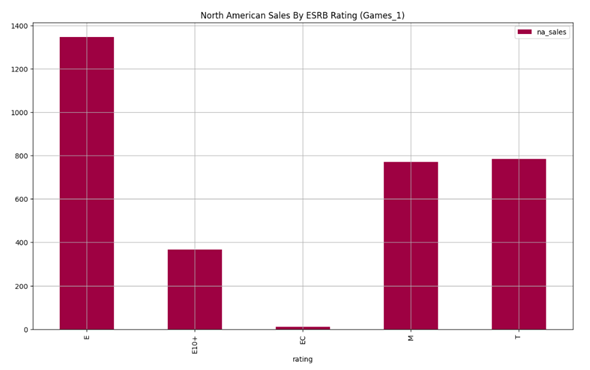 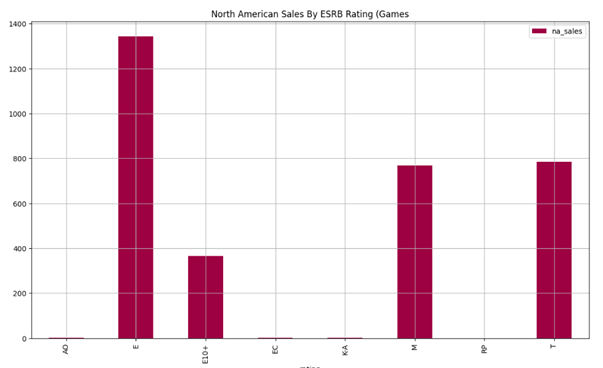

**All graphs show the same ranking: E, T, M, E10+, EC**

**Europe**

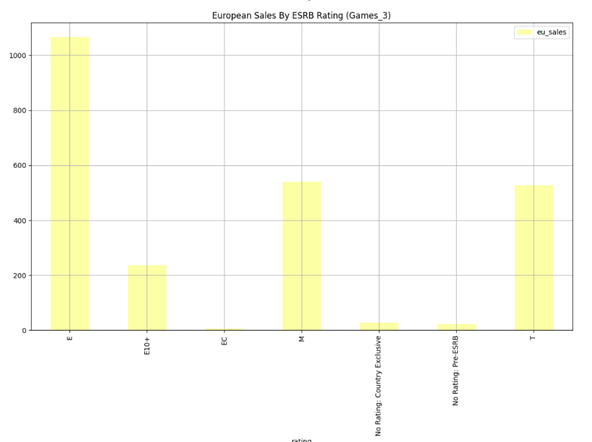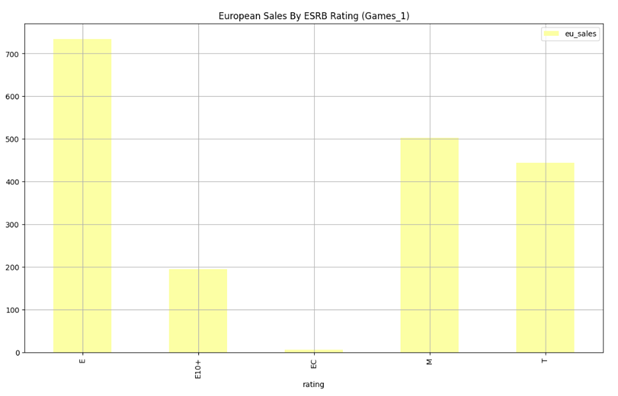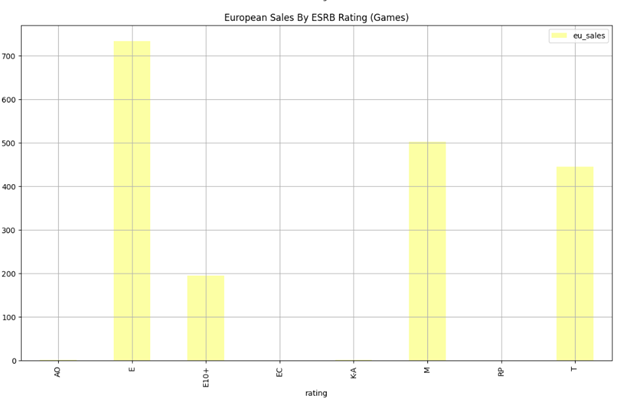

**All graphs show the same ranking: E, M, T, E10+, EC**

**Japan**

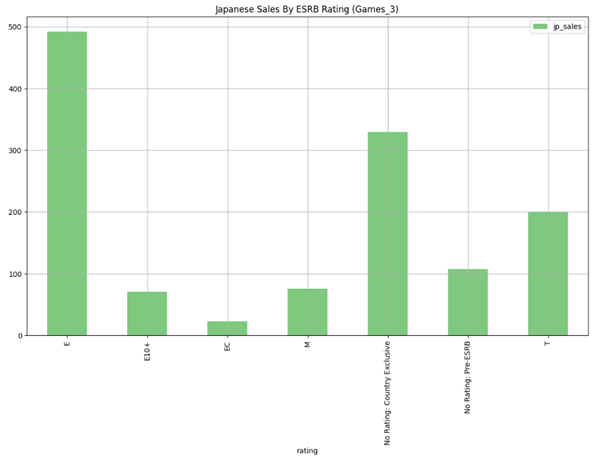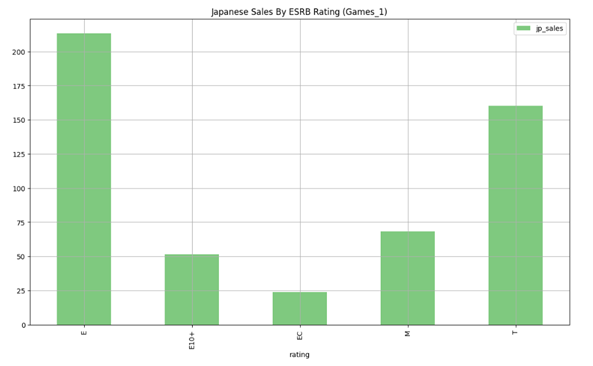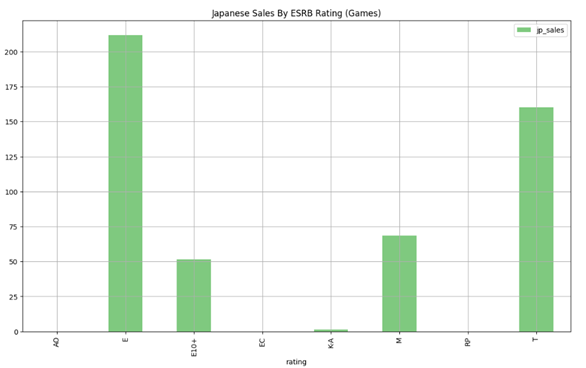

**All graphs show the same ranking: E, T, M, E10+, EC**

**Other**

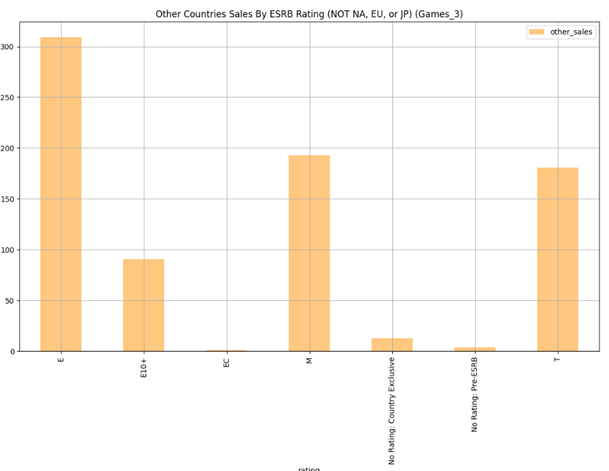 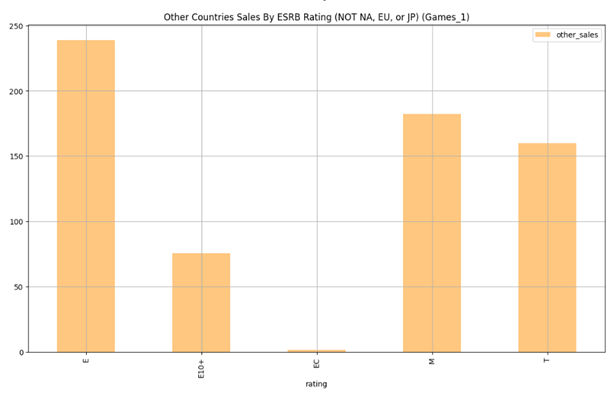 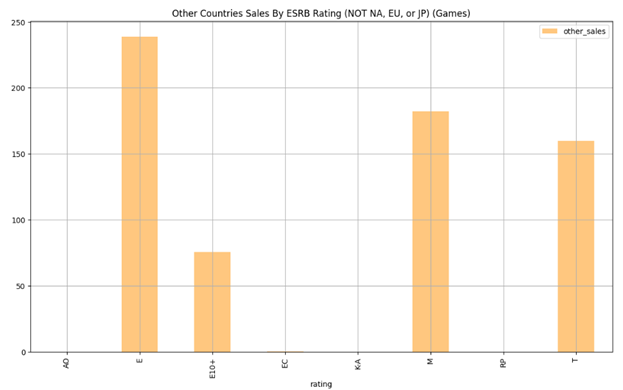

**All graphs show the same ranking: E, M, T, E10+, EC**

**All Regions**

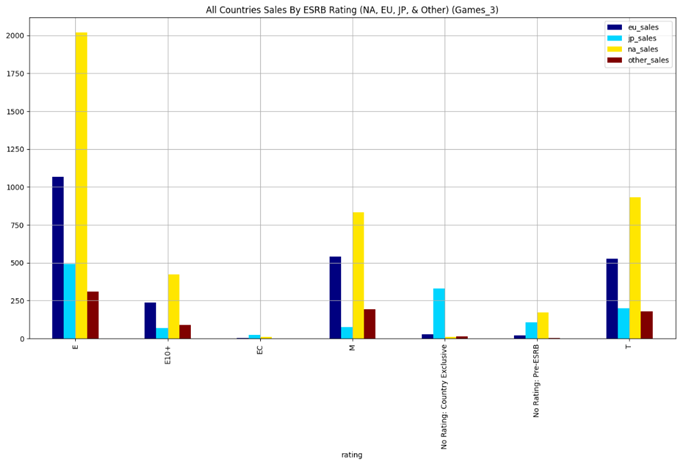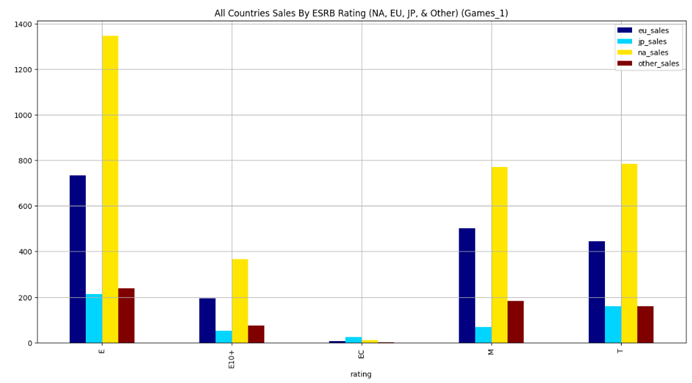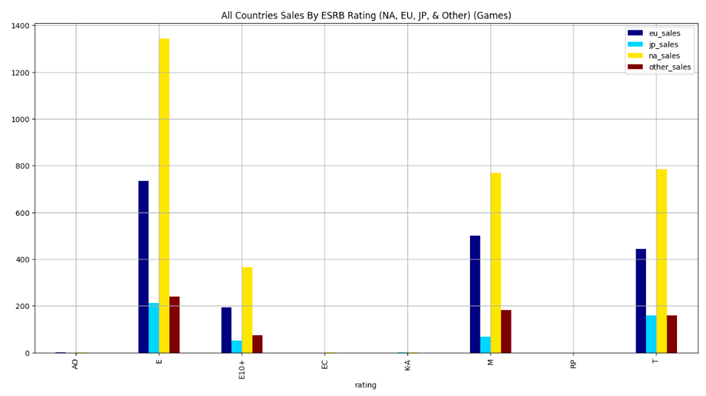


**The only difference between these graphs is that Japan ranks higher in E ratings in the games_3 data than other countries**

The other 2 graphs are almost identical.

**Summary Analysis**

- **Note:** I will only be analyzing E, E10+, M, & T data because EC data is fairly insignificant in all cases.
- North America & Japan Rank: E, T, M, E10+
- Europe & Other Rank: E, M, T, E10+
- No need to use the original games data to compare since it is nearly identical, plus we are no longer using the insignificant EC data

,rating,na_sales,eu_sales,jp_sales,other_sales
0,E,41.36,28.96,3.77,8.45
1,E,29.08,3.58,6.81,0.77
2,E,15.68,12.76,3.79,3.29
3,E,15.61,10.93,3.28,2.95
4,E,11.27,8.89,10.22,1.00
...,...,...,...,...,...
16709,E,0.00,0.00,0.00,0.00
16710,T,0.00,0.00,0.01,0.00
16711,E,0.00,0.01,0.00,0.00
16712,T,0.00,0.00,0.01,0.00


,rating,na_sales,eu_sales,jp_sales,other_sales
0,E,41.36,28.96,3.77,8.45
2,E,15.68,12.76,3.79,3.29
3,E,15.61,10.93,3.28,2.95
6,E,11.28,9.14,6.50,2.88
7,E,13.96,9.18,2.93,2.84
...,...,...,...,...,...
16697,E,0.01,0.00,0.00,0.00
16698,E,0.01,0.00,0.00,0.00
16702,E10+,0.00,0.01,0.00,0.00
16704,E,0.01,0.00,0.00,0.00


<AxesSubplot:title={'center':'Top Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_1)'}, xlabel='rating'>

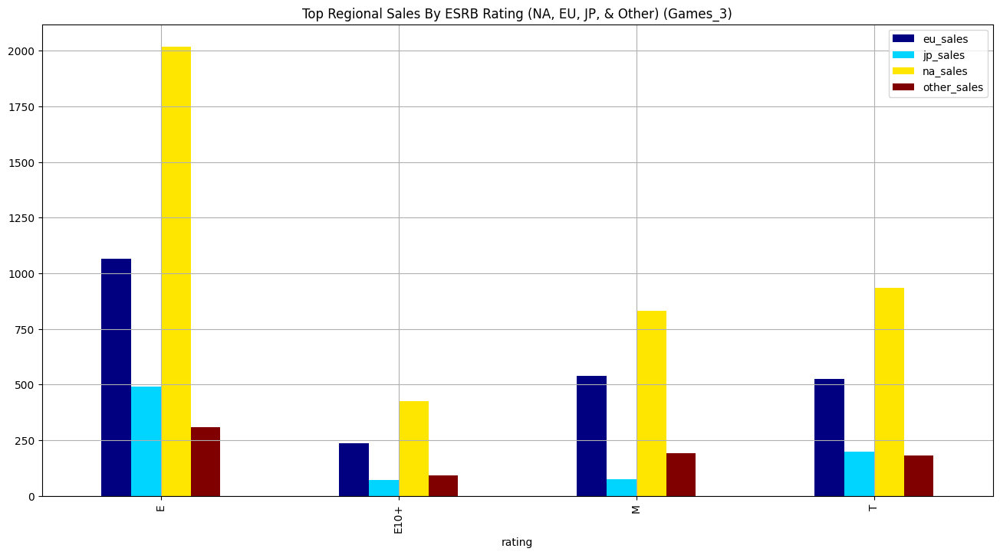

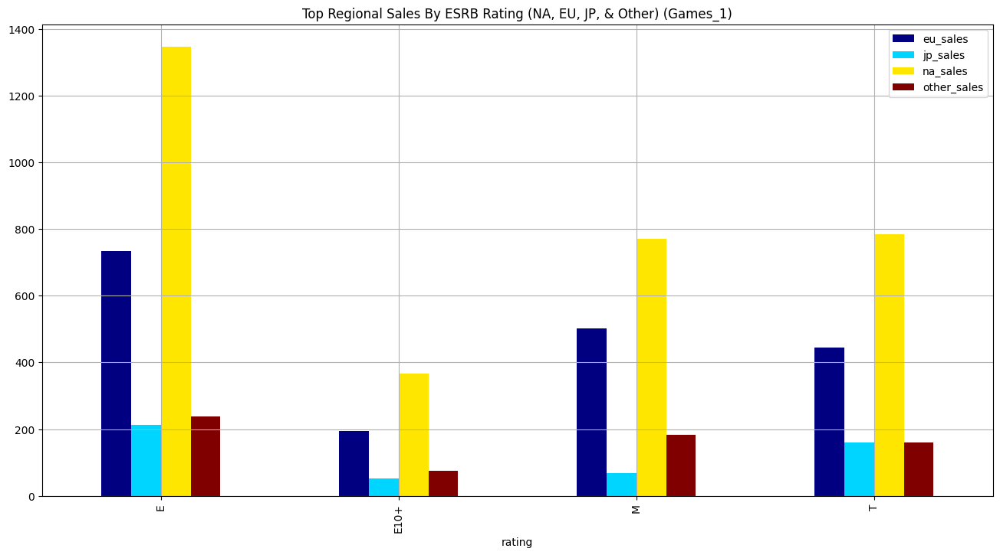

In [239]:
# Analyze ESRB impact for each region
# Create a comparative genre analysis


# Filter out the main ratings
top_rating = ['E', 'T','M','E10+']
all_region_filtered_rate = rating_region.query("rating == @top_rating")[['rating','na_sales','eu_sales','jp_sales','other_sales']]
all_region_filtered_rate_og_1 = rating_region_og_1.query("rating == @top_rating")[['rating','na_sales','eu_sales','jp_sales','other_sales']]

display(all_region_filtered_rate)
display(all_region_filtered_rate_og_1)



# Visualize cross-regional comparison for ratings
all_filtered_pivot_rate = all_region_filtered_rate.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='sum')
all_filtered_pivot_rate_og_1 = all_region_filtered_rate_og_1.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='sum')


all_filtered_pivot_rate.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Top Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_3)",grid=True)
all_filtered_pivot_rate_og_1.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Top Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_1)",grid=True)



In [240]:
# Look at ESRB ratings in a chart (Both games_1 & games_3)

all_grouped_rate = rating_region.query("rating == @top_rating")
all_grouped_rate_og_1 = rating_region_og_1.query("rating == @top_rating")


# NA
na_grouped_rate = all_grouped_rate.groupby('rating')['na_sales'].sum()
na_grouped_rate = na_grouped_rate.reset_index()

na_grouped_rate_og_1 = all_grouped_rate_og_1.groupby('rating')['na_sales'].sum()
na_grouped_rate_og_1 = na_grouped_rate_og_1.reset_index()

# JP
jp_grouped_rate = all_grouped_rate.groupby('rating')['jp_sales'].sum()
jp_grouped_rate = jp_grouped_rate.reset_index()

jp_grouped_rate_og_1 = all_grouped_rate_og_1.groupby('rating')['jp_sales'].sum()
jp_grouped_rate_og_1 = jp_grouped_rate_og_1.reset_index()


# EU
eu_grouped_rate = all_grouped_rate.groupby('rating')['eu_sales'].sum()
eu_grouped_rate = eu_grouped_rate.reset_index()

eu_grouped_rate_og_1 = all_grouped_rate_og_1.groupby('rating')['eu_sales'].sum()
eu_grouped_rate_og_1 = eu_grouped_rate_og_1.reset_index()


# Other

other_grouped_rate = all_grouped_rate.groupby('rating')['other_sales'].sum()
other_grouped_rate = other_grouped_rate.reset_index()

other_grouped_rate_og_1 = all_grouped_rate_og_1.groupby('rating')['other_sales'].sum()
other_grouped_rate_og_1 = other_grouped_rate_og_1.reset_index()


# Total
total_grouped_rate = all_grouped_rate.groupby('rating')['total_sales'].sum()
total_grouped_rate = total_grouped_rate.reset_index()

total_grouped_rate_og_1 = all_grouped_rate_og_1.groupby('rating')['total_sales'].sum()
total_grouped_rate_og_1 = total_grouped_rate_og_1.reset_index()





# All (games_3)
all_top_rate = na_grouped_rate
all_top_rate['jp_sales'] = jp_grouped_rate['jp_sales']
all_top_rate['eu_sales'] = eu_grouped_rate['eu_sales']
all_top_rate['other_sales'] = other_grouped_rate['other_sales']
all_top_rate['total_sales'] = total_grouped_rate['total_sales']
all_top_rate = all_top_rate.sort_values(by='total_sales',ascending=False)
all_top_rate = all_top_rate.reset_index()

display(all_top_rate)



# All (games_1)
all_top_rate_og_1 = na_grouped_rate_og_1
all_top_rate_og_1['jp_sales'] = jp_grouped_rate_og_1['jp_sales']
all_top_rate_og_1['eu_sales'] = eu_grouped_rate_og_1['eu_sales']
all_top_rate_og_1['other_sales'] = other_grouped_rate_og_1['other_sales']
all_top_rate_og_1['total_sales'] = total_grouped_rate_og_1['total_sales']
all_top_rate_og_1 = all_top_rate_og_1.sort_values(by='total_sales',ascending=False)
all_top_rate_og_1 = all_top_rate_og_1.reset_index()

display(all_top_rate_og_1)


,index,rating,na_sales,jp_sales,eu_sales,other_sales,total_sales
0,0,E,2018.14,491.72,1065.43,309.01,3884.30
1,3,T,933.93,200.05,526.89,180.91,1841.78
2,2,M,832.19,75.75,540.42,193.01,1641.37
3,1,E10+,424.30,70.60,236.82,90.73,822.45


,index,rating,na_sales,jp_sales,eu_sales,other_sales,total_sales
0,0,E,1345.98,213.32,734.35,238.85,2532.50
1,3,T,784.54,160.20,444.59,159.82,1549.15
2,2,M,769.85,68.42,502.59,182.17,1523.03
3,1,E10+,365.76,51.44,194.77,75.65,687.62


In [241]:

# Percent each region consumes for main ESRB ratings
all_top_rate['na_%'] = ((all_top_rate['na_sales'] / all_top_rate['total_sales']) * 100).round(1)
all_top_rate['jp_%'] = ((all_top_rate['jp_sales'] / all_top_rate['total_sales']) * 100).round(1)
all_top_rate['eu_%'] = ((all_top_rate['eu_sales'] / all_top_rate['total_sales']) * 100).round(1)
all_top_rate['other_%'] = ((all_top_rate['other_sales'] / all_top_rate['total_sales']) * 100).round(1)

all_top_rate_og_1['na_%'] = ((all_top_rate_og_1['na_sales'] / all_top_rate_og_1['total_sales']) * 100).round(1)
all_top_rate_og_1['jp_%'] = ((all_top_rate_og_1['jp_sales'] / all_top_rate_og_1['total_sales']) * 100).round(1)
all_top_rate_og_1['eu_%'] = ((all_top_rate_og_1['eu_sales'] / all_top_rate_og_1['total_sales']) * 100).round(1)
all_top_rate_og_1['other_%'] = ((all_top_rate_og_1['other_sales'] / all_top_rate_og_1['total_sales']) * 100).round(1)

display(all_top_rate)
display(all_top_rate_og_1)



,index,rating,na_sales,jp_sales,eu_sales,other_sales,total_sales,na_%,jp_%,eu_%,other_%
0,0,E,2018.14,491.72,1065.43,309.01,3884.30,52.0,12.7,27.4,8.0
1,3,T,933.93,200.05,526.89,180.91,1841.78,50.7,10.9,28.6,9.8
2,2,M,832.19,75.75,540.42,193.01,1641.37,50.7,4.6,32.9,11.8
3,1,E10+,424.30,70.60,236.82,90.73,822.45,51.6,8.6,28.8,11.0


,index,rating,na_sales,jp_sales,eu_sales,other_sales,total_sales,na_%,jp_%,eu_%,other_%
0,0,E,1345.98,213.32,734.35,238.85,2532.50,53.1,8.4,29.0,9.4
1,3,T,784.54,160.20,444.59,159.82,1549.15,50.6,10.3,28.7,10.3
2,2,M,769.85,68.42,502.59,182.17,1523.03,50.5,4.5,33.0,12.0
3,1,E10+,365.76,51.44,194.77,75.65,687.62,53.2,7.5,28.3,11.0


<AxesSubplot:title={'center':'Mean Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_1)'}, xlabel='rating'>

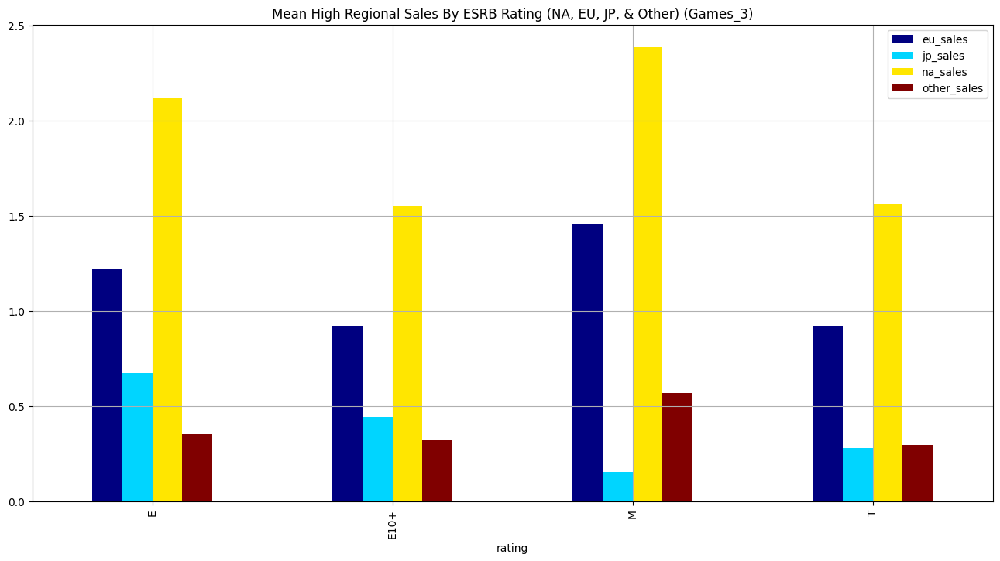

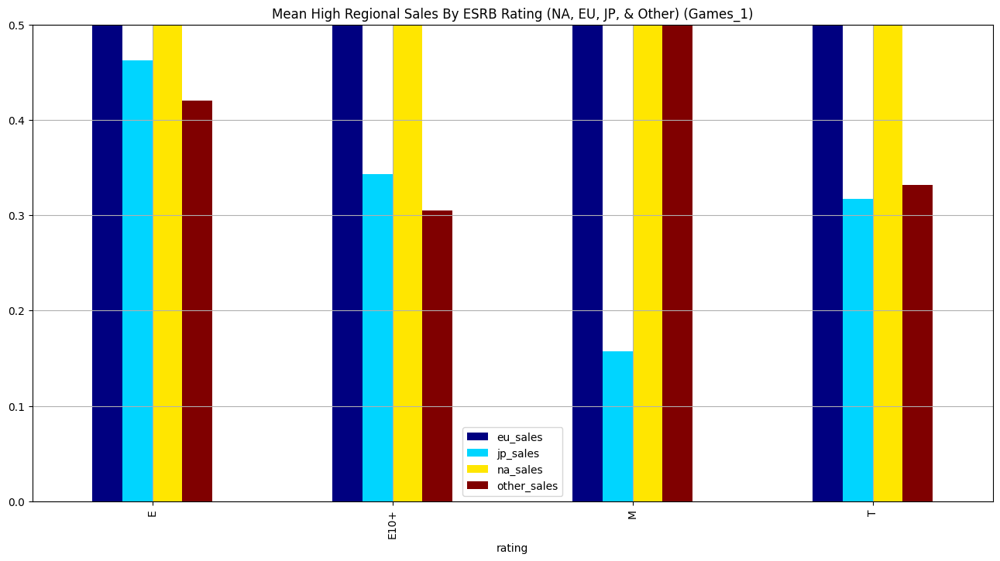

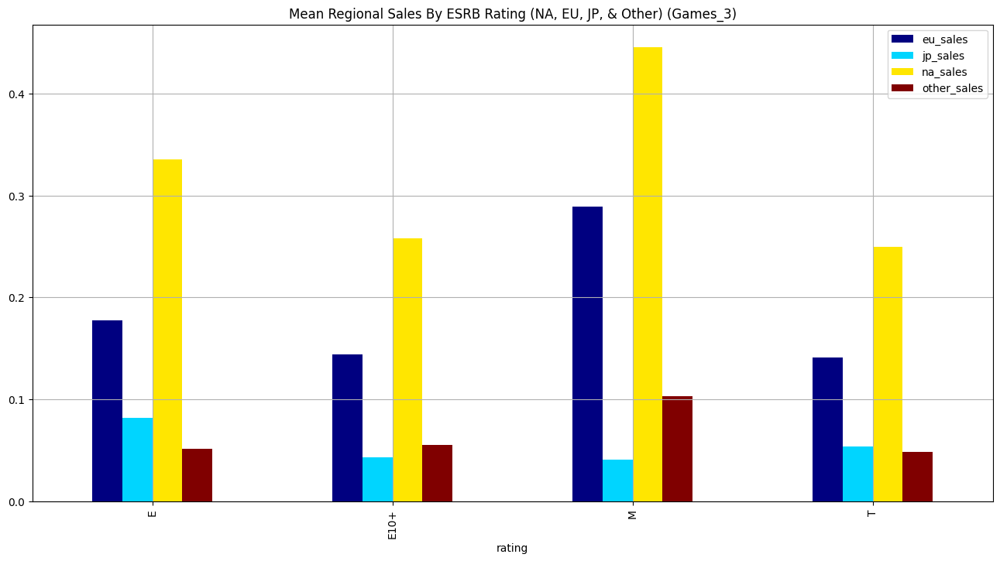

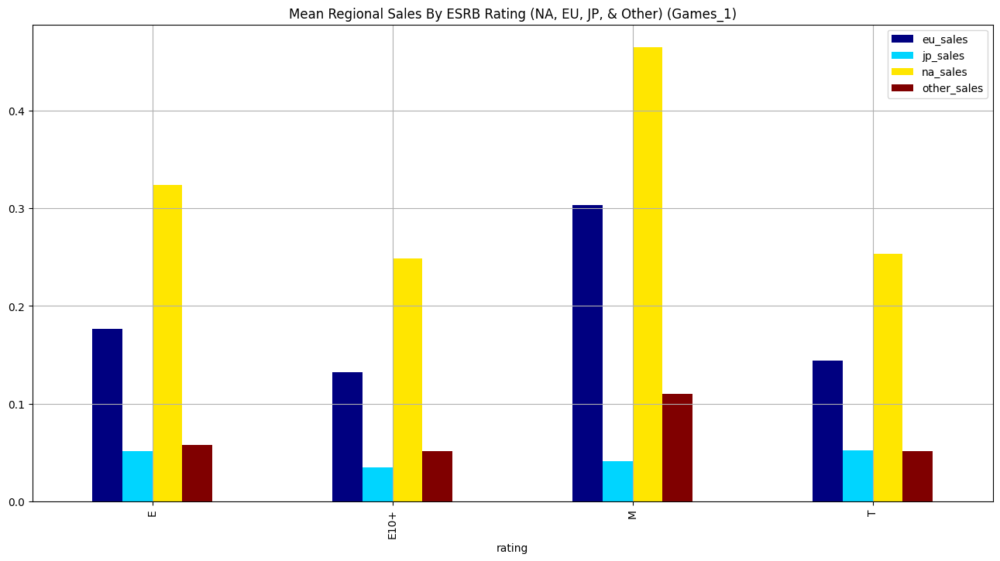

In [242]:
# Mean data
high_sales = all_region_filtered_rate[(all_region_filtered_rate['na_sales'] >1) | (all_region_filtered_rate['eu_sales']>1) | (all_region_filtered_rate['jp_sales']>1) |(all_region_filtered_rate['other_sales']>1)]
high_sales_og_1 = all_region_filtered_rate_og_1[(all_region_filtered_rate_og_1['na_sales'] >1) | (all_region_filtered_rate_og_1['eu_sales']>1) | (all_region_filtered_rate_og_1['jp_sales']>1) |(all_region_filtered_rate_og_1['other_sales']>1)]
all_region_filtered_rate_high = high_sales.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='mean')
all_region_filtered_rate_high_og_1 = high_sales_og_1.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='mean')
all_region_filtered_rate_high.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Mean High Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_3)",grid=True)
all_region_filtered_rate_high_og_1.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Mean High Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_1)",grid=True,ylim=(0,0.5))


#display(all_region_filtered_rate_high)

all_filtered_pivot_rate_mean = all_region_filtered_rate.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='mean')
all_filtered_pivot_rate_mean_og_1 = all_region_filtered_rate_og_1.pivot_table(index='rating', values=['na_sales','eu_sales','jp_sales','other_sales'],aggfunc='mean')

all_filtered_pivot_rate_mean.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Mean Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_3)",grid=True)
all_filtered_pivot_rate_mean_og_1.plot(kind='bar', figsize=(16,8), colormap = 'jet', title="Mean Regional Sales By ESRB Rating (NA, EU, JP, & Other) (Games_1)",grid=True)


**Summary Analysis**

- Overall Ranking: E, T, M, E10+

**Games_3 Analysis**

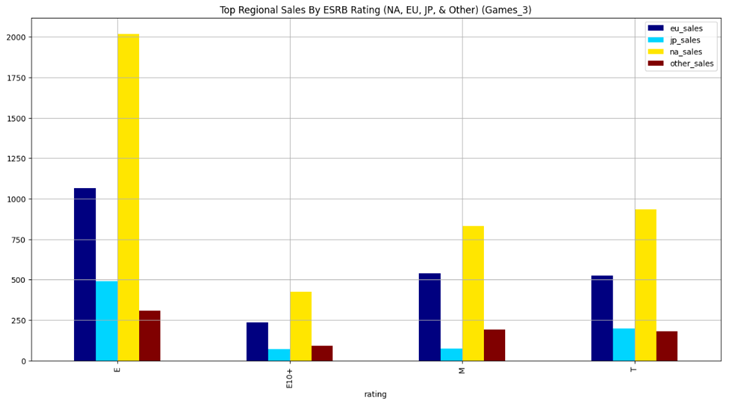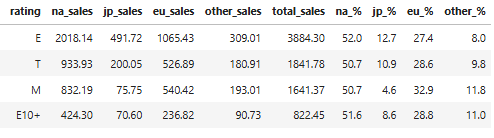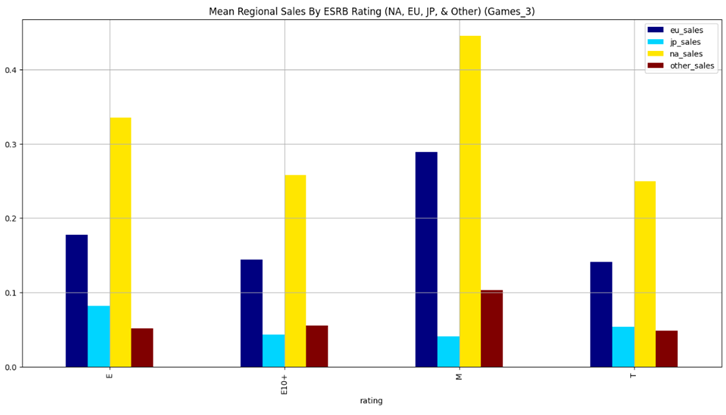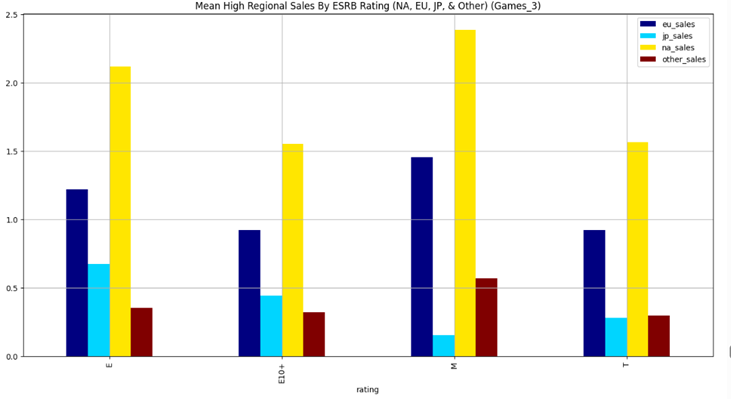

**Summary Notes**
- North America leads the market in sales for all ratings
- Euope is the 2nd leading country for all ratings
- Japan outranks other countries in the E & T ratings
- Other countries outrank Japan in the E10+ and M ratings.

**Overall Sales**
- North America: ~ 4.22 billion
    - Rank: E, T, M, E10+
- Europe: ~ 2.37 billion
    - Rank: E, M, T, E10+
- Japan: ~ 838.12 million
    - Rank: E, T, M, E10+
- Other: ~ 773.66 million
    - Rank: E, M, T, E10+


**Overall Share**
- NA: E, E10+, T-M (T marginally performs better)
- EU: M, E10+, T, E
- JP: E, T, E10+, M
- Other: M, E10+, T, E

**Average Sale**
- NA: M, E, E10+-T (E10+ marginally performs better on average than T)
- EU: M, E, E10+-T (E10+ marginally performs better on average than T)
- JP: E, T, E10+-M (E10+ marginally performs better on average than M)
- Other: M, E10+, E, T (E10+, E, & T perform simililarly on average)

**High Average Sale**
- NA: M, E, T, E10+ (T marginally performs better on average than E10+)
- EU: M, E, E10+, T (E10+ marginally performs better on average than T)
- JP: E, E10+, T, M
- Other: M, E, E10+, T (E, E10+, T perform similaryly on average)

**Comparison:**
- NA Sales: E, T, M, E10+
- NA Shares: E, E10+, T-M
- NA Average: M, E, E10+, E
- NA High Average: M, E, T, E10+
- EU Sales: E, M, T, E10+
- EU Shares: M, E10+, T, E
- EU Average: M, E, E10+, T
- EU High Average: M, E, E10+, T
- JP Sales: E, T, M, E10+
- JP Shares: E, T, E10+, M
- JP Average: E, T, E10+, M
- JP High Average: E, E10+, T, M
- Other Sales: E, M, T, E10+
- Other Shares: M, E10+, T, E
- Other Average: M, E10+, E, T
- Other High Average: M, E, E10+, T

**Overall**

In terms of sales, all regions perform best with E rated games. In terms of shares, this remains true for North American and Japan. We can see that North American sales are relatively well balanced between the ratings, staying withing a 1.3% range between the highest and lowest of the shared percent, while only slightly favoring family friendly games (E - 52%, E10+ - 51.6%). However, on average, M rated games perform better than E rated games by small margins. Overall, North America performs best with E rated games. 

Again, Japan favors E rated games, but seems strongly adverse to M rated games in every aspect; this could be due to these types of games being culturally inappropriate, therefore, not widely played or these types of games may not even be allowed in Japan. 

Contrary to Japan, M rated games seem to perform the best in Europe and Other Countries. Even though total sales are higher for the E rating for both Europe and Other Countries, this is likely due to the sheer amount of E rated games vs M rated games. 

We can conclude that Japan and North America perform best with E rated games and Europe and Other Countries perform best with M rated games. To increase sales in Europe and Other Countries, we could suggest producing more M rated games since the only reason total sales for the E rated games are high is likely due to availability of these games. 

**Note:** It would also be worth looking in to how age range effects sales.  


**Games_1 Analysis**

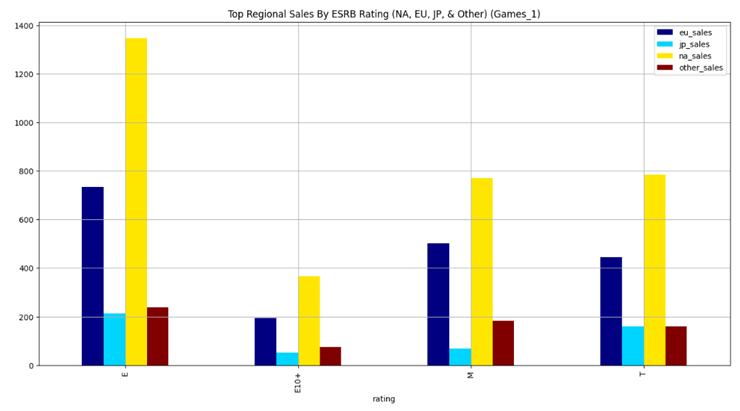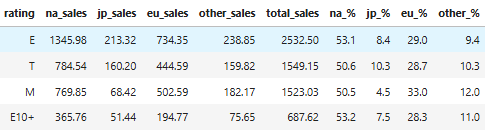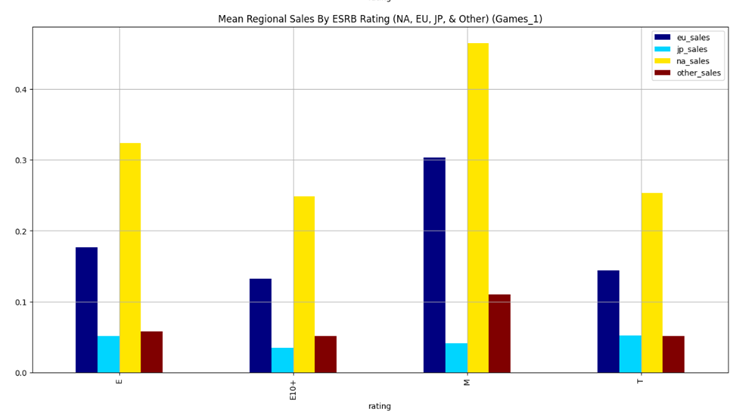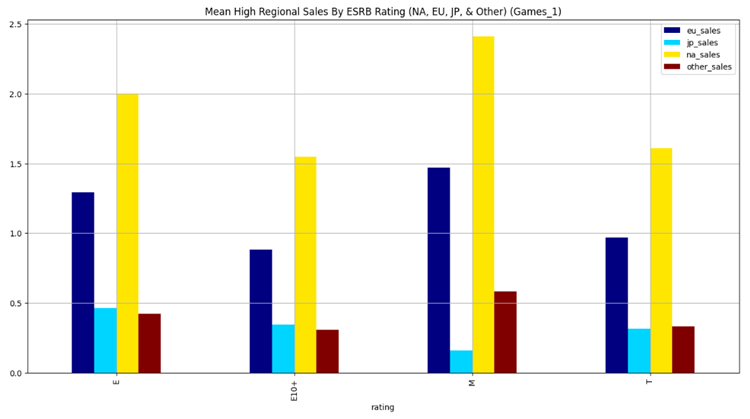

**Overall Sales**
- North America: ~ 3.27 billion
    - Rank: E, T, M, E10+
- Europe: ~ 1.88 billion
    - Rank: E, M, T, E10+
- Japan: ~ 493.38 million
    - Rank: E, T, M, E10+
- Other: ~ 656.99 million
    - Rank: E, M, T, E10+

**Note:** The rankings remain the same from games_3 data, but other countries have higher overall sales than Japan in games_1 vs. games_3 data.


**Overall Share**
- NA: E10+, E, T, M 
- EU: M, E, T, E10+
- JP: T, E, E10+, M
- Other: M, E10+, T, E

**Differs from Games_3 Data:** 
- NA - E10+ has higer sales than E (E10+ & E flipped)
- EU - E10+ and E are flipped (E now has higher sales)
- JP - E and T are flipped (T now has higher sales)
- Other: No change 

**Average Sale**
- NA: M, E, T-E10+ (T marginally performs better on average than E10+)
- EU: M, E, T-E10+ (T marginally performs better on average than E10+)
- JP: E, T, M-E10+ (M marginally performs better on average than E10+)
- Other: M, E, T, E10+ (E, T, E10+ perform simililarly on average)

**Differs from Games_3 Data:**
- NA: T & E10+ flipped, but the difference was marginal to begin with; we can count this as no change
- EU: Same as NA - no change
- JP: similar to NA and EU, but M and E10+ are flipped - no change
- Other: Now E,T,E10, was E10,E,T; similar to the others these ratings performed similarly - no change
- **Overall:** We can state that there is no change with the average sales


**High Average Sale**
- NA: M, E, T, E10+ 
- EU: M, E, T, E10+ 
- JP: E, E10+, T, M
- Other: M, E, T, E10+ (E, E10+, T perform similaryly on average)

**Differs from Games_3 Data:**
- NA: no change
- EU: T & E10+ flipped, but the differences are marginal - no change
- JP: no change
- Other: T & E10+ flipped, but the differences are marginal - no change
- **Overall:** We can state that there is no change with high average sales

**Comparison:**
- NA Sales: E, T, M, E10+
- NA Shares: E10+, E, T-M
- NA Average: M, E, T, E10+
- NA High Average: M, E, T, E10+
- EU Sales: E, M, T, E10+
- EU Shares: M, E, T, E10+
- EU Average: M, E, T, E10+
- EU High Average: M, E, T, E10+
- JP Sales: E, T, M, E10+
- JP Shares: T, E, E10+, M
- JP Average: E, T, M, E10+
- JP High Average: E, E10+, T, M
- Other Sales: E, M, T, E10+
- Other Shares: M, E10+, T, E
- Other Average: M, E, T, E10+
- Other High Average: M, E, T, E10+

**Overall**

In terms of sales, all regions perform best with E rated games. In terms of shares, this remains true for North America. The North American region seems to favor E10+ and E similarly. The share for E10+ is 53.2 % while the share for E is 53.1% which aligns with the North American region favoring the E rating. However, on average, M rated games produce higher revenue than E games. Overall, the same conclusion is reached for the North American region as the games_3 data; North America performs best with E & E10+ rated games.

Looking at both graphs, Japan appears to perform best with E and T rated games with a strong adversion to M rated games. We see a 3% drop from the E10+ rating which was already 1% lower than the E rating received. Overall, looking at both graphs, Japan performs best with E and T rated games while performing the worst with M rated games. Again, this could be due to these types of games being culturally inappropriate, therefore, not widely played or these types of games may not even be allowed in Japan.  

We reach the same conclusion for European an other countries as the games_3 data. Contrary to Japan, M rated games seem to perform the best in Europe and Other Countries. Even though total sales are higher for the E rating for both Europe and Other Countries, this is likely due to the sheer amount of E rated games vs M rated games. 

We can conclude that North America perform best with E rated games, Japan performs best with E & T rated games, and Europe and Other Countries perform best with M rated games. To increase sales in Europe and Other Countries, we could suggest producing more M rated games since the only reason total sales for the E rated games are high is likely due to availability of these games. 


# Step 5 : Hypothesis Tests

—Average user ratings of the Xbox One and PC platforms are the same.

—Average user ratings for the Action and Sports genres are different.

Set the *alpha* threshold value yourself.

Explain:

—How you formulated the null and alternative hypotheses

—What criteria you used to test the hypotheses~~,~~ and why


In [243]:
# H0 = Average user ratings of the Xbox One and PC platforms are the same

# Filter out XOne and PC games
xp = platforms_info[platforms_info['platform'].isin(['XOne','PC'])]


# Filter platforms and user_score
xp_user = xp[['platform','user_score']]
xp_user = xp_user.reset_index()


# Group the data, get the mean
xp_user_mean = xp_user.groupby('platform')['user_score'].mean().round(3)
xp_user_mean = xp_user_mean.reset_index()
xp_user_mean['user_mean'] = xp_user_mean['user_score']

# Get the variance
xp_user_var = xp_user.groupby('platform')['user_score'].var().round(3)
xp_user_var = xp_user_var.reset_index()


xp_user_mean['user_var'] = xp_user_var['user_score']
display(xp_user_mean)


# Filter the statistical data
xp_stats = platform_ts_df[platform_ts_df['platform'].isin(['XOne', 'PC'])]
display(xp_stats)

# Filter only XOne data
xone = xp_user[xp_user['platform'] == 'XOne']
xone_user = xone['user_score'].dropna()


# Filter only PC data
pc = xp_user[xp_user['platform'] == 'PC']
pc_user = pc['user_score'].dropna()



# Set the critical significance
alpha = 0.05 


# Test hypothesis: the mean of Xone and PC are equal/same
results = st.ttest_ind(xone_user,pc_user, equal_var=False)

# Print the p-value
print('p-value:',results.pvalue)

# compare the p-value with the significance level
if results.pvalue < alpha:
    print("We reject the null hypothesis")
else:
    print("We can't reject the null hypothesis")


,platform,user_score,user_mean,user_var
0,PC,70.625,70.625,234.079
1,XOne,65.214,65.214,190.700


,platform,total_sales,mean_sales,std_sales,cv_%_sales,var_sales,mode_sales,min_sales,q1_sales,median_sales,q3_sales,max_sales,iqr_sales,count,unique
13,PC,259.52,0.266448,0.675577,253.55,0.456404,0.02,0.01,0.02,0.05,0.170,8.01,0.150,974,171
30,XOne,159.32,0.645020,1.036139,160.64,1.073584,0.01,0.01,0.06,0.22,0.685,7.39,0.625,247,127


p-value: 4.935072360183449e-06
We reject the null hypothesis


**Conclusion:**

Null = Average user ratings of the Xbox One and PC platforms are the same.

The p-value is less than 0.01% weather we set equal var as True or False. This means there is less than 0.01% probability of randomly getting a difference as extreme as 5.4 (or larger), assuming the null is true. The probability is extrememly low so we can conclude that there is a statistically significant difference between the average user scores for PC and XOne consoles. 



In [244]:
# H0 = Average user ratings for the Action and Sports genres are the same
# H1 = Average user ratings for the Action and Sports genres are different


# Filter out Action and Sports Genres
action = platforms_info[platforms_info['genre'] == 'Action']
action = action[['genre','user_score']]
action = action.dropna()
action_scores = action['user_score']


sports = platforms_info[platforms_info['genre'] == 'Sports']
sports = sports[['genre','user_score']]
sports = sports.dropna()
sports_scores = sports['user_score']


# Get the variance + mean
print("Action User Score Variance:", action_scores.var().round(3))
print("Action User Score Mean:", action_scores.mean().round(3))
print("Sports User Score Variance:", sports_scores.var().round(3))
print("Sports User Score Mean:", sports_scores.mean().round(3))


# Set the critical significance
alpha = 0.05 


# Test hypothesis: the mean of user_scores for Action and Sports genre's are equal/same 
results_gen = st.ttest_ind(action_scores,sports_scores, equal_var=False)

# Print the p-value
print('p-value:',results_gen.pvalue)

# compare the p-value with the significance level
if results_gen.pvalue < alpha:
    print("We reject the null hypothesis")
else:
    print("We can't reject the null hypothesis")



Action User Score Variance: 203.175
Action User Score Mean: 70.54
Sports User Score Variance: 259.693
Sports User Score Mean: 69.625
p-value: 0.12024530426191612
We can't reject the null hypothesis


**Conclusion:**

Although the mean for Action and Sports user scores differ, there is a 12.02% (10.92% if equal_var set to True) probability of getting a 0.915 difference or larger. This probability is high so we can't conclude that there is a significant difference between the average user scores among Sports and Action Genres.  

# Step 6. Write a general conclusion


**NOTE:** Supporting information and charts can be found under the "General Conclusion Notes" section; scroll to the "Missing Data" section to begin supplemental reading.

## **Overall Conclusion:**

**UNIQUE GAME RELEASE PREDICTION:**
- 255 - 355 unique game releases in 2017

**OUT OF MARKET PLATFORM YEAR PREDICTION:**
- **Wii:** 2017
- **X360:** 2017
- **PS3:** 2017
- **3DS:** 2019
- **WiiU:** 2023
- **PSV:** 2023
- **XOne:** 2025 
- **PS4:** 2025

**CRITIC SCORE AND USER SCORE ANALYSIS**

User scores do not greatly impact the total sales of a video game. However, critic score mildly impacts the total sales of some video games, but critics tend to give more consistent and fair scores than users. Given the data, critics probably have stricter guidelines to follow when scoring a video game than users do. 

 There is a statistically significant difference between the average user scores for the PC and XOne consoles.


**LOWEST CONSOLE SALES**

Games sales for the PC are consistently low. Although PC games are consistently lower than most consoles, this platform has the longest standing lifecycle. To create consistent revenue, video game manufactuers should consider releasing a PC version of their game. 

**Highest CONSOLE SALES:**

The PS3 & X360 have the largest selection of games which likely factors into higher sales. This is likely due to the popularity and competition between these consoles. While the PS3 and X360 produce the most sales overall; these consoles tend to profit less with games geared toward a younger audience. On the contrary, DS & Wii consoles perform best with games meant for a younger audience.

**GENRE PERFORMANCE:**

Best Genre Performance Based on Sales: Action and Sports Games are the most consistent in terms of high sales. Shooter games perfomed well in the 80's and 2010's, but fell off in the 90's before making consistent sales throughout the 2000's.

Best Genre Performance Based on Market Share: Action games perform the most consistently well from 1980 - 2016. Sports games have also done consistently well, but did not compare as much as Action games in the earlier years. Although Action games are currently experiencing a decline, the consistency in high sales and market share should encourage manufacturers to continue making quality Action games. 

Genres Experiencing Growth: Shooter (since 2008) & Sports (since 2012)

Action, Sports, and Shooter games have done consistently well in the past and manufacturers should focus their attention on these genres to increase sales. 

**Overall Platform Focus:**
Most countries favor the Xbox and PlayStation consoles. 

**North American Sales:**

Manufacturers should focus on E and E10+ rated Platform, Shooter, & Sports games on the Xbox and PlayStation consoles to improve sales. North America makes up about 50% of the market; so making video games to accomodate this audience will increase sales the most. 

**European Sales:**

If manufacturers also want to increase sales in the second largest country to increase video game sales, then the focus should be to make Action, Sport, Shooter, and Racing games that are rated M rated. 


**Japanese Sales:**

To accomodate the Japanese market, manufacturers will want to make Role-Playing games that avoid the M rating.

**Other Countries:**

Other Countries align similarly to European countries; therefore, manufactuers do not have to focus on other countries as sales will align with games created for European Sales. 


**M rated games**

On average, M rated games produce higher revenue than E games for North America, Europe, and Other countries. Therefore, if more M rated games were manufactured, sales could increase. Keep in mind, these games will not be as well suited for the Japanese market.  


**Overall Focus:**
- Platforms: Xbox & PlayStation Consoles
- Genres: Platform, Shooter, Sports, Action, Racing, Role-Playing
- Increase production of M rate

## **General Conclusion Notes:**

**RELEASE YEAR FINDINGS:** If the rate of game releases continues to decrease, we can expect between 255 - 276 unique game releases in 2017. However, if the average number of game releases over the last 4 years remains consistent, we can expect around 329 unique game releases in 2017. If the rate of game releases increases similarly from 2006 - 2007, we can expect around 335 unique game releases.

**PLATFORM FINDINGS:** 

**Platform Lifecycle:** 5 - 10 years

**Declining Trend:** The most recent out of market platforms suggest that once a console starts to decline, that platform is out of market after a 4-5 year period. Additionally, PlayStation platforms stay in market for 12 years. 

**Declining Platforms:** **[Wii, X360, PS3, 3DS]** these platforms are predicted to be out of market by 2017 with the exception of the 3DS which is predicted to be out of market by 2018 - 2019.

- **PS4 & PSV** are also declining, but the overall PlayStation Lifecycle predicts a later out of market date. **PSV: 2023** & **PS4: 2025**
- **XOne & WiiU** are also declining, but their first significant decline year was in 2016 which does not currently show enough data. Later findings in the Platforms growth percent over the last 10 years, there will be data suggesting enough similarities between the Wii and WiiU to make an out of market prediction for the WiiU for 2023. Furthermore, the growth percent over the last 10 years will suggest a strong resemblance between the X360 and the PS3, this resemblance predicts an out of market year for the X360 at 

**Most Consistent Platform:** **[PC]** 
Most consistent in terms of sales; although there is a downward trend, given the lifespan of the console, it's safe to assume sales will not completely end - we can infer sales will stay relatively consistent over the next 10 years. 


**Remaining Consoles:** Out of market on or before 2008


**PLATFORM GROWTH OVER THE LAST 10 YEARS:**

- Growth rate peaks at year 2, the year after production for PlayStation, Xbox, and DS consoles.
- Growth rate declines rapidly on year 3 for PlayStation, Xbox and DS Consoles.
- The WiiU has peaked the year after production, but it was not as extreme as the other consoles.
- The Wii peaked year 2-4, not just year 2, but, like the WiiU, the peak was not extreme. 
- The Wii rapidly decreased, but on year 5, not year 3
- The WiiU has shown more of a consistent growth decrease, but like the Wii a rapid decrease is seen in year 5
- The 3DS extremely resembles trends for the DS
- The PlayStation Consoles have a consistent 12 year lifecycle
- PS3 best resembles trends for the PSP & PS2
- PSV best resembles trends for the PSP
- PS4 best resembles trends for the PSP & PS2
- X360 resembles trends for the PS3
- XOne resembles trends for the PS4
- Console manufacturers that release a new console will see an increase in growth and sales for the previous console on year 3 after the new console is released except with Xbox consoles

**FINAL PREDICTION FOR OUT OF MARKET PLATFORM YEAR**
- **Wii:** 2017
- **X360:** 2017
- **PS3:** 2017
- **3DS:** 2019
- **WiiU:** 2023
- **PSV:** 2023
- **XOne:** 2025 
- **PS4:** 2025

**USER SCORE & CRITIC SCORE ANALYSIS FOR X360 SALES**

**Summary of the User Score data**

The data is concentrated toward the higher values. There is a weak positive correlation for user scores to total sales of X360 games. So, the user score tends to increase as sales increase, but most of the scores are clustered between 40 - 90 with total sales under 2 million for the Xbox console. However, there is another cluster of scores between 50 - 90 with games sales between 2 - 4 million in total sales for the Xbox console, but this data is much more sparse and still has elements of randomness outside this cluster. Additionally, games above 4 million tend to score between 60 - 90. 

There are generally higher user scores for higher sales of the X360; however, the data shows a lot of overlap with the score ranges. There is still a significant and greater amount of user scores that reach between 60 - 90 that have total sales under 2 million rather than above 2 million. For this reason, the correlation is not strong and we can conclude a weak positive correlation for games sales and user score for the X360 console. 

**Pearson Correlation Coefficient for User Score:** 0.11445882978454192

**Summary of Critic Score data**

The data is concentrated toward the higher values, but the values tend to be more specific and less random than the user score data. There is a moderate positive correlation for critic socres to total sales. The critic scores tend to incease as sales increase. Most scores are between 40 - 90 for games under 2 million in total sales. Sales between 2-4 million are clustered between critic scores of 70 - 95. Notice that this range extends past 90, unlike the games under 2 million. This shows us that there are more games in the 2-4 million dollar range that receive a score between 90 - 95 than games that produce under 2 million in sales. Games that produce 4-6 million in sales tend to receive a critic score between 80 - 95. The 6 - 8 million dollar range is the same (80-95), but the data is much more sparse. Games that produce 8 million + in sales typically receive a critic score between 85 - 98, but again, the data is sparse. 

The data is much more specific, but the ranges still overlap with the majority of games producing 2 million and under for X360 sales that still receive high scores between 70 - 90. However, since the range is specifically higher between 90-95 for games producing 2-8 million and 95 - 98 for games producing over 8 million in X360 sales, there is a noticeably stronger correlation for games sales and critic score for the X360 console than there is for user score. Therefore, we can conclude a moderate positive correlation between critic score and sales

**Pearson Correlation Coefficient for Critic Score:** 0.3937358653072584


**Overall Conclusion for User & Critic Score for X360 Sales:**

Critics are more likely to give consistent scores; we can infer they may have stricter guidelines to follow when scoring a game than users do.


**PERFORMANCE ASSESSMENT FOR GAMES ACROSS MULTIPLE PLATFORMS:**

**Lowest Sales:** PC

**Conclusion:** Games sales for the PC will stay consistently low. We have already seen that PC games have been consistently lower over time, but have had the longest running lifecycle. 

**Highest Sales:** PS2, PS3, X360

**Conclusion:** PlayStation and XBox games will have consistently high sales which makes sense as they are often seen as the two most popular consoles.

**Moderate Sales:** DS & Wii

**Conclusion:** DS & Wii games will have sales that vary. Wii sales have varied between moderately low to moderately high and most likely favor games geared toward a younger audience as these consoles increase performance with pixar games. 

**Overall:** The PS3 & X360 have the largest selection of games which likely factors into higher sales. This is likely due to the popularity and competition between these consoles. While the PS3 and X360 produce the most sales overall; these consoles tend to lack with games geared toward a younger audience. On the contrary, DS & Wii consoles perform best with games meant for a younger audience.


**GENRE ANALYSIS DATA:**

**Best Genre Performance Based on Sales:**
Action and Sports Games are the most consistent in terms of high sales. Shooter games perfomed well in the 80's and 2010's, but fell off in the 90's before making consistent sales throughout the 2000's. 

**Best Genre Performance Based on Market Share:** Action games perform the most consistently well from 1980 - 2016. Sports games have also done consistently well, but did not compare as much as Action games in the earlier years.

**Genres in Decline:** 
- Action: since 2012
- Misc: since 2010

**Genres in Growth:**
- Shooter: since 2008
- Sports: since 2012

**Consistent Genres:**
All other genres have remained relatively consistent since 2005

**Average Platform Performance:** Platform & Shooter - Platform games perform the best while Shooter games perform the 2nd best.


**OVERALL SHARE BY REGION**

**Total Sales:** 8912.8

**North America:** 4400.57 (49.37%)

**Japan:** 1297.34 (14.6%)

**Europe:** 2423.64 (27.19%)

**Other:** (8.88%)

**PLATFORM SALES BY REGION:**



**Top Sales Overall:** PS2, X360, PS3, Wii, DS

**Top Sales in Regionally Leading Consoles:** PS2, X360, PS3, DS, PS

**Top Overall Average Sales:** GB, NES, GEN, SNES, PS4

**Top Average Sales in Regionally Leading Consoles:** NES, GB, PS4, PS3


<u> **North America:** </u>

Leads the market with 17/31 (~55 %) platforms. Of those 17 leading sales, 13 made more than 100 million in sales. 

**Top Sales for North America:** X360 & PS2

**Top Average Sales in North America:** NES & GB


<u>**Japan:** </u>

Japanese Sales outperform all countries in 12/31 platforms (~38 %). Of those 12 consoles, 6 consoles appear to be exclusive to Japan as there are no other countries sales. 

**Top Sales for Japan:** DS & PS

**Top Average Sales in Japan:** NES & GB



<u>**Europe:** </u>

European Sales outperform 2/31 countries (~6 %)

**Top Sales for Europe:** PS2 & PS3

**Top Average Sales in Europe:** GB & PS4



<u>**Other:** </u>

Other countries do not outperform any of the top leading countries

**Top Sales for Other:** PS2 & PS3

**Top Average Sales in Other:** PS4 & PS3



<u>**Summary of Regionally Leading Consoles:** </u>

**North America** leads with top sales in all regionally leading consoles; pulling in around 2.3 billion across all 5 platforms: **(X360, PS2, PS3, DS, PS)**

<u>**Top 5:** </u> X360, PS2, Wii, PS3, DS

<u>**Top 5 Avg:** </u> NES, GB, GEN, 2600, X360

**Europe** is 2nd in top sales in all regionally leading consoles; pulling in around 1.35 billion across all 5 platforms: **(PS2, PS3, X360, PS, DS)**

<u>**Top 5:** </u> PS2, PS3, X360, Wii, PS

<u>**Top 5 Avg:** </u> GB, PS4, PS3, NES, X360

**Japan** is 3rd in top sales in regionally leading consoles; Japan outranks other countries in the DS & PS and pulls in ~547 million in sales across all 5 platforms: **(DS, PS, PS2, PS3, X360)**

<u>**Top 5:** </u> DS, PS, PS2, SNES, 3DS

<u>**Top 5 Avg:** </u> NES, GB, SNES, WS, 3DS

**Other** countries ranks last in regionally leading consoles; other countries outrank Japan in the PS2, PS3, X360 and pulls in ~515 million in sales across all 5 platforms: **(PS2, PS3, X360, DS, PS)**

<u>**Top 5:** </u> PS2, PS3, X360, Wii, DS

<u>**Top 5 Avg:** </u> PS4, PS3, PS2, GB, X360


**Closing Statements:**

North America gets the most sales from the X360 console

Europe gets the most sales from the PS2 console

Japan gets the most sales from the DS console

Other countries get the most sales from the PS2 console, like Europe. 

**GENRE SALES BY REGION**

**Top Sales Overall:** Action, Sports, Shooter, Role-Playing, Platform
**Top Sales in Regionally Leading Genres:** Action, Role-Playing, Sports, Shooter, Platform, Racing, Misc
**Top Average Sales Overall:** Platform, Shooter, Role-Playing, Racing, Sports
**Top Average Sales in Regionally Leading Genres**


<u> **North America** </u>

North America gets the most sales from Action games, but receives higher sales from Platform games on average

**Top Sales for North America:** Action, Sports

**Top Average Sales in North America:** Platform, Shooter


    
<u> **Europe** </u>

Europe gets the most sales from Action games, but receives higher sales for shooter games on average

**Top Sales for Europe:** Action, Sports

**Top Average Sales in Europe:** Shooter, Platform



<u> **Japan** </u>

Japan favor Role-Playing games

**Top Sales for Japan:** Role-Playing, Action

**Top Average Sales in Japan:** Role-Playing, Platform


<u> **Other** </u>

Other countries gets the most sales from Action games, but receives higher sales from Shooter games on average

**Top Sales for Other:** Action, Sports

**Top Average Sales in Other:** Shooter, Racing



<u>**Summary of Regionally Leading Consoles:** </u>

**North America** 

<u>**Top 5:** </u> Action, Sports, Shooter, Platform, Misc

<u>**Top 5 Avg:** </u> Platform, Shooter, Sports, Racing, Fighting

**Europe** 

<u>**Top 5:** </u> Action, Sports, Shooter, Racing, Misc

<u>**Top 5 Avg:** </u> Shooter, Platform, Racing, Sports, Action

**Japan** Strongly favors Role-Playing Games

<u>**Top 5:** </u> Role-Playing, Action, Sports, Platform, Misc

<u>**Top 5 Avg:** </u> Role-Playing, Platform, Fighting, Puzzle, Simulation

**Other** 

<u>**Top 5:** </u> Action, Sports, Shooter, Racing, Misc

<u>**Top 5 Avg:** </u> Shooter, Racing, Platform, Sports, Action


**Closing Statements:**

North America gets the most sales from Action games, but receives higher sales from Platform games on average

Europe gets the most sales from Action games, but receives higher sales for shooter games on average

Japan favor Role-Playing games

Other countries gets the most sales from Action games, but receives higher sales from Shooter games on average

**ESRB SALES BY REGION**

In terms of sales, all regions perform best with E rated games. In terms of shares, this remains true for North America. The North American region seems to favor E10+ and E similarly. The share for E10+ is 53.2 %  (Games_3: 51.6 %) while the share for E is 53.1% (Games_3: 52%)  which aligns with the North American region favoring the more family friendly rating. Overall, the North American region performs best with the E and E10+ rated games. 

However, on average, M rated games produce higher revenue than E games for North America, Europe, and Other countries.

Overall, Japan performs best with E and T rated games while performing the worst with M rated games. This could be due to these types of games being culturally inappropriate, therefore, not widely played or these types of games may not even be allowed/distributed/known in Japan.  

Contrary to Japan, M rated games seem to perform the best in European and Other Countries. Even though total sales are higher for the E rating for both Europe and Other Countries, this is likely due to the sheer amount of E rated games vs M rated games. 

We can conclude that North America perform best with E & E10+ rated games, Japan performs best with E & T rated games, and Europe and Other Countries perform best with M rated games. To increase sales in Europe and Other Countries, we could suggest producing more M rated games since the only reason total sales for the E rated games are high is likely due to availability of these games. 

**HYPOTHESIS TESTING:**

Null = Average user ratings of the Xbox One and PC platforms are the same.

The p-value is less than 0.01% weather we set equal var as True or False. This means there is less than 0.01% probability of randomly getting a difference as extreme as 5.4 (or larger), assuming the null is true. The probability is extrememly low so we can conclude that there is a statistically significant difference between the average user scores for PC and XOne consoles. 

Null = Average user ratings for the Action and Sports genres are the same

Although the mean for Action and Sports user scores differ, there is a 12.02% (10.92% if equal_var set to True) probability of getting a 0.915 difference or larger. This probability is high so we can't conclude that there is a significant difference between the average user scores among Sports and Action Genres. 

## **Missing Data:**
- Most missing data originated from the rating columns: critic_score, user_score, and rating. 
- I input many ESRB ratings and compared data from both the original games_1 DataFrame and the newly inputted values from the games_3 DataFrame.
- Some, but much less significant, missing values came from the year_of_release column. Some of this data was input using a mode function that was created in the code.

**Percentage of missing data:**
- `name` 0.01 %
- `year_of_release` 1.61 %` 
- `genre` 0.01 %
- `critic_score` 51.32 % 
- `user_score` 54.59 % 
- `rating` 40.48 % 
- `platform` 0 %
- `na_sales` 0 %
- `eu_sales` 0 %
- `jp_sales` 0 %
- `other_sales` 0 %

## **Release Year Data:**

**Significant Release Years:** 2005 – 2011

**Overall Trend:** Game releases were low in the 80’s, gradually increased in the 90’s, spiked in the 2000’s and started declining in the 2010’s

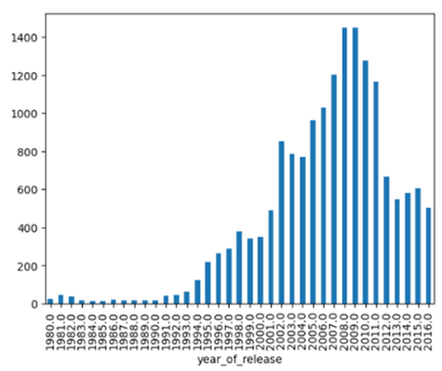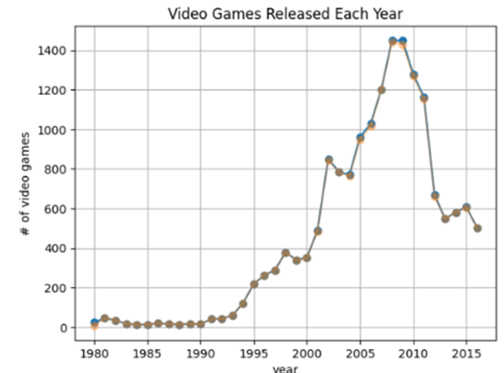

**Detailed Trend:**
- 1980 - 1990: low releases
- 1991 - 1993: starting to see increasing releases
- 1994-1995: A rapid increase in releases starts
- 1996 - 2000: A steady increase in sales
- 1999- 2000: A slight dip in release (~38 less)
- 2001 - 2011: A rapid increase in releases
- 2009 - 2011: The beginning of declining releases, but still high
- 2011 - 2013: Rapid decline in releases
- 2013 - 2015: A slight increase in sales
- 2016 - A decrease in sales with numbers similar to 2001

**Release Year Data Prediction:** If the rate continues to decrease at a similar rate then we can predict 255 - 276 unique game releases in 2017, but with relatively consistent numbers for the last 4 years (2013 - 2016), we could expect around 329 unique games releases in 2017

- The average rate of decline for every year starting from 2010 - 2016 is roughly -14.3%; 255 games
- The average rate of decline for every year starting from 2014 - 2016 is roughly -9.26; 270 games
- The average rate of decline for every year starting from 2007 - 2016 is roughly -7.219; 276 games
- The average rate of increase from 2006 - 2007; 13%; 335
- The average number of games produced in the last 4 years was 328.25
- If x is the variable that represents the 2017 prediction and y is equal to the average decline rate then: ((x-297) / 297) * 100 = y(-14.3, -9.26,-7.219)
- **Note:** These data was looking at unique game releases rather than the total count of games


**NOTE:** This data was used looking at the unique values rather than the frequency of title names, but the trends are similar. This data is also based on the original DataFrame games rather than games_3. The data in games_3 is almost identical other than a few extra readings, but there is a notable increase for games in the 1980's due to an earlier shift made when inputting dates. There were a few games made in the late 70's that i decided to put in 1980; there were also a few games between 1980 - 1985 that I bundled to 1980; so, some of the 1980 data points can be dispersed from 1977 - 1985. As long as this information is known, it should not have a significant impact on the data. If there is significant impact, other DataFrames can be looked at.



## **Platform Data:**

**Platform Lifecycle:** 5 - 10 years

**Recently Out of Market Platforms:** DS, PS2, PSP

- **DS:** decline start - 2010; no sales - 2014
- **PS2:** decline start - 2006; no sales - 2011
- **PSP:** decline start - 2011; no sales 2016

**Declining Trend:** The most recent out of market platforms suggest that once a console starts to decline, that platform is out of market after a 4-5 year period. Additionally, PlayStation platforms typically stay in market for 12 years. 

**Declining Platforms:** 3DS, PS3, Wii, X360
- We can predict that most of these consoles will produce no sales by 2017, with the exception of the 3DS predicted to be out of market by 2019
- **Wii:** decline in 2011 - the decline has become severe and the WiiU console coming out tells us that the Wii is not likely to produce sales in 2017
- **X360:** decline in 2013 - the decline is severe and the XOne console coming out tells us that the X360 is not likely to produce significant, if any, sales in 2017. We can infer no sales by 2017.
- **PS3:** decline in 2014 -  the decline is severe and the PSV(2011) and PS4(2013) make it unlikely that there will be no sales for 2017. The PS3 has been in market since 2006, and an out of market year of 2017 aligns with other PlayStation consoles. We can infer no sales by 2017.
- **3DS:** decline in 2014 - the decline has not yet become so severe that the console will not produce sales by 2017, but there could be a possiblility of no sales between 2018-2019. If we look at the DS lifespan of 10 years, we could infer a 2020 out of market year, but we would need more than just one other console to imply a trend. Therefore, the typical out of market year after 4-5 years stands. We can infer no sales by 2018 - 2019.

**Newer PlayStation Platforms:**
- **PS4:** came out in 2013 - given the consistency of other PlayStation consoles (12 years), we can infer no sales by 2025
- **PSV:** came out in 2011 - the sales are consistently lower than other PlayStation consoles, but aligning with other PlayStation console, we can infer no sales by 2023

**Platforms With Insufficient Data:**
- **XOne:** - Came out in 2013 - only 4 years of data; no apparent trend. Although, the XOne console does appear to be in decline; so, we could predict no sales between 2020 - 2021
- **WiiU:** - Came out in 2012 - there appears to be a sharp decline in 2016, but there is not enough data to show a pattern - We can infer no sales by 2020 - 2021 given the other data's rate of decline



**Overall Prediction for Out of Market Year:**
- **Wii:** 2017
- **X360:** 2017
- **PS3:** 2017
- **3DS:** 2018 - 2019 (Updated: 2019 (read growth data))
- **WiiU:** 2020 - 2021 (Updated: 2023 (read growth data))
- **PSV:** 2023
- **XOne:** 2020 - 2021 (Updated: 2025 (read growth data))
- **PS4:** 2025


**Outlier Platform:**
- **PC:** Most consistent in terms of sales; although there is a downward trend, given the lifespan of the console, it's safe to assume sales will not completely end - we can infer sales will stay relatively consistent over the next 10 years.

**Platforms No Longer In Market:**
- TG16, WS, 3DO, SCD, NG, GG, and PCFX - sales were insignificant (7)
- 2600 - earliest out of existence (1)
- NES, GEN SNES, SAT, DC, N64, GB, PS - all produced no sales by 2005 (8)
- XB, GC, GBA - all produced no sales by 2010 (3)
- DS, PS2, PSP - not produced sales in recent years (3)

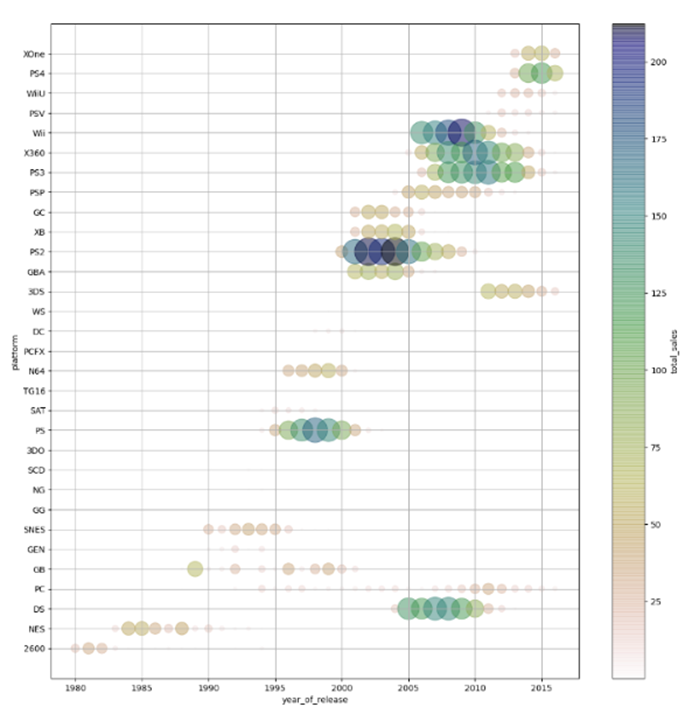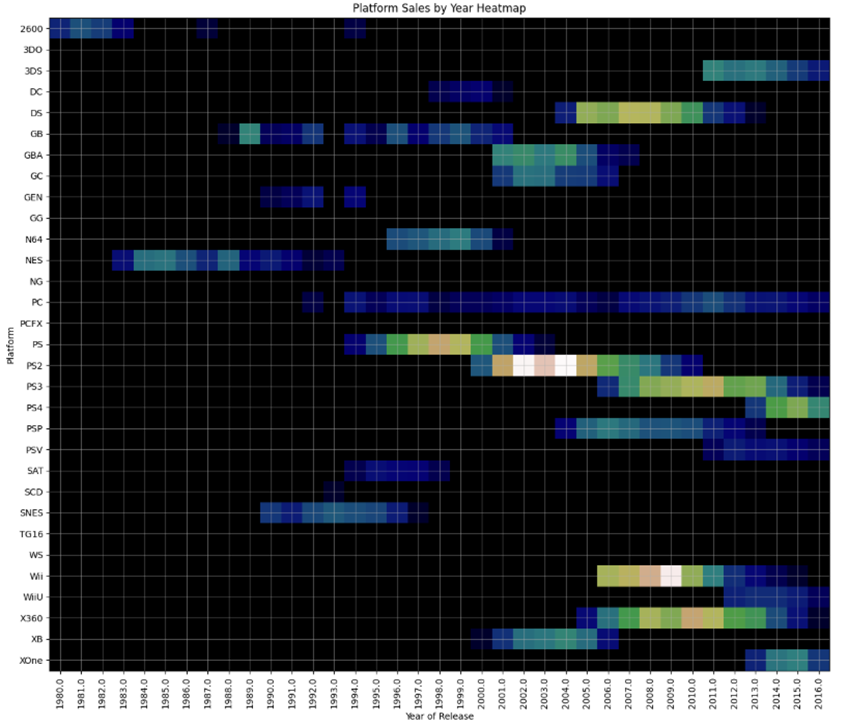


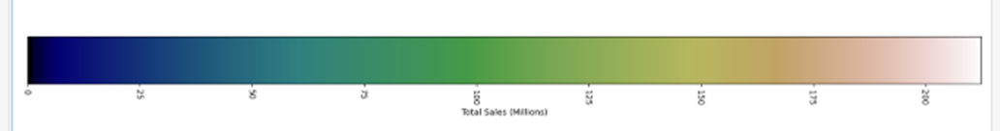

## **Platform Data - Growth Percent:**

**Selected Years:** 2005 - 2016

**Explanation:** The majority of consoles were out of the market after 10 years; therefore, it is relevant to track the last 10 years plus 2016 to understand future trends. This 11 year span reflects current market conditions by avoiding consoles that have been off the market for an extended period of time as they are no longer relevant and will help to narrow the trends of the most recent decade to compare these trends to newer consoles.

**Influencing Factors:** There are 5 consoles **[Wii, X360, PS3, PSP, DS]** between 2005 - 2016 that went through their entire or peak life cycle in this decade which will help to determine future trends. There are an additional 4 consoles **[PS2, GBA, XB, GC]** where we can see the end of their lifecycles to help understand what that pattern looks like for gaming consoles. This timeline gives us the ability to see the newest consoles **[XOne, WiiU, PSV, PS4, PS3, 3DS]** to best predict their out of market year. Lastly, there are many consoles sold by the same manufacturer, like PlayStation and Xbox, to inspect consoles based on additional trends that may be found within a specific manuafacturer to gain more specific insights into that console. 

**Explanation of Overview Photos**

The images below are difficult to compare; there are too many lines going throughout the page with too many similar colors. Notice in the "Growth Percent" charts that the PS3 and 3DS console data is cut off, this is becasue there is an inability to compare consoles growth percent when the height of one lines varies so drastically. However, to ensure accuracy, 3DS and PS3 data is shown. 

**Warning:** There are different limits set on each y-axis. 

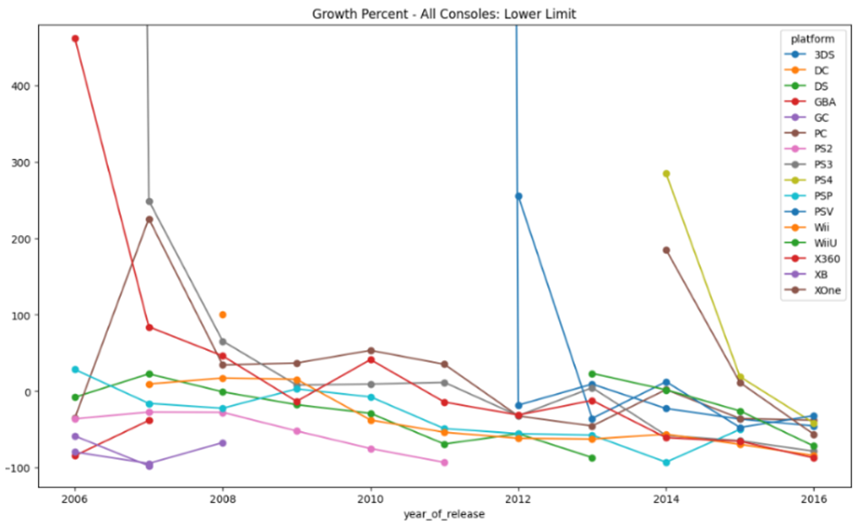

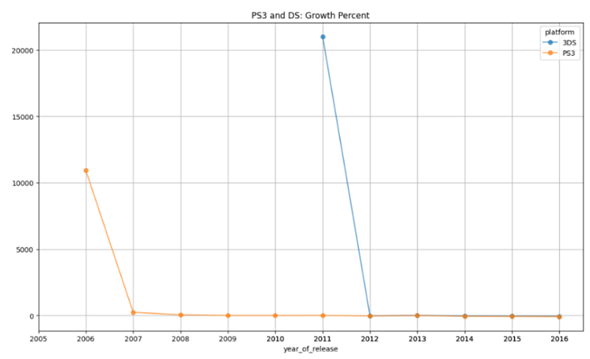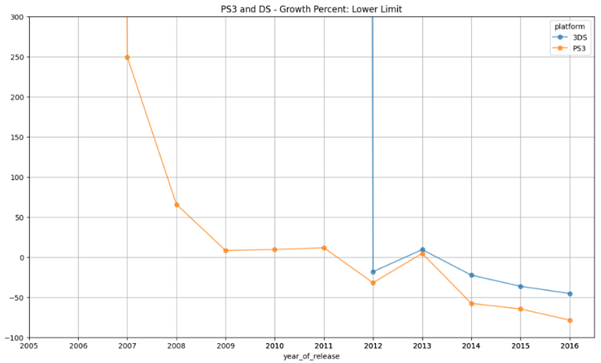

**Compare Top, Middle, & Lower Grossing Consoles between 2005 - 2016: Growth Percent**

**Explanation:** These are the top grossing consoles between the set timeline (2005 - 2016). The top grossing consoles in this decade align with the top grossing consoles in the overall dataset **[PS2, X360, PS3, Wii, DS]**. However, the middle grossing consoles in this decade do not fully align with overall middles sales; XOne would be in the Lower Grossing Consoles while GBA would be in the Higher Grossing Consoles if this was overall sales. **Middles consoles 2005 - 2016:** **[PS4, PSP, PC, 3DS, XOne]** ------ **Middle Consoles Overall:** **[GBA, PS4, PSP, PC, 3DS]**. Notice that regardless of sales the majority of consoles stay at or below 0% .

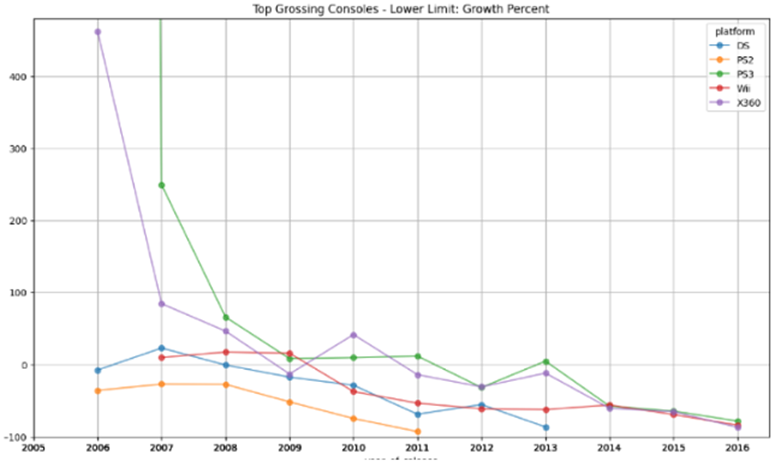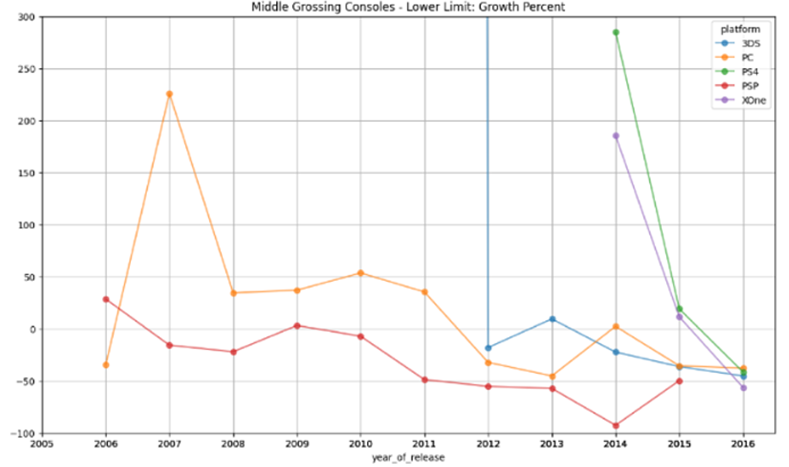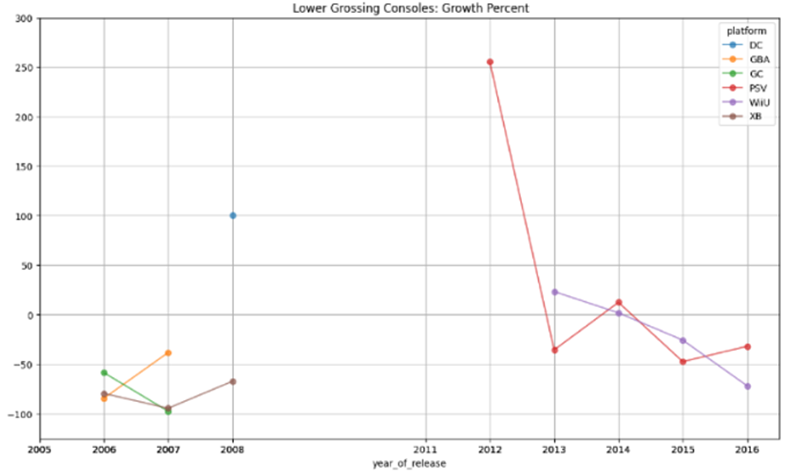

**Compare Console Manufacturers: Growth Percent**

**Wii:** Growth is steady year 2-4, growth rapidly decreases year 5 growth consistently decreases year 6-8, growth slightly increases year 9, growth declines year 10-11; ongoing lifecycle

**WiiU:** Growth starts high year 2 (not extremely high), consistently decreases years 3-4, rapid decrease year 5; ongoing lifecycle

**DS:** Growth starts extremely high year 2 (not shown: ~ 654%), Growth rapidly decreases year 3 (shown: 2006), growth increases year 4, growth decreases year 5-7, growth rapidly decreases year 7, growth increases year 8, growth decreases sharply year 9; no data year 10 (2014)

**3DS:** Growth starts extremely high year 2, growth decreases rapidly year 3, growth increases year 4, growth decreases year 5-7; ongoing lifecycle

**PS2:** Growth starts extremely high year 2 (not shown ~ 325%), growth decreases rapidly year 3 (not shown: ~ 26%), growth decreases year 4 (not shown: ~ -8%), growth increases year 5 (not shown: ~ 10.02%), growth decreases year 6 (not shown: ~ -22%), growth decreases year 7 (Shown: 2006), growth increases year 8-9, growth decreases year 10-12; no sales year 13

**PSP:** Growth starts extremely high year 2 (not shown: ~ 521%), rapid growth decline year 3 (shown: 2006), growth declines year 4-5, growth increases year 6, growth declines year 7-11, growth increases year 12; no sales year 13 

**PS3:** Growth starts extremely high year 2, growth decreases rapidly year 3, growth decreases rapidly year 4, growth decreases year 5, minor growth increase year 6-7, growth decrease year 8, growth increase year 9, growth decrease year 10, steady decrease year 11-12; ongoing lifecycle

**PSV:** Growth starts extremely high year 2, growth rapidly decreases year 3, growth increases year 4, growth decreases year 5, growth increases year 6; ongoing lifecycle

**PS4:** Growth starts extremely high year 2, growth decreases rapidly year 3, growth decreases year 4; ongoing lifecycle.

**XB:** Growth starts extremely high year 2 (not shown: ~2,306%), growth rapidly decreases year 3 (not shown: ~ 114%), growth decreases sharply year 4 (not shown: ~8%), growth increases year 5 (not shown: ~21%), growth decreases year 6 (not shown: ~ - 26%), growth decreases year 7 (shown: 2006), growth decreases year 8, growth increases year 9; no sales/growth year 10

**X360:** Growth starts extremely high year 2, growth rapidly decreases year 3, growth decreases year 4-5, growth increases year 6, growth decrease year 7-8, growth increases year 9, growth decreases year 10-12; ongoing lifecycle

**XOne:** Growth starts extremely high year 2, growth decreases rapidly year 3, growth declines year 4; ongoing lifecycle


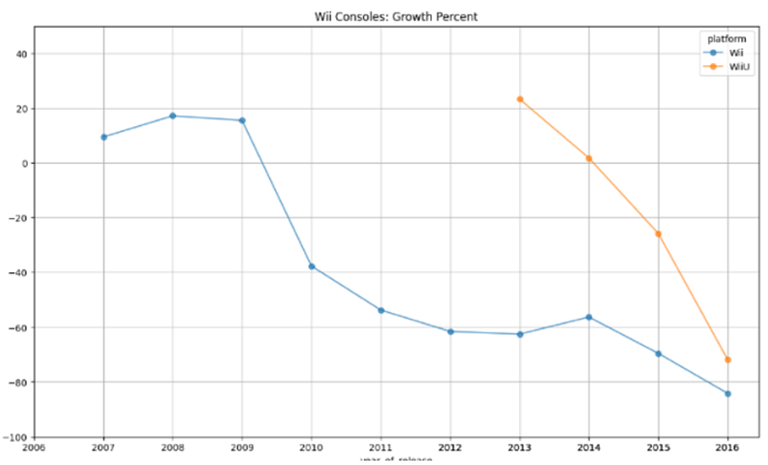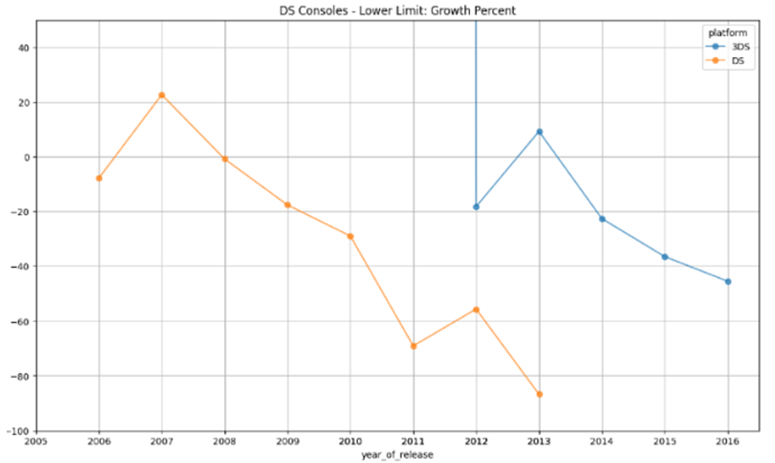

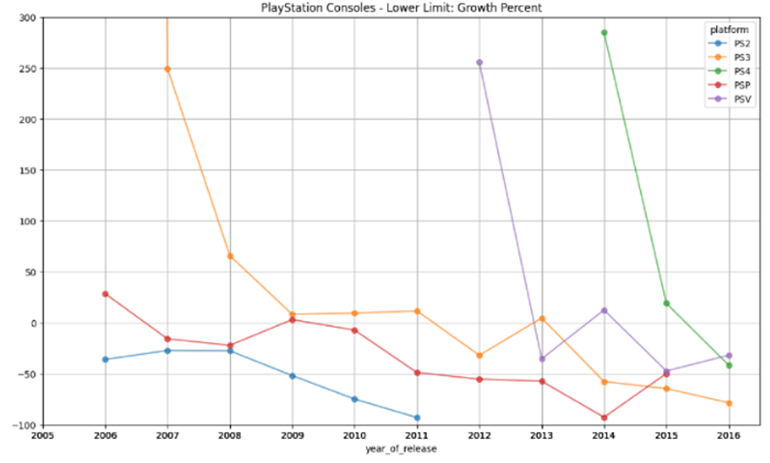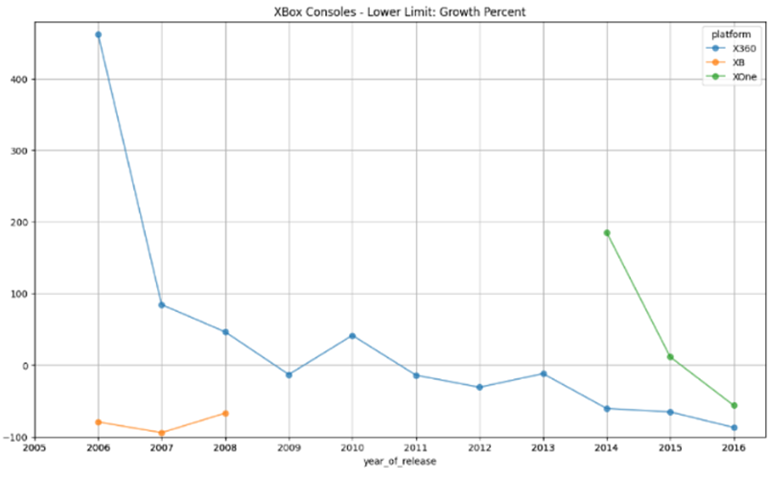

**Overall Growth Rate Data Conclusion:**
- Growth rate peaks at year 2, the year after production for PlayStation, Xbox, and DS consoles.
- The WiiU has peaked the year after production, but it was not as extreme as the other consoles.
- The Wii peaked year 2-4, not just year 2, but, like the WiiU, the peak was not extreme. 
- Growth rate declines rapidly on year 3 for PlayStation, Xbox and DS Consoles.
- The Wii rapidly decreased, but on year 5, not year 3
- The WiiU has shown more of a consistent growth decrease, but like the Wii a rapid decrease is seen in year 5
- The 3DS extremely resembles trends for the DS
- The PlayStation Consoles have a consistent 12 year lifecycle
- PS3 best resembles trends for the PSP & PS2
- PSV best resembles trends for the PSP
- PS4 best resembles trends for the PSP & PS2
- X360 resembles trends for the PS3
- XOne resembles trends for the PS4
- Console manufacturers that release a new console will see an increase in growth and sales for the previous console on year 3 after the new console is released except with Xbox consoles

**DS + 3DS:** The growth rate trend for these consoles are extremely similar. Each start high year 2, decrease rapidly year 3, increase year 4, and decrease years 5-7. The DS continues the cycle with an increase in year 8, a sharp decrease in year 9, and no sales in year 10. The earlier predicted timeline for the 3DS to go out of market was estimated between 2018-2019. With this additional growth rate data found from the DS console, we can predict that the 3DS will increase growth rate year 8, sharply decrease growth rate in year 9, and produce no sales in year 10 (2019)

**3DS Out Of Market Prediction (Updated):** 2019

**PSP + PS2 + PS3:** Overall trends for PlayStation consoles are extremely consistent. All platforms start with an extremely high growth rated on year 2 followed by a rapid decline. The PS3, like the PS2 and PSP consoles that have finished their cycle, shows a decrease in year 4, shares year 5 & 6 data with the PSP (5: decline; 6: increase), shares year 8 data with PSP (8: decline), shares 9-12 data with PS2 (9: increase; 10,11,12: decline). Therefore, since PS3 data closely resembles PS2 and PSP data, which have a 12 year lifecycle, this confirms the previous out of market prediction for PS3 as 2017.

**PS3 Out of Market Prediction (Confirmed):** 2017

**PSP + PSV:** The PSV data closely resembles the PSP data, so far. Since PlayStation seems to be consistent, we can predict an out of market year by 2023, which is consistent with our ealier prediction. However, this is an early prediction, and year 3 for the PSV experienced an increase which does not align with any other PlayStation Consoles, but all of the other data points remains consistent. Therefore, the 2023 prediction stands

**PSV Out of Market Prediction:** 2023

**PSP + PS2 + PS4:** The PS4 data closely resembles all PlayStation data, so far. Since PlayStation seems to be consistent, we can predict an out of market year by 2025, which is consistent with our earlier prediction. However, this is an early prediction made on the basis of the consistentcy of the PlayStation lifecycle. 

**PS4 Out of Market Prediction:** 2025

**X360 + PS3:** The X360 and PS3 data are nearly identical. Given the likeness of these two trends, the prediction assimilates the PS3 data, predicting a 2017 out of market year, which is the same prediction from earlier statements. 

**X360 Out of Market Prediction:** 2017

**XOne + PS4:** Similarly to the X360 and PS3 data, the assumption is that these 4 consoles perform so similarly that consumers tend to pick one or the other based on preference. All 4 of these consoles have the same release dates which may be part of the reason for such close competition between the platforms. Given the likeness of the XOne and PS4 console, the prediction would be the same as for the PS4; a 2025 out of market year prediction. This varies from the earlier prediction between 2020 - 2021. The 2025 prediction date is more accurate and will be the true prediction.

**XOne Out of Market Prediction:** 2025

**WiiU + Wii:** Although not identical, the WiiU has started to follow the Wii console, both consoles experienced decrease in year 4 and a rapid decrease in year 5. If this pattern continues, and the original out of market prediction year for the Wii stands at 2017, the predicted out of market year for the WiiU will be in 2023 which differs from the earlier prediction of 2020 - 2021.

**Wii Out of Market Prediction:** 2017

**WiiU Out of Market Prediction:** 2023


**Additional Notes:**

Most console manufacturers that release a new console will see an increase in growth and sales for the previous console on year 3 after the new console is released. This may be possible because consumers are reminded of the older console. This was the case for the Wii + WiiU, DS + 3DS, PlayStation Consoles with 1 other PlayStation Console: PS3 + PS2, PSV + PS3, PS4 + PSP. 

**Reminder:** The first point on the graph is considered year 2. The photo below represents the above idea that is being conveyed:

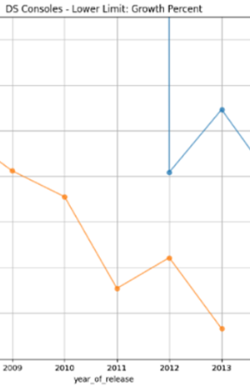 

However, this trend did not continue with the Xbox. The Xbox consoles differed in that we saw a decrease in sales the year after a new Xbox console was released; a possible reason for this is due to the market being flooded with consoles from other manufacturers that were preferred and/or cheaper. Another possibility for the difference in trend for the Xbox manufacturers could be that the X360 was on the market for a longer period of time without a new console, leading to other consoles having superior upgrades.


## **Statistical Information for Platforms:**

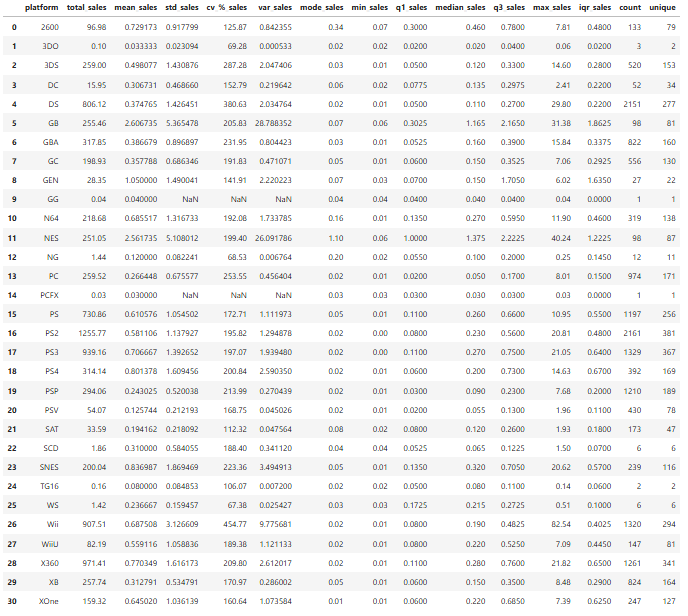 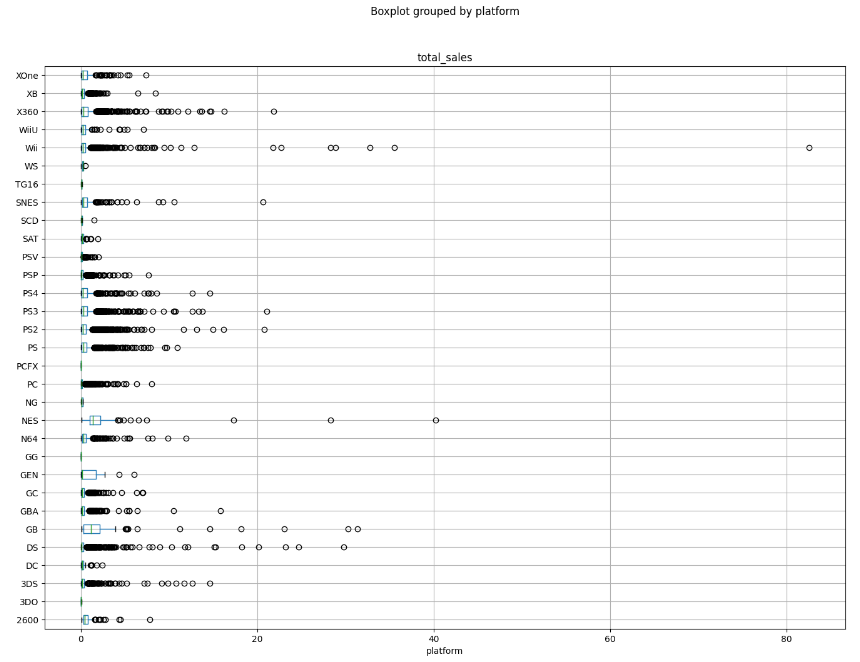

## **User Score & Critic Score Analysis for X360 Sales**

**Summary of the user_score data**

The data is concentrated toward the higher values. There is a weak positive correlation for user scores to total sales. So, the user score tends to increase as sales increase, but most of the scores are clustered between 40 - 90 with total sales under 2 million for the Xbox console. However, there is another cluster of scores between 50 - 90 with games sales between 2 - 4 million in total sales for the Xbox console, but this data is much more sparse and still has elements of randomness outside this cluster. Additionally, games above 4 million tend to score between 60 - 90. As you can see from the scatterplot and with the range of clusters getting smaller as sales go up, there is a weak, but positive correlation; as sales go up, more games receive a higher user score. If the correlation was strong, there would not be as much overlap with the score ranges. There is still a significant and greater amount of user scores that reach between 60 - 90 that have total sales under 2 million. For this reason, the correlation is not strong. 

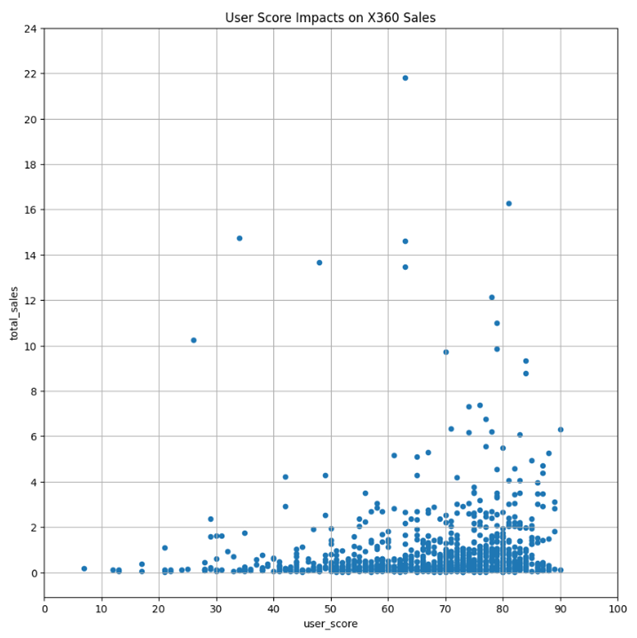


**Summary of critic_score data**

The data is concentrated toward the higher values, but the values tend to be more specific and less random than the user score data. There is a moderate positive correlation for critic socres to total sales. The critic scores tend to incease as sales increase. Most scores are between 40 - 90 for games under 2 million in total sales. Sales between 2-4 million are clustered between critic scores of 70 - 95. Notice that this range extends past 90, unlike the games under 2 million. This shows us that there are more games in the 2-4 million dollar range that receive a score between 90 - 95 than games that produce under 2 million in sales. Games that produce 4-6 million in sales tend to receive a critic score between 80 - 95. The 6 - 8 million dollar range is the same (80-95), but the data is much more sparse. Games that produce 8 million + in sales typically receive a critic score between 85 - 98, but again, the data is sparse. You can see the data is much more specific, but the ranges still overlap with the majority of games producing 2 million and under sales still receiving high scores between 70 - 90

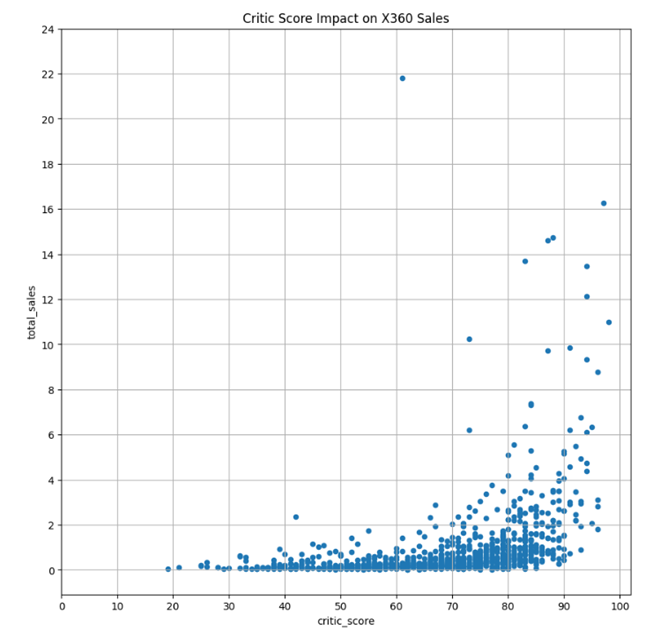


**Overall:**

Critics are more likely to give consistent scores; we can infer they may have stricter guidelines to follow when scoring a game than users do.

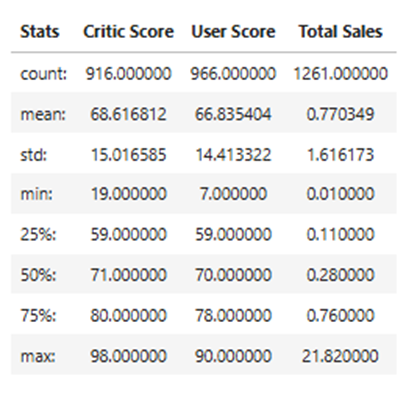

**Critic Score Corrleation to Total Sales:**

**Pearson Correlation Coefficient:** 0.3937358653072584


**User Score Correlation to Total Sales:**

**Pearson Correlation Coefficient:** 0.11445882978454192



## **Performance Assessment for Games Across Multiple Platforms:**


**Lowest Sales:** PC

**Conclusion:** Games sales for the PC will stay consistently low. We have already seen that PC games have been consistently lower over time, but have had the longest running lifecycle. 

**Highest Sales:** PS2, PS3, X360

**Conclusion:** PlayStation and XBox games will have consistently high sales which makes sense as they are often seen as the two most popular consoles.

**Moderate Sales:** DS & Wii

**Conclusion:** DS & Wii games will have sales that vary. Wii sales have varied between moderately low to moderately high and most likely favor games geared toward a younger audience as these consoles increase performance with pixar games. 

**Overall:** The PS3 & X360 have the largest selection of games which likely factors into higher sales. This is likely due to the popularity and competition between these consoles. While the PS3 and X360 produce the most sales overall; these consoles tend to lack with games geared toward a younger audience. On the contrary, DS & Wii consoles perform best with games meant for a younger audiences.



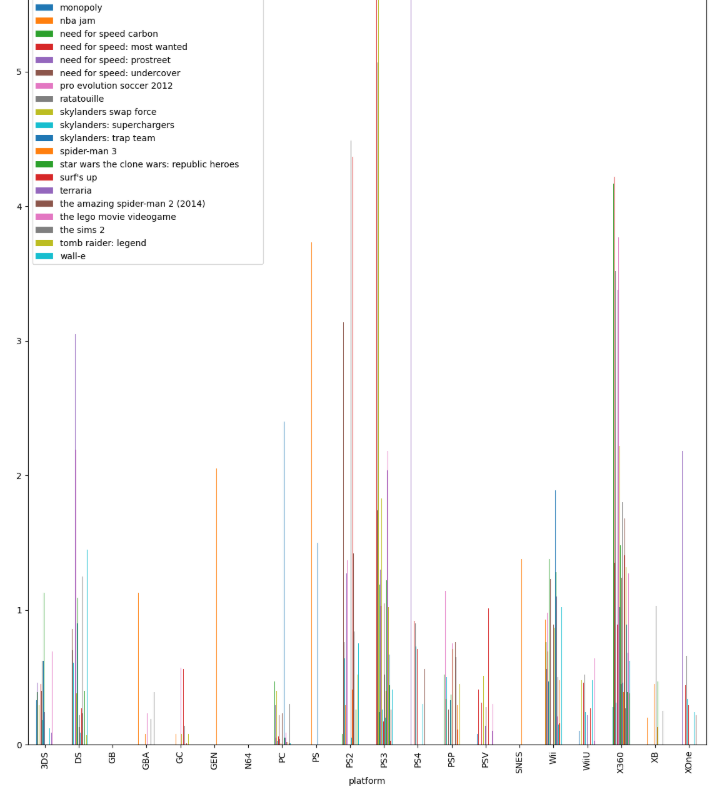

**Individual Assessment for Games Across Multiple Platforms:**


**Need for Speed:**
- Lowest Sales: PC
- Highest Sales: PS2, PS3, & X360 
- Note: X360 sales are consistent and high for all regions

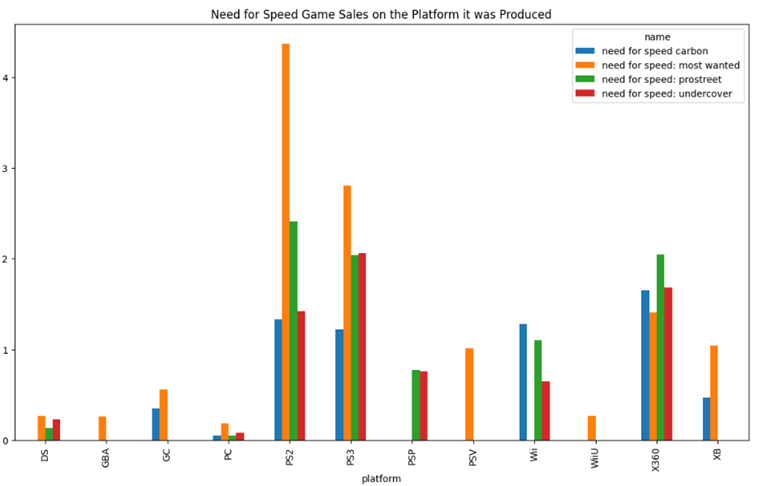

**LEGO Games:**
- Lowest Sales: PC 
- Highest Sales: X360 & PS3

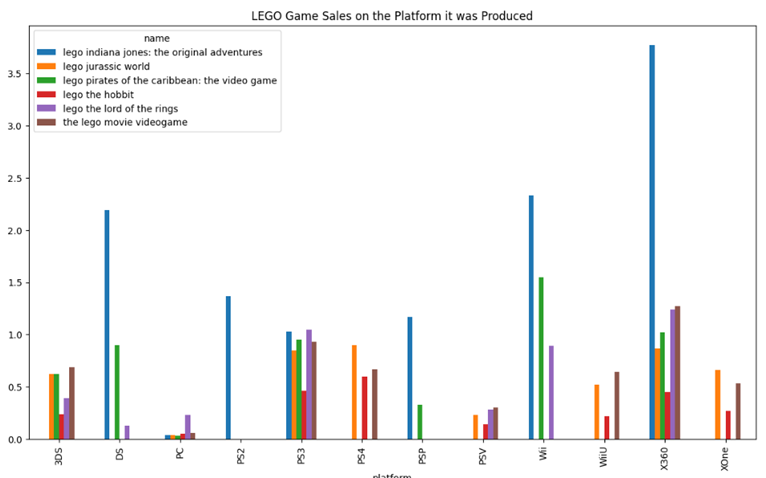

**LEGO Batman & Marvel Games:**
- Lowest Sales: PC & PSV 
- Highest Sales: X360, Wii, PS3, & PS4
- Overall High Sales:  X360 & PS3

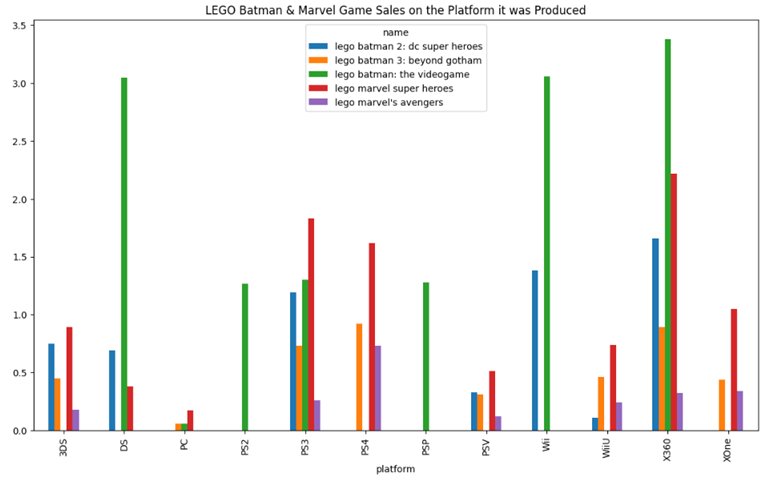

**Action Games:**
- Lowest Sales: PC & 3DS
- Highest Sales: X360, PS3, & Wii

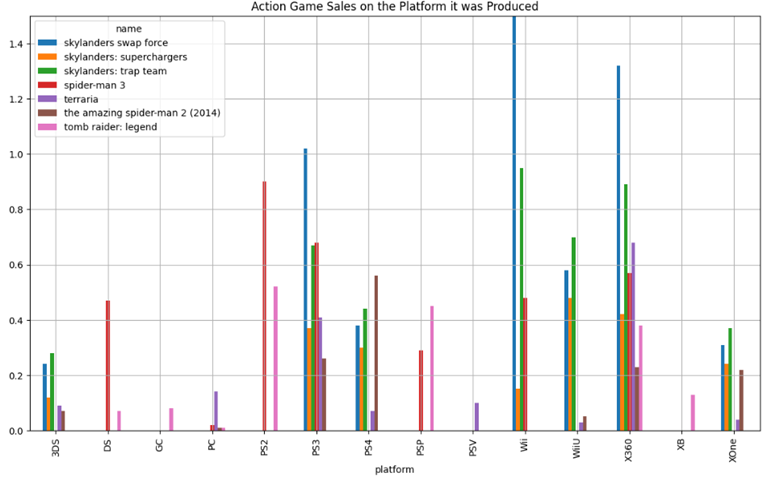

**Pixar/Kid/Other Games:**
- Lowest sales: PC (except monopoly)
- Note: PS3 & X360 - have been consistantly higher until these games
- Highest Sales: PS2, Wii, & DS

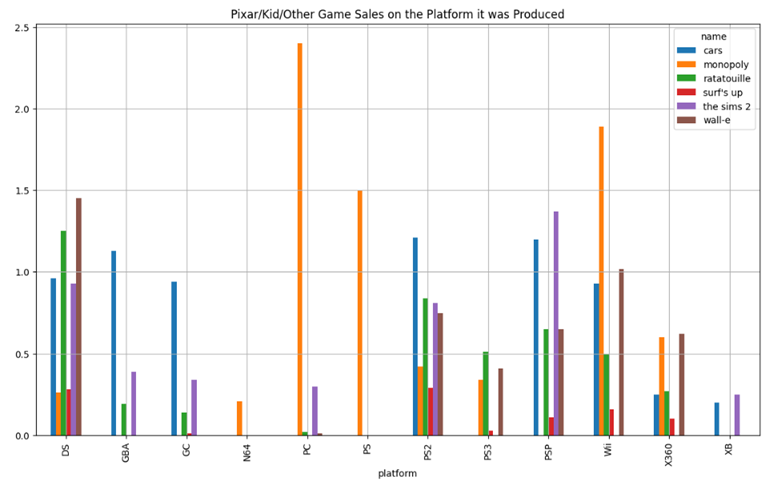

**Harry Potter:**
- Lowest Sales: PC 
- Highest Sales: All sales are relatively consistent, but Wii and DS have the highest overall sales

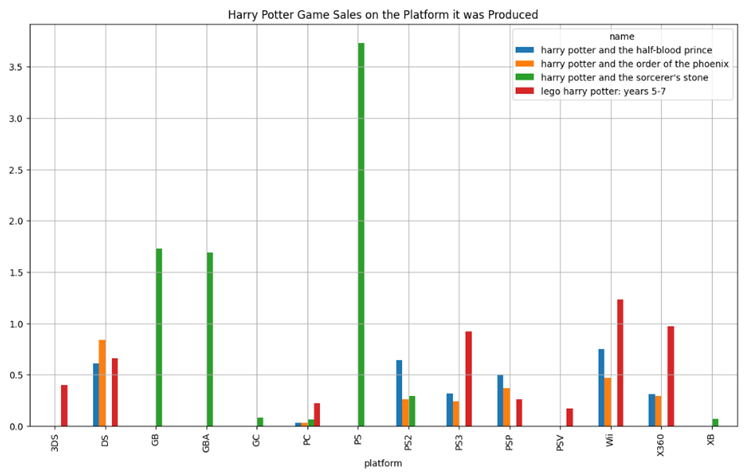

**FIFA Games:**
- Lowest Sales: PC, 3DS, & DS
- Highest Sales: PS3 & X360

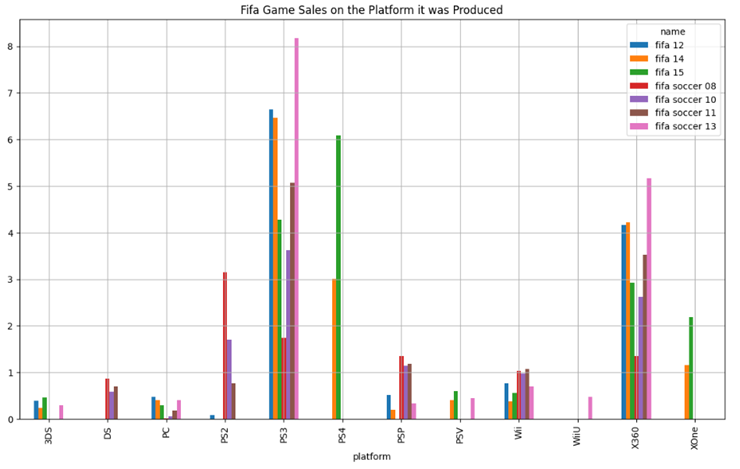

**Madden Games:**
- Lowest Sales: DS games
- Highest Sales: PS2 & X360

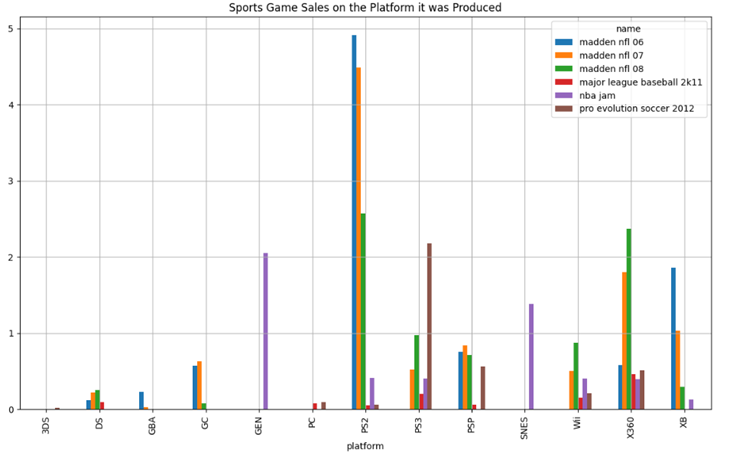

**Star Wars Games:**
- Lowest Sales: PC & PSV 
- Highest Sales: Wii, PS3, & DS

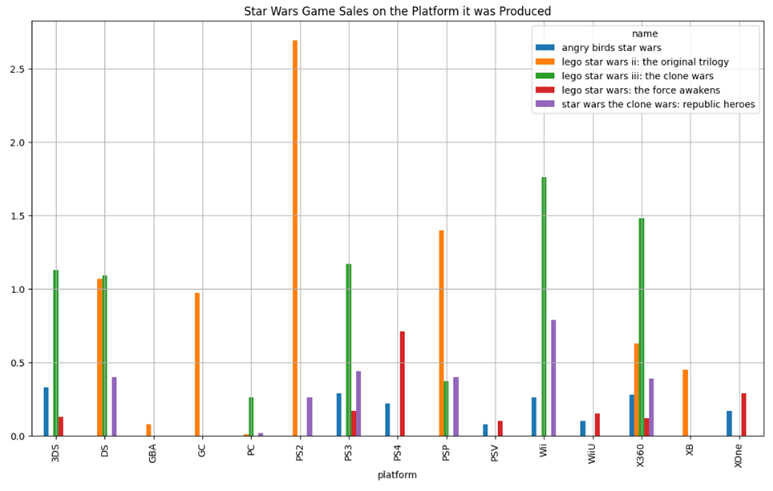

## **Genre Analysis Data:**

**Genre Performance By Decade:**

**1980 - 1990:**
- reached over 40 million
    - Platform
- reached over 30
    - Shooter
    - Puzzle
- reached over 20
    - Action

**1990 - 2000:**
- reached over 40 million
    - Role-Playing
    - Sports
- reached over 30
    - Action
    - Racing
    - Fighting (barely and only in one year)
- reached over 20
    - Platform
    - Shooter
    - Misc (barely and only in 1999)

**2000 - 2010:**
- reached over 140 million
    - Action
- reached over 120
    - Sports
- reached over 80
    - Misc
- reached over 60
    - Shooter
    - Racing (only in 2010)
- reached over 40
    - Simulation
    - Platform

**2010 - 2016:**
- reached over 120 million
    - Action
- reached over 80
    - Shooter
- reached over 50
    - Misc (only in 2011, mostly over 20)
- reached over 40
    - Role-Playing
    - Sports
- reached over 20
    - Platform
    - Fighting (only in 2011)

**Summary Notes:**

- Action Games reached the top spots between 2000 - 2016; 3rd highest between 1990 - 2000, 4th highest between 1980 - 1990
- Sports Games reached the 2nd top spot between 1990 - 2010; 5th highest between 2010 - 2016
- Shooter Games reached the 2nd top spot from 1980 - 1990 & 2010 - 2016; 7th highest between 1990 - 2000; 4th highest between 2000 - 2010

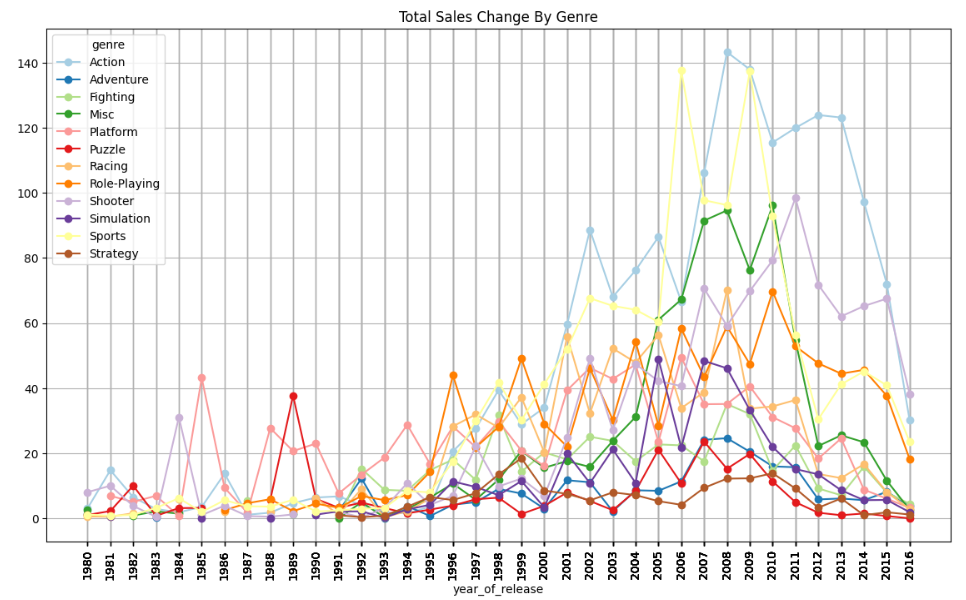

**Overall:**

Action and Sports Games are the most consistent in terms of high sales. Shooter games perfomed well in the 80's and 2010's, but fell off in the 90's before making consistent sales throughout the 2000's. This data is based off total sales only.

**Market Share:**

According to market share percent, Action games perform the most consistently well from 1980 - 2016. Sports games have also done consistently well, but did not compare as much as Action games in the earlier years. 

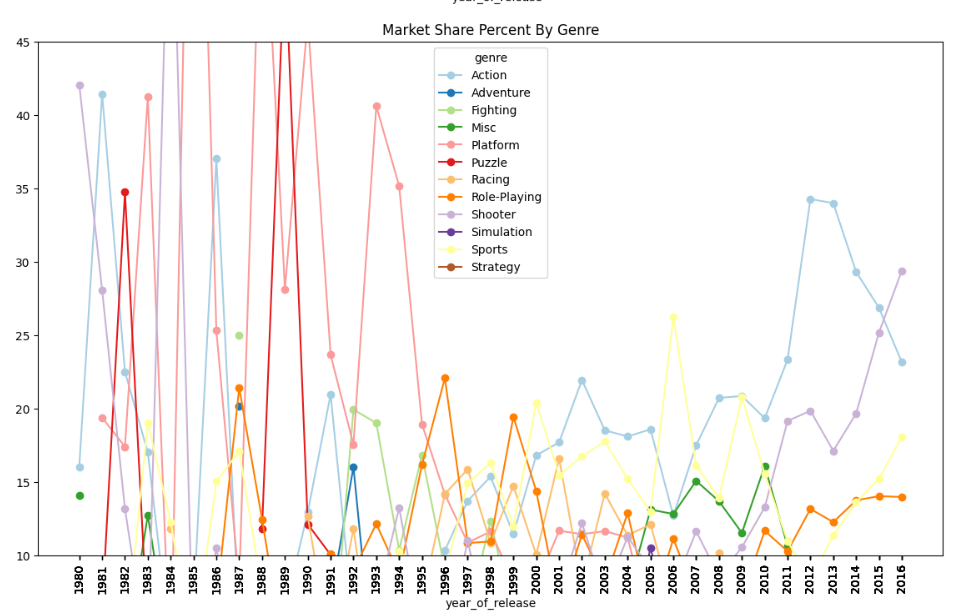


**Genres Showing Growth & Decline:**

- Based on the market share, Action games have started declining since 2012
- Shooter games have started increasing steadily since 2008
- After a steep decline, Sports games have started increasing since 2012
- Misc games have started declining since 2010
- All other games have remained relatively consistent since 2005

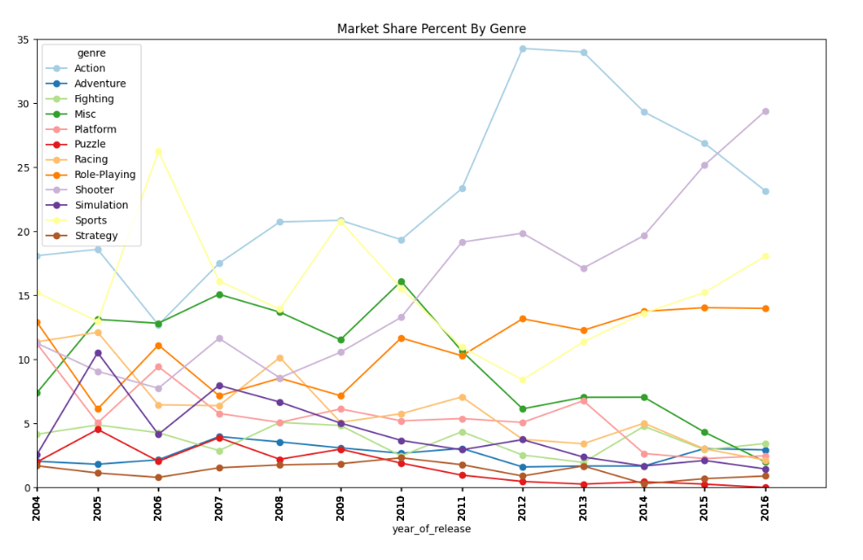


**Average Platform Performance:**

On average Platform games perform the best while Shooter games perform the 2nd best
 
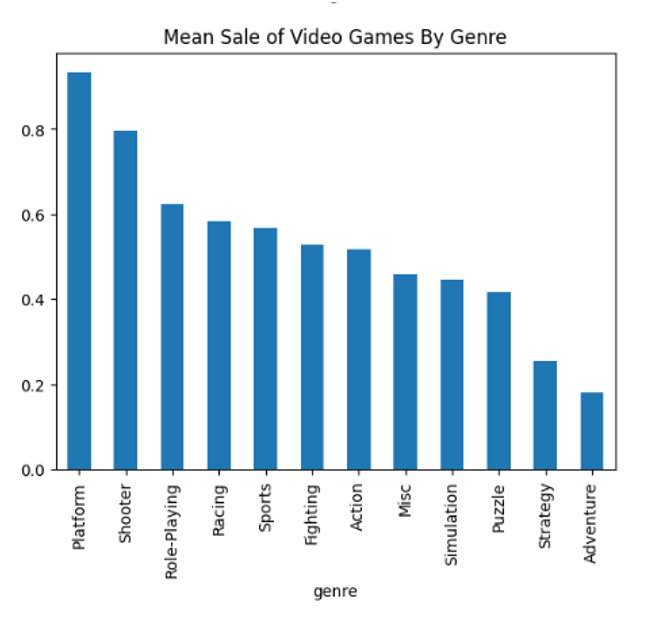

In [247]:
genre_overall_sales = games_3.groupby('genre')['total_sales'].sum()
genre_overall_sales.sort_values(ascending= False)

genre
Action          1744.17
Sports          1331.26
Shooter         1052.45
Role-Playing     934.56
Platform         827.29
Misc             802.51
Racing           728.67
Fighting         447.53
Simulation       389.97
Puzzle           242.57
Adventure        237.59
Strategy         174.23
Name: total_sales, dtype: float64

## **PLATFORM SALES BY REGION:**


**North America**

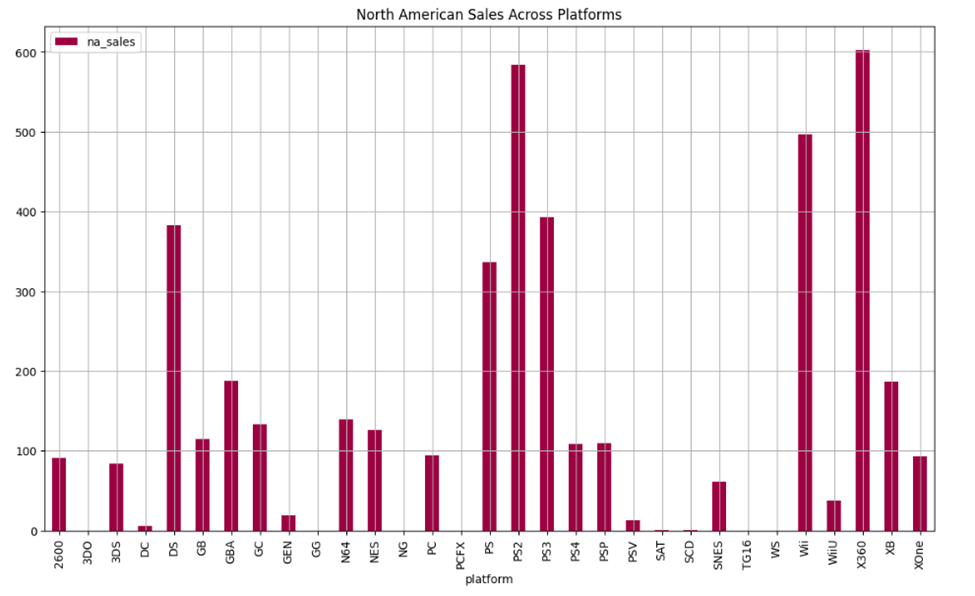


North American Sales typically lead the market with 17/31 (~55 %) platforms. Of those 17 leading sales, 13 made more than 100 million in sales. 

The top 5 North American Sales (making over $600,000) came from the following platforms (highest to lowest):
- X360
- PS2
- Wii
- PS3
- DS


**Japan**

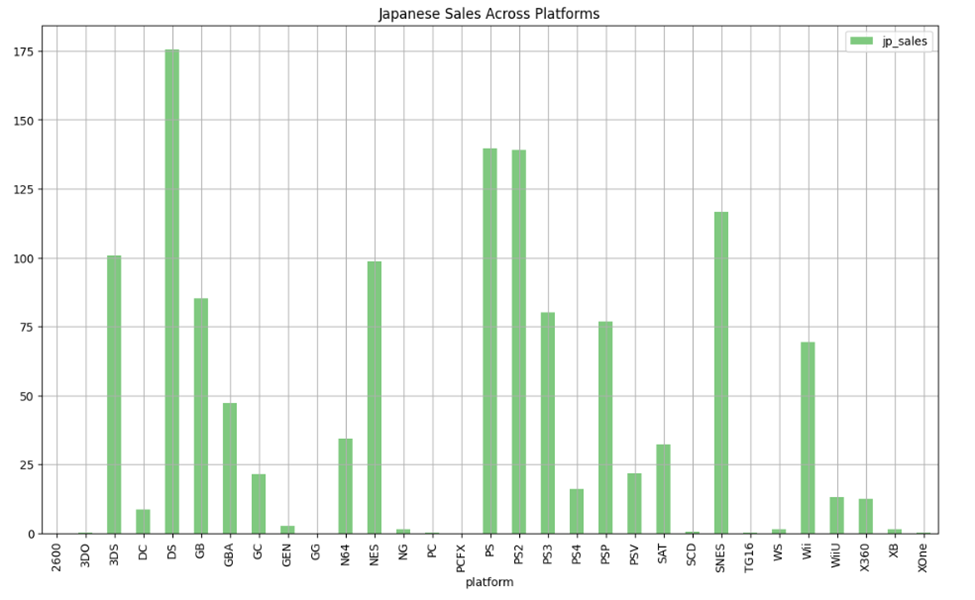


Japanese Sales outperform all countries in 12/31 platforms (~38 %). Of those 12 consoles, 6 consoles appear to be exclusive to Japan as there are no other countries sales. 

The top 5 Japanese Sales (highest to lowest):
- DS
- PS
- PS2
- SNES
- 3DS



**Europe**

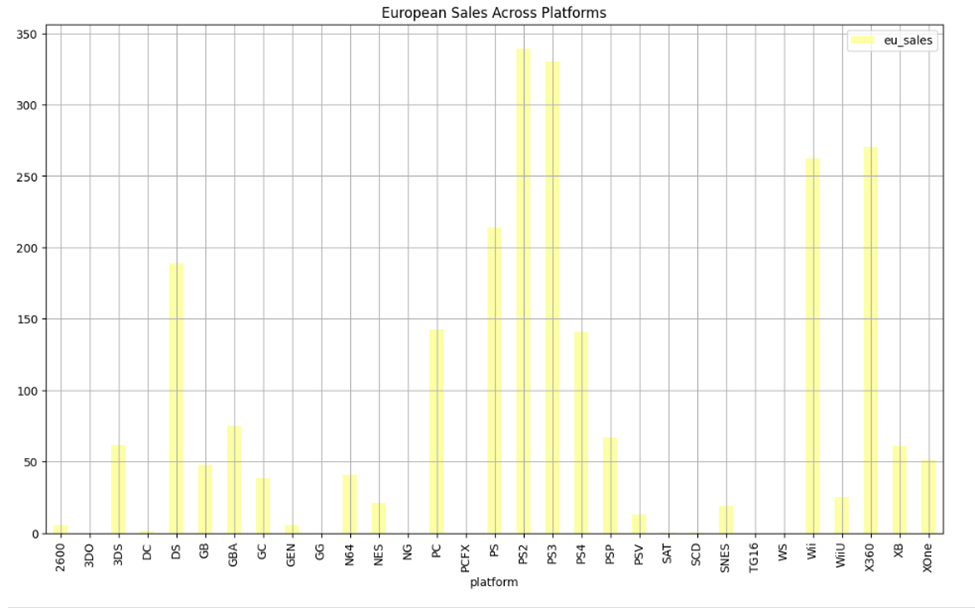


European Sales outperform 2/31 countries (~6 %)

The top 5 European Sales (highest to lowest):
- PS2
- PS3
- X360
- Wii
- PS



**Other**

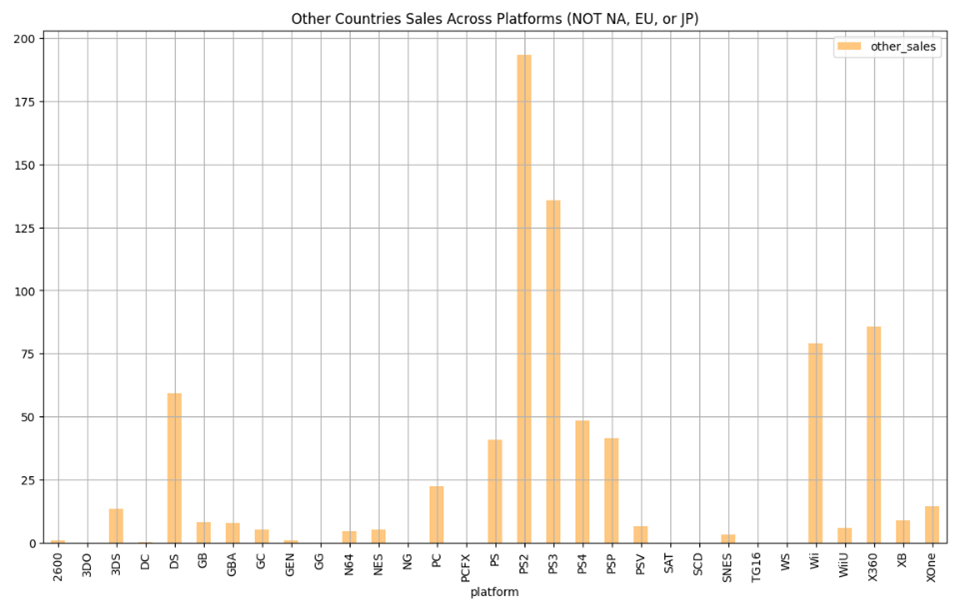


Other Countries do not outperform any of the top leading countries

The top 5 Other Countries Sales (highest to lowest):
- PS2
- PS3
- X360
- Wii
- DS





**Individual Platform Sales for Each Region**


**Notes:**
- We can see in the individual graphs that Europe does not exceed 350 million and Japan & Other Countries do not exceed 200 million
    - North America exceeds 200 million in sales on 6 consoles (PS,DS, PS3, Wii, PS2, X360)
    - North America exceeds 350 million in sales on 5 consoles (DS, PS3, Wii, PS2 X360)
    - North America exceeds 400 million in sales on 3 consoles (Wii, PS2, X360)
    - North America exceeds 500 million in sales on 2 consoles (PS2, X360)
    - X30 sales slightly exceed 600 million in sales
- This is an additional 700 million in sales on 5 consoles where North America exceeds Europes limit.
- This is an additional 1.5 billion in sales on 6 consoles that where North America exceeds Japan and Other countries limit.
- Similarly Europe exceeds 200 million in sales on 5 consoles
    - Profiting an additional 60 million on 5 consoles that exceed Japan and Other countries limit. (PS, Wii, X360, PS3, PS2)




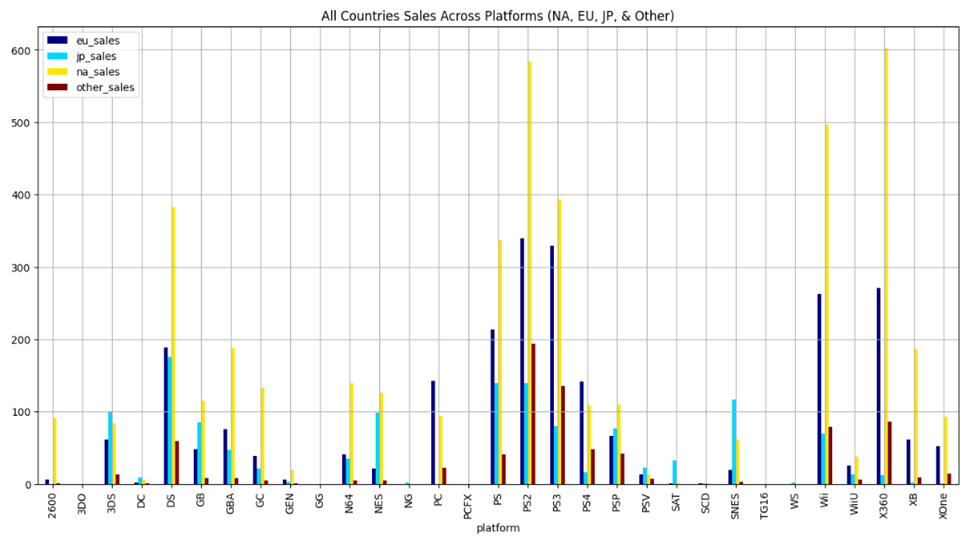

**Overall**

North American Sales lead the market. The top selling platforms in relation to different regions tends to be the PS2 ranking in the top 1-3 spots for all countries. The second leading platform is the PS3, ranking in the top 2-3 spots for all countries. 
- PS2 - ranks 1 in EU & Other and 2 in NA and 3 in JP
- PS3 - ranks 3 in NA & JP and 2 in EU & Other
- X360 - not top 5 rank in JP; ranks 3 in EU & Other and 1 in NA
- PS - not top 5 rank for other countries; ranks 5 in NA & EU and 2 in JP
- Wii - not top 5 rank for NA & JP; ranks 4 in EU & Other
- DS - not top 5 rank in EU & JP; ranks 4 in NA and 5 in Other
- SNES - not top 5 rank in NA, EU, & Other; ranks 4 in JP
- 3DS - not top 5 rank in NA, EU, & Other; ranks 4 in JP

**This is the same photo except the y-axis is limited to a maximum height of 0.2 to help see the lower sales range more accurately:**

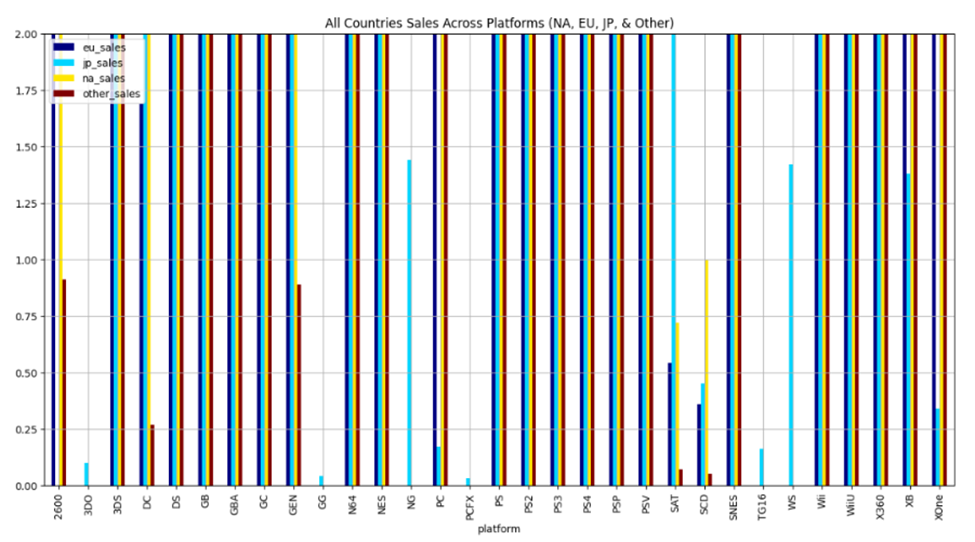



<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 



**Overall:**

- North America leads with top sales in all regionally leading consoles; pulling in around 2.3 billion across all 5 platforms
    - (X360, PS2, PS3, DS, PS)
- Europe is 2nd in top sales in all regionally leading consoles; pulling in around 1.35 billion across all 5 platforms
    - (PS2, PS3, X360, PS, DS)
- Japan is 3rd in top sales in regionally leading consoles; Japan outranks other countries in the DS & PS and pulls in ~547 million in sales across all 5 platforms:
    - (DS, PS, PS2, PS3, X360)
- Other Countries ranks last in regionally leading consoles; other countries outrank Japan in the PS2, PS3, X360 and pulls in ~515 million in sales across all 5 platforms:
    - (PS2, PS3, X360, DS, PS)




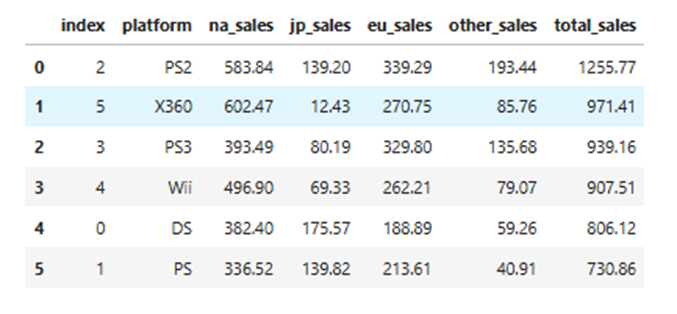 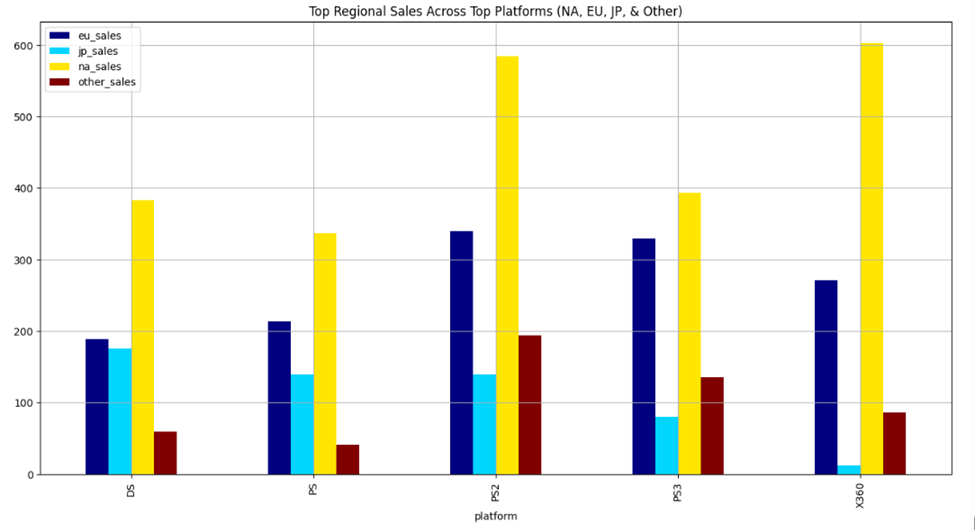

**Top 5 Average Sales in North America:**
- NES
- GB
- GEN
- 2600
- X360


**Top 5 Average Sales in Japan:**
- NES
- GB
- SNES
- WS
- 3DS

**Top 5 Average Sales in Europe:**
- GB
- PS4
- PS3
- NES
- XOne
- WS


**Top 5 Average Sales in Other:**
- PS4
- PS3
- PS2
- GB
- X360


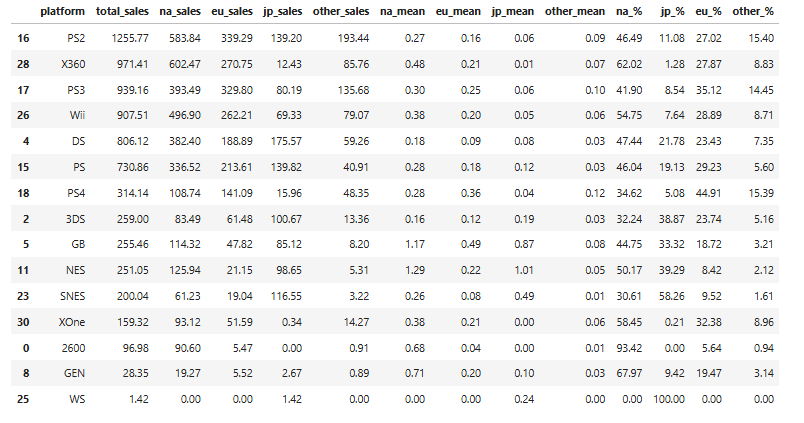

In [246]:
platform_overall_mean = games_3.groupby('platform')['total_sales'].mean()
platform_overall_mean.sort_values(ascending=False)

platform
GB      2.606735
NES     2.561735
GEN     1.050000
SNES    0.836987
PS4     0.801378
X360    0.770349
2600    0.729173
PS3     0.706667
Wii     0.687508
N64     0.685517
XOne    0.645020
PS      0.610576
PS2     0.581106
WiiU    0.559116
3DS     0.498077
GBA     0.386679
DS      0.374765
GC      0.357788
XB      0.312791
SCD     0.310000
DC      0.306731
PC      0.266448
PSP     0.243025
WS      0.236667
SAT     0.194162
PSV     0.125744
NG      0.120000
TG16    0.080000
GG      0.040000
3DO     0.033333
PCFX    0.030000
Name: total_sales, dtype: float64

## **GENRE SALES BY REGION**

**Top 5 Genres for Each Region in Sales** (in order: highest to lowest)

**North America**
- Action
- Sports
- Shooter
- Platform
- Misc

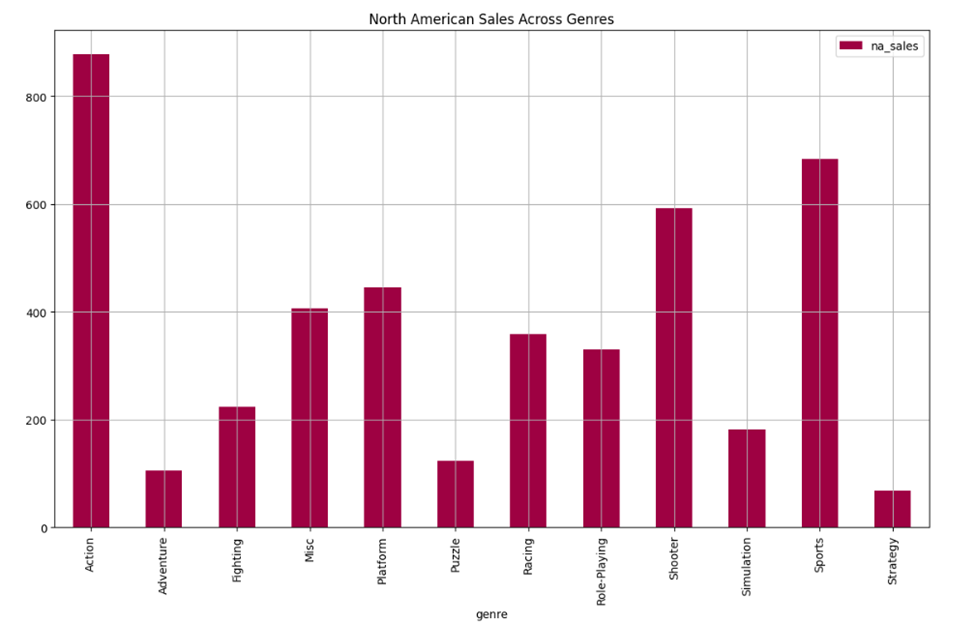
    
**Europe**
- Action
- Sports
- Shooter
- Racing
- Misc

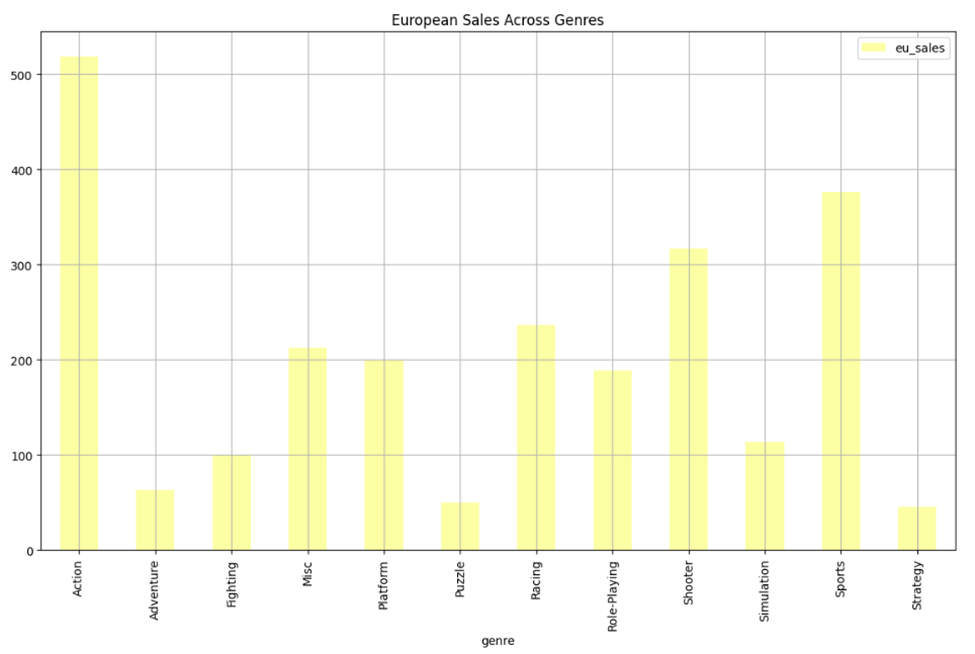

**Japan**
- Role-Playing
- Action
- Sports
- Platform
- Misc

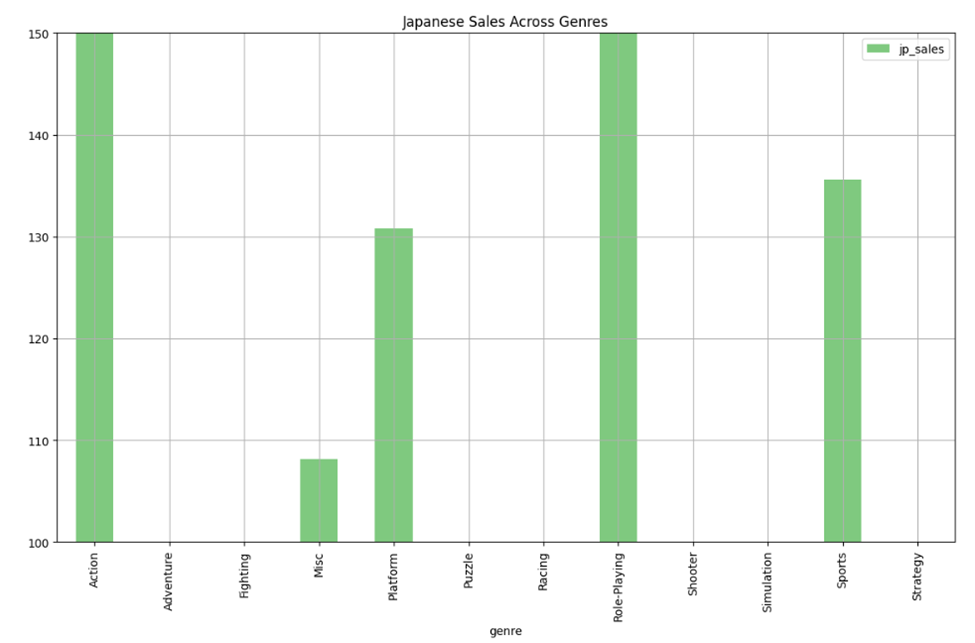

**Other**
- Action
- Sports
- Shooter
- Racing
- Misc

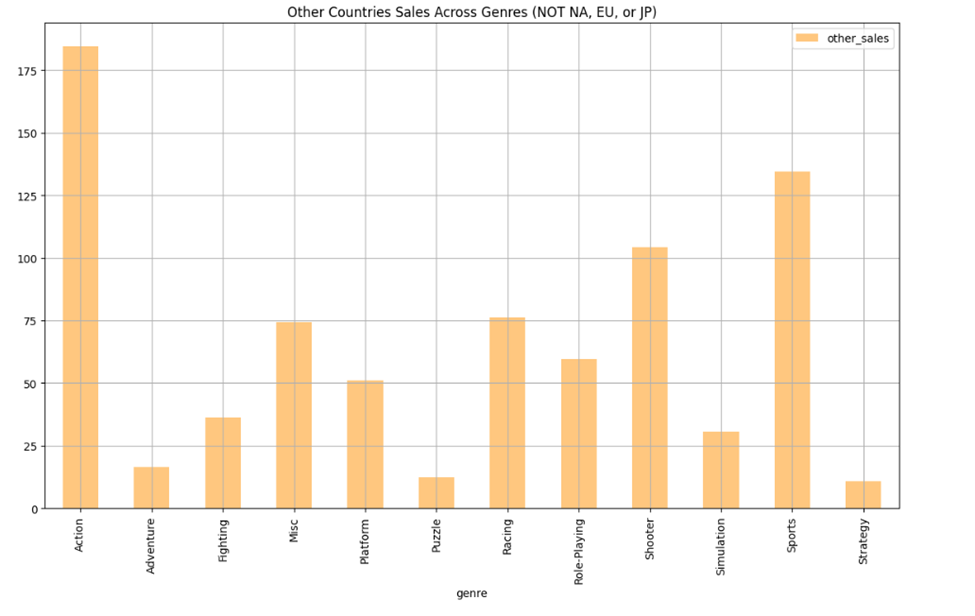



**Summary Notes:**
- North America has the highest sales in 11/12 (~92 %) Genres
- Japan has the highest sales in 1/12 (~8 % ) Genres
- Europe and Other Countries do not have the highest sales in any Genre
- Japan has the highest sales, not including North America, in 3/12 (25%) Genres
- Europe has the highest sales, not including North America, in 9/12 (75%) Genres
- Other countries do not have the highest sales, not including North America, in any Genre
- Other Countries have higher sales than Japan in 3 Genres (Action, Racing, Shooter)



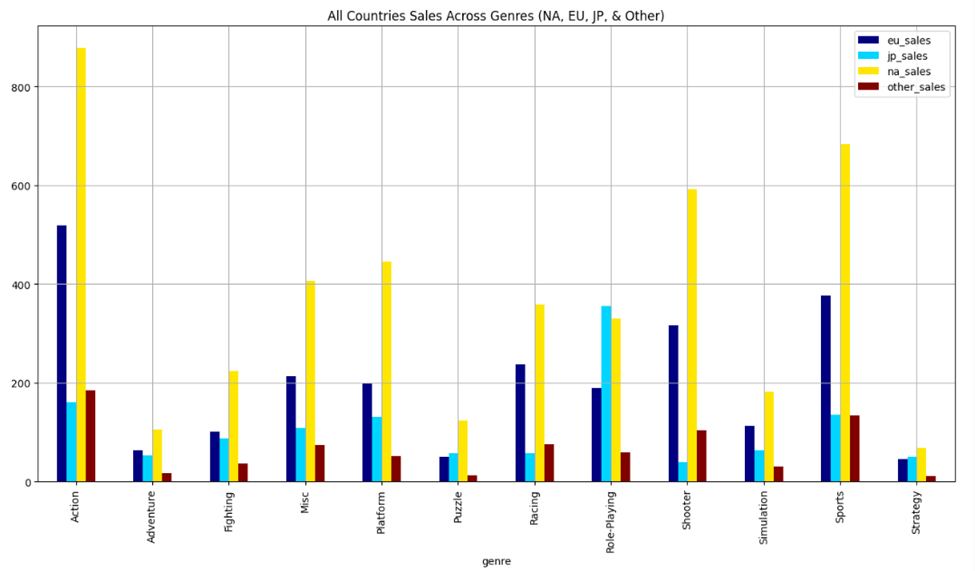

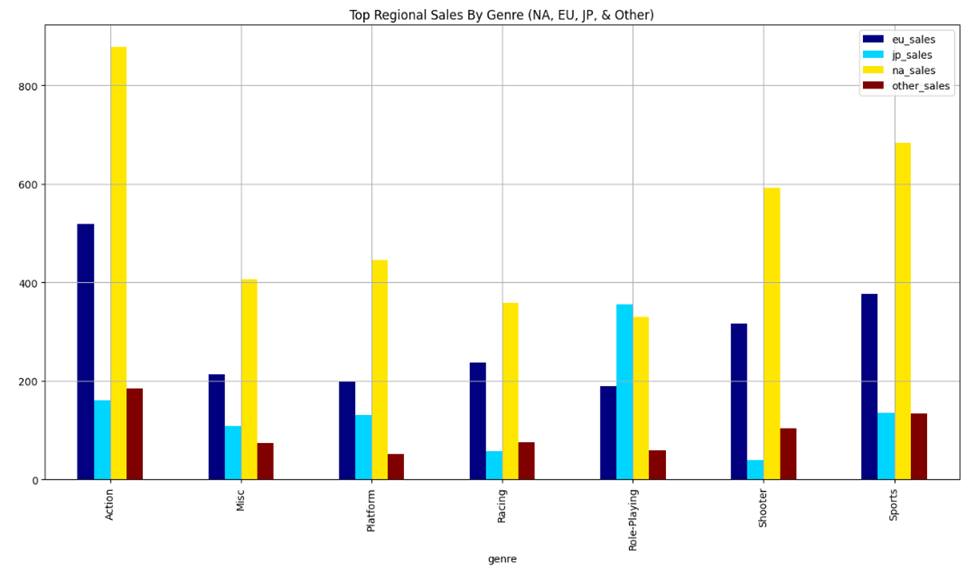

**Summay of Sales Among Regionally Popular Genres**
- (#1) North America: Almost 3.7 billion among 7 top Genres
- (#2) Europe: Over 2.05 billion among 7 top Genres
- (#3) Japan: Over 986 million among 7 top Genres
- (#4) Other: Over 684 million among 7 top Genres


**Top Genre Sales**

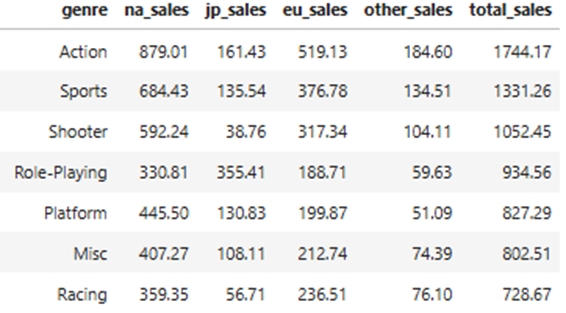

**Top Overall Sales Among Regionally Popular Genres**
- Action
- Sports
- Shooter
- Role-Playing
- Platform
- Misc
- Racing


**Summary Notes**
- North America generated more in almost every top genre
    - Action:
        - 359.88 million more than Europe
        - 717.58 million more than Japan - lowest sales
        - 694.41 more than other countries
        - Making up 50.4 % of the total Action Sales
    - Sports:
        - 307.65 million more than Europe
        - 548.89 million more than Japan
        - 548.92 million more than Other countries
        - Making up 51.4 % of the total Sports Sales
    - Shooter:
        - 274.9 million more than Europe
        - 553.48 million more than Japan
        - 488.13 million more than Other countries
        - Making up 56.3% of the total Shooter Sales


**Overall Percent Each Region Makes for Top Genres**

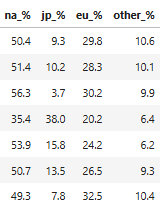


**Percent for ALL Genres per Region**

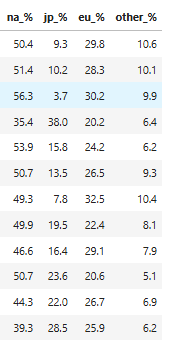

## **ESRB SALES BY REGION**

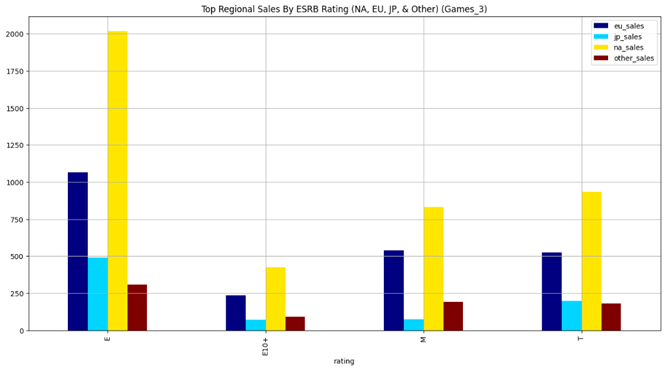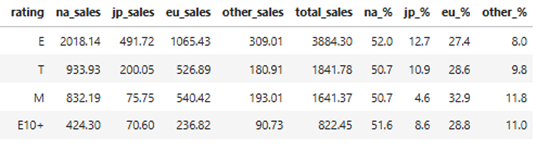   

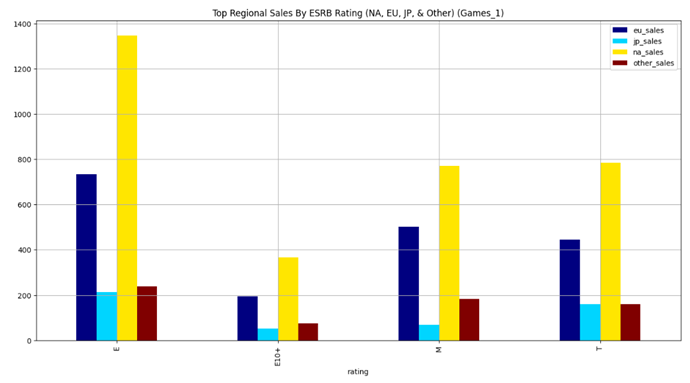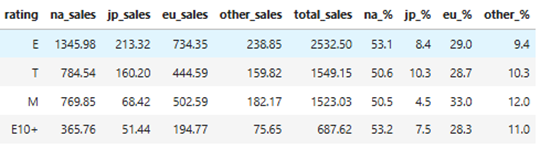

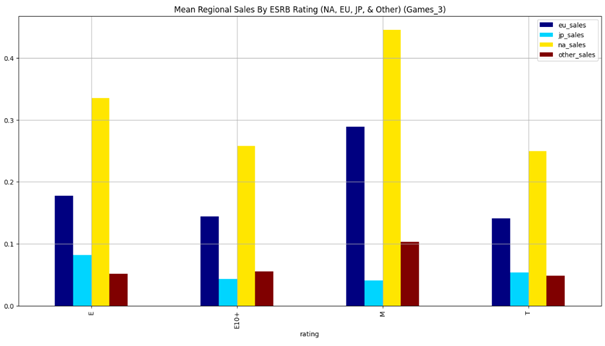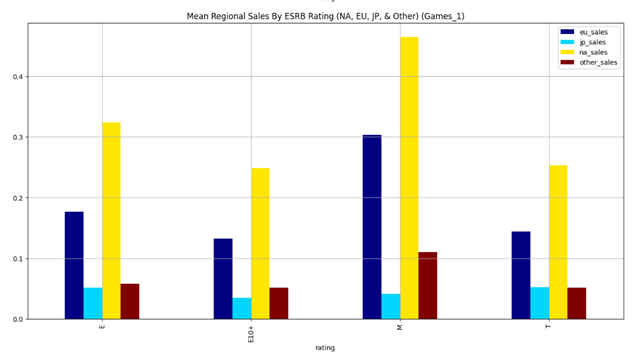

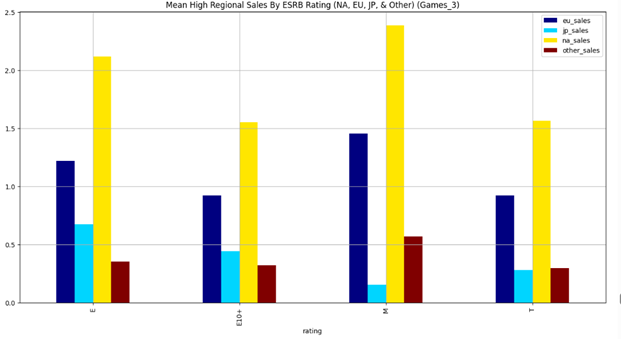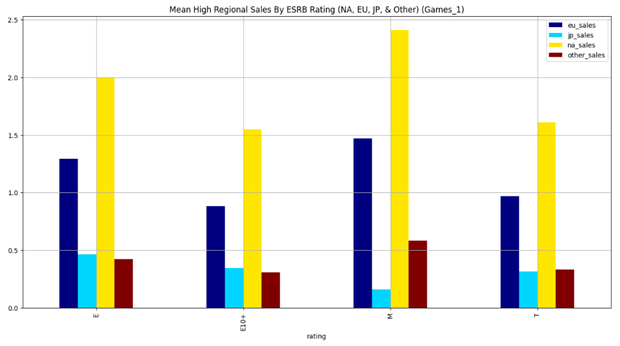

**Overall**

In terms of sales, all regions perform best with E rated games. In terms of shares, this remains true for North America. The North American region seems to favor E10+ and E similarly. The share for E10+ is 53.2 %  (Games_3: 51.6 %) while the share for E is 53.1% (Games_3: 52%)  which aligns with the North American region favoring the more family friendly rating. Overall, the North American region performs best with the E and E10+ rated games. 

However, on average, M rated games produce higher revenue than E games for North America, Europe, and Other countries.

Overall, looking at both graphs, Japan performs best with E and T rated games while performing the worst with M rated games. This could be due to these types of games being culturally inappropriate, therefore, not widely played or these types of games may not even be allowed/distributed/known in Japan.  

Contrary to Japan, M rated games seem to perform the best in European and Other Countries. Even though total sales are higher for the E rating for both Europe and Other Countries, this is likely due to the sheer amount of E rated games vs M rated games. 

We can conclude that North America perform best with E & E10+ rated games, Japan performs best with E & T rated games, and Europe and Other Countries perform best with M rated games. To increase sales in Europe and Other Countries, we could suggest producing more M rated games since the only reason total sales for the E rated games are high is likely due to availability of these games. 

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 

## **Hypothesis Testing:**

**Conclusion:**

Null = Average user ratings of the Xbox One and PC platforms are the same.

The p-value is less than 0.01% weather we set equal var as True or False. This means there is less than 0.01% probability of randomly getting a difference as extreme as 5.4 (or larger), assuming the null is true. The probability is extrememly low so we can conclude that there is a statistically significant difference between the average user scores for PC and XOne consoles. 

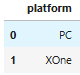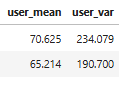
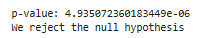

**Conclusion:**

Null = Average user ratings for the Action and Sports genres are the same

Although the mean for Action and Sports user scores differ, there is a 12.02% (10.92% if equal_var set to True) probability of getting a 0.915 difference or larger. This probability is high so we can't conclude that there is a significant difference between the average user scores among Sports and Action Genres.  

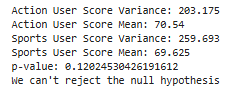

<div class="alert alert-success">
<b>Reviewer's comment v1:</b>
    
Amazing! 